<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'> <u>КОММЕНТАРИЙ ТИМЛИДА</u>
</font>
<font color='green'><br>
Здравствуй, Илья  !
Это Николай. И нам повезло - мы делаем интереснейший проект!<br>
Далее, я постарюсь прокомментировать сделанные шаги.<br>
Вперёд!

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'> 
<u>КОММЕНТАРИЙ ТИМЛИДА 2</u>
</font>
<font color='green'><br>Илья, теперь это бомба) И аналитика, и визуализация, и чётко отметил важные моменты с выбросами и лишними партиями. Всё вперёд к моделям!

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='green'> <b><u>КОММЕНТАРИЙ РЕВЬЮЕРА</u></b>
</font>
<font color='green'><br>Доброго дня, Илья!<br>
Проект попал ко мне на проверку. Пошёл смотреть....

# Промышленность — задача проекта

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

## Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

## Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.


## План работы:
    

### Исследовательский Анализ Данных
- Импортируем данные, проведем исследовательский анализ данных.
- Проведем предобработку данных

### Предобработка данных

- Подготоим данные:
 - Объединим таблицы в один датасет для нашей будущей модели
 - Обработаем пропуски
 - Целевой признак - Последняя температура
 - Проведем срез данных по Key до начиная с 2500 партии

### Обучение моделей и подбор параметров

- Будем использовать XGBoost, CatBoost, LightGBM, LinearRegression с подбором нужных параметров
- Сравним полученные результаты наших моделей и выделим лучшую
- Проверим на тестовой выборке
- Напишем отчет


#### Вопросов нет. Почитал чат группы, посмотрел запись консультации. Работаем! Времени на раскачку нет!


<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'> <u>КОММЕНТАРИЙ ТИМЛИДА</u>
</font>
<font color='green'><br>
Понял, это здорово ,что удалось с вопросами всё порешать) <br>
Только в этом спринте ещё первичный анализ данных ожидался) Всё равно его делать... Буду ждать его от тебя. Постараюсь не затягивать с ответом, что бы модель успеть достроить)

## Исследовательский Анализ Данных


In [1]:
#Импорт библиотек
import os
import math
import time
import itertools 
import urllib.request
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style("darkgrid")
import xgboost
import lightgbm as lgb
import matplotlib.pyplot as plt
%matplotlib inline
from pathlib import Path
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')
SEED=12345
from scipy import stats

In [2]:
#Создадим класс для автообработки данных
class DS:


    def missing_zero_values_table(self, df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
            columns={0: 'Zero Values', 1: 'Missing Values', 2: '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero Missing Values'] = 100 * mz_table['Total Zero Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
        print("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"
                                                                                                       "There are " + str(
            mz_table.shape[0]) +
              " columns that have missing values.")

        return mz_table

    
    def sns_draw(self, data, parametr, bins=30):
        fig = plt.figure(figsize=(15, 6), dpi= 80)
        grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)
        ax_main = fig.add_subplot(grid[:-1, :-1])
        ax_right = fig.add_subplot(grid[:-1, -1])  
        sns.distplot(data[parametr], ax=ax_main)
        sns.boxplot(data[parametr], ax=ax_right)
        ax_right.grid(axis='y')
        ax_main.set(title='График '+parametr)
        ax_main.axvline(np.mean(data[parametr]),color='g', linestyle='--', label='Среднее')
        ax_main.axvline(np.median(data[parametr]),color='g', linestyle='-', label='Медиана')
        ax_main.legend()
        fig.show()
    
    
    def plot_feature_importance(self,importance,names,model_type):

        feature_importance = np.array(importance)
        feature_names = np.array(names)

        #Create a DataFrame using a Dictionary
        data={'feature_names':feature_names,'feature_importance':feature_importance}
        fi_df = pd.DataFrame(data)

        #Sort the DataFrame in order decreasing feature importance
        fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

        #Define size of bar plot
        plt.figure(figsize=(10,8))
        #Plot Searborn bar chart
        sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
        #Add chart labels
        plt.title(model_type + 'FEATURE IMPORTANCE')
        plt.xlabel('FEATURE IMPORTANCE')
        plt.ylabel('FEATURE NAMES')
        
    def fit(self,train_features, train_actuals):
        for name in models.keys():
            est = models[name]
            est_params = params[name]
            gscv = GridSearchCV(estimator=est, param_grid=est_params, cv=5)
            gscv.fit(train_features, train_actuals)
            train_predictions = gscv.predict(features_train)
            predictions = gscv.predict(features_test)
            result_list.append({
            'model': name,
            'train_mae_score': mean_absolute_error(target_train, train_predictions),
            'test_mae_score': mean_absolute_error(target_test, predictions),
            'best_params': gscv.best_params_
            })
            
    
    def dataset_info(self,data):
        data.info()
        display(data.head(10))
        display(data.describe())
        print('Количество дубликатов:', data.duplicated().sum())
    

            
ds = DS()

Загружаем данные

In [3]:
data_arc = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_arc.csv')
data_bulk = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_gas.csv')
data_temp = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_temp.csv')
data_wire = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_wire.csv')
data_wire_time = pd.read_csv('/Users/ilyaivanov/Desktop/Yandex/DS/Projects/Final Final Project Steel/datasets/final_steel/data_wire_time.csv')

In [4]:
data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')
data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/datasets/final_steel/data_arc.csv'

### `Data_arc Dataset` : Данные об электродах


In [5]:
#Выведем первоначальную информацию 
ds.dataset_info(data_arc)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Количество дубликатов: 0


**Вывод:**
- Имеем 14 876 строк, с 5 столбцами.
- Необходимо будет изменить тип данных у "Начало нагрева дугой" и "Конец нагрева дугой" на datetime
- Пропусков не имеется, Дубликатов также нет
- Имеем аномальное значение -715 Реактивной мощности. Возможно ошибка измерения

In [6]:
#Изменим тип данных на datetime
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])

data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   Начало нагрева дугой  14876 non-null  datetime64[ns]
 2   Конец нагрева дугой   14876 non-null  datetime64[ns]
 3   Активная мощность     14876 non-null  float64       
 4   Реактивная мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


In [7]:
#Посчитаем количество партий по количеству уникальных значений 'key'
len(data_arc['key'].unique())

3214

Mode is:  4


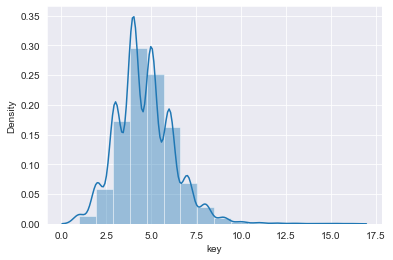

In [8]:
#Построим график 
sns.distplot(data_arc['key'].value_counts(), bins=16)
mode = stats.mode(data_arc['key'].value_counts())
print('Mode is: ',mode[0][0])

Key - содержит номер партии
- Количество итераций обработки отличается для каждой партии от 1 до 16. Мода = 4

### Разберем, что такое активная и реактивная мощности:

- `Активная мощность (Real Power)`

    Единица измерения — ватт (русское обозначение: Вт, киловатт - кВт; международное: ватт -W, киловатт - kW).

    Среднее за период Τ  значение мгновенной мощности называется активной  мощностью, и

    выражается формулой:
    

$$ P =  {1 \over T} \int\limits_{0}^{T} p(t) dt $$



- `Реактивная мощность (Reactive Power)`

    Единица измерения — вольт-ампер реактивный (русское обозначение: вар, кВАР; международное: var).

    Реактивная мощность — величина, характеризующая нагрузки, создаваемые в электротехнических устройствах колебаниями энергии электромагнитного поля в цепи синусоидального переменного тока, равна произведению среднеквадратичных значений напряжения U и тока I, умноженному на синус угла сдвига фаз φ между ними:
    $$ Q = U * I * Sin\varphi $$
     (если ток отстаёт от напряжения, сдвиг фаз считается положительным, если опережает — отрицательным). Реактивная мощность связана с полной мощностью S и активной мощностью P  соотношением: 
     $$ | Q | = {\sqrt{S^2 - P^2}} $$
 
 
 
 
- `Полная мощность (Apparent Power)`

    Единица полной электрической мощности — вольт-ампер (русское обозначение: В·А, ВА, кВА-кило-вольт-ампер; международное: V·A, kVA).
    Полная мощность — величина, равная произведению действующих значений периодического электрического тока I в цепи и напряжения U на её зажимах:
    $$ S = U * I $$ 
    соотношение полной мощности с активной и реактивной мощностями выражается в следующем виде:
    $$  S  = {\sqrt{P^2 + Q^2}} $$
    где P — активная мощность, Q — реактивная мощность (при индуктивной нагрузке Q›0, а при ёмкостной Q‹0). Векторная зависимость между полной, активной и реактивной мощностью выражается формулой: 
    
    $$ \overrightarrow S = \overrightarrow P + \overrightarrow Q $$
    
    Полная мощность имеет практическое значение, как величина, описывающая нагрузки, фактически налагаемые потребителем на элементы подводящей электросети (провода, кабели, распределительные щиты, трансформаторы, линии электропередачи), так как эти нагрузки зависят от потребляемого тока, а не от фактически использованной потребителем энергии. Именно поэтому полная мощность трансформаторов и распределительных щитов измеряется в вольт-амперах, а не в ваттах.


<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='green'> <b><u>КОММЕНТАРИЙ РЕВЬЮЕРА</u></b>
</font>
<font color='green'><br>есть обоснование полной, ок!

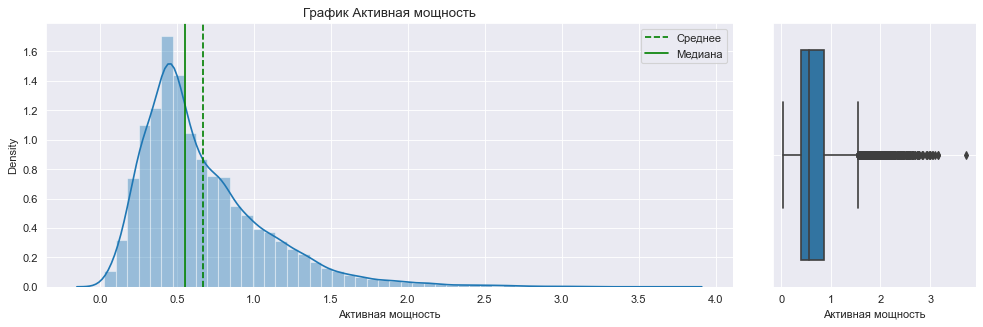

In [9]:
#Посмотрим на распределение активной мощности
ds.sns_draw(data_arc,'Активная мощность')

- распределение напоминает нормальное со сдвигом влево

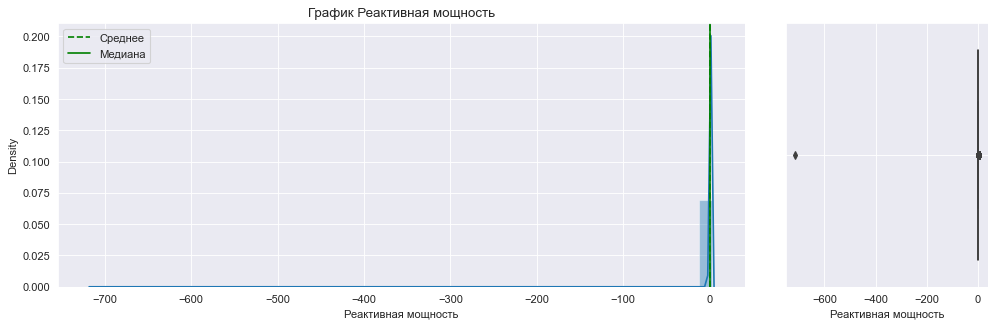

In [10]:
#Посмотрим на распределение реактивной мощности
ds.sns_draw(data_arc, 'Реактивная мощность')

- Видим аномальное значение реактивной мощности. Попробуем избавиться от него и посмотрим на результат

In [11]:
#Избавимся от выбросов меньше нуля
data_arc = data_arc[data_arc['Реактивная мощность'] >= 0]

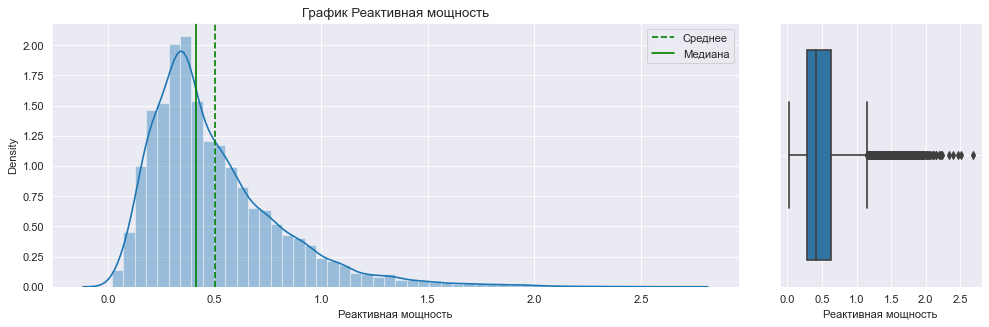

In [12]:
#Еще раз посмотрим на распределение реактивной мощности после удаления выбросов
ds.sns_draw(data_arc, 'Реактивная мощность')

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='green'> <b><u>КОММЕНТАРИЙ РЕВЬЮЕРА</u></b>
</font>
<font color='green'><br>отлично.

Корреляция активной и реактивной мощности 0.9631819131519807


<Figure size 1440x720 with 0 Axes>

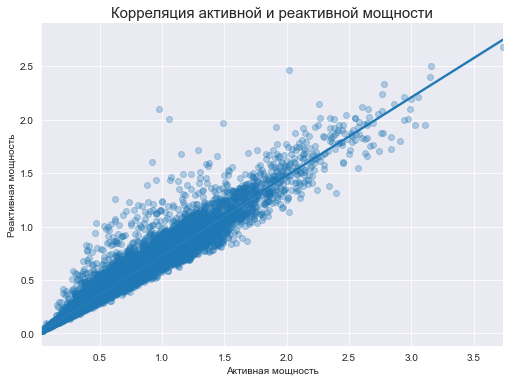

In [13]:
#Проверим корреляцию между активной и реактивной мощностями
print('Корреляция активной и реактивной мощности', data_arc['Активная мощность'].corr(data_arc['Реактивная мощность']))
plt.figure(figsize=(20,10))
sns.lmplot(x='Активная мощность', y='Реактивная мощность',data=data_arc, scatter_kws={'alpha':0.3}, aspect=14/10)
plt.title('Корреляция активной и реактивной мощности', fontsize=15)
plt.show();

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='green'> <b><u>КОММЕНТАРИЙ РЕВЬЮЕРА</u></b>
</font>
<font color='green'><br>принято! Кстати, если бы не удалили выброс - корреляции видно не было бы)

Реактивная и активная мощности очень сильно коррелируют между собой. Возможна переобучаемость модели в дальнейшем. 

Имея данные по активной и реактивной мощности можем ввести новый признак "Полная мощность" по следующей формуле:

$$ S=\sqrt{P^2+Q^2} $$
где: $P$ — активная мощность, $Q$ — реактивная мощность

In [14]:
#Напишем функцию по расчету Полной мощности
def full_power(row):
    full_power = math.sqrt(row['Активная мощность']**2 + row['Реактивная мощность']**2)
    return full_power

In [15]:
data_arc['Полная мощность'] = data_arc.apply(full_power, axis=1)

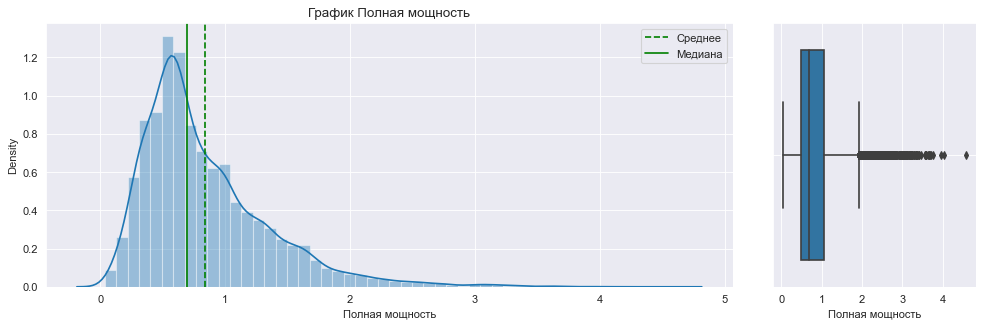

In [16]:
#Посмотрим на распределение Полной мощности
ds.sns_draw(data_arc, 'Полная мощность')

In [17]:
data_arc.head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Полная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,1.193639
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0.959010
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0.896038
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,1.970470
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0.807239


### Вывод:

- Изучили датасет data_arc
- Проверили на дубликаты и пустые значения. Их у нас не оказалось.
- Изменили типы данных на datetime в столбца `начало нагрева дугой` и `конец нагрева дугой`
- Избавились от аномальных значений `-715` в Реактивной мощности. 
- Разобрались, что такое активная и реактивная мощности. Так же из-за сильной корреляции между активной и реактивной мощностями, добавили новый признак `полная мощность`. 

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'><u><b>КОММЕНТАРИЙ РЕВЬЮЕРА</b></u>
<font color='green'><br>ок, и мультиколлинеарноть потом надо не забыть проверить ещщё раз, или использовать только полную..- о этом ты, навреное, и говоришь)

### `Data_Bulk Dataset` : Данные о подаче сыпучих материалов (объём);


In [18]:
ds.dataset_info(data_bulk)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Количество дубликатов: 0


In [19]:
#количество уникальных значений Key
len(data_bulk['key'].unique())

3129

- Типы данных указаны верно. Дубликаты отсутствуют.
- Видим большое количество пропущенных значений в датасете из-за того что для каждой партии добавляют опредленное сочетание сыпучих материалов.

### `Data_Bulk_time` - Данные о подаче сыпучих материалов (время);

In [20]:
ds.dataset_info(data_bulk_time)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56
5,6,NaN,NaN,NaN,2019-05-03 13:59:24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:53:27,NaN,2019-05-03 13:53:27,2019-05-03 13:53:27
6,7,NaN,NaN,NaN,2019-05-03 14:29:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:22:19,NaN,2019-05-03 14:22:19,2019-05-03 14:22:19
7,8,NaN,NaN,NaN,2019-05-03 15:04:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:55:46,NaN,2019-05-03 14:55:46,2019-05-03 14:55:46
8,9,NaN,NaN,NaN,2019-05-03 15:47:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 15:41:00,NaN,2019-05-03 15:41:00,2019-05-03 15:41:00
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:18:52,NaN,2019-05-03 16:18:52,2019-05-03 16:18:52


,key
count,3129.000000
mean,1624.383509
std,933.337642
min,1.000000
25%,816.000000
50%,1622.000000
75%,2431.000000
max,3241.000000


Количество дубликатов: 0


**Вывод:**

- Наблюдаем большое количество пропущенных значений в датасете
- Дубликатов не имеем, Имеются типы данных, которые нужно исправить
- В построении нашей будущей модели данный датасет использовать не будем, поэтому нет необходимости проводить его предобработку

### `Data_gas` - данные о продувке сплава газом;


In [21]:
ds.dataset_info(data_gas)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


Количество дубликатов: 0


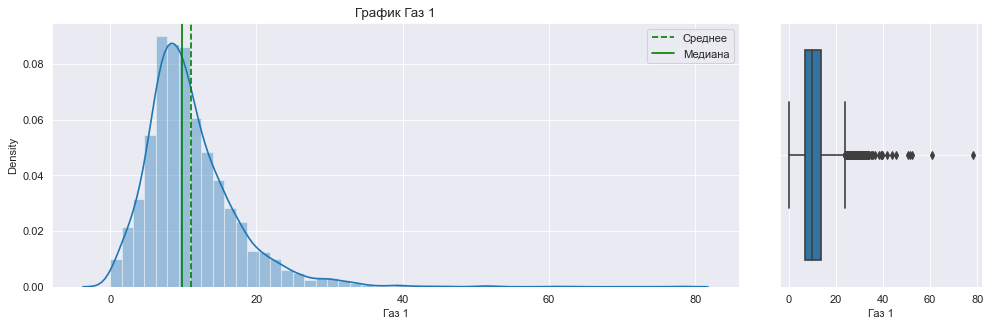

In [22]:
ds.sns_draw(data_gas, 'Газ 1')

In [23]:
#количество уникальных значений Key
len(data_gas['key'].unique())

3239

**Вывод:**
- Исходя из полученных данных можно сказать, что распределение нормальное.
- Дубликатов не имеем, типы данных указаны верно.
- Незаполненныз значений не имеем

### `Data_temp` - Результаты измерения температуры;


In [24]:
ds.dataset_info(data_temp)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   Время замера  15907 non-null  object 
 2   Температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


,key,Температура
count,15907.000000,13006.000000
mean,1607.880870,1591.840920
std,942.212073,21.375851
min,1.000000,1191.000000
25%,790.000000,1581.000000
50%,1618.000000,1591.000000
75%,2427.000000,1601.000000
max,3241.000000,1705.000000


Количество дубликатов: 0


In [25]:
#Изменим тип данных у время замера
data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'])

In [26]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           15907 non-null  int64         
 1   Время замера  15907 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


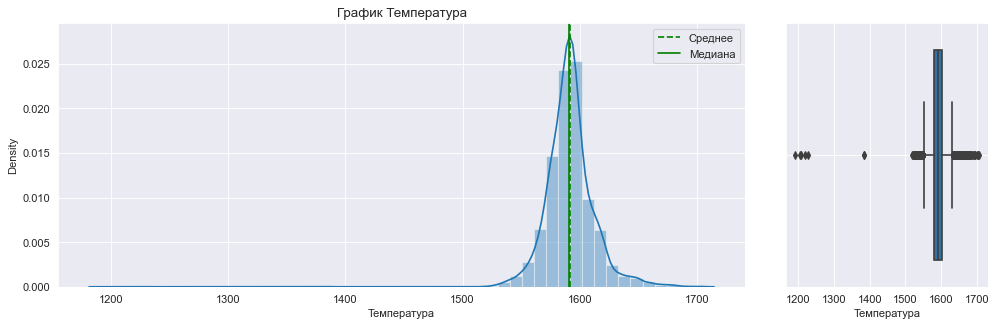

In [27]:
#Посмотрим на распределение температуры
data_temp = data_temp.dropna(subset=['Температура'])
ds.sns_draw(data_temp, 'Температура')

In [28]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13006 entries, 0 to 15902
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           13006 non-null  int64         
 1   Время замера  13006 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 406.4 KB


In [29]:
#посмотрим на пропуски Температура
data_temp[data_temp['Температура'].isnull()].head(10)

,key,Время замера,Температура


In [30]:
data_temp[data_temp['Температура'].isnull()].tail()

,key,Время замера,Температура


**Вывод:**
- В датасете отсутствуют некоторые данные по температурам, мы их удалим для дальнейшей работы.
- Распределение выглядит нормальным, но имеются аномальные выбросы
- Исправили тип данных у Время замера на datetime
- Дубликатов не имеется

### `Data_Wire`  -  данные о проволочных материалах (объём);


In [31]:
ds.dataset_info(data_wire)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442842,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060484,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


Количество дубликатов: 0


- Дубликатов не имеем 
- Имеются пустые значения в датасете, скорее всего они пустые потому что различные виды проволочных материалов поступали в разных пропорциях в разные промежутки времени.
- Типы данных указаны верно

### `Data_Wire_time` - данные о проволочных материалах (время).

In [32]:
ds.dataset_info(data_wire_time)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2019-05-03 13:59:02,2019-05-03 13:59:54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,2019-05-03 14:28:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,2019-05-03 15:03:42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2019-05-03 15:42:43,2019-05-03 15:58:12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,2019-05-03 16:20:25,2019-05-03 16:21:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


Количество дубликатов: 0


- Дубликатов не имеется
- Имеются пустые значения
- Типы данных в Wire 1 указаны неверно, но менять не будет так как данный датасет использовать в дальнейшем не будем.

### Вывод по Исследовательскому Анализу Данных

- Загрузили данные, изучили.
- Избавились от некоторых аномальных значений.
- Изменили типы данных, в некоторых датасетах были неправильно указаны данные типа Datetime
- Проверили данные на пропуски и дубликаты.
- В датасете data_arc ввели сразу новый признак "Полная мощность"
- В таргете отсутствуют данные начиная с 2500й партии, поэтому в дальнейшем нужно будет провести срез данных начиная с 2500 партии.


<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'><u><b>КОММЕНТАРИЙ РЕВЬЮЕРА</b></u>
<font color='green'><br>отлично, идём дальше)

### Предобработка данных

In [33]:
#Создадим новый признак "Общее время нагрева дугой", переведем в секунды
data_arc['Общее время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc['Общее время нагрева дугой'] = data_arc['Общее время нагрева дугой'].dt.seconds

In [34]:
# Поcле 2500 партии значения температуры есть только для первого измерения. 
# Поэтому будем использовать только партии до 2500 номера.
data_temp = data_temp.query('key < 2500')
data_arc = data_arc.query('key < 2500')
data_bulk = data_bulk.query('key < 2500')
data_wire = data_wire.query('key < 2500')

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'><u><b>КОММЕНТАРИЙ РЕВЬЮЕРА</b></u>
<font color='green'><br>ДА!!! всё верно с этими партиями)

In [35]:
# определим количество итераций нагрева
data_arc_c = data_arc.groupby(by = 'key', as_index = False).count()[['key', 'Начало нагрева дугой']]
data_arc_c.columns = ['key', 'Количество итераций нагрева']
data_arc_c.head()

,key,Количество итераций нагрева
0,1,5
1,2,4
2,3,5
3,4,4
4,5,4


In [36]:
# сгруппируем данные по партиям
data_arc = data_arc.groupby(by = 'key', as_index = False).sum()

# добавим информацию о количестве итераций нагрева по ключу key
data_arc = data_arc.merge(data_arc_c, how = 'left', on = 'key')
data_arc.head()

,key,Активная мощность,Реактивная мощность,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,4.878147,3.183241,5.826395,1098,5
1,2,3.052598,1.998112,3.649216,811,4
2,3,2.525882,1.599076,2.989534,655,5
3,4,3.209250,2.060298,3.814962,741,4
4,5,3.347173,2.252643,4.035758,869,4


Так как признаки активная и реактивная мощность сильно коррелируют между собой будем использовать признак только полная мощность.


<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'><u><b>КОММЕНТАРИЙ РЕВЬЮЕРА</b></u>
<font color='green'><br>принято, отлично. Но со временем - тоже может быть высокая коррелированность. Теоретически - стоит перед моделированием и этот момент тоже глянуть)

In [37]:
data_arc = data_arc[['key', 'Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']]

In [38]:
data_arc.head(5)

,key,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,5.826395,1098,5
1,2,3.649216,811,4
2,3,2.989534,655,5
3,4,3.814962,741,4
4,5,4.035758,869,4


<Figure size 1080x720 with 0 Axes>

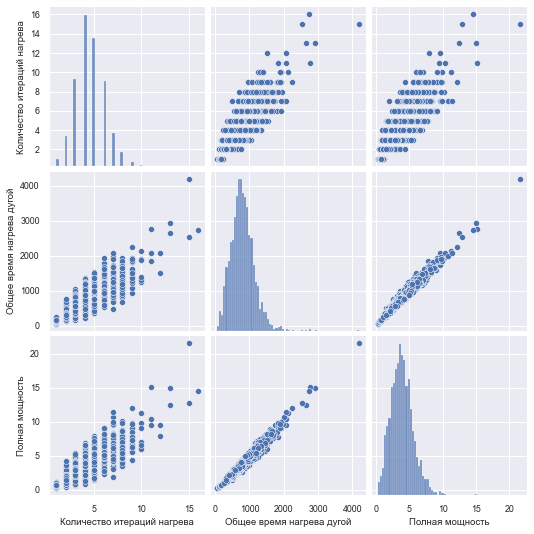

In [39]:
#Посмотрим на корреляцию имеющихся признаков
plt.figure(figsize=(15,10))
sns.set(font_scale=0.8)
sns.pairplot(data_arc[['Количество итераций нагрева', 'Общее время нагрева дугой', 'Полная мощность']], 
             kind="scatter")
plt.show();

In [40]:
data_arc[['Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']].corr()

,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
Полная мощность,1.000000,0.982899,0.760402
Общее время нагрева дугой,0.982899,1.000000,0.795958
Количество итераций нагрева,0.760402,0.795958,1.000000


Сильная корреляция между полной мощностью и общим временем нагрева дугой. Попробуем избавиться от времени нагрева дугой для нашей будущей модели

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'><u><b>КОММЕНТАРИЙ РЕВЬЮЕРА</b></u>
<font color='green'><br>ааа, вот ты это и смотришь. Всё, понял)

In [41]:
#Уберем из датасета столбец "Общее время нагрева дугой"
data_arc = data_arc[['key', 'Полная мощность', 'Количество итераций нагрева']]
data_arc.head(5)

,key,Полная мощность,Количество итераций нагрева
0,1,5.826395,5
1,2,3.649216,4
2,3,2.989534,5
3,4,3.814962,4
4,5,4.035758,4


In [42]:
#Очистим пропуски в данных в таблице data_temp
data_temp = data_temp.dropna(subset=['Температура']).reset_index(drop=True)
data_temp = data_temp.sort_values(by=['Время замера'])
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12267 entries, 0 to 12266
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           12267 non-null  int64         
 1   Время замера  12267 non-null  datetime64[ns]
 2   Температура   12267 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 383.3 KB


In [43]:
#Удалим информацию о партиях по которым известно только одно измерение температуры.
count = data_temp.groupby(by = 'key', as_index = False).count()
one = count[count['Время замера'] == 1]['key'].tolist()
data_temp = data_temp.query('key not in @one')
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12265 entries, 0 to 12266
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           12265 non-null  int64         
 1   Время замера  12265 non-null  datetime64[ns]
 2   Температура   12265 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 383.3 KB


In [44]:
#Сгруппируем данные по партии по первым и последним значениям, последние значения необходимо будет предсказывать.
data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'Время замера 1', 'Время замера 2', 'Температура 1', 'Температура 2']
data_temp = data_temp[['key', 'Температура 1', 'Температура 2']]

In [45]:
data_temp.head(5)

,key,Температура 1,Температура 2
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
4,5,1576.0,1602.0


#### Объединим данные в одну таблицу

In [46]:
# объединим обработанные датасеты по ключу key
data = (data_temp.merge(data_arc, how = 'left', on = 'key')
                 .merge(data_wire, how = 'left', on = 'key')
                 .merge(data_bulk, how = 'left', on = 'key')
                 .merge(data_gas, how = 'left', on = 'key')
       )


# заполним пропуски образовавшиеся после объединения таблиц нулями
data = data.fillna(0)

# переименуем столбцы для корректной работы lgbm
data = data.rename(columns={'Температура 1': 'First_temp',
                            'Температура 2': 'Last_temp',
                            'Полная мощность': 'Full_power',
                            'Количество итераций нагрева':'Heating_iterations',
                            'Газ 1': 'Gas'})

# уберем колонку-индентификатор key, которую мы использовали
# для объединения датасетов
data = data.drop(['key'], axis = 1)
data.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
0,1571.0,1613.0,5.826395,5,60.059998,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986
1,1581.0,1602.0,3.649216,4,96.052315,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561
2,1596.0,1599.0,2.989534,5,91.160157,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793
3,1601.0,1625.0,3.814962,4,89.063515,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219
4,1576.0,1602.0,4.035758,4,89.238236,9.11456,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692


In [47]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2475 entries, 0 to 2474
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   First_temp          2475 non-null   float64
 1   Last_temp           2475 non-null   float64
 2   Full_power          2475 non-null   float64
 3   Heating_iterations  2475 non-null   int64  
 4   Wire 1              2475 non-null   float64
 5   Wire 2              2475 non-null   float64
 6   Wire 3              2475 non-null   float64
 7   Wire 4              2475 non-null   float64
 8   Wire 5              2475 non-null   float64
 9   Wire 6              2475 non-null   float64
 10  Wire 7              2475 non-null   float64
 11  Wire 8              2475 non-null   float64
 12  Wire 9              2475 non-null   float64
 13  Bulk 1              2475 non-null   float64
 14  Bulk 2              2475 non-null   float64
 15  Bulk 3              2475 non-null   float64
 16  Bulk 4

После объединения таблиц мы получили набор признаков с целевым признаком. Разделим нашу выборку на тестовую и обучающие выборки


In [48]:
train, test = train_test_split(data, test_size = .30, random_state = 42)

In [49]:
train.columns

Index(['First_temp', 'Last_temp', 'Full_power', 'Heating_iterations', 'Wire 1',
       'Wire 2', 'Wire 3', 'Wire 4', 'Wire 5', 'Wire 6', 'Wire 7', 'Wire 8',
       'Wire 9', 'Bulk 1', 'Bulk 2', 'Bulk 3', 'Bulk 4', 'Bulk 5', 'Bulk 6',
       'Bulk 7', 'Bulk 8', 'Bulk 9', 'Bulk 10', 'Bulk 11', 'Bulk 12',
       'Bulk 13', 'Bulk 14', 'Bulk 15', 'Gas'],
      dtype='object')

В датасете имеются количественные признаки с разными разбросами, поэтому проведем масштабирование признаков

In [50]:
#Масштабируем количественные признаки
numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('Last_temp')]
scaler = MinMaxScaler()
scaler.fit(train[numeric])

# масштабируем обучающую выборку
train[numeric] = scaler.fit_transform(train[numeric])

# масштабируем тестовую выборку
test[numeric] = scaler.transform(test[numeric])

In [51]:
print('Размер обучающей выборки:', train.shape)
print('Размер тестовой выобрки:', test.shape)

Размер обучающей выборки: (1732, 29)
Размер тестовой выобрки: (743, 29)


In [52]:
test.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
873,0.770492,1591.0,0.214243,0.200000,0.305894,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.279070,0.0,0.443396,0.254321,0.254902
2037,0.838115,1591.0,0.091565,0.133333,0.224143,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.107344
952,0.799180,1587.0,0.095651,0.200000,0.257863,0.629906,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.135709
1615,0.807377,1586.0,0.087121,0.133333,0.233211,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.164954,0.0,0.204403,0.503704,0.047523
1712,0.909836,1597.0,0.053778,0.133333,0.311986,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.100595,0.0,0.218553,0.308642,0.160983


### Вывод по Предобработке данных

- Провели предобработку данных
- Избавились от выборосов и пустых значений
- Соединили таблицы в одну итоговую таблицу
- Разделили выборки на 30% тестовой выборки и 70% обучающей выборки
- Также провели масштабирование признаков
    
    

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
<font color='green'><u><b>КОММЕНТАРИЙ РЕВЬЮЕРА</b></u>
<font color='green'><br>Чёткая работа по разделу)

### Обучение моделей и подбор параметров

In [53]:
# Определим target и features для обучающей выборки
features_train = train.drop(['Last_temp'], axis = 1)
target_train = train['Last_temp']

# Определим target и features для тестовой выборки
features_test = test.drop(['Last_temp'], axis = 1)
target_test = test['Last_temp']

In [54]:
#Определим Модели какие будем использовать 

models = {
    'CatBoostRegressor': CatBoostRegressor(),
    'LGBMRegressor': lgb.LGBMRegressor(),
    'XGBRegressor': xgboost.XGBRegressor(),
    'LinearRegression': LinearRegression()
}


# Параметры для каждой модели, которые будем подбирать
params = {
    'CatBoostRegressor':{
          'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),  
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[SEED],
          'depth': np.arange(3, 7)
    },        

    'LinearRegression':{
            'fit_intercept' : [True, False],
            'normalize':[True,False]
    },
    
    
    'LGBMRegressor': {
        'boosting_type': ['gbdt', 'dart', 'goss', 'rf'],
        'objective': ['regression'],
        'learning_rate': [0.001, 0.01, 0.02, 0.03],
        'num_iterations':[500],
        'random_state': [SEED], 
        'max_depth': np.arange(2, 10),
        'metric': ['mae']
        },

    
    'XGBRegressor': {
        'min_child_weight': [10,20,30],
        'gamma': [5],
        'subsample': [1.0],
        'colsample_bytree': [1.0],
        'max_depth': [5,10,20],
        'eval_metric' :['mae']
        }
}

In [59]:
result_list = []
ds.fit(features_train, target_train)

0:	learn: 10.0432986	total: 4.39ms	remaining: 1.31s
1:	learn: 9.9872701	total: 5.57ms	remaining: 830ms
2:	learn: 9.9404951	total: 6.24ms	remaining: 618ms
3:	learn: 9.9119195	total: 7.24ms	remaining: 536ms
4:	learn: 9.8580434	total: 7.88ms	remaining: 465ms
5:	learn: 9.7673097	total: 8.56ms	remaining: 419ms
6:	learn: 9.7064981	total: 9.23ms	remaining: 386ms
7:	learn: 9.6208018	total: 9.86ms	remaining: 360ms
8:	learn: 9.5882929	total: 10.6ms	remaining: 342ms
9:	learn: 9.5287029	total: 11.3ms	remaining: 327ms
10:	learn: 9.4874631	total: 11.9ms	remaining: 313ms
11:	learn: 9.4451067	total: 12.7ms	remaining: 304ms
12:	learn: 9.3901317	total: 13.6ms	remaining: 300ms
13:	learn: 9.3639473	total: 14.2ms	remaining: 290ms
14:	learn: 9.3312144	total: 14.8ms	remaining: 282ms
15:	learn: 9.3067786	total: 15.6ms	remaining: 276ms
16:	learn: 9.2676863	total: 16.4ms	remaining: 273ms
17:	learn: 9.2312831	total: 17.4ms	remaining: 273ms
18:	learn: 9.1942174	total: 18.2ms	remaining: 269ms
19:	learn: 9.1204792	

273:	learn: 5.9145338	total: 191ms	remaining: 18.1ms
274:	learn: 5.9080631	total: 192ms	remaining: 17.4ms
275:	learn: 5.9061433	total: 192ms	remaining: 16.7ms
276:	learn: 5.9032716	total: 193ms	remaining: 16ms
277:	learn: 5.9002703	total: 194ms	remaining: 15.3ms
278:	learn: 5.8970687	total: 194ms	remaining: 14.6ms
279:	learn: 5.8948138	total: 195ms	remaining: 13.9ms
280:	learn: 5.8920101	total: 195ms	remaining: 13.2ms
281:	learn: 5.8901130	total: 196ms	remaining: 12.5ms
282:	learn: 5.8869162	total: 196ms	remaining: 11.8ms
283:	learn: 5.8836497	total: 197ms	remaining: 11.1ms
284:	learn: 5.8799615	total: 197ms	remaining: 10.4ms
285:	learn: 5.8778823	total: 198ms	remaining: 9.7ms
286:	learn: 5.8730460	total: 199ms	remaining: 9ms
287:	learn: 5.8681528	total: 199ms	remaining: 8.31ms
288:	learn: 5.8653962	total: 200ms	remaining: 7.61ms
289:	learn: 5.8639105	total: 201ms	remaining: 6.92ms
290:	learn: 5.8616541	total: 201ms	remaining: 6.23ms
291:	learn: 5.8590462	total: 202ms	remaining: 5.54ms

220:	learn: 6.4300074	total: 152ms	remaining: 54.5ms
221:	learn: 6.4223939	total: 153ms	remaining: 53.9ms
222:	learn: 6.4190639	total: 154ms	remaining: 53.1ms
223:	learn: 6.4141631	total: 154ms	remaining: 52.4ms
224:	learn: 6.4110914	total: 155ms	remaining: 51.7ms
225:	learn: 6.4068797	total: 156ms	remaining: 51ms
226:	learn: 6.4029733	total: 156ms	remaining: 50.3ms
227:	learn: 6.3993059	total: 157ms	remaining: 49.6ms
228:	learn: 6.3918621	total: 158ms	remaining: 48.8ms
229:	learn: 6.3891732	total: 158ms	remaining: 48.1ms
230:	learn: 6.3849591	total: 159ms	remaining: 47.4ms
231:	learn: 6.3763676	total: 159ms	remaining: 46.6ms
232:	learn: 6.3729887	total: 160ms	remaining: 46ms
233:	learn: 6.3656722	total: 161ms	remaining: 45.3ms
234:	learn: 6.3576009	total: 161ms	remaining: 44.6ms
235:	learn: 6.3542136	total: 162ms	remaining: 43.9ms
236:	learn: 6.3517293	total: 162ms	remaining: 43.1ms
237:	learn: 6.3479150	total: 163ms	remaining: 42.5ms
238:	learn: 6.3432652	total: 164ms	remaining: 41.8

183:	learn: 6.3700780	total: 119ms	remaining: 74.8ms
184:	learn: 6.3574942	total: 119ms	remaining: 74.2ms
185:	learn: 6.3544031	total: 120ms	remaining: 73.5ms
186:	learn: 6.3395689	total: 121ms	remaining: 72.9ms
187:	learn: 6.3385999	total: 121ms	remaining: 72.3ms
188:	learn: 6.3336314	total: 122ms	remaining: 71.6ms
189:	learn: 6.3276743	total: 123ms	remaining: 71ms
190:	learn: 6.3228389	total: 123ms	remaining: 70.3ms
191:	learn: 6.3145958	total: 124ms	remaining: 69.6ms
192:	learn: 6.3038980	total: 124ms	remaining: 68.9ms
193:	learn: 6.2982920	total: 125ms	remaining: 68.2ms
194:	learn: 6.2950593	total: 125ms	remaining: 67.6ms
195:	learn: 6.2852414	total: 126ms	remaining: 67ms
196:	learn: 6.2818950	total: 127ms	remaining: 66.3ms
197:	learn: 6.2687281	total: 127ms	remaining: 65.6ms
198:	learn: 6.2626875	total: 128ms	remaining: 64.9ms
199:	learn: 6.2563005	total: 129ms	remaining: 64.4ms
200:	learn: 6.2529423	total: 129ms	remaining: 63.7ms
201:	learn: 6.2379946	total: 130ms	remaining: 63ms

135:	learn: 6.9101596	total: 93.2ms	remaining: 112ms
136:	learn: 6.9053750	total: 94ms	remaining: 112ms
137:	learn: 6.8953359	total: 94.6ms	remaining: 111ms
138:	learn: 6.8907905	total: 95.2ms	remaining: 110ms
139:	learn: 6.8682260	total: 95.8ms	remaining: 110ms
140:	learn: 6.8533488	total: 97.1ms	remaining: 110ms
141:	learn: 6.8486086	total: 97.7ms	remaining: 109ms
142:	learn: 6.8354383	total: 98.6ms	remaining: 108ms
143:	learn: 6.8304749	total: 99.3ms	remaining: 108ms
144:	learn: 6.8250047	total: 100ms	remaining: 107ms
145:	learn: 6.8113337	total: 101ms	remaining: 106ms
146:	learn: 6.8032476	total: 101ms	remaining: 106ms
147:	learn: 6.8011494	total: 102ms	remaining: 105ms
148:	learn: 6.7966697	total: 103ms	remaining: 104ms
149:	learn: 6.7911376	total: 103ms	remaining: 103ms
150:	learn: 6.7766022	total: 104ms	remaining: 103ms
151:	learn: 6.7655884	total: 105ms	remaining: 102ms
152:	learn: 6.7575860	total: 106ms	remaining: 101ms
153:	learn: 6.7511333	total: 106ms	remaining: 101ms
154:	

85:	learn: 7.7480888	total: 56.7ms	remaining: 141ms
86:	learn: 7.7365953	total: 57.3ms	remaining: 140ms
87:	learn: 7.7278507	total: 58ms	remaining: 140ms
88:	learn: 7.7215691	total: 58.6ms	remaining: 139ms
89:	learn: 7.6798636	total: 59.2ms	remaining: 138ms
90:	learn: 7.6752626	total: 59.8ms	remaining: 137ms
91:	learn: 7.6702106	total: 60.5ms	remaining: 137ms
92:	learn: 7.6639126	total: 61ms	remaining: 136ms
93:	learn: 7.6474985	total: 61.7ms	remaining: 135ms
94:	learn: 7.6054867	total: 62.6ms	remaining: 135ms
95:	learn: 7.5830991	total: 63.5ms	remaining: 135ms
96:	learn: 7.5549357	total: 64ms	remaining: 134ms
97:	learn: 7.5486359	total: 64.7ms	remaining: 133ms
98:	learn: 7.5377698	total: 65.3ms	remaining: 133ms
99:	learn: 7.5314800	total: 66ms	remaining: 132ms
100:	learn: 7.5019734	total: 66.8ms	remaining: 132ms
101:	learn: 7.4938375	total: 67.7ms	remaining: 131ms
102:	learn: 7.4849837	total: 68.3ms	remaining: 131ms
103:	learn: 7.4800278	total: 69.2ms	remaining: 130ms
104:	learn: 7.45

42:	learn: 8.3479234	total: 28.7ms	remaining: 238ms
43:	learn: 8.3302135	total: 29.2ms	remaining: 237ms
44:	learn: 8.3101867	total: 30ms	remaining: 236ms
45:	learn: 8.3000586	total: 30.7ms	remaining: 236ms
46:	learn: 8.2845363	total: 31.2ms	remaining: 234ms
47:	learn: 8.2725888	total: 32.1ms	remaining: 236ms
48:	learn: 8.2532633	total: 32.7ms	remaining: 234ms
49:	learn: 8.2366619	total: 33.3ms	remaining: 233ms
50:	learn: 8.1973906	total: 34ms	remaining: 232ms
51:	learn: 8.1449780	total: 34.7ms	remaining: 232ms
52:	learn: 8.0915697	total: 35.2ms	remaining: 231ms
53:	learn: 8.0679409	total: 35.9ms	remaining: 230ms
54:	learn: 8.0492528	total: 36.4ms	remaining: 229ms
55:	learn: 8.0321775	total: 37ms	remaining: 227ms
56:	learn: 8.0204608	total: 37.9ms	remaining: 228ms
57:	learn: 8.0072805	total: 38.6ms	remaining: 228ms
58:	learn: 7.9933058	total: 39.4ms	remaining: 228ms
59:	learn: 7.9809452	total: 40.1ms	remaining: 227ms
60:	learn: 7.9633185	total: 40.9ms	remaining: 227ms
61:	learn: 7.93868

315:	learn: 5.7648235	total: 216ms	remaining: 57.5ms
316:	learn: 5.7629275	total: 218ms	remaining: 57ms
317:	learn: 5.7578957	total: 218ms	remaining: 56.3ms
318:	learn: 5.7552654	total: 219ms	remaining: 55.6ms
319:	learn: 5.7521750	total: 219ms	remaining: 54.9ms
320:	learn: 5.7501978	total: 220ms	remaining: 54.1ms
321:	learn: 5.7479215	total: 220ms	remaining: 53.4ms
322:	learn: 5.7463401	total: 221ms	remaining: 52.7ms
323:	learn: 5.7434437	total: 222ms	remaining: 52ms
324:	learn: 5.7414293	total: 222ms	remaining: 51.3ms
325:	learn: 5.7381946	total: 223ms	remaining: 50.6ms
326:	learn: 5.7368515	total: 223ms	remaining: 49.9ms
327:	learn: 5.7348984	total: 224ms	remaining: 49.2ms
328:	learn: 5.7322498	total: 225ms	remaining: 48.5ms
329:	learn: 5.7294674	total: 226ms	remaining: 47.8ms
330:	learn: 5.7244625	total: 226ms	remaining: 47.1ms
331:	learn: 5.7225576	total: 227ms	remaining: 46.4ms
332:	learn: 5.7175801	total: 227ms	remaining: 45.7ms
333:	learn: 5.7128851	total: 228ms	remaining: 45ms

182:	learn: 6.6735552	total: 119ms	remaining: 142ms
183:	learn: 6.6603839	total: 120ms	remaining: 141ms
184:	learn: 6.6581959	total: 121ms	remaining: 140ms
185:	learn: 6.6530580	total: 121ms	remaining: 139ms
186:	learn: 6.6506197	total: 122ms	remaining: 139ms
187:	learn: 6.6471344	total: 123ms	remaining: 138ms
188:	learn: 6.6427831	total: 123ms	remaining: 138ms
189:	learn: 6.6314074	total: 124ms	remaining: 137ms
190:	learn: 6.6282631	total: 124ms	remaining: 136ms
191:	learn: 6.6105824	total: 125ms	remaining: 135ms
192:	learn: 6.6036135	total: 126ms	remaining: 135ms
193:	learn: 6.5997751	total: 126ms	remaining: 134ms
194:	learn: 6.5872943	total: 128ms	remaining: 134ms
195:	learn: 6.5840962	total: 128ms	remaining: 134ms
196:	learn: 6.5808376	total: 129ms	remaining: 133ms
197:	learn: 6.5748143	total: 130ms	remaining: 132ms
198:	learn: 6.5714345	total: 130ms	remaining: 132ms
199:	learn: 6.5694458	total: 131ms	remaining: 131ms
200:	learn: 6.5497080	total: 131ms	remaining: 130ms
201:	learn: 

49:	learn: 8.2932789	total: 31.1ms	remaining: 218ms
50:	learn: 8.2728220	total: 31.9ms	remaining: 219ms
51:	learn: 8.2594338	total: 32.6ms	remaining: 219ms
52:	learn: 8.2397747	total: 33.4ms	remaining: 219ms
53:	learn: 8.2026283	total: 34ms	remaining: 218ms
54:	learn: 8.1721948	total: 34.8ms	remaining: 218ms
55:	learn: 8.1521846	total: 35.4ms	remaining: 217ms
56:	learn: 8.1413781	total: 35.9ms	remaining: 216ms
57:	learn: 8.1011590	total: 36.6ms	remaining: 216ms
58:	learn: 8.0933640	total: 37.2ms	remaining: 215ms
59:	learn: 8.0728283	total: 37.8ms	remaining: 214ms
60:	learn: 8.0506619	total: 38.5ms	remaining: 214ms
61:	learn: 8.0423134	total: 39.2ms	remaining: 214ms
62:	learn: 8.0240716	total: 39.8ms	remaining: 213ms
63:	learn: 7.9849203	total: 40.4ms	remaining: 212ms
64:	learn: 7.9736252	total: 41.2ms	remaining: 212ms
65:	learn: 7.9636522	total: 41.9ms	remaining: 212ms
66:	learn: 7.9204970	total: 42.6ms	remaining: 212ms
67:	learn: 7.9021634	total: 43.3ms	remaining: 211ms
68:	learn: 7.8

319:	learn: 5.7118399	total: 218ms	remaining: 54.4ms
320:	learn: 5.7085302	total: 219ms	remaining: 53.8ms
321:	learn: 5.7050260	total: 220ms	remaining: 53.2ms
322:	learn: 5.7017552	total: 220ms	remaining: 52.5ms
323:	learn: 5.6996677	total: 221ms	remaining: 51.8ms
324:	learn: 5.6978656	total: 222ms	remaining: 51.2ms
325:	learn: 5.6961188	total: 223ms	remaining: 50.5ms
326:	learn: 5.6930983	total: 223ms	remaining: 49.8ms
327:	learn: 5.6907851	total: 224ms	remaining: 49.2ms
328:	learn: 5.6880425	total: 225ms	remaining: 48.5ms
329:	learn: 5.6855876	total: 225ms	remaining: 47.8ms
330:	learn: 5.6824370	total: 226ms	remaining: 47.2ms
331:	learn: 5.6804647	total: 227ms	remaining: 46.5ms
332:	learn: 5.6786219	total: 228ms	remaining: 45.9ms
333:	learn: 5.6755355	total: 229ms	remaining: 45.2ms
334:	learn: 5.6726160	total: 229ms	remaining: 44.5ms
335:	learn: 5.6704480	total: 230ms	remaining: 43.8ms
336:	learn: 5.6676430	total: 231ms	remaining: 43.1ms
337:	learn: 5.6628063	total: 231ms	remaining: 

182:	learn: 6.5205020	total: 120ms	remaining: 142ms
183:	learn: 6.5089480	total: 121ms	remaining: 142ms
184:	learn: 6.5062933	total: 121ms	remaining: 141ms
185:	learn: 6.5004939	total: 122ms	remaining: 140ms
186:	learn: 6.4988140	total: 123ms	remaining: 140ms
187:	learn: 6.4968874	total: 123ms	remaining: 139ms
188:	learn: 6.4898344	total: 124ms	remaining: 138ms
189:	learn: 6.4837679	total: 125ms	remaining: 138ms
190:	learn: 6.4692790	total: 125ms	remaining: 137ms
191:	learn: 6.4626337	total: 126ms	remaining: 136ms
192:	learn: 6.4598353	total: 127ms	remaining: 136ms
193:	learn: 6.4524483	total: 127ms	remaining: 135ms
194:	learn: 6.4470609	total: 128ms	remaining: 134ms
195:	learn: 6.4452086	total: 128ms	remaining: 134ms
196:	learn: 6.4401667	total: 129ms	remaining: 133ms
197:	learn: 6.4332569	total: 130ms	remaining: 132ms
198:	learn: 6.4257506	total: 131ms	remaining: 132ms
199:	learn: 6.4195374	total: 131ms	remaining: 131ms
200:	learn: 6.4023664	total: 132ms	remaining: 131ms
201:	learn: 

28:	learn: 8.8579618	total: 21ms	remaining: 268ms
29:	learn: 8.8291048	total: 21.9ms	remaining: 270ms
30:	learn: 8.7812022	total: 22.7ms	remaining: 271ms
31:	learn: 8.7595151	total: 23.5ms	remaining: 270ms
32:	learn: 8.7428566	total: 24.3ms	remaining: 270ms
33:	learn: 8.7105882	total: 25.2ms	remaining: 271ms
34:	learn: 8.6934045	total: 25.9ms	remaining: 271ms
35:	learn: 8.6712857	total: 26.7ms	remaining: 270ms
36:	learn: 8.6567650	total: 27.4ms	remaining: 269ms
37:	learn: 8.6308616	total: 28.2ms	remaining: 268ms
38:	learn: 8.5723900	total: 28.8ms	remaining: 266ms
39:	learn: 8.5452034	total: 29.4ms	remaining: 264ms
40:	learn: 8.5234681	total: 30ms	remaining: 262ms
41:	learn: 8.5062166	total: 30.5ms	remaining: 260ms
42:	learn: 8.4791621	total: 31.3ms	remaining: 260ms
43:	learn: 8.4591786	total: 32ms	remaining: 259ms
44:	learn: 8.4316277	total: 32.6ms	remaining: 257ms
45:	learn: 8.4244869	total: 33.2ms	remaining: 255ms
46:	learn: 8.4061616	total: 33.8ms	remaining: 254ms
47:	learn: 8.39795

292:	learn: 5.9101464	total: 206ms	remaining: 75.4ms
293:	learn: 5.9053717	total: 207ms	remaining: 74.7ms
294:	learn: 5.9033985	total: 208ms	remaining: 74ms
295:	learn: 5.8976023	total: 208ms	remaining: 73.3ms
296:	learn: 5.8936328	total: 209ms	remaining: 72.5ms
297:	learn: 5.8900728	total: 210ms	remaining: 71.8ms
298:	learn: 5.8865307	total: 210ms	remaining: 71ms
299:	learn: 5.8838673	total: 211ms	remaining: 70.3ms
300:	learn: 5.8816113	total: 212ms	remaining: 69.6ms
301:	learn: 5.8750375	total: 212ms	remaining: 68.9ms
302:	learn: 5.8722955	total: 213ms	remaining: 68.1ms
303:	learn: 5.8692947	total: 214ms	remaining: 67.5ms
304:	learn: 5.8623478	total: 214ms	remaining: 66.7ms
305:	learn: 5.8595295	total: 215ms	remaining: 65.9ms
306:	learn: 5.8571367	total: 215ms	remaining: 65.2ms
307:	learn: 5.8476230	total: 216ms	remaining: 64.5ms
308:	learn: 5.8405677	total: 217ms	remaining: 63.8ms
309:	learn: 5.8372868	total: 217ms	remaining: 63.1ms
310:	learn: 5.8305893	total: 218ms	remaining: 62.4

147:	learn: 6.6009275	total: 100ms	remaining: 238ms
148:	learn: 6.5892963	total: 101ms	remaining: 238ms
149:	learn: 6.5843335	total: 102ms	remaining: 237ms
150:	learn: 6.5764811	total: 102ms	remaining: 236ms
151:	learn: 6.5684050	total: 103ms	remaining: 235ms
152:	learn: 6.5514783	total: 103ms	remaining: 234ms
153:	learn: 6.5469435	total: 104ms	remaining: 233ms
154:	learn: 6.5391045	total: 105ms	remaining: 233ms
155:	learn: 6.5330158	total: 105ms	remaining: 233ms
156:	learn: 6.5206952	total: 106ms	remaining: 232ms
157:	learn: 6.5133912	total: 107ms	remaining: 231ms
158:	learn: 6.4986845	total: 108ms	remaining: 231ms
159:	learn: 6.4912808	total: 109ms	remaining: 231ms
160:	learn: 6.4845399	total: 109ms	remaining: 230ms
161:	learn: 6.4806207	total: 110ms	remaining: 229ms
162:	learn: 6.4767359	total: 110ms	remaining: 228ms
163:	learn: 6.4567101	total: 111ms	remaining: 228ms
164:	learn: 6.4540766	total: 112ms	remaining: 227ms
165:	learn: 6.4442306	total: 113ms	remaining: 226ms
166:	learn: 

423:	learn: 5.4740903	total: 286ms	remaining: 51.3ms
424:	learn: 5.4720525	total: 287ms	remaining: 50.6ms
425:	learn: 5.4708908	total: 288ms	remaining: 50ms
426:	learn: 5.4699784	total: 288ms	remaining: 49.3ms
427:	learn: 5.4665426	total: 289ms	remaining: 48.6ms
428:	learn: 5.4648326	total: 289ms	remaining: 47.9ms
429:	learn: 5.4568307	total: 290ms	remaining: 47.2ms
430:	learn: 5.4562279	total: 291ms	remaining: 46.5ms
431:	learn: 5.4546211	total: 291ms	remaining: 45.9ms
432:	learn: 5.4531276	total: 292ms	remaining: 45.2ms
433:	learn: 5.4495360	total: 293ms	remaining: 44.6ms
434:	learn: 5.4476450	total: 294ms	remaining: 43.9ms
435:	learn: 5.4459928	total: 294ms	remaining: 43.2ms
436:	learn: 5.4445565	total: 295ms	remaining: 42.5ms
437:	learn: 5.4435016	total: 296ms	remaining: 41.9ms
438:	learn: 5.4402882	total: 297ms	remaining: 41.2ms
439:	learn: 5.4370040	total: 297ms	remaining: 40.5ms
440:	learn: 5.4350858	total: 298ms	remaining: 39.9ms
441:	learn: 5.4337700	total: 298ms	remaining: 39

181:	learn: 6.6782659	total: 123ms	remaining: 215ms
182:	learn: 6.6735552	total: 124ms	remaining: 214ms
183:	learn: 6.6603839	total: 124ms	remaining: 214ms
184:	learn: 6.6581959	total: 125ms	remaining: 213ms
185:	learn: 6.6530580	total: 126ms	remaining: 212ms
186:	learn: 6.6506197	total: 126ms	remaining: 211ms
187:	learn: 6.6471344	total: 127ms	remaining: 211ms
188:	learn: 6.6427831	total: 128ms	remaining: 210ms
189:	learn: 6.6314074	total: 128ms	remaining: 209ms
190:	learn: 6.6282631	total: 129ms	remaining: 209ms
191:	learn: 6.6105824	total: 130ms	remaining: 208ms
192:	learn: 6.6036135	total: 130ms	remaining: 207ms
193:	learn: 6.5997751	total: 131ms	remaining: 207ms
194:	learn: 6.5872943	total: 132ms	remaining: 206ms
195:	learn: 6.5840962	total: 132ms	remaining: 205ms
196:	learn: 6.5808376	total: 133ms	remaining: 205ms
197:	learn: 6.5748143	total: 134ms	remaining: 204ms
198:	learn: 6.5714345	total: 134ms	remaining: 203ms
199:	learn: 6.5694458	total: 135ms	remaining: 203ms
200:	learn: 

457:	learn: 5.6026985	total: 309ms	remaining: 28.4ms
458:	learn: 5.6007091	total: 310ms	remaining: 27.7ms
459:	learn: 5.5987279	total: 311ms	remaining: 27ms
460:	learn: 5.5978281	total: 311ms	remaining: 26.3ms
461:	learn: 5.5957323	total: 312ms	remaining: 25.7ms
462:	learn: 5.5936364	total: 313ms	remaining: 25ms
463:	learn: 5.5911411	total: 313ms	remaining: 24.3ms
464:	learn: 5.5893594	total: 314ms	remaining: 23.6ms
465:	learn: 5.5870940	total: 315ms	remaining: 23ms
466:	learn: 5.5854595	total: 315ms	remaining: 22.3ms
467:	learn: 5.5839235	total: 316ms	remaining: 21.6ms
468:	learn: 5.5823096	total: 316ms	remaining: 20.9ms
469:	learn: 5.5812261	total: 317ms	remaining: 20.2ms
470:	learn: 5.5788630	total: 317ms	remaining: 19.5ms
471:	learn: 5.5775607	total: 318ms	remaining: 18.9ms
472:	learn: 5.5754112	total: 319ms	remaining: 18.2ms
473:	learn: 5.5719273	total: 320ms	remaining: 17.5ms
474:	learn: 5.5706339	total: 320ms	remaining: 16.9ms
475:	learn: 5.5671875	total: 321ms	remaining: 16.2ms

224:	learn: 6.0860721	total: 148ms	remaining: 181ms
225:	learn: 6.0814313	total: 149ms	remaining: 181ms
226:	learn: 6.0788996	total: 150ms	remaining: 180ms
227:	learn: 6.0753038	total: 150ms	remaining: 179ms
228:	learn: 6.0696129	total: 151ms	remaining: 179ms
229:	learn: 6.0640747	total: 152ms	remaining: 178ms
230:	learn: 6.0604406	total: 153ms	remaining: 178ms
231:	learn: 6.0549037	total: 153ms	remaining: 177ms
232:	learn: 6.0507017	total: 154ms	remaining: 177ms
233:	learn: 6.0461984	total: 155ms	remaining: 176ms
234:	learn: 6.0439842	total: 156ms	remaining: 175ms
235:	learn: 6.0398190	total: 156ms	remaining: 175ms
236:	learn: 6.0292771	total: 157ms	remaining: 174ms
237:	learn: 6.0194565	total: 157ms	remaining: 173ms
238:	learn: 6.0145588	total: 158ms	remaining: 173ms
239:	learn: 6.0105775	total: 159ms	remaining: 172ms
240:	learn: 6.0063821	total: 159ms	remaining: 171ms
241:	learn: 6.0025220	total: 160ms	remaining: 170ms
242:	learn: 5.9990477	total: 161ms	remaining: 170ms
243:	learn: 

494:	learn: 5.3372741	total: 334ms	remaining: 3.38ms
495:	learn: 5.3357802	total: 335ms	remaining: 2.7ms
496:	learn: 5.3343184	total: 336ms	remaining: 2.03ms
497:	learn: 5.3324848	total: 337ms	remaining: 1.35ms
498:	learn: 5.3303360	total: 337ms	remaining: 676us
499:	learn: 5.3292320	total: 338ms	remaining: 0us
0:	learn: 10.1038446	total: 827us	remaining: 413ms
1:	learn: 10.0637868	total: 1.51ms	remaining: 376ms
2:	learn: 10.0335313	total: 2.13ms	remaining: 353ms
3:	learn: 9.9984986	total: 2.83ms	remaining: 350ms
4:	learn: 9.9455487	total: 3.78ms	remaining: 374ms
5:	learn: 9.9037024	total: 4.38ms	remaining: 360ms
6:	learn: 9.8688418	total: 5.09ms	remaining: 359ms
7:	learn: 9.8363702	total: 5.77ms	remaining: 355ms
8:	learn: 9.7661117	total: 6.51ms	remaining: 355ms
9:	learn: 9.6860498	total: 7.07ms	remaining: 346ms
10:	learn: 9.6322099	total: 7.56ms	remaining: 336ms
11:	learn: 9.5908956	total: 8.04ms	remaining: 327ms
12:	learn: 9.5536627	total: 8.56ms	remaining: 321ms
13:	learn: 9.522761

253:	learn: 6.0849746	total: 172ms	remaining: 167ms
254:	learn: 6.0804319	total: 173ms	remaining: 166ms
255:	learn: 6.0768113	total: 174ms	remaining: 166ms
256:	learn: 6.0698914	total: 174ms	remaining: 165ms
257:	learn: 6.0650302	total: 175ms	remaining: 164ms
258:	learn: 6.0577370	total: 176ms	remaining: 163ms
259:	learn: 6.0539304	total: 176ms	remaining: 163ms
260:	learn: 6.0498482	total: 177ms	remaining: 162ms
261:	learn: 6.0469887	total: 178ms	remaining: 161ms
262:	learn: 6.0449485	total: 178ms	remaining: 161ms
263:	learn: 6.0384069	total: 179ms	remaining: 160ms
264:	learn: 6.0336108	total: 180ms	remaining: 159ms
265:	learn: 6.0302944	total: 180ms	remaining: 159ms
266:	learn: 6.0270617	total: 181ms	remaining: 158ms
267:	learn: 6.0256804	total: 182ms	remaining: 157ms
268:	learn: 6.0203095	total: 183ms	remaining: 157ms
269:	learn: 6.0138693	total: 183ms	remaining: 156ms
270:	learn: 6.0105507	total: 184ms	remaining: 156ms
271:	learn: 6.0072198	total: 185ms	remaining: 155ms
272:	learn: 

1:	learn: 9.9033701	total: 1.98ms	remaining: 493ms
2:	learn: 9.8742881	total: 3.68ms	remaining: 610ms
3:	learn: 9.8034959	total: 4.34ms	remaining: 538ms
4:	learn: 9.7404240	total: 4.99ms	remaining: 494ms
5:	learn: 9.6666407	total: 5.65ms	remaining: 465ms
6:	learn: 9.6153279	total: 6.28ms	remaining: 442ms
7:	learn: 9.5801719	total: 6.87ms	remaining: 422ms
8:	learn: 9.5231892	total: 7.47ms	remaining: 408ms
9:	learn: 9.4545334	total: 8.36ms	remaining: 410ms
10:	learn: 9.4290989	total: 9.12ms	remaining: 405ms
11:	learn: 9.3895124	total: 9.78ms	remaining: 398ms
12:	learn: 9.3570187	total: 10.7ms	remaining: 400ms
13:	learn: 9.3169093	total: 11.3ms	remaining: 394ms
14:	learn: 9.2696976	total: 12.2ms	remaining: 394ms
15:	learn: 9.2481957	total: 13ms	remaining: 393ms
16:	learn: 9.2248277	total: 14ms	remaining: 397ms
17:	learn: 9.2034076	total: 14.9ms	remaining: 399ms
18:	learn: 9.1803880	total: 15.8ms	remaining: 401ms
19:	learn: 9.1551125	total: 16.9ms	remaining: 404ms
20:	learn: 9.1251917	tota

240:	learn: 6.2051782	total: 186ms	remaining: 200ms
241:	learn: 6.1894142	total: 187ms	remaining: 199ms
242:	learn: 6.1833548	total: 188ms	remaining: 199ms
243:	learn: 6.1814950	total: 189ms	remaining: 198ms
244:	learn: 6.1733246	total: 189ms	remaining: 197ms
245:	learn: 6.1628470	total: 190ms	remaining: 196ms
246:	learn: 6.1578963	total: 191ms	remaining: 195ms
247:	learn: 6.1539726	total: 192ms	remaining: 195ms
248:	learn: 6.1484806	total: 193ms	remaining: 194ms
249:	learn: 6.1436104	total: 194ms	remaining: 194ms
250:	learn: 6.1300182	total: 194ms	remaining: 193ms
251:	learn: 6.1274516	total: 195ms	remaining: 192ms
252:	learn: 6.1241371	total: 196ms	remaining: 191ms
253:	learn: 6.1116515	total: 197ms	remaining: 191ms
254:	learn: 6.1074303	total: 197ms	remaining: 190ms
255:	learn: 6.1013074	total: 198ms	remaining: 189ms
256:	learn: 6.0974472	total: 199ms	remaining: 188ms
257:	learn: 6.0854032	total: 200ms	remaining: 188ms
258:	learn: 6.0742324	total: 201ms	remaining: 187ms
259:	learn: 

0:	learn: 10.0432986	total: 650us	remaining: 390ms
1:	learn: 9.9872701	total: 1.34ms	remaining: 401ms
2:	learn: 9.9404951	total: 1.99ms	remaining: 395ms
3:	learn: 9.9119195	total: 2.52ms	remaining: 376ms
4:	learn: 9.8580434	total: 3.07ms	remaining: 365ms
5:	learn: 9.7673097	total: 3.66ms	remaining: 362ms
6:	learn: 9.7064981	total: 4.27ms	remaining: 361ms
7:	learn: 9.6208018	total: 4.86ms	remaining: 360ms
8:	learn: 9.5882929	total: 5.53ms	remaining: 363ms
9:	learn: 9.5287029	total: 6.64ms	remaining: 392ms
10:	learn: 9.4874631	total: 7.54ms	remaining: 404ms
11:	learn: 9.4451067	total: 8.99ms	remaining: 440ms
12:	learn: 9.3901317	total: 10ms	remaining: 453ms
13:	learn: 9.3639473	total: 10.8ms	remaining: 453ms
14:	learn: 9.3312144	total: 11.5ms	remaining: 447ms
15:	learn: 9.3067786	total: 12.1ms	remaining: 440ms
16:	learn: 9.2676863	total: 12.7ms	remaining: 437ms
17:	learn: 9.2312831	total: 13.3ms	remaining: 432ms
18:	learn: 9.1942174	total: 13.9ms	remaining: 426ms
19:	learn: 9.1204792	tot

273:	learn: 5.9145338	total: 187ms	remaining: 222ms
274:	learn: 5.9080631	total: 188ms	remaining: 222ms
275:	learn: 5.9061433	total: 188ms	remaining: 221ms
276:	learn: 5.9032716	total: 189ms	remaining: 220ms
277:	learn: 5.9002703	total: 190ms	remaining: 220ms
278:	learn: 5.8970687	total: 190ms	remaining: 219ms
279:	learn: 5.8948138	total: 191ms	remaining: 218ms
280:	learn: 5.8920101	total: 191ms	remaining: 217ms
281:	learn: 5.8901130	total: 192ms	remaining: 217ms
282:	learn: 5.8869162	total: 193ms	remaining: 216ms
283:	learn: 5.8836497	total: 193ms	remaining: 215ms
284:	learn: 5.8799615	total: 194ms	remaining: 214ms
285:	learn: 5.8778823	total: 194ms	remaining: 213ms
286:	learn: 5.8730460	total: 196ms	remaining: 213ms
287:	learn: 5.8681528	total: 196ms	remaining: 213ms
288:	learn: 5.8653962	total: 197ms	remaining: 212ms
289:	learn: 5.8639105	total: 197ms	remaining: 211ms
290:	learn: 5.8616541	total: 198ms	remaining: 210ms
291:	learn: 5.8590462	total: 199ms	remaining: 210ms
292:	learn: 

530:	learn: 5.2873053	total: 372ms	remaining: 48.3ms
531:	learn: 5.2857749	total: 373ms	remaining: 47.7ms
532:	learn: 5.2818882	total: 374ms	remaining: 47.1ms
533:	learn: 5.2787040	total: 376ms	remaining: 46.4ms
534:	learn: 5.2753650	total: 377ms	remaining: 45.8ms
535:	learn: 5.2730531	total: 377ms	remaining: 45.1ms
536:	learn: 5.2724065	total: 378ms	remaining: 44.4ms
537:	learn: 5.2707223	total: 379ms	remaining: 43.6ms
538:	learn: 5.2692030	total: 379ms	remaining: 42.9ms
539:	learn: 5.2684477	total: 380ms	remaining: 42.2ms
540:	learn: 5.2667487	total: 382ms	remaining: 41.6ms
541:	learn: 5.2659575	total: 382ms	remaining: 40.9ms
542:	learn: 5.2655927	total: 383ms	remaining: 40.2ms
543:	learn: 5.2647882	total: 384ms	remaining: 39.5ms
544:	learn: 5.2638153	total: 385ms	remaining: 38.8ms
545:	learn: 5.2620273	total: 386ms	remaining: 38.2ms
546:	learn: 5.2604174	total: 387ms	remaining: 37.5ms
547:	learn: 5.2580702	total: 388ms	remaining: 36.9ms
548:	learn: 5.2570411	total: 389ms	remaining: 

147:	learn: 6.9465055	total: 112ms	remaining: 342ms
148:	learn: 6.9418004	total: 113ms	remaining: 341ms
149:	learn: 6.9374189	total: 113ms	remaining: 340ms
150:	learn: 6.9340625	total: 114ms	remaining: 339ms
151:	learn: 6.9266566	total: 115ms	remaining: 338ms
152:	learn: 6.9175975	total: 115ms	remaining: 337ms
153:	learn: 6.9135386	total: 116ms	remaining: 337ms
154:	learn: 6.9028207	total: 117ms	remaining: 336ms
155:	learn: 6.8973084	total: 118ms	remaining: 335ms
156:	learn: 6.8783161	total: 118ms	remaining: 334ms
157:	learn: 6.8585987	total: 119ms	remaining: 333ms
158:	learn: 6.8436314	total: 120ms	remaining: 332ms
159:	learn: 6.8393922	total: 120ms	remaining: 331ms
160:	learn: 6.8345361	total: 121ms	remaining: 331ms
161:	learn: 6.8299978	total: 122ms	remaining: 329ms
162:	learn: 6.8257215	total: 123ms	remaining: 329ms
163:	learn: 6.8078463	total: 124ms	remaining: 329ms
164:	learn: 6.8008797	total: 124ms	remaining: 328ms
165:	learn: 6.7900375	total: 125ms	remaining: 327ms
166:	learn: 

417:	learn: 5.6952871	total: 298ms	remaining: 130ms
418:	learn: 5.6925757	total: 299ms	remaining: 129ms
419:	learn: 5.6901792	total: 299ms	remaining: 128ms
420:	learn: 5.6866842	total: 300ms	remaining: 128ms
421:	learn: 5.6849129	total: 301ms	remaining: 127ms
422:	learn: 5.6842026	total: 301ms	remaining: 126ms
423:	learn: 5.6812509	total: 302ms	remaining: 125ms
424:	learn: 5.6797642	total: 303ms	remaining: 125ms
425:	learn: 5.6769299	total: 303ms	remaining: 124ms
426:	learn: 5.6754133	total: 304ms	remaining: 123ms
427:	learn: 5.6729765	total: 305ms	remaining: 122ms
428:	learn: 5.6715150	total: 305ms	remaining: 122ms
429:	learn: 5.6699880	total: 306ms	remaining: 121ms
430:	learn: 5.6689927	total: 307ms	remaining: 120ms
431:	learn: 5.6679209	total: 307ms	remaining: 120ms
432:	learn: 5.6645775	total: 308ms	remaining: 119ms
433:	learn: 5.6623488	total: 309ms	remaining: 118ms
434:	learn: 5.6552096	total: 309ms	remaining: 117ms
435:	learn: 5.6536159	total: 310ms	remaining: 117ms
436:	learn: 

80:	learn: 7.6068378	total: 53.1ms	remaining: 340ms
81:	learn: 7.5940002	total: 53.8ms	remaining: 340ms
82:	learn: 7.5575729	total: 54.5ms	remaining: 339ms
83:	learn: 7.5472474	total: 55.1ms	remaining: 339ms
84:	learn: 7.5123592	total: 55.8ms	remaining: 338ms
85:	learn: 7.5020303	total: 56.3ms	remaining: 337ms
86:	learn: 7.4911666	total: 57ms	remaining: 336ms
87:	learn: 7.4802216	total: 59.1ms	remaining: 344ms
88:	learn: 7.4756229	total: 59.8ms	remaining: 343ms
89:	learn: 7.4517538	total: 60.7ms	remaining: 344ms
90:	learn: 7.4346301	total: 61.3ms	remaining: 343ms
91:	learn: 7.4264348	total: 61.9ms	remaining: 342ms
92:	learn: 7.4119653	total: 62.5ms	remaining: 341ms
93:	learn: 7.3990744	total: 63.1ms	remaining: 340ms
94:	learn: 7.3962426	total: 63.8ms	remaining: 339ms
95:	learn: 7.3912107	total: 64.5ms	remaining: 339ms
96:	learn: 7.3740289	total: 65.4ms	remaining: 339ms
97:	learn: 7.3568849	total: 66.1ms	remaining: 339ms
98:	learn: 7.3360593	total: 67ms	remaining: 339ms
99:	learn: 7.323

294:	learn: 5.7982169	total: 220ms	remaining: 228ms
295:	learn: 5.7897891	total: 221ms	remaining: 227ms
296:	learn: 5.7866998	total: 222ms	remaining: 227ms
297:	learn: 5.7838088	total: 223ms	remaining: 226ms
298:	learn: 5.7813614	total: 224ms	remaining: 225ms
299:	learn: 5.7779972	total: 224ms	remaining: 224ms
300:	learn: 5.7756168	total: 225ms	remaining: 224ms
301:	learn: 5.7721649	total: 226ms	remaining: 223ms
302:	learn: 5.7683289	total: 226ms	remaining: 222ms
303:	learn: 5.7651925	total: 227ms	remaining: 221ms
304:	learn: 5.7600068	total: 228ms	remaining: 220ms
305:	learn: 5.7560968	total: 229ms	remaining: 220ms
306:	learn: 5.7523396	total: 229ms	remaining: 219ms
307:	learn: 5.7490379	total: 230ms	remaining: 218ms
308:	learn: 5.7456333	total: 231ms	remaining: 217ms
309:	learn: 5.7403866	total: 232ms	remaining: 217ms
310:	learn: 5.7378013	total: 232ms	remaining: 216ms
311:	learn: 5.7347654	total: 233ms	remaining: 215ms
312:	learn: 5.7322548	total: 234ms	remaining: 214ms
313:	learn: 

541:	learn: 5.2672155	total: 405ms	remaining: 43.3ms
542:	learn: 5.2660980	total: 406ms	remaining: 42.6ms
543:	learn: 5.2646383	total: 407ms	remaining: 41.9ms
544:	learn: 5.2629996	total: 407ms	remaining: 41.1ms
545:	learn: 5.2619056	total: 408ms	remaining: 40.4ms
546:	learn: 5.2616503	total: 409ms	remaining: 39.6ms
547:	learn: 5.2593244	total: 409ms	remaining: 38.8ms
548:	learn: 5.2574855	total: 410ms	remaining: 38.1ms
549:	learn: 5.2566855	total: 411ms	remaining: 37.3ms
550:	learn: 5.2550104	total: 412ms	remaining: 36.6ms
551:	learn: 5.2526131	total: 412ms	remaining: 35.9ms
552:	learn: 5.2522308	total: 413ms	remaining: 35.1ms
553:	learn: 5.2499124	total: 414ms	remaining: 34.4ms
554:	learn: 5.2492874	total: 414ms	remaining: 33.6ms
555:	learn: 5.2466294	total: 415ms	remaining: 32.9ms
556:	learn: 5.2445616	total: 416ms	remaining: 32.1ms
557:	learn: 5.2424121	total: 417ms	remaining: 31.4ms
558:	learn: 5.2408939	total: 417ms	remaining: 30.6ms
559:	learn: 5.2400949	total: 418ms	remaining: 

131:	learn: 6.9580956	total: 123ms	remaining: 437ms
132:	learn: 6.9430277	total: 124ms	remaining: 436ms
133:	learn: 6.9312867	total: 125ms	remaining: 434ms
134:	learn: 6.9241519	total: 126ms	remaining: 433ms
135:	learn: 6.9101596	total: 126ms	remaining: 431ms
136:	learn: 6.9053750	total: 127ms	remaining: 429ms
137:	learn: 6.8953359	total: 128ms	remaining: 428ms
138:	learn: 6.8907905	total: 129ms	remaining: 426ms
139:	learn: 6.8682260	total: 129ms	remaining: 425ms
140:	learn: 6.8533488	total: 130ms	remaining: 424ms
141:	learn: 6.8486086	total: 131ms	remaining: 422ms
142:	learn: 6.8354383	total: 132ms	remaining: 421ms
143:	learn: 6.8304749	total: 132ms	remaining: 419ms
144:	learn: 6.8250047	total: 133ms	remaining: 418ms
145:	learn: 6.8113337	total: 134ms	remaining: 417ms
146:	learn: 6.8032476	total: 135ms	remaining: 415ms
147:	learn: 6.8011494	total: 136ms	remaining: 414ms
148:	learn: 6.7966697	total: 137ms	remaining: 413ms
149:	learn: 6.7911376	total: 138ms	remaining: 413ms
150:	learn: 

372:	learn: 5.6192373	total: 307ms	remaining: 187ms
373:	learn: 5.6152978	total: 307ms	remaining: 186ms
374:	learn: 5.6144139	total: 308ms	remaining: 185ms
375:	learn: 5.6115555	total: 309ms	remaining: 184ms
376:	learn: 5.6080995	total: 310ms	remaining: 183ms
377:	learn: 5.6059482	total: 310ms	remaining: 182ms
378:	learn: 5.6043770	total: 311ms	remaining: 181ms
379:	learn: 5.6000478	total: 312ms	remaining: 180ms
380:	learn: 5.5947287	total: 312ms	remaining: 179ms
381:	learn: 5.5909604	total: 313ms	remaining: 179ms
382:	learn: 5.5879589	total: 314ms	remaining: 178ms
383:	learn: 5.5843214	total: 314ms	remaining: 177ms
384:	learn: 5.5825391	total: 315ms	remaining: 176ms
385:	learn: 5.5811497	total: 316ms	remaining: 175ms
386:	learn: 5.5777715	total: 317ms	remaining: 174ms
387:	learn: 5.5763060	total: 317ms	remaining: 173ms
388:	learn: 5.5734768	total: 318ms	remaining: 173ms
389:	learn: 5.5723218	total: 319ms	remaining: 172ms
390:	learn: 5.5682836	total: 320ms	remaining: 171ms
391:	learn: 

1:	learn: 9.9033701	total: 2.79ms	remaining: 836ms
2:	learn: 9.8742881	total: 3.81ms	remaining: 757ms
3:	learn: 9.8034959	total: 4.47ms	remaining: 666ms
4:	learn: 9.7404240	total: 5.09ms	remaining: 605ms
5:	learn: 9.6666407	total: 5.97ms	remaining: 591ms
6:	learn: 9.6153279	total: 6.68ms	remaining: 566ms
7:	learn: 9.5801719	total: 7.44ms	remaining: 550ms
8:	learn: 9.5231892	total: 8.3ms	remaining: 545ms
9:	learn: 9.4545334	total: 8.97ms	remaining: 529ms
10:	learn: 9.4290989	total: 9.71ms	remaining: 520ms
11:	learn: 9.3895124	total: 10.4ms	remaining: 510ms
12:	learn: 9.3570187	total: 11.2ms	remaining: 508ms
13:	learn: 9.3169093	total: 11.8ms	remaining: 495ms
14:	learn: 9.2696976	total: 12.6ms	remaining: 491ms
15:	learn: 9.2481957	total: 13.3ms	remaining: 486ms
16:	learn: 9.2248277	total: 14ms	remaining: 481ms
17:	learn: 9.2034076	total: 14.7ms	remaining: 477ms
18:	learn: 9.1803880	total: 15.6ms	remaining: 476ms
19:	learn: 9.1551125	total: 16.3ms	remaining: 474ms
20:	learn: 9.1251917	tot

252:	learn: 6.1241371	total: 188ms	remaining: 258ms
253:	learn: 6.1116515	total: 189ms	remaining: 257ms
254:	learn: 6.1074303	total: 189ms	remaining: 256ms
255:	learn: 6.1013074	total: 190ms	remaining: 256ms
256:	learn: 6.0974472	total: 191ms	remaining: 255ms
257:	learn: 6.0854032	total: 192ms	remaining: 254ms
258:	learn: 6.0742324	total: 193ms	remaining: 253ms
259:	learn: 6.0627575	total: 193ms	remaining: 253ms
260:	learn: 6.0569288	total: 194ms	remaining: 252ms
261:	learn: 6.0467542	total: 195ms	remaining: 251ms
262:	learn: 6.0348935	total: 196ms	remaining: 251ms
263:	learn: 6.0325206	total: 196ms	remaining: 250ms
264:	learn: 6.0291594	total: 197ms	remaining: 249ms
265:	learn: 6.0259249	total: 198ms	remaining: 249ms
266:	learn: 6.0153887	total: 199ms	remaining: 248ms
267:	learn: 6.0109488	total: 200ms	remaining: 247ms
268:	learn: 6.0072677	total: 200ms	remaining: 246ms
269:	learn: 6.0028718	total: 201ms	remaining: 246ms
270:	learn: 5.9979070	total: 202ms	remaining: 245ms
271:	learn: 

495:	learn: 5.3564336	total: 372ms	remaining: 77.9ms
496:	learn: 5.3555541	total: 373ms	remaining: 77.2ms
497:	learn: 5.3539680	total: 374ms	remaining: 76.5ms
498:	learn: 5.3521105	total: 375ms	remaining: 75.8ms
499:	learn: 5.3493913	total: 375ms	remaining: 75.1ms
500:	learn: 5.3483397	total: 376ms	remaining: 74.4ms
501:	learn: 5.3473452	total: 377ms	remaining: 73.6ms
502:	learn: 5.3465197	total: 378ms	remaining: 72.9ms
503:	learn: 5.3445064	total: 379ms	remaining: 72.1ms
504:	learn: 5.3409487	total: 379ms	remaining: 71.4ms
505:	learn: 5.3375429	total: 380ms	remaining: 70.6ms
506:	learn: 5.3365794	total: 381ms	remaining: 69.9ms
507:	learn: 5.3347789	total: 382ms	remaining: 69.1ms
508:	learn: 5.3334095	total: 382ms	remaining: 68.4ms
509:	learn: 5.3319373	total: 383ms	remaining: 67.6ms
510:	learn: 5.3292506	total: 384ms	remaining: 66.9ms
511:	learn: 5.3276842	total: 385ms	remaining: 66.1ms
512:	learn: 5.3262990	total: 386ms	remaining: 65.4ms
513:	learn: 5.3247603	total: 386ms	remaining: 

133:	learn: 6.1123959	total: 96ms	remaining: 119ms
134:	learn: 6.1022836	total: 97.1ms	remaining: 119ms
135:	learn: 6.0995692	total: 97.8ms	remaining: 118ms
136:	learn: 6.0963421	total: 98.4ms	remaining: 117ms
137:	learn: 6.0897337	total: 99ms	remaining: 116ms
138:	learn: 6.0853463	total: 99.8ms	remaining: 116ms
139:	learn: 6.0780886	total: 101ms	remaining: 115ms
140:	learn: 6.0727929	total: 101ms	remaining: 114ms
141:	learn: 6.0662891	total: 102ms	remaining: 113ms
142:	learn: 6.0471091	total: 103ms	remaining: 113ms
143:	learn: 6.0399011	total: 103ms	remaining: 112ms
144:	learn: 6.0284886	total: 104ms	remaining: 111ms
145:	learn: 6.0185550	total: 104ms	remaining: 110ms
146:	learn: 6.0107770	total: 105ms	remaining: 110ms
147:	learn: 5.9996584	total: 106ms	remaining: 109ms
148:	learn: 5.9918825	total: 107ms	remaining: 109ms
149:	learn: 5.9838534	total: 108ms	remaining: 108ms
150:	learn: 5.9800753	total: 109ms	remaining: 108ms
151:	learn: 5.9737977	total: 110ms	remaining: 107ms
152:	learn

89:	learn: 6.9848482	total: 58.5ms	remaining: 136ms
90:	learn: 6.9797124	total: 59.3ms	remaining: 136ms
91:	learn: 6.9677557	total: 60ms	remaining: 136ms
92:	learn: 6.9561687	total: 60.7ms	remaining: 135ms
93:	learn: 6.9397751	total: 61.4ms	remaining: 135ms
94:	learn: 6.9263856	total: 62ms	remaining: 134ms
95:	learn: 6.8991693	total: 62.5ms	remaining: 133ms
96:	learn: 6.8634732	total: 63.2ms	remaining: 132ms
97:	learn: 6.8570107	total: 63.8ms	remaining: 131ms
98:	learn: 6.8525228	total: 64.4ms	remaining: 131ms
99:	learn: 6.8468752	total: 65ms	remaining: 130ms
100:	learn: 6.8353264	total: 65.6ms	remaining: 129ms
101:	learn: 6.8339055	total: 66.3ms	remaining: 129ms
102:	learn: 6.8263043	total: 67.3ms	remaining: 129ms
103:	learn: 6.8090892	total: 68ms	remaining: 128ms
104:	learn: 6.7900783	total: 68.7ms	remaining: 127ms
105:	learn: 6.7778695	total: 69.3ms	remaining: 127ms
106:	learn: 6.7734781	total: 70.1ms	remaining: 126ms
107:	learn: 6.7552107	total: 71.1ms	remaining: 126ms
108:	learn: 

43:	learn: 7.7785416	total: 28.3ms	remaining: 164ms
44:	learn: 7.7542949	total: 29.1ms	remaining: 165ms
45:	learn: 7.7364350	total: 29.7ms	remaining: 164ms
46:	learn: 7.6754493	total: 30.4ms	remaining: 164ms
47:	learn: 7.6498871	total: 31ms	remaining: 163ms
48:	learn: 7.6115290	total: 31.7ms	remaining: 162ms
49:	learn: 7.5920585	total: 32.3ms	remaining: 162ms
50:	learn: 7.5715081	total: 33ms	remaining: 161ms
51:	learn: 7.5575495	total: 33.7ms	remaining: 161ms
52:	learn: 7.5399290	total: 34.4ms	remaining: 160ms
53:	learn: 7.4912045	total: 35ms	remaining: 160ms
54:	learn: 7.4596258	total: 35.7ms	remaining: 159ms
55:	learn: 7.4475175	total: 36.4ms	remaining: 159ms
56:	learn: 7.3885923	total: 37.3ms	remaining: 159ms
57:	learn: 7.3806830	total: 37.9ms	remaining: 158ms
58:	learn: 7.3717935	total: 38.7ms	remaining: 158ms
59:	learn: 7.3580792	total: 39.4ms	remaining: 157ms
60:	learn: 7.3349464	total: 40.2ms	remaining: 158ms
61:	learn: 7.3254369	total: 41ms	remaining: 157ms
62:	learn: 7.3082479

10:	learn: 9.3749144	total: 6.46ms	remaining: 170ms
11:	learn: 9.3176007	total: 7.05ms	remaining: 169ms
12:	learn: 9.2605687	total: 7.66ms	remaining: 169ms
13:	learn: 9.1786770	total: 8.29ms	remaining: 169ms
14:	learn: 9.1057835	total: 8.93ms	remaining: 170ms
15:	learn: 9.0782337	total: 9.52ms	remaining: 169ms
16:	learn: 9.0176312	total: 10.1ms	remaining: 169ms
17:	learn: 8.9883030	total: 10.8ms	remaining: 169ms
18:	learn: 8.9445942	total: 11.4ms	remaining: 168ms
19:	learn: 8.8935253	total: 12ms	remaining: 168ms
20:	learn: 8.7761327	total: 12.6ms	remaining: 167ms
21:	learn: 8.7533861	total: 13.2ms	remaining: 167ms
22:	learn: 8.7220785	total: 13.9ms	remaining: 167ms
23:	learn: 8.7031705	total: 14.4ms	remaining: 166ms
24:	learn: 8.6630160	total: 15.1ms	remaining: 166ms
25:	learn: 8.6163650	total: 15.9ms	remaining: 168ms
26:	learn: 8.5385243	total: 16.5ms	remaining: 167ms
27:	learn: 8.5138405	total: 17.3ms	remaining: 168ms
28:	learn: 8.4699992	total: 18.1ms	remaining: 169ms
29:	learn: 8.4

287:	learn: 5.4057499	total: 193ms	remaining: 8.05ms
288:	learn: 5.4029001	total: 194ms	remaining: 7.38ms
289:	learn: 5.4006229	total: 195ms	remaining: 6.71ms
290:	learn: 5.3993701	total: 195ms	remaining: 6.03ms
291:	learn: 5.3979351	total: 196ms	remaining: 5.37ms
292:	learn: 5.3958025	total: 197ms	remaining: 4.7ms
293:	learn: 5.3925480	total: 197ms	remaining: 4.03ms
294:	learn: 5.3908379	total: 198ms	remaining: 3.35ms
295:	learn: 5.3882710	total: 199ms	remaining: 2.68ms
296:	learn: 5.3881455	total: 199ms	remaining: 2.01ms
297:	learn: 5.3853582	total: 200ms	remaining: 1.34ms
298:	learn: 5.3832564	total: 201ms	remaining: 670us
299:	learn: 5.3799862	total: 201ms	remaining: 0us
0:	learn: 9.9535704	total: 629us	remaining: 188ms
1:	learn: 9.8160578	total: 1.46ms	remaining: 217ms
2:	learn: 9.7696188	total: 2.03ms	remaining: 201ms
3:	learn: 9.6580297	total: 2.61ms	remaining: 193ms
4:	learn: 9.5741042	total: 3.28ms	remaining: 194ms
5:	learn: 9.4646902	total: 3.92ms	remaining: 192ms
6:	learn: 9

252:	learn: 5.5139523	total: 168ms	remaining: 31.3ms
253:	learn: 5.5074446	total: 169ms	remaining: 30.6ms
254:	learn: 5.5054112	total: 170ms	remaining: 29.9ms
255:	learn: 5.5019694	total: 170ms	remaining: 29.3ms
256:	learn: 5.4985833	total: 171ms	remaining: 28.6ms
257:	learn: 5.4966338	total: 171ms	remaining: 27.9ms
258:	learn: 5.4940914	total: 172ms	remaining: 27.2ms
259:	learn: 5.4856596	total: 173ms	remaining: 26.6ms
260:	learn: 5.4828565	total: 173ms	remaining: 25.9ms
261:	learn: 5.4760051	total: 174ms	remaining: 25.2ms
262:	learn: 5.4709638	total: 174ms	remaining: 24.5ms
263:	learn: 5.4692324	total: 175ms	remaining: 23.9ms
264:	learn: 5.4666637	total: 176ms	remaining: 23.2ms
265:	learn: 5.4629688	total: 176ms	remaining: 22.5ms
266:	learn: 5.4592928	total: 177ms	remaining: 21.9ms
267:	learn: 5.4567856	total: 178ms	remaining: 21.2ms
268:	learn: 5.4523261	total: 178ms	remaining: 20.5ms
269:	learn: 5.4461783	total: 179ms	remaining: 19.9ms
270:	learn: 5.4419350	total: 180ms	remaining: 

227:	learn: 5.5768228	total: 147ms	remaining: 111ms
228:	learn: 5.5734108	total: 148ms	remaining: 110ms
229:	learn: 5.5667704	total: 148ms	remaining: 110ms
230:	learn: 5.5601214	total: 149ms	remaining: 109ms
231:	learn: 5.5577676	total: 149ms	remaining: 108ms
232:	learn: 5.5560489	total: 150ms	remaining: 108ms
233:	learn: 5.5504315	total: 151ms	remaining: 107ms
234:	learn: 5.5463506	total: 151ms	remaining: 106ms
235:	learn: 5.5408156	total: 152ms	remaining: 105ms
236:	learn: 5.5393889	total: 152ms	remaining: 105ms
237:	learn: 5.5374912	total: 153ms	remaining: 104ms
238:	learn: 5.5366489	total: 154ms	remaining: 104ms
239:	learn: 5.5340260	total: 154ms	remaining: 103ms
240:	learn: 5.5272788	total: 155ms	remaining: 102ms
241:	learn: 5.5223792	total: 155ms	remaining: 101ms
242:	learn: 5.5183066	total: 156ms	remaining: 101ms
243:	learn: 5.5152652	total: 157ms	remaining: 100ms
244:	learn: 5.5127935	total: 158ms	remaining: 99.7ms
245:	learn: 5.5083790	total: 158ms	remaining: 99.1ms
246:	learn

87:	learn: 7.0308762	total: 61ms	remaining: 216ms
88:	learn: 7.0219473	total: 61.9ms	remaining: 216ms
89:	learn: 6.9848482	total: 62.7ms	remaining: 216ms
90:	learn: 6.9797124	total: 63.3ms	remaining: 215ms
91:	learn: 6.9677557	total: 63.9ms	remaining: 214ms
92:	learn: 6.9561687	total: 64.7ms	remaining: 213ms
93:	learn: 6.9397751	total: 65.3ms	remaining: 213ms
94:	learn: 6.9263856	total: 66.5ms	remaining: 213ms
95:	learn: 6.8991693	total: 67.1ms	remaining: 213ms
96:	learn: 6.8634732	total: 67.8ms	remaining: 212ms
97:	learn: 6.8570107	total: 68.4ms	remaining: 211ms
98:	learn: 6.8525228	total: 69.1ms	remaining: 210ms
99:	learn: 6.8468752	total: 69.8ms	remaining: 209ms
100:	learn: 6.8353264	total: 70.5ms	remaining: 209ms
101:	learn: 6.8339055	total: 71ms	remaining: 208ms
102:	learn: 6.8263043	total: 71.7ms	remaining: 207ms
103:	learn: 6.8090892	total: 72.4ms	remaining: 206ms
104:	learn: 6.7900783	total: 73.2ms	remaining: 206ms
105:	learn: 6.7778695	total: 73.9ms	remaining: 205ms
106:	learn

363:	learn: 5.4028818	total: 247ms	remaining: 24.4ms
364:	learn: 5.4002898	total: 248ms	remaining: 23.8ms
365:	learn: 5.3970782	total: 249ms	remaining: 23.1ms
366:	learn: 5.3959542	total: 249ms	remaining: 22.4ms
367:	learn: 5.3949522	total: 250ms	remaining: 21.7ms
368:	learn: 5.3928328	total: 251ms	remaining: 21.1ms
369:	learn: 5.3915603	total: 251ms	remaining: 20.4ms
370:	learn: 5.3904981	total: 252ms	remaining: 19.7ms
371:	learn: 5.3878075	total: 253ms	remaining: 19ms
372:	learn: 5.3860937	total: 254ms	remaining: 18.4ms
373:	learn: 5.3834257	total: 254ms	remaining: 17.7ms
374:	learn: 5.3809784	total: 255ms	remaining: 17ms
375:	learn: 5.3794594	total: 256ms	remaining: 16.3ms
376:	learn: 5.3775165	total: 256ms	remaining: 15.6ms
377:	learn: 5.3758476	total: 257ms	remaining: 15ms
378:	learn: 5.3739108	total: 258ms	remaining: 14.3ms
379:	learn: 5.3705000	total: 258ms	remaining: 13.6ms
380:	learn: 5.3698037	total: 259ms	remaining: 12.9ms
381:	learn: 5.3665586	total: 260ms	remaining: 12.2ms

201:	learn: 5.6857563	total: 133ms	remaining: 130ms
202:	learn: 5.6816038	total: 134ms	remaining: 130ms
203:	learn: 5.6774123	total: 134ms	remaining: 129ms
204:	learn: 5.6748768	total: 135ms	remaining: 129ms
205:	learn: 5.6700399	total: 136ms	remaining: 128ms
206:	learn: 5.6680477	total: 136ms	remaining: 127ms
207:	learn: 5.6613292	total: 137ms	remaining: 126ms
208:	learn: 5.6573501	total: 137ms	remaining: 126ms
209:	learn: 5.6540293	total: 138ms	remaining: 125ms
210:	learn: 5.6521818	total: 139ms	remaining: 124ms
211:	learn: 5.6501485	total: 139ms	remaining: 123ms
212:	learn: 5.6471690	total: 140ms	remaining: 123ms
213:	learn: 5.6425975	total: 140ms	remaining: 122ms
214:	learn: 5.6400440	total: 141ms	remaining: 121ms
215:	learn: 5.6357716	total: 142ms	remaining: 121ms
216:	learn: 5.6328341	total: 142ms	remaining: 120ms
217:	learn: 5.6294413	total: 143ms	remaining: 119ms
218:	learn: 5.6258931	total: 144ms	remaining: 119ms
219:	learn: 5.6186769	total: 144ms	remaining: 118ms
220:	learn: 

63:	learn: 7.2790588	total: 45.7ms	remaining: 240ms
64:	learn: 7.2718221	total: 46.6ms	remaining: 240ms
65:	learn: 7.2402260	total: 47.5ms	remaining: 241ms
66:	learn: 7.2171779	total: 48.1ms	remaining: 239ms
67:	learn: 7.2022178	total: 48.9ms	remaining: 239ms
68:	learn: 7.1963496	total: 49.5ms	remaining: 238ms
69:	learn: 7.1699270	total: 50.2ms	remaining: 237ms
70:	learn: 7.1368938	total: 51ms	remaining: 236ms
71:	learn: 7.1298994	total: 51.6ms	remaining: 235ms
72:	learn: 7.1229185	total: 52.4ms	remaining: 235ms
73:	learn: 7.0914507	total: 53.3ms	remaining: 235ms
74:	learn: 7.0686800	total: 54.4ms	remaining: 236ms
75:	learn: 7.0612487	total: 55.1ms	remaining: 235ms
76:	learn: 7.0515576	total: 56ms	remaining: 235ms
77:	learn: 7.0409748	total: 57ms	remaining: 235ms
78:	learn: 7.0162652	total: 57.8ms	remaining: 235ms
79:	learn: 6.9991994	total: 58.7ms	remaining: 235ms
80:	learn: 6.9704917	total: 59.8ms	remaining: 235ms
81:	learn: 6.9633974	total: 60.5ms	remaining: 235ms
82:	learn: 6.94225

335:	learn: 5.2783190	total: 233ms	remaining: 44.5ms
336:	learn: 5.2766642	total: 234ms	remaining: 43.8ms
337:	learn: 5.2752316	total: 235ms	remaining: 43.1ms
338:	learn: 5.2716528	total: 235ms	remaining: 42.3ms
339:	learn: 5.2696126	total: 236ms	remaining: 41.6ms
340:	learn: 5.2654192	total: 238ms	remaining: 41.2ms
341:	learn: 5.2633894	total: 239ms	remaining: 40.5ms
342:	learn: 5.2595463	total: 239ms	remaining: 39.8ms
343:	learn: 5.2551698	total: 240ms	remaining: 39.1ms
344:	learn: 5.2518891	total: 241ms	remaining: 38.4ms
345:	learn: 5.2509980	total: 242ms	remaining: 37.7ms
346:	learn: 5.2493460	total: 243ms	remaining: 37ms
347:	learn: 5.2451618	total: 243ms	remaining: 36.4ms
348:	learn: 5.2431263	total: 244ms	remaining: 35.7ms
349:	learn: 5.2412562	total: 245ms	remaining: 35ms
350:	learn: 5.2380530	total: 245ms	remaining: 34.3ms
351:	learn: 5.2358341	total: 246ms	remaining: 33.6ms
352:	learn: 5.2339701	total: 247ms	remaining: 32.9ms
353:	learn: 5.2330912	total: 247ms	remaining: 32.1

194:	learn: 5.7915767	total: 131ms	remaining: 138ms
195:	learn: 5.7863495	total: 132ms	remaining: 137ms
196:	learn: 5.7831797	total: 132ms	remaining: 136ms
197:	learn: 5.7777481	total: 133ms	remaining: 136ms
198:	learn: 5.7745294	total: 133ms	remaining: 135ms
199:	learn: 5.7727068	total: 134ms	remaining: 134ms
200:	learn: 5.7674933	total: 135ms	remaining: 133ms
201:	learn: 5.7612099	total: 135ms	remaining: 133ms
202:	learn: 5.7588787	total: 136ms	remaining: 132ms
203:	learn: 5.7529861	total: 137ms	remaining: 132ms
204:	learn: 5.7495376	total: 138ms	remaining: 131ms
205:	learn: 5.7450831	total: 138ms	remaining: 130ms
206:	learn: 5.7324013	total: 139ms	remaining: 130ms
207:	learn: 5.7279807	total: 140ms	remaining: 129ms
208:	learn: 5.7263598	total: 141ms	remaining: 128ms
209:	learn: 5.7225823	total: 141ms	remaining: 128ms
210:	learn: 5.7182233	total: 142ms	remaining: 127ms
211:	learn: 5.7046056	total: 142ms	remaining: 126ms
212:	learn: 5.7014098	total: 143ms	remaining: 126ms
213:	learn: 

60:	learn: 7.1831965	total: 39.8ms	remaining: 286ms
61:	learn: 7.1469442	total: 40.5ms	remaining: 286ms
62:	learn: 7.1331903	total: 41.2ms	remaining: 286ms
63:	learn: 7.1215126	total: 41.7ms	remaining: 284ms
64:	learn: 7.1121596	total: 42.4ms	remaining: 283ms
65:	learn: 7.0522760	total: 43.1ms	remaining: 283ms
66:	learn: 7.0367655	total: 43.6ms	remaining: 282ms
67:	learn: 7.0273914	total: 44.2ms	remaining: 281ms
68:	learn: 6.9905007	total: 44.8ms	remaining: 280ms
69:	learn: 6.9798699	total: 45.3ms	remaining: 278ms
70:	learn: 6.9271493	total: 46ms	remaining: 278ms
71:	learn: 6.9168966	total: 46.6ms	remaining: 277ms
72:	learn: 6.9060553	total: 47.4ms	remaining: 277ms
73:	learn: 6.8904302	total: 48ms	remaining: 276ms
74:	learn: 6.8807645	total: 48.7ms	remaining: 276ms
75:	learn: 6.8751550	total: 49.4ms	remaining: 276ms
76:	learn: 6.8708255	total: 50.1ms	remaining: 275ms
77:	learn: 6.8649149	total: 50.9ms	remaining: 275ms
78:	learn: 6.8495231	total: 51.5ms	remaining: 274ms
79:	learn: 6.840

330:	learn: 5.2661431	total: 226ms	remaining: 115ms
331:	learn: 5.2650780	total: 227ms	remaining: 115ms
332:	learn: 5.2623164	total: 227ms	remaining: 114ms
333:	learn: 5.2595527	total: 228ms	remaining: 113ms
334:	learn: 5.2566605	total: 229ms	remaining: 113ms
335:	learn: 5.2542739	total: 229ms	remaining: 112ms
336:	learn: 5.2523980	total: 230ms	remaining: 111ms
337:	learn: 5.2495940	total: 231ms	remaining: 111ms
338:	learn: 5.2452696	total: 232ms	remaining: 110ms
339:	learn: 5.2413281	total: 232ms	remaining: 109ms
340:	learn: 5.2379102	total: 233ms	remaining: 109ms
341:	learn: 5.2349813	total: 234ms	remaining: 108ms
342:	learn: 5.2334010	total: 234ms	remaining: 107ms
343:	learn: 5.2333367	total: 235ms	remaining: 106ms
344:	learn: 5.2288760	total: 236ms	remaining: 106ms
345:	learn: 5.2269553	total: 236ms	remaining: 105ms
346:	learn: 5.2229609	total: 237ms	remaining: 105ms
347:	learn: 5.2210974	total: 238ms	remaining: 104ms
348:	learn: 5.2187438	total: 239ms	remaining: 103ms
349:	learn: 

93:	learn: 6.9397751	total: 62ms	remaining: 268ms
94:	learn: 6.9263856	total: 62.8ms	remaining: 268ms
95:	learn: 6.8991693	total: 63.5ms	remaining: 267ms
96:	learn: 6.8634732	total: 64.1ms	remaining: 266ms
97:	learn: 6.8570107	total: 64.7ms	remaining: 265ms
98:	learn: 6.8525228	total: 65.3ms	remaining: 264ms
99:	learn: 6.8468752	total: 66ms	remaining: 264ms
100:	learn: 6.8353264	total: 66.6ms	remaining: 263ms
101:	learn: 6.8339055	total: 67.2ms	remaining: 262ms
102:	learn: 6.8263043	total: 67.7ms	remaining: 261ms
103:	learn: 6.8090892	total: 68.3ms	remaining: 260ms
104:	learn: 6.7900783	total: 68.8ms	remaining: 259ms
105:	learn: 6.7778695	total: 69.5ms	remaining: 258ms
106:	learn: 6.7734781	total: 70.3ms	remaining: 258ms
107:	learn: 6.7552107	total: 70.8ms	remaining: 257ms
108:	learn: 6.7289445	total: 71.4ms	remaining: 256ms
109:	learn: 6.7153877	total: 72.1ms	remaining: 256ms
110:	learn: 6.7056303	total: 72.9ms	remaining: 255ms
111:	learn: 6.6917519	total: 73.7ms	remaining: 255ms
112:

372:	learn: 5.3860937	total: 248ms	remaining: 84.6ms
373:	learn: 5.3834257	total: 249ms	remaining: 84ms
374:	learn: 5.3809784	total: 250ms	remaining: 83.3ms
375:	learn: 5.3794594	total: 251ms	remaining: 82.6ms
376:	learn: 5.3775165	total: 251ms	remaining: 81.9ms
377:	learn: 5.3758476	total: 252ms	remaining: 81.3ms
378:	learn: 5.3739108	total: 252ms	remaining: 80.6ms
379:	learn: 5.3705000	total: 253ms	remaining: 79.9ms
380:	learn: 5.3698037	total: 254ms	remaining: 79.3ms
381:	learn: 5.3665586	total: 254ms	remaining: 78.6ms
382:	learn: 5.3644082	total: 256ms	remaining: 78.1ms
383:	learn: 5.3631136	total: 256ms	remaining: 77.4ms
384:	learn: 5.3622719	total: 257ms	remaining: 76.7ms
385:	learn: 5.3592027	total: 258ms	remaining: 76.1ms
386:	learn: 5.3576420	total: 259ms	remaining: 75.5ms
387:	learn: 5.3565228	total: 259ms	remaining: 74.8ms
388:	learn: 5.3554412	total: 260ms	remaining: 74.1ms
389:	learn: 5.3534260	total: 260ms	remaining: 73.5ms
390:	learn: 5.3516748	total: 262ms	remaining: 72

141:	learn: 6.0455782	total: 92ms	remaining: 232ms
142:	learn: 6.0306099	total: 92.7ms	remaining: 231ms
143:	learn: 6.0255712	total: 93.3ms	remaining: 231ms
144:	learn: 6.0199394	total: 93.8ms	remaining: 230ms
145:	learn: 6.0143279	total: 94.5ms	remaining: 229ms
146:	learn: 6.0070520	total: 95.1ms	remaining: 228ms
147:	learn: 5.9937511	total: 95.6ms	remaining: 227ms
148:	learn: 5.9882806	total: 96.3ms	remaining: 227ms
149:	learn: 5.9804467	total: 97ms	remaining: 226ms
150:	learn: 5.9656435	total: 97.8ms	remaining: 226ms
151:	learn: 5.9560136	total: 98.3ms	remaining: 225ms
152:	learn: 5.9515524	total: 99ms	remaining: 224ms
153:	learn: 5.9456432	total: 99.6ms	remaining: 224ms
154:	learn: 5.9355549	total: 100ms	remaining: 223ms
155:	learn: 5.9290024	total: 101ms	remaining: 223ms
156:	learn: 5.9211290	total: 102ms	remaining: 223ms
157:	learn: 5.9174606	total: 103ms	remaining: 222ms
158:	learn: 5.9117833	total: 103ms	remaining: 222ms
159:	learn: 5.9048126	total: 104ms	remaining: 221ms
160:	

423:	learn: 5.0741705	total: 277ms	remaining: 49.7ms
424:	learn: 5.0733999	total: 278ms	remaining: 49.1ms
425:	learn: 5.0720314	total: 279ms	remaining: 48.5ms
426:	learn: 5.0693668	total: 280ms	remaining: 47.8ms
427:	learn: 5.0684256	total: 280ms	remaining: 47.2ms
428:	learn: 5.0664857	total: 281ms	remaining: 46.5ms
429:	learn: 5.0630948	total: 282ms	remaining: 45.8ms
430:	learn: 5.0619472	total: 282ms	remaining: 45.2ms
431:	learn: 5.0602017	total: 283ms	remaining: 44.5ms
432:	learn: 5.0572823	total: 283ms	remaining: 43.9ms
433:	learn: 5.0555313	total: 284ms	remaining: 43.2ms
434:	learn: 5.0546499	total: 285ms	remaining: 42.5ms
435:	learn: 5.0535774	total: 285ms	remaining: 41.9ms
436:	learn: 5.0504296	total: 286ms	remaining: 41.2ms
437:	learn: 5.0495261	total: 287ms	remaining: 40.6ms
438:	learn: 5.0482244	total: 287ms	remaining: 39.9ms
439:	learn: 5.0460041	total: 288ms	remaining: 39.3ms
440:	learn: 5.0449652	total: 289ms	remaining: 38.6ms
441:	learn: 5.0420722	total: 290ms	remaining: 

185:	learn: 5.8255927	total: 126ms	remaining: 213ms
186:	learn: 5.8212041	total: 127ms	remaining: 213ms
187:	learn: 5.8176584	total: 128ms	remaining: 212ms
188:	learn: 5.8110266	total: 128ms	remaining: 211ms
189:	learn: 5.8010794	total: 129ms	remaining: 210ms
190:	learn: 5.7989949	total: 129ms	remaining: 209ms
191:	learn: 5.7892478	total: 130ms	remaining: 209ms
192:	learn: 5.7869849	total: 131ms	remaining: 208ms
193:	learn: 5.7835068	total: 131ms	remaining: 207ms
194:	learn: 5.7761360	total: 132ms	remaining: 206ms
195:	learn: 5.7702643	total: 133ms	remaining: 206ms
196:	learn: 5.7623026	total: 134ms	remaining: 206ms
197:	learn: 5.7579013	total: 134ms	remaining: 205ms
198:	learn: 5.7537007	total: 135ms	remaining: 204ms
199:	learn: 5.7478195	total: 136ms	remaining: 204ms
200:	learn: 5.7408366	total: 137ms	remaining: 203ms
201:	learn: 5.7349714	total: 137ms	remaining: 202ms
202:	learn: 5.7314031	total: 138ms	remaining: 202ms
203:	learn: 5.7244100	total: 138ms	remaining: 201ms
204:	learn: 

460:	learn: 5.0400986	total: 313ms	remaining: 26.5ms
461:	learn: 5.0386146	total: 314ms	remaining: 25.9ms
462:	learn: 5.0371821	total: 315ms	remaining: 25.2ms
463:	learn: 5.0363280	total: 316ms	remaining: 24.5ms
464:	learn: 5.0349982	total: 316ms	remaining: 23.8ms
465:	learn: 5.0347368	total: 317ms	remaining: 23.1ms
466:	learn: 5.0309922	total: 318ms	remaining: 22.4ms
467:	learn: 5.0292184	total: 318ms	remaining: 21.8ms
468:	learn: 5.0277833	total: 319ms	remaining: 21.1ms
469:	learn: 5.0271056	total: 319ms	remaining: 20.4ms
470:	learn: 5.0256760	total: 320ms	remaining: 19.7ms
471:	learn: 5.0230361	total: 321ms	remaining: 19ms
472:	learn: 5.0216585	total: 321ms	remaining: 18.3ms
473:	learn: 5.0212594	total: 322ms	remaining: 17.7ms
474:	learn: 5.0197987	total: 322ms	remaining: 17ms
475:	learn: 5.0170773	total: 323ms	remaining: 16.3ms
476:	learn: 5.0158712	total: 324ms	remaining: 15.6ms
477:	learn: 5.0142239	total: 324ms	remaining: 14.9ms
478:	learn: 5.0121395	total: 325ms	remaining: 14.3

224:	learn: 5.6390834	total: 149ms	remaining: 183ms
225:	learn: 5.6311582	total: 150ms	remaining: 182ms
226:	learn: 5.6188984	total: 151ms	remaining: 182ms
227:	learn: 5.6131792	total: 152ms	remaining: 181ms
228:	learn: 5.6055620	total: 152ms	remaining: 180ms
229:	learn: 5.6017049	total: 153ms	remaining: 179ms
230:	learn: 5.5919524	total: 153ms	remaining: 179ms
231:	learn: 5.5892936	total: 154ms	remaining: 178ms
232:	learn: 5.5863411	total: 155ms	remaining: 178ms
233:	learn: 5.5826901	total: 156ms	remaining: 177ms
234:	learn: 5.5796687	total: 157ms	remaining: 177ms
235:	learn: 5.5762997	total: 157ms	remaining: 176ms
236:	learn: 5.5714002	total: 158ms	remaining: 175ms
237:	learn: 5.5673293	total: 159ms	remaining: 175ms
238:	learn: 5.5618348	total: 159ms	remaining: 174ms
239:	learn: 5.5549134	total: 160ms	remaining: 173ms
240:	learn: 5.5528282	total: 161ms	remaining: 173ms
241:	learn: 5.5519901	total: 161ms	remaining: 172ms
242:	learn: 5.5487823	total: 162ms	remaining: 172ms
243:	learn: 

0:	learn: 9.9884105	total: 703us	remaining: 421ms
1:	learn: 9.8962860	total: 1.41ms	remaining: 422ms
2:	learn: 9.8222359	total: 2.12ms	remaining: 421ms
3:	learn: 9.7766887	total: 2.69ms	remaining: 400ms
4:	learn: 9.6933229	total: 3.42ms	remaining: 407ms
5:	learn: 9.5636648	total: 4.04ms	remaining: 400ms
6:	learn: 9.4725641	total: 4.68ms	remaining: 396ms
7:	learn: 9.3359504	total: 5.26ms	remaining: 389ms
8:	learn: 9.3080105	total: 6.06ms	remaining: 398ms
9:	learn: 9.2273418	total: 6.7ms	remaining: 395ms
10:	learn: 9.1427293	total: 7.31ms	remaining: 391ms
11:	learn: 9.0702337	total: 7.86ms	remaining: 385ms
12:	learn: 8.9919089	total: 8.4ms	remaining: 379ms
13:	learn: 8.9524542	total: 9.19ms	remaining: 385ms
14:	learn: 8.8904730	total: 9.92ms	remaining: 387ms
15:	learn: 8.8541898	total: 10.9ms	remaining: 399ms
16:	learn: 8.8007214	total: 11.8ms	remaining: 405ms
17:	learn: 8.7371943	total: 12.5ms	remaining: 403ms
18:	learn: 8.6793186	total: 13.1ms	remaining: 400ms
19:	learn: 8.5621808	tota

279:	learn: 5.4046413	total: 188ms	remaining: 215ms
280:	learn: 5.4015383	total: 189ms	remaining: 214ms
281:	learn: 5.3980552	total: 189ms	remaining: 213ms
282:	learn: 5.3963004	total: 190ms	remaining: 213ms
283:	learn: 5.3917354	total: 190ms	remaining: 212ms
284:	learn: 5.3902066	total: 191ms	remaining: 211ms
285:	learn: 5.3877964	total: 192ms	remaining: 210ms
286:	learn: 5.3847418	total: 192ms	remaining: 210ms
287:	learn: 5.3829244	total: 193ms	remaining: 209ms
288:	learn: 5.3807981	total: 194ms	remaining: 208ms
289:	learn: 5.3783377	total: 194ms	remaining: 208ms
290:	learn: 5.3765910	total: 195ms	remaining: 207ms
291:	learn: 5.3741184	total: 195ms	remaining: 206ms
292:	learn: 5.3689642	total: 196ms	remaining: 206ms
293:	learn: 5.3679150	total: 197ms	remaining: 205ms
294:	learn: 5.3665171	total: 198ms	remaining: 204ms
295:	learn: 5.3627824	total: 198ms	remaining: 204ms
296:	learn: 5.3592649	total: 199ms	remaining: 203ms
297:	learn: 5.3568647	total: 200ms	remaining: 203ms
298:	learn: 

558:	learn: 4.8704948	total: 374ms	remaining: 27.4ms
559:	learn: 4.8682195	total: 375ms	remaining: 26.8ms
560:	learn: 4.8679062	total: 376ms	remaining: 26.1ms
561:	learn: 4.8669993	total: 376ms	remaining: 25.4ms
562:	learn: 4.8667068	total: 377ms	remaining: 24.8ms
563:	learn: 4.8659244	total: 377ms	remaining: 24.1ms
564:	learn: 4.8647175	total: 378ms	remaining: 23.4ms
565:	learn: 4.8640787	total: 379ms	remaining: 22.7ms
566:	learn: 4.8637041	total: 379ms	remaining: 22.1ms
567:	learn: 4.8620157	total: 380ms	remaining: 21.4ms
568:	learn: 4.8610580	total: 381ms	remaining: 20.7ms
569:	learn: 4.8607018	total: 381ms	remaining: 20.1ms
570:	learn: 4.8580007	total: 382ms	remaining: 19.4ms
571:	learn: 4.8574838	total: 382ms	remaining: 18.7ms
572:	learn: 4.8563288	total: 383ms	remaining: 18ms
573:	learn: 4.8545515	total: 384ms	remaining: 17.4ms
574:	learn: 4.8523722	total: 384ms	remaining: 16.7ms
575:	learn: 4.8512740	total: 385ms	remaining: 16ms
576:	learn: 4.8495687	total: 386ms	remaining: 15.4

221:	learn: 5.8931987	total: 148ms	remaining: 253ms
222:	learn: 5.8887856	total: 149ms	remaining: 253ms
223:	learn: 5.8845885	total: 150ms	remaining: 252ms
224:	learn: 5.8793304	total: 151ms	remaining: 251ms
225:	learn: 5.8705225	total: 151ms	remaining: 250ms
226:	learn: 5.8667093	total: 152ms	remaining: 250ms
227:	learn: 5.8532553	total: 152ms	remaining: 249ms
228:	learn: 5.8479065	total: 153ms	remaining: 248ms
229:	learn: 5.8297128	total: 154ms	remaining: 247ms
230:	learn: 5.8265518	total: 154ms	remaining: 246ms
231:	learn: 5.8208141	total: 155ms	remaining: 245ms
232:	learn: 5.8161794	total: 155ms	remaining: 245ms
233:	learn: 5.8118557	total: 156ms	remaining: 244ms
234:	learn: 5.8043882	total: 157ms	remaining: 243ms
235:	learn: 5.8005086	total: 157ms	remaining: 243ms
236:	learn: 5.7975528	total: 158ms	remaining: 242ms
237:	learn: 5.7932735	total: 159ms	remaining: 242ms
238:	learn: 5.7886892	total: 159ms	remaining: 241ms
239:	learn: 5.7864390	total: 160ms	remaining: 240ms
240:	learn: 

498:	learn: 5.1577005	total: 335ms	remaining: 67.8ms
499:	learn: 5.1568579	total: 337ms	remaining: 67.3ms
500:	learn: 5.1553596	total: 337ms	remaining: 66.6ms
501:	learn: 5.1534002	total: 338ms	remaining: 65.9ms
502:	learn: 5.1516534	total: 338ms	remaining: 65.3ms
503:	learn: 5.1499837	total: 339ms	remaining: 64.6ms
504:	learn: 5.1496791	total: 340ms	remaining: 63.9ms
505:	learn: 5.1469703	total: 340ms	remaining: 63.2ms
506:	learn: 5.1464463	total: 341ms	remaining: 62.5ms
507:	learn: 5.1443473	total: 341ms	remaining: 61.8ms
508:	learn: 5.1414437	total: 342ms	remaining: 61.1ms
509:	learn: 5.1403781	total: 342ms	remaining: 60.4ms
510:	learn: 5.1394515	total: 343ms	remaining: 59.8ms
511:	learn: 5.1380750	total: 344ms	remaining: 59.1ms
512:	learn: 5.1371389	total: 344ms	remaining: 58.4ms
513:	learn: 5.1343026	total: 345ms	remaining: 57.7ms
514:	learn: 5.1316582	total: 346ms	remaining: 57.1ms
515:	learn: 5.1298317	total: 346ms	remaining: 56.4ms
516:	learn: 5.1284154	total: 347ms	remaining: 

168:	learn: 5.8631612	total: 110ms	remaining: 281ms
169:	learn: 5.8478521	total: 111ms	remaining: 280ms
170:	learn: 5.8346004	total: 111ms	remaining: 279ms
171:	learn: 5.8300992	total: 112ms	remaining: 279ms
172:	learn: 5.8275115	total: 113ms	remaining: 278ms
173:	learn: 5.8234507	total: 113ms	remaining: 277ms
174:	learn: 5.8178826	total: 114ms	remaining: 277ms
175:	learn: 5.8119500	total: 115ms	remaining: 277ms
176:	learn: 5.8091112	total: 115ms	remaining: 276ms
177:	learn: 5.7986751	total: 116ms	remaining: 275ms
178:	learn: 5.7927011	total: 117ms	remaining: 275ms
179:	learn: 5.7852718	total: 117ms	remaining: 274ms
180:	learn: 5.7823477	total: 118ms	remaining: 273ms
181:	learn: 5.7781348	total: 119ms	remaining: 273ms
182:	learn: 5.7745047	total: 119ms	remaining: 272ms
183:	learn: 5.7708072	total: 120ms	remaining: 272ms
184:	learn: 5.7650722	total: 121ms	remaining: 272ms
185:	learn: 5.7583540	total: 122ms	remaining: 271ms
186:	learn: 5.7529681	total: 123ms	remaining: 271ms
187:	learn: 

446:	learn: 5.0345064	total: 296ms	remaining: 101ms
447:	learn: 5.0338380	total: 297ms	remaining: 101ms
448:	learn: 5.0329437	total: 298ms	remaining: 100ms
449:	learn: 5.0306318	total: 298ms	remaining: 99.4ms
450:	learn: 5.0267035	total: 300ms	remaining: 99ms
451:	learn: 5.0249815	total: 300ms	remaining: 98.3ms
452:	learn: 5.0240689	total: 301ms	remaining: 97.6ms
453:	learn: 5.0206253	total: 302ms	remaining: 97ms
454:	learn: 5.0184082	total: 302ms	remaining: 96.3ms
455:	learn: 5.0173650	total: 303ms	remaining: 95.6ms
456:	learn: 5.0160775	total: 303ms	remaining: 94.9ms
457:	learn: 5.0142774	total: 304ms	remaining: 94.3ms
458:	learn: 5.0130076	total: 305ms	remaining: 93.6ms
459:	learn: 5.0119189	total: 305ms	remaining: 92.9ms
460:	learn: 5.0092542	total: 306ms	remaining: 92.2ms
461:	learn: 5.0084699	total: 306ms	remaining: 91.6ms
462:	learn: 5.0064902	total: 307ms	remaining: 90.9ms
463:	learn: 5.0044743	total: 308ms	remaining: 90.3ms
464:	learn: 5.0036591	total: 309ms	remaining: 89.6ms


108:	learn: 6.5613282	total: 72.6ms	remaining: 327ms
109:	learn: 6.5540020	total: 73.4ms	remaining: 327ms
110:	learn: 6.5449390	total: 74ms	remaining: 326ms
111:	learn: 6.5209596	total: 74.8ms	remaining: 326ms
112:	learn: 6.4993840	total: 75.5ms	remaining: 325ms
113:	learn: 6.4895837	total: 76ms	remaining: 324ms
114:	learn: 6.4785439	total: 76.6ms	remaining: 323ms
115:	learn: 6.4631357	total: 77.2ms	remaining: 322ms
116:	learn: 6.4578084	total: 77.8ms	remaining: 321ms
117:	learn: 6.4536579	total: 78.4ms	remaining: 320ms
118:	learn: 6.4459971	total: 79.1ms	remaining: 320ms
119:	learn: 6.4365718	total: 79.7ms	remaining: 319ms
120:	learn: 6.4304385	total: 80.3ms	remaining: 318ms
121:	learn: 6.4037057	total: 80.9ms	remaining: 317ms
122:	learn: 6.3800758	total: 82.3ms	remaining: 319ms
123:	learn: 6.3762306	total: 83ms	remaining: 318ms
124:	learn: 6.3711748	total: 83.7ms	remaining: 318ms
125:	learn: 6.3446479	total: 84.5ms	remaining: 318ms
126:	learn: 6.3369159	total: 85.2ms	remaining: 317ms

382:	learn: 5.1655925	total: 258ms	remaining: 146ms
383:	learn: 5.1629822	total: 259ms	remaining: 146ms
384:	learn: 5.1598621	total: 260ms	remaining: 145ms
385:	learn: 5.1582293	total: 260ms	remaining: 144ms
386:	learn: 5.1562106	total: 261ms	remaining: 144ms
387:	learn: 5.1550918	total: 262ms	remaining: 143ms
388:	learn: 5.1523348	total: 262ms	remaining: 142ms
389:	learn: 5.1500882	total: 263ms	remaining: 142ms
390:	learn: 5.1486935	total: 263ms	remaining: 141ms
391:	learn: 5.1472946	total: 264ms	remaining: 140ms
392:	learn: 5.1459252	total: 265ms	remaining: 139ms
393:	learn: 5.1434032	total: 265ms	remaining: 139ms
394:	learn: 5.1425197	total: 266ms	remaining: 138ms
395:	learn: 5.1416516	total: 267ms	remaining: 137ms
396:	learn: 5.1398533	total: 267ms	remaining: 137ms
397:	learn: 5.1384119	total: 268ms	remaining: 136ms
398:	learn: 5.1367585	total: 269ms	remaining: 135ms
399:	learn: 5.1354971	total: 269ms	remaining: 135ms
400:	learn: 5.1326688	total: 270ms	remaining: 134ms
401:	learn: 

37:	learn: 8.0237192	total: 24.3ms	remaining: 359ms
38:	learn: 8.0034173	total: 25ms	remaining: 360ms
39:	learn: 7.9739026	total: 25.6ms	remaining: 359ms
40:	learn: 7.9507193	total: 26.3ms	remaining: 359ms
41:	learn: 7.9370595	total: 27ms	remaining: 359ms
42:	learn: 7.9149187	total: 27.6ms	remaining: 358ms
43:	learn: 7.8418697	total: 28.3ms	remaining: 357ms
44:	learn: 7.8112829	total: 28.8ms	remaining: 355ms
45:	learn: 7.7962283	total: 29.4ms	remaining: 354ms
46:	learn: 7.7822389	total: 29.9ms	remaining: 352ms
47:	learn: 7.7728327	total: 30.6ms	remaining: 351ms
48:	learn: 7.7572102	total: 31.2ms	remaining: 351ms
49:	learn: 7.7464446	total: 31.9ms	remaining: 351ms
50:	learn: 7.7247868	total: 32.4ms	remaining: 349ms
51:	learn: 7.7095413	total: 33ms	remaining: 347ms
52:	learn: 7.6933028	total: 33.6ms	remaining: 347ms
53:	learn: 7.6546748	total: 34.4ms	remaining: 348ms
54:	learn: 7.6401123	total: 35.1ms	remaining: 348ms
55:	learn: 7.6239596	total: 35.7ms	remaining: 347ms
56:	learn: 7.58224

312:	learn: 5.3198493	total: 211ms	remaining: 194ms
313:	learn: 5.3145487	total: 212ms	remaining: 193ms
314:	learn: 5.3073746	total: 213ms	remaining: 193ms
315:	learn: 5.3032453	total: 213ms	remaining: 192ms
316:	learn: 5.2993717	total: 214ms	remaining: 191ms
317:	learn: 5.2967357	total: 215ms	remaining: 190ms
318:	learn: 5.2943925	total: 215ms	remaining: 190ms
319:	learn: 5.2909573	total: 216ms	remaining: 189ms
320:	learn: 5.2891586	total: 216ms	remaining: 188ms
321:	learn: 5.2867153	total: 217ms	remaining: 187ms
322:	learn: 5.2800104	total: 218ms	remaining: 187ms
323:	learn: 5.2785601	total: 218ms	remaining: 186ms
324:	learn: 5.2751924	total: 219ms	remaining: 185ms
325:	learn: 5.2714075	total: 220ms	remaining: 185ms
326:	learn: 5.2682982	total: 220ms	remaining: 184ms
327:	learn: 5.2670441	total: 221ms	remaining: 183ms
328:	learn: 5.2640346	total: 221ms	remaining: 182ms
329:	learn: 5.2586778	total: 222ms	remaining: 182ms
330:	learn: 5.2544039	total: 223ms	remaining: 181ms
331:	learn: 

586:	learn: 4.7763677	total: 398ms	remaining: 8.81ms
587:	learn: 4.7753758	total: 399ms	remaining: 8.14ms
588:	learn: 4.7737784	total: 399ms	remaining: 7.46ms
589:	learn: 4.7720378	total: 400ms	remaining: 6.78ms
590:	learn: 4.7715499	total: 401ms	remaining: 6.1ms
591:	learn: 4.7711372	total: 401ms	remaining: 5.42ms
592:	learn: 4.7699444	total: 402ms	remaining: 4.74ms
593:	learn: 4.7679943	total: 402ms	remaining: 4.06ms
594:	learn: 4.7669699	total: 403ms	remaining: 3.39ms
595:	learn: 4.7651897	total: 404ms	remaining: 2.71ms
596:	learn: 4.7648073	total: 404ms	remaining: 2.03ms
597:	learn: 4.7641252	total: 405ms	remaining: 1.35ms
598:	learn: 4.7612007	total: 405ms	remaining: 676us
599:	learn: 4.7602977	total: 406ms	remaining: 0us
0:	learn: 9.9335225	total: 818us	remaining: 245ms
1:	learn: 9.8023146	total: 1.57ms	remaining: 234ms
2:	learn: 9.7087897	total: 2.35ms	remaining: 232ms
3:	learn: 9.6466083	total: 3.25ms	remaining: 241ms
4:	learn: 9.5427131	total: 4.08ms	remaining: 241ms
5:	learn:

248:	learn: 5.2624457	total: 168ms	remaining: 34.4ms
249:	learn: 5.2568668	total: 169ms	remaining: 33.8ms
250:	learn: 5.2526055	total: 169ms	remaining: 33.1ms
251:	learn: 5.2496689	total: 170ms	remaining: 32.4ms
252:	learn: 5.2467212	total: 171ms	remaining: 31.7ms
253:	learn: 5.2433783	total: 171ms	remaining: 31ms
254:	learn: 5.2415728	total: 172ms	remaining: 30.3ms
255:	learn: 5.2402597	total: 173ms	remaining: 29.7ms
256:	learn: 5.2381350	total: 173ms	remaining: 29ms
257:	learn: 5.2352850	total: 174ms	remaining: 28.3ms
258:	learn: 5.2334904	total: 174ms	remaining: 27.6ms
259:	learn: 5.2310294	total: 175ms	remaining: 26.9ms
260:	learn: 5.2301861	total: 175ms	remaining: 26.2ms
261:	learn: 5.2225667	total: 176ms	remaining: 25.6ms
262:	learn: 5.2210103	total: 177ms	remaining: 24.9ms
263:	learn: 5.2158812	total: 178ms	remaining: 24.2ms
264:	learn: 5.2111209	total: 178ms	remaining: 23.5ms
265:	learn: 5.2032394	total: 179ms	remaining: 22.9ms
266:	learn: 5.2025724	total: 180ms	remaining: 22.2

220:	learn: 5.5832905	total: 142ms	remaining: 50.9ms
221:	learn: 5.5815406	total: 143ms	remaining: 50.3ms
222:	learn: 5.5785565	total: 144ms	remaining: 49.6ms
223:	learn: 5.5749223	total: 144ms	remaining: 48.9ms
224:	learn: 5.5701696	total: 145ms	remaining: 48.3ms
225:	learn: 5.5647291	total: 146ms	remaining: 47.7ms
226:	learn: 5.5592060	total: 146ms	remaining: 47ms
227:	learn: 5.5563266	total: 147ms	remaining: 46.3ms
228:	learn: 5.5536222	total: 147ms	remaining: 45.7ms
229:	learn: 5.5474186	total: 148ms	remaining: 45ms
230:	learn: 5.5432791	total: 148ms	remaining: 44.3ms
231:	learn: 5.5410418	total: 149ms	remaining: 43.7ms
232:	learn: 5.5365214	total: 150ms	remaining: 43ms
233:	learn: 5.5328464	total: 150ms	remaining: 42.4ms
234:	learn: 5.5285426	total: 151ms	remaining: 41.7ms
235:	learn: 5.5269394	total: 151ms	remaining: 41ms
236:	learn: 5.5231830	total: 152ms	remaining: 40.4ms
237:	learn: 5.5186435	total: 153ms	remaining: 39.8ms
238:	learn: 5.5178288	total: 153ms	remaining: 39.1ms
2

188:	learn: 5.4190650	total: 123ms	remaining: 72.2ms
189:	learn: 5.4137997	total: 124ms	remaining: 71.6ms
190:	learn: 5.4077543	total: 125ms	remaining: 71.1ms
191:	learn: 5.4058412	total: 125ms	remaining: 70.4ms
192:	learn: 5.3995111	total: 126ms	remaining: 69.7ms
193:	learn: 5.3951594	total: 126ms	remaining: 69.1ms
194:	learn: 5.3910723	total: 127ms	remaining: 68.4ms
195:	learn: 5.3893012	total: 128ms	remaining: 67.7ms
196:	learn: 5.3845532	total: 128ms	remaining: 67ms
197:	learn: 5.3810188	total: 129ms	remaining: 66.3ms
198:	learn: 5.3782555	total: 129ms	remaining: 65.7ms
199:	learn: 5.3752395	total: 130ms	remaining: 65.1ms
200:	learn: 5.3700445	total: 131ms	remaining: 64.4ms
201:	learn: 5.3635431	total: 131ms	remaining: 63.7ms
202:	learn: 5.3605083	total: 132ms	remaining: 63.1ms
203:	learn: 5.3585742	total: 133ms	remaining: 62.5ms
204:	learn: 5.3556070	total: 133ms	remaining: 61.9ms
205:	learn: 5.3543796	total: 134ms	remaining: 61.2ms
206:	learn: 5.3515723	total: 135ms	remaining: 60

156:	learn: 5.7313141	total: 104ms	remaining: 94.7ms
157:	learn: 5.7221099	total: 105ms	remaining: 94ms
158:	learn: 5.7161730	total: 105ms	remaining: 93.3ms
159:	learn: 5.7082368	total: 106ms	remaining: 92.6ms
160:	learn: 5.7027051	total: 106ms	remaining: 91.9ms
161:	learn: 5.6934160	total: 107ms	remaining: 91.3ms
162:	learn: 5.6880885	total: 108ms	remaining: 90.5ms
163:	learn: 5.6793410	total: 108ms	remaining: 89.9ms
164:	learn: 5.6677947	total: 109ms	remaining: 89.1ms
165:	learn: 5.6585254	total: 110ms	remaining: 88.4ms
166:	learn: 5.6545511	total: 110ms	remaining: 87.8ms
167:	learn: 5.6502191	total: 111ms	remaining: 87.2ms
168:	learn: 5.6426968	total: 112ms	remaining: 86.4ms
169:	learn: 5.6398096	total: 112ms	remaining: 85.8ms
170:	learn: 5.6315614	total: 113ms	remaining: 85.1ms
171:	learn: 5.6259026	total: 114ms	remaining: 84.6ms
172:	learn: 5.6247664	total: 114ms	remaining: 84ms
173:	learn: 5.6191353	total: 115ms	remaining: 83.4ms
174:	learn: 5.6154225	total: 116ms	remaining: 82.8

124:	learn: 5.9160110	total: 78.6ms	remaining: 110ms
125:	learn: 5.8941088	total: 79.4ms	remaining: 110ms
126:	learn: 5.8861014	total: 80.1ms	remaining: 109ms
127:	learn: 5.8699388	total: 80.8ms	remaining: 109ms
128:	learn: 5.8656017	total: 81.4ms	remaining: 108ms
129:	learn: 5.8592565	total: 82.1ms	remaining: 107ms
130:	learn: 5.8510405	total: 82.9ms	remaining: 107ms
131:	learn: 5.8444487	total: 83.6ms	remaining: 106ms
132:	learn: 5.8285370	total: 84.1ms	remaining: 106ms
133:	learn: 5.8201371	total: 84.7ms	remaining: 105ms
134:	learn: 5.8149231	total: 85.4ms	remaining: 104ms
135:	learn: 5.8088260	total: 86ms	remaining: 104ms
136:	learn: 5.8030965	total: 86.7ms	remaining: 103ms
137:	learn: 5.7982296	total: 87.3ms	remaining: 102ms
138:	learn: 5.7921071	total: 88.1ms	remaining: 102ms
139:	learn: 5.7822005	total: 88.9ms	remaining: 102ms
140:	learn: 5.7737950	total: 89.7ms	remaining: 101ms
141:	learn: 5.7603772	total: 90.3ms	remaining: 100ms
142:	learn: 5.7500899	total: 91.1ms	remaining: 1

86:	learn: 6.2981099	total: 56.5ms	remaining: 203ms
87:	learn: 6.2718055	total: 57.3ms	remaining: 203ms
88:	learn: 6.2418738	total: 58ms	remaining: 203ms
89:	learn: 6.2222607	total: 58.8ms	remaining: 202ms
90:	learn: 6.1992597	total: 60ms	remaining: 204ms
91:	learn: 6.1930820	total: 60.6ms	remaining: 203ms
92:	learn: 6.1830348	total: 61.2ms	remaining: 202ms
93:	learn: 6.1746144	total: 61.9ms	remaining: 202ms
94:	learn: 6.1630909	total: 62.6ms	remaining: 201ms
95:	learn: 6.1540890	total: 63.3ms	remaining: 200ms
96:	learn: 6.1424737	total: 63.8ms	remaining: 199ms
97:	learn: 6.1371044	total: 64.4ms	remaining: 198ms
98:	learn: 6.1217385	total: 65.1ms	remaining: 198ms
99:	learn: 6.1106353	total: 65.9ms	remaining: 198ms
100:	learn: 6.1020902	total: 66.6ms	remaining: 197ms
101:	learn: 6.0960655	total: 67.3ms	remaining: 197ms
102:	learn: 6.0848313	total: 67.9ms	remaining: 196ms
103:	learn: 6.0768984	total: 68.6ms	remaining: 195ms
104:	learn: 6.0695123	total: 69.2ms	remaining: 194ms
105:	learn:

364:	learn: 4.9410366	total: 244ms	remaining: 23.4ms
365:	learn: 4.9355247	total: 245ms	remaining: 22.7ms
366:	learn: 4.9346535	total: 245ms	remaining: 22.1ms
367:	learn: 4.9280759	total: 246ms	remaining: 21.4ms
368:	learn: 4.9274750	total: 247ms	remaining: 20.7ms
369:	learn: 4.9255057	total: 247ms	remaining: 20ms
370:	learn: 4.9238151	total: 248ms	remaining: 19.4ms
371:	learn: 4.9227632	total: 248ms	remaining: 18.7ms
372:	learn: 4.9196115	total: 249ms	remaining: 18ms
373:	learn: 4.9172902	total: 250ms	remaining: 17.4ms
374:	learn: 4.9149754	total: 250ms	remaining: 16.7ms
375:	learn: 4.9122087	total: 251ms	remaining: 16ms
376:	learn: 4.9112273	total: 252ms	remaining: 15.3ms
377:	learn: 4.9065054	total: 252ms	remaining: 14.7ms
378:	learn: 4.9058473	total: 253ms	remaining: 14ms
379:	learn: 4.9040929	total: 253ms	remaining: 13.3ms
380:	learn: 4.9028752	total: 254ms	remaining: 12.7ms
381:	learn: 4.9011044	total: 255ms	remaining: 12ms
382:	learn: 4.9007419	total: 256ms	remaining: 11.3ms
383

235:	learn: 5.5269394	total: 154ms	remaining: 107ms
236:	learn: 5.5231830	total: 154ms	remaining: 106ms
237:	learn: 5.5186435	total: 155ms	remaining: 106ms
238:	learn: 5.5178288	total: 156ms	remaining: 105ms
239:	learn: 5.5147396	total: 156ms	remaining: 104ms
240:	learn: 5.5124732	total: 157ms	remaining: 104ms
241:	learn: 5.5082573	total: 158ms	remaining: 103ms
242:	learn: 5.5043381	total: 158ms	remaining: 102ms
243:	learn: 5.5009200	total: 159ms	remaining: 102ms
244:	learn: 5.4969667	total: 160ms	remaining: 101ms
245:	learn: 5.4946041	total: 160ms	remaining: 100ms
246:	learn: 5.4935976	total: 161ms	remaining: 99.6ms
247:	learn: 5.4923281	total: 162ms	remaining: 99.1ms
248:	learn: 5.4890505	total: 163ms	remaining: 98.6ms
249:	learn: 5.4850776	total: 163ms	remaining: 97.9ms
250:	learn: 5.4816369	total: 164ms	remaining: 97.3ms
251:	learn: 5.4801442	total: 164ms	remaining: 96.6ms
252:	learn: 5.4772823	total: 165ms	remaining: 95.9ms
253:	learn: 5.4722228	total: 166ms	remaining: 95.2ms
254:

95:	learn: 6.1126437	total: 64.2ms	remaining: 203ms
96:	learn: 6.1051616	total: 64.9ms	remaining: 203ms
97:	learn: 6.0909238	total: 65.5ms	remaining: 202ms
98:	learn: 6.0774566	total: 66.2ms	remaining: 201ms
99:	learn: 6.0640663	total: 66.9ms	remaining: 201ms
100:	learn: 6.0561937	total: 67.6ms	remaining: 200ms
101:	learn: 6.0355204	total: 68.3ms	remaining: 199ms
102:	learn: 6.0145429	total: 68.8ms	remaining: 198ms
103:	learn: 6.0040751	total: 69.4ms	remaining: 197ms
104:	learn: 5.9965659	total: 70.2ms	remaining: 197ms
105:	learn: 5.9889242	total: 70.8ms	remaining: 196ms
106:	learn: 5.9753220	total: 71.4ms	remaining: 195ms
107:	learn: 5.9608530	total: 71.9ms	remaining: 194ms
108:	learn: 5.9486003	total: 72.4ms	remaining: 193ms
109:	learn: 5.9414845	total: 73.1ms	remaining: 193ms
110:	learn: 5.9230965	total: 73.8ms	remaining: 192ms
111:	learn: 5.9173933	total: 74.4ms	remaining: 191ms
112:	learn: 5.9105045	total: 74.9ms	remaining: 190ms
113:	learn: 5.9020551	total: 75.4ms	remaining: 189m

375:	learn: 4.9030297	total: 250ms	remaining: 16ms
376:	learn: 4.9019887	total: 251ms	remaining: 15.3ms
377:	learn: 4.8998385	total: 252ms	remaining: 14.7ms
378:	learn: 4.8957482	total: 252ms	remaining: 14ms
379:	learn: 4.8951586	total: 253ms	remaining: 13.3ms
380:	learn: 4.8936191	total: 254ms	remaining: 12.6ms
381:	learn: 4.8910250	total: 254ms	remaining: 12ms
382:	learn: 4.8886648	total: 255ms	remaining: 11.3ms
383:	learn: 4.8861212	total: 255ms	remaining: 10.6ms
384:	learn: 4.8854483	total: 256ms	remaining: 9.98ms
385:	learn: 4.8834899	total: 257ms	remaining: 9.31ms
386:	learn: 4.8810526	total: 258ms	remaining: 8.66ms
387:	learn: 4.8801242	total: 258ms	remaining: 7.99ms
388:	learn: 4.8774490	total: 259ms	remaining: 7.32ms
389:	learn: 4.8757487	total: 260ms	remaining: 6.66ms
390:	learn: 4.8739933	total: 260ms	remaining: 5.99ms
391:	learn: 4.8720811	total: 261ms	remaining: 5.33ms
392:	learn: 4.8703198	total: 261ms	remaining: 4.66ms
393:	learn: 4.8693530	total: 262ms	remaining: 3.99ms

240:	learn: 5.3326239	total: 161ms	remaining: 106ms
241:	learn: 5.3297060	total: 162ms	remaining: 106ms
242:	learn: 5.3249664	total: 162ms	remaining: 105ms
243:	learn: 5.3221514	total: 163ms	remaining: 104ms
244:	learn: 5.3165056	total: 163ms	remaining: 103ms
245:	learn: 5.3121291	total: 164ms	remaining: 103ms
246:	learn: 5.3090722	total: 165ms	remaining: 102ms
247:	learn: 5.3068540	total: 165ms	remaining: 101ms
248:	learn: 5.3032956	total: 166ms	remaining: 101ms
249:	learn: 5.2967383	total: 167ms	remaining: 99.9ms
250:	learn: 5.2944529	total: 167ms	remaining: 99.2ms
251:	learn: 5.2892154	total: 168ms	remaining: 98.5ms
252:	learn: 5.2862954	total: 168ms	remaining: 97.8ms
253:	learn: 5.2829260	total: 169ms	remaining: 97.1ms
254:	learn: 5.2817712	total: 170ms	remaining: 96.4ms
255:	learn: 5.2800146	total: 170ms	remaining: 95.7ms
256:	learn: 5.2759731	total: 171ms	remaining: 95ms
257:	learn: 5.2727772	total: 172ms	remaining: 94.4ms
258:	learn: 5.2687393	total: 172ms	remaining: 93.7ms
259:

107:	learn: 6.1038129	total: 70.8ms	remaining: 192ms
108:	learn: 6.0836773	total: 71.5ms	remaining: 191ms
109:	learn: 6.0753842	total: 72ms	remaining: 190ms
110:	learn: 6.0657115	total: 72.7ms	remaining: 189ms
111:	learn: 6.0456040	total: 73.4ms	remaining: 189ms
112:	learn: 6.0291105	total: 74.2ms	remaining: 188ms
113:	learn: 6.0250955	total: 74.7ms	remaining: 187ms
114:	learn: 6.0164431	total: 75.4ms	remaining: 187ms
115:	learn: 6.0081991	total: 76.1ms	remaining: 186ms
116:	learn: 6.0001839	total: 76.8ms	remaining: 186ms
117:	learn: 5.9944841	total: 77.5ms	remaining: 185ms
118:	learn: 5.9869341	total: 78.1ms	remaining: 184ms
119:	learn: 5.9825445	total: 78.7ms	remaining: 184ms
120:	learn: 5.9809032	total: 79.2ms	remaining: 183ms
121:	learn: 5.9567320	total: 79.9ms	remaining: 182ms
122:	learn: 5.9491421	total: 80.7ms	remaining: 182ms
123:	learn: 5.9424738	total: 81.4ms	remaining: 181ms
124:	learn: 5.9160110	total: 82.2ms	remaining: 181ms
125:	learn: 5.8941088	total: 82.7ms	remaining: 1

386:	learn: 4.8579867	total: 258ms	remaining: 8.66ms
387:	learn: 4.8557180	total: 259ms	remaining: 8ms
388:	learn: 4.8551896	total: 259ms	remaining: 7.33ms
389:	learn: 4.8538175	total: 260ms	remaining: 6.67ms
390:	learn: 4.8491501	total: 261ms	remaining: 6ms
391:	learn: 4.8475077	total: 261ms	remaining: 5.34ms
392:	learn: 4.8455657	total: 262ms	remaining: 4.67ms
393:	learn: 4.8426555	total: 263ms	remaining: 4ms
394:	learn: 4.8410146	total: 263ms	remaining: 3.33ms
395:	learn: 4.8381405	total: 264ms	remaining: 2.66ms
396:	learn: 4.8379387	total: 264ms	remaining: 2ms
397:	learn: 4.8373520	total: 265ms	remaining: 1.33ms
398:	learn: 4.8362990	total: 266ms	remaining: 665us
399:	learn: 4.8311797	total: 266ms	remaining: 0us
0:	learn: 9.9335225	total: 653us	remaining: 326ms
1:	learn: 9.8023146	total: 1.4ms	remaining: 349ms
2:	learn: 9.7087897	total: 2.1ms	remaining: 347ms
3:	learn: 9.6466083	total: 2.89ms	remaining: 358ms
4:	learn: 9.5427131	total: 3.63ms	remaining: 359ms
5:	learn: 9.4107775	to

247:	learn: 5.2716796	total: 168ms	remaining: 170ms
248:	learn: 5.2624457	total: 168ms	remaining: 170ms
249:	learn: 5.2568668	total: 169ms	remaining: 169ms
250:	learn: 5.2526055	total: 170ms	remaining: 168ms
251:	learn: 5.2496689	total: 170ms	remaining: 167ms
252:	learn: 5.2467212	total: 171ms	remaining: 167ms
253:	learn: 5.2433783	total: 171ms	remaining: 166ms
254:	learn: 5.2415728	total: 172ms	remaining: 165ms
255:	learn: 5.2402597	total: 172ms	remaining: 164ms
256:	learn: 5.2381350	total: 173ms	remaining: 164ms
257:	learn: 5.2352850	total: 174ms	remaining: 163ms
258:	learn: 5.2334904	total: 174ms	remaining: 162ms
259:	learn: 5.2310294	total: 175ms	remaining: 162ms
260:	learn: 5.2301861	total: 176ms	remaining: 161ms
261:	learn: 5.2225667	total: 176ms	remaining: 160ms
262:	learn: 5.2210103	total: 177ms	remaining: 160ms
263:	learn: 5.2158812	total: 178ms	remaining: 159ms
264:	learn: 5.2111209	total: 178ms	remaining: 158ms
265:	learn: 5.2032394	total: 179ms	remaining: 157ms
266:	learn: 

14:	learn: 8.8745146	total: 9.37ms	remaining: 303ms
15:	learn: 8.8339016	total: 10.2ms	remaining: 309ms
16:	learn: 8.7960147	total: 10.8ms	remaining: 307ms
17:	learn: 8.7779472	total: 11.4ms	remaining: 307ms
18:	learn: 8.7050397	total: 12.2ms	remaining: 309ms
19:	learn: 8.5780933	total: 12.9ms	remaining: 309ms
20:	learn: 8.5239172	total: 13.4ms	remaining: 306ms
21:	learn: 8.4957249	total: 14ms	remaining: 304ms
22:	learn: 8.4170116	total: 14.6ms	remaining: 303ms
23:	learn: 8.4071325	total: 15.2ms	remaining: 301ms
24:	learn: 8.3657555	total: 15.8ms	remaining: 301ms
25:	learn: 8.2664710	total: 16.5ms	remaining: 302ms
26:	learn: 8.1865760	total: 17.6ms	remaining: 308ms
27:	learn: 8.1577652	total: 18.4ms	remaining: 310ms
28:	learn: 8.1106187	total: 19.1ms	remaining: 311ms
29:	learn: 8.0788685	total: 19.8ms	remaining: 310ms
30:	learn: 7.9942990	total: 20.6ms	remaining: 312ms
31:	learn: 7.9546124	total: 21.5ms	remaining: 314ms
32:	learn: 7.9103140	total: 22.2ms	remaining: 314ms
33:	learn: 7.8

289:	learn: 5.3645726	total: 195ms	remaining: 141ms
290:	learn: 5.3630282	total: 196ms	remaining: 141ms
291:	learn: 5.3594918	total: 197ms	remaining: 140ms
292:	learn: 5.3539193	total: 197ms	remaining: 140ms
293:	learn: 5.3506996	total: 198ms	remaining: 139ms
294:	learn: 5.3464780	total: 199ms	remaining: 138ms
295:	learn: 5.3456542	total: 199ms	remaining: 137ms
296:	learn: 5.3438717	total: 200ms	remaining: 137ms
297:	learn: 5.3420144	total: 201ms	remaining: 136ms
298:	learn: 5.3416150	total: 201ms	remaining: 135ms
299:	learn: 5.3401172	total: 202ms	remaining: 135ms
300:	learn: 5.3370757	total: 202ms	remaining: 134ms
301:	learn: 5.3323580	total: 203ms	remaining: 133ms
302:	learn: 5.3296074	total: 203ms	remaining: 132ms
303:	learn: 5.3283720	total: 204ms	remaining: 132ms
304:	learn: 5.3261968	total: 205ms	remaining: 131ms
305:	learn: 5.3226265	total: 205ms	remaining: 130ms
306:	learn: 5.3213294	total: 206ms	remaining: 130ms
307:	learn: 5.3188872	total: 207ms	remaining: 129ms
308:	learn: 

61:	learn: 6.8479311	total: 39.8ms	remaining: 281ms
62:	learn: 6.8368552	total: 40.5ms	remaining: 281ms
63:	learn: 6.7951053	total: 41.1ms	remaining: 280ms
64:	learn: 6.7898143	total: 42.4ms	remaining: 283ms
65:	learn: 6.7392490	total: 42.9ms	remaining: 282ms
66:	learn: 6.6849764	total: 43.5ms	remaining: 281ms
67:	learn: 6.6706385	total: 44ms	remaining: 280ms
68:	learn: 6.6458036	total: 44.6ms	remaining: 278ms
69:	learn: 6.5866624	total: 45.2ms	remaining: 277ms
70:	learn: 6.5379859	total: 45.7ms	remaining: 276ms
71:	learn: 6.5212074	total: 46.3ms	remaining: 275ms
72:	learn: 6.4987340	total: 46.9ms	remaining: 274ms
73:	learn: 6.4886701	total: 47.4ms	remaining: 273ms
74:	learn: 6.4757958	total: 48.2ms	remaining: 273ms
75:	learn: 6.4624625	total: 48.8ms	remaining: 272ms
76:	learn: 6.4444258	total: 49.4ms	remaining: 271ms
77:	learn: 6.4274749	total: 50ms	remaining: 271ms
78:	learn: 6.3860454	total: 50.8ms	remaining: 271ms
79:	learn: 6.3759623	total: 51.8ms	remaining: 272ms
80:	learn: 6.339

342:	learn: 4.9662573	total: 227ms	remaining: 104ms
343:	learn: 4.9612048	total: 227ms	remaining: 103ms
344:	learn: 4.9596572	total: 228ms	remaining: 103ms
345:	learn: 4.9593834	total: 230ms	remaining: 102ms
346:	learn: 4.9576734	total: 230ms	remaining: 102ms
347:	learn: 4.9561843	total: 231ms	remaining: 101ms
348:	learn: 4.9533399	total: 232ms	remaining: 100ms
349:	learn: 4.9505083	total: 232ms	remaining: 99.5ms
350:	learn: 4.9486287	total: 233ms	remaining: 98.9ms
351:	learn: 4.9477413	total: 234ms	remaining: 98.2ms
352:	learn: 4.9444799	total: 234ms	remaining: 97.5ms
353:	learn: 4.9422128	total: 235ms	remaining: 96.9ms
354:	learn: 4.9405732	total: 236ms	remaining: 96.2ms
355:	learn: 4.9363893	total: 237ms	remaining: 95.7ms
356:	learn: 4.9347771	total: 237ms	remaining: 95ms
357:	learn: 4.9328665	total: 238ms	remaining: 94.4ms
358:	learn: 4.9315752	total: 239ms	remaining: 93.7ms
359:	learn: 4.9313168	total: 239ms	remaining: 93.1ms
360:	learn: 4.9306487	total: 240ms	remaining: 92.5ms
36

94:	learn: 6.3273492	total: 62.9ms	remaining: 268ms
95:	learn: 6.3149176	total: 63.7ms	remaining: 268ms
96:	learn: 6.2921187	total: 64.2ms	remaining: 267ms
97:	learn: 6.2801978	total: 64.8ms	remaining: 266ms
98:	learn: 6.2658792	total: 65.4ms	remaining: 265ms
99:	learn: 6.2474781	total: 66.2ms	remaining: 265ms
100:	learn: 6.2337203	total: 66.8ms	remaining: 264ms
101:	learn: 6.2278514	total: 67.5ms	remaining: 264ms
102:	learn: 6.2265414	total: 68.2ms	remaining: 263ms
103:	learn: 6.2141927	total: 68.8ms	remaining: 262ms
104:	learn: 6.1983327	total: 69.4ms	remaining: 261ms
105:	learn: 6.1835122	total: 70ms	remaining: 260ms
106:	learn: 6.1738803	total: 70.9ms	remaining: 260ms
107:	learn: 6.1613939	total: 71.5ms	remaining: 259ms
108:	learn: 6.1486657	total: 72.3ms	remaining: 259ms
109:	learn: 6.1456837	total: 73ms	remaining: 259ms
110:	learn: 6.1400149	total: 73.8ms	remaining: 259ms
111:	learn: 6.1297495	total: 74.4ms	remaining: 258ms
112:	learn: 6.1152638	total: 75.1ms	remaining: 257ms
113

369:	learn: 4.9627264	total: 249ms	remaining: 87.6ms
370:	learn: 4.9584973	total: 250ms	remaining: 87ms
371:	learn: 4.9569171	total: 251ms	remaining: 86.3ms
372:	learn: 4.9544518	total: 251ms	remaining: 85.6ms
373:	learn: 4.9526336	total: 252ms	remaining: 84.9ms
374:	learn: 4.9518526	total: 253ms	remaining: 84.2ms
375:	learn: 4.9504441	total: 253ms	remaining: 83.5ms
376:	learn: 4.9488603	total: 254ms	remaining: 82.8ms
377:	learn: 4.9466060	total: 255ms	remaining: 82.2ms
378:	learn: 4.9455510	total: 255ms	remaining: 81.5ms
379:	learn: 4.9420664	total: 256ms	remaining: 80.8ms
380:	learn: 4.9408805	total: 256ms	remaining: 80.1ms
381:	learn: 4.9388457	total: 257ms	remaining: 79.3ms
382:	learn: 4.9364710	total: 257ms	remaining: 78.6ms
383:	learn: 4.9359658	total: 258ms	remaining: 77.9ms
384:	learn: 4.9333065	total: 259ms	remaining: 77.3ms
385:	learn: 4.9311554	total: 259ms	remaining: 76.6ms
386:	learn: 4.9291523	total: 260ms	remaining: 75.9ms
387:	learn: 4.9281827	total: 261ms	remaining: 75

135:	learn: 5.8088260	total: 89.1ms	remaining: 239ms
136:	learn: 5.8030965	total: 89.9ms	remaining: 238ms
137:	learn: 5.7982296	total: 90.5ms	remaining: 237ms
138:	learn: 5.7921071	total: 91.2ms	remaining: 237ms
139:	learn: 5.7822005	total: 91.8ms	remaining: 236ms
140:	learn: 5.7737950	total: 92.4ms	remaining: 235ms
141:	learn: 5.7603772	total: 93ms	remaining: 234ms
142:	learn: 5.7500899	total: 93.5ms	remaining: 233ms
143:	learn: 5.7464663	total: 94.7ms	remaining: 234ms
144:	learn: 5.7414451	total: 95.3ms	remaining: 233ms
145:	learn: 5.7233285	total: 95.9ms	remaining: 232ms
146:	learn: 5.7140144	total: 96.4ms	remaining: 232ms
147:	learn: 5.6982940	total: 97ms	remaining: 231ms
148:	learn: 5.6824412	total: 97.8ms	remaining: 230ms
149:	learn: 5.6767469	total: 98.5ms	remaining: 230ms
150:	learn: 5.6707237	total: 99.1ms	remaining: 229ms
151:	learn: 5.6670697	total: 99.9ms	remaining: 229ms
152:	learn: 5.6604625	total: 101ms	remaining: 228ms
153:	learn: 5.6555272	total: 101ms	remaining: 228ms

406:	learn: 4.8149411	total: 276ms	remaining: 63ms
407:	learn: 4.8121709	total: 277ms	remaining: 62.4ms
408:	learn: 4.8091968	total: 277ms	remaining: 61.7ms
409:	learn: 4.8079138	total: 278ms	remaining: 61ms
410:	learn: 4.8077153	total: 279ms	remaining: 60.4ms
411:	learn: 4.8055439	total: 279ms	remaining: 59.7ms
412:	learn: 4.8036730	total: 280ms	remaining: 59ms
413:	learn: 4.8026684	total: 281ms	remaining: 58.4ms
414:	learn: 4.8019879	total: 282ms	remaining: 57.7ms
415:	learn: 4.7997239	total: 282ms	remaining: 57ms
416:	learn: 4.7972772	total: 283ms	remaining: 56.3ms
417:	learn: 4.7953570	total: 283ms	remaining: 55.6ms
418:	learn: 4.7937076	total: 284ms	remaining: 54.9ms
419:	learn: 4.7920170	total: 284ms	remaining: 54.2ms
420:	learn: 4.7909328	total: 285ms	remaining: 53.5ms
421:	learn: 4.7892231	total: 286ms	remaining: 52.8ms
422:	learn: 4.7877741	total: 287ms	remaining: 52.2ms
423:	learn: 4.7862939	total: 287ms	remaining: 51.5ms
424:	learn: 4.7852147	total: 288ms	remaining: 50.8ms
4

171:	learn: 5.5889007	total: 114ms	remaining: 284ms
172:	learn: 5.5864159	total: 115ms	remaining: 284ms
173:	learn: 5.5848342	total: 116ms	remaining: 283ms
174:	learn: 5.5767079	total: 116ms	remaining: 282ms
175:	learn: 5.5641637	total: 117ms	remaining: 281ms
176:	learn: 5.5576879	total: 117ms	remaining: 281ms
177:	learn: 5.5527045	total: 118ms	remaining: 280ms
178:	learn: 5.5460741	total: 119ms	remaining: 280ms
179:	learn: 5.5428791	total: 120ms	remaining: 279ms
180:	learn: 5.5361034	total: 120ms	remaining: 278ms
181:	learn: 5.5278482	total: 121ms	remaining: 278ms
182:	learn: 5.5246349	total: 121ms	remaining: 277ms
183:	learn: 5.5215190	total: 122ms	remaining: 276ms
184:	learn: 5.5164306	total: 123ms	remaining: 276ms
185:	learn: 5.5120495	total: 124ms	remaining: 275ms
186:	learn: 5.5071078	total: 124ms	remaining: 274ms
187:	learn: 5.5017046	total: 125ms	remaining: 274ms
188:	learn: 5.4962093	total: 126ms	remaining: 273ms
189:	learn: 5.4940946	total: 126ms	remaining: 272ms
190:	learn: 

452:	learn: 4.7538390	total: 301ms	remaining: 97.7ms
453:	learn: 4.7528098	total: 302ms	remaining: 97ms
454:	learn: 4.7514714	total: 302ms	remaining: 96.3ms
455:	learn: 4.7506926	total: 303ms	remaining: 95.7ms
456:	learn: 4.7466640	total: 304ms	remaining: 95ms
457:	learn: 4.7459716	total: 304ms	remaining: 94.3ms
458:	learn: 4.7443237	total: 305ms	remaining: 93.6ms
459:	learn: 4.7431292	total: 306ms	remaining: 93ms
460:	learn: 4.7427470	total: 306ms	remaining: 92.3ms
461:	learn: 4.7419984	total: 307ms	remaining: 91.7ms
462:	learn: 4.7410014	total: 308ms	remaining: 91.1ms
463:	learn: 4.7397588	total: 308ms	remaining: 90.4ms
464:	learn: 4.7386741	total: 309ms	remaining: 89.7ms
465:	learn: 4.7360245	total: 310ms	remaining: 89.1ms
466:	learn: 4.7350026	total: 310ms	remaining: 88.4ms
467:	learn: 4.7346726	total: 311ms	remaining: 87.7ms
468:	learn: 4.7338849	total: 312ms	remaining: 87.1ms
469:	learn: 4.7329589	total: 313ms	remaining: 86.5ms
470:	learn: 4.7316319	total: 313ms	remaining: 85.8ms

112:	learn: 6.2781896	total: 74ms	remaining: 319ms
113:	learn: 6.2565136	total: 74.7ms	remaining: 319ms
114:	learn: 6.2467210	total: 75.3ms	remaining: 317ms
115:	learn: 6.2354986	total: 75.8ms	remaining: 316ms
116:	learn: 6.2252206	total: 76.4ms	remaining: 315ms
117:	learn: 6.2189354	total: 77ms	remaining: 315ms
118:	learn: 6.2088756	total: 77.7ms	remaining: 314ms
119:	learn: 6.2024005	total: 78.4ms	remaining: 314ms
120:	learn: 6.1961068	total: 79ms	remaining: 313ms
121:	learn: 6.1883494	total: 79.8ms	remaining: 312ms
122:	learn: 6.1787173	total: 80.3ms	remaining: 312ms
123:	learn: 6.1743653	total: 81.3ms	remaining: 312ms
124:	learn: 6.1646481	total: 81.9ms	remaining: 311ms
125:	learn: 6.1565982	total: 82.5ms	remaining: 311ms
126:	learn: 6.1491832	total: 83.2ms	remaining: 310ms
127:	learn: 6.1435996	total: 83.9ms	remaining: 309ms
128:	learn: 6.1368027	total: 84.6ms	remaining: 309ms
129:	learn: 6.1339654	total: 85.4ms	remaining: 309ms
130:	learn: 6.1166237	total: 86.1ms	remaining: 308ms

345:	learn: 5.2211856	total: 258ms	remaining: 190ms
346:	learn: 5.2195929	total: 260ms	remaining: 189ms
347:	learn: 5.2162669	total: 261ms	remaining: 189ms
348:	learn: 5.2151279	total: 262ms	remaining: 189ms
349:	learn: 5.2149776	total: 263ms	remaining: 188ms
350:	learn: 5.2113509	total: 265ms	remaining: 188ms
351:	learn: 5.2107656	total: 266ms	remaining: 187ms
352:	learn: 5.2099165	total: 266ms	remaining: 186ms
353:	learn: 5.2086438	total: 267ms	remaining: 186ms
354:	learn: 5.2083195	total: 269ms	remaining: 186ms
355:	learn: 5.2071169	total: 270ms	remaining: 185ms
356:	learn: 5.2027142	total: 272ms	remaining: 185ms
357:	learn: 5.2022294	total: 273ms	remaining: 184ms
358:	learn: 5.2003729	total: 274ms	remaining: 184ms
359:	learn: 5.1987792	total: 274ms	remaining: 183ms
360:	learn: 5.1980663	total: 275ms	remaining: 182ms
361:	learn: 5.1953734	total: 276ms	remaining: 182ms
362:	learn: 5.1934720	total: 278ms	remaining: 181ms
363:	learn: 5.1908330	total: 278ms	remaining: 181ms
364:	learn: 

538:	learn: 4.9180365	total: 434ms	remaining: 49.1ms
539:	learn: 4.9175121	total: 434ms	remaining: 48.3ms
540:	learn: 4.9171470	total: 435ms	remaining: 47.5ms
541:	learn: 4.9131771	total: 436ms	remaining: 46.7ms
542:	learn: 4.9098067	total: 437ms	remaining: 45.9ms
543:	learn: 4.9066645	total: 438ms	remaining: 45.1ms
544:	learn: 4.9063260	total: 438ms	remaining: 44.2ms
545:	learn: 4.9055292	total: 439ms	remaining: 43.4ms
546:	learn: 4.9048147	total: 440ms	remaining: 42.6ms
547:	learn: 4.9043923	total: 440ms	remaining: 41.8ms
548:	learn: 4.9038292	total: 441ms	remaining: 41ms
549:	learn: 4.9016729	total: 442ms	remaining: 40.2ms
550:	learn: 4.9013756	total: 443ms	remaining: 39.4ms
551:	learn: 4.9010476	total: 444ms	remaining: 38.6ms
552:	learn: 4.8998353	total: 444ms	remaining: 37.8ms
553:	learn: 4.8991027	total: 445ms	remaining: 37ms
554:	learn: 4.8971730	total: 446ms	remaining: 36.1ms
555:	learn: 4.8963693	total: 446ms	remaining: 35.3ms
556:	learn: 4.8957231	total: 447ms	remaining: 34.5

183:	learn: 5.4454159	total: 130ms	remaining: 294ms
184:	learn: 5.4393383	total: 131ms	remaining: 293ms
185:	learn: 5.4359598	total: 131ms	remaining: 293ms
186:	learn: 5.4279695	total: 132ms	remaining: 292ms
187:	learn: 5.4219697	total: 133ms	remaining: 292ms
188:	learn: 5.4190650	total: 134ms	remaining: 291ms
189:	learn: 5.4137997	total: 135ms	remaining: 291ms
190:	learn: 5.4077543	total: 136ms	remaining: 290ms
191:	learn: 5.4058412	total: 136ms	remaining: 289ms
192:	learn: 5.3995111	total: 137ms	remaining: 289ms
193:	learn: 5.3951594	total: 138ms	remaining: 288ms
194:	learn: 5.3910723	total: 138ms	remaining: 287ms
195:	learn: 5.3893012	total: 139ms	remaining: 287ms
196:	learn: 5.3845532	total: 140ms	remaining: 286ms
197:	learn: 5.3810188	total: 140ms	remaining: 285ms
198:	learn: 5.3782555	total: 141ms	remaining: 285ms
199:	learn: 5.3752395	total: 142ms	remaining: 284ms
200:	learn: 5.3700445	total: 143ms	remaining: 283ms
201:	learn: 5.3635431	total: 143ms	remaining: 283ms
202:	learn: 

446:	learn: 4.7813581	total: 315ms	remaining: 108ms
447:	learn: 4.7812574	total: 316ms	remaining: 107ms
448:	learn: 4.7796616	total: 317ms	remaining: 107ms
449:	learn: 4.7789915	total: 318ms	remaining: 106ms
450:	learn: 4.7784360	total: 318ms	remaining: 105ms
451:	learn: 4.7761813	total: 319ms	remaining: 105ms
452:	learn: 4.7746363	total: 320ms	remaining: 104ms
453:	learn: 4.7719001	total: 321ms	remaining: 103ms
454:	learn: 4.7695419	total: 321ms	remaining: 102ms
455:	learn: 4.7669322	total: 322ms	remaining: 102ms
456:	learn: 4.7655961	total: 323ms	remaining: 101ms
457:	learn: 4.7641611	total: 324ms	remaining: 101ms
458:	learn: 4.7629014	total: 325ms	remaining: 99.8ms
459:	learn: 4.7610113	total: 326ms	remaining: 99.1ms
460:	learn: 4.7581845	total: 326ms	remaining: 98.3ms
461:	learn: 4.7564329	total: 327ms	remaining: 97.7ms
462:	learn: 4.7554279	total: 328ms	remaining: 97ms
463:	learn: 4.7539222	total: 328ms	remaining: 96.2ms
464:	learn: 4.7521223	total: 329ms	remaining: 95.6ms
465:	le

96:	learn: 6.2921187	total: 65.6ms	remaining: 340ms
97:	learn: 6.2801978	total: 66.3ms	remaining: 340ms
98:	learn: 6.2658792	total: 67.1ms	remaining: 340ms
99:	learn: 6.2474781	total: 67.9ms	remaining: 339ms
100:	learn: 6.2337203	total: 68.7ms	remaining: 339ms
101:	learn: 6.2278514	total: 69.5ms	remaining: 339ms
102:	learn: 6.2265414	total: 70.2ms	remaining: 339ms
103:	learn: 6.2141927	total: 70.9ms	remaining: 338ms
104:	learn: 6.1983327	total: 71.7ms	remaining: 338ms
105:	learn: 6.1835122	total: 72.3ms	remaining: 337ms
106:	learn: 6.1738803	total: 72.9ms	remaining: 336ms
107:	learn: 6.1613939	total: 73.7ms	remaining: 336ms
108:	learn: 6.1486657	total: 74.4ms	remaining: 335ms
109:	learn: 6.1456837	total: 75.2ms	remaining: 335ms
110:	learn: 6.1400149	total: 75.9ms	remaining: 334ms
111:	learn: 6.1297495	total: 76.5ms	remaining: 333ms
112:	learn: 6.1152638	total: 77.1ms	remaining: 332ms
113:	learn: 6.1074459	total: 77.9ms	remaining: 332ms
114:	learn: 6.1036521	total: 78.6ms	remaining: 331

379:	learn: 4.9420664	total: 253ms	remaining: 146ms
380:	learn: 4.9408805	total: 253ms	remaining: 146ms
381:	learn: 4.9388457	total: 254ms	remaining: 145ms
382:	learn: 4.9364710	total: 255ms	remaining: 144ms
383:	learn: 4.9359658	total: 255ms	remaining: 144ms
384:	learn: 4.9333065	total: 256ms	remaining: 143ms
385:	learn: 4.9311554	total: 257ms	remaining: 142ms
386:	learn: 4.9291523	total: 257ms	remaining: 142ms
387:	learn: 4.9281827	total: 258ms	remaining: 141ms
388:	learn: 4.9257721	total: 258ms	remaining: 140ms
389:	learn: 4.9234998	total: 259ms	remaining: 140ms
390:	learn: 4.9211597	total: 260ms	remaining: 139ms
391:	learn: 4.9196632	total: 261ms	remaining: 138ms
392:	learn: 4.9164498	total: 261ms	remaining: 138ms
393:	learn: 4.9157313	total: 262ms	remaining: 137ms
394:	learn: 4.9153810	total: 263ms	remaining: 136ms
395:	learn: 4.9139705	total: 263ms	remaining: 136ms
396:	learn: 4.9116173	total: 264ms	remaining: 135ms
397:	learn: 4.9094381	total: 265ms	remaining: 134ms
398:	learn: 

32:	learn: 7.7232234	total: 21.3ms	remaining: 367ms
33:	learn: 7.6912470	total: 22.1ms	remaining: 368ms
34:	learn: 7.6708621	total: 22.7ms	remaining: 367ms
35:	learn: 7.6300632	total: 23.3ms	remaining: 365ms
36:	learn: 7.6114903	total: 23.9ms	remaining: 363ms
37:	learn: 7.5867396	total: 24.5ms	remaining: 362ms
38:	learn: 7.5718136	total: 25.1ms	remaining: 360ms
39:	learn: 7.5297625	total: 25.7ms	remaining: 360ms
40:	learn: 7.4971419	total: 26.4ms	remaining: 359ms
41:	learn: 7.3954064	total: 26.9ms	remaining: 358ms
42:	learn: 7.3699094	total: 27.5ms	remaining: 356ms
43:	learn: 7.2820093	total: 28.1ms	remaining: 354ms
44:	learn: 7.2692607	total: 28.6ms	remaining: 353ms
45:	learn: 7.2609563	total: 29.1ms	remaining: 351ms
46:	learn: 7.2471887	total: 29.8ms	remaining: 350ms
47:	learn: 7.2370038	total: 30.5ms	remaining: 351ms
48:	learn: 7.2148432	total: 31.3ms	remaining: 351ms
49:	learn: 7.1959041	total: 31.9ms	remaining: 351ms
50:	learn: 7.1750597	total: 32.6ms	remaining: 351ms
51:	learn: 7

306:	learn: 5.0427873	total: 207ms	remaining: 198ms
307:	learn: 5.0414050	total: 208ms	remaining: 197ms
308:	learn: 5.0386319	total: 209ms	remaining: 197ms
309:	learn: 5.0343280	total: 209ms	remaining: 196ms
310:	learn: 5.0302197	total: 210ms	remaining: 195ms
311:	learn: 5.0275868	total: 211ms	remaining: 195ms
312:	learn: 5.0245540	total: 212ms	remaining: 194ms
313:	learn: 5.0213478	total: 212ms	remaining: 193ms
314:	learn: 5.0202148	total: 213ms	remaining: 193ms
315:	learn: 5.0173721	total: 214ms	remaining: 192ms
316:	learn: 5.0150139	total: 214ms	remaining: 191ms
317:	learn: 5.0143928	total: 215ms	remaining: 191ms
318:	learn: 5.0130163	total: 216ms	remaining: 190ms
319:	learn: 5.0097572	total: 217ms	remaining: 189ms
320:	learn: 5.0080063	total: 217ms	remaining: 189ms
321:	learn: 5.0051648	total: 218ms	remaining: 188ms
322:	learn: 5.0024242	total: 219ms	remaining: 187ms
323:	learn: 5.0006959	total: 219ms	remaining: 187ms
324:	learn: 4.9986440	total: 220ms	remaining: 186ms
325:	learn: 

585:	learn: 4.5220248	total: 394ms	remaining: 9.41ms
586:	learn: 4.5215685	total: 394ms	remaining: 8.73ms
587:	learn: 4.5195999	total: 395ms	remaining: 8.06ms
588:	learn: 4.5187918	total: 396ms	remaining: 7.39ms
589:	learn: 4.5178461	total: 396ms	remaining: 6.72ms
590:	learn: 4.5148224	total: 397ms	remaining: 6.04ms
591:	learn: 4.5143696	total: 398ms	remaining: 5.37ms
592:	learn: 4.5131101	total: 398ms	remaining: 4.7ms
593:	learn: 4.5124426	total: 399ms	remaining: 4.03ms
594:	learn: 4.5109037	total: 400ms	remaining: 3.36ms
595:	learn: 4.5105399	total: 400ms	remaining: 2.69ms
596:	learn: 4.5095234	total: 401ms	remaining: 2.02ms
597:	learn: 4.5085245	total: 402ms	remaining: 1.34ms
598:	learn: 4.5083916	total: 402ms	remaining: 671us
599:	learn: 4.5082261	total: 403ms	remaining: 0us
0:	learn: 9.8802372	total: 815us	remaining: 244ms
1:	learn: 9.7182355	total: 1.65ms	remaining: 246ms
2:	learn: 9.6091828	total: 2.58ms	remaining: 255ms
3:	learn: 9.5300032	total: 3.14ms	remaining: 233ms
4:	lear

248:	learn: 5.1305532	total: 167ms	remaining: 34.2ms
249:	learn: 5.1272305	total: 168ms	remaining: 33.6ms
250:	learn: 5.1255758	total: 168ms	remaining: 32.9ms
251:	learn: 5.1251973	total: 169ms	remaining: 32.2ms
252:	learn: 5.1228108	total: 170ms	remaining: 31.5ms
253:	learn: 5.1224986	total: 170ms	remaining: 30.8ms
254:	learn: 5.1208272	total: 171ms	remaining: 30.1ms
255:	learn: 5.1181614	total: 171ms	remaining: 29.5ms
256:	learn: 5.1142480	total: 172ms	remaining: 28.8ms
257:	learn: 5.1139123	total: 173ms	remaining: 28.1ms
258:	learn: 5.1117099	total: 174ms	remaining: 27.5ms
259:	learn: 5.1086565	total: 174ms	remaining: 26.8ms
260:	learn: 5.1044743	total: 175ms	remaining: 26.1ms
261:	learn: 5.1013697	total: 175ms	remaining: 25.5ms
262:	learn: 5.0947054	total: 176ms	remaining: 24.8ms
263:	learn: 5.0925531	total: 177ms	remaining: 24.1ms
264:	learn: 5.0885019	total: 177ms	remaining: 23.4ms
265:	learn: 5.0882698	total: 178ms	remaining: 22.8ms
266:	learn: 5.0863126	total: 179ms	remaining: 

214:	learn: 5.3987552	total: 142ms	remaining: 56.1ms
215:	learn: 5.3962708	total: 143ms	remaining: 55.4ms
216:	learn: 5.3952308	total: 143ms	remaining: 54.8ms
217:	learn: 5.3907168	total: 144ms	remaining: 54.1ms
218:	learn: 5.3891736	total: 145ms	remaining: 53.4ms
219:	learn: 5.3854572	total: 145ms	remaining: 52.8ms
220:	learn: 5.3822953	total: 146ms	remaining: 52.1ms
221:	learn: 5.3818491	total: 147ms	remaining: 51.5ms
222:	learn: 5.3781399	total: 147ms	remaining: 50.8ms
223:	learn: 5.3735722	total: 148ms	remaining: 50.2ms
224:	learn: 5.3718781	total: 148ms	remaining: 49.5ms
225:	learn: 5.3687441	total: 149ms	remaining: 48.9ms
226:	learn: 5.3657205	total: 150ms	remaining: 48.2ms
227:	learn: 5.3620340	total: 150ms	remaining: 47.5ms
228:	learn: 5.3587866	total: 151ms	remaining: 46.8ms
229:	learn: 5.3563533	total: 152ms	remaining: 46.2ms
230:	learn: 5.3535482	total: 153ms	remaining: 45.6ms
231:	learn: 5.3488982	total: 153ms	remaining: 44.9ms
232:	learn: 5.3444591	total: 154ms	remaining: 

186:	learn: 5.2437450	total: 119ms	remaining: 71.9ms
187:	learn: 5.2417163	total: 120ms	remaining: 71.5ms
188:	learn: 5.2396646	total: 121ms	remaining: 70.9ms
189:	learn: 5.2340851	total: 121ms	remaining: 70.3ms
190:	learn: 5.2293950	total: 122ms	remaining: 69.8ms
191:	learn: 5.2259161	total: 123ms	remaining: 69.2ms
192:	learn: 5.2153797	total: 124ms	remaining: 68.6ms
193:	learn: 5.2101399	total: 125ms	remaining: 68.1ms
194:	learn: 5.2061115	total: 125ms	remaining: 67.4ms
195:	learn: 5.2007252	total: 126ms	remaining: 66.9ms
196:	learn: 5.1953807	total: 127ms	remaining: 66.3ms
197:	learn: 5.1899154	total: 127ms	remaining: 65.6ms
198:	learn: 5.1872145	total: 128ms	remaining: 65ms
199:	learn: 5.1831437	total: 129ms	remaining: 64.4ms
200:	learn: 5.1793952	total: 129ms	remaining: 63.7ms
201:	learn: 5.1764088	total: 130ms	remaining: 63.1ms
202:	learn: 5.1639937	total: 131ms	remaining: 62.5ms
203:	learn: 5.1607299	total: 132ms	remaining: 61.9ms
204:	learn: 5.1586462	total: 132ms	remaining: 61

143:	learn: 5.5650555	total: 96.5ms	remaining: 105ms
144:	learn: 5.5605295	total: 97.3ms	remaining: 104ms
145:	learn: 5.5538930	total: 98ms	remaining: 103ms
146:	learn: 5.5482737	total: 98.6ms	remaining: 103ms
147:	learn: 5.5428972	total: 99.3ms	remaining: 102ms
148:	learn: 5.5360228	total: 99.9ms	remaining: 101ms
149:	learn: 5.5308723	total: 100ms	remaining: 100ms
150:	learn: 5.5242441	total: 101ms	remaining: 99.7ms
151:	learn: 5.5154600	total: 102ms	remaining: 99ms
152:	learn: 5.5080396	total: 102ms	remaining: 98.2ms
153:	learn: 5.5015466	total: 103ms	remaining: 97.6ms
154:	learn: 5.4925467	total: 104ms	remaining: 96.8ms
155:	learn: 5.4848039	total: 104ms	remaining: 96.1ms
156:	learn: 5.4754780	total: 105ms	remaining: 95.4ms
157:	learn: 5.4693899	total: 105ms	remaining: 94.7ms
158:	learn: 5.4645735	total: 106ms	remaining: 93.9ms
159:	learn: 5.4556478	total: 107ms	remaining: 93.3ms
160:	learn: 5.4494602	total: 107ms	remaining: 92.7ms
161:	learn: 5.4404927	total: 108ms	remaining: 92ms


108:	learn: 5.7716792	total: 73.2ms	remaining: 128ms
109:	learn: 5.7658021	total: 73.9ms	remaining: 128ms
110:	learn: 5.7586964	total: 74.7ms	remaining: 127ms
111:	learn: 5.7387283	total: 75.5ms	remaining: 127ms
112:	learn: 5.7295419	total: 76.1ms	remaining: 126ms
113:	learn: 5.7171768	total: 76.8ms	remaining: 125ms
114:	learn: 5.7074795	total: 77.6ms	remaining: 125ms
115:	learn: 5.7013110	total: 78.3ms	remaining: 124ms
116:	learn: 5.6920447	total: 79.3ms	remaining: 124ms
117:	learn: 5.6837989	total: 80.2ms	remaining: 124ms
118:	learn: 5.6750769	total: 80.9ms	remaining: 123ms
119:	learn: 5.6675328	total: 81.7ms	remaining: 122ms
120:	learn: 5.6628728	total: 82.3ms	remaining: 122ms
121:	learn: 5.6539630	total: 83.6ms	remaining: 122ms
122:	learn: 5.6509418	total: 84.3ms	remaining: 121ms
123:	learn: 5.6453016	total: 85ms	remaining: 121ms
124:	learn: 5.6358146	total: 85.7ms	remaining: 120ms
125:	learn: 5.6220142	total: 86.5ms	remaining: 119ms
126:	learn: 5.6129384	total: 87.2ms	remaining: 1

68:	learn: 6.3269315	total: 44.3ms	remaining: 212ms
69:	learn: 6.3181094	total: 45.1ms	remaining: 213ms
70:	learn: 6.3106219	total: 45.7ms	remaining: 212ms
71:	learn: 6.3031265	total: 46.2ms	remaining: 211ms
72:	learn: 6.2919155	total: 46.9ms	remaining: 210ms
73:	learn: 6.2699990	total: 47.6ms	remaining: 210ms
74:	learn: 6.2507790	total: 48.2ms	remaining: 209ms
75:	learn: 6.2437428	total: 48.8ms	remaining: 208ms
76:	learn: 6.2370364	total: 49.4ms	remaining: 207ms
77:	learn: 6.1931968	total: 50ms	remaining: 207ms
78:	learn: 6.1686162	total: 50.7ms	remaining: 206ms
79:	learn: 6.1572602	total: 51.3ms	remaining: 205ms
80:	learn: 6.1495902	total: 51.9ms	remaining: 204ms
81:	learn: 6.1347395	total: 52.6ms	remaining: 204ms
82:	learn: 6.1221264	total: 53.2ms	remaining: 203ms
83:	learn: 6.1147250	total: 53.9ms	remaining: 203ms
84:	learn: 6.1019590	total: 54.7ms	remaining: 203ms
85:	learn: 6.0974798	total: 55.4ms	remaining: 202ms
86:	learn: 6.0856687	total: 56ms	remaining: 202ms
87:	learn: 6.079

353:	learn: 4.8334212	total: 231ms	remaining: 30ms
354:	learn: 4.8328234	total: 231ms	remaining: 29.3ms
355:	learn: 4.8314314	total: 232ms	remaining: 28.7ms
356:	learn: 4.8293740	total: 233ms	remaining: 28ms
357:	learn: 4.8275285	total: 233ms	remaining: 27.4ms
358:	learn: 4.8261710	total: 234ms	remaining: 26.7ms
359:	learn: 4.8240344	total: 234ms	remaining: 26.1ms
360:	learn: 4.8235757	total: 235ms	remaining: 25.4ms
361:	learn: 4.8146393	total: 236ms	remaining: 24.8ms
362:	learn: 4.8114687	total: 236ms	remaining: 24.1ms
363:	learn: 4.8105881	total: 237ms	remaining: 23.5ms
364:	learn: 4.8077796	total: 238ms	remaining: 22.8ms
365:	learn: 4.8032926	total: 239ms	remaining: 22.2ms
366:	learn: 4.8010811	total: 239ms	remaining: 21.5ms
367:	learn: 4.8000833	total: 240ms	remaining: 20.9ms
368:	learn: 4.7978206	total: 241ms	remaining: 20.2ms
369:	learn: 4.7963821	total: 241ms	remaining: 19.6ms
370:	learn: 4.7934683	total: 242ms	remaining: 18.9ms
371:	learn: 4.7884866	total: 243ms	remaining: 18.3

217:	learn: 5.3907168	total: 146ms	remaining: 122ms
218:	learn: 5.3891736	total: 147ms	remaining: 121ms
219:	learn: 5.3854572	total: 148ms	remaining: 121ms
220:	learn: 5.3822953	total: 148ms	remaining: 120ms
221:	learn: 5.3818491	total: 149ms	remaining: 120ms
222:	learn: 5.3781399	total: 150ms	remaining: 119ms
223:	learn: 5.3735722	total: 151ms	remaining: 118ms
224:	learn: 5.3718781	total: 151ms	remaining: 118ms
225:	learn: 5.3687441	total: 152ms	remaining: 117ms
226:	learn: 5.3657205	total: 153ms	remaining: 116ms
227:	learn: 5.3620340	total: 154ms	remaining: 116ms
228:	learn: 5.3587866	total: 154ms	remaining: 115ms
229:	learn: 5.3563533	total: 155ms	remaining: 115ms
230:	learn: 5.3535482	total: 156ms	remaining: 114ms
231:	learn: 5.3488982	total: 156ms	remaining: 113ms
232:	learn: 5.3444591	total: 157ms	remaining: 113ms
233:	learn: 5.3394671	total: 158ms	remaining: 112ms
234:	learn: 5.3358587	total: 159ms	remaining: 111ms
235:	learn: 5.3313589	total: 159ms	remaining: 111ms
236:	learn: 

69:	learn: 6.2545765	total: 44.4ms	remaining: 209ms
70:	learn: 6.2383324	total: 45.2ms	remaining: 209ms
71:	learn: 6.2276290	total: 45.8ms	remaining: 209ms
72:	learn: 6.2054553	total: 46.5ms	remaining: 208ms
73:	learn: 6.1743333	total: 47.2ms	remaining: 208ms
74:	learn: 6.1573533	total: 48ms	remaining: 208ms
75:	learn: 6.1404603	total: 48.8ms	remaining: 208ms
76:	learn: 6.1223846	total: 49.5ms	remaining: 208ms
77:	learn: 6.0807844	total: 50.3ms	remaining: 208ms
78:	learn: 6.0344605	total: 51.1ms	remaining: 208ms
79:	learn: 6.0083362	total: 51.9ms	remaining: 207ms
80:	learn: 5.9972826	total: 52.5ms	remaining: 207ms
81:	learn: 5.9863574	total: 53.5ms	remaining: 207ms
82:	learn: 5.9690964	total: 54.1ms	remaining: 207ms
83:	learn: 5.9346345	total: 54.8ms	remaining: 206ms
84:	learn: 5.9094952	total: 55.6ms	remaining: 206ms
85:	learn: 5.8955736	total: 56.5ms	remaining: 206ms
86:	learn: 5.8895975	total: 57.1ms	remaining: 205ms
87:	learn: 5.8818187	total: 57.8ms	remaining: 205ms
88:	learn: 5.8

346:	learn: 4.7955070	total: 231ms	remaining: 35.3ms
347:	learn: 4.7947009	total: 232ms	remaining: 34.6ms
348:	learn: 4.7932967	total: 232ms	remaining: 34ms
349:	learn: 4.7909553	total: 233ms	remaining: 33.3ms
350:	learn: 4.7904434	total: 234ms	remaining: 32.6ms
351:	learn: 4.7888706	total: 234ms	remaining: 31.9ms
352:	learn: 4.7874730	total: 235ms	remaining: 31.3ms
353:	learn: 4.7871823	total: 235ms	remaining: 30.6ms
354:	learn: 4.7844289	total: 236ms	remaining: 29.9ms
355:	learn: 4.7825661	total: 237ms	remaining: 29.2ms
356:	learn: 4.7808951	total: 237ms	remaining: 28.6ms
357:	learn: 4.7799325	total: 238ms	remaining: 27.9ms
358:	learn: 4.7792296	total: 238ms	remaining: 27.2ms
359:	learn: 4.7758109	total: 239ms	remaining: 26.6ms
360:	learn: 4.7736116	total: 240ms	remaining: 25.9ms
361:	learn: 4.7734114	total: 241ms	remaining: 25.3ms
362:	learn: 4.7707858	total: 241ms	remaining: 24.6ms
363:	learn: 4.7671394	total: 242ms	remaining: 24ms
364:	learn: 4.7650841	total: 243ms	remaining: 23.3

195:	learn: 5.2898370	total: 142ms	remaining: 147ms
196:	learn: 5.2851157	total: 143ms	remaining: 147ms
197:	learn: 5.2787461	total: 143ms	remaining: 146ms
198:	learn: 5.2755738	total: 144ms	remaining: 146ms
199:	learn: 5.2716022	total: 145ms	remaining: 145ms
200:	learn: 5.2663506	total: 146ms	remaining: 144ms
201:	learn: 5.2603526	total: 146ms	remaining: 143ms
202:	learn: 5.2582415	total: 147ms	remaining: 143ms
203:	learn: 5.2557913	total: 148ms	remaining: 142ms
204:	learn: 5.2511152	total: 148ms	remaining: 141ms
205:	learn: 5.2452839	total: 149ms	remaining: 140ms
206:	learn: 5.2422147	total: 150ms	remaining: 140ms
207:	learn: 5.2388598	total: 151ms	remaining: 139ms
208:	learn: 5.2324619	total: 151ms	remaining: 138ms
209:	learn: 5.2266590	total: 152ms	remaining: 138ms
210:	learn: 5.2229233	total: 153ms	remaining: 137ms
211:	learn: 5.2196760	total: 154ms	remaining: 136ms
212:	learn: 5.2146671	total: 155ms	remaining: 136ms
213:	learn: 5.2124248	total: 156ms	remaining: 136ms
214:	learn: 

49:	learn: 6.7541313	total: 33.5ms	remaining: 234ms
50:	learn: 6.7315694	total: 34.2ms	remaining: 234ms
51:	learn: 6.6823209	total: 35.1ms	remaining: 235ms
52:	learn: 6.6673771	total: 35.8ms	remaining: 235ms
53:	learn: 6.6376845	total: 36.5ms	remaining: 234ms
54:	learn: 6.6263545	total: 37.3ms	remaining: 234ms
55:	learn: 6.5809680	total: 37.9ms	remaining: 233ms
56:	learn: 6.5375178	total: 38.8ms	remaining: 234ms
57:	learn: 6.5241792	total: 39.5ms	remaining: 233ms
58:	learn: 6.5111639	total: 40.5ms	remaining: 234ms
59:	learn: 6.4908977	total: 41.2ms	remaining: 233ms
60:	learn: 6.4748272	total: 42ms	remaining: 233ms
61:	learn: 6.4591078	total: 42.8ms	remaining: 233ms
62:	learn: 6.4491644	total: 43.4ms	remaining: 232ms
63:	learn: 6.4379609	total: 44ms	remaining: 231ms
64:	learn: 6.3895102	total: 44.8ms	remaining: 231ms
65:	learn: 6.3802165	total: 45.5ms	remaining: 230ms
66:	learn: 6.3706418	total: 46.3ms	remaining: 230ms
67:	learn: 6.3356819	total: 47ms	remaining: 230ms
68:	learn: 6.32604

325:	learn: 4.8132888	total: 220ms	remaining: 50ms
326:	learn: 4.8117004	total: 221ms	remaining: 49.4ms
327:	learn: 4.8055016	total: 222ms	remaining: 48.7ms
328:	learn: 4.8017019	total: 223ms	remaining: 48ms
329:	learn: 4.7985060	total: 223ms	remaining: 47.3ms
330:	learn: 4.7944239	total: 224ms	remaining: 46.7ms
331:	learn: 4.7931189	total: 225ms	remaining: 46ms
332:	learn: 4.7923321	total: 225ms	remaining: 45.3ms
333:	learn: 4.7882921	total: 226ms	remaining: 44.6ms
334:	learn: 4.7852896	total: 227ms	remaining: 44ms
335:	learn: 4.7839795	total: 227ms	remaining: 43.3ms
336:	learn: 4.7821336	total: 228ms	remaining: 42.6ms
337:	learn: 4.7813161	total: 229ms	remaining: 41.9ms
338:	learn: 4.7796923	total: 229ms	remaining: 41.2ms
339:	learn: 4.7782693	total: 230ms	remaining: 40.6ms
340:	learn: 4.7758553	total: 231ms	remaining: 39.9ms
341:	learn: 4.7755019	total: 231ms	remaining: 39.2ms
342:	learn: 4.7684381	total: 232ms	remaining: 38.6ms
343:	learn: 4.7638971	total: 233ms	remaining: 37.9ms
3

185:	learn: 5.3934851	total: 122ms	remaining: 206ms
186:	learn: 5.3899316	total: 123ms	remaining: 206ms
187:	learn: 5.3794966	total: 124ms	remaining: 205ms
188:	learn: 5.3751959	total: 124ms	remaining: 205ms
189:	learn: 5.3730793	total: 125ms	remaining: 204ms
190:	learn: 5.3700094	total: 126ms	remaining: 203ms
191:	learn: 5.3622631	total: 126ms	remaining: 203ms
192:	learn: 5.3585065	total: 127ms	remaining: 202ms
193:	learn: 5.3510859	total: 128ms	remaining: 202ms
194:	learn: 5.3455060	total: 129ms	remaining: 201ms
195:	learn: 5.3420613	total: 130ms	remaining: 201ms
196:	learn: 5.3333583	total: 130ms	remaining: 201ms
197:	learn: 5.3315086	total: 131ms	remaining: 200ms
198:	learn: 5.3290952	total: 132ms	remaining: 200ms
199:	learn: 5.3252804	total: 133ms	remaining: 199ms
200:	learn: 5.3219077	total: 133ms	remaining: 198ms
201:	learn: 5.3167589	total: 134ms	remaining: 198ms
202:	learn: 5.3100092	total: 135ms	remaining: 197ms
203:	learn: 5.3035256	total: 136ms	remaining: 197ms
204:	learn: 

461:	learn: 4.6430989	total: 309ms	remaining: 25.4ms
462:	learn: 4.6408220	total: 309ms	remaining: 24.7ms
463:	learn: 4.6407630	total: 310ms	remaining: 24.1ms
464:	learn: 4.6389947	total: 311ms	remaining: 23.4ms
465:	learn: 4.6368680	total: 311ms	remaining: 22.7ms
466:	learn: 4.6361422	total: 312ms	remaining: 22ms
467:	learn: 4.6351262	total: 312ms	remaining: 21.4ms
468:	learn: 4.6332546	total: 313ms	remaining: 20.7ms
469:	learn: 4.6315839	total: 314ms	remaining: 20ms
470:	learn: 4.6300965	total: 314ms	remaining: 19.3ms
471:	learn: 4.6287812	total: 315ms	remaining: 18.7ms
472:	learn: 4.6277018	total: 315ms	remaining: 18ms
473:	learn: 4.6250655	total: 316ms	remaining: 17.3ms
474:	learn: 4.6242016	total: 317ms	remaining: 16.7ms
475:	learn: 4.6237421	total: 317ms	remaining: 16ms
476:	learn: 4.6228107	total: 318ms	remaining: 15.3ms
477:	learn: 4.6225985	total: 319ms	remaining: 14.7ms
478:	learn: 4.6222757	total: 320ms	remaining: 14ms
479:	learn: 4.6217550	total: 320ms	remaining: 13.4ms
480

224:	learn: 5.3718781	total: 150ms	remaining: 183ms
225:	learn: 5.3687441	total: 150ms	remaining: 182ms
226:	learn: 5.3657205	total: 151ms	remaining: 182ms
227:	learn: 5.3620340	total: 152ms	remaining: 181ms
228:	learn: 5.3587866	total: 153ms	remaining: 181ms
229:	learn: 5.3563533	total: 153ms	remaining: 180ms
230:	learn: 5.3535482	total: 154ms	remaining: 179ms
231:	learn: 5.3488982	total: 155ms	remaining: 179ms
232:	learn: 5.3444591	total: 156ms	remaining: 179ms
233:	learn: 5.3394671	total: 157ms	remaining: 178ms
234:	learn: 5.3358587	total: 157ms	remaining: 177ms
235:	learn: 5.3313589	total: 158ms	remaining: 177ms
236:	learn: 5.3265609	total: 159ms	remaining: 176ms
237:	learn: 5.3249285	total: 160ms	remaining: 176ms
238:	learn: 5.3213105	total: 160ms	remaining: 175ms
239:	learn: 5.3184429	total: 161ms	remaining: 174ms
240:	learn: 5.3143703	total: 162ms	remaining: 174ms
241:	learn: 5.3107858	total: 163ms	remaining: 173ms
242:	learn: 5.3096100	total: 163ms	remaining: 173ms
243:	learn: 

494:	learn: 4.7690722	total: 336ms	remaining: 3.39ms
495:	learn: 4.7666859	total: 337ms	remaining: 2.72ms
496:	learn: 4.7661333	total: 337ms	remaining: 2.04ms
497:	learn: 4.7644027	total: 338ms	remaining: 1.36ms
498:	learn: 4.7632533	total: 339ms	remaining: 679us
499:	learn: 4.7631945	total: 340ms	remaining: 0us
0:	learn: 9.8794218	total: 825us	remaining: 412ms
1:	learn: 9.7918322	total: 1.48ms	remaining: 369ms
2:	learn: 9.6209937	total: 2.02ms	remaining: 334ms
3:	learn: 9.5479285	total: 2.61ms	remaining: 323ms
4:	learn: 9.4366596	total: 3.22ms	remaining: 319ms
5:	learn: 9.3507041	total: 3.81ms	remaining: 314ms
6:	learn: 9.2025131	total: 4.56ms	remaining: 321ms
7:	learn: 9.1260249	total: 5.18ms	remaining: 319ms
8:	learn: 9.0266396	total: 5.8ms	remaining: 316ms
9:	learn: 8.9154705	total: 6.37ms	remaining: 312ms
10:	learn: 8.8144547	total: 6.94ms	remaining: 309ms
11:	learn: 8.7520960	total: 7.54ms	remaining: 307ms
12:	learn: 8.5905609	total: 8.35ms	remaining: 313ms
13:	learn: 8.5486546	t

265:	learn: 4.9806149	total: 173ms	remaining: 152ms
266:	learn: 4.9765383	total: 173ms	remaining: 151ms
267:	learn: 4.9742406	total: 174ms	remaining: 151ms
268:	learn: 4.9736112	total: 174ms	remaining: 150ms
269:	learn: 4.9691619	total: 175ms	remaining: 149ms
270:	learn: 4.9666209	total: 176ms	remaining: 148ms
271:	learn: 4.9649485	total: 176ms	remaining: 148ms
272:	learn: 4.9627896	total: 177ms	remaining: 147ms
273:	learn: 4.9607762	total: 178ms	remaining: 147ms
274:	learn: 4.9570880	total: 178ms	remaining: 146ms
275:	learn: 4.9560111	total: 179ms	remaining: 145ms
276:	learn: 4.9527420	total: 180ms	remaining: 145ms
277:	learn: 4.9489638	total: 181ms	remaining: 144ms
278:	learn: 4.9450778	total: 181ms	remaining: 143ms
279:	learn: 4.9440431	total: 182ms	remaining: 143ms
280:	learn: 4.9390558	total: 182ms	remaining: 142ms
281:	learn: 4.9363424	total: 183ms	remaining: 142ms
282:	learn: 4.9350048	total: 184ms	remaining: 141ms
283:	learn: 4.9313858	total: 185ms	remaining: 140ms
284:	learn: 

32:	learn: 7.4995755	total: 22.1ms	remaining: 313ms
33:	learn: 7.4406006	total: 23ms	remaining: 315ms
34:	learn: 7.4134099	total: 23.7ms	remaining: 315ms
35:	learn: 7.3846445	total: 24.3ms	remaining: 313ms
36:	learn: 7.2854250	total: 24.9ms	remaining: 312ms
37:	learn: 7.2180062	total: 25.5ms	remaining: 310ms
38:	learn: 7.2009862	total: 26.1ms	remaining: 308ms
39:	learn: 7.1329433	total: 26.7ms	remaining: 307ms
40:	learn: 7.0930139	total: 27.3ms	remaining: 305ms
41:	learn: 7.0215903	total: 27.9ms	remaining: 304ms
42:	learn: 6.9427021	total: 28.5ms	remaining: 302ms
43:	learn: 6.8786670	total: 29ms	remaining: 301ms
44:	learn: 6.8695698	total: 29.6ms	remaining: 299ms
45:	learn: 6.8577802	total: 30.1ms	remaining: 297ms
46:	learn: 6.8326246	total: 30.6ms	remaining: 295ms
47:	learn: 6.8228792	total: 31.2ms	remaining: 294ms
48:	learn: 6.7976253	total: 31.7ms	remaining: 292ms
49:	learn: 6.7819302	total: 32.2ms	remaining: 290ms
50:	learn: 6.7623399	total: 32.8ms	remaining: 289ms
51:	learn: 6.714

314:	learn: 4.9065610	total: 210ms	remaining: 123ms
315:	learn: 4.9038852	total: 211ms	remaining: 123ms
316:	learn: 4.9022213	total: 211ms	remaining: 122ms
317:	learn: 4.9001621	total: 212ms	remaining: 121ms
318:	learn: 4.8949945	total: 213ms	remaining: 121ms
319:	learn: 4.8943723	total: 213ms	remaining: 120ms
320:	learn: 4.8926550	total: 214ms	remaining: 119ms
321:	learn: 4.8906107	total: 214ms	remaining: 119ms
322:	learn: 4.8891347	total: 215ms	remaining: 118ms
323:	learn: 4.8856579	total: 216ms	remaining: 117ms
324:	learn: 4.8830513	total: 217ms	remaining: 117ms
325:	learn: 4.8821309	total: 217ms	remaining: 116ms
326:	learn: 4.8802506	total: 218ms	remaining: 115ms
327:	learn: 4.8780517	total: 219ms	remaining: 115ms
328:	learn: 4.8754509	total: 219ms	remaining: 114ms
329:	learn: 4.8737397	total: 220ms	remaining: 113ms
330:	learn: 4.8694495	total: 221ms	remaining: 113ms
331:	learn: 4.8683306	total: 221ms	remaining: 112ms
332:	learn: 4.8638036	total: 222ms	remaining: 111ms
333:	learn: 

67:	learn: 6.3356819	total: 47.8ms	remaining: 304ms
68:	learn: 6.3260407	total: 48.9ms	remaining: 305ms
69:	learn: 6.3100932	total: 49.6ms	remaining: 305ms
70:	learn: 6.2958257	total: 50.5ms	remaining: 305ms
71:	learn: 6.2766977	total: 51.1ms	remaining: 304ms
72:	learn: 6.2645256	total: 51.8ms	remaining: 303ms
73:	learn: 6.2523313	total: 52.4ms	remaining: 302ms
74:	learn: 6.2415590	total: 53.2ms	remaining: 301ms
75:	learn: 6.2241457	total: 53.8ms	remaining: 300ms
76:	learn: 6.2075420	total: 54.5ms	remaining: 299ms
77:	learn: 6.1787294	total: 55.1ms	remaining: 298ms
78:	learn: 6.1727131	total: 55.8ms	remaining: 297ms
79:	learn: 6.1378173	total: 56.5ms	remaining: 297ms
80:	learn: 6.1121497	total: 57.2ms	remaining: 296ms
81:	learn: 6.1057014	total: 58.1ms	remaining: 296ms
82:	learn: 6.0921420	total: 58.9ms	remaining: 296ms
83:	learn: 6.0856090	total: 59.6ms	remaining: 295ms
84:	learn: 6.0628464	total: 60.7ms	remaining: 296ms
85:	learn: 6.0498296	total: 61.6ms	remaining: 296ms
86:	learn: 6

329:	learn: 4.7985060	total: 234ms	remaining: 121ms
330:	learn: 4.7944239	total: 235ms	remaining: 120ms
331:	learn: 4.7931189	total: 236ms	remaining: 119ms
332:	learn: 4.7923321	total: 237ms	remaining: 119ms
333:	learn: 4.7882921	total: 237ms	remaining: 118ms
334:	learn: 4.7852896	total: 238ms	remaining: 117ms
335:	learn: 4.7839795	total: 239ms	remaining: 116ms
336:	learn: 4.7821336	total: 239ms	remaining: 116ms
337:	learn: 4.7813161	total: 240ms	remaining: 115ms
338:	learn: 4.7796923	total: 241ms	remaining: 114ms
339:	learn: 4.7782693	total: 241ms	remaining: 114ms
340:	learn: 4.7758553	total: 242ms	remaining: 113ms
341:	learn: 4.7755019	total: 243ms	remaining: 112ms
342:	learn: 4.7684381	total: 244ms	remaining: 112ms
343:	learn: 4.7638971	total: 244ms	remaining: 111ms
344:	learn: 4.7604036	total: 245ms	remaining: 110ms
345:	learn: 4.7585956	total: 246ms	remaining: 109ms
346:	learn: 4.7575154	total: 247ms	remaining: 109ms
347:	learn: 4.7557370	total: 248ms	remaining: 108ms
348:	learn: 

81:	learn: 6.1347395	total: 55.8ms	remaining: 352ms
82:	learn: 6.1221264	total: 56.9ms	remaining: 354ms
83:	learn: 6.1147250	total: 57.7ms	remaining: 355ms
84:	learn: 6.1019590	total: 58.3ms	remaining: 354ms
85:	learn: 6.0974798	total: 58.9ms	remaining: 352ms
86:	learn: 6.0856687	total: 59.7ms	remaining: 352ms
87:	learn: 6.0792719	total: 60.4ms	remaining: 351ms
88:	learn: 6.0681412	total: 61.2ms	remaining: 351ms
89:	learn: 6.0610993	total: 61.8ms	remaining: 350ms
90:	learn: 6.0308959	total: 62.4ms	remaining: 349ms
91:	learn: 6.0250762	total: 63.1ms	remaining: 348ms
92:	learn: 6.0006914	total: 63.8ms	remaining: 348ms
93:	learn: 5.9967730	total: 64.7ms	remaining: 348ms
94:	learn: 5.9894701	total: 65.3ms	remaining: 347ms
95:	learn: 5.9766676	total: 66ms	remaining: 346ms
96:	learn: 5.9657163	total: 66.8ms	remaining: 346ms
97:	learn: 5.9520571	total: 67.5ms	remaining: 346ms
98:	learn: 5.9485599	total: 68.2ms	remaining: 345ms
99:	learn: 5.9424618	total: 69ms	remaining: 345ms
100:	learn: 5.93

337:	learn: 4.8715905	total: 242ms	remaining: 188ms
338:	learn: 4.8698090	total: 243ms	remaining: 187ms
339:	learn: 4.8651949	total: 244ms	remaining: 187ms
340:	learn: 4.8646218	total: 245ms	remaining: 186ms
341:	learn: 4.8632175	total: 245ms	remaining: 185ms
342:	learn: 4.8598065	total: 246ms	remaining: 184ms
343:	learn: 4.8594574	total: 247ms	remaining: 184ms
344:	learn: 4.8563165	total: 248ms	remaining: 183ms
345:	learn: 4.8524771	total: 248ms	remaining: 182ms
346:	learn: 4.8512075	total: 249ms	remaining: 181ms
347:	learn: 4.8484056	total: 250ms	remaining: 181ms
348:	learn: 4.8459119	total: 250ms	remaining: 180ms
349:	learn: 4.8434732	total: 251ms	remaining: 180ms
350:	learn: 4.8389033	total: 252ms	remaining: 179ms
351:	learn: 4.8364419	total: 253ms	remaining: 178ms
352:	learn: 4.8352530	total: 253ms	remaining: 177ms
353:	learn: 4.8334212	total: 254ms	remaining: 177ms
354:	learn: 4.8328234	total: 255ms	remaining: 176ms
355:	learn: 4.8314314	total: 255ms	remaining: 175ms
356:	learn: 

1:	learn: 9.9946919	total: 1.8ms	remaining: 538ms
2:	learn: 9.9292803	total: 2.74ms	remaining: 546ms
3:	learn: 9.7780665	total: 3.49ms	remaining: 520ms
4:	learn: 9.6601817	total: 4.19ms	remaining: 498ms
5:	learn: 9.5566838	total: 4.92ms	remaining: 487ms
6:	learn: 9.4188216	total: 5.54ms	remaining: 469ms
7:	learn: 9.2047880	total: 6.2ms	remaining: 459ms
8:	learn: 9.1429771	total: 6.79ms	remaining: 446ms
9:	learn: 9.0166256	total: 7.38ms	remaining: 436ms
10:	learn: 8.8879991	total: 8.03ms	remaining: 430ms
11:	learn: 8.8050054	total: 8.95ms	remaining: 439ms
12:	learn: 8.7123633	total: 9.74ms	remaining: 440ms
13:	learn: 8.6587488	total: 10.4ms	remaining: 435ms
14:	learn: 8.5730882	total: 11.1ms	remaining: 433ms
15:	learn: 8.4206597	total: 11.8ms	remaining: 430ms
16:	learn: 8.3698050	total: 12.4ms	remaining: 426ms
17:	learn: 8.3460273	total: 13.1ms	remaining: 424ms
18:	learn: 8.3019509	total: 14ms	remaining: 427ms
19:	learn: 8.1628169	total: 14.8ms	remaining: 428ms
20:	learn: 8.1318842	tota

232:	learn: 5.3444591	total: 172ms	remaining: 270ms
233:	learn: 5.3394671	total: 172ms	remaining: 270ms
234:	learn: 5.3358587	total: 173ms	remaining: 269ms
235:	learn: 5.3313589	total: 174ms	remaining: 268ms
236:	learn: 5.3265609	total: 174ms	remaining: 267ms
237:	learn: 5.3249285	total: 175ms	remaining: 266ms
238:	learn: 5.3213105	total: 175ms	remaining: 265ms
239:	learn: 5.3184429	total: 176ms	remaining: 264ms
240:	learn: 5.3143703	total: 177ms	remaining: 263ms
241:	learn: 5.3107858	total: 177ms	remaining: 262ms
242:	learn: 5.3096100	total: 178ms	remaining: 261ms
243:	learn: 5.3065119	total: 179ms	remaining: 261ms
244:	learn: 5.2954494	total: 180ms	remaining: 260ms
245:	learn: 5.2941558	total: 180ms	remaining: 260ms
246:	learn: 5.2930857	total: 181ms	remaining: 259ms
247:	learn: 5.2907391	total: 182ms	remaining: 258ms
248:	learn: 5.2888918	total: 182ms	remaining: 257ms
249:	learn: 5.2789576	total: 183ms	remaining: 256ms
250:	learn: 5.2746439	total: 184ms	remaining: 255ms
251:	learn: 

508:	learn: 4.7475143	total: 358ms	remaining: 64.1ms
509:	learn: 4.7473293	total: 359ms	remaining: 63.4ms
510:	learn: 4.7456668	total: 360ms	remaining: 62.7ms
511:	learn: 4.7434298	total: 361ms	remaining: 62ms
512:	learn: 4.7409783	total: 362ms	remaining: 61.3ms
513:	learn: 4.7404356	total: 362ms	remaining: 60.6ms
514:	learn: 4.7401787	total: 363ms	remaining: 59.9ms
515:	learn: 4.7400398	total: 364ms	remaining: 59.2ms
516:	learn: 4.7380906	total: 365ms	remaining: 58.5ms
517:	learn: 4.7368641	total: 365ms	remaining: 57.8ms
518:	learn: 4.7359862	total: 366ms	remaining: 57.1ms
519:	learn: 4.7342481	total: 367ms	remaining: 56.5ms
520:	learn: 4.7341863	total: 368ms	remaining: 55.8ms
521:	learn: 4.7339710	total: 368ms	remaining: 55ms
522:	learn: 4.7309123	total: 369ms	remaining: 54.3ms
523:	learn: 4.7308704	total: 370ms	remaining: 53.6ms
524:	learn: 4.7300577	total: 370ms	remaining: 52.9ms
525:	learn: 4.7270991	total: 371ms	remaining: 52.2ms
526:	learn: 4.7260381	total: 372ms	remaining: 51.5

149:	learn: 5.4185034	total: 109ms	remaining: 326ms
150:	learn: 5.4125926	total: 110ms	remaining: 326ms
151:	learn: 5.4078983	total: 110ms	remaining: 325ms
152:	learn: 5.4038415	total: 111ms	remaining: 324ms
153:	learn: 5.3982617	total: 112ms	remaining: 323ms
154:	learn: 5.3929575	total: 113ms	remaining: 323ms
155:	learn: 5.3904589	total: 113ms	remaining: 322ms
156:	learn: 5.3843145	total: 114ms	remaining: 321ms
157:	learn: 5.3782120	total: 115ms	remaining: 321ms
158:	learn: 5.3727720	total: 115ms	remaining: 320ms
159:	learn: 5.3689865	total: 116ms	remaining: 318ms
160:	learn: 5.3624583	total: 116ms	remaining: 317ms
161:	learn: 5.3581956	total: 117ms	remaining: 317ms
162:	learn: 5.3554632	total: 118ms	remaining: 316ms
163:	learn: 5.3500861	total: 119ms	remaining: 315ms
164:	learn: 5.3443119	total: 119ms	remaining: 314ms
165:	learn: 5.3369500	total: 120ms	remaining: 314ms
166:	learn: 5.3327831	total: 121ms	remaining: 313ms
167:	learn: 5.3269151	total: 121ms	remaining: 312ms
168:	learn: 

424:	learn: 4.6637167	total: 295ms	remaining: 121ms
425:	learn: 4.6629386	total: 295ms	remaining: 121ms
426:	learn: 4.6618932	total: 296ms	remaining: 120ms
427:	learn: 4.6599182	total: 297ms	remaining: 119ms
428:	learn: 4.6572895	total: 297ms	remaining: 118ms
429:	learn: 4.6555780	total: 298ms	remaining: 118ms
430:	learn: 4.6552967	total: 299ms	remaining: 117ms
431:	learn: 4.6537296	total: 300ms	remaining: 116ms
432:	learn: 4.6524216	total: 300ms	remaining: 116ms
433:	learn: 4.6493299	total: 301ms	remaining: 115ms
434:	learn: 4.6487125	total: 301ms	remaining: 114ms
435:	learn: 4.6482437	total: 302ms	remaining: 114ms
436:	learn: 4.6451822	total: 303ms	remaining: 113ms
437:	learn: 4.6451349	total: 304ms	remaining: 112ms
438:	learn: 4.6422638	total: 304ms	remaining: 112ms
439:	learn: 4.6417060	total: 305ms	remaining: 111ms
440:	learn: 4.6367698	total: 306ms	remaining: 110ms
441:	learn: 4.6363317	total: 307ms	remaining: 110ms
442:	learn: 4.6346441	total: 307ms	remaining: 109ms
443:	learn: 

81:	learn: 6.2187232	total: 53.2ms	remaining: 336ms
82:	learn: 6.1977431	total: 54.1ms	remaining: 337ms
83:	learn: 6.1880401	total: 54.8ms	remaining: 336ms
84:	learn: 6.1764940	total: 55.5ms	remaining: 336ms
85:	learn: 6.1691116	total: 56.1ms	remaining: 335ms
86:	learn: 6.1612371	total: 56.6ms	remaining: 334ms
87:	learn: 6.1518604	total: 57.3ms	remaining: 333ms
88:	learn: 6.1340764	total: 58ms	remaining: 333ms
89:	learn: 6.1241445	total: 58.7ms	remaining: 333ms
90:	learn: 6.1157287	total: 59.3ms	remaining: 332ms
91:	learn: 6.1032542	total: 60ms	remaining: 331ms
92:	learn: 6.0937030	total: 60.8ms	remaining: 331ms
93:	learn: 6.0741983	total: 62.2ms	remaining: 335ms
94:	learn: 6.0648528	total: 62.8ms	remaining: 334ms
95:	learn: 6.0529053	total: 63.5ms	remaining: 333ms
96:	learn: 6.0393062	total: 64.1ms	remaining: 333ms
97:	learn: 6.0242581	total: 65ms	remaining: 333ms
98:	learn: 6.0159604	total: 65.7ms	remaining: 333ms
99:	learn: 6.0058045	total: 66.5ms	remaining: 332ms
100:	learn: 5.9856

356:	learn: 4.8055253	total: 239ms	remaining: 163ms
357:	learn: 4.8047909	total: 240ms	remaining: 162ms
358:	learn: 4.8014309	total: 240ms	remaining: 161ms
359:	learn: 4.7990655	total: 241ms	remaining: 161ms
360:	learn: 4.7947778	total: 242ms	remaining: 160ms
361:	learn: 4.7908207	total: 242ms	remaining: 159ms
362:	learn: 4.7882182	total: 243ms	remaining: 159ms
363:	learn: 4.7861917	total: 243ms	remaining: 158ms
364:	learn: 4.7818528	total: 244ms	remaining: 157ms
365:	learn: 4.7792055	total: 245ms	remaining: 156ms
366:	learn: 4.7776637	total: 245ms	remaining: 156ms
367:	learn: 4.7767574	total: 246ms	remaining: 155ms
368:	learn: 4.7761764	total: 246ms	remaining: 154ms
369:	learn: 4.7724211	total: 247ms	remaining: 154ms
370:	learn: 4.7710018	total: 248ms	remaining: 153ms
371:	learn: 4.7694533	total: 248ms	remaining: 152ms
372:	learn: 4.7678289	total: 249ms	remaining: 152ms
373:	learn: 4.7673282	total: 250ms	remaining: 151ms
374:	learn: 4.7670320	total: 250ms	remaining: 150ms
375:	learn: 

19:	learn: 8.1146990	total: 12.6ms	remaining: 364ms
20:	learn: 8.0856521	total: 13.3ms	remaining: 368ms
21:	learn: 8.0541421	total: 14ms	remaining: 368ms
22:	learn: 7.9825789	total: 14.7ms	remaining: 368ms
23:	learn: 7.9563066	total: 15.5ms	remaining: 372ms
24:	learn: 7.9241618	total: 16.3ms	remaining: 375ms
25:	learn: 7.8799089	total: 16.9ms	remaining: 374ms
26:	learn: 7.7488749	total: 17.5ms	remaining: 372ms
27:	learn: 7.7208498	total: 18.2ms	remaining: 372ms
28:	learn: 7.6884790	total: 19ms	remaining: 374ms
29:	learn: 7.6596011	total: 19.6ms	remaining: 373ms
30:	learn: 7.5579925	total: 20.2ms	remaining: 372ms
31:	learn: 7.5270096	total: 21ms	remaining: 372ms
32:	learn: 7.4428903	total: 21.7ms	remaining: 373ms
33:	learn: 7.4105906	total: 22.3ms	remaining: 372ms
34:	learn: 7.3955324	total: 23.2ms	remaining: 374ms
35:	learn: 7.3567407	total: 23.9ms	remaining: 374ms
36:	learn: 7.2563112	total: 24.5ms	remaining: 373ms
37:	learn: 7.2306832	total: 25.2ms	remaining: 373ms
38:	learn: 7.11878

295:	learn: 4.8784595	total: 199ms	remaining: 205ms
296:	learn: 4.8734661	total: 200ms	remaining: 204ms
297:	learn: 4.8708626	total: 201ms	remaining: 204ms
298:	learn: 4.8685194	total: 202ms	remaining: 203ms
299:	learn: 4.8662229	total: 202ms	remaining: 202ms
300:	learn: 4.8619081	total: 203ms	remaining: 202ms
301:	learn: 4.8596086	total: 204ms	remaining: 201ms
302:	learn: 4.8577536	total: 205ms	remaining: 200ms
303:	learn: 4.8573719	total: 205ms	remaining: 200ms
304:	learn: 4.8560636	total: 206ms	remaining: 199ms
305:	learn: 4.8519625	total: 206ms	remaining: 198ms
306:	learn: 4.8508985	total: 207ms	remaining: 198ms
307:	learn: 4.8498807	total: 208ms	remaining: 197ms
308:	learn: 4.8494731	total: 208ms	remaining: 196ms
309:	learn: 4.8486088	total: 209ms	remaining: 196ms
310:	learn: 4.8473596	total: 210ms	remaining: 195ms
311:	learn: 4.8456467	total: 210ms	remaining: 194ms
312:	learn: 4.8433036	total: 211ms	remaining: 194ms
313:	learn: 4.8389755	total: 212ms	remaining: 193ms
314:	learn: 

566:	learn: 4.3935216	total: 384ms	remaining: 22.4ms
567:	learn: 4.3925491	total: 385ms	remaining: 21.7ms
568:	learn: 4.3913055	total: 386ms	remaining: 21ms
569:	learn: 4.3902236	total: 387ms	remaining: 20.4ms
570:	learn: 4.3869490	total: 388ms	remaining: 19.7ms
571:	learn: 4.3847739	total: 388ms	remaining: 19ms
572:	learn: 4.3841160	total: 389ms	remaining: 18.3ms
573:	learn: 4.3837966	total: 390ms	remaining: 17.7ms
574:	learn: 4.3823593	total: 391ms	remaining: 17ms
575:	learn: 4.3785133	total: 392ms	remaining: 16.3ms
576:	learn: 4.3762912	total: 392ms	remaining: 15.6ms
577:	learn: 4.3761643	total: 393ms	remaining: 15ms
578:	learn: 4.3751685	total: 393ms	remaining: 14.3ms
579:	learn: 4.3738393	total: 394ms	remaining: 13.6ms
580:	learn: 4.3715316	total: 395ms	remaining: 12.9ms
581:	learn: 4.3709615	total: 396ms	remaining: 12.2ms
582:	learn: 4.3701356	total: 397ms	remaining: 11.6ms
583:	learn: 4.3691781	total: 397ms	remaining: 10.9ms
584:	learn: 4.3687288	total: 398ms	remaining: 10.2ms
5

223:	learn: 5.0714088	total: 150ms	remaining: 50.9ms
224:	learn: 5.0666329	total: 151ms	remaining: 50.2ms
225:	learn: 5.0646937	total: 151ms	remaining: 49.6ms
226:	learn: 5.0580916	total: 152ms	remaining: 48.9ms
227:	learn: 5.0559694	total: 153ms	remaining: 48.2ms
228:	learn: 5.0527727	total: 153ms	remaining: 47.6ms
229:	learn: 5.0506301	total: 154ms	remaining: 46.9ms
230:	learn: 5.0478936	total: 155ms	remaining: 46.2ms
231:	learn: 5.0446390	total: 155ms	remaining: 45.5ms
232:	learn: 5.0428972	total: 156ms	remaining: 44.8ms
233:	learn: 5.0417573	total: 156ms	remaining: 44.1ms
234:	learn: 5.0388503	total: 157ms	remaining: 43.5ms
235:	learn: 5.0362211	total: 158ms	remaining: 42.8ms
236:	learn: 5.0333575	total: 158ms	remaining: 42ms
237:	learn: 5.0314104	total: 159ms	remaining: 41.4ms
238:	learn: 5.0268651	total: 160ms	remaining: 40.7ms
239:	learn: 5.0243595	total: 160ms	remaining: 40ms
240:	learn: 5.0211784	total: 161ms	remaining: 39.4ms
241:	learn: 5.0154462	total: 162ms	remaining: 38.7

185:	learn: 5.3669876	total: 123ms	remaining: 75.3ms
186:	learn: 5.3623654	total: 124ms	remaining: 74.7ms
187:	learn: 5.3584668	total: 124ms	remaining: 74.1ms
188:	learn: 5.3522538	total: 125ms	remaining: 73.4ms
189:	learn: 5.3482972	total: 126ms	remaining: 72.9ms
190:	learn: 5.3428108	total: 127ms	remaining: 72.3ms
191:	learn: 5.3400708	total: 127ms	remaining: 71.5ms
192:	learn: 5.3341306	total: 128ms	remaining: 70.9ms
193:	learn: 5.3301181	total: 128ms	remaining: 70.2ms
194:	learn: 5.3261309	total: 129ms	remaining: 69.7ms
195:	learn: 5.3232729	total: 130ms	remaining: 69.1ms
196:	learn: 5.3205207	total: 131ms	remaining: 68.6ms
197:	learn: 5.3134675	total: 132ms	remaining: 68ms
198:	learn: 5.3090355	total: 133ms	remaining: 67.4ms
199:	learn: 5.3072796	total: 133ms	remaining: 66.6ms
200:	learn: 5.3059698	total: 134ms	remaining: 66ms
201:	learn: 5.3042753	total: 135ms	remaining: 65.4ms
202:	learn: 5.2990089	total: 136ms	remaining: 64.8ms
203:	learn: 5.2948827	total: 136ms	remaining: 64.2

146:	learn: 5.2900903	total: 94.8ms	remaining: 98.7ms
147:	learn: 5.2855141	total: 95.7ms	remaining: 98.3ms
148:	learn: 5.2787055	total: 96.4ms	remaining: 97.7ms
149:	learn: 5.2724666	total: 97ms	remaining: 97ms
150:	learn: 5.2662328	total: 97.5ms	remaining: 96.2ms
151:	learn: 5.2588744	total: 98.1ms	remaining: 95.5ms
152:	learn: 5.2511314	total: 98.7ms	remaining: 94.8ms
153:	learn: 5.2479614	total: 99.3ms	remaining: 94.1ms
154:	learn: 5.2420685	total: 99.9ms	remaining: 93.5ms
155:	learn: 5.2388850	total: 101ms	remaining: 92.9ms
156:	learn: 5.2354069	total: 101ms	remaining: 92.2ms
157:	learn: 5.2307189	total: 102ms	remaining: 91.6ms
158:	learn: 5.2273543	total: 102ms	remaining: 90.9ms
159:	learn: 5.2202106	total: 103ms	remaining: 90.1ms
160:	learn: 5.2136464	total: 104ms	remaining: 89.4ms
161:	learn: 5.2104186	total: 104ms	remaining: 88.8ms
162:	learn: 5.2071181	total: 105ms	remaining: 88.2ms
163:	learn: 5.1990313	total: 106ms	remaining: 87.5ms
164:	learn: 5.1964611	total: 106ms	remain

79:	learn: 5.9969513	total: 52.3ms	remaining: 144ms
80:	learn: 5.9874106	total: 53ms	remaining: 143ms
81:	learn: 5.9656665	total: 53.6ms	remaining: 142ms
82:	learn: 5.9561604	total: 54.2ms	remaining: 142ms
83:	learn: 5.9339676	total: 54.8ms	remaining: 141ms
84:	learn: 5.9276186	total: 55.5ms	remaining: 140ms
85:	learn: 5.9164043	total: 56.2ms	remaining: 140ms
86:	learn: 5.9075699	total: 56.8ms	remaining: 139ms
87:	learn: 5.8954602	total: 57.4ms	remaining: 138ms
88:	learn: 5.8832227	total: 57.9ms	remaining: 137ms
89:	learn: 5.8692866	total: 58.5ms	remaining: 136ms
90:	learn: 5.8633087	total: 59.1ms	remaining: 136ms
91:	learn: 5.8427638	total: 59.7ms	remaining: 135ms
92:	learn: 5.8304987	total: 60.3ms	remaining: 134ms
93:	learn: 5.8160967	total: 61ms	remaining: 134ms
94:	learn: 5.8058276	total: 61.6ms	remaining: 133ms
95:	learn: 5.7904147	total: 62.4ms	remaining: 133ms
96:	learn: 5.7801258	total: 63ms	remaining: 132ms
97:	learn: 5.7665636	total: 63.7ms	remaining: 131ms
98:	learn: 5.76391

44:	learn: 6.7810684	total: 28.8ms	remaining: 163ms
45:	learn: 6.7729859	total: 29.7ms	remaining: 164ms
46:	learn: 6.7588906	total: 30.4ms	remaining: 163ms
47:	learn: 6.7466325	total: 31.6ms	remaining: 166ms
48:	learn: 6.7315407	total: 32.3ms	remaining: 165ms
49:	learn: 6.7029051	total: 33ms	remaining: 165ms
50:	learn: 6.6883917	total: 33.7ms	remaining: 164ms
51:	learn: 6.6595375	total: 34.2ms	remaining: 163ms
52:	learn: 6.6481073	total: 34.9ms	remaining: 162ms
53:	learn: 6.5692663	total: 35.5ms	remaining: 162ms
54:	learn: 6.5547363	total: 36ms	remaining: 161ms
55:	learn: 6.5340426	total: 36.8ms	remaining: 160ms
56:	learn: 6.5100357	total: 37.5ms	remaining: 160ms
57:	learn: 6.4963960	total: 38.2ms	remaining: 159ms
58:	learn: 6.4886876	total: 38.8ms	remaining: 158ms
59:	learn: 6.4668112	total: 39.4ms	remaining: 158ms
60:	learn: 6.4428941	total: 40.2ms	remaining: 158ms
61:	learn: 6.3852792	total: 41ms	remaining: 157ms
62:	learn: 6.3676708	total: 41.7ms	remaining: 157ms
63:	learn: 6.35283

3:	learn: 9.5150500	total: 2.65ms	remaining: 262ms
4:	learn: 9.3313320	total: 3.28ms	remaining: 259ms
5:	learn: 9.0929576	total: 3.86ms	remaining: 254ms
6:	learn: 8.9219939	total: 4.51ms	remaining: 253ms
7:	learn: 8.8065478	total: 5.03ms	remaining: 246ms
8:	learn: 8.7545605	total: 5.6ms	remaining: 243ms
9:	learn: 8.5393095	total: 6.08ms	remaining: 237ms
10:	learn: 8.4413361	total: 6.59ms	remaining: 233ms
11:	learn: 8.3423709	total: 7.16ms	remaining: 231ms
12:	learn: 8.2770398	total: 7.71ms	remaining: 229ms
13:	learn: 8.2397362	total: 8.21ms	remaining: 226ms
14:	learn: 8.1665183	total: 8.97ms	remaining: 230ms
15:	learn: 8.1250714	total: 9.54ms	remaining: 229ms
16:	learn: 8.0565059	total: 10.2ms	remaining: 229ms
17:	learn: 8.0325705	total: 10.9ms	remaining: 231ms
18:	learn: 7.9841832	total: 11.4ms	remaining: 230ms
19:	learn: 7.7712698	total: 12ms	remaining: 229ms
20:	learn: 7.7354537	total: 12.8ms	remaining: 231ms
21:	learn: 7.7176286	total: 13.4ms	remaining: 229ms
22:	learn: 7.6248646	t

283:	learn: 4.8634697	total: 190ms	remaining: 77.6ms
284:	learn: 4.8603484	total: 191ms	remaining: 77ms
285:	learn: 4.8576119	total: 192ms	remaining: 76.3ms
286:	learn: 4.8569110	total: 192ms	remaining: 75.6ms
287:	learn: 4.8536329	total: 193ms	remaining: 74.9ms
288:	learn: 4.8484799	total: 193ms	remaining: 74.2ms
289:	learn: 4.8439645	total: 194ms	remaining: 73.5ms
290:	learn: 4.8431237	total: 194ms	remaining: 72.8ms
291:	learn: 4.8386468	total: 195ms	remaining: 72.1ms
292:	learn: 4.8329661	total: 196ms	remaining: 71.4ms
293:	learn: 4.8296338	total: 196ms	remaining: 70.8ms
294:	learn: 4.8248829	total: 197ms	remaining: 70.1ms
295:	learn: 4.8212500	total: 198ms	remaining: 69.5ms
296:	learn: 4.8197047	total: 199ms	remaining: 68.8ms
297:	learn: 4.8194096	total: 199ms	remaining: 68.1ms
298:	learn: 4.8133188	total: 200ms	remaining: 67.4ms
299:	learn: 4.8085709	total: 200ms	remaining: 66.8ms
300:	learn: 4.8061584	total: 201ms	remaining: 66.1ms
301:	learn: 4.8058016	total: 202ms	remaining: 65

142:	learn: 5.6074064	total: 98.4ms	remaining: 177ms
143:	learn: 5.6056741	total: 99ms	remaining: 176ms
144:	learn: 5.6028799	total: 99.6ms	remaining: 175ms
145:	learn: 5.5894344	total: 100ms	remaining: 174ms
146:	learn: 5.5795645	total: 101ms	remaining: 174ms
147:	learn: 5.5695546	total: 101ms	remaining: 173ms
148:	learn: 5.5612914	total: 102ms	remaining: 172ms
149:	learn: 5.5502516	total: 103ms	remaining: 171ms
150:	learn: 5.5475561	total: 103ms	remaining: 171ms
151:	learn: 5.5392531	total: 104ms	remaining: 170ms
152:	learn: 5.5366938	total: 105ms	remaining: 169ms
153:	learn: 5.5318521	total: 105ms	remaining: 168ms
154:	learn: 5.5243854	total: 106ms	remaining: 167ms
155:	learn: 5.5218417	total: 107ms	remaining: 168ms
156:	learn: 5.5158887	total: 108ms	remaining: 167ms
157:	learn: 5.5080038	total: 109ms	remaining: 167ms
158:	learn: 5.5024877	total: 109ms	remaining: 166ms
159:	learn: 5.4985690	total: 110ms	remaining: 165ms
160:	learn: 5.4918921	total: 111ms	remaining: 164ms
161:	learn:

1:	learn: 9.6731697	total: 1.54ms	remaining: 306ms
2:	learn: 9.4763351	total: 2.33ms	remaining: 309ms
3:	learn: 9.3899005	total: 2.94ms	remaining: 291ms
4:	learn: 9.2848249	total: 3.5ms	remaining: 277ms
5:	learn: 9.1377978	total: 4.26ms	remaining: 280ms
6:	learn: 9.0438049	total: 4.8ms	remaining: 270ms
7:	learn: 8.9668620	total: 5.3ms	remaining: 260ms
8:	learn: 8.8500347	total: 5.84ms	remaining: 254ms
9:	learn: 8.7401075	total: 6.45ms	remaining: 252ms
10:	learn: 8.6600526	total: 6.97ms	remaining: 246ms
11:	learn: 8.5457724	total: 7.48ms	remaining: 242ms
12:	learn: 8.5019126	total: 8.02ms	remaining: 239ms
13:	learn: 8.4614192	total: 8.83ms	remaining: 243ms
14:	learn: 8.3934943	total: 9.5ms	remaining: 244ms
15:	learn: 8.2060214	total: 10.1ms	remaining: 242ms
16:	learn: 8.1318650	total: 10.8ms	remaining: 244ms
17:	learn: 8.0788630	total: 11.3ms	remaining: 241ms
18:	learn: 8.0082309	total: 12.1ms	remaining: 242ms
19:	learn: 7.8556045	total: 12.8ms	remaining: 244ms
20:	learn: 7.7177068	tota

286:	learn: 4.8226196	total: 187ms	remaining: 73.6ms
287:	learn: 4.8177285	total: 188ms	remaining: 73.1ms
288:	learn: 4.8168564	total: 189ms	remaining: 72.4ms
289:	learn: 4.8157938	total: 189ms	remaining: 71.8ms
290:	learn: 4.8106164	total: 190ms	remaining: 71.1ms
291:	learn: 4.8046151	total: 190ms	remaining: 70.4ms
292:	learn: 4.8028755	total: 191ms	remaining: 69.8ms
293:	learn: 4.8005484	total: 192ms	remaining: 69.1ms
294:	learn: 4.7976035	total: 192ms	remaining: 68.5ms
295:	learn: 4.7950505	total: 193ms	remaining: 67.8ms
296:	learn: 4.7929922	total: 194ms	remaining: 67.1ms
297:	learn: 4.7900646	total: 194ms	remaining: 66.5ms
298:	learn: 4.7893064	total: 195ms	remaining: 65.8ms
299:	learn: 4.7890387	total: 196ms	remaining: 65.2ms
300:	learn: 4.7878461	total: 196ms	remaining: 64.5ms
301:	learn: 4.7872360	total: 197ms	remaining: 63.9ms
302:	learn: 4.7855309	total: 198ms	remaining: 63.2ms
303:	learn: 4.7820279	total: 198ms	remaining: 62.7ms
304:	learn: 4.7787933	total: 199ms	remaining: 

152:	learn: 5.3318712	total: 101ms	remaining: 162ms
153:	learn: 5.3243049	total: 101ms	remaining: 162ms
154:	learn: 5.3190749	total: 102ms	remaining: 161ms
155:	learn: 5.3141871	total: 103ms	remaining: 161ms
156:	learn: 5.3094612	total: 104ms	remaining: 160ms
157:	learn: 5.3074652	total: 104ms	remaining: 160ms
158:	learn: 5.2981948	total: 105ms	remaining: 159ms
159:	learn: 5.2940695	total: 106ms	remaining: 159ms
160:	learn: 5.2915206	total: 107ms	remaining: 158ms
161:	learn: 5.2847100	total: 107ms	remaining: 158ms
162:	learn: 5.2803052	total: 108ms	remaining: 157ms
163:	learn: 5.2745937	total: 109ms	remaining: 157ms
164:	learn: 5.2714040	total: 110ms	remaining: 156ms
165:	learn: 5.2662254	total: 110ms	remaining: 156ms
166:	learn: 5.2611694	total: 111ms	remaining: 155ms
167:	learn: 5.2572292	total: 112ms	remaining: 154ms
168:	learn: 5.2518204	total: 112ms	remaining: 154ms
169:	learn: 5.2436682	total: 113ms	remaining: 153ms
170:	learn: 5.2370676	total: 114ms	remaining: 153ms
171:	learn: 

14:	learn: 8.3290781	total: 9.22ms	remaining: 237ms
15:	learn: 8.2891602	total: 10ms	remaining: 240ms
16:	learn: 8.2128388	total: 10.9ms	remaining: 246ms
17:	learn: 8.1795549	total: 11.6ms	remaining: 247ms
18:	learn: 8.1469528	total: 12.3ms	remaining: 248ms
19:	learn: 7.9123345	total: 13.3ms	remaining: 253ms
20:	learn: 7.8833631	total: 14.1ms	remaining: 255ms
21:	learn: 7.8555209	total: 14.7ms	remaining: 253ms
22:	learn: 7.7482003	total: 15.4ms	remaining: 253ms
23:	learn: 7.7222941	total: 16.2ms	remaining: 254ms
24:	learn: 7.6876291	total: 17ms	remaining: 254ms
25:	learn: 7.6226310	total: 17.5ms	remaining: 252ms
26:	learn: 7.4749507	total: 18.2ms	remaining: 251ms
27:	learn: 7.4491463	total: 18.8ms	remaining: 250ms
28:	learn: 7.4185184	total: 19.5ms	remaining: 250ms
29:	learn: 7.3890218	total: 20.2ms	remaining: 249ms
30:	learn: 7.3390477	total: 20.9ms	remaining: 248ms
31:	learn: 7.3178588	total: 21.5ms	remaining: 248ms
32:	learn: 7.2976705	total: 22.3ms	remaining: 248ms
33:	learn: 7.261

276:	learn: 4.8399346	total: 196ms	remaining: 86.9ms
277:	learn: 4.8352926	total: 196ms	remaining: 86.2ms
278:	learn: 4.8319340	total: 197ms	remaining: 85.5ms
279:	learn: 4.8296387	total: 198ms	remaining: 84.7ms
280:	learn: 4.8274103	total: 198ms	remaining: 84ms
281:	learn: 4.8238317	total: 199ms	remaining: 83.3ms
282:	learn: 4.8207672	total: 200ms	remaining: 82.5ms
283:	learn: 4.8199283	total: 200ms	remaining: 81.8ms
284:	learn: 4.8172778	total: 201ms	remaining: 81.1ms
285:	learn: 4.8170829	total: 202ms	remaining: 80.3ms
286:	learn: 4.8140880	total: 202ms	remaining: 79.6ms
287:	learn: 4.8120334	total: 203ms	remaining: 78.8ms
288:	learn: 4.8083974	total: 203ms	remaining: 78.1ms
289:	learn: 4.8052628	total: 204ms	remaining: 77.3ms
290:	learn: 4.8003254	total: 204ms	remaining: 76.6ms
291:	learn: 4.7978510	total: 205ms	remaining: 75.8ms
292:	learn: 4.7967794	total: 206ms	remaining: 75.1ms
293:	learn: 4.7936704	total: 206ms	remaining: 74.4ms
294:	learn: 4.7900904	total: 207ms	remaining: 73

144:	learn: 5.4415383	total: 94.5ms	remaining: 231ms
145:	learn: 5.4397391	total: 95.4ms	remaining: 231ms
146:	learn: 5.4370102	total: 96ms	remaining: 231ms
147:	learn: 5.4326655	total: 96.9ms	remaining: 230ms
148:	learn: 5.4313851	total: 97.7ms	remaining: 230ms
149:	learn: 5.4275787	total: 98.3ms	remaining: 229ms
150:	learn: 5.4223635	total: 99ms	remaining: 229ms
151:	learn: 5.4203181	total: 99.8ms	remaining: 229ms
152:	learn: 5.4157833	total: 101ms	remaining: 228ms
153:	learn: 5.4122344	total: 101ms	remaining: 228ms
154:	learn: 5.4002564	total: 102ms	remaining: 227ms
155:	learn: 5.3972310	total: 103ms	remaining: 226ms
156:	learn: 5.3926289	total: 103ms	remaining: 226ms
157:	learn: 5.3854051	total: 104ms	remaining: 225ms
158:	learn: 5.3783598	total: 105ms	remaining: 225ms
159:	learn: 5.3725356	total: 105ms	remaining: 224ms
160:	learn: 5.3690179	total: 106ms	remaining: 223ms
161:	learn: 5.3675528	total: 107ms	remaining: 223ms
162:	learn: 5.3607038	total: 108ms	remaining: 222ms
163:	lea

417:	learn: 4.5705878	total: 279ms	remaining: 54.8ms
418:	learn: 4.5694998	total: 280ms	remaining: 54.2ms
419:	learn: 4.5668509	total: 281ms	remaining: 53.5ms
420:	learn: 4.5665721	total: 282ms	remaining: 52.8ms
421:	learn: 4.5665315	total: 282ms	remaining: 52.1ms
422:	learn: 4.5663816	total: 283ms	remaining: 51.5ms
423:	learn: 4.5634716	total: 283ms	remaining: 50.8ms
424:	learn: 4.5615224	total: 284ms	remaining: 50.1ms
425:	learn: 4.5604188	total: 285ms	remaining: 49.5ms
426:	learn: 4.5599258	total: 285ms	remaining: 48.8ms
427:	learn: 4.5595325	total: 286ms	remaining: 48.1ms
428:	learn: 4.5556123	total: 287ms	remaining: 47.4ms
429:	learn: 4.5527974	total: 288ms	remaining: 46.8ms
430:	learn: 4.5520023	total: 288ms	remaining: 46.1ms
431:	learn: 4.5463940	total: 289ms	remaining: 45.4ms
432:	learn: 4.5452310	total: 289ms	remaining: 44.8ms
433:	learn: 4.5428492	total: 290ms	remaining: 44.1ms
434:	learn: 4.5401144	total: 291ms	remaining: 43.4ms
435:	learn: 4.5364246	total: 291ms	remaining: 

177:	learn: 5.3969252	total: 120ms	remaining: 217ms
178:	learn: 5.3952626	total: 121ms	remaining: 217ms
179:	learn: 5.3917850	total: 122ms	remaining: 216ms
180:	learn: 5.3888713	total: 122ms	remaining: 215ms
181:	learn: 5.3834209	total: 123ms	remaining: 214ms
182:	learn: 5.3772972	total: 123ms	remaining: 214ms
183:	learn: 5.3734574	total: 124ms	remaining: 213ms
184:	learn: 5.3696711	total: 125ms	remaining: 212ms
185:	learn: 5.3669876	total: 125ms	remaining: 212ms
186:	learn: 5.3623654	total: 126ms	remaining: 211ms
187:	learn: 5.3584668	total: 127ms	remaining: 210ms
188:	learn: 5.3522538	total: 127ms	remaining: 209ms
189:	learn: 5.3482972	total: 128ms	remaining: 208ms
190:	learn: 5.3428108	total: 128ms	remaining: 208ms
191:	learn: 5.3400708	total: 129ms	remaining: 207ms
192:	learn: 5.3341306	total: 130ms	remaining: 206ms
193:	learn: 5.3301181	total: 130ms	remaining: 206ms
194:	learn: 5.3261309	total: 131ms	remaining: 205ms
195:	learn: 5.3232729	total: 132ms	remaining: 205ms
196:	learn: 

442:	learn: 4.7640173	total: 306ms	remaining: 39.4ms
443:	learn: 4.7635520	total: 307ms	remaining: 38.8ms
444:	learn: 4.7609212	total: 308ms	remaining: 38.1ms
445:	learn: 4.7601844	total: 309ms	remaining: 37.4ms
446:	learn: 4.7550190	total: 310ms	remaining: 36.7ms
447:	learn: 4.7532234	total: 311ms	remaining: 36ms
448:	learn: 4.7493826	total: 311ms	remaining: 35.4ms
449:	learn: 4.7479595	total: 312ms	remaining: 34.7ms
450:	learn: 4.7472598	total: 313ms	remaining: 34ms
451:	learn: 4.7467329	total: 314ms	remaining: 33.3ms
452:	learn: 4.7449542	total: 315ms	remaining: 32.6ms
453:	learn: 4.7438732	total: 315ms	remaining: 32ms
454:	learn: 4.7427529	total: 316ms	remaining: 31.3ms
455:	learn: 4.7417557	total: 317ms	remaining: 30.6ms
456:	learn: 4.7389539	total: 318ms	remaining: 29.9ms
457:	learn: 4.7378208	total: 318ms	remaining: 29.2ms
458:	learn: 4.7362807	total: 319ms	remaining: 28.5ms
459:	learn: 4.7322172	total: 320ms	remaining: 27.8ms
460:	learn: 4.7318944	total: 320ms	remaining: 27.1ms

206:	learn: 5.0357344	total: 136ms	remaining: 192ms
207:	learn: 5.0282792	total: 137ms	remaining: 192ms
208:	learn: 5.0272468	total: 137ms	remaining: 191ms
209:	learn: 5.0253566	total: 138ms	remaining: 191ms
210:	learn: 5.0237077	total: 139ms	remaining: 190ms
211:	learn: 5.0219981	total: 139ms	remaining: 189ms
212:	learn: 5.0192104	total: 140ms	remaining: 188ms
213:	learn: 5.0119640	total: 140ms	remaining: 188ms
214:	learn: 5.0093749	total: 141ms	remaining: 187ms
215:	learn: 5.0042779	total: 142ms	remaining: 187ms
216:	learn: 5.0012931	total: 143ms	remaining: 186ms
217:	learn: 4.9990882	total: 143ms	remaining: 185ms
218:	learn: 4.9965881	total: 144ms	remaining: 185ms
219:	learn: 4.9938080	total: 145ms	remaining: 184ms
220:	learn: 4.9932802	total: 146ms	remaining: 184ms
221:	learn: 4.9917382	total: 146ms	remaining: 183ms
222:	learn: 4.9895760	total: 147ms	remaining: 183ms
223:	learn: 4.9859722	total: 148ms	remaining: 182ms
224:	learn: 4.9849973	total: 148ms	remaining: 181ms
225:	learn: 

492:	learn: 4.4601773	total: 323ms	remaining: 4.58ms
493:	learn: 4.4590136	total: 324ms	remaining: 3.93ms
494:	learn: 4.4580124	total: 324ms	remaining: 3.28ms
495:	learn: 4.4568910	total: 325ms	remaining: 2.62ms
496:	learn: 4.4568777	total: 326ms	remaining: 1.97ms
497:	learn: 4.4566170	total: 327ms	remaining: 1.31ms
498:	learn: 4.4531890	total: 328ms	remaining: 656us
499:	learn: 4.4526278	total: 328ms	remaining: 0us
0:	learn: 10.0190538	total: 706us	remaining: 353ms
1:	learn: 9.8786729	total: 1.55ms	remaining: 387ms
2:	learn: 9.7991867	total: 2.29ms	remaining: 380ms
3:	learn: 9.6672143	total: 2.94ms	remaining: 365ms
4:	learn: 9.4752992	total: 3.6ms	remaining: 356ms
5:	learn: 9.4040133	total: 4.28ms	remaining: 353ms
6:	learn: 9.2639114	total: 4.94ms	remaining: 348ms
7:	learn: 9.2153591	total: 5.92ms	remaining: 364ms
8:	learn: 9.1215267	total: 6.57ms	remaining: 358ms
9:	learn: 8.9019411	total: 7.25ms	remaining: 355ms
10:	learn: 8.7907456	total: 7.83ms	remaining: 348ms
11:	learn: 8.569497

232:	learn: 4.9875190	total: 167ms	remaining: 191ms
233:	learn: 4.9858843	total: 168ms	remaining: 190ms
234:	learn: 4.9834083	total: 168ms	remaining: 190ms
235:	learn: 4.9809980	total: 169ms	remaining: 189ms
236:	learn: 4.9720703	total: 169ms	remaining: 188ms
237:	learn: 4.9714116	total: 170ms	remaining: 187ms
238:	learn: 4.9682935	total: 170ms	remaining: 186ms
239:	learn: 4.9638324	total: 171ms	remaining: 185ms
240:	learn: 4.9615569	total: 171ms	remaining: 184ms
241:	learn: 4.9580289	total: 172ms	remaining: 183ms
242:	learn: 4.9553782	total: 172ms	remaining: 182ms
243:	learn: 4.9515204	total: 173ms	remaining: 181ms
244:	learn: 4.9507352	total: 173ms	remaining: 180ms
245:	learn: 4.9476236	total: 174ms	remaining: 180ms
246:	learn: 4.9462891	total: 174ms	remaining: 179ms
247:	learn: 4.9405993	total: 175ms	remaining: 178ms
248:	learn: 4.9374000	total: 176ms	remaining: 177ms
249:	learn: 4.9341045	total: 176ms	remaining: 176ms
250:	learn: 4.9296079	total: 177ms	remaining: 176ms
251:	learn: 

1:	learn: 9.5985714	total: 2.08ms	remaining: 519ms
2:	learn: 9.5137104	total: 2.78ms	remaining: 460ms
3:	learn: 9.3914844	total: 3.35ms	remaining: 416ms
4:	learn: 9.2366307	total: 3.9ms	remaining: 386ms
5:	learn: 9.1376546	total: 4.41ms	remaining: 363ms
6:	learn: 9.0349818	total: 5.05ms	remaining: 356ms
7:	learn: 8.9591131	total: 5.72ms	remaining: 352ms
8:	learn: 8.8718709	total: 6.25ms	remaining: 341ms
9:	learn: 8.7370881	total: 6.75ms	remaining: 331ms
10:	learn: 8.6827060	total: 7.29ms	remaining: 324ms
11:	learn: 8.6176924	total: 7.97ms	remaining: 324ms
12:	learn: 8.5229461	total: 8.48ms	remaining: 318ms
13:	learn: 8.4317424	total: 9.06ms	remaining: 314ms
14:	learn: 8.3290781	total: 9.72ms	remaining: 314ms
15:	learn: 8.2891602	total: 10.3ms	remaining: 312ms
16:	learn: 8.2128388	total: 11ms	remaining: 312ms
17:	learn: 8.1795549	total: 11.6ms	remaining: 311ms
18:	learn: 8.1469528	total: 12.2ms	remaining: 309ms
19:	learn: 7.9123345	total: 12.9ms	remaining: 310ms
20:	learn: 7.8833631	tot

275:	learn: 4.8435998	total: 188ms	remaining: 152ms
276:	learn: 4.8399346	total: 189ms	remaining: 152ms
277:	learn: 4.8352926	total: 189ms	remaining: 151ms
278:	learn: 4.8319340	total: 190ms	remaining: 151ms
279:	learn: 4.8296387	total: 191ms	remaining: 150ms
280:	learn: 4.8274103	total: 191ms	remaining: 149ms
281:	learn: 4.8238317	total: 192ms	remaining: 149ms
282:	learn: 4.8207672	total: 193ms	remaining: 148ms
283:	learn: 4.8199283	total: 193ms	remaining: 147ms
284:	learn: 4.8172778	total: 194ms	remaining: 146ms
285:	learn: 4.8170829	total: 195ms	remaining: 146ms
286:	learn: 4.8140880	total: 195ms	remaining: 145ms
287:	learn: 4.8120334	total: 196ms	remaining: 144ms
288:	learn: 4.8083974	total: 196ms	remaining: 143ms
289:	learn: 4.8052628	total: 197ms	remaining: 143ms
290:	learn: 4.8003254	total: 198ms	remaining: 142ms
291:	learn: 4.7978510	total: 198ms	remaining: 141ms
292:	learn: 4.7967794	total: 199ms	remaining: 141ms
293:	learn: 4.7936704	total: 200ms	remaining: 140ms
294:	learn: 

40:	learn: 6.6553897	total: 26.6ms	remaining: 363ms
41:	learn: 6.5876789	total: 27.3ms	remaining: 363ms
42:	learn: 6.5674174	total: 28ms	remaining: 362ms
43:	learn: 6.5245837	total: 28.5ms	remaining: 360ms
44:	learn: 6.4999197	total: 29.2ms	remaining: 360ms
45:	learn: 6.4922020	total: 29.7ms	remaining: 358ms
46:	learn: 6.4626762	total: 30.4ms	remaining: 357ms
47:	learn: 6.4489978	total: 31.2ms	remaining: 358ms
48:	learn: 6.4403696	total: 31.8ms	remaining: 357ms
49:	learn: 6.4284435	total: 32.5ms	remaining: 358ms
50:	learn: 6.3877508	total: 33.1ms	remaining: 356ms
51:	learn: 6.3815887	total: 33.7ms	remaining: 356ms
52:	learn: 6.3584127	total: 34.5ms	remaining: 356ms
53:	learn: 6.3485480	total: 35.2ms	remaining: 356ms
54:	learn: 6.3413786	total: 36.1ms	remaining: 357ms
55:	learn: 6.3308198	total: 36.9ms	remaining: 358ms
56:	learn: 6.2981370	total: 37.6ms	remaining: 358ms
57:	learn: 6.2843547	total: 38.4ms	remaining: 358ms
58:	learn: 6.2641615	total: 39.1ms	remaining: 358ms
59:	learn: 6.2

317:	learn: 4.7627503	total: 213ms	remaining: 189ms
318:	learn: 4.7601693	total: 214ms	remaining: 188ms
319:	learn: 4.7581343	total: 214ms	remaining: 188ms
320:	learn: 4.7578585	total: 215ms	remaining: 187ms
321:	learn: 4.7521709	total: 216ms	remaining: 186ms
322:	learn: 4.7491368	total: 216ms	remaining: 185ms
323:	learn: 4.7472963	total: 217ms	remaining: 185ms
324:	learn: 4.7438458	total: 218ms	remaining: 184ms
325:	learn: 4.7437065	total: 218ms	remaining: 183ms
326:	learn: 4.7421201	total: 219ms	remaining: 183ms
327:	learn: 4.7407988	total: 219ms	remaining: 182ms
328:	learn: 4.7356728	total: 220ms	remaining: 181ms
329:	learn: 4.7336603	total: 221ms	remaining: 181ms
330:	learn: 4.7334646	total: 221ms	remaining: 180ms
331:	learn: 4.7287887	total: 222ms	remaining: 179ms
332:	learn: 4.7273796	total: 223ms	remaining: 179ms
333:	learn: 4.7262025	total: 224ms	remaining: 178ms
334:	learn: 4.7222323	total: 224ms	remaining: 177ms
335:	learn: 4.7209850	total: 225ms	remaining: 177ms
336:	learn: 

596:	learn: 4.3157005	total: 399ms	remaining: 2ms
597:	learn: 4.3146231	total: 400ms	remaining: 1.34ms
598:	learn: 4.3136402	total: 401ms	remaining: 668us
599:	learn: 4.3126223	total: 401ms	remaining: 0us
0:	learn: 10.1409882	total: 1.31ms	remaining: 786ms
1:	learn: 9.9256112	total: 2.04ms	remaining: 612ms
2:	learn: 9.8483796	total: 2.75ms	remaining: 547ms
3:	learn: 9.6693868	total: 3.32ms	remaining: 495ms
4:	learn: 9.5328539	total: 4.1ms	remaining: 488ms
5:	learn: 9.3797966	total: 4.69ms	remaining: 465ms
6:	learn: 9.2136492	total: 5.3ms	remaining: 449ms
7:	learn: 9.1353440	total: 5.99ms	remaining: 443ms
8:	learn: 8.9141733	total: 6.61ms	remaining: 434ms
9:	learn: 8.8551640	total: 7.44ms	remaining: 439ms
10:	learn: 8.7044721	total: 8.02ms	remaining: 429ms
11:	learn: 8.5663800	total: 8.76ms	remaining: 429ms
12:	learn: 8.4746778	total: 9.69ms	remaining: 438ms
13:	learn: 8.4261843	total: 10.4ms	remaining: 437ms
14:	learn: 8.3318959	total: 11.2ms	remaining: 438ms
15:	learn: 8.2844523	total

258:	learn: 5.1230493	total: 172ms	remaining: 226ms
259:	learn: 5.1212004	total: 172ms	remaining: 225ms
260:	learn: 5.1173176	total: 173ms	remaining: 224ms
261:	learn: 5.1161466	total: 173ms	remaining: 224ms
262:	learn: 5.1143212	total: 174ms	remaining: 223ms
263:	learn: 5.1115257	total: 174ms	remaining: 222ms
264:	learn: 5.1106488	total: 175ms	remaining: 221ms
265:	learn: 5.1104785	total: 175ms	remaining: 220ms
266:	learn: 5.1096614	total: 176ms	remaining: 219ms
267:	learn: 5.1087099	total: 177ms	remaining: 219ms
268:	learn: 5.1079502	total: 177ms	remaining: 218ms
269:	learn: 5.1077138	total: 178ms	remaining: 217ms
270:	learn: 5.1066008	total: 179ms	remaining: 217ms
271:	learn: 5.1056942	total: 179ms	remaining: 216ms
272:	learn: 5.1055056	total: 180ms	remaining: 215ms
273:	learn: 5.1031350	total: 180ms	remaining: 215ms
274:	learn: 5.0997321	total: 181ms	remaining: 214ms
275:	learn: 5.0950142	total: 182ms	remaining: 213ms
276:	learn: 5.0910951	total: 182ms	remaining: 212ms
277:	learn: 

546:	learn: 4.6203205	total: 358ms	remaining: 34.7ms
547:	learn: 4.6188748	total: 359ms	remaining: 34.1ms
548:	learn: 4.6176514	total: 360ms	remaining: 33.4ms
549:	learn: 4.6171196	total: 360ms	remaining: 32.7ms
550:	learn: 4.6161536	total: 361ms	remaining: 32.1ms
551:	learn: 4.6154274	total: 361ms	remaining: 31.4ms
552:	learn: 4.6143063	total: 362ms	remaining: 30.8ms
553:	learn: 4.6140094	total: 363ms	remaining: 30.1ms
554:	learn: 4.6129028	total: 363ms	remaining: 29.4ms
555:	learn: 4.6114553	total: 364ms	remaining: 28.8ms
556:	learn: 4.6099961	total: 365ms	remaining: 28.1ms
557:	learn: 4.6087405	total: 366ms	remaining: 27.5ms
558:	learn: 4.6074105	total: 366ms	remaining: 26.9ms
559:	learn: 4.6060708	total: 367ms	remaining: 26.2ms
560:	learn: 4.6059973	total: 368ms	remaining: 25.6ms
561:	learn: 4.6042894	total: 368ms	remaining: 24.9ms
562:	learn: 4.6037514	total: 369ms	remaining: 24.3ms
563:	learn: 4.6009560	total: 370ms	remaining: 23.6ms
564:	learn: 4.5994825	total: 371ms	remaining: 

210:	learn: 5.0237077	total: 139ms	remaining: 256ms
211:	learn: 5.0219981	total: 139ms	remaining: 255ms
212:	learn: 5.0192104	total: 140ms	remaining: 254ms
213:	learn: 5.0119640	total: 141ms	remaining: 254ms
214:	learn: 5.0093749	total: 141ms	remaining: 253ms
215:	learn: 5.0042779	total: 142ms	remaining: 252ms
216:	learn: 5.0012931	total: 142ms	remaining: 251ms
217:	learn: 4.9990882	total: 143ms	remaining: 251ms
218:	learn: 4.9965881	total: 144ms	remaining: 250ms
219:	learn: 4.9938080	total: 145ms	remaining: 250ms
220:	learn: 4.9932802	total: 145ms	remaining: 249ms
221:	learn: 4.9917382	total: 146ms	remaining: 248ms
222:	learn: 4.9895760	total: 146ms	remaining: 247ms
223:	learn: 4.9859722	total: 147ms	remaining: 247ms
224:	learn: 4.9849973	total: 148ms	remaining: 246ms
225:	learn: 4.9810242	total: 148ms	remaining: 246ms
226:	learn: 4.9779085	total: 149ms	remaining: 245ms
227:	learn: 4.9757112	total: 150ms	remaining: 245ms
228:	learn: 4.9738031	total: 151ms	remaining: 244ms
229:	learn: 

489:	learn: 4.4621889	total: 326ms	remaining: 73.1ms
490:	learn: 4.4618493	total: 326ms	remaining: 72.4ms
491:	learn: 4.4602201	total: 327ms	remaining: 71.8ms
492:	learn: 4.4601773	total: 328ms	remaining: 71.1ms
493:	learn: 4.4590136	total: 328ms	remaining: 70.4ms
494:	learn: 4.4580124	total: 329ms	remaining: 69.8ms
495:	learn: 4.4568910	total: 330ms	remaining: 69.1ms
496:	learn: 4.4568777	total: 331ms	remaining: 68.5ms
497:	learn: 4.4566170	total: 331ms	remaining: 67.8ms
498:	learn: 4.4531890	total: 332ms	remaining: 67.1ms
499:	learn: 4.4526278	total: 332ms	remaining: 66.5ms
500:	learn: 4.4524313	total: 333ms	remaining: 65.8ms
501:	learn: 4.4488567	total: 334ms	remaining: 65.2ms
502:	learn: 4.4477814	total: 334ms	remaining: 64.5ms
503:	learn: 4.4476520	total: 335ms	remaining: 63.8ms
504:	learn: 4.4456049	total: 336ms	remaining: 63.1ms
505:	learn: 4.4451097	total: 336ms	remaining: 62.5ms
506:	learn: 4.4430444	total: 337ms	remaining: 61.8ms
507:	learn: 4.4427956	total: 337ms	remaining: 

154:	learn: 5.3190749	total: 104ms	remaining: 299ms
155:	learn: 5.3141871	total: 105ms	remaining: 299ms
156:	learn: 5.3094612	total: 106ms	remaining: 300ms
157:	learn: 5.3074652	total: 107ms	remaining: 300ms
158:	learn: 5.2981948	total: 108ms	remaining: 299ms
159:	learn: 5.2940695	total: 109ms	remaining: 299ms
160:	learn: 5.2915206	total: 109ms	remaining: 298ms
161:	learn: 5.2847100	total: 110ms	remaining: 298ms
162:	learn: 5.2803052	total: 111ms	remaining: 297ms
163:	learn: 5.2745937	total: 111ms	remaining: 296ms
164:	learn: 5.2714040	total: 112ms	remaining: 296ms
165:	learn: 5.2662254	total: 113ms	remaining: 295ms
166:	learn: 5.2611694	total: 114ms	remaining: 294ms
167:	learn: 5.2572292	total: 114ms	remaining: 294ms
168:	learn: 5.2518204	total: 115ms	remaining: 293ms
169:	learn: 5.2436682	total: 116ms	remaining: 292ms
170:	learn: 5.2370676	total: 116ms	remaining: 292ms
171:	learn: 5.2347675	total: 117ms	remaining: 291ms
172:	learn: 5.2290929	total: 118ms	remaining: 290ms
173:	learn: 

434:	learn: 4.5424315	total: 291ms	remaining: 110ms
435:	learn: 4.5421141	total: 292ms	remaining: 110ms
436:	learn: 4.5401720	total: 293ms	remaining: 109ms
437:	learn: 4.5386204	total: 294ms	remaining: 109ms
438:	learn: 4.5363563	total: 294ms	remaining: 108ms
439:	learn: 4.5320581	total: 295ms	remaining: 107ms
440:	learn: 4.5306460	total: 296ms	remaining: 107ms
441:	learn: 4.5304156	total: 296ms	remaining: 106ms
442:	learn: 4.5289130	total: 297ms	remaining: 105ms
443:	learn: 4.5288367	total: 298ms	remaining: 105ms
444:	learn: 4.5249497	total: 298ms	remaining: 104ms
445:	learn: 4.5237502	total: 299ms	remaining: 103ms
446:	learn: 4.5231150	total: 300ms	remaining: 103ms
447:	learn: 4.5212890	total: 300ms	remaining: 102ms
448:	learn: 4.5193693	total: 301ms	remaining: 101ms
449:	learn: 4.5165689	total: 301ms	remaining: 100ms
450:	learn: 4.5120800	total: 302ms	remaining: 99.8ms
451:	learn: 4.5091222	total: 303ms	remaining: 99.2ms
452:	learn: 4.5069609	total: 303ms	remaining: 98.5ms
453:	lear

101:	learn: 5.7187057	total: 65.9ms	remaining: 322ms
102:	learn: 5.7049153	total: 66.7ms	remaining: 322ms
103:	learn: 5.7006163	total: 67.3ms	remaining: 321ms
104:	learn: 5.6928935	total: 67.8ms	remaining: 320ms
105:	learn: 5.6774531	total: 68.5ms	remaining: 319ms
106:	learn: 5.6678524	total: 69ms	remaining: 318ms
107:	learn: 5.6537027	total: 69.6ms	remaining: 317ms
108:	learn: 5.6468304	total: 70.1ms	remaining: 316ms
109:	learn: 5.6399327	total: 70.6ms	remaining: 315ms
110:	learn: 5.6306319	total: 71.2ms	remaining: 314ms
111:	learn: 5.6124796	total: 72ms	remaining: 314ms
112:	learn: 5.6017929	total: 72.6ms	remaining: 313ms
113:	learn: 5.5903386	total: 73.3ms	remaining: 312ms
114:	learn: 5.5824990	total: 73.9ms	remaining: 312ms
115:	learn: 5.5627795	total: 74.5ms	remaining: 311ms
116:	learn: 5.5510165	total: 75.1ms	remaining: 310ms
117:	learn: 5.5460254	total: 75.7ms	remaining: 309ms
118:	learn: 5.5416949	total: 76.4ms	remaining: 309ms
119:	learn: 5.5331980	total: 77.2ms	remaining: 309

380:	learn: 4.5987426	total: 253ms	remaining: 145ms
381:	learn: 4.5936844	total: 253ms	remaining: 145ms
382:	learn: 4.5917480	total: 254ms	remaining: 144ms
383:	learn: 4.5890597	total: 255ms	remaining: 143ms
384:	learn: 4.5870954	total: 255ms	remaining: 143ms
385:	learn: 4.5852461	total: 256ms	remaining: 142ms
386:	learn: 4.5835082	total: 256ms	remaining: 141ms
387:	learn: 4.5828298	total: 257ms	remaining: 140ms
388:	learn: 4.5820669	total: 258ms	remaining: 140ms
389:	learn: 4.5807619	total: 258ms	remaining: 139ms
390:	learn: 4.5781854	total: 259ms	remaining: 138ms
391:	learn: 4.5767370	total: 260ms	remaining: 138ms
392:	learn: 4.5741810	total: 260ms	remaining: 137ms
393:	learn: 4.5726235	total: 261ms	remaining: 137ms
394:	learn: 4.5711320	total: 262ms	remaining: 136ms
395:	learn: 4.5708145	total: 263ms	remaining: 135ms
396:	learn: 4.5700312	total: 263ms	remaining: 135ms
397:	learn: 4.5689697	total: 264ms	remaining: 134ms
398:	learn: 4.5648096	total: 265ms	remaining: 133ms
399:	learn: 

26:	learn: 8.6075350	total: 26.9ms	remaining: 272ms
27:	learn: 8.5635020	total: 28.2ms	remaining: 274ms
28:	learn: 8.5396351	total: 29.1ms	remaining: 272ms
29:	learn: 8.5001361	total: 29.9ms	remaining: 269ms
30:	learn: 8.4708900	total: 30.7ms	remaining: 267ms
31:	learn: 8.4331960	total: 31.6ms	remaining: 264ms
32:	learn: 8.3724330	total: 32.4ms	remaining: 262ms
33:	learn: 8.3065532	total: 33.2ms	remaining: 259ms
34:	learn: 8.2393850	total: 34.1ms	remaining: 258ms
35:	learn: 8.2066246	total: 35ms	remaining: 256ms
36:	learn: 8.1822226	total: 35.9ms	remaining: 255ms
37:	learn: 8.1626334	total: 36.9ms	remaining: 254ms
38:	learn: 8.1083141	total: 38.1ms	remaining: 255ms
39:	learn: 8.0855364	total: 39.2ms	remaining: 255ms
40:	learn: 8.0517414	total: 40.3ms	remaining: 255ms
41:	learn: 8.0232411	total: 41.4ms	remaining: 254ms
42:	learn: 7.9951844	total: 42.4ms	remaining: 253ms
43:	learn: 7.9402030	total: 43.3ms	remaining: 252ms
44:	learn: 7.9127427	total: 44.1ms	remaining: 250ms
45:	learn: 7.8

244:	learn: 5.5964928	total: 215ms	remaining: 48.3ms
245:	learn: 5.5937184	total: 216ms	remaining: 47.5ms
246:	learn: 5.5894377	total: 217ms	remaining: 46.6ms
247:	learn: 5.5842819	total: 218ms	remaining: 45.7ms
248:	learn: 5.5817135	total: 219ms	remaining: 44.8ms
249:	learn: 5.5729715	total: 220ms	remaining: 43.9ms
250:	learn: 5.5700955	total: 221ms	remaining: 43.1ms
251:	learn: 5.5665796	total: 221ms	remaining: 42.2ms
252:	learn: 5.5618406	total: 222ms	remaining: 41.3ms
253:	learn: 5.5589246	total: 223ms	remaining: 40.4ms
254:	learn: 5.5565620	total: 224ms	remaining: 39.5ms
255:	learn: 5.5536975	total: 225ms	remaining: 38.7ms
256:	learn: 5.5501339	total: 226ms	remaining: 37.9ms
257:	learn: 5.5481728	total: 227ms	remaining: 37ms
258:	learn: 5.5449229	total: 228ms	remaining: 36.1ms
259:	learn: 5.5390492	total: 229ms	remaining: 35.2ms
260:	learn: 5.5371951	total: 230ms	remaining: 34.4ms
261:	learn: 5.5334206	total: 231ms	remaining: 33.5ms
262:	learn: 5.5299523	total: 232ms	remaining: 32

143:	learn: 6.3769902	total: 130ms	remaining: 141ms
144:	learn: 6.3673242	total: 131ms	remaining: 140ms
145:	learn: 6.3649055	total: 132ms	remaining: 139ms
146:	learn: 6.3527284	total: 133ms	remaining: 139ms
147:	learn: 6.3466441	total: 134ms	remaining: 138ms
148:	learn: 6.3419808	total: 135ms	remaining: 137ms
149:	learn: 6.3349878	total: 135ms	remaining: 135ms
150:	learn: 6.3271612	total: 136ms	remaining: 134ms
151:	learn: 6.3179648	total: 137ms	remaining: 133ms
152:	learn: 6.3076724	total: 138ms	remaining: 132ms
153:	learn: 6.2997526	total: 139ms	remaining: 131ms
154:	learn: 6.2905373	total: 139ms	remaining: 130ms
155:	learn: 6.2868618	total: 140ms	remaining: 130ms
156:	learn: 6.2825779	total: 141ms	remaining: 129ms
157:	learn: 6.2791093	total: 142ms	remaining: 128ms
158:	learn: 6.2737773	total: 143ms	remaining: 127ms
159:	learn: 6.2676210	total: 144ms	remaining: 126ms
160:	learn: 6.2598933	total: 145ms	remaining: 125ms
161:	learn: 6.2560654	total: 146ms	remaining: 124ms
162:	learn: 

56:	learn: 7.7760844	total: 47.7ms	remaining: 204ms
57:	learn: 7.7664048	total: 49ms	remaining: 204ms
58:	learn: 7.7433673	total: 49.7ms	remaining: 203ms
59:	learn: 7.7258560	total: 50.5ms	remaining: 202ms
60:	learn: 7.7080852	total: 51.4ms	remaining: 201ms
61:	learn: 7.6888810	total: 52.3ms	remaining: 201ms
62:	learn: 7.6446006	total: 53.2ms	remaining: 200ms
63:	learn: 7.6246885	total: 54ms	remaining: 199ms
64:	learn: 7.6122631	total: 54.8ms	remaining: 198ms
65:	learn: 7.5622133	total: 55.7ms	remaining: 197ms
66:	learn: 7.5179312	total: 56.6ms	remaining: 197ms
67:	learn: 7.4839187	total: 57.5ms	remaining: 196ms
68:	learn: 7.4561987	total: 58.4ms	remaining: 196ms
69:	learn: 7.4134804	total: 59.3ms	remaining: 195ms
70:	learn: 7.3979836	total: 60.1ms	remaining: 194ms
71:	learn: 7.3811172	total: 61ms	remaining: 193ms
72:	learn: 7.3440715	total: 62ms	remaining: 193ms
73:	learn: 7.3090589	total: 62.9ms	remaining: 192ms
74:	learn: 7.2915223	total: 63.8ms	remaining: 191ms
75:	learn: 7.2790023

275:	learn: 5.5252455	total: 236ms	remaining: 20.5ms
276:	learn: 5.5185404	total: 237ms	remaining: 19.7ms
277:	learn: 5.5155068	total: 238ms	remaining: 18.8ms
278:	learn: 5.5123914	total: 238ms	remaining: 17.9ms
279:	learn: 5.5089717	total: 239ms	remaining: 17.1ms
280:	learn: 5.5065405	total: 240ms	remaining: 16.2ms
281:	learn: 5.5033076	total: 240ms	remaining: 15.3ms
282:	learn: 5.5000342	total: 241ms	remaining: 14.5ms
283:	learn: 5.4980947	total: 242ms	remaining: 13.6ms
284:	learn: 5.4946333	total: 243ms	remaining: 12.8ms
285:	learn: 5.4911442	total: 244ms	remaining: 11.9ms
286:	learn: 5.4865334	total: 245ms	remaining: 11.1ms
287:	learn: 5.4833518	total: 246ms	remaining: 10.3ms
288:	learn: 5.4804712	total: 247ms	remaining: 9.4ms
289:	learn: 5.4765641	total: 248ms	remaining: 8.55ms
290:	learn: 5.4740004	total: 249ms	remaining: 7.7ms
291:	learn: 5.4696186	total: 250ms	remaining: 6.85ms
292:	learn: 5.4656062	total: 251ms	remaining: 6ms
293:	learn: 5.4625842	total: 252ms	remaining: 5.14m

177:	learn: 6.0529265	total: 154ms	remaining: 106ms
178:	learn: 6.0502436	total: 155ms	remaining: 105ms
179:	learn: 6.0469913	total: 156ms	remaining: 104ms
180:	learn: 6.0392700	total: 157ms	remaining: 103ms
181:	learn: 6.0303883	total: 157ms	remaining: 102ms
182:	learn: 6.0271411	total: 158ms	remaining: 101ms
183:	learn: 6.0243973	total: 159ms	remaining: 100ms
184:	learn: 6.0216703	total: 160ms	remaining: 99.4ms
185:	learn: 6.0155690	total: 161ms	remaining: 98.6ms
186:	learn: 6.0092969	total: 162ms	remaining: 97.9ms
187:	learn: 6.0007363	total: 163ms	remaining: 97ms
188:	learn: 5.9967640	total: 164ms	remaining: 96.1ms
189:	learn: 5.9864227	total: 164ms	remaining: 95.2ms
190:	learn: 5.9818870	total: 165ms	remaining: 94.3ms
191:	learn: 5.9776563	total: 166ms	remaining: 93.4ms
192:	learn: 5.9731989	total: 167ms	remaining: 92.5ms
193:	learn: 5.9707049	total: 168ms	remaining: 91.6ms
194:	learn: 5.9639923	total: 168ms	remaining: 90.7ms
195:	learn: 5.9529173	total: 169ms	remaining: 89.8ms
19

81:	learn: 7.2079033	total: 70.1ms	remaining: 186ms
82:	learn: 7.1939828	total: 71.1ms	remaining: 186ms
83:	learn: 7.1795935	total: 71.9ms	remaining: 185ms
84:	learn: 7.1740481	total: 72.7ms	remaining: 184ms
85:	learn: 7.1427929	total: 73.3ms	remaining: 182ms
86:	learn: 7.1323704	total: 74ms	remaining: 181ms
87:	learn: 7.0985635	total: 74.8ms	remaining: 180ms
88:	learn: 7.0630901	total: 75.7ms	remaining: 179ms
89:	learn: 7.0573231	total: 76.4ms	remaining: 178ms
90:	learn: 7.0469114	total: 77.3ms	remaining: 178ms
91:	learn: 7.0395167	total: 78.1ms	remaining: 176ms
92:	learn: 7.0266538	total: 78.8ms	remaining: 175ms
93:	learn: 7.0183899	total: 79.6ms	remaining: 174ms
94:	learn: 6.9955187	total: 80.3ms	remaining: 173ms
95:	learn: 6.9828995	total: 81.1ms	remaining: 172ms
96:	learn: 6.9705242	total: 82ms	remaining: 172ms
97:	learn: 6.9404077	total: 83ms	remaining: 171ms
98:	learn: 6.9122903	total: 83.8ms	remaining: 170ms
99:	learn: 6.8950995	total: 84.8ms	remaining: 170ms
100:	learn: 6.8825

293:	learn: 5.4991636	total: 259ms	remaining: 5.28ms
294:	learn: 5.4958480	total: 260ms	remaining: 4.41ms
295:	learn: 5.4924097	total: 261ms	remaining: 3.53ms
296:	learn: 5.4848317	total: 262ms	remaining: 2.65ms
297:	learn: 5.4788935	total: 263ms	remaining: 1.76ms
298:	learn: 5.4750898	total: 264ms	remaining: 882us
299:	learn: 5.4706867	total: 265ms	remaining: 0us
0:	learn: 10.0275730	total: 1.7ms	remaining: 678ms
1:	learn: 9.9678999	total: 2.7ms	remaining: 538ms
2:	learn: 9.8796847	total: 3.69ms	remaining: 489ms
3:	learn: 9.8156829	total: 4.55ms	remaining: 451ms
4:	learn: 9.7051539	total: 5.47ms	remaining: 432ms
5:	learn: 9.6349657	total: 6.34ms	remaining: 416ms
6:	learn: 9.5707222	total: 7.11ms	remaining: 399ms
7:	learn: 9.5134225	total: 8.01ms	remaining: 392ms
8:	learn: 9.4579846	total: 8.83ms	remaining: 383ms
9:	learn: 9.4142182	total: 9.72ms	remaining: 379ms
10:	learn: 9.3708039	total: 10.5ms	remaining: 371ms
11:	learn: 9.3302282	total: 11.4ms	remaining: 370ms
12:	learn: 9.2652862

199:	learn: 5.8127998	total: 172ms	remaining: 172ms
200:	learn: 5.8050156	total: 173ms	remaining: 171ms
201:	learn: 5.7994547	total: 174ms	remaining: 170ms
202:	learn: 5.7946502	total: 175ms	remaining: 169ms
203:	learn: 5.7885196	total: 175ms	remaining: 168ms
204:	learn: 5.7849693	total: 176ms	remaining: 168ms
205:	learn: 5.7783358	total: 177ms	remaining: 167ms
206:	learn: 5.7766380	total: 178ms	remaining: 166ms
207:	learn: 5.7740029	total: 179ms	remaining: 165ms
208:	learn: 5.7695879	total: 180ms	remaining: 164ms
209:	learn: 5.7591922	total: 181ms	remaining: 164ms
210:	learn: 5.7566740	total: 182ms	remaining: 163ms
211:	learn: 5.7519553	total: 182ms	remaining: 162ms
212:	learn: 5.7456207	total: 183ms	remaining: 161ms
213:	learn: 5.7416265	total: 184ms	remaining: 160ms
214:	learn: 5.7388293	total: 185ms	remaining: 159ms
215:	learn: 5.7333837	total: 186ms	remaining: 158ms
216:	learn: 5.7317718	total: 187ms	remaining: 158ms
217:	learn: 5.7282518	total: 188ms	remaining: 157ms
218:	learn: 

7:	learn: 9.8541097	total: 6.49ms	remaining: 318ms
8:	learn: 9.7889037	total: 7.44ms	remaining: 323ms
9:	learn: 9.7315502	total: 8.13ms	remaining: 317ms
10:	learn: 9.6801812	total: 8.83ms	remaining: 312ms
11:	learn: 9.6278624	total: 9.66ms	remaining: 312ms
12:	learn: 9.5822260	total: 10.3ms	remaining: 308ms
13:	learn: 9.5578597	total: 11.2ms	remaining: 308ms
14:	learn: 9.5341856	total: 11.8ms	remaining: 303ms
15:	learn: 9.4837357	total: 12.5ms	remaining: 301ms
16:	learn: 9.4577848	total: 13.3ms	remaining: 300ms
17:	learn: 9.4299728	total: 14ms	remaining: 297ms
18:	learn: 9.3772825	total: 14.9ms	remaining: 299ms
19:	learn: 9.3032207	total: 15.6ms	remaining: 297ms
20:	learn: 9.2607770	total: 16.5ms	remaining: 297ms
21:	learn: 9.2374147	total: 17.4ms	remaining: 300ms
22:	learn: 9.2150108	total: 18.4ms	remaining: 302ms
23:	learn: 9.1437687	total: 19.2ms	remaining: 301ms
24:	learn: 9.1139087	total: 20.1ms	remaining: 302ms
25:	learn: 9.0363063	total: 21.1ms	remaining: 303ms
26:	learn: 8.9684

231:	learn: 5.9200074	total: 195ms	remaining: 141ms
232:	learn: 5.9153838	total: 196ms	remaining: 141ms
233:	learn: 5.9113218	total: 197ms	remaining: 140ms
234:	learn: 5.9098911	total: 198ms	remaining: 139ms
235:	learn: 5.9057226	total: 199ms	remaining: 138ms
236:	learn: 5.9025794	total: 200ms	remaining: 137ms
237:	learn: 5.9003870	total: 201ms	remaining: 137ms
238:	learn: 5.8924125	total: 201ms	remaining: 136ms
239:	learn: 5.8911772	total: 202ms	remaining: 135ms
240:	learn: 5.8836403	total: 203ms	remaining: 134ms
241:	learn: 5.8803225	total: 204ms	remaining: 133ms
242:	learn: 5.8750740	total: 205ms	remaining: 132ms
243:	learn: 5.8717847	total: 206ms	remaining: 132ms
244:	learn: 5.8693125	total: 207ms	remaining: 131ms
245:	learn: 5.8648219	total: 208ms	remaining: 130ms
246:	learn: 5.8621626	total: 209ms	remaining: 130ms
247:	learn: 5.8568488	total: 210ms	remaining: 129ms
248:	learn: 5.8541540	total: 211ms	remaining: 128ms
249:	learn: 5.8495843	total: 212ms	remaining: 127ms
250:	learn: 

33:	learn: 8.4177655	total: 27.8ms	remaining: 299ms
34:	learn: 8.3872159	total: 28.9ms	remaining: 301ms
35:	learn: 8.3731963	total: 29.7ms	remaining: 300ms
36:	learn: 8.3404946	total: 30.5ms	remaining: 300ms
37:	learn: 8.3207702	total: 31.5ms	remaining: 300ms
38:	learn: 8.2969205	total: 32.4ms	remaining: 300ms
39:	learn: 8.2809650	total: 33.3ms	remaining: 300ms
40:	learn: 8.2563724	total: 34.3ms	remaining: 301ms
41:	learn: 8.2297848	total: 35.1ms	remaining: 299ms
42:	learn: 8.2158983	total: 36ms	remaining: 298ms
43:	learn: 8.1771697	total: 36.8ms	remaining: 298ms
44:	learn: 8.1512634	total: 37.8ms	remaining: 298ms
45:	learn: 8.1053265	total: 38.7ms	remaining: 298ms
46:	learn: 8.0919698	total: 39.6ms	remaining: 297ms
47:	learn: 8.0368949	total: 40.3ms	remaining: 296ms
48:	learn: 7.9840125	total: 41.1ms	remaining: 295ms
49:	learn: 7.9681674	total: 41.9ms	remaining: 293ms
50:	learn: 7.9475492	total: 42.9ms	remaining: 294ms
51:	learn: 7.9188087	total: 43.7ms	remaining: 292ms
52:	learn: 7.8

248:	learn: 5.6280202	total: 217ms	remaining: 131ms
249:	learn: 5.6240735	total: 217ms	remaining: 130ms
250:	learn: 5.6219600	total: 218ms	remaining: 129ms
251:	learn: 5.6183620	total: 219ms	remaining: 129ms
252:	learn: 5.6164684	total: 220ms	remaining: 128ms
253:	learn: 5.6129141	total: 221ms	remaining: 127ms
254:	learn: 5.6088931	total: 222ms	remaining: 126ms
255:	learn: 5.6047529	total: 223ms	remaining: 125ms
256:	learn: 5.6010844	total: 224ms	remaining: 124ms
257:	learn: 5.5981551	total: 224ms	remaining: 124ms
258:	learn: 5.5922909	total: 225ms	remaining: 123ms
259:	learn: 5.5875272	total: 226ms	remaining: 122ms
260:	learn: 5.5848106	total: 227ms	remaining: 121ms
261:	learn: 5.5823068	total: 228ms	remaining: 120ms
262:	learn: 5.5769960	total: 229ms	remaining: 119ms
263:	learn: 5.5686942	total: 230ms	remaining: 118ms
264:	learn: 5.5634505	total: 231ms	remaining: 118ms
265:	learn: 5.5593413	total: 232ms	remaining: 117ms
266:	learn: 5.5570467	total: 233ms	remaining: 116ms
267:	learn: 

53:	learn: 7.9081332	total: 44.6ms	remaining: 286ms
54:	learn: 7.8839926	total: 45.6ms	remaining: 286ms
55:	learn: 7.8687346	total: 46.4ms	remaining: 285ms
56:	learn: 7.8433198	total: 47.2ms	remaining: 284ms
57:	learn: 7.8283313	total: 48.1ms	remaining: 284ms
58:	learn: 7.7782886	total: 48.9ms	remaining: 283ms
59:	learn: 7.7542681	total: 49.8ms	remaining: 282ms
60:	learn: 7.7059424	total: 50.5ms	remaining: 281ms
61:	learn: 7.6720986	total: 51.5ms	remaining: 281ms
62:	learn: 7.6477602	total: 52.2ms	remaining: 279ms
63:	learn: 7.6212498	total: 53.1ms	remaining: 279ms
64:	learn: 7.6099574	total: 54.1ms	remaining: 279ms
65:	learn: 7.5698736	total: 55ms	remaining: 278ms
66:	learn: 7.5524483	total: 55.8ms	remaining: 277ms
67:	learn: 7.5424557	total: 56.8ms	remaining: 277ms
68:	learn: 7.5069938	total: 57.6ms	remaining: 276ms
69:	learn: 7.4930211	total: 58.5ms	remaining: 276ms
70:	learn: 7.4581950	total: 59.5ms	remaining: 276ms
71:	learn: 7.4156648	total: 60.3ms	remaining: 275ms
72:	learn: 7.3

274:	learn: 5.5627268	total: 233ms	remaining: 106ms
275:	learn: 5.5607338	total: 234ms	remaining: 105ms
276:	learn: 5.5551094	total: 235ms	remaining: 104ms
277:	learn: 5.5514239	total: 236ms	remaining: 103ms
278:	learn: 5.5486197	total: 237ms	remaining: 103ms
279:	learn: 5.5449226	total: 237ms	remaining: 102ms
280:	learn: 5.5390165	total: 238ms	remaining: 101ms
281:	learn: 5.5344289	total: 239ms	remaining: 100ms
282:	learn: 5.5304745	total: 240ms	remaining: 99.3ms
283:	learn: 5.5259834	total: 241ms	remaining: 98.4ms
284:	learn: 5.5226266	total: 242ms	remaining: 97.6ms
285:	learn: 5.5188640	total: 243ms	remaining: 96.7ms
286:	learn: 5.5165797	total: 244ms	remaining: 96ms
287:	learn: 5.5128929	total: 245ms	remaining: 95.1ms
288:	learn: 5.5075319	total: 246ms	remaining: 94.3ms
289:	learn: 5.5028055	total: 247ms	remaining: 93.6ms
290:	learn: 5.4971894	total: 248ms	remaining: 92.7ms
291:	learn: 5.4934697	total: 249ms	remaining: 91.9ms
292:	learn: 5.4886484	total: 250ms	remaining: 91.1ms
293

84:	learn: 7.1740481	total: 71.2ms	remaining: 264ms
85:	learn: 7.1427929	total: 72.2ms	remaining: 264ms
86:	learn: 7.1323704	total: 73.6ms	remaining: 265ms
87:	learn: 7.0985635	total: 74.3ms	remaining: 263ms
88:	learn: 7.0630901	total: 75ms	remaining: 262ms
89:	learn: 7.0573231	total: 75.7ms	remaining: 261ms
90:	learn: 7.0469114	total: 76.7ms	remaining: 260ms
91:	learn: 7.0395167	total: 77.6ms	remaining: 260ms
92:	learn: 7.0266538	total: 78.4ms	remaining: 259ms
93:	learn: 7.0183899	total: 79.2ms	remaining: 258ms
94:	learn: 6.9955187	total: 80.2ms	remaining: 258ms
95:	learn: 6.9828995	total: 81.1ms	remaining: 257ms
96:	learn: 6.9705242	total: 81.9ms	remaining: 256ms
97:	learn: 6.9404077	total: 82.8ms	remaining: 255ms
98:	learn: 6.9122903	total: 83.6ms	remaining: 254ms
99:	learn: 6.8950995	total: 84.4ms	remaining: 253ms
100:	learn: 6.8825178	total: 85.4ms	remaining: 253ms
101:	learn: 6.8519636	total: 86.4ms	remaining: 252ms
102:	learn: 6.8310835	total: 87.3ms	remaining: 252ms
103:	learn:

306:	learn: 5.4397182	total: 259ms	remaining: 78.6ms
307:	learn: 5.4361713	total: 260ms	remaining: 77.7ms
308:	learn: 5.4311916	total: 261ms	remaining: 76.9ms
309:	learn: 5.4279585	total: 262ms	remaining: 76ms
310:	learn: 5.4256004	total: 263ms	remaining: 75.1ms
311:	learn: 5.4221156	total: 263ms	remaining: 74.3ms
312:	learn: 5.4167845	total: 264ms	remaining: 73.5ms
313:	learn: 5.4127221	total: 265ms	remaining: 72.6ms
314:	learn: 5.4084430	total: 266ms	remaining: 71.8ms
315:	learn: 5.4047329	total: 267ms	remaining: 70.9ms
316:	learn: 5.4007584	total: 267ms	remaining: 70ms
317:	learn: 5.3978175	total: 268ms	remaining: 69.2ms
318:	learn: 5.3938680	total: 269ms	remaining: 68.4ms
319:	learn: 5.3901466	total: 270ms	remaining: 67.5ms
320:	learn: 5.3860910	total: 271ms	remaining: 66.7ms
321:	learn: 5.3829542	total: 272ms	remaining: 65.9ms
322:	learn: 5.3804567	total: 273ms	remaining: 65.1ms
323:	learn: 5.3793228	total: 274ms	remaining: 64.3ms
324:	learn: 5.3775621	total: 275ms	remaining: 63.4

109:	learn: 6.4619766	total: 93.8ms	remaining: 332ms
110:	learn: 6.4529430	total: 94.6ms	remaining: 332ms
111:	learn: 6.4452472	total: 95.4ms	remaining: 331ms
112:	learn: 6.4243600	total: 96.1ms	remaining: 329ms
113:	learn: 6.4059364	total: 96.9ms	remaining: 328ms
114:	learn: 6.3867942	total: 97.7ms	remaining: 327ms
115:	learn: 6.3814948	total: 98.5ms	remaining: 326ms
116:	learn: 6.3693304	total: 99.3ms	remaining: 325ms
117:	learn: 6.3602807	total: 100ms	remaining: 324ms
118:	learn: 6.3539339	total: 101ms	remaining: 323ms
119:	learn: 6.3430268	total: 102ms	remaining: 322ms
120:	learn: 6.3245081	total: 103ms	remaining: 322ms
121:	learn: 6.3150932	total: 103ms	remaining: 320ms
122:	learn: 6.3050130	total: 104ms	remaining: 320ms
123:	learn: 6.2865211	total: 105ms	remaining: 319ms
124:	learn: 6.2780520	total: 106ms	remaining: 318ms
125:	learn: 6.2680614	total: 107ms	remaining: 317ms
126:	learn: 6.2640762	total: 108ms	remaining: 317ms
127:	learn: 6.2549399	total: 109ms	remaining: 316ms
128:

330:	learn: 5.2918274	total: 283ms	remaining: 145ms
331:	learn: 5.2900725	total: 284ms	remaining: 144ms
332:	learn: 5.2879096	total: 285ms	remaining: 143ms
333:	learn: 5.2839766	total: 286ms	remaining: 142ms
334:	learn: 5.2826251	total: 286ms	remaining: 141ms
335:	learn: 5.2784879	total: 287ms	remaining: 140ms
336:	learn: 5.2767588	total: 288ms	remaining: 139ms
337:	learn: 5.2733752	total: 289ms	remaining: 139ms
338:	learn: 5.2698542	total: 290ms	remaining: 138ms
339:	learn: 5.2667717	total: 291ms	remaining: 137ms
340:	learn: 5.2621598	total: 292ms	remaining: 136ms
341:	learn: 5.2601169	total: 293ms	remaining: 135ms
342:	learn: 5.2592168	total: 294ms	remaining: 134ms
343:	learn: 5.2566627	total: 295ms	remaining: 134ms
344:	learn: 5.2536186	total: 296ms	remaining: 133ms
345:	learn: 5.2509806	total: 297ms	remaining: 132ms
346:	learn: 5.2486834	total: 298ms	remaining: 131ms
347:	learn: 5.2456981	total: 299ms	remaining: 130ms
348:	learn: 5.2420318	total: 300ms	remaining: 130ms
349:	learn: 

38:	learn: 8.5147678	total: 31ms	remaining: 367ms
39:	learn: 8.4561307	total: 32.1ms	remaining: 369ms
40:	learn: 8.3909788	total: 33ms	remaining: 369ms
41:	learn: 8.3590965	total: 33.8ms	remaining: 368ms
42:	learn: 8.3415792	total: 34.5ms	remaining: 367ms
43:	learn: 8.3167997	total: 35.3ms	remaining: 366ms
44:	learn: 8.2965053	total: 36.1ms	remaining: 365ms
45:	learn: 8.2721378	total: 36.9ms	remaining: 364ms
46:	learn: 8.2537939	total: 37.6ms	remaining: 363ms
47:	learn: 8.2021346	total: 38.3ms	remaining: 361ms
48:	learn: 8.1816414	total: 39.1ms	remaining: 360ms
49:	learn: 8.1552875	total: 39.9ms	remaining: 359ms
50:	learn: 8.1070239	total: 40.7ms	remaining: 359ms
51:	learn: 8.0629229	total: 41.8ms	remaining: 360ms
52:	learn: 8.0244259	total: 42.5ms	remaining: 359ms
53:	learn: 7.9754137	total: 43.4ms	remaining: 358ms
54:	learn: 7.9352747	total: 44.3ms	remaining: 358ms
55:	learn: 7.9165997	total: 45.5ms	remaining: 361ms
56:	learn: 7.8707335	total: 46.5ms	remaining: 362ms
57:	learn: 7.847

257:	learn: 5.8166965	total: 220ms	remaining: 207ms
258:	learn: 5.8132528	total: 222ms	remaining: 206ms
259:	learn: 5.8068728	total: 223ms	remaining: 206ms
260:	learn: 5.8037663	total: 224ms	remaining: 205ms
261:	learn: 5.7995468	total: 225ms	remaining: 204ms
262:	learn: 5.7959192	total: 226ms	remaining: 204ms
263:	learn: 5.7940062	total: 227ms	remaining: 203ms
264:	learn: 5.7902102	total: 228ms	remaining: 202ms
265:	learn: 5.7868679	total: 229ms	remaining: 201ms
266:	learn: 5.7828321	total: 230ms	remaining: 200ms
267:	learn: 5.7792315	total: 231ms	remaining: 200ms
268:	learn: 5.7777144	total: 231ms	remaining: 199ms
269:	learn: 5.7738869	total: 232ms	remaining: 198ms
270:	learn: 5.7700870	total: 233ms	remaining: 197ms
271:	learn: 5.7659876	total: 234ms	remaining: 196ms
272:	learn: 5.7588385	total: 235ms	remaining: 195ms
273:	learn: 5.7555475	total: 236ms	remaining: 195ms
274:	learn: 5.7484146	total: 237ms	remaining: 194ms
275:	learn: 5.7449877	total: 238ms	remaining: 193ms
276:	learn: 

466:	learn: 5.1601719	total: 408ms	remaining: 28.8ms
467:	learn: 5.1587706	total: 409ms	remaining: 28ms
468:	learn: 5.1582097	total: 410ms	remaining: 27.1ms
469:	learn: 5.1566717	total: 411ms	remaining: 26.2ms
470:	learn: 5.1562823	total: 411ms	remaining: 25.3ms
471:	learn: 5.1541387	total: 412ms	remaining: 24.4ms
472:	learn: 5.1529483	total: 413ms	remaining: 23.6ms
473:	learn: 5.1518719	total: 414ms	remaining: 22.7ms
474:	learn: 5.1505303	total: 414ms	remaining: 21.8ms
475:	learn: 5.1494810	total: 415ms	remaining: 20.9ms
476:	learn: 5.1440644	total: 416ms	remaining: 20ms
477:	learn: 5.1429893	total: 416ms	remaining: 19.2ms
478:	learn: 5.1403269	total: 417ms	remaining: 18.3ms
479:	learn: 5.1374914	total: 418ms	remaining: 17.4ms
480:	learn: 5.1354442	total: 419ms	remaining: 16.6ms
481:	learn: 5.1335777	total: 420ms	remaining: 15.7ms
482:	learn: 5.1300496	total: 421ms	remaining: 14.8ms
483:	learn: 5.1289293	total: 422ms	remaining: 14ms
484:	learn: 5.1280525	total: 423ms	remaining: 13.1ms

177:	learn: 5.9336065	total: 149ms	remaining: 269ms
178:	learn: 5.9281553	total: 150ms	remaining: 268ms
179:	learn: 5.9226243	total: 151ms	remaining: 268ms
180:	learn: 5.9201751	total: 152ms	remaining: 267ms
181:	learn: 5.9142899	total: 152ms	remaining: 266ms
182:	learn: 5.9098698	total: 153ms	remaining: 266ms
183:	learn: 5.9052403	total: 154ms	remaining: 265ms
184:	learn: 5.8986863	total: 155ms	remaining: 264ms
185:	learn: 5.8957743	total: 156ms	remaining: 263ms
186:	learn: 5.8907122	total: 156ms	remaining: 262ms
187:	learn: 5.8843024	total: 157ms	remaining: 261ms
188:	learn: 5.8773026	total: 158ms	remaining: 260ms
189:	learn: 5.8741093	total: 159ms	remaining: 260ms
190:	learn: 5.8678161	total: 160ms	remaining: 259ms
191:	learn: 5.8640387	total: 161ms	remaining: 258ms
192:	learn: 5.8601415	total: 162ms	remaining: 257ms
193:	learn: 5.8559268	total: 163ms	remaining: 257ms
194:	learn: 5.8526098	total: 164ms	remaining: 256ms
195:	learn: 5.8478504	total: 165ms	remaining: 255ms
196:	learn: 

400:	learn: 5.1536481	total: 337ms	remaining: 83.3ms
401:	learn: 5.1523042	total: 338ms	remaining: 82.5ms
402:	learn: 5.1492033	total: 339ms	remaining: 81.6ms
403:	learn: 5.1478355	total: 340ms	remaining: 80.8ms
404:	learn: 5.1448970	total: 341ms	remaining: 80ms
405:	learn: 5.1418366	total: 342ms	remaining: 79.2ms
406:	learn: 5.1388436	total: 343ms	remaining: 78.3ms
407:	learn: 5.1362085	total: 344ms	remaining: 77.5ms
408:	learn: 5.1324837	total: 345ms	remaining: 76.7ms
409:	learn: 5.1318750	total: 346ms	remaining: 75.8ms
410:	learn: 5.1301883	total: 346ms	remaining: 75ms
411:	learn: 5.1275321	total: 347ms	remaining: 74.2ms
412:	learn: 5.1253085	total: 348ms	remaining: 73.4ms
413:	learn: 5.1226359	total: 349ms	remaining: 72.5ms
414:	learn: 5.1204805	total: 350ms	remaining: 71.7ms
415:	learn: 5.1172609	total: 351ms	remaining: 70.9ms
416:	learn: 5.1146968	total: 352ms	remaining: 70ms
417:	learn: 5.1134338	total: 353ms	remaining: 69.2ms
418:	learn: 5.1118387	total: 354ms	remaining: 68.3ms

107:	learn: 6.7253277	total: 93.8ms	remaining: 340ms
108:	learn: 6.7098604	total: 95.1ms	remaining: 341ms
109:	learn: 6.6844248	total: 96ms	remaining: 340ms
110:	learn: 6.6802584	total: 96.7ms	remaining: 339ms
111:	learn: 6.6713966	total: 97.4ms	remaining: 337ms
112:	learn: 6.6481454	total: 98.2ms	remaining: 336ms
113:	learn: 6.6283650	total: 98.9ms	remaining: 335ms
114:	learn: 6.6084499	total: 99.9ms	remaining: 334ms
115:	learn: 6.5993751	total: 101ms	remaining: 333ms
116:	learn: 6.5927978	total: 101ms	remaining: 332ms
117:	learn: 6.5853820	total: 102ms	remaining: 331ms
118:	learn: 6.5792772	total: 103ms	remaining: 330ms
119:	learn: 6.5507612	total: 104ms	remaining: 330ms
120:	learn: 6.5318565	total: 105ms	remaining: 330ms
121:	learn: 6.5174135	total: 106ms	remaining: 329ms
122:	learn: 6.5082095	total: 107ms	remaining: 328ms
123:	learn: 6.4907697	total: 108ms	remaining: 327ms
124:	learn: 6.4755133	total: 109ms	remaining: 326ms
125:	learn: 6.4557872	total: 110ms	remaining: 325ms
126:	l

328:	learn: 5.3490849	total: 283ms	remaining: 147ms
329:	learn: 5.3464429	total: 284ms	remaining: 146ms
330:	learn: 5.3431361	total: 284ms	remaining: 145ms
331:	learn: 5.3406603	total: 285ms	remaining: 144ms
332:	learn: 5.3380125	total: 286ms	remaining: 143ms
333:	learn: 5.3371935	total: 287ms	remaining: 142ms
334:	learn: 5.3327533	total: 287ms	remaining: 142ms
335:	learn: 5.3303187	total: 288ms	remaining: 141ms
336:	learn: 5.3280353	total: 289ms	remaining: 140ms
337:	learn: 5.3236598	total: 290ms	remaining: 139ms
338:	learn: 5.3218551	total: 291ms	remaining: 138ms
339:	learn: 5.3182324	total: 292ms	remaining: 137ms
340:	learn: 5.3152249	total: 293ms	remaining: 136ms
341:	learn: 5.3106820	total: 293ms	remaining: 136ms
342:	learn: 5.3063032	total: 294ms	remaining: 135ms
343:	learn: 5.3024052	total: 295ms	remaining: 134ms
344:	learn: 5.3000179	total: 296ms	remaining: 133ms
345:	learn: 5.2956075	total: 297ms	remaining: 132ms
346:	learn: 5.2928401	total: 298ms	remaining: 131ms
347:	learn: 

39:	learn: 8.1945704	total: 33.7ms	remaining: 387ms
40:	learn: 8.1386033	total: 34.6ms	remaining: 387ms
41:	learn: 8.1084054	total: 35.6ms	remaining: 388ms
42:	learn: 8.0792630	total: 36.3ms	remaining: 386ms
43:	learn: 8.0583675	total: 37.2ms	remaining: 385ms
44:	learn: 8.0286272	total: 38ms	remaining: 384ms
45:	learn: 8.0157865	total: 38.9ms	remaining: 384ms
46:	learn: 7.9889186	total: 39.6ms	remaining: 382ms
47:	learn: 7.9370329	total: 40.4ms	remaining: 381ms
48:	learn: 7.9211446	total: 41.2ms	remaining: 379ms
49:	learn: 7.8850548	total: 41.9ms	remaining: 378ms
50:	learn: 7.8710127	total: 42.7ms	remaining: 376ms
51:	learn: 7.8636283	total: 43.5ms	remaining: 375ms
52:	learn: 7.8495484	total: 44.7ms	remaining: 377ms
53:	learn: 7.8199530	total: 45.6ms	remaining: 377ms
54:	learn: 7.7975619	total: 46.6ms	remaining: 377ms
55:	learn: 7.7769285	total: 47.5ms	remaining: 377ms
56:	learn: 7.7504062	total: 48.5ms	remaining: 377ms
57:	learn: 7.7425267	total: 49.3ms	remaining: 376ms
58:	learn: 7.6

257:	learn: 5.6545388	total: 222ms	remaining: 208ms
258:	learn: 5.6489142	total: 223ms	remaining: 207ms
259:	learn: 5.6451338	total: 224ms	remaining: 207ms
260:	learn: 5.6374110	total: 225ms	remaining: 206ms
261:	learn: 5.6339304	total: 225ms	remaining: 205ms
262:	learn: 5.6299510	total: 226ms	remaining: 204ms
263:	learn: 5.6264446	total: 227ms	remaining: 203ms
264:	learn: 5.6225686	total: 227ms	remaining: 202ms
265:	learn: 5.6155584	total: 228ms	remaining: 201ms
266:	learn: 5.6106607	total: 229ms	remaining: 200ms
267:	learn: 5.6041253	total: 230ms	remaining: 199ms
268:	learn: 5.6001933	total: 231ms	remaining: 198ms
269:	learn: 5.5925504	total: 232ms	remaining: 197ms
270:	learn: 5.5888952	total: 233ms	remaining: 196ms
271:	learn: 5.5856843	total: 234ms	remaining: 196ms
272:	learn: 5.5814688	total: 235ms	remaining: 195ms
273:	learn: 5.5769803	total: 236ms	remaining: 194ms
274:	learn: 5.5724113	total: 237ms	remaining: 194ms
275:	learn: 5.5682679	total: 238ms	remaining: 193ms
276:	learn: 

477:	learn: 4.9626703	total: 411ms	remaining: 18.9ms
478:	learn: 4.9604661	total: 411ms	remaining: 18ms
479:	learn: 4.9579304	total: 412ms	remaining: 17.2ms
480:	learn: 4.9555873	total: 413ms	remaining: 16.3ms
481:	learn: 4.9545765	total: 414ms	remaining: 15.5ms
482:	learn: 4.9527471	total: 415ms	remaining: 14.6ms
483:	learn: 4.9505352	total: 416ms	remaining: 13.7ms
484:	learn: 4.9490801	total: 417ms	remaining: 12.9ms
485:	learn: 4.9473409	total: 418ms	remaining: 12ms
486:	learn: 4.9450496	total: 419ms	remaining: 11.2ms
487:	learn: 4.9435657	total: 420ms	remaining: 10.3ms
488:	learn: 4.9413391	total: 421ms	remaining: 9.46ms
489:	learn: 4.9371410	total: 421ms	remaining: 8.6ms
490:	learn: 4.9345213	total: 422ms	remaining: 7.74ms
491:	learn: 4.9330382	total: 423ms	remaining: 6.88ms
492:	learn: 4.9310026	total: 424ms	remaining: 6.03ms
493:	learn: 4.9292727	total: 425ms	remaining: 5.17ms
494:	learn: 4.9266374	total: 426ms	remaining: 4.31ms
495:	learn: 4.9240861	total: 427ms	remaining: 3.45m

181:	learn: 5.9032984	total: 157ms	remaining: 360ms
182:	learn: 5.8993878	total: 158ms	remaining: 360ms
183:	learn: 5.8959371	total: 159ms	remaining: 359ms
184:	learn: 5.8924023	total: 159ms	remaining: 357ms
185:	learn: 5.8872801	total: 160ms	remaining: 357ms
186:	learn: 5.8817696	total: 161ms	remaining: 355ms
187:	learn: 5.8769647	total: 162ms	remaining: 354ms
188:	learn: 5.8737616	total: 162ms	remaining: 353ms
189:	learn: 5.8622576	total: 163ms	remaining: 352ms
190:	learn: 5.8592186	total: 164ms	remaining: 351ms
191:	learn: 5.8548565	total: 165ms	remaining: 350ms
192:	learn: 5.8491918	total: 165ms	remaining: 349ms
193:	learn: 5.8462805	total: 166ms	remaining: 348ms
194:	learn: 5.8349535	total: 167ms	remaining: 347ms
195:	learn: 5.8266827	total: 168ms	remaining: 346ms
196:	learn: 5.8236860	total: 169ms	remaining: 346ms
197:	learn: 5.8207366	total: 170ms	remaining: 345ms
198:	learn: 5.8163020	total: 171ms	remaining: 344ms
199:	learn: 5.8127998	total: 172ms	remaining: 344ms
200:	learn: 

403:	learn: 5.1036077	total: 346ms	remaining: 168ms
404:	learn: 5.1015204	total: 347ms	remaining: 167ms
405:	learn: 5.0998449	total: 347ms	remaining: 166ms
406:	learn: 5.0955114	total: 348ms	remaining: 165ms
407:	learn: 5.0922071	total: 349ms	remaining: 164ms
408:	learn: 5.0892722	total: 350ms	remaining: 163ms
409:	learn: 5.0877084	total: 351ms	remaining: 162ms
410:	learn: 5.0849746	total: 351ms	remaining: 162ms
411:	learn: 5.0821861	total: 352ms	remaining: 161ms
412:	learn: 5.0793582	total: 353ms	remaining: 160ms
413:	learn: 5.0761937	total: 354ms	remaining: 159ms
414:	learn: 5.0727111	total: 355ms	remaining: 158ms
415:	learn: 5.0704113	total: 356ms	remaining: 157ms
416:	learn: 5.0693370	total: 356ms	remaining: 156ms
417:	learn: 5.0675641	total: 357ms	remaining: 156ms
418:	learn: 5.0664730	total: 358ms	remaining: 155ms
419:	learn: 5.0640288	total: 359ms	remaining: 154ms
420:	learn: 5.0634908	total: 360ms	remaining: 153ms
421:	learn: 5.0612839	total: 361ms	remaining: 152ms
422:	learn: 

12:	learn: 9.5822260	total: 11.1ms	remaining: 500ms
13:	learn: 9.5578597	total: 12.2ms	remaining: 511ms
14:	learn: 9.5341856	total: 13.1ms	remaining: 509ms
15:	learn: 9.4837357	total: 13.8ms	remaining: 505ms
16:	learn: 9.4577848	total: 14.7ms	remaining: 504ms
17:	learn: 9.4299728	total: 15.5ms	remaining: 502ms
18:	learn: 9.3772825	total: 16.5ms	remaining: 505ms
19:	learn: 9.3032207	total: 17.5ms	remaining: 509ms
20:	learn: 9.2607770	total: 18.2ms	remaining: 502ms
21:	learn: 9.2374147	total: 19.2ms	remaining: 506ms
22:	learn: 9.2150108	total: 20.2ms	remaining: 506ms
23:	learn: 9.1437687	total: 21.1ms	remaining: 506ms
24:	learn: 9.1139087	total: 22.1ms	remaining: 507ms
25:	learn: 9.0363063	total: 23.1ms	remaining: 509ms
26:	learn: 8.9684791	total: 24ms	remaining: 509ms
27:	learn: 8.9286700	total: 25ms	remaining: 512ms
28:	learn: 8.9028308	total: 26ms	remaining: 511ms
29:	learn: 8.8570675	total: 26.8ms	remaining: 508ms
30:	learn: 8.8265928	total: 27.6ms	remaining: 507ms
31:	learn: 8.76333

227:	learn: 5.9421224	total: 200ms	remaining: 326ms
228:	learn: 5.9354492	total: 201ms	remaining: 325ms
229:	learn: 5.9331838	total: 201ms	remaining: 324ms
230:	learn: 5.9255807	total: 202ms	remaining: 323ms
231:	learn: 5.9200074	total: 203ms	remaining: 322ms
232:	learn: 5.9153838	total: 204ms	remaining: 321ms
233:	learn: 5.9113218	total: 205ms	remaining: 320ms
234:	learn: 5.9098911	total: 205ms	remaining: 319ms
235:	learn: 5.9057226	total: 206ms	remaining: 318ms
236:	learn: 5.9025794	total: 207ms	remaining: 317ms
237:	learn: 5.9003870	total: 208ms	remaining: 316ms
238:	learn: 5.8924125	total: 209ms	remaining: 315ms
239:	learn: 5.8911772	total: 209ms	remaining: 314ms
240:	learn: 5.8836403	total: 210ms	remaining: 313ms
241:	learn: 5.8803225	total: 211ms	remaining: 312ms
242:	learn: 5.8750740	total: 212ms	remaining: 311ms
243:	learn: 5.8717847	total: 213ms	remaining: 310ms
244:	learn: 5.8693125	total: 214ms	remaining: 310ms
245:	learn: 5.8648219	total: 215ms	remaining: 309ms
246:	learn: 

449:	learn: 5.2018547	total: 387ms	remaining: 129ms
450:	learn: 5.1998464	total: 388ms	remaining: 128ms
451:	learn: 5.1980956	total: 389ms	remaining: 127ms
452:	learn: 5.1962120	total: 390ms	remaining: 126ms
453:	learn: 5.1931964	total: 391ms	remaining: 126ms
454:	learn: 5.1916792	total: 391ms	remaining: 125ms
455:	learn: 5.1898188	total: 392ms	remaining: 124ms
456:	learn: 5.1876281	total: 393ms	remaining: 123ms
457:	learn: 5.1846831	total: 394ms	remaining: 122ms
458:	learn: 5.1790185	total: 395ms	remaining: 121ms
459:	learn: 5.1771455	total: 396ms	remaining: 120ms
460:	learn: 5.1761970	total: 397ms	remaining: 120ms
461:	learn: 5.1730667	total: 398ms	remaining: 119ms
462:	learn: 5.1700000	total: 399ms	remaining: 118ms
463:	learn: 5.1677225	total: 399ms	remaining: 117ms
464:	learn: 5.1651093	total: 400ms	remaining: 116ms
465:	learn: 5.1636704	total: 401ms	remaining: 115ms
466:	learn: 5.1601719	total: 402ms	remaining: 115ms
467:	learn: 5.1587706	total: 403ms	remaining: 114ms
468:	learn: 

56:	learn: 7.7760844	total: 49ms	remaining: 467ms
57:	learn: 7.7664048	total: 49.7ms	remaining: 465ms
58:	learn: 7.7433673	total: 50.5ms	remaining: 463ms
59:	learn: 7.7258560	total: 51.2ms	remaining: 461ms
60:	learn: 7.7080852	total: 52.1ms	remaining: 460ms
61:	learn: 7.6888810	total: 52.9ms	remaining: 459ms
62:	learn: 7.6446006	total: 53.6ms	remaining: 457ms
63:	learn: 7.6246885	total: 54.6ms	remaining: 457ms
64:	learn: 7.6122631	total: 55.3ms	remaining: 456ms
65:	learn: 7.5622133	total: 56ms	remaining: 453ms
66:	learn: 7.5179312	total: 57ms	remaining: 453ms
67:	learn: 7.4839187	total: 57.9ms	remaining: 453ms
68:	learn: 7.4561987	total: 58.8ms	remaining: 452ms
69:	learn: 7.4134804	total: 59.8ms	remaining: 453ms
70:	learn: 7.3979836	total: 60.6ms	remaining: 451ms
71:	learn: 7.3811172	total: 61.5ms	remaining: 451ms
72:	learn: 7.3440715	total: 62.3ms	remaining: 449ms
73:	learn: 7.3090589	total: 63.3ms	remaining: 450ms
74:	learn: 7.2915223	total: 64.3ms	remaining: 450ms
75:	learn: 7.27900

272:	learn: 5.5345523	total: 236ms	remaining: 282ms
273:	learn: 5.5323841	total: 236ms	remaining: 281ms
274:	learn: 5.5290905	total: 237ms	remaining: 280ms
275:	learn: 5.5252455	total: 238ms	remaining: 279ms
276:	learn: 5.5185404	total: 239ms	remaining: 279ms
277:	learn: 5.5155068	total: 240ms	remaining: 278ms
278:	learn: 5.5123914	total: 241ms	remaining: 277ms
279:	learn: 5.5089717	total: 242ms	remaining: 276ms
280:	learn: 5.5065405	total: 242ms	remaining: 275ms
281:	learn: 5.5033076	total: 243ms	remaining: 275ms
282:	learn: 5.5000342	total: 244ms	remaining: 274ms
283:	learn: 5.4980947	total: 245ms	remaining: 273ms
284:	learn: 5.4946333	total: 246ms	remaining: 272ms
285:	learn: 5.4911442	total: 247ms	remaining: 271ms
286:	learn: 5.4865334	total: 248ms	remaining: 270ms
287:	learn: 5.4833518	total: 248ms	remaining: 269ms
288:	learn: 5.4804712	total: 249ms	remaining: 268ms
289:	learn: 5.4765641	total: 250ms	remaining: 267ms
290:	learn: 5.4740004	total: 251ms	remaining: 266ms
291:	learn: 

503:	learn: 4.9240477	total: 424ms	remaining: 80.8ms
504:	learn: 4.9227039	total: 425ms	remaining: 79.9ms
505:	learn: 4.9221999	total: 426ms	remaining: 79.1ms
506:	learn: 4.9203221	total: 426ms	remaining: 78.2ms
507:	learn: 4.9197347	total: 427ms	remaining: 77.4ms
508:	learn: 4.9179120	total: 428ms	remaining: 76.5ms
509:	learn: 4.9166779	total: 429ms	remaining: 75.6ms
510:	learn: 4.9152232	total: 429ms	remaining: 74.8ms
511:	learn: 4.9139849	total: 430ms	remaining: 73.9ms
512:	learn: 4.9128686	total: 431ms	remaining: 73ms
513:	learn: 4.9113304	total: 431ms	remaining: 72.2ms
514:	learn: 4.9112363	total: 432ms	remaining: 71.3ms
515:	learn: 4.9094390	total: 433ms	remaining: 70.5ms
516:	learn: 4.9085960	total: 434ms	remaining: 69.6ms
517:	learn: 4.9067795	total: 434ms	remaining: 68.7ms
518:	learn: 4.9049686	total: 435ms	remaining: 67.9ms
519:	learn: 4.9022504	total: 436ms	remaining: 67ms
520:	learn: 4.9006929	total: 436ms	remaining: 66.2ms
521:	learn: 4.8992067	total: 437ms	remaining: 65.3

111:	learn: 6.6713966	total: 100ms	remaining: 436ms
112:	learn: 6.6481454	total: 101ms	remaining: 436ms
113:	learn: 6.6283650	total: 102ms	remaining: 436ms
114:	learn: 6.6084499	total: 103ms	remaining: 435ms
115:	learn: 6.5993751	total: 104ms	remaining: 433ms
116:	learn: 6.5927978	total: 105ms	remaining: 432ms
117:	learn: 6.5853820	total: 105ms	remaining: 431ms
118:	learn: 6.5792772	total: 106ms	remaining: 430ms
119:	learn: 6.5507612	total: 107ms	remaining: 429ms
120:	learn: 6.5318565	total: 108ms	remaining: 428ms
121:	learn: 6.5174135	total: 109ms	remaining: 428ms
122:	learn: 6.5082095	total: 110ms	remaining: 427ms
123:	learn: 6.4907697	total: 111ms	remaining: 426ms
124:	learn: 6.4755133	total: 112ms	remaining: 425ms
125:	learn: 6.4557872	total: 113ms	remaining: 424ms
126:	learn: 6.4500330	total: 114ms	remaining: 423ms
127:	learn: 6.4359874	total: 114ms	remaining: 422ms
128:	learn: 6.4249235	total: 115ms	remaining: 421ms
129:	learn: 6.4192162	total: 116ms	remaining: 421ms
130:	learn: 

335:	learn: 5.3303187	total: 289ms	remaining: 227ms
336:	learn: 5.3280353	total: 290ms	remaining: 226ms
337:	learn: 5.3236598	total: 291ms	remaining: 225ms
338:	learn: 5.3218551	total: 291ms	remaining: 224ms
339:	learn: 5.3182324	total: 292ms	remaining: 223ms
340:	learn: 5.3152249	total: 293ms	remaining: 223ms
341:	learn: 5.3106820	total: 294ms	remaining: 222ms
342:	learn: 5.3063032	total: 295ms	remaining: 221ms
343:	learn: 5.3024052	total: 295ms	remaining: 220ms
344:	learn: 5.3000179	total: 296ms	remaining: 219ms
345:	learn: 5.2956075	total: 297ms	remaining: 218ms
346:	learn: 5.2928401	total: 298ms	remaining: 217ms
347:	learn: 5.2895754	total: 299ms	remaining: 216ms
348:	learn: 5.2873953	total: 300ms	remaining: 216ms
349:	learn: 5.2838578	total: 301ms	remaining: 215ms
350:	learn: 5.2811712	total: 302ms	remaining: 214ms
351:	learn: 5.2791890	total: 302ms	remaining: 213ms
352:	learn: 5.2768965	total: 303ms	remaining: 212ms
353:	learn: 5.2733670	total: 304ms	remaining: 212ms
354:	learn: 

556:	learn: 4.8404599	total: 477ms	remaining: 36.8ms
557:	learn: 4.8388459	total: 479ms	remaining: 36ms
558:	learn: 4.8377201	total: 479ms	remaining: 35.2ms
559:	learn: 4.8368329	total: 480ms	remaining: 34.3ms
560:	learn: 4.8353096	total: 481ms	remaining: 33.4ms
561:	learn: 4.8348799	total: 482ms	remaining: 32.6ms
562:	learn: 4.8340196	total: 482ms	remaining: 31.7ms
563:	learn: 4.8328244	total: 483ms	remaining: 30.8ms
564:	learn: 4.8322171	total: 484ms	remaining: 30ms
565:	learn: 4.8315741	total: 485ms	remaining: 29.1ms
566:	learn: 4.8308735	total: 485ms	remaining: 28.3ms
567:	learn: 4.8285664	total: 486ms	remaining: 27.4ms
568:	learn: 4.8260944	total: 487ms	remaining: 26.6ms
569:	learn: 4.8240281	total: 488ms	remaining: 25.7ms
570:	learn: 4.8226473	total: 489ms	remaining: 24.9ms
571:	learn: 4.8214098	total: 490ms	remaining: 24ms
572:	learn: 4.8206616	total: 491ms	remaining: 23.1ms
573:	learn: 4.8202417	total: 492ms	remaining: 22.3ms
574:	learn: 4.8188968	total: 493ms	remaining: 21.4ms

161:	learn: 6.2136754	total: 139ms	remaining: 377ms
162:	learn: 6.2104823	total: 141ms	remaining: 377ms
163:	learn: 6.2079241	total: 141ms	remaining: 376ms
164:	learn: 6.2056886	total: 143ms	remaining: 376ms
165:	learn: 6.2036423	total: 144ms	remaining: 376ms
166:	learn: 6.1888601	total: 145ms	remaining: 375ms
167:	learn: 6.1825516	total: 145ms	remaining: 374ms
168:	learn: 6.1788806	total: 146ms	remaining: 373ms
169:	learn: 6.1626985	total: 147ms	remaining: 371ms
170:	learn: 6.1564200	total: 148ms	remaining: 370ms
171:	learn: 6.1496417	total: 149ms	remaining: 370ms
172:	learn: 6.1451287	total: 150ms	remaining: 369ms
173:	learn: 6.1326417	total: 150ms	remaining: 368ms
174:	learn: 6.1182559	total: 151ms	remaining: 368ms
175:	learn: 6.1156119	total: 152ms	remaining: 366ms
176:	learn: 6.1081553	total: 153ms	remaining: 366ms
177:	learn: 6.0971648	total: 154ms	remaining: 365ms
178:	learn: 6.0948185	total: 155ms	remaining: 364ms
179:	learn: 6.0831004	total: 156ms	remaining: 363ms
180:	learn: 

383:	learn: 5.1914991	total: 329ms	remaining: 185ms
384:	learn: 5.1886620	total: 330ms	remaining: 184ms
385:	learn: 5.1850302	total: 331ms	remaining: 183ms
386:	learn: 5.1824413	total: 331ms	remaining: 182ms
387:	learn: 5.1796604	total: 332ms	remaining: 181ms
388:	learn: 5.1755928	total: 333ms	remaining: 181ms
389:	learn: 5.1718146	total: 334ms	remaining: 180ms
390:	learn: 5.1683744	total: 334ms	remaining: 179ms
391:	learn: 5.1645607	total: 335ms	remaining: 178ms
392:	learn: 5.1627063	total: 336ms	remaining: 177ms
393:	learn: 5.1606454	total: 337ms	remaining: 176ms
394:	learn: 5.1572620	total: 338ms	remaining: 175ms
395:	learn: 5.1532581	total: 339ms	remaining: 175ms
396:	learn: 5.1510513	total: 340ms	remaining: 174ms
397:	learn: 5.1491843	total: 341ms	remaining: 173ms
398:	learn: 5.1476565	total: 342ms	remaining: 172ms
399:	learn: 5.1458331	total: 343ms	remaining: 171ms
400:	learn: 5.1423976	total: 344ms	remaining: 171ms
401:	learn: 5.1379410	total: 345ms	remaining: 170ms
402:	learn: 

0:	learn: 9.9624178	total: 783us	remaining: 234ms
1:	learn: 9.8650748	total: 1.68ms	remaining: 250ms
2:	learn: 9.7208870	total: 2.43ms	remaining: 240ms
3:	learn: 9.6208105	total: 3.2ms	remaining: 237ms
4:	learn: 9.5169342	total: 3.97ms	remaining: 234ms
5:	learn: 9.4134398	total: 4.8ms	remaining: 235ms
6:	learn: 9.3236859	total: 5.68ms	remaining: 238ms
7:	learn: 9.2173485	total: 6.57ms	remaining: 240ms
8:	learn: 9.1530756	total: 7.43ms	remaining: 240ms
9:	learn: 9.0927486	total: 8.27ms	remaining: 240ms
10:	learn: 9.0259906	total: 9.15ms	remaining: 241ms
11:	learn: 8.9518930	total: 10ms	remaining: 240ms
12:	learn: 8.8721806	total: 10.9ms	remaining: 241ms
13:	learn: 8.8279861	total: 11.7ms	remaining: 240ms
14:	learn: 8.7525534	total: 12.5ms	remaining: 238ms
15:	learn: 8.6810617	total: 13.4ms	remaining: 238ms
16:	learn: 8.6555582	total: 14.3ms	remaining: 237ms
17:	learn: 8.6348053	total: 15.1ms	remaining: 237ms
18:	learn: 8.5873209	total: 15.9ms	remaining: 235ms
19:	learn: 8.5182907	total:

222:	learn: 5.1676304	total: 189ms	remaining: 65.2ms
223:	learn: 5.1653668	total: 190ms	remaining: 64.4ms
224:	learn: 5.1633833	total: 191ms	remaining: 63.5ms
225:	learn: 5.1606492	total: 191ms	remaining: 62.7ms
226:	learn: 5.1557387	total: 192ms	remaining: 61.8ms
227:	learn: 5.1492741	total: 193ms	remaining: 61ms
228:	learn: 5.1460587	total: 194ms	remaining: 60.1ms
229:	learn: 5.1447541	total: 195ms	remaining: 59.2ms
230:	learn: 5.1407399	total: 195ms	remaining: 58.4ms
231:	learn: 5.1354795	total: 196ms	remaining: 57.5ms
232:	learn: 5.1306048	total: 197ms	remaining: 56.6ms
233:	learn: 5.1281200	total: 198ms	remaining: 55.7ms
234:	learn: 5.1255965	total: 198ms	remaining: 54.9ms
235:	learn: 5.1212925	total: 199ms	remaining: 54.1ms
236:	learn: 5.1169286	total: 200ms	remaining: 53.3ms
237:	learn: 5.1143312	total: 201ms	remaining: 52.5ms
238:	learn: 5.1117867	total: 202ms	remaining: 51.6ms
239:	learn: 5.1058686	total: 203ms	remaining: 50.8ms
240:	learn: 5.1034822	total: 204ms	remaining: 50

133:	learn: 5.9928090	total: 113ms	remaining: 140ms
134:	learn: 5.9844867	total: 114ms	remaining: 139ms
135:	learn: 5.9759310	total: 115ms	remaining: 139ms
136:	learn: 5.9672863	total: 116ms	remaining: 138ms
137:	learn: 5.9514680	total: 117ms	remaining: 137ms
138:	learn: 5.9432216	total: 117ms	remaining: 136ms
139:	learn: 5.9287534	total: 118ms	remaining: 135ms
140:	learn: 5.9173431	total: 119ms	remaining: 135ms
141:	learn: 5.9111580	total: 120ms	remaining: 134ms
142:	learn: 5.9046044	total: 121ms	remaining: 133ms
143:	learn: 5.8965010	total: 122ms	remaining: 132ms
144:	learn: 5.8895464	total: 123ms	remaining: 132ms
145:	learn: 5.8828891	total: 124ms	remaining: 131ms
146:	learn: 5.8794787	total: 125ms	remaining: 130ms
147:	learn: 5.8722207	total: 127ms	remaining: 130ms
148:	learn: 5.8666191	total: 128ms	remaining: 130ms
149:	learn: 5.8620081	total: 130ms	remaining: 130ms
150:	learn: 5.8520894	total: 131ms	remaining: 130ms
151:	learn: 5.8410019	total: 132ms	remaining: 129ms
152:	learn: 

21:	learn: 8.2576317	total: 17.5ms	remaining: 221ms
22:	learn: 8.2317471	total: 18.4ms	remaining: 222ms
23:	learn: 8.1454498	total: 19.3ms	remaining: 221ms
24:	learn: 8.0605057	total: 20.1ms	remaining: 221ms
25:	learn: 7.9956852	total: 21ms	remaining: 222ms
26:	learn: 7.9429569	total: 22ms	remaining: 222ms
27:	learn: 7.9101519	total: 22.8ms	remaining: 222ms
28:	learn: 7.8818809	total: 23.7ms	remaining: 221ms
29:	learn: 7.8558490	total: 24.4ms	remaining: 220ms
30:	learn: 7.8249923	total: 25.4ms	remaining: 220ms
31:	learn: 7.7906820	total: 26.2ms	remaining: 219ms
32:	learn: 7.7356793	total: 27ms	remaining: 219ms
33:	learn: 7.7049286	total: 28.3ms	remaining: 221ms
34:	learn: 7.6646045	total: 29.3ms	remaining: 222ms
35:	learn: 7.5977288	total: 30.1ms	remaining: 221ms
36:	learn: 7.5449011	total: 30.9ms	remaining: 220ms
37:	learn: 7.4765276	total: 31.8ms	remaining: 219ms
38:	learn: 7.4465763	total: 32.8ms	remaining: 219ms
39:	learn: 7.4243133	total: 33.8ms	remaining: 220ms
40:	learn: 7.39778

241:	learn: 5.1399082	total: 215ms	remaining: 51.4ms
242:	learn: 5.1348903	total: 215ms	remaining: 50.5ms
243:	learn: 5.1330930	total: 216ms	remaining: 49.6ms
244:	learn: 5.1276809	total: 218ms	remaining: 48.9ms
245:	learn: 5.1239352	total: 218ms	remaining: 47.9ms
246:	learn: 5.1197164	total: 219ms	remaining: 47.1ms
247:	learn: 5.1192333	total: 220ms	remaining: 46.2ms
248:	learn: 5.1178351	total: 221ms	remaining: 45.3ms
249:	learn: 5.1133443	total: 222ms	remaining: 44.5ms
250:	learn: 5.1094021	total: 223ms	remaining: 43.5ms
251:	learn: 5.1071016	total: 224ms	remaining: 42.7ms
252:	learn: 5.1061138	total: 225ms	remaining: 41.8ms
253:	learn: 5.1041911	total: 226ms	remaining: 40.9ms
254:	learn: 5.1011947	total: 226ms	remaining: 40ms
255:	learn: 5.0990059	total: 227ms	remaining: 39.1ms
256:	learn: 5.0975033	total: 228ms	remaining: 38.2ms
257:	learn: 5.0934143	total: 229ms	remaining: 37.3ms
258:	learn: 5.0909368	total: 230ms	remaining: 36.4ms
259:	learn: 5.0864830	total: 231ms	remaining: 35

155:	learn: 5.6096377	total: 130ms	remaining: 120ms
156:	learn: 5.6016257	total: 131ms	remaining: 120ms
157:	learn: 5.5964240	total: 132ms	remaining: 119ms
158:	learn: 5.5874331	total: 133ms	remaining: 118ms
159:	learn: 5.5764135	total: 134ms	remaining: 117ms
160:	learn: 5.5700486	total: 134ms	remaining: 116ms
161:	learn: 5.5600632	total: 135ms	remaining: 115ms
162:	learn: 5.5546387	total: 136ms	remaining: 114ms
163:	learn: 5.5462610	total: 137ms	remaining: 114ms
164:	learn: 5.5429689	total: 138ms	remaining: 113ms
165:	learn: 5.5374086	total: 139ms	remaining: 112ms
166:	learn: 5.5298636	total: 139ms	remaining: 111ms
167:	learn: 5.5235088	total: 140ms	remaining: 110ms
168:	learn: 5.5191115	total: 141ms	remaining: 109ms
169:	learn: 5.5142647	total: 143ms	remaining: 109ms
170:	learn: 5.5101009	total: 144ms	remaining: 108ms
171:	learn: 5.5019187	total: 145ms	remaining: 108ms
172:	learn: 5.4957786	total: 146ms	remaining: 107ms
173:	learn: 5.4872313	total: 147ms	remaining: 106ms
174:	learn: 

76:	learn: 6.4274420	total: 61.6ms	remaining: 178ms
77:	learn: 6.4118842	total: 63.3ms	remaining: 180ms
78:	learn: 6.4032451	total: 64.2ms	remaining: 180ms
79:	learn: 6.3972591	total: 64.9ms	remaining: 178ms
80:	learn: 6.3859416	total: 65.7ms	remaining: 178ms
81:	learn: 6.3706751	total: 66.6ms	remaining: 177ms
82:	learn: 6.3443833	total: 67.4ms	remaining: 176ms
83:	learn: 6.3298157	total: 68.1ms	remaining: 175ms
84:	learn: 6.3246332	total: 68.9ms	remaining: 174ms
85:	learn: 6.3125727	total: 69.7ms	remaining: 173ms
86:	learn: 6.2991482	total: 70.5ms	remaining: 173ms
87:	learn: 6.2757995	total: 71.5ms	remaining: 172ms
88:	learn: 6.2538503	total: 72.5ms	remaining: 172ms
89:	learn: 6.2471043	total: 73.3ms	remaining: 171ms
90:	learn: 6.2395546	total: 74.1ms	remaining: 170ms
91:	learn: 6.2369202	total: 75.7ms	remaining: 171ms
92:	learn: 6.2221585	total: 76.7ms	remaining: 171ms
93:	learn: 6.2160382	total: 77.5ms	remaining: 170ms
94:	learn: 6.1918885	total: 78.4ms	remaining: 169ms
95:	learn: 6

0:	learn: 9.9624178	total: 1.01ms	remaining: 402ms
1:	learn: 9.8650748	total: 1.81ms	remaining: 360ms
2:	learn: 9.7208870	total: 2.56ms	remaining: 339ms
3:	learn: 9.6208105	total: 3.31ms	remaining: 328ms
4:	learn: 9.5169342	total: 4.02ms	remaining: 318ms
5:	learn: 9.4134398	total: 4.72ms	remaining: 310ms
6:	learn: 9.3236859	total: 5.45ms	remaining: 306ms
7:	learn: 9.2173485	total: 6.19ms	remaining: 303ms
8:	learn: 9.1530756	total: 6.87ms	remaining: 298ms
9:	learn: 9.0927486	total: 7.51ms	remaining: 293ms
10:	learn: 9.0259906	total: 8.24ms	remaining: 291ms
11:	learn: 8.9518930	total: 8.98ms	remaining: 290ms
12:	learn: 8.8721806	total: 9.62ms	remaining: 286ms
13:	learn: 8.8279861	total: 10.5ms	remaining: 289ms
14:	learn: 8.7525534	total: 11.4ms	remaining: 291ms
15:	learn: 8.6810617	total: 12.1ms	remaining: 291ms
16:	learn: 8.6555582	total: 13.3ms	remaining: 300ms
17:	learn: 8.6348053	total: 14ms	remaining: 297ms
18:	learn: 8.5873209	total: 14.8ms	remaining: 296ms
19:	learn: 8.5182907	tot

224:	learn: 5.1633833	total: 190ms	remaining: 148ms
225:	learn: 5.1606492	total: 191ms	remaining: 147ms
226:	learn: 5.1557387	total: 192ms	remaining: 146ms
227:	learn: 5.1492741	total: 192ms	remaining: 145ms
228:	learn: 5.1460587	total: 193ms	remaining: 144ms
229:	learn: 5.1447541	total: 194ms	remaining: 143ms
230:	learn: 5.1407399	total: 195ms	remaining: 142ms
231:	learn: 5.1354795	total: 196ms	remaining: 142ms
232:	learn: 5.1306048	total: 197ms	remaining: 141ms
233:	learn: 5.1281200	total: 197ms	remaining: 140ms
234:	learn: 5.1255965	total: 198ms	remaining: 139ms
235:	learn: 5.1212925	total: 199ms	remaining: 138ms
236:	learn: 5.1169286	total: 200ms	remaining: 138ms
237:	learn: 5.1143312	total: 201ms	remaining: 137ms
238:	learn: 5.1117867	total: 202ms	remaining: 136ms
239:	learn: 5.1058686	total: 203ms	remaining: 135ms
240:	learn: 5.1034822	total: 204ms	remaining: 134ms
241:	learn: 5.1004703	total: 204ms	remaining: 133ms
242:	learn: 5.0963652	total: 205ms	remaining: 133ms
243:	learn: 

33:	learn: 8.0012265	total: 27.7ms	remaining: 299ms
34:	learn: 7.9714111	total: 28.9ms	remaining: 301ms
35:	learn: 7.9311912	total: 29.6ms	remaining: 300ms
36:	learn: 7.9005292	total: 30.4ms	remaining: 298ms
37:	learn: 7.8516781	total: 31.1ms	remaining: 297ms
38:	learn: 7.7738222	total: 31.9ms	remaining: 295ms
39:	learn: 7.6976192	total: 32.6ms	remaining: 294ms
40:	learn: 7.6268412	total: 33.5ms	remaining: 293ms
41:	learn: 7.5923935	total: 34.1ms	remaining: 291ms
42:	learn: 7.5284848	total: 34.9ms	remaining: 290ms
43:	learn: 7.4935683	total: 35.9ms	remaining: 291ms
44:	learn: 7.4745698	total: 36.7ms	remaining: 290ms
45:	learn: 7.4599415	total: 37.4ms	remaining: 288ms
46:	learn: 7.4046933	total: 38.3ms	remaining: 287ms
47:	learn: 7.3427207	total: 39.1ms	remaining: 287ms
48:	learn: 7.3098471	total: 40ms	remaining: 286ms
49:	learn: 7.2923351	total: 40.9ms	remaining: 286ms
50:	learn: 7.2730714	total: 41.9ms	remaining: 287ms
51:	learn: 7.2172219	total: 42.8ms	remaining: 286ms
52:	learn: 7.1

253:	learn: 5.2747286	total: 216ms	remaining: 124ms
254:	learn: 5.2701995	total: 217ms	remaining: 124ms
255:	learn: 5.2658611	total: 218ms	remaining: 123ms
256:	learn: 5.2634434	total: 219ms	remaining: 122ms
257:	learn: 5.2579714	total: 220ms	remaining: 121ms
258:	learn: 5.2541418	total: 221ms	remaining: 120ms
259:	learn: 5.2486120	total: 221ms	remaining: 119ms
260:	learn: 5.2427502	total: 222ms	remaining: 118ms
261:	learn: 5.2384658	total: 223ms	remaining: 117ms
262:	learn: 5.2354991	total: 224ms	remaining: 117ms
263:	learn: 5.2338074	total: 224ms	remaining: 116ms
264:	learn: 5.2306038	total: 225ms	remaining: 115ms
265:	learn: 5.2277666	total: 226ms	remaining: 114ms
266:	learn: 5.2235112	total: 227ms	remaining: 113ms
267:	learn: 5.2186753	total: 228ms	remaining: 112ms
268:	learn: 5.2155804	total: 229ms	remaining: 111ms
269:	learn: 5.2098599	total: 230ms	remaining: 111ms
270:	learn: 5.2065095	total: 230ms	remaining: 110ms
271:	learn: 5.2046852	total: 231ms	remaining: 109ms
272:	learn: 

58:	learn: 6.8333553	total: 49.7ms	remaining: 287ms
59:	learn: 6.8039410	total: 50.7ms	remaining: 287ms
60:	learn: 6.7863925	total: 51.8ms	remaining: 288ms
61:	learn: 6.7651932	total: 52.7ms	remaining: 287ms
62:	learn: 6.7319359	total: 53.5ms	remaining: 286ms
63:	learn: 6.7159237	total: 54.1ms	remaining: 284ms
64:	learn: 6.7080798	total: 54.9ms	remaining: 283ms
65:	learn: 6.6625098	total: 55.6ms	remaining: 281ms
66:	learn: 6.6276178	total: 56.4ms	remaining: 280ms
67:	learn: 6.5964024	total: 57.3ms	remaining: 280ms
68:	learn: 6.5739575	total: 58.1ms	remaining: 279ms
69:	learn: 6.5339680	total: 59ms	remaining: 278ms
70:	learn: 6.5066865	total: 59.9ms	remaining: 278ms
71:	learn: 6.4943590	total: 61ms	remaining: 278ms
72:	learn: 6.4843315	total: 61.9ms	remaining: 277ms
73:	learn: 6.4610010	total: 62.9ms	remaining: 277ms
74:	learn: 6.4533954	total: 63.7ms	remaining: 276ms
75:	learn: 6.4270129	total: 64.6ms	remaining: 276ms
76:	learn: 6.3895458	total: 65.9ms	remaining: 276ms
77:	learn: 6.359

278:	learn: 5.0182321	total: 238ms	remaining: 103ms
279:	learn: 5.0150990	total: 239ms	remaining: 103ms
280:	learn: 5.0102248	total: 240ms	remaining: 102ms
281:	learn: 5.0040001	total: 241ms	remaining: 101ms
282:	learn: 4.9986647	total: 242ms	remaining: 100ms
283:	learn: 4.9974761	total: 243ms	remaining: 99.1ms
284:	learn: 4.9922023	total: 244ms	remaining: 98.3ms
285:	learn: 4.9881683	total: 244ms	remaining: 97.4ms
286:	learn: 4.9841921	total: 245ms	remaining: 96.5ms
287:	learn: 4.9805908	total: 246ms	remaining: 95.6ms
288:	learn: 4.9786255	total: 247ms	remaining: 94.9ms
289:	learn: 4.9761959	total: 248ms	remaining: 94.1ms
290:	learn: 4.9749183	total: 249ms	remaining: 93.4ms
291:	learn: 4.9702042	total: 250ms	remaining: 92.6ms
292:	learn: 4.9653231	total: 252ms	remaining: 91.8ms
293:	learn: 4.9594999	total: 253ms	remaining: 91.1ms
294:	learn: 4.9555660	total: 254ms	remaining: 90.2ms
295:	learn: 4.9542737	total: 254ms	remaining: 89.4ms
296:	learn: 4.9517548	total: 255ms	remaining: 88.5m

100:	learn: 6.0854771	total: 84.2ms	remaining: 249ms
101:	learn: 6.0759211	total: 85.2ms	remaining: 249ms
102:	learn: 6.0626246	total: 86.3ms	remaining: 249ms
103:	learn: 6.0543566	total: 87.6ms	remaining: 249ms
104:	learn: 6.0482297	total: 88.6ms	remaining: 249ms
105:	learn: 6.0357943	total: 89.4ms	remaining: 248ms
106:	learn: 6.0329023	total: 90.3ms	remaining: 247ms
107:	learn: 6.0259210	total: 91.3ms	remaining: 247ms
108:	learn: 6.0226700	total: 92.3ms	remaining: 246ms
109:	learn: 6.0068979	total: 93ms	remaining: 245ms
110:	learn: 5.9978625	total: 93.8ms	remaining: 244ms
111:	learn: 5.9889379	total: 94.7ms	remaining: 244ms
112:	learn: 5.9772813	total: 95.8ms	remaining: 243ms
113:	learn: 5.9645726	total: 96.5ms	remaining: 242ms
114:	learn: 5.9605431	total: 97.2ms	remaining: 241ms
115:	learn: 5.9496515	total: 98.1ms	remaining: 240ms
116:	learn: 5.9416541	total: 99ms	remaining: 239ms
117:	learn: 5.9298264	total: 100ms	remaining: 239ms
118:	learn: 5.9170569	total: 101ms	remaining: 238ms

322:	learn: 4.8463199	total: 273ms	remaining: 65.1ms
323:	learn: 4.8443503	total: 274ms	remaining: 64.3ms
324:	learn: 4.8418387	total: 275ms	remaining: 63.4ms
325:	learn: 4.8388674	total: 276ms	remaining: 62.6ms
326:	learn: 4.8359490	total: 277ms	remaining: 61.7ms
327:	learn: 4.8323445	total: 277ms	remaining: 60.9ms
328:	learn: 4.8281640	total: 278ms	remaining: 60ms
329:	learn: 4.8260756	total: 279ms	remaining: 59.2ms
330:	learn: 4.8221168	total: 280ms	remaining: 58.3ms
331:	learn: 4.8209382	total: 280ms	remaining: 57.4ms
332:	learn: 4.8177698	total: 282ms	remaining: 56.6ms
333:	learn: 4.8161029	total: 282ms	remaining: 55.8ms
334:	learn: 4.8134699	total: 283ms	remaining: 55ms
335:	learn: 4.8087850	total: 284ms	remaining: 54.1ms
336:	learn: 4.8064751	total: 285ms	remaining: 53.3ms
337:	learn: 4.8036594	total: 286ms	remaining: 52.5ms
338:	learn: 4.7999217	total: 287ms	remaining: 51.6ms
339:	learn: 4.7968987	total: 288ms	remaining: 50.8ms
340:	learn: 4.7947058	total: 289ms	remaining: 49.9

131:	learn: 5.8408715	total: 110ms	remaining: 224ms
132:	learn: 5.8358676	total: 111ms	remaining: 223ms
133:	learn: 5.8268736	total: 112ms	remaining: 222ms
134:	learn: 5.8102493	total: 113ms	remaining: 221ms
135:	learn: 5.8035193	total: 114ms	remaining: 221ms
136:	learn: 5.7872323	total: 114ms	remaining: 220ms
137:	learn: 5.7760796	total: 115ms	remaining: 219ms
138:	learn: 5.7684988	total: 116ms	remaining: 218ms
139:	learn: 5.7623564	total: 117ms	remaining: 217ms
140:	learn: 5.7537302	total: 118ms	remaining: 216ms
141:	learn: 5.7436264	total: 118ms	remaining: 215ms
142:	learn: 5.7348050	total: 119ms	remaining: 214ms
143:	learn: 5.7227440	total: 120ms	remaining: 213ms
144:	learn: 5.7137837	total: 121ms	remaining: 213ms
145:	learn: 5.7040672	total: 122ms	remaining: 212ms
146:	learn: 5.6921009	total: 123ms	remaining: 211ms
147:	learn: 5.6860236	total: 124ms	remaining: 210ms
148:	learn: 5.6774746	total: 125ms	remaining: 210ms
149:	learn: 5.6722435	total: 126ms	remaining: 209ms
150:	learn: 

349:	learn: 4.7729417	total: 299ms	remaining: 42.7ms
350:	learn: 4.7708031	total: 299ms	remaining: 41.8ms
351:	learn: 4.7670997	total: 300ms	remaining: 40.9ms
352:	learn: 4.7652807	total: 301ms	remaining: 40.1ms
353:	learn: 4.7621899	total: 302ms	remaining: 39.2ms
354:	learn: 4.7575666	total: 303ms	remaining: 38.4ms
355:	learn: 4.7545183	total: 303ms	remaining: 37.5ms
356:	learn: 4.7537556	total: 304ms	remaining: 36.6ms
357:	learn: 4.7492651	total: 305ms	remaining: 35.8ms
358:	learn: 4.7461914	total: 306ms	remaining: 34.9ms
359:	learn: 4.7418919	total: 307ms	remaining: 34.1ms
360:	learn: 4.7388146	total: 308ms	remaining: 33.2ms
361:	learn: 4.7364399	total: 308ms	remaining: 32.4ms
362:	learn: 4.7326752	total: 309ms	remaining: 31.5ms
363:	learn: 4.7291049	total: 310ms	remaining: 30.7ms
364:	learn: 4.7239970	total: 311ms	remaining: 29.8ms
365:	learn: 4.7227977	total: 312ms	remaining: 29ms
366:	learn: 4.7200430	total: 313ms	remaining: 28.2ms
367:	learn: 4.7176238	total: 314ms	remaining: 27

158:	learn: 5.5368259	total: 134ms	remaining: 288ms
159:	learn: 5.5270053	total: 135ms	remaining: 287ms
160:	learn: 5.5196288	total: 136ms	remaining: 287ms
161:	learn: 5.5109903	total: 137ms	remaining: 285ms
162:	learn: 5.5038769	total: 138ms	remaining: 284ms
163:	learn: 5.4978519	total: 138ms	remaining: 283ms
164:	learn: 5.4905567	total: 139ms	remaining: 282ms
165:	learn: 5.4853864	total: 140ms	remaining: 282ms
166:	learn: 5.4767309	total: 141ms	remaining: 282ms
167:	learn: 5.4703214	total: 142ms	remaining: 281ms
168:	learn: 5.4663321	total: 143ms	remaining: 280ms
169:	learn: 5.4631463	total: 144ms	remaining: 279ms
170:	learn: 5.4568270	total: 144ms	remaining: 278ms
171:	learn: 5.4519062	total: 145ms	remaining: 277ms
172:	learn: 5.4453600	total: 146ms	remaining: 276ms
173:	learn: 5.4335710	total: 147ms	remaining: 276ms
174:	learn: 5.4287303	total: 148ms	remaining: 276ms
175:	learn: 5.4199654	total: 149ms	remaining: 275ms
176:	learn: 5.4177775	total: 151ms	remaining: 275ms
177:	learn: 

381:	learn: 4.6471349	total: 323ms	remaining: 99.7ms
382:	learn: 4.6440335	total: 324ms	remaining: 98.9ms
383:	learn: 4.6422049	total: 324ms	remaining: 98ms
384:	learn: 4.6377496	total: 325ms	remaining: 97.1ms
385:	learn: 4.6363526	total: 326ms	remaining: 96.3ms
386:	learn: 4.6344160	total: 327ms	remaining: 95.4ms
387:	learn: 4.6325308	total: 328ms	remaining: 94.6ms
388:	learn: 4.6298822	total: 328ms	remaining: 93.7ms
389:	learn: 4.6254784	total: 329ms	remaining: 92.8ms
390:	learn: 4.6236839	total: 330ms	remaining: 91.9ms
391:	learn: 4.6204590	total: 331ms	remaining: 91.1ms
392:	learn: 4.6161757	total: 331ms	remaining: 90.2ms
393:	learn: 4.6154306	total: 332ms	remaining: 89.4ms
394:	learn: 4.6114933	total: 333ms	remaining: 88.5ms
395:	learn: 4.6103137	total: 334ms	remaining: 87.7ms
396:	learn: 4.6088055	total: 335ms	remaining: 86.8ms
397:	learn: 4.6087263	total: 336ms	remaining: 86ms
398:	learn: 4.6078357	total: 336ms	remaining: 85.1ms
399:	learn: 4.6062723	total: 337ms	remaining: 84.3

93:	learn: 6.3890492	total: 77ms	remaining: 333ms
94:	learn: 6.3634392	total: 78.1ms	remaining: 333ms
95:	learn: 6.3490818	total: 78.9ms	remaining: 332ms
96:	learn: 6.3366038	total: 79.6ms	remaining: 331ms
97:	learn: 6.3176640	total: 80.3ms	remaining: 329ms
98:	learn: 6.3076835	total: 81.2ms	remaining: 329ms
99:	learn: 6.3014632	total: 82ms	remaining: 328ms
100:	learn: 6.2801847	total: 82.9ms	remaining: 327ms
101:	learn: 6.2709959	total: 83.7ms	remaining: 327ms
102:	learn: 6.2544914	total: 84.8ms	remaining: 327ms
103:	learn: 6.2477934	total: 85.6ms	remaining: 326ms
104:	learn: 6.2433767	total: 86.3ms	remaining: 325ms
105:	learn: 6.2368638	total: 87.3ms	remaining: 324ms
106:	learn: 6.2264673	total: 88.1ms	remaining: 324ms
107:	learn: 6.2181253	total: 89ms	remaining: 323ms
108:	learn: 6.2001529	total: 89.9ms	remaining: 323ms
109:	learn: 6.1943482	total: 90.9ms	remaining: 322ms
110:	learn: 6.1833488	total: 91.7ms	remaining: 321ms
111:	learn: 6.1754687	total: 92.6ms	remaining: 321ms
112:	l

308:	learn: 5.0941914	total: 265ms	remaining: 164ms
309:	learn: 5.0923269	total: 266ms	remaining: 163ms
310:	learn: 5.0913115	total: 267ms	remaining: 162ms
311:	learn: 5.0888728	total: 268ms	remaining: 162ms
312:	learn: 5.0847193	total: 269ms	remaining: 161ms
313:	learn: 5.0825320	total: 270ms	remaining: 160ms
314:	learn: 5.0801921	total: 270ms	remaining: 159ms
315:	learn: 5.0793313	total: 271ms	remaining: 158ms
316:	learn: 5.0780073	total: 272ms	remaining: 157ms
317:	learn: 5.0757478	total: 273ms	remaining: 156ms
318:	learn: 5.0738528	total: 273ms	remaining: 155ms
319:	learn: 5.0722553	total: 274ms	remaining: 154ms
320:	learn: 5.0668820	total: 275ms	remaining: 153ms
321:	learn: 5.0655710	total: 276ms	remaining: 153ms
322:	learn: 5.0628444	total: 277ms	remaining: 152ms
323:	learn: 5.0614615	total: 278ms	remaining: 151ms
324:	learn: 5.0600826	total: 279ms	remaining: 150ms
325:	learn: 5.0574759	total: 280ms	remaining: 149ms
326:	learn: 5.0540531	total: 280ms	remaining: 148ms
327:	learn: 

21:	learn: 8.2576317	total: 18.1ms	remaining: 394ms
22:	learn: 8.2317471	total: 19ms	remaining: 394ms
23:	learn: 8.1454498	total: 19.8ms	remaining: 392ms
24:	learn: 8.0605057	total: 21.3ms	remaining: 404ms
25:	learn: 7.9956852	total: 22ms	remaining: 402ms
26:	learn: 7.9429569	total: 22.8ms	remaining: 399ms
27:	learn: 7.9101519	total: 23.6ms	remaining: 397ms
28:	learn: 7.8818809	total: 24.4ms	remaining: 396ms
29:	learn: 7.8558490	total: 25.3ms	remaining: 397ms
30:	learn: 7.8249923	total: 26.3ms	remaining: 397ms
31:	learn: 7.7906820	total: 26.9ms	remaining: 394ms
32:	learn: 7.7356793	total: 27.8ms	remaining: 393ms
33:	learn: 7.7049286	total: 28.6ms	remaining: 393ms
34:	learn: 7.6646045	total: 29.6ms	remaining: 394ms
35:	learn: 7.5977288	total: 30.7ms	remaining: 395ms
36:	learn: 7.5449011	total: 31.6ms	remaining: 395ms
37:	learn: 7.4765276	total: 32.4ms	remaining: 394ms
38:	learn: 7.4465763	total: 33.5ms	remaining: 396ms
39:	learn: 7.4243133	total: 34.4ms	remaining: 396ms
40:	learn: 7.397

243:	learn: 5.1330930	total: 206ms	remaining: 216ms
244:	learn: 5.1276809	total: 207ms	remaining: 215ms
245:	learn: 5.1239352	total: 207ms	remaining: 214ms
246:	learn: 5.1197164	total: 208ms	remaining: 213ms
247:	learn: 5.1192333	total: 209ms	remaining: 212ms
248:	learn: 5.1178351	total: 210ms	remaining: 211ms
249:	learn: 5.1133443	total: 210ms	remaining: 210ms
250:	learn: 5.1094021	total: 211ms	remaining: 209ms
251:	learn: 5.1071016	total: 212ms	remaining: 208ms
252:	learn: 5.1061138	total: 213ms	remaining: 207ms
253:	learn: 5.1041911	total: 213ms	remaining: 207ms
254:	learn: 5.1011947	total: 214ms	remaining: 206ms
255:	learn: 5.0990059	total: 215ms	remaining: 205ms
256:	learn: 5.0975033	total: 216ms	remaining: 204ms
257:	learn: 5.0934143	total: 217ms	remaining: 203ms
258:	learn: 5.0909368	total: 218ms	remaining: 203ms
259:	learn: 5.0864830	total: 219ms	remaining: 202ms
260:	learn: 5.0817769	total: 220ms	remaining: 201ms
261:	learn: 5.0791101	total: 221ms	remaining: 201ms
262:	learn: 

464:	learn: 4.5566781	total: 394ms	remaining: 29.7ms
465:	learn: 4.5540487	total: 395ms	remaining: 28.8ms
466:	learn: 4.5517292	total: 396ms	remaining: 28ms
467:	learn: 4.5503481	total: 397ms	remaining: 27.1ms
468:	learn: 4.5476164	total: 398ms	remaining: 26.3ms
469:	learn: 4.5449719	total: 398ms	remaining: 25.4ms
470:	learn: 4.5422539	total: 399ms	remaining: 24.6ms
471:	learn: 4.5400276	total: 400ms	remaining: 23.7ms
472:	learn: 4.5386263	total: 401ms	remaining: 22.9ms
473:	learn: 4.5367888	total: 402ms	remaining: 22ms
474:	learn: 4.5351830	total: 402ms	remaining: 21.2ms
475:	learn: 4.5349658	total: 403ms	remaining: 20.3ms
476:	learn: 4.5320146	total: 404ms	remaining: 19.5ms
477:	learn: 4.5295692	total: 405ms	remaining: 18.6ms
478:	learn: 4.5271835	total: 406ms	remaining: 17.8ms
479:	learn: 4.5243016	total: 407ms	remaining: 16.9ms
480:	learn: 4.5228116	total: 407ms	remaining: 16.1ms
481:	learn: 4.5211592	total: 408ms	remaining: 15.2ms
482:	learn: 4.5185361	total: 409ms	remaining: 14.4

167:	learn: 5.5235088	total: 146ms	remaining: 288ms
168:	learn: 5.5191115	total: 147ms	remaining: 288ms
169:	learn: 5.5142647	total: 148ms	remaining: 287ms
170:	learn: 5.5101009	total: 148ms	remaining: 285ms
171:	learn: 5.5019187	total: 149ms	remaining: 284ms
172:	learn: 5.4957786	total: 150ms	remaining: 283ms
173:	learn: 5.4872313	total: 151ms	remaining: 282ms
174:	learn: 5.4798407	total: 151ms	remaining: 281ms
175:	learn: 5.4733368	total: 152ms	remaining: 280ms
176:	learn: 5.4687699	total: 153ms	remaining: 279ms
177:	learn: 5.4631537	total: 154ms	remaining: 278ms
178:	learn: 5.4584603	total: 155ms	remaining: 277ms
179:	learn: 5.4510838	total: 155ms	remaining: 276ms
180:	learn: 5.4422622	total: 156ms	remaining: 275ms
181:	learn: 5.4339321	total: 157ms	remaining: 275ms
182:	learn: 5.4270143	total: 158ms	remaining: 274ms
183:	learn: 5.4177272	total: 159ms	remaining: 273ms
184:	learn: 5.4146417	total: 160ms	remaining: 272ms
185:	learn: 5.4082276	total: 161ms	remaining: 272ms
186:	learn: 

385:	learn: 4.6697521	total: 334ms	remaining: 98.7ms
386:	learn: 4.6673563	total: 335ms	remaining: 97.9ms
387:	learn: 4.6628576	total: 336ms	remaining: 97ms
388:	learn: 4.6616115	total: 337ms	remaining: 96.1ms
389:	learn: 4.6593367	total: 338ms	remaining: 95.2ms
390:	learn: 4.6577375	total: 338ms	remaining: 94.4ms
391:	learn: 4.6566904	total: 339ms	remaining: 93.4ms
392:	learn: 4.6543485	total: 340ms	remaining: 92.6ms
393:	learn: 4.6525824	total: 341ms	remaining: 91.7ms
394:	learn: 4.6494297	total: 342ms	remaining: 90.8ms
395:	learn: 4.6480332	total: 343ms	remaining: 90ms
396:	learn: 4.6449930	total: 344ms	remaining: 89.1ms
397:	learn: 4.6432439	total: 344ms	remaining: 88.3ms
398:	learn: 4.6392091	total: 345ms	remaining: 87.4ms
399:	learn: 4.6384616	total: 346ms	remaining: 86.5ms
400:	learn: 4.6339584	total: 347ms	remaining: 85.7ms
401:	learn: 4.6304080	total: 348ms	remaining: 84.8ms
402:	learn: 4.6278947	total: 349ms	remaining: 83.9ms
403:	learn: 4.6259268	total: 350ms	remaining: 83.1

94:	learn: 6.1918885	total: 79.6ms	remaining: 339ms
95:	learn: 6.1847288	total: 80.7ms	remaining: 340ms
96:	learn: 6.1704303	total: 81.6ms	remaining: 339ms
97:	learn: 6.1497947	total: 82.4ms	remaining: 338ms
98:	learn: 6.1442061	total: 83.3ms	remaining: 337ms
99:	learn: 6.1279453	total: 84ms	remaining: 336ms
100:	learn: 6.1182814	total: 84.8ms	remaining: 335ms
101:	learn: 6.1110570	total: 85.9ms	remaining: 335ms
102:	learn: 6.1029413	total: 86.6ms	remaining: 334ms
103:	learn: 6.0958258	total: 87.5ms	remaining: 333ms
104:	learn: 6.0861513	total: 88.4ms	remaining: 333ms
105:	learn: 6.0695728	total: 89.3ms	remaining: 332ms
106:	learn: 6.0594907	total: 90.3ms	remaining: 332ms
107:	learn: 6.0529015	total: 91.3ms	remaining: 331ms
108:	learn: 6.0369257	total: 92.2ms	remaining: 331ms
109:	learn: 6.0271162	total: 93.2ms	remaining: 331ms
110:	learn: 6.0201450	total: 94.1ms	remaining: 330ms
111:	learn: 6.0112961	total: 95ms	remaining: 329ms
112:	learn: 6.0076531	total: 96.2ms	remaining: 329ms
113

314:	learn: 4.8713446	total: 269ms	remaining: 158ms
315:	learn: 4.8695563	total: 270ms	remaining: 157ms
316:	learn: 4.8670000	total: 270ms	remaining: 156ms
317:	learn: 4.8638978	total: 271ms	remaining: 155ms
318:	learn: 4.8610946	total: 272ms	remaining: 154ms
319:	learn: 4.8586535	total: 273ms	remaining: 154ms
320:	learn: 4.8568045	total: 274ms	remaining: 153ms
321:	learn: 4.8531271	total: 275ms	remaining: 152ms
322:	learn: 4.8496588	total: 276ms	remaining: 151ms
323:	learn: 4.8469950	total: 277ms	remaining: 150ms
324:	learn: 4.8449964	total: 278ms	remaining: 150ms
325:	learn: 4.8398162	total: 279ms	remaining: 149ms
326:	learn: 4.8372052	total: 280ms	remaining: 148ms
327:	learn: 4.8345707	total: 281ms	remaining: 147ms
328:	learn: 4.8316174	total: 282ms	remaining: 147ms
329:	learn: 4.8287584	total: 283ms	remaining: 146ms
330:	learn: 4.8251127	total: 284ms	remaining: 145ms
331:	learn: 4.8219939	total: 285ms	remaining: 144ms
332:	learn: 4.8195625	total: 286ms	remaining: 143ms
333:	learn: 

32:	learn: 7.7182249	total: 28.2ms	remaining: 484ms
33:	learn: 7.6591710	total: 29.1ms	remaining: 484ms
34:	learn: 7.5669517	total: 29.8ms	remaining: 481ms
35:	learn: 7.5325473	total: 30.7ms	remaining: 482ms
36:	learn: 7.5043266	total: 31.5ms	remaining: 480ms
37:	learn: 7.4804766	total: 32.6ms	remaining: 482ms
38:	learn: 7.4095417	total: 33.3ms	remaining: 479ms
39:	learn: 7.3388766	total: 34.2ms	remaining: 479ms
40:	learn: 7.2874386	total: 35.1ms	remaining: 479ms
41:	learn: 7.2675104	total: 35.9ms	remaining: 477ms
42:	learn: 7.2391005	total: 36.6ms	remaining: 474ms
43:	learn: 7.1806763	total: 37.5ms	remaining: 474ms
44:	learn: 7.1684219	total: 38.4ms	remaining: 473ms
45:	learn: 7.1476970	total: 39.2ms	remaining: 472ms
46:	learn: 7.1278389	total: 40.1ms	remaining: 471ms
47:	learn: 7.0709060	total: 41ms	remaining: 472ms
48:	learn: 7.0571471	total: 42ms	remaining: 473ms
49:	learn: 7.0314707	total: 42.9ms	remaining: 472ms
50:	learn: 7.0081810	total: 43.9ms	remaining: 472ms
51:	learn: 6.953

253:	learn: 5.0481421	total: 217ms	remaining: 295ms
254:	learn: 5.0445304	total: 218ms	remaining: 294ms
255:	learn: 5.0407909	total: 218ms	remaining: 293ms
256:	learn: 5.0368206	total: 219ms	remaining: 293ms
257:	learn: 5.0331297	total: 220ms	remaining: 292ms
258:	learn: 5.0309382	total: 221ms	remaining: 291ms
259:	learn: 5.0261444	total: 222ms	remaining: 290ms
260:	learn: 5.0209160	total: 223ms	remaining: 289ms
261:	learn: 5.0188351	total: 224ms	remaining: 289ms
262:	learn: 5.0161413	total: 224ms	remaining: 287ms
263:	learn: 5.0128527	total: 225ms	remaining: 286ms
264:	learn: 5.0101598	total: 226ms	remaining: 286ms
265:	learn: 5.0064491	total: 227ms	remaining: 285ms
266:	learn: 5.0032407	total: 228ms	remaining: 284ms
267:	learn: 4.9994106	total: 228ms	remaining: 283ms
268:	learn: 4.9961400	total: 229ms	remaining: 282ms
269:	learn: 4.9943994	total: 230ms	remaining: 281ms
270:	learn: 4.9895337	total: 231ms	remaining: 281ms
271:	learn: 4.9871935	total: 232ms	remaining: 280ms
272:	learn: 

475:	learn: 4.4688454	total: 405ms	remaining: 105ms
476:	learn: 4.4666373	total: 406ms	remaining: 105ms
477:	learn: 4.4646888	total: 406ms	remaining: 104ms
478:	learn: 4.4623261	total: 407ms	remaining: 103ms
479:	learn: 4.4595546	total: 408ms	remaining: 102ms
480:	learn: 4.4566686	total: 409ms	remaining: 101ms
481:	learn: 4.4526559	total: 410ms	remaining: 100ms
482:	learn: 4.4511240	total: 410ms	remaining: 99.4ms
483:	learn: 4.4490249	total: 411ms	remaining: 98.5ms
484:	learn: 4.4450564	total: 412ms	remaining: 97.6ms
485:	learn: 4.4424497	total: 413ms	remaining: 96.8ms
486:	learn: 4.4410683	total: 413ms	remaining: 95.9ms
487:	learn: 4.4400458	total: 414ms	remaining: 95.1ms
488:	learn: 4.4385831	total: 415ms	remaining: 94.2ms
489:	learn: 4.4372548	total: 416ms	remaining: 93.4ms
490:	learn: 4.4355387	total: 417ms	remaining: 92.6ms
491:	learn: 4.4347332	total: 418ms	remaining: 91.7ms
492:	learn: 4.4333706	total: 419ms	remaining: 90.9ms
493:	learn: 4.4322710	total: 420ms	remaining: 90.1ms


83:	learn: 6.5196235	total: 70.6ms	remaining: 434ms
84:	learn: 6.4904965	total: 71.4ms	remaining: 433ms
85:	learn: 6.4842939	total: 72.3ms	remaining: 432ms
86:	learn: 6.4679857	total: 73.1ms	remaining: 431ms
87:	learn: 6.4558488	total: 73.9ms	remaining: 430ms
88:	learn: 6.4281083	total: 74.7ms	remaining: 429ms
89:	learn: 6.4209118	total: 75.4ms	remaining: 427ms
90:	learn: 6.4162915	total: 76.2ms	remaining: 426ms
91:	learn: 6.4056194	total: 77.5ms	remaining: 428ms
92:	learn: 6.3962409	total: 78.4ms	remaining: 427ms
93:	learn: 6.3890492	total: 79.3ms	remaining: 427ms
94:	learn: 6.3634392	total: 80.1ms	remaining: 426ms
95:	learn: 6.3490818	total: 81ms	remaining: 425ms
96:	learn: 6.3366038	total: 81.8ms	remaining: 424ms
97:	learn: 6.3176640	total: 82.8ms	remaining: 424ms
98:	learn: 6.3076835	total: 83.7ms	remaining: 423ms
99:	learn: 6.3014632	total: 84.6ms	remaining: 423ms
100:	learn: 6.2801847	total: 85.5ms	remaining: 422ms
101:	learn: 6.2709959	total: 86.5ms	remaining: 422ms
102:	learn: 

302:	learn: 5.1199274	total: 260ms	remaining: 255ms
303:	learn: 5.1164102	total: 261ms	remaining: 254ms
304:	learn: 5.1109067	total: 262ms	remaining: 253ms
305:	learn: 5.1061992	total: 262ms	remaining: 252ms
306:	learn: 5.1005743	total: 263ms	remaining: 251ms
307:	learn: 5.0972245	total: 264ms	remaining: 250ms
308:	learn: 5.0941914	total: 265ms	remaining: 250ms
309:	learn: 5.0923269	total: 266ms	remaining: 249ms
310:	learn: 5.0913115	total: 267ms	remaining: 248ms
311:	learn: 5.0888728	total: 267ms	remaining: 247ms
312:	learn: 5.0847193	total: 268ms	remaining: 246ms
313:	learn: 5.0825320	total: 269ms	remaining: 245ms
314:	learn: 5.0801921	total: 270ms	remaining: 244ms
315:	learn: 5.0793313	total: 271ms	remaining: 243ms
316:	learn: 5.0780073	total: 272ms	remaining: 243ms
317:	learn: 5.0757478	total: 273ms	remaining: 242ms
318:	learn: 5.0738528	total: 273ms	remaining: 241ms
319:	learn: 5.0722553	total: 274ms	remaining: 240ms
320:	learn: 5.0668820	total: 275ms	remaining: 239ms
321:	learn: 

525:	learn: 4.6535612	total: 449ms	remaining: 63.1ms
526:	learn: 4.6527563	total: 450ms	remaining: 62.3ms
527:	learn: 4.6520056	total: 450ms	remaining: 61.4ms
528:	learn: 4.6505845	total: 451ms	remaining: 60.5ms
529:	learn: 4.6498952	total: 452ms	remaining: 59.7ms
530:	learn: 4.6489744	total: 453ms	remaining: 58.8ms
531:	learn: 4.6478175	total: 453ms	remaining: 57.9ms
532:	learn: 4.6470566	total: 454ms	remaining: 57.1ms
533:	learn: 4.6463991	total: 455ms	remaining: 56.2ms
534:	learn: 4.6454874	total: 456ms	remaining: 55.3ms
535:	learn: 4.6445531	total: 456ms	remaining: 54.5ms
536:	learn: 4.6427458	total: 457ms	remaining: 53.6ms
537:	learn: 4.6408052	total: 458ms	remaining: 52.8ms
538:	learn: 4.6396228	total: 459ms	remaining: 51.9ms
539:	learn: 4.6392514	total: 460ms	remaining: 51.1ms
540:	learn: 4.6374827	total: 461ms	remaining: 50.2ms
541:	learn: 4.6364885	total: 461ms	remaining: 49.4ms
542:	learn: 4.6353433	total: 462ms	remaining: 48.5ms
543:	learn: 4.6347543	total: 463ms	remaining: 

138:	learn: 5.6923599	total: 115ms	remaining: 383ms
139:	learn: 5.6896492	total: 116ms	remaining: 382ms
140:	learn: 5.6825142	total: 117ms	remaining: 381ms
141:	learn: 5.6778515	total: 118ms	remaining: 381ms
142:	learn: 5.6701469	total: 119ms	remaining: 380ms
143:	learn: 5.6669467	total: 120ms	remaining: 378ms
144:	learn: 5.6558235	total: 120ms	remaining: 377ms
145:	learn: 5.6486806	total: 121ms	remaining: 376ms
146:	learn: 5.6397878	total: 122ms	remaining: 376ms
147:	learn: 5.6302209	total: 123ms	remaining: 375ms
148:	learn: 5.6226158	total: 124ms	remaining: 374ms
149:	learn: 5.6126961	total: 124ms	remaining: 373ms
150:	learn: 5.6032249	total: 125ms	remaining: 372ms
151:	learn: 5.5960277	total: 126ms	remaining: 371ms
152:	learn: 5.5887553	total: 127ms	remaining: 370ms
153:	learn: 5.5812080	total: 128ms	remaining: 370ms
154:	learn: 5.5781252	total: 129ms	remaining: 369ms
155:	learn: 5.5740500	total: 130ms	remaining: 369ms
156:	learn: 5.5652758	total: 130ms	remaining: 368ms
157:	learn: 

363:	learn: 4.7767275	total: 305ms	remaining: 198ms
364:	learn: 4.7746988	total: 306ms	remaining: 197ms
365:	learn: 4.7720827	total: 306ms	remaining: 196ms
366:	learn: 4.7698487	total: 307ms	remaining: 195ms
367:	learn: 4.7664437	total: 309ms	remaining: 195ms
368:	learn: 4.7617606	total: 309ms	remaining: 194ms
369:	learn: 4.7604717	total: 311ms	remaining: 193ms
370:	learn: 4.7570402	total: 312ms	remaining: 192ms
371:	learn: 4.7552683	total: 313ms	remaining: 192ms
372:	learn: 4.7551875	total: 313ms	remaining: 191ms
373:	learn: 4.7531063	total: 314ms	remaining: 190ms
374:	learn: 4.7495888	total: 315ms	remaining: 189ms
375:	learn: 4.7455154	total: 316ms	remaining: 188ms
376:	learn: 4.7413983	total: 317ms	remaining: 188ms
377:	learn: 4.7400248	total: 318ms	remaining: 187ms
378:	learn: 4.7373316	total: 319ms	remaining: 186ms
379:	learn: 4.7353787	total: 320ms	remaining: 185ms
380:	learn: 4.7323599	total: 321ms	remaining: 184ms
381:	learn: 4.7298145	total: 322ms	remaining: 184ms
382:	learn: 

583:	learn: 4.3487788	total: 493ms	remaining: 13.5ms
584:	learn: 4.3460305	total: 494ms	remaining: 12.7ms
585:	learn: 4.3458181	total: 495ms	remaining: 11.8ms
586:	learn: 4.3443773	total: 496ms	remaining: 11ms
587:	learn: 4.3426228	total: 497ms	remaining: 10.1ms
588:	learn: 4.3417772	total: 498ms	remaining: 9.3ms
589:	learn: 4.3411416	total: 499ms	remaining: 8.46ms
590:	learn: 4.3398072	total: 500ms	remaining: 7.62ms
591:	learn: 4.3373383	total: 501ms	remaining: 6.77ms
592:	learn: 4.3367579	total: 502ms	remaining: 5.92ms
593:	learn: 4.3343133	total: 502ms	remaining: 5.07ms
594:	learn: 4.3321274	total: 503ms	remaining: 4.23ms
595:	learn: 4.3316467	total: 504ms	remaining: 3.38ms
596:	learn: 4.3314013	total: 505ms	remaining: 2.54ms
597:	learn: 4.3293736	total: 506ms	remaining: 1.69ms
598:	learn: 4.3284731	total: 507ms	remaining: 846us
599:	learn: 4.3267578	total: 508ms	remaining: 0us
0:	learn: 10.0653670	total: 900us	remaining: 540ms
1:	learn: 9.9712995	total: 1.9ms	remaining: 569ms
2:	le

191:	learn: 5.3762545	total: 162ms	remaining: 345ms
192:	learn: 5.3692589	total: 163ms	remaining: 345ms
193:	learn: 5.3625630	total: 164ms	remaining: 343ms
194:	learn: 5.3553806	total: 165ms	remaining: 343ms
195:	learn: 5.3466415	total: 166ms	remaining: 342ms
196:	learn: 5.3429517	total: 167ms	remaining: 341ms
197:	learn: 5.3379822	total: 167ms	remaining: 340ms
198:	learn: 5.3315708	total: 168ms	remaining: 338ms
199:	learn: 5.3268040	total: 169ms	remaining: 337ms
200:	learn: 5.3221016	total: 170ms	remaining: 338ms
201:	learn: 5.3185888	total: 171ms	remaining: 337ms
202:	learn: 5.3117423	total: 172ms	remaining: 336ms
203:	learn: 5.3098745	total: 173ms	remaining: 335ms
204:	learn: 5.3033548	total: 174ms	remaining: 335ms
205:	learn: 5.2998386	total: 175ms	remaining: 334ms
206:	learn: 5.2946856	total: 176ms	remaining: 334ms
207:	learn: 5.2891551	total: 177ms	remaining: 333ms
208:	learn: 5.2812727	total: 178ms	remaining: 332ms
209:	learn: 5.2743111	total: 179ms	remaining: 332ms
210:	learn: 

412:	learn: 4.6123283	total: 352ms	remaining: 159ms
413:	learn: 4.6106589	total: 352ms	remaining: 158ms
414:	learn: 4.6097410	total: 353ms	remaining: 157ms
415:	learn: 4.6065433	total: 354ms	remaining: 157ms
416:	learn: 4.6050497	total: 355ms	remaining: 156ms
417:	learn: 4.6024174	total: 355ms	remaining: 155ms
418:	learn: 4.6013496	total: 356ms	remaining: 154ms
419:	learn: 4.5979471	total: 357ms	remaining: 153ms
420:	learn: 4.5952246	total: 358ms	remaining: 152ms
421:	learn: 4.5931409	total: 358ms	remaining: 151ms
422:	learn: 4.5910361	total: 359ms	remaining: 150ms
423:	learn: 4.5889760	total: 360ms	remaining: 149ms
424:	learn: 4.5867354	total: 361ms	remaining: 149ms
425:	learn: 4.5843158	total: 361ms	remaining: 148ms
426:	learn: 4.5826925	total: 362ms	remaining: 147ms
427:	learn: 4.5805759	total: 363ms	remaining: 146ms
428:	learn: 4.5784259	total: 364ms	remaining: 145ms
429:	learn: 4.5763619	total: 365ms	remaining: 144ms
430:	learn: 4.5749363	total: 366ms	remaining: 144ms
431:	learn: 

17:	learn: 8.5502690	total: 14.1ms	remaining: 455ms
18:	learn: 8.4902409	total: 15ms	remaining: 460ms
19:	learn: 8.4194396	total: 15.9ms	remaining: 460ms
20:	learn: 8.3611637	total: 16.6ms	remaining: 459ms
21:	learn: 8.3387165	total: 17.4ms	remaining: 457ms
22:	learn: 8.3123991	total: 18.2ms	remaining: 457ms
23:	learn: 8.2408818	total: 19ms	remaining: 456ms
24:	learn: 8.2194895	total: 19.7ms	remaining: 454ms
25:	learn: 8.1801762	total: 20.5ms	remaining: 452ms
26:	learn: 8.1378068	total: 21.3ms	remaining: 451ms
27:	learn: 8.0754087	total: 22ms	remaining: 450ms
28:	learn: 8.0251103	total: 22.8ms	remaining: 448ms
29:	learn: 7.9794095	total: 23.6ms	remaining: 449ms
30:	learn: 7.9534339	total: 24.6ms	remaining: 451ms
31:	learn: 7.8599708	total: 25.6ms	remaining: 454ms
32:	learn: 7.7815374	total: 26.6ms	remaining: 458ms
33:	learn: 7.7111985	total: 27.6ms	remaining: 459ms
34:	learn: 7.6276164	total: 28.5ms	remaining: 461ms
35:	learn: 7.5964029	total: 29.8ms	remaining: 467ms
36:	learn: 7.56531

236:	learn: 5.1601447	total: 203ms	remaining: 310ms
237:	learn: 5.1549113	total: 204ms	remaining: 310ms
238:	learn: 5.1503931	total: 204ms	remaining: 309ms
239:	learn: 5.1448805	total: 205ms	remaining: 308ms
240:	learn: 5.1410449	total: 206ms	remaining: 307ms
241:	learn: 5.1387216	total: 207ms	remaining: 306ms
242:	learn: 5.1351188	total: 208ms	remaining: 305ms
243:	learn: 5.1311665	total: 208ms	remaining: 304ms
244:	learn: 5.1286444	total: 209ms	remaining: 303ms
245:	learn: 5.1258749	total: 210ms	remaining: 302ms
246:	learn: 5.1233124	total: 211ms	remaining: 301ms
247:	learn: 5.1188326	total: 212ms	remaining: 300ms
248:	learn: 5.1136035	total: 212ms	remaining: 300ms
249:	learn: 5.1062309	total: 213ms	remaining: 299ms
250:	learn: 5.1001765	total: 214ms	remaining: 298ms
251:	learn: 5.0964445	total: 215ms	remaining: 297ms
252:	learn: 5.0936392	total: 216ms	remaining: 296ms
253:	learn: 5.0878704	total: 217ms	remaining: 295ms
254:	learn: 5.0855417	total: 218ms	remaining: 295ms
255:	learn: 

453:	learn: 4.5418087	total: 391ms	remaining: 126ms
454:	learn: 4.5408784	total: 392ms	remaining: 125ms
455:	learn: 4.5389302	total: 393ms	remaining: 124ms
456:	learn: 4.5362954	total: 394ms	remaining: 123ms
457:	learn: 4.5355135	total: 395ms	remaining: 123ms
458:	learn: 4.5336965	total: 396ms	remaining: 122ms
459:	learn: 4.5325182	total: 397ms	remaining: 121ms
460:	learn: 4.5290757	total: 398ms	remaining: 120ms
461:	learn: 4.5276275	total: 399ms	remaining: 119ms
462:	learn: 4.5248823	total: 400ms	remaining: 118ms
463:	learn: 4.5207892	total: 401ms	remaining: 117ms
464:	learn: 4.5189320	total: 402ms	remaining: 117ms
465:	learn: 4.5175885	total: 402ms	remaining: 116ms
466:	learn: 4.5158559	total: 403ms	remaining: 115ms
467:	learn: 4.5128165	total: 404ms	remaining: 114ms
468:	learn: 4.5124902	total: 407ms	remaining: 114ms
469:	learn: 4.5108126	total: 409ms	remaining: 113ms
470:	learn: 4.5094382	total: 410ms	remaining: 112ms
471:	learn: 4.5086604	total: 410ms	remaining: 111ms
472:	learn: 

52:	learn: 6.4305302	total: 45.9ms	remaining: 214ms
53:	learn: 6.4129339	total: 46.7ms	remaining: 213ms
54:	learn: 6.3645619	total: 47.6ms	remaining: 212ms
55:	learn: 6.3552159	total: 48.4ms	remaining: 211ms
56:	learn: 6.3350607	total: 49.2ms	remaining: 210ms
57:	learn: 6.3229177	total: 49.9ms	remaining: 208ms
58:	learn: 6.2822027	total: 50.6ms	remaining: 207ms
59:	learn: 6.2552625	total: 51.3ms	remaining: 205ms
60:	learn: 6.2349565	total: 52.1ms	remaining: 204ms
61:	learn: 6.2115065	total: 52.8ms	remaining: 203ms
62:	learn: 6.1866881	total: 53.5ms	remaining: 201ms
63:	learn: 6.1503720	total: 54.4ms	remaining: 201ms
64:	learn: 6.1379216	total: 55.3ms	remaining: 200ms
65:	learn: 6.1062591	total: 56.6ms	remaining: 201ms
66:	learn: 6.0871096	total: 57.6ms	remaining: 200ms
67:	learn: 6.0742338	total: 58.5ms	remaining: 199ms
68:	learn: 6.0636521	total: 59.6ms	remaining: 200ms
69:	learn: 6.0543648	total: 60.5ms	remaining: 199ms
70:	learn: 6.0334450	total: 61.5ms	remaining: 198ms
71:	learn: 6

272:	learn: 4.7257768	total: 235ms	remaining: 23.2ms
273:	learn: 4.7218571	total: 236ms	remaining: 22.4ms
274:	learn: 4.7167123	total: 236ms	remaining: 21.5ms
275:	learn: 4.7142879	total: 237ms	remaining: 20.6ms
276:	learn: 4.7116948	total: 238ms	remaining: 19.8ms
277:	learn: 4.7094477	total: 239ms	remaining: 18.9ms
278:	learn: 4.7079495	total: 240ms	remaining: 18.1ms
279:	learn: 4.7071502	total: 241ms	remaining: 17.2ms
280:	learn: 4.7028395	total: 242ms	remaining: 16.3ms
281:	learn: 4.6990274	total: 243ms	remaining: 15.5ms
282:	learn: 4.6934173	total: 244ms	remaining: 14.6ms
283:	learn: 4.6905321	total: 245ms	remaining: 13.8ms
284:	learn: 4.6894595	total: 246ms	remaining: 12.9ms
285:	learn: 4.6884152	total: 247ms	remaining: 12.1ms
286:	learn: 4.6851296	total: 248ms	remaining: 11.2ms
287:	learn: 4.6810718	total: 248ms	remaining: 10.4ms
288:	learn: 4.6793643	total: 249ms	remaining: 9.49ms
289:	learn: 4.6778789	total: 250ms	remaining: 8.63ms
290:	learn: 4.6742956	total: 251ms	remaining: 

170:	learn: 5.3410162	total: 154ms	remaining: 116ms
171:	learn: 5.3364495	total: 156ms	remaining: 116ms
172:	learn: 5.3284024	total: 157ms	remaining: 115ms
173:	learn: 5.3228209	total: 158ms	remaining: 115ms
174:	learn: 5.3160250	total: 159ms	remaining: 114ms
175:	learn: 5.3125948	total: 161ms	remaining: 113ms
176:	learn: 5.3054674	total: 161ms	remaining: 112ms
177:	learn: 5.2989689	total: 162ms	remaining: 111ms
178:	learn: 5.2880343	total: 163ms	remaining: 110ms
179:	learn: 5.2794922	total: 164ms	remaining: 109ms
180:	learn: 5.2743672	total: 165ms	remaining: 108ms
181:	learn: 5.2724788	total: 165ms	remaining: 107ms
182:	learn: 5.2676074	total: 166ms	remaining: 106ms
183:	learn: 5.2618641	total: 167ms	remaining: 105ms
184:	learn: 5.2576310	total: 168ms	remaining: 104ms
185:	learn: 5.2558425	total: 168ms	remaining: 103ms
186:	learn: 5.2537630	total: 169ms	remaining: 102ms
187:	learn: 5.2491940	total: 170ms	remaining: 101ms
188:	learn: 5.2476434	total: 170ms	remaining: 100ms
189:	learn: 

69:	learn: 6.0067936	total: 59.2ms	remaining: 195ms
70:	learn: 5.9893730	total: 60.1ms	remaining: 194ms
71:	learn: 5.9796247	total: 60.9ms	remaining: 193ms
72:	learn: 5.9672700	total: 61.7ms	remaining: 192ms
73:	learn: 5.9437474	total: 62.6ms	remaining: 191ms
74:	learn: 5.9292592	total: 63.5ms	remaining: 190ms
75:	learn: 5.9121316	total: 64.3ms	remaining: 190ms
76:	learn: 5.8970162	total: 65.1ms	remaining: 188ms
77:	learn: 5.8749716	total: 66ms	remaining: 188ms
78:	learn: 5.8641359	total: 66.8ms	remaining: 187ms
79:	learn: 5.8551937	total: 67.6ms	remaining: 186ms
80:	learn: 5.8457012	total: 68.4ms	remaining: 185ms
81:	learn: 5.8335564	total: 69.2ms	remaining: 184ms
82:	learn: 5.8227025	total: 70ms	remaining: 183ms
83:	learn: 5.8090438	total: 70.9ms	remaining: 182ms
84:	learn: 5.7920690	total: 72ms	remaining: 182ms
85:	learn: 5.7796741	total: 72.8ms	remaining: 181ms
86:	learn: 5.7689471	total: 73.7ms	remaining: 180ms
87:	learn: 5.7571167	total: 74.7ms	remaining: 180ms
88:	learn: 5.74935

291:	learn: 4.6737429	total: 247ms	remaining: 6.76ms
292:	learn: 4.6705154	total: 247ms	remaining: 5.91ms
293:	learn: 4.6658313	total: 248ms	remaining: 5.07ms
294:	learn: 4.6626134	total: 249ms	remaining: 4.23ms
295:	learn: 4.6583251	total: 250ms	remaining: 3.38ms
296:	learn: 4.6562687	total: 251ms	remaining: 2.54ms
297:	learn: 4.6527630	total: 252ms	remaining: 1.69ms
298:	learn: 4.6506731	total: 253ms	remaining: 845us
299:	learn: 4.6480750	total: 253ms	remaining: 0us
0:	learn: 10.0372573	total: 938us	remaining: 281ms
1:	learn: 9.9057538	total: 2.01ms	remaining: 299ms
2:	learn: 9.8083250	total: 3.01ms	remaining: 298ms
3:	learn: 9.6866027	total: 3.9ms	remaining: 289ms
4:	learn: 9.5136838	total: 4.74ms	remaining: 280ms
5:	learn: 9.3716994	total: 5.56ms	remaining: 272ms
6:	learn: 9.2981349	total: 6.34ms	remaining: 265ms
7:	learn: 9.1190113	total: 7.38ms	remaining: 269ms
8:	learn: 9.0090161	total: 8.09ms	remaining: 261ms
9:	learn: 8.9411334	total: 8.76ms	remaining: 254ms
10:	learn: 8.85860

196:	learn: 5.0062056	total: 172ms	remaining: 89.8ms
197:	learn: 4.9990341	total: 173ms	remaining: 89ms
198:	learn: 4.9947375	total: 174ms	remaining: 88.2ms
199:	learn: 4.9875471	total: 175ms	remaining: 87.4ms
200:	learn: 4.9862416	total: 175ms	remaining: 86.4ms
201:	learn: 4.9779772	total: 176ms	remaining: 85.4ms
202:	learn: 4.9746792	total: 177ms	remaining: 84.5ms
203:	learn: 4.9712196	total: 178ms	remaining: 83.6ms
204:	learn: 4.9685893	total: 179ms	remaining: 82.7ms
205:	learn: 4.9634495	total: 179ms	remaining: 81.8ms
206:	learn: 4.9565529	total: 180ms	remaining: 80.8ms
207:	learn: 4.9509874	total: 181ms	remaining: 80ms
208:	learn: 4.9462710	total: 182ms	remaining: 79.1ms
209:	learn: 4.9419116	total: 182ms	remaining: 78.2ms
210:	learn: 4.9346615	total: 183ms	remaining: 77.4ms
211:	learn: 4.9307039	total: 184ms	remaining: 76.5ms
212:	learn: 4.9249521	total: 185ms	remaining: 75.7ms
213:	learn: 4.9187370	total: 186ms	remaining: 74.9ms
214:	learn: 4.9156969	total: 187ms	remaining: 74.1

105:	learn: 5.7133682	total: 89.5ms	remaining: 164ms
106:	learn: 5.7020430	total: 90.4ms	remaining: 163ms
107:	learn: 5.6861401	total: 91.2ms	remaining: 162ms
108:	learn: 5.6783420	total: 91.9ms	remaining: 161ms
109:	learn: 5.6683528	total: 92.7ms	remaining: 160ms
110:	learn: 5.6599688	total: 93.6ms	remaining: 159ms
111:	learn: 5.6536078	total: 94.3ms	remaining: 158ms
112:	learn: 5.6495084	total: 95.1ms	remaining: 157ms
113:	learn: 5.6321323	total: 96ms	remaining: 157ms
114:	learn: 5.6220101	total: 97.2ms	remaining: 156ms
115:	learn: 5.6075486	total: 98.2ms	remaining: 156ms
116:	learn: 5.5992857	total: 99.3ms	remaining: 155ms
117:	learn: 5.5861568	total: 100ms	remaining: 155ms
118:	learn: 5.5766580	total: 101ms	remaining: 154ms
119:	learn: 5.5608548	total: 102ms	remaining: 153ms
120:	learn: 5.5524903	total: 103ms	remaining: 152ms
121:	learn: 5.5472957	total: 104ms	remaining: 152ms
122:	learn: 5.5322817	total: 105ms	remaining: 151ms
123:	learn: 5.5217904	total: 106ms	remaining: 150ms
12

13:	learn: 8.4786657	total: 11.8ms	remaining: 325ms
14:	learn: 8.3928366	total: 12.5ms	remaining: 321ms
15:	learn: 8.3121283	total: 13.2ms	remaining: 317ms
16:	learn: 8.2706157	total: 14ms	remaining: 315ms
17:	learn: 8.2351109	total: 14.7ms	remaining: 313ms
18:	learn: 8.1913200	total: 15.5ms	remaining: 310ms
19:	learn: 8.1014618	total: 16.2ms	remaining: 308ms
20:	learn: 7.9643611	total: 17.1ms	remaining: 308ms
21:	learn: 7.9369563	total: 18ms	remaining: 310ms
22:	learn: 7.8350590	total: 19ms	remaining: 311ms
23:	learn: 7.7506723	total: 19.8ms	remaining: 310ms
24:	learn: 7.7127542	total: 20.8ms	remaining: 313ms
25:	learn: 7.6278873	total: 21.8ms	remaining: 314ms
26:	learn: 7.6071678	total: 22.6ms	remaining: 312ms
27:	learn: 7.5458447	total: 23.5ms	remaining: 312ms
28:	learn: 7.5179928	total: 24.4ms	remaining: 312ms
29:	learn: 7.4548954	total: 25.5ms	remaining: 314ms
30:	learn: 7.3675318	total: 26.3ms	remaining: 313ms
31:	learn: 7.3078572	total: 27.2ms	remaining: 312ms
32:	learn: 7.21711

237:	learn: 4.8490496	total: 200ms	remaining: 136ms
238:	learn: 4.8442774	total: 201ms	remaining: 136ms
239:	learn: 4.8403866	total: 202ms	remaining: 135ms
240:	learn: 4.8345387	total: 203ms	remaining: 134ms
241:	learn: 4.8304174	total: 204ms	remaining: 133ms
242:	learn: 4.8269898	total: 205ms	remaining: 132ms
243:	learn: 4.8228939	total: 206ms	remaining: 131ms
244:	learn: 4.8213124	total: 206ms	remaining: 131ms
245:	learn: 4.8158632	total: 207ms	remaining: 130ms
246:	learn: 4.8120261	total: 208ms	remaining: 129ms
247:	learn: 4.8080621	total: 209ms	remaining: 128ms
248:	learn: 4.8057792	total: 210ms	remaining: 127ms
249:	learn: 4.8008105	total: 211ms	remaining: 126ms
250:	learn: 4.7959277	total: 212ms	remaining: 126ms
251:	learn: 4.7929065	total: 213ms	remaining: 125ms
252:	learn: 4.7886130	total: 214ms	remaining: 124ms
253:	learn: 4.7863868	total: 215ms	remaining: 123ms
254:	learn: 4.7829738	total: 215ms	remaining: 123ms
255:	learn: 4.7808058	total: 216ms	remaining: 122ms
256:	learn: 

44:	learn: 6.9444560	total: 37.9ms	remaining: 299ms
45:	learn: 6.9105741	total: 38.8ms	remaining: 299ms
46:	learn: 6.8676121	total: 39.7ms	remaining: 298ms
47:	learn: 6.8156519	total: 40.4ms	remaining: 296ms
48:	learn: 6.7949884	total: 41.2ms	remaining: 295ms
49:	learn: 6.7672610	total: 42ms	remaining: 294ms
50:	learn: 6.7523172	total: 42.8ms	remaining: 293ms
51:	learn: 6.7003998	total: 43.7ms	remaining: 292ms
52:	learn: 6.6892508	total: 44.5ms	remaining: 291ms
53:	learn: 6.6466682	total: 45.3ms	remaining: 290ms
54:	learn: 6.6100228	total: 46.3ms	remaining: 290ms
55:	learn: 6.5943793	total: 47.2ms	remaining: 290ms
56:	learn: 6.5811589	total: 48.2ms	remaining: 290ms
57:	learn: 6.5561279	total: 49.1ms	remaining: 290ms
58:	learn: 6.5163184	total: 50ms	remaining: 289ms
59:	learn: 6.4938812	total: 51ms	remaining: 289ms
60:	learn: 6.4716982	total: 51.9ms	remaining: 289ms
61:	learn: 6.4500852	total: 52.8ms	remaining: 288ms
62:	learn: 6.4351997	total: 53.7ms	remaining: 287ms
63:	learn: 6.40388

265:	learn: 4.9442279	total: 226ms	remaining: 114ms
266:	learn: 4.9425492	total: 227ms	remaining: 113ms
267:	learn: 4.9405603	total: 228ms	remaining: 112ms
268:	learn: 4.9364526	total: 229ms	remaining: 112ms
269:	learn: 4.9328687	total: 230ms	remaining: 111ms
270:	learn: 4.9276358	total: 231ms	remaining: 110ms
271:	learn: 4.9247254	total: 231ms	remaining: 109ms
272:	learn: 4.9244272	total: 232ms	remaining: 108ms
273:	learn: 4.9214641	total: 233ms	remaining: 107ms
274:	learn: 4.9200582	total: 234ms	remaining: 106ms
275:	learn: 4.9167592	total: 235ms	remaining: 105ms
276:	learn: 4.9134910	total: 236ms	remaining: 105ms
277:	learn: 4.9129708	total: 236ms	remaining: 104ms
278:	learn: 4.9089542	total: 237ms	remaining: 103ms
279:	learn: 4.9065681	total: 238ms	remaining: 102ms
280:	learn: 4.9045349	total: 239ms	remaining: 101ms
281:	learn: 4.9022301	total: 240ms	remaining: 100ms
282:	learn: 4.8988341	total: 241ms	remaining: 99.5ms
283:	learn: 4.8949581	total: 242ms	remaining: 98.7ms
284:	learn

74:	learn: 5.9292592	total: 61.8ms	remaining: 268ms
75:	learn: 5.9121316	total: 62.8ms	remaining: 268ms
76:	learn: 5.8970162	total: 63.6ms	remaining: 267ms
77:	learn: 5.8749716	total: 64.2ms	remaining: 265ms
78:	learn: 5.8641359	total: 65ms	remaining: 264ms
79:	learn: 5.8551937	total: 65.9ms	remaining: 264ms
80:	learn: 5.8457012	total: 66.7ms	remaining: 263ms
81:	learn: 5.8335564	total: 67.5ms	remaining: 262ms
82:	learn: 5.8227025	total: 68.3ms	remaining: 261ms
83:	learn: 5.8090438	total: 69.2ms	remaining: 260ms
84:	learn: 5.7920690	total: 69.9ms	remaining: 259ms
85:	learn: 5.7796741	total: 70.8ms	remaining: 259ms
86:	learn: 5.7689471	total: 71.5ms	remaining: 257ms
87:	learn: 5.7571167	total: 72.5ms	remaining: 257ms
88:	learn: 5.7493558	total: 73.4ms	remaining: 257ms
89:	learn: 5.7400099	total: 74.3ms	remaining: 256ms
90:	learn: 5.7354104	total: 75.2ms	remaining: 255ms
91:	learn: 5.7222318	total: 76ms	remaining: 254ms
92:	learn: 5.7112404	total: 76.9ms	remaining: 254ms
93:	learn: 5.699

293:	learn: 4.6658313	total: 250ms	remaining: 90.2ms
294:	learn: 4.6626134	total: 251ms	remaining: 89.4ms
295:	learn: 4.6583251	total: 252ms	remaining: 88.5ms
296:	learn: 4.6562687	total: 253ms	remaining: 87.7ms
297:	learn: 4.6527630	total: 254ms	remaining: 86.8ms
298:	learn: 4.6506731	total: 254ms	remaining: 86ms
299:	learn: 4.6480750	total: 255ms	remaining: 85.1ms
300:	learn: 4.6472386	total: 256ms	remaining: 84.2ms
301:	learn: 4.6444426	total: 257ms	remaining: 83.3ms
302:	learn: 4.6408730	total: 257ms	remaining: 82.4ms
303:	learn: 4.6387118	total: 258ms	remaining: 81.6ms
304:	learn: 4.6367508	total: 259ms	remaining: 80.7ms
305:	learn: 4.6327676	total: 260ms	remaining: 79.9ms
306:	learn: 4.6296122	total: 261ms	remaining: 79.1ms
307:	learn: 4.6233820	total: 262ms	remaining: 78.2ms
308:	learn: 4.6210479	total: 263ms	remaining: 77.4ms
309:	learn: 4.6198153	total: 263ms	remaining: 76.5ms
310:	learn: 4.6164672	total: 264ms	remaining: 75.6ms
311:	learn: 4.6119952	total: 265ms	remaining: 74

106:	learn: 5.7296925	total: 90.1ms	remaining: 247ms
107:	learn: 5.7177203	total: 91.1ms	remaining: 246ms
108:	learn: 5.7088547	total: 91.9ms	remaining: 245ms
109:	learn: 5.6846521	total: 92.7ms	remaining: 244ms
110:	learn: 5.6745529	total: 93.4ms	remaining: 243ms
111:	learn: 5.6660874	total: 94.1ms	remaining: 242ms
112:	learn: 5.6571464	total: 94.9ms	remaining: 241ms
113:	learn: 5.6498203	total: 95.7ms	remaining: 240ms
114:	learn: 5.6426208	total: 96.6ms	remaining: 239ms
115:	learn: 5.6269943	total: 97.4ms	remaining: 238ms
116:	learn: 5.6125154	total: 98.2ms	remaining: 237ms
117:	learn: 5.5964513	total: 99ms	remaining: 237ms
118:	learn: 5.5829034	total: 100ms	remaining: 236ms
119:	learn: 5.5744209	total: 101ms	remaining: 235ms
120:	learn: 5.5569874	total: 102ms	remaining: 234ms
121:	learn: 5.5488515	total: 103ms	remaining: 234ms
122:	learn: 5.5386274	total: 103ms	remaining: 233ms
123:	learn: 5.5280963	total: 104ms	remaining: 232ms
124:	learn: 5.5178425	total: 105ms	remaining: 232ms
12

330:	learn: 4.5048770	total: 279ms	remaining: 58.1ms
331:	learn: 4.5040849	total: 280ms	remaining: 57.3ms
332:	learn: 4.5011139	total: 280ms	remaining: 56.4ms
333:	learn: 4.4988248	total: 281ms	remaining: 55.5ms
334:	learn: 4.4953422	total: 282ms	remaining: 54.7ms
335:	learn: 4.4930628	total: 283ms	remaining: 53.8ms
336:	learn: 4.4889816	total: 283ms	remaining: 53ms
337:	learn: 4.4863558	total: 285ms	remaining: 52.2ms
338:	learn: 4.4801514	total: 285ms	remaining: 51.3ms
339:	learn: 4.4753916	total: 286ms	remaining: 50.5ms
340:	learn: 4.4705220	total: 287ms	remaining: 49.7ms
341:	learn: 4.4686056	total: 288ms	remaining: 48.8ms
342:	learn: 4.4651886	total: 289ms	remaining: 48ms
343:	learn: 4.4625237	total: 290ms	remaining: 47.2ms
344:	learn: 4.4619841	total: 291ms	remaining: 46.4ms
345:	learn: 4.4594791	total: 292ms	remaining: 45.5ms
346:	learn: 4.4550119	total: 293ms	remaining: 44.7ms
347:	learn: 4.4495941	total: 293ms	remaining: 43.9ms
348:	learn: 4.4465012	total: 294ms	remaining: 43ms

139:	learn: 5.4005527	total: 117ms	remaining: 218ms
140:	learn: 5.3967403	total: 118ms	remaining: 217ms
141:	learn: 5.3841643	total: 119ms	remaining: 217ms
142:	learn: 5.3775378	total: 120ms	remaining: 216ms
143:	learn: 5.3720842	total: 121ms	remaining: 215ms
144:	learn: 5.3652703	total: 122ms	remaining: 215ms
145:	learn: 5.3571851	total: 123ms	remaining: 214ms
146:	learn: 5.3494833	total: 124ms	remaining: 213ms
147:	learn: 5.3435821	total: 125ms	remaining: 212ms
148:	learn: 5.3376693	total: 126ms	remaining: 212ms
149:	learn: 5.3284019	total: 126ms	remaining: 211ms
150:	learn: 5.3136642	total: 127ms	remaining: 210ms
151:	learn: 5.3024748	total: 128ms	remaining: 209ms
152:	learn: 5.2955306	total: 129ms	remaining: 208ms
153:	learn: 5.2885763	total: 130ms	remaining: 208ms
154:	learn: 5.2773628	total: 131ms	remaining: 207ms
155:	learn: 5.2710295	total: 132ms	remaining: 207ms
156:	learn: 5.2610654	total: 133ms	remaining: 206ms
157:	learn: 5.2546941	total: 134ms	remaining: 205ms
158:	learn: 

354:	learn: 4.4618075	total: 306ms	remaining: 38.8ms
355:	learn: 4.4607385	total: 307ms	remaining: 37.9ms
356:	learn: 4.4587954	total: 308ms	remaining: 37ms
357:	learn: 4.4553078	total: 308ms	remaining: 36.2ms
358:	learn: 4.4534811	total: 309ms	remaining: 35.3ms
359:	learn: 4.4524646	total: 310ms	remaining: 34.4ms
360:	learn: 4.4518716	total: 311ms	remaining: 33.5ms
361:	learn: 4.4493327	total: 311ms	remaining: 32.7ms
362:	learn: 4.4479594	total: 312ms	remaining: 31.8ms
363:	learn: 4.4442928	total: 313ms	remaining: 31ms
364:	learn: 4.4421800	total: 314ms	remaining: 30.1ms
365:	learn: 4.4407942	total: 315ms	remaining: 29.3ms
366:	learn: 4.4384347	total: 316ms	remaining: 28.4ms
367:	learn: 4.4361057	total: 317ms	remaining: 27.6ms
368:	learn: 4.4344795	total: 318ms	remaining: 26.7ms
369:	learn: 4.4324834	total: 319ms	remaining: 25.9ms
370:	learn: 4.4298588	total: 320ms	remaining: 25ms
371:	learn: 4.4254729	total: 321ms	remaining: 24.1ms
372:	learn: 4.4241228	total: 322ms	remaining: 23.3ms

160:	learn: 5.1749235	total: 136ms	remaining: 286ms
161:	learn: 5.1712860	total: 137ms	remaining: 285ms
162:	learn: 5.1616786	total: 137ms	remaining: 284ms
163:	learn: 5.1518424	total: 138ms	remaining: 283ms
164:	learn: 5.1441113	total: 139ms	remaining: 282ms
165:	learn: 5.1406440	total: 140ms	remaining: 281ms
166:	learn: 5.1365234	total: 141ms	remaining: 280ms
167:	learn: 5.1326954	total: 141ms	remaining: 279ms
168:	learn: 5.1257252	total: 142ms	remaining: 279ms
169:	learn: 5.1239087	total: 143ms	remaining: 278ms
170:	learn: 5.1186685	total: 144ms	remaining: 277ms
171:	learn: 5.1150701	total: 145ms	remaining: 276ms
172:	learn: 5.1124598	total: 146ms	remaining: 276ms
173:	learn: 5.1073967	total: 147ms	remaining: 275ms
174:	learn: 5.1000093	total: 148ms	remaining: 274ms
175:	learn: 5.0926888	total: 149ms	remaining: 274ms
176:	learn: 5.0882146	total: 150ms	remaining: 274ms
177:	learn: 5.0812352	total: 151ms	remaining: 273ms
178:	learn: 5.0796554	total: 152ms	remaining: 272ms
179:	learn: 

386:	learn: 4.4107628	total: 325ms	remaining: 95ms
387:	learn: 4.4093230	total: 326ms	remaining: 94.2ms
388:	learn: 4.4069926	total: 327ms	remaining: 93.3ms
389:	learn: 4.4037164	total: 328ms	remaining: 92.5ms
390:	learn: 4.4000614	total: 329ms	remaining: 91.6ms
391:	learn: 4.3972490	total: 329ms	remaining: 90.8ms
392:	learn: 4.3938129	total: 330ms	remaining: 89.9ms
393:	learn: 4.3892099	total: 331ms	remaining: 89ms
394:	learn: 4.3874384	total: 332ms	remaining: 88.2ms
395:	learn: 4.3845013	total: 332ms	remaining: 87.3ms
396:	learn: 4.3834735	total: 333ms	remaining: 86.4ms
397:	learn: 4.3827841	total: 334ms	remaining: 85.6ms
398:	learn: 4.3785879	total: 335ms	remaining: 84.8ms
399:	learn: 4.3749929	total: 336ms	remaining: 84ms
400:	learn: 4.3743400	total: 337ms	remaining: 83.1ms
401:	learn: 4.3715851	total: 338ms	remaining: 82.4ms
402:	learn: 4.3710141	total: 339ms	remaining: 81.5ms
403:	learn: 4.3689963	total: 340ms	remaining: 80.7ms
404:	learn: 4.3658922	total: 341ms	remaining: 79.9ms

88:	learn: 6.0529685	total: 75.4ms	remaining: 348ms
89:	learn: 6.0447491	total: 76.4ms	remaining: 348ms
90:	learn: 6.0353355	total: 77.1ms	remaining: 347ms
91:	learn: 6.0239988	total: 78ms	remaining: 346ms
92:	learn: 6.0080376	total: 78.7ms	remaining: 345ms
93:	learn: 5.9994439	total: 79.5ms	remaining: 343ms
94:	learn: 5.9770941	total: 80.2ms	remaining: 342ms
95:	learn: 5.9618663	total: 81.2ms	remaining: 342ms
96:	learn: 5.9503466	total: 82ms	remaining: 341ms
97:	learn: 5.9423906	total: 82.7ms	remaining: 339ms
98:	learn: 5.9263776	total: 83.5ms	remaining: 338ms
99:	learn: 5.9152233	total: 84.3ms	remaining: 337ms
100:	learn: 5.9002156	total: 85ms	remaining: 336ms
101:	learn: 5.8926801	total: 85.8ms	remaining: 335ms
102:	learn: 5.8880025	total: 86.7ms	remaining: 334ms
103:	learn: 5.8759646	total: 87.6ms	remaining: 334ms
104:	learn: 5.8617366	total: 88.7ms	remaining: 334ms
105:	learn: 5.8505572	total: 89.7ms	remaining: 333ms
106:	learn: 5.8364672	total: 90.6ms	remaining: 333ms
107:	learn:

284:	learn: 4.8932182	total: 263ms	remaining: 199ms
285:	learn: 4.8871992	total: 264ms	remaining: 198ms
286:	learn: 4.8867462	total: 265ms	remaining: 197ms
287:	learn: 4.8855234	total: 266ms	remaining: 196ms
288:	learn: 4.8846485	total: 267ms	remaining: 195ms
289:	learn: 4.8794805	total: 268ms	remaining: 194ms
290:	learn: 4.8780461	total: 269ms	remaining: 193ms
291:	learn: 4.8747056	total: 270ms	remaining: 192ms
292:	learn: 4.8727565	total: 271ms	remaining: 191ms
293:	learn: 4.8706636	total: 271ms	remaining: 190ms
294:	learn: 4.8695086	total: 272ms	remaining: 189ms
295:	learn: 4.8681028	total: 273ms	remaining: 188ms
296:	learn: 4.8639754	total: 274ms	remaining: 187ms
297:	learn: 4.8633176	total: 274ms	remaining: 186ms
298:	learn: 4.8595718	total: 275ms	remaining: 185ms
299:	learn: 4.8574262	total: 276ms	remaining: 184ms
300:	learn: 4.8554182	total: 277ms	remaining: 183ms
301:	learn: 4.8543879	total: 277ms	remaining: 182ms
302:	learn: 4.8518406	total: 278ms	remaining: 181ms
303:	learn: 

62:	learn: 6.1424971	total: 67.2ms	remaining: 466ms
63:	learn: 6.1260678	total: 68.5ms	remaining: 467ms
64:	learn: 6.1179042	total: 69.9ms	remaining: 468ms
65:	learn: 6.0901206	total: 70.9ms	remaining: 466ms
66:	learn: 6.0714814	total: 71.7ms	remaining: 463ms
67:	learn: 6.0455594	total: 72.6ms	remaining: 461ms
68:	learn: 6.0310087	total: 73.4ms	remaining: 459ms
69:	learn: 6.0067936	total: 74.5ms	remaining: 458ms
70:	learn: 5.9893730	total: 75.4ms	remaining: 456ms
71:	learn: 5.9796247	total: 76.2ms	remaining: 453ms
72:	learn: 5.9672700	total: 77.1ms	remaining: 451ms
73:	learn: 5.9437474	total: 78ms	remaining: 449ms
74:	learn: 5.9292592	total: 78.9ms	remaining: 447ms
75:	learn: 5.9121316	total: 79.7ms	remaining: 445ms
76:	learn: 5.8970162	total: 80.5ms	remaining: 442ms
77:	learn: 5.8749716	total: 81.6ms	remaining: 442ms
78:	learn: 5.8641359	total: 82.5ms	remaining: 440ms
79:	learn: 5.8551937	total: 83.4ms	remaining: 438ms
80:	learn: 5.8457012	total: 84.3ms	remaining: 436ms
81:	learn: 5.8

279:	learn: 4.7060396	total: 253ms	remaining: 199ms
280:	learn: 4.7027086	total: 255ms	remaining: 198ms
281:	learn: 4.7005262	total: 255ms	remaining: 197ms
282:	learn: 4.6961995	total: 256ms	remaining: 196ms
283:	learn: 4.6958049	total: 257ms	remaining: 196ms
284:	learn: 4.6934679	total: 258ms	remaining: 195ms
285:	learn: 4.6901315	total: 259ms	remaining: 194ms
286:	learn: 4.6857369	total: 261ms	remaining: 193ms
287:	learn: 4.6827945	total: 262ms	remaining: 193ms
288:	learn: 4.6798186	total: 263ms	remaining: 192ms
289:	learn: 4.6779565	total: 264ms	remaining: 191ms
290:	learn: 4.6760263	total: 265ms	remaining: 190ms
291:	learn: 4.6737429	total: 266ms	remaining: 189ms
292:	learn: 4.6705154	total: 266ms	remaining: 188ms
293:	learn: 4.6658313	total: 267ms	remaining: 187ms
294:	learn: 4.6626134	total: 268ms	remaining: 186ms
295:	learn: 4.6583251	total: 269ms	remaining: 185ms
296:	learn: 4.6562687	total: 270ms	remaining: 184ms
297:	learn: 4.6527630	total: 271ms	remaining: 184ms
298:	learn: 

495:	learn: 4.2412097	total: 442ms	remaining: 3.56ms
496:	learn: 4.2400579	total: 443ms	remaining: 2.67ms
497:	learn: 4.2395646	total: 444ms	remaining: 1.78ms
498:	learn: 4.2377571	total: 445ms	remaining: 891us
499:	learn: 4.2368157	total: 446ms	remaining: 0us
0:	learn: 10.0372573	total: 1.03ms	remaining: 514ms
1:	learn: 9.9057538	total: 1.93ms	remaining: 480ms
2:	learn: 9.8083250	total: 2.71ms	remaining: 450ms
3:	learn: 9.6866027	total: 3.61ms	remaining: 448ms
4:	learn: 9.5136838	total: 4.37ms	remaining: 432ms
5:	learn: 9.3716994	total: 5.13ms	remaining: 423ms
6:	learn: 9.2981349	total: 5.91ms	remaining: 416ms
7:	learn: 9.1190113	total: 6.76ms	remaining: 416ms
8:	learn: 9.0090161	total: 7.54ms	remaining: 412ms
9:	learn: 8.9411334	total: 8.2ms	remaining: 402ms
10:	learn: 8.8586065	total: 9.02ms	remaining: 401ms
11:	learn: 8.7895753	total: 9.68ms	remaining: 394ms
12:	learn: 8.6881423	total: 10.5ms	remaining: 394ms
13:	learn: 8.5640241	total: 11.3ms	remaining: 392ms
14:	learn: 8.4778316	

203:	learn: 4.9712196	total: 173ms	remaining: 251ms
204:	learn: 4.9685893	total: 174ms	remaining: 251ms
205:	learn: 4.9634495	total: 175ms	remaining: 250ms
206:	learn: 4.9565529	total: 176ms	remaining: 249ms
207:	learn: 4.9509874	total: 177ms	remaining: 248ms
208:	learn: 4.9462710	total: 177ms	remaining: 247ms
209:	learn: 4.9419116	total: 178ms	remaining: 246ms
210:	learn: 4.9346615	total: 179ms	remaining: 245ms
211:	learn: 4.9307039	total: 180ms	remaining: 245ms
212:	learn: 4.9249521	total: 181ms	remaining: 244ms
213:	learn: 4.9187370	total: 182ms	remaining: 243ms
214:	learn: 4.9156969	total: 182ms	remaining: 242ms
215:	learn: 4.9091445	total: 183ms	remaining: 241ms
216:	learn: 4.9056269	total: 184ms	remaining: 240ms
217:	learn: 4.8998570	total: 185ms	remaining: 239ms
218:	learn: 4.8964178	total: 186ms	remaining: 238ms
219:	learn: 4.8936078	total: 187ms	remaining: 238ms
220:	learn: 4.8882340	total: 187ms	remaining: 236ms
221:	learn: 4.8852778	total: 188ms	remaining: 236ms
222:	learn: 

423:	learn: 4.2890696	total: 362ms	remaining: 64.8ms
424:	learn: 4.2853627	total: 363ms	remaining: 64.1ms
425:	learn: 4.2828997	total: 364ms	remaining: 63.2ms
426:	learn: 4.2810866	total: 365ms	remaining: 62.4ms
427:	learn: 4.2800018	total: 366ms	remaining: 61.5ms
428:	learn: 4.2784309	total: 366ms	remaining: 60.6ms
429:	learn: 4.2764719	total: 367ms	remaining: 59.8ms
430:	learn: 4.2702478	total: 368ms	remaining: 58.9ms
431:	learn: 4.2695076	total: 369ms	remaining: 58.1ms
432:	learn: 4.2687468	total: 370ms	remaining: 57.2ms
433:	learn: 4.2658961	total: 370ms	remaining: 56.3ms
434:	learn: 4.2617572	total: 371ms	remaining: 55.5ms
435:	learn: 4.2605958	total: 372ms	remaining: 54.6ms
436:	learn: 4.2592042	total: 373ms	remaining: 53.8ms
437:	learn: 4.2574495	total: 374ms	remaining: 53ms
438:	learn: 4.2572889	total: 375ms	remaining: 52.1ms
439:	learn: 4.2545445	total: 376ms	remaining: 51.2ms
440:	learn: 4.2540523	total: 377ms	remaining: 50.4ms
441:	learn: 4.2519161	total: 378ms	remaining: 49

131:	learn: 5.4584376	total: 111ms	remaining: 309ms
132:	learn: 5.4501102	total: 112ms	remaining: 308ms
133:	learn: 5.4376490	total: 113ms	remaining: 308ms
134:	learn: 5.4320377	total: 114ms	remaining: 307ms
135:	learn: 5.4218697	total: 114ms	remaining: 306ms
136:	learn: 5.4152209	total: 115ms	remaining: 305ms
137:	learn: 5.4123159	total: 116ms	remaining: 304ms
138:	learn: 5.4044018	total: 117ms	remaining: 303ms
139:	learn: 5.4005527	total: 118ms	remaining: 302ms
140:	learn: 5.3967403	total: 118ms	remaining: 301ms
141:	learn: 5.3841643	total: 119ms	remaining: 300ms
142:	learn: 5.3775378	total: 120ms	remaining: 299ms
143:	learn: 5.3720842	total: 120ms	remaining: 298ms
144:	learn: 5.3652703	total: 121ms	remaining: 297ms
145:	learn: 5.3571851	total: 122ms	remaining: 296ms
146:	learn: 5.3494833	total: 123ms	remaining: 295ms
147:	learn: 5.3435821	total: 124ms	remaining: 295ms
148:	learn: 5.3376693	total: 125ms	remaining: 294ms
149:	learn: 5.3284019	total: 126ms	remaining: 293ms
150:	learn: 

354:	learn: 4.4618075	total: 299ms	remaining: 122ms
355:	learn: 4.4607385	total: 300ms	remaining: 121ms
356:	learn: 4.4587954	total: 301ms	remaining: 120ms
357:	learn: 4.4553078	total: 301ms	remaining: 120ms
358:	learn: 4.4534811	total: 302ms	remaining: 119ms
359:	learn: 4.4524646	total: 303ms	remaining: 118ms
360:	learn: 4.4518716	total: 304ms	remaining: 117ms
361:	learn: 4.4493327	total: 305ms	remaining: 116ms
362:	learn: 4.4479594	total: 306ms	remaining: 115ms
363:	learn: 4.4442928	total: 307ms	remaining: 115ms
364:	learn: 4.4421800	total: 307ms	remaining: 114ms
365:	learn: 4.4407942	total: 308ms	remaining: 113ms
366:	learn: 4.4384347	total: 309ms	remaining: 112ms
367:	learn: 4.4361057	total: 310ms	remaining: 111ms
368:	learn: 4.4344795	total: 311ms	remaining: 110ms
369:	learn: 4.4324834	total: 311ms	remaining: 109ms
370:	learn: 4.4298588	total: 312ms	remaining: 109ms
371:	learn: 4.4254729	total: 313ms	remaining: 108ms
372:	learn: 4.4241228	total: 314ms	remaining: 107ms
373:	learn: 

65:	learn: 6.1062591	total: 53.8ms	remaining: 435ms
66:	learn: 6.0871096	total: 54.8ms	remaining: 436ms
67:	learn: 6.0742338	total: 55.5ms	remaining: 434ms
68:	learn: 6.0636521	total: 56.3ms	remaining: 433ms
69:	learn: 6.0543648	total: 57.3ms	remaining: 434ms
70:	learn: 6.0334450	total: 58.1ms	remaining: 433ms
71:	learn: 6.0084399	total: 58.9ms	remaining: 432ms
72:	learn: 5.9872441	total: 59.6ms	remaining: 430ms
73:	learn: 5.9729594	total: 60.5ms	remaining: 430ms
74:	learn: 5.9633443	total: 61.2ms	remaining: 429ms
75:	learn: 5.9521044	total: 62ms	remaining: 427ms
76:	learn: 5.9377624	total: 62.7ms	remaining: 426ms
77:	learn: 5.9307904	total: 63.5ms	remaining: 425ms
78:	learn: 5.9212354	total: 64.5ms	remaining: 426ms
79:	learn: 5.9179936	total: 65.4ms	remaining: 425ms
80:	learn: 5.8975078	total: 66.2ms	remaining: 424ms
81:	learn: 5.8917445	total: 67.1ms	remaining: 424ms
82:	learn: 5.8713783	total: 68ms	remaining: 423ms
83:	learn: 5.8629237	total: 68.8ms	remaining: 423ms
84:	learn: 5.854

282:	learn: 4.6934173	total: 242ms	remaining: 271ms
283:	learn: 4.6905321	total: 243ms	remaining: 271ms
284:	learn: 4.6894595	total: 244ms	remaining: 270ms
285:	learn: 4.6884152	total: 245ms	remaining: 269ms
286:	learn: 4.6851296	total: 245ms	remaining: 268ms
287:	learn: 4.6810718	total: 246ms	remaining: 267ms
288:	learn: 4.6793643	total: 247ms	remaining: 266ms
289:	learn: 4.6778789	total: 248ms	remaining: 265ms
290:	learn: 4.6742956	total: 248ms	remaining: 264ms
291:	learn: 4.6698656	total: 249ms	remaining: 263ms
292:	learn: 4.6642200	total: 250ms	remaining: 262ms
293:	learn: 4.6602660	total: 252ms	remaining: 262ms
294:	learn: 4.6562390	total: 252ms	remaining: 261ms
295:	learn: 4.6545753	total: 253ms	remaining: 260ms
296:	learn: 4.6506022	total: 254ms	remaining: 259ms
297:	learn: 4.6475904	total: 255ms	remaining: 259ms
298:	learn: 4.6419709	total: 256ms	remaining: 258ms
299:	learn: 4.6401944	total: 257ms	remaining: 257ms
300:	learn: 4.6361576	total: 258ms	remaining: 256ms
301:	learn: 

501:	learn: 4.2069007	total: 430ms	remaining: 84ms
502:	learn: 4.2057396	total: 431ms	remaining: 83.2ms
503:	learn: 4.2051933	total: 432ms	remaining: 82.3ms
504:	learn: 4.2038974	total: 433ms	remaining: 81.5ms
505:	learn: 4.2018450	total: 434ms	remaining: 80.6ms
506:	learn: 4.2008215	total: 435ms	remaining: 79.7ms
507:	learn: 4.1999557	total: 436ms	remaining: 78.9ms
508:	learn: 4.1972185	total: 436ms	remaining: 78ms
509:	learn: 4.1952875	total: 437ms	remaining: 77.1ms
510:	learn: 4.1943162	total: 438ms	remaining: 76.3ms
511:	learn: 4.1900818	total: 439ms	remaining: 75.4ms
512:	learn: 4.1887543	total: 440ms	remaining: 74.6ms
513:	learn: 4.1859492	total: 441ms	remaining: 73.7ms
514:	learn: 4.1850583	total: 441ms	remaining: 72.9ms
515:	learn: 4.1848908	total: 442ms	remaining: 72ms
516:	learn: 4.1838612	total: 443ms	remaining: 71.2ms
517:	learn: 4.1831235	total: 444ms	remaining: 70.3ms
518:	learn: 4.1816025	total: 445ms	remaining: 69.4ms
519:	learn: 4.1810080	total: 446ms	remaining: 68.6ms

111:	learn: 5.7785440	total: 93.2ms	remaining: 406ms
112:	learn: 5.7703729	total: 94.1ms	remaining: 405ms
113:	learn: 5.7572928	total: 95.2ms	remaining: 406ms
114:	learn: 5.7463071	total: 96.7ms	remaining: 408ms
115:	learn: 5.7360551	total: 97.5ms	remaining: 407ms
116:	learn: 5.7238083	total: 98.3ms	remaining: 406ms
117:	learn: 5.7115577	total: 99.1ms	remaining: 405ms
118:	learn: 5.7062764	total: 100ms	remaining: 404ms
119:	learn: 5.7007390	total: 101ms	remaining: 403ms
120:	learn: 5.6932162	total: 101ms	remaining: 402ms
121:	learn: 5.6877834	total: 102ms	remaining: 401ms
122:	learn: 5.6762147	total: 103ms	remaining: 400ms
123:	learn: 5.6655520	total: 104ms	remaining: 401ms
124:	learn: 5.6578879	total: 105ms	remaining: 401ms
125:	learn: 5.6526580	total: 106ms	remaining: 399ms
126:	learn: 5.6468249	total: 107ms	remaining: 399ms
127:	learn: 5.6421548	total: 108ms	remaining: 399ms
128:	learn: 5.6345001	total: 109ms	remaining: 399ms
129:	learn: 5.6245400	total: 110ms	remaining: 398ms
130:	

331:	learn: 4.7818336	total: 280ms	remaining: 226ms
332:	learn: 4.7815642	total: 281ms	remaining: 226ms
333:	learn: 4.7792786	total: 282ms	remaining: 225ms
334:	learn: 4.7783926	total: 283ms	remaining: 224ms
335:	learn: 4.7749514	total: 284ms	remaining: 223ms
336:	learn: 4.7708349	total: 285ms	remaining: 222ms
337:	learn: 4.7685680	total: 285ms	remaining: 221ms
338:	learn: 4.7660733	total: 286ms	remaining: 220ms
339:	learn: 4.7641622	total: 287ms	remaining: 220ms
340:	learn: 4.7630067	total: 288ms	remaining: 219ms
341:	learn: 4.7612005	total: 289ms	remaining: 218ms
342:	learn: 4.7575996	total: 290ms	remaining: 217ms
343:	learn: 4.7519686	total: 291ms	remaining: 216ms
344:	learn: 4.7515008	total: 291ms	remaining: 215ms
345:	learn: 4.7508442	total: 292ms	remaining: 215ms
346:	learn: 4.7499256	total: 293ms	remaining: 214ms
347:	learn: 4.7471498	total: 294ms	remaining: 213ms
348:	learn: 4.7458352	total: 295ms	remaining: 212ms
349:	learn: 4.7422906	total: 296ms	remaining: 211ms
350:	learn: 

553:	learn: 4.3879643	total: 470ms	remaining: 39ms
554:	learn: 4.3876287	total: 471ms	remaining: 38.2ms
555:	learn: 4.3869518	total: 472ms	remaining: 37.3ms
556:	learn: 4.3850397	total: 473ms	remaining: 36.5ms
557:	learn: 4.3819642	total: 474ms	remaining: 35.6ms
558:	learn: 4.3813012	total: 474ms	remaining: 34.8ms
559:	learn: 4.3806659	total: 475ms	remaining: 33.9ms
560:	learn: 4.3789394	total: 476ms	remaining: 33.1ms
561:	learn: 4.3759088	total: 477ms	remaining: 32.2ms
562:	learn: 4.3733235	total: 478ms	remaining: 31.4ms
563:	learn: 4.3719496	total: 478ms	remaining: 30.5ms
564:	learn: 4.3718562	total: 480ms	remaining: 29.7ms
565:	learn: 4.3712737	total: 480ms	remaining: 28.9ms
566:	learn: 4.3711253	total: 481ms	remaining: 28ms
567:	learn: 4.3706335	total: 482ms	remaining: 27.2ms
568:	learn: 4.3681014	total: 483ms	remaining: 26.3ms
569:	learn: 4.3673619	total: 484ms	remaining: 25.5ms
570:	learn: 4.3656646	total: 485ms	remaining: 24.6ms
571:	learn: 4.3651158	total: 486ms	remaining: 23.8

163:	learn: 5.2225459	total: 136ms	remaining: 360ms
164:	learn: 5.2150319	total: 136ms	remaining: 360ms
165:	learn: 5.2092726	total: 137ms	remaining: 359ms
166:	learn: 5.2059984	total: 138ms	remaining: 358ms
167:	learn: 5.1983253	total: 139ms	remaining: 357ms
168:	learn: 5.1925047	total: 140ms	remaining: 356ms
169:	learn: 5.1857910	total: 140ms	remaining: 355ms
170:	learn: 5.1808163	total: 141ms	remaining: 355ms
171:	learn: 5.1746265	total: 142ms	remaining: 354ms
172:	learn: 5.1670493	total: 143ms	remaining: 353ms
173:	learn: 5.1631734	total: 144ms	remaining: 353ms
174:	learn: 5.1569539	total: 145ms	remaining: 352ms
175:	learn: 5.1508697	total: 146ms	remaining: 351ms
176:	learn: 5.1447946	total: 147ms	remaining: 351ms
177:	learn: 5.1363397	total: 148ms	remaining: 350ms
178:	learn: 5.1312244	total: 149ms	remaining: 349ms
179:	learn: 5.1249203	total: 150ms	remaining: 349ms
180:	learn: 5.1185373	total: 151ms	remaining: 349ms
181:	learn: 5.1139178	total: 151ms	remaining: 347ms
182:	learn: 

388:	learn: 4.4308508	total: 324ms	remaining: 176ms
389:	learn: 4.4268644	total: 325ms	remaining: 175ms
390:	learn: 4.4257544	total: 326ms	remaining: 174ms
391:	learn: 4.4246595	total: 327ms	remaining: 173ms
392:	learn: 4.4237711	total: 327ms	remaining: 172ms
393:	learn: 4.4236413	total: 328ms	remaining: 172ms
394:	learn: 4.4212997	total: 329ms	remaining: 171ms
395:	learn: 4.4190527	total: 330ms	remaining: 170ms
396:	learn: 4.4175612	total: 331ms	remaining: 169ms
397:	learn: 4.4159037	total: 331ms	remaining: 168ms
398:	learn: 4.4145248	total: 332ms	remaining: 167ms
399:	learn: 4.4103080	total: 333ms	remaining: 166ms
400:	learn: 4.4091075	total: 334ms	remaining: 166ms
401:	learn: 4.4078498	total: 335ms	remaining: 165ms
402:	learn: 4.4072521	total: 336ms	remaining: 164ms
403:	learn: 4.4072326	total: 337ms	remaining: 163ms
404:	learn: 4.4042906	total: 337ms	remaining: 162ms
405:	learn: 4.4036236	total: 338ms	remaining: 162ms
406:	learn: 4.4025949	total: 339ms	remaining: 161ms
407:	learn: 

0:	learn: 10.0372573	total: 786us	remaining: 471ms
1:	learn: 9.9057538	total: 1.72ms	remaining: 513ms
2:	learn: 9.8083250	total: 2.52ms	remaining: 502ms
3:	learn: 9.6866027	total: 3.3ms	remaining: 492ms
4:	learn: 9.5136838	total: 4.24ms	remaining: 504ms
5:	learn: 9.3716994	total: 5.07ms	remaining: 502ms
6:	learn: 9.2981349	total: 5.89ms	remaining: 499ms
7:	learn: 9.1190113	total: 6.65ms	remaining: 492ms
8:	learn: 9.0090161	total: 7.7ms	remaining: 505ms
9:	learn: 8.9411334	total: 8.51ms	remaining: 502ms
10:	learn: 8.8586065	total: 9.4ms	remaining: 503ms
11:	learn: 8.7895753	total: 10.2ms	remaining: 499ms
12:	learn: 8.6881423	total: 10.9ms	remaining: 493ms
13:	learn: 8.5640241	total: 12.1ms	remaining: 506ms
14:	learn: 8.4778316	total: 13.1ms	remaining: 512ms
15:	learn: 8.3813540	total: 14.1ms	remaining: 513ms
16:	learn: 8.3152399	total: 15ms	remaining: 515ms
17:	learn: 8.2750301	total: 16ms	remaining: 517ms
18:	learn: 8.2421199	total: 16.9ms	remaining: 515ms
19:	learn: 8.1158208	total: 1

219:	learn: 4.8936078	total: 189ms	remaining: 326ms
220:	learn: 4.8882340	total: 189ms	remaining: 325ms
221:	learn: 4.8852778	total: 191ms	remaining: 325ms
222:	learn: 4.8792870	total: 192ms	remaining: 324ms
223:	learn: 4.8750715	total: 192ms	remaining: 323ms
224:	learn: 4.8721578	total: 193ms	remaining: 322ms
225:	learn: 4.8677571	total: 194ms	remaining: 321ms
226:	learn: 4.8646478	total: 195ms	remaining: 320ms
227:	learn: 4.8609277	total: 196ms	remaining: 319ms
228:	learn: 4.8555126	total: 196ms	remaining: 318ms
229:	learn: 4.8512472	total: 197ms	remaining: 317ms
230:	learn: 4.8469741	total: 198ms	remaining: 317ms
231:	learn: 4.8412672	total: 199ms	remaining: 316ms
232:	learn: 4.8366951	total: 200ms	remaining: 315ms
233:	learn: 4.8329773	total: 201ms	remaining: 314ms
234:	learn: 4.8298655	total: 202ms	remaining: 313ms
235:	learn: 4.8267676	total: 203ms	remaining: 312ms
236:	learn: 4.8246019	total: 203ms	remaining: 312ms
237:	learn: 4.8227710	total: 204ms	remaining: 311ms
238:	learn: 

443:	learn: 4.2509028	total: 378ms	remaining: 133ms
444:	learn: 4.2459008	total: 379ms	remaining: 132ms
445:	learn: 4.2449011	total: 379ms	remaining: 131ms
446:	learn: 4.2442275	total: 380ms	remaining: 130ms
447:	learn: 4.2434582	total: 381ms	remaining: 129ms
448:	learn: 4.2418448	total: 382ms	remaining: 128ms
449:	learn: 4.2391142	total: 383ms	remaining: 128ms
450:	learn: 4.2375104	total: 383ms	remaining: 127ms
451:	learn: 4.2359633	total: 384ms	remaining: 126ms
452:	learn: 4.2338634	total: 385ms	remaining: 125ms
453:	learn: 4.2319078	total: 386ms	remaining: 124ms
454:	learn: 4.2309093	total: 387ms	remaining: 123ms
455:	learn: 4.2286629	total: 387ms	remaining: 122ms
456:	learn: 4.2252838	total: 388ms	remaining: 122ms
457:	learn: 4.2247276	total: 389ms	remaining: 121ms
458:	learn: 4.2231998	total: 390ms	remaining: 120ms
459:	learn: 4.2226595	total: 391ms	remaining: 119ms
460:	learn: 4.2210473	total: 392ms	remaining: 118ms
461:	learn: 4.2195695	total: 393ms	remaining: 117ms
462:	learn: 

55:	learn: 6.4659033	total: 46ms	remaining: 447ms
56:	learn: 6.4482435	total: 47.1ms	remaining: 449ms
57:	learn: 6.4382221	total: 48.3ms	remaining: 451ms
58:	learn: 6.4060921	total: 49.1ms	remaining: 450ms
59:	learn: 6.3833528	total: 50.1ms	remaining: 451ms
60:	learn: 6.3414910	total: 50.9ms	remaining: 450ms
61:	learn: 6.3123729	total: 51.8ms	remaining: 449ms
62:	learn: 6.2950597	total: 52.6ms	remaining: 448ms
63:	learn: 6.2577932	total: 53.4ms	remaining: 447ms
64:	learn: 6.2391869	total: 54.4ms	remaining: 448ms
65:	learn: 6.2140605	total: 55.3ms	remaining: 448ms
66:	learn: 6.2065401	total: 56.1ms	remaining: 446ms
67:	learn: 6.1829810	total: 56.9ms	remaining: 445ms
68:	learn: 6.1743173	total: 57.7ms	remaining: 444ms
69:	learn: 6.1578078	total: 58.5ms	remaining: 443ms
70:	learn: 6.1254716	total: 59.4ms	remaining: 442ms
71:	learn: 6.1006575	total: 60.1ms	remaining: 441ms
72:	learn: 6.0806441	total: 60.8ms	remaining: 439ms
73:	learn: 6.0674344	total: 61.8ms	remaining: 439ms
74:	learn: 6.0

271:	learn: 4.7128102	total: 235ms	remaining: 283ms
272:	learn: 4.7111115	total: 236ms	remaining: 283ms
273:	learn: 4.7084100	total: 237ms	remaining: 282ms
274:	learn: 4.7034383	total: 238ms	remaining: 281ms
275:	learn: 4.6998063	total: 239ms	remaining: 280ms
276:	learn: 4.6968122	total: 240ms	remaining: 279ms
277:	learn: 4.6904769	total: 240ms	remaining: 278ms
278:	learn: 4.6861160	total: 241ms	remaining: 278ms
279:	learn: 4.6818980	total: 242ms	remaining: 277ms
280:	learn: 4.6760436	total: 243ms	remaining: 276ms
281:	learn: 4.6734744	total: 244ms	remaining: 275ms
282:	learn: 4.6691266	total: 245ms	remaining: 275ms
283:	learn: 4.6644256	total: 246ms	remaining: 274ms
284:	learn: 4.6592953	total: 247ms	remaining: 273ms
285:	learn: 4.6572148	total: 248ms	remaining: 272ms
286:	learn: 4.6523715	total: 249ms	remaining: 272ms
287:	learn: 4.6496365	total: 250ms	remaining: 271ms
288:	learn: 4.6462973	total: 251ms	remaining: 270ms
289:	learn: 4.6436307	total: 252ms	remaining: 269ms
290:	learn: 

487:	learn: 4.2072828	total: 424ms	remaining: 97.2ms
488:	learn: 4.2064374	total: 424ms	remaining: 96.4ms
489:	learn: 4.2028481	total: 425ms	remaining: 95.5ms
490:	learn: 4.2016931	total: 426ms	remaining: 94.6ms
491:	learn: 4.2004767	total: 427ms	remaining: 93.7ms
492:	learn: 4.1990304	total: 428ms	remaining: 92.8ms
493:	learn: 4.1975105	total: 428ms	remaining: 91.9ms
494:	learn: 4.1957612	total: 429ms	remaining: 91.1ms
495:	learn: 4.1949327	total: 430ms	remaining: 90.2ms
496:	learn: 4.1944981	total: 431ms	remaining: 89.3ms
497:	learn: 4.1897846	total: 432ms	remaining: 88.5ms
498:	learn: 4.1883999	total: 433ms	remaining: 87.6ms
499:	learn: 4.1880190	total: 434ms	remaining: 86.7ms
500:	learn: 4.1861587	total: 435ms	remaining: 85.9ms
501:	learn: 4.1856048	total: 435ms	remaining: 85ms
502:	learn: 4.1851062	total: 437ms	remaining: 84.2ms
503:	learn: 4.1831665	total: 437ms	remaining: 83.3ms
504:	learn: 4.1815660	total: 439ms	remaining: 82.5ms
505:	learn: 4.1811078	total: 439ms	remaining: 81

102:	learn: 5.3910185	total: 85.4ms	remaining: 163ms
103:	learn: 5.3823132	total: 86.2ms	remaining: 162ms
104:	learn: 5.3731697	total: 86.9ms	remaining: 161ms
105:	learn: 5.3690759	total: 87.6ms	remaining: 160ms
106:	learn: 5.3612062	total: 88.3ms	remaining: 159ms
107:	learn: 5.3547484	total: 89ms	remaining: 158ms
108:	learn: 5.3495959	total: 89.7ms	remaining: 157ms
109:	learn: 5.3430736	total: 90.4ms	remaining: 156ms
110:	learn: 5.3370903	total: 91.1ms	remaining: 155ms
111:	learn: 5.3272262	total: 91.9ms	remaining: 154ms
112:	learn: 5.3180822	total: 92.8ms	remaining: 154ms
113:	learn: 5.3021797	total: 93.6ms	remaining: 153ms
114:	learn: 5.3002476	total: 94.4ms	remaining: 152ms
115:	learn: 5.2907719	total: 95.1ms	remaining: 151ms
116:	learn: 5.2822964	total: 96.2ms	remaining: 150ms
117:	learn: 5.2718714	total: 97ms	remaining: 150ms
118:	learn: 5.2622520	total: 97.9ms	remaining: 149ms
119:	learn: 5.2526109	total: 98.7ms	remaining: 148ms
120:	learn: 5.2448780	total: 99.6ms	remaining: 147

299:	learn: 4.4319621	total: 272ms	remaining: 0us
0:	learn: 10.1726560	total: 972us	remaining: 291ms
1:	learn: 9.9818599	total: 1.73ms	remaining: 258ms
2:	learn: 9.8361083	total: 2.59ms	remaining: 257ms
3:	learn: 9.6958015	total: 3.47ms	remaining: 257ms
4:	learn: 9.5194258	total: 4.24ms	remaining: 250ms
5:	learn: 9.3705118	total: 5.03ms	remaining: 247ms
6:	learn: 9.3088593	total: 5.85ms	remaining: 245ms
7:	learn: 9.1324351	total: 6.62ms	remaining: 242ms
8:	learn: 8.9548778	total: 7.44ms	remaining: 241ms
9:	learn: 8.8407245	total: 8.25ms	remaining: 239ms
10:	learn: 8.7429380	total: 9.04ms	remaining: 238ms
11:	learn: 8.6601202	total: 9.98ms	remaining: 240ms
12:	learn: 8.5793827	total: 10.8ms	remaining: 238ms
13:	learn: 8.5241669	total: 11.6ms	remaining: 236ms
14:	learn: 8.4602974	total: 12.3ms	remaining: 235ms
15:	learn: 8.2836413	total: 13.1ms	remaining: 233ms
16:	learn: 8.2410465	total: 13.9ms	remaining: 232ms
17:	learn: 8.2125027	total: 15.2ms	remaining: 238ms
18:	learn: 8.1670127	tot

209:	learn: 4.9663505	total: 180ms	remaining: 77.1ms
210:	learn: 4.9621530	total: 181ms	remaining: 76.3ms
211:	learn: 4.9584778	total: 182ms	remaining: 75.4ms
212:	learn: 4.9577303	total: 182ms	remaining: 74.4ms
213:	learn: 4.9534563	total: 183ms	remaining: 73.6ms
214:	learn: 4.9437370	total: 184ms	remaining: 72.7ms
215:	learn: 4.9405133	total: 185ms	remaining: 71.8ms
216:	learn: 4.9361144	total: 186ms	remaining: 71ms
217:	learn: 4.9317581	total: 186ms	remaining: 70.1ms
218:	learn: 4.9296485	total: 187ms	remaining: 69.3ms
219:	learn: 4.9266142	total: 189ms	remaining: 68.6ms
220:	learn: 4.9213611	total: 189ms	remaining: 67.7ms
221:	learn: 4.9193810	total: 190ms	remaining: 66.9ms
222:	learn: 4.9172716	total: 192ms	remaining: 66.1ms
223:	learn: 4.9145192	total: 192ms	remaining: 65.3ms
224:	learn: 4.9123511	total: 193ms	remaining: 64.4ms
225:	learn: 4.9115764	total: 194ms	remaining: 63.6ms
226:	learn: 4.9051196	total: 195ms	remaining: 62.8ms
227:	learn: 4.9007446	total: 196ms	remaining: 62

120:	learn: 5.2401775	total: 101ms	remaining: 150ms
121:	learn: 5.2343023	total: 102ms	remaining: 149ms
122:	learn: 5.2295446	total: 103ms	remaining: 148ms
123:	learn: 5.2220124	total: 103ms	remaining: 147ms
124:	learn: 5.2163190	total: 104ms	remaining: 146ms
125:	learn: 5.2051618	total: 105ms	remaining: 145ms
126:	learn: 5.1969160	total: 106ms	remaining: 144ms
127:	learn: 5.1880843	total: 107ms	remaining: 143ms
128:	learn: 5.1786282	total: 107ms	remaining: 142ms
129:	learn: 5.1711588	total: 108ms	remaining: 142ms
130:	learn: 5.1642604	total: 109ms	remaining: 141ms
131:	learn: 5.1548547	total: 110ms	remaining: 140ms
132:	learn: 5.1482215	total: 111ms	remaining: 139ms
133:	learn: 5.1380516	total: 112ms	remaining: 138ms
134:	learn: 5.1320494	total: 113ms	remaining: 138ms
135:	learn: 5.1243661	total: 114ms	remaining: 137ms
136:	learn: 5.1158228	total: 115ms	remaining: 136ms
137:	learn: 5.1088641	total: 115ms	remaining: 136ms
138:	learn: 5.1027050	total: 116ms	remaining: 135ms
139:	learn: 

31:	learn: 6.9431225	total: 25.8ms	remaining: 216ms
32:	learn: 6.8561110	total: 26.9ms	remaining: 218ms
33:	learn: 6.7774570	total: 27.8ms	remaining: 217ms
34:	learn: 6.7178481	total: 28.6ms	remaining: 217ms
35:	learn: 6.6864781	total: 29.3ms	remaining: 215ms
36:	learn: 6.6500759	total: 30.3ms	remaining: 215ms
37:	learn: 6.6053406	total: 31.2ms	remaining: 215ms
38:	learn: 6.5513055	total: 32.1ms	remaining: 215ms
39:	learn: 6.5023337	total: 32.8ms	remaining: 213ms
40:	learn: 6.4475667	total: 33.5ms	remaining: 212ms
41:	learn: 6.4120121	total: 34.3ms	remaining: 211ms
42:	learn: 6.3663222	total: 35ms	remaining: 209ms
43:	learn: 6.3330152	total: 36ms	remaining: 210ms
44:	learn: 6.3140034	total: 36.9ms	remaining: 209ms
45:	learn: 6.2968192	total: 37.8ms	remaining: 209ms
46:	learn: 6.2697773	total: 38.8ms	remaining: 209ms
47:	learn: 6.2334514	total: 39.8ms	remaining: 209ms
48:	learn: 6.2236611	total: 40.6ms	remaining: 208ms
49:	learn: 6.2078454	total: 41.5ms	remaining: 207ms
50:	learn: 6.195

252:	learn: 4.5409008	total: 214ms	remaining: 39.8ms
253:	learn: 4.5359863	total: 215ms	remaining: 39ms
254:	learn: 4.5304918	total: 216ms	remaining: 38.1ms
255:	learn: 4.5286489	total: 217ms	remaining: 37.3ms
256:	learn: 4.5226945	total: 218ms	remaining: 36.4ms
257:	learn: 4.5188840	total: 219ms	remaining: 35.6ms
258:	learn: 4.5177130	total: 219ms	remaining: 34.7ms
259:	learn: 4.5116598	total: 220ms	remaining: 33.9ms
260:	learn: 4.5073332	total: 221ms	remaining: 33ms
261:	learn: 4.5046974	total: 222ms	remaining: 32.2ms
262:	learn: 4.4977240	total: 223ms	remaining: 31.4ms
263:	learn: 4.4952150	total: 224ms	remaining: 30.5ms
264:	learn: 4.4931299	total: 225ms	remaining: 29.7ms
265:	learn: 4.4901450	total: 226ms	remaining: 28.8ms
266:	learn: 4.4843715	total: 226ms	remaining: 28ms
267:	learn: 4.4826080	total: 227ms	remaining: 27.1ms
268:	learn: 4.4792350	total: 228ms	remaining: 26.3ms
269:	learn: 4.4776104	total: 229ms	remaining: 25.5ms
270:	learn: 4.4760636	total: 230ms	remaining: 24.6ms

166:	learn: 4.9824967	total: 139ms	remaining: 111ms
167:	learn: 4.9731795	total: 140ms	remaining: 110ms
168:	learn: 4.9685405	total: 141ms	remaining: 109ms
169:	learn: 4.9589433	total: 142ms	remaining: 109ms
170:	learn: 4.9485176	total: 144ms	remaining: 108ms
171:	learn: 4.9401061	total: 145ms	remaining: 108ms
172:	learn: 4.9304174	total: 146ms	remaining: 107ms
173:	learn: 4.9280025	total: 147ms	remaining: 106ms
174:	learn: 4.9192077	total: 148ms	remaining: 106ms
175:	learn: 4.9129135	total: 149ms	remaining: 105ms
176:	learn: 4.9088113	total: 150ms	remaining: 104ms
177:	learn: 4.9076091	total: 151ms	remaining: 104ms
178:	learn: 4.9030654	total: 152ms	remaining: 103ms
179:	learn: 4.8955144	total: 153ms	remaining: 102ms
180:	learn: 4.8918819	total: 154ms	remaining: 101ms
181:	learn: 4.8850571	total: 155ms	remaining: 100ms
182:	learn: 4.8778870	total: 156ms	remaining: 99.7ms
183:	learn: 4.8711627	total: 157ms	remaining: 98.9ms
184:	learn: 4.8649655	total: 158ms	remaining: 98.1ms
185:	lear

68:	learn: 5.7591315	total: 58.6ms	remaining: 281ms
69:	learn: 5.7381693	total: 59.5ms	remaining: 281ms
70:	learn: 5.7251940	total: 60.4ms	remaining: 280ms
71:	learn: 5.7188311	total: 61.3ms	remaining: 279ms
72:	learn: 5.7070003	total: 62.3ms	remaining: 279ms
73:	learn: 5.6937205	total: 62.9ms	remaining: 277ms
74:	learn: 5.6706083	total: 63.9ms	remaining: 277ms
75:	learn: 5.6613572	total: 64.7ms	remaining: 276ms
76:	learn: 5.6540992	total: 65.5ms	remaining: 275ms
77:	learn: 5.6470392	total: 66.3ms	remaining: 274ms
78:	learn: 5.6385684	total: 67.1ms	remaining: 273ms
79:	learn: 5.6315351	total: 68ms	remaining: 272ms
80:	learn: 5.6211989	total: 68.8ms	remaining: 271ms
81:	learn: 5.6113766	total: 69.6ms	remaining: 270ms
82:	learn: 5.5995061	total: 70.7ms	remaining: 270ms
83:	learn: 5.5929624	total: 71.6ms	remaining: 269ms
84:	learn: 5.5831626	total: 72.5ms	remaining: 269ms
85:	learn: 5.5754740	total: 73.4ms	remaining: 268ms
86:	learn: 5.5629424	total: 74.1ms	remaining: 267ms
87:	learn: 5.5

287:	learn: 4.4654571	total: 247ms	remaining: 96.1ms
288:	learn: 4.4615713	total: 248ms	remaining: 95.3ms
289:	learn: 4.4580125	total: 249ms	remaining: 94.4ms
290:	learn: 4.4550733	total: 250ms	remaining: 93.6ms
291:	learn: 4.4522449	total: 251ms	remaining: 92.7ms
292:	learn: 4.4487443	total: 252ms	remaining: 91.9ms
293:	learn: 4.4455058	total: 252ms	remaining: 91ms
294:	learn: 4.4438688	total: 253ms	remaining: 90.1ms
295:	learn: 4.4419247	total: 254ms	remaining: 89.3ms
296:	learn: 4.4380161	total: 255ms	remaining: 88.5ms
297:	learn: 4.4352094	total: 256ms	remaining: 87.7ms
298:	learn: 4.4325064	total: 257ms	remaining: 86.8ms
299:	learn: 4.4319621	total: 258ms	remaining: 85.9ms
300:	learn: 4.4267587	total: 259ms	remaining: 85.1ms
301:	learn: 4.4257616	total: 260ms	remaining: 84.2ms
302:	learn: 4.4235933	total: 261ms	remaining: 83.4ms
303:	learn: 4.4215647	total: 261ms	remaining: 82.6ms
304:	learn: 4.4201627	total: 262ms	remaining: 81.7ms
305:	learn: 4.4181487	total: 263ms	remaining: 80

88:	learn: 5.8075884	total: 76.5ms	remaining: 267ms
89:	learn: 5.7989197	total: 77.4ms	remaining: 266ms
90:	learn: 5.7908988	total: 78.1ms	remaining: 265ms
91:	learn: 5.7786036	total: 78.9ms	remaining: 264ms
92:	learn: 5.7665319	total: 80ms	remaining: 264ms
93:	learn: 5.7554823	total: 80.7ms	remaining: 263ms
94:	learn: 5.7348910	total: 81.6ms	remaining: 262ms
95:	learn: 5.7277772	total: 82.5ms	remaining: 261ms
96:	learn: 5.7199442	total: 83.3ms	remaining: 260ms
97:	learn: 5.7007728	total: 84ms	remaining: 259ms
98:	learn: 5.6830557	total: 84.9ms	remaining: 258ms
99:	learn: 5.6766768	total: 85.8ms	remaining: 257ms
100:	learn: 5.6665185	total: 86.7ms	remaining: 257ms
101:	learn: 5.6548325	total: 87.6ms	remaining: 256ms
102:	learn: 5.6468282	total: 88.6ms	remaining: 255ms
103:	learn: 5.6411364	total: 89.7ms	remaining: 255ms
104:	learn: 5.6318421	total: 90.9ms	remaining: 255ms
105:	learn: 5.6234980	total: 91.8ms	remaining: 255ms
106:	learn: 5.6154524	total: 92.5ms	remaining: 253ms
107:	lear

310:	learn: 4.6137783	total: 264ms	remaining: 75.6ms
311:	learn: 4.6113636	total: 265ms	remaining: 74.8ms
312:	learn: 4.6086831	total: 266ms	remaining: 73.9ms
313:	learn: 4.6082166	total: 267ms	remaining: 73.2ms
314:	learn: 4.6068823	total: 268ms	remaining: 72.3ms
315:	learn: 4.6052393	total: 269ms	remaining: 71.5ms
316:	learn: 4.6049296	total: 270ms	remaining: 70.6ms
317:	learn: 4.6045345	total: 270ms	remaining: 69.8ms
318:	learn: 4.5982513	total: 271ms	remaining: 68.9ms
319:	learn: 4.5954299	total: 272ms	remaining: 68.1ms
320:	learn: 4.5940633	total: 273ms	remaining: 67.2ms
321:	learn: 4.5900069	total: 274ms	remaining: 66.3ms
322:	learn: 4.5839991	total: 274ms	remaining: 65.4ms
323:	learn: 4.5813537	total: 275ms	remaining: 64.6ms
324:	learn: 4.5767919	total: 276ms	remaining: 63.7ms
325:	learn: 4.5744373	total: 277ms	remaining: 62.9ms
326:	learn: 4.5710836	total: 278ms	remaining: 62ms
327:	learn: 4.5670315	total: 279ms	remaining: 61.2ms
328:	learn: 4.5645317	total: 280ms	remaining: 60

111:	learn: 5.3172572	total: 97.6ms	remaining: 251ms
112:	learn: 5.3125064	total: 99ms	remaining: 251ms
113:	learn: 5.3062936	total: 100ms	remaining: 251ms
114:	learn: 5.3014988	total: 101ms	remaining: 250ms
115:	learn: 5.2862960	total: 102ms	remaining: 249ms
116:	learn: 5.2759104	total: 103ms	remaining: 248ms
117:	learn: 5.2697007	total: 104ms	remaining: 247ms
118:	learn: 5.2613314	total: 104ms	remaining: 246ms
119:	learn: 5.2501259	total: 105ms	remaining: 245ms
120:	learn: 5.2401775	total: 106ms	remaining: 244ms
121:	learn: 5.2343023	total: 107ms	remaining: 244ms
122:	learn: 5.2295446	total: 108ms	remaining: 243ms
123:	learn: 5.2220124	total: 109ms	remaining: 242ms
124:	learn: 5.2163190	total: 110ms	remaining: 242ms
125:	learn: 5.2051618	total: 111ms	remaining: 242ms
126:	learn: 5.1969160	total: 112ms	remaining: 241ms
127:	learn: 5.1880843	total: 114ms	remaining: 242ms
128:	learn: 5.1786282	total: 115ms	remaining: 242ms
129:	learn: 5.1711588	total: 116ms	remaining: 241ms
130:	learn: 

323:	learn: 4.3299361	total: 285ms	remaining: 66.8ms
324:	learn: 4.3247988	total: 286ms	remaining: 66ms
325:	learn: 4.3234201	total: 287ms	remaining: 65.1ms
326:	learn: 4.3219720	total: 287ms	remaining: 64.1ms
327:	learn: 4.3182945	total: 288ms	remaining: 63.3ms
328:	learn: 4.3167832	total: 289ms	remaining: 62.4ms
329:	learn: 4.3158118	total: 290ms	remaining: 61.5ms
330:	learn: 4.3151535	total: 291ms	remaining: 60.6ms
331:	learn: 4.3134893	total: 291ms	remaining: 59.7ms
332:	learn: 4.3115368	total: 292ms	remaining: 58.8ms
333:	learn: 4.3096844	total: 293ms	remaining: 58ms
334:	learn: 4.3094017	total: 294ms	remaining: 57.1ms
335:	learn: 4.3074500	total: 295ms	remaining: 56.3ms
336:	learn: 4.3071809	total: 296ms	remaining: 55.4ms
337:	learn: 4.3059243	total: 297ms	remaining: 54.5ms
338:	learn: 4.3045036	total: 298ms	remaining: 53.6ms
339:	learn: 4.3024295	total: 299ms	remaining: 52.7ms
340:	learn: 4.3004892	total: 300ms	remaining: 51.8ms
341:	learn: 4.2953297	total: 300ms	remaining: 50.9

133:	learn: 5.1346963	total: 113ms	remaining: 225ms
134:	learn: 5.1303693	total: 114ms	remaining: 224ms
135:	learn: 5.1171640	total: 115ms	remaining: 224ms
136:	learn: 5.1111216	total: 116ms	remaining: 223ms
137:	learn: 5.1035864	total: 117ms	remaining: 222ms
138:	learn: 5.0977344	total: 118ms	remaining: 222ms
139:	learn: 5.0887123	total: 119ms	remaining: 221ms
140:	learn: 5.0849875	total: 120ms	remaining: 220ms
141:	learn: 5.0756029	total: 121ms	remaining: 219ms
142:	learn: 5.0645616	total: 121ms	remaining: 218ms
143:	learn: 5.0597912	total: 122ms	remaining: 217ms
144:	learn: 5.0546326	total: 123ms	remaining: 217ms
145:	learn: 5.0475664	total: 124ms	remaining: 216ms
146:	learn: 5.0389457	total: 125ms	remaining: 216ms
147:	learn: 5.0352827	total: 126ms	remaining: 215ms
148:	learn: 5.0259304	total: 127ms	remaining: 214ms
149:	learn: 5.0156074	total: 128ms	remaining: 214ms
150:	learn: 5.0119813	total: 129ms	remaining: 213ms
151:	learn: 5.0065624	total: 130ms	remaining: 212ms
152:	learn: 

352:	learn: 4.2773790	total: 302ms	remaining: 40.2ms
353:	learn: 4.2750229	total: 303ms	remaining: 39.4ms
354:	learn: 4.2742398	total: 304ms	remaining: 38.5ms
355:	learn: 4.2732524	total: 305ms	remaining: 37.7ms
356:	learn: 4.2717709	total: 305ms	remaining: 36.8ms
357:	learn: 4.2673421	total: 306ms	remaining: 35.9ms
358:	learn: 4.2641952	total: 307ms	remaining: 35ms
359:	learn: 4.2624319	total: 308ms	remaining: 34.2ms
360:	learn: 4.2618140	total: 309ms	remaining: 33.3ms
361:	learn: 4.2602422	total: 309ms	remaining: 32.5ms
362:	learn: 4.2543238	total: 310ms	remaining: 31.6ms
363:	learn: 4.2526886	total: 311ms	remaining: 30.8ms
364:	learn: 4.2501677	total: 312ms	remaining: 29.9ms
365:	learn: 4.2449976	total: 313ms	remaining: 29.1ms
366:	learn: 4.2413053	total: 314ms	remaining: 28.2ms
367:	learn: 4.2378523	total: 315ms	remaining: 27.4ms
368:	learn: 4.2362880	total: 316ms	remaining: 26.5ms
369:	learn: 4.2349508	total: 317ms	remaining: 25.7ms
370:	learn: 4.2302989	total: 318ms	remaining: 24

163:	learn: 5.0028016	total: 138ms	remaining: 198ms
164:	learn: 4.9943856	total: 139ms	remaining: 198ms
165:	learn: 4.9867353	total: 140ms	remaining: 197ms
166:	learn: 4.9824967	total: 140ms	remaining: 196ms
167:	learn: 4.9731795	total: 141ms	remaining: 195ms
168:	learn: 4.9685405	total: 142ms	remaining: 194ms
169:	learn: 4.9589433	total: 143ms	remaining: 193ms
170:	learn: 4.9485176	total: 144ms	remaining: 192ms
171:	learn: 4.9401061	total: 145ms	remaining: 192ms
172:	learn: 4.9304174	total: 145ms	remaining: 191ms
173:	learn: 4.9280025	total: 146ms	remaining: 190ms
174:	learn: 4.9192077	total: 147ms	remaining: 189ms
175:	learn: 4.9129135	total: 148ms	remaining: 189ms
176:	learn: 4.9088113	total: 149ms	remaining: 188ms
177:	learn: 4.9076091	total: 150ms	remaining: 187ms
178:	learn: 4.9030654	total: 151ms	remaining: 187ms
179:	learn: 4.8955144	total: 152ms	remaining: 186ms
180:	learn: 4.8918819	total: 153ms	remaining: 186ms
181:	learn: 4.8850571	total: 154ms	remaining: 185ms
182:	learn: 

380:	learn: 4.2649448	total: 326ms	remaining: 16.3ms
381:	learn: 4.2629140	total: 327ms	remaining: 15.4ms
382:	learn: 4.2617249	total: 328ms	remaining: 14.6ms
383:	learn: 4.2595970	total: 330ms	remaining: 13.7ms
384:	learn: 4.2577932	total: 331ms	remaining: 12.9ms
385:	learn: 4.2564073	total: 332ms	remaining: 12ms
386:	learn: 4.2523476	total: 333ms	remaining: 11.2ms
387:	learn: 4.2520678	total: 333ms	remaining: 10.3ms
388:	learn: 4.2503191	total: 334ms	remaining: 9.45ms
389:	learn: 4.2492806	total: 335ms	remaining: 8.59ms
390:	learn: 4.2451373	total: 336ms	remaining: 7.73ms
391:	learn: 4.2450927	total: 337ms	remaining: 6.87ms
392:	learn: 4.2432425	total: 338ms	remaining: 6.01ms
393:	learn: 4.2422948	total: 339ms	remaining: 5.16ms
394:	learn: 4.2413289	total: 339ms	remaining: 4.3ms
395:	learn: 4.2391448	total: 340ms	remaining: 3.44ms
396:	learn: 4.2364789	total: 341ms	remaining: 2.58ms
397:	learn: 4.2361673	total: 342ms	remaining: 1.72ms
398:	learn: 4.2347882	total: 343ms	remaining: 860

180:	learn: 4.8616432	total: 158ms	remaining: 278ms
181:	learn: 4.8577007	total: 159ms	remaining: 277ms
182:	learn: 4.8523013	total: 160ms	remaining: 277ms
183:	learn: 4.8504700	total: 161ms	remaining: 276ms
184:	learn: 4.8471212	total: 162ms	remaining: 275ms
185:	learn: 4.8383669	total: 163ms	remaining: 275ms
186:	learn: 4.8292588	total: 164ms	remaining: 274ms
187:	learn: 4.8250536	total: 165ms	remaining: 274ms
188:	learn: 4.8183309	total: 166ms	remaining: 273ms
189:	learn: 4.8140330	total: 167ms	remaining: 272ms
190:	learn: 4.8129096	total: 168ms	remaining: 271ms
191:	learn: 4.8058626	total: 169ms	remaining: 271ms
192:	learn: 4.7935861	total: 170ms	remaining: 270ms
193:	learn: 4.7867854	total: 171ms	remaining: 269ms
194:	learn: 4.7826821	total: 172ms	remaining: 268ms
195:	learn: 4.7794841	total: 173ms	remaining: 268ms
196:	learn: 4.7780068	total: 174ms	remaining: 267ms
197:	learn: 4.7718250	total: 175ms	remaining: 266ms
198:	learn: 4.7690862	total: 176ms	remaining: 266ms
199:	learn: 

393:	learn: 4.2216567	total: 346ms	remaining: 93.1ms
394:	learn: 4.2204494	total: 347ms	remaining: 92.2ms
395:	learn: 4.2183788	total: 348ms	remaining: 91.3ms
396:	learn: 4.2147914	total: 349ms	remaining: 90.5ms
397:	learn: 4.2143245	total: 349ms	remaining: 89.6ms
398:	learn: 4.2115893	total: 350ms	remaining: 88.7ms
399:	learn: 4.2093003	total: 351ms	remaining: 87.7ms
400:	learn: 4.2064256	total: 352ms	remaining: 86.8ms
401:	learn: 4.2038653	total: 352ms	remaining: 85.9ms
402:	learn: 4.2030231	total: 353ms	remaining: 85ms
403:	learn: 4.2000329	total: 354ms	remaining: 84ms
404:	learn: 4.1963671	total: 355ms	remaining: 83.2ms
405:	learn: 4.1917886	total: 356ms	remaining: 82.3ms
406:	learn: 4.1897309	total: 357ms	remaining: 81.5ms
407:	learn: 4.1871894	total: 357ms	remaining: 80.6ms
408:	learn: 4.1858860	total: 359ms	remaining: 79.8ms
409:	learn: 4.1857177	total: 359ms	remaining: 78.9ms
410:	learn: 4.1841973	total: 361ms	remaining: 78.1ms
411:	learn: 4.1828530	total: 362ms	remaining: 77.3

73:	learn: 5.9795701	total: 68.2ms	remaining: 392ms
74:	learn: 5.9731179	total: 69.3ms	remaining: 393ms
75:	learn: 5.9657517	total: 70.7ms	remaining: 395ms
76:	learn: 5.9562558	total: 71.6ms	remaining: 394ms
77:	learn: 5.9475358	total: 72.4ms	remaining: 392ms
78:	learn: 5.9358774	total: 73.2ms	remaining: 390ms
79:	learn: 5.9262267	total: 74ms	remaining: 389ms
80:	learn: 5.9119357	total: 75.3ms	remaining: 390ms
81:	learn: 5.9044749	total: 76ms	remaining: 388ms
82:	learn: 5.8867212	total: 76.9ms	remaining: 386ms
83:	learn: 5.8798228	total: 77.7ms	remaining: 385ms
84:	learn: 5.8736155	total: 78.4ms	remaining: 383ms
85:	learn: 5.8636421	total: 79.1ms	remaining: 381ms
86:	learn: 5.8480035	total: 80ms	remaining: 380ms
87:	learn: 5.8276744	total: 81ms	remaining: 379ms
88:	learn: 5.8075884	total: 82ms	remaining: 378ms
89:	learn: 5.7989197	total: 82.7ms	remaining: 377ms
90:	learn: 5.7908988	total: 83.5ms	remaining: 375ms
91:	learn: 5.7786036	total: 84.6ms	remaining: 375ms
92:	learn: 5.7665319	t

291:	learn: 4.6674591	total: 257ms	remaining: 183ms
292:	learn: 4.6654307	total: 258ms	remaining: 182ms
293:	learn: 4.6587559	total: 259ms	remaining: 181ms
294:	learn: 4.6559736	total: 259ms	remaining: 180ms
295:	learn: 4.6528595	total: 260ms	remaining: 180ms
296:	learn: 4.6522216	total: 261ms	remaining: 179ms
297:	learn: 4.6499912	total: 262ms	remaining: 178ms
298:	learn: 4.6494310	total: 263ms	remaining: 177ms
299:	learn: 4.6474167	total: 264ms	remaining: 176ms
300:	learn: 4.6455549	total: 264ms	remaining: 175ms
301:	learn: 4.6418701	total: 266ms	remaining: 174ms
302:	learn: 4.6359910	total: 267ms	remaining: 173ms
303:	learn: 4.6333767	total: 268ms	remaining: 173ms
304:	learn: 4.6308377	total: 269ms	remaining: 172ms
305:	learn: 4.6266348	total: 269ms	remaining: 171ms
306:	learn: 4.6226687	total: 270ms	remaining: 170ms
307:	learn: 4.6187288	total: 271ms	remaining: 169ms
308:	learn: 4.6171886	total: 272ms	remaining: 168ms
309:	learn: 4.6147733	total: 273ms	remaining: 167ms
310:	learn: 

0:	learn: 9.8651361	total: 1.18ms	remaining: 588ms
1:	learn: 9.7265221	total: 2.3ms	remaining: 572ms
2:	learn: 9.4260089	total: 3.19ms	remaining: 529ms
3:	learn: 9.2090349	total: 4.12ms	remaining: 511ms
4:	learn: 9.0829516	total: 5.12ms	remaining: 507ms
5:	learn: 8.9478499	total: 6.09ms	remaining: 502ms
6:	learn: 8.8497172	total: 7.14ms	remaining: 503ms
7:	learn: 8.7479394	total: 8.04ms	remaining: 495ms
8:	learn: 8.5852599	total: 8.99ms	remaining: 490ms
9:	learn: 8.4866230	total: 10.1ms	remaining: 495ms
10:	learn: 8.4159731	total: 10.9ms	remaining: 486ms
11:	learn: 8.3217535	total: 11.8ms	remaining: 478ms
12:	learn: 8.1903636	total: 12.6ms	remaining: 473ms
13:	learn: 8.0771848	total: 13.4ms	remaining: 467ms
14:	learn: 8.0237273	total: 14.4ms	remaining: 465ms
15:	learn: 7.9650931	total: 15.4ms	remaining: 464ms
16:	learn: 7.8481621	total: 16.4ms	remaining: 465ms
17:	learn: 7.7846380	total: 17.3ms	remaining: 463ms
18:	learn: 7.6232297	total: 18.3ms	remaining: 464ms
19:	learn: 7.4962541	to

219:	learn: 4.6746220	total: 191ms	remaining: 243ms
220:	learn: 4.6726825	total: 191ms	remaining: 242ms
221:	learn: 4.6680873	total: 192ms	remaining: 241ms
222:	learn: 4.6625971	total: 193ms	remaining: 240ms
223:	learn: 4.6594545	total: 194ms	remaining: 239ms
224:	learn: 4.6572777	total: 195ms	remaining: 238ms
225:	learn: 4.6553228	total: 196ms	remaining: 237ms
226:	learn: 4.6520490	total: 197ms	remaining: 237ms
227:	learn: 4.6493544	total: 198ms	remaining: 236ms
228:	learn: 4.6462476	total: 198ms	remaining: 235ms
229:	learn: 4.6429105	total: 199ms	remaining: 234ms
230:	learn: 4.6384247	total: 200ms	remaining: 233ms
231:	learn: 4.6308656	total: 201ms	remaining: 232ms
232:	learn: 4.6291554	total: 202ms	remaining: 231ms
233:	learn: 4.6242918	total: 203ms	remaining: 231ms
234:	learn: 4.6204693	total: 204ms	remaining: 230ms
235:	learn: 4.6144416	total: 205ms	remaining: 229ms
236:	learn: 4.6110169	total: 206ms	remaining: 228ms
237:	learn: 4.6050128	total: 207ms	remaining: 227ms
238:	learn: 

437:	learn: 4.1060880	total: 378ms	remaining: 53.6ms
438:	learn: 4.1058268	total: 379ms	remaining: 52.7ms
439:	learn: 4.1037086	total: 380ms	remaining: 51.9ms
440:	learn: 4.1031205	total: 381ms	remaining: 51ms
441:	learn: 4.1030150	total: 382ms	remaining: 50.1ms
442:	learn: 4.1027235	total: 383ms	remaining: 49.2ms
443:	learn: 4.1021191	total: 383ms	remaining: 48.4ms
444:	learn: 4.1018723	total: 384ms	remaining: 47.5ms
445:	learn: 4.1018579	total: 385ms	remaining: 46.6ms
446:	learn: 4.0984672	total: 386ms	remaining: 45.8ms
447:	learn: 4.0966459	total: 387ms	remaining: 44.9ms
448:	learn: 4.0964105	total: 388ms	remaining: 44ms
449:	learn: 4.0958054	total: 389ms	remaining: 43.2ms
450:	learn: 4.0954442	total: 390ms	remaining: 42.3ms
451:	learn: 4.0945405	total: 391ms	remaining: 41.5ms
452:	learn: 4.0930586	total: 391ms	remaining: 40.6ms
453:	learn: 4.0919700	total: 392ms	remaining: 39.8ms
454:	learn: 4.0912338	total: 393ms	remaining: 38.9ms
455:	learn: 4.0910434	total: 394ms	remaining: 38ms

142:	learn: 5.0645616	total: 124ms	remaining: 309ms
143:	learn: 5.0597912	total: 125ms	remaining: 309ms
144:	learn: 5.0546326	total: 126ms	remaining: 308ms
145:	learn: 5.0475664	total: 126ms	remaining: 307ms
146:	learn: 5.0389457	total: 127ms	remaining: 306ms
147:	learn: 5.0352827	total: 128ms	remaining: 304ms
148:	learn: 5.0259304	total: 129ms	remaining: 303ms
149:	learn: 5.0156074	total: 130ms	remaining: 302ms
150:	learn: 5.0119813	total: 130ms	remaining: 301ms
151:	learn: 5.0065624	total: 131ms	remaining: 300ms
152:	learn: 5.0000250	total: 132ms	remaining: 299ms
153:	learn: 4.9964261	total: 133ms	remaining: 298ms
154:	learn: 4.9929453	total: 133ms	remaining: 297ms
155:	learn: 4.9844388	total: 134ms	remaining: 296ms
156:	learn: 4.9807435	total: 135ms	remaining: 296ms
157:	learn: 4.9736769	total: 137ms	remaining: 296ms
158:	learn: 4.9690492	total: 138ms	remaining: 296ms
159:	learn: 4.9613468	total: 139ms	remaining: 295ms
160:	learn: 4.9524758	total: 140ms	remaining: 294ms
161:	learn: 

366:	learn: 4.2413053	total: 313ms	remaining: 113ms
367:	learn: 4.2378523	total: 314ms	remaining: 112ms
368:	learn: 4.2362880	total: 314ms	remaining: 112ms
369:	learn: 4.2349508	total: 315ms	remaining: 111ms
370:	learn: 4.2302989	total: 316ms	remaining: 110ms
371:	learn: 4.2279843	total: 317ms	remaining: 109ms
372:	learn: 4.2250156	total: 318ms	remaining: 108ms
373:	learn: 4.2234930	total: 319ms	remaining: 107ms
374:	learn: 4.2225068	total: 319ms	remaining: 106ms
375:	learn: 4.2201298	total: 320ms	remaining: 106ms
376:	learn: 4.2166693	total: 321ms	remaining: 105ms
377:	learn: 4.2146804	total: 322ms	remaining: 104ms
378:	learn: 4.2131861	total: 323ms	remaining: 103ms
379:	learn: 4.2092868	total: 324ms	remaining: 102ms
380:	learn: 4.2088756	total: 325ms	remaining: 102ms
381:	learn: 4.2057237	total: 326ms	remaining: 101ms
382:	learn: 4.2046034	total: 327ms	remaining: 100ms
383:	learn: 4.2034809	total: 328ms	remaining: 99.1ms
384:	learn: 4.2012177	total: 329ms	remaining: 98.4ms
385:	learn

70:	learn: 5.9003077	total: 60.1ms	remaining: 363ms
71:	learn: 5.8734733	total: 61.4ms	remaining: 365ms
72:	learn: 5.8602784	total: 62.1ms	remaining: 364ms
73:	learn: 5.8310394	total: 63.1ms	remaining: 363ms
74:	learn: 5.8134619	total: 63.9ms	remaining: 362ms
75:	learn: 5.8012095	total: 64.6ms	remaining: 360ms
76:	learn: 5.7800855	total: 65.3ms	remaining: 359ms
77:	learn: 5.7706976	total: 66.3ms	remaining: 359ms
78:	learn: 5.7613834	total: 67.1ms	remaining: 358ms
79:	learn: 5.7575662	total: 68ms	remaining: 357ms
80:	learn: 5.7422515	total: 68.9ms	remaining: 356ms
81:	learn: 5.7334285	total: 69.8ms	remaining: 356ms
82:	learn: 5.7198511	total: 71ms	remaining: 357ms
83:	learn: 5.7080024	total: 72.1ms	remaining: 357ms
84:	learn: 5.6962727	total: 73.1ms	remaining: 357ms
85:	learn: 5.6879998	total: 73.9ms	remaining: 356ms
86:	learn: 5.6797467	total: 74.8ms	remaining: 355ms
87:	learn: 5.6672981	total: 75.9ms	remaining: 355ms
88:	learn: 5.6549925	total: 76.9ms	remaining: 355ms
89:	learn: 5.647

279:	learn: 4.5027310	total: 249ms	remaining: 195ms
280:	learn: 4.5018166	total: 249ms	remaining: 194ms
281:	learn: 4.4988786	total: 250ms	remaining: 194ms
282:	learn: 4.4976600	total: 251ms	remaining: 193ms
283:	learn: 4.4963116	total: 252ms	remaining: 192ms
284:	learn: 4.4951336	total: 253ms	remaining: 191ms
285:	learn: 4.4921032	total: 254ms	remaining: 190ms
286:	learn: 4.4893759	total: 255ms	remaining: 189ms
287:	learn: 4.4861694	total: 256ms	remaining: 188ms
288:	learn: 4.4847714	total: 256ms	remaining: 187ms
289:	learn: 4.4828710	total: 257ms	remaining: 186ms
290:	learn: 4.4800181	total: 258ms	remaining: 185ms
291:	learn: 4.4772004	total: 259ms	remaining: 184ms
292:	learn: 4.4752836	total: 260ms	remaining: 184ms
293:	learn: 4.4731575	total: 261ms	remaining: 183ms
294:	learn: 4.4702561	total: 262ms	remaining: 182ms
295:	learn: 4.4666698	total: 263ms	remaining: 181ms
296:	learn: 4.4657722	total: 264ms	remaining: 180ms
297:	learn: 4.4621802	total: 265ms	remaining: 180ms
298:	learn: 

0:	learn: 9.8362662	total: 993us	remaining: 595ms
1:	learn: 9.6383103	total: 1.85ms	remaining: 552ms
2:	learn: 9.4857669	total: 2.87ms	remaining: 572ms
3:	learn: 9.3662749	total: 3.86ms	remaining: 575ms
4:	learn: 9.0712622	total: 4.67ms	remaining: 556ms
5:	learn: 8.9157562	total: 5.46ms	remaining: 541ms
6:	learn: 8.8010019	total: 6.26ms	remaining: 530ms
7:	learn: 8.7503984	total: 7.12ms	remaining: 527ms
8:	learn: 8.6133478	total: 7.88ms	remaining: 517ms
9:	learn: 8.4956360	total: 8.64ms	remaining: 510ms
10:	learn: 8.4082626	total: 9.61ms	remaining: 514ms
11:	learn: 8.3313081	total: 10.4ms	remaining: 510ms
12:	learn: 8.2095733	total: 11.2ms	remaining: 506ms
13:	learn: 8.1724111	total: 12.1ms	remaining: 508ms
14:	learn: 8.1297103	total: 13.1ms	remaining: 509ms
15:	learn: 8.0395210	total: 13.9ms	remaining: 506ms
16:	learn: 7.9403171	total: 14.8ms	remaining: 509ms
17:	learn: 7.8964583	total: 15.7ms	remaining: 507ms
18:	learn: 7.8354192	total: 16.6ms	remaining: 507ms
19:	learn: 7.6762113	to

213:	learn: 4.7032796	total: 190ms	remaining: 342ms
214:	learn: 4.7009631	total: 191ms	remaining: 342ms
215:	learn: 4.6982876	total: 192ms	remaining: 342ms
216:	learn: 4.6937874	total: 193ms	remaining: 341ms
217:	learn: 4.6908477	total: 194ms	remaining: 341ms
218:	learn: 4.6839275	total: 195ms	remaining: 340ms
219:	learn: 4.6818063	total: 196ms	remaining: 339ms
220:	learn: 4.6802836	total: 197ms	remaining: 338ms
221:	learn: 4.6760899	total: 198ms	remaining: 338ms
222:	learn: 4.6744578	total: 199ms	remaining: 337ms
223:	learn: 4.6697337	total: 200ms	remaining: 336ms
224:	learn: 4.6665990	total: 201ms	remaining: 336ms
225:	learn: 4.6640003	total: 203ms	remaining: 335ms
226:	learn: 4.6606358	total: 204ms	remaining: 335ms
227:	learn: 4.6560834	total: 205ms	remaining: 334ms
228:	learn: 4.6524955	total: 206ms	remaining: 334ms
229:	learn: 4.6498837	total: 208ms	remaining: 334ms
230:	learn: 4.6427197	total: 209ms	remaining: 333ms
231:	learn: 4.6413397	total: 209ms	remaining: 332ms
232:	learn: 

427:	learn: 4.1528155	total: 377ms	remaining: 152ms
428:	learn: 4.1479630	total: 378ms	remaining: 151ms
429:	learn: 4.1457323	total: 379ms	remaining: 150ms
430:	learn: 4.1433263	total: 380ms	remaining: 149ms
431:	learn: 4.1432094	total: 381ms	remaining: 148ms
432:	learn: 4.1405433	total: 382ms	remaining: 147ms
433:	learn: 4.1378803	total: 383ms	remaining: 146ms
434:	learn: 4.1361444	total: 384ms	remaining: 146ms
435:	learn: 4.1351019	total: 384ms	remaining: 145ms
436:	learn: 4.1328353	total: 386ms	remaining: 144ms
437:	learn: 4.1313286	total: 386ms	remaining: 143ms
438:	learn: 4.1293273	total: 387ms	remaining: 142ms
439:	learn: 4.1283384	total: 388ms	remaining: 141ms
440:	learn: 4.1233665	total: 389ms	remaining: 140ms
441:	learn: 4.1226618	total: 390ms	remaining: 139ms
442:	learn: 4.1195894	total: 391ms	remaining: 139ms
443:	learn: 4.1184404	total: 393ms	remaining: 138ms
444:	learn: 4.1171026	total: 393ms	remaining: 137ms
445:	learn: 4.1150837	total: 394ms	remaining: 136ms
446:	learn: 

35:	learn: 6.9555207	total: 31.4ms	remaining: 491ms
36:	learn: 6.9149060	total: 32.3ms	remaining: 491ms
37:	learn: 6.8912974	total: 33.2ms	remaining: 491ms
38:	learn: 6.8140711	total: 34.1ms	remaining: 491ms
39:	learn: 6.7709311	total: 35.1ms	remaining: 491ms
40:	learn: 6.7315423	total: 35.9ms	remaining: 489ms
41:	learn: 6.7061600	total: 36.9ms	remaining: 490ms
42:	learn: 6.6852934	total: 37.7ms	remaining: 488ms
43:	learn: 6.6554064	total: 38.6ms	remaining: 488ms
44:	learn: 6.6285971	total: 39.6ms	remaining: 489ms
45:	learn: 6.6061066	total: 40.6ms	remaining: 489ms
46:	learn: 6.5413206	total: 41.6ms	remaining: 489ms
47:	learn: 6.4887793	total: 42.4ms	remaining: 488ms
48:	learn: 6.4784568	total: 43.3ms	remaining: 486ms
49:	learn: 6.4559874	total: 44.3ms	remaining: 488ms
50:	learn: 6.4353384	total: 45.5ms	remaining: 489ms
51:	learn: 6.3915383	total: 46.4ms	remaining: 489ms
52:	learn: 6.3561140	total: 47.5ms	remaining: 490ms
53:	learn: 6.3155234	total: 48.4ms	remaining: 490ms
54:	learn: 6

254:	learn: 4.7932938	total: 219ms	remaining: 296ms
255:	learn: 4.7897657	total: 220ms	remaining: 295ms
256:	learn: 4.7877128	total: 221ms	remaining: 294ms
257:	learn: 4.7836573	total: 221ms	remaining: 293ms
258:	learn: 4.7800709	total: 222ms	remaining: 292ms
259:	learn: 4.7764225	total: 223ms	remaining: 292ms
260:	learn: 4.7745527	total: 224ms	remaining: 291ms
261:	learn: 4.7735031	total: 225ms	remaining: 290ms
262:	learn: 4.7674559	total: 225ms	remaining: 289ms
263:	learn: 4.7669211	total: 226ms	remaining: 288ms
264:	learn: 4.7620972	total: 227ms	remaining: 287ms
265:	learn: 4.7605167	total: 227ms	remaining: 285ms
266:	learn: 4.7579190	total: 228ms	remaining: 285ms
267:	learn: 4.7549754	total: 229ms	remaining: 284ms
268:	learn: 4.7524867	total: 230ms	remaining: 283ms
269:	learn: 4.7502722	total: 231ms	remaining: 282ms
270:	learn: 4.7467035	total: 232ms	remaining: 282ms
271:	learn: 4.7451239	total: 233ms	remaining: 281ms
272:	learn: 4.7425973	total: 234ms	remaining: 280ms
273:	learn: 

481:	learn: 4.2661167	total: 407ms	remaining: 99.7ms
482:	learn: 4.2642473	total: 408ms	remaining: 98.9ms
483:	learn: 4.2635393	total: 409ms	remaining: 98ms
484:	learn: 4.2628365	total: 410ms	remaining: 97.1ms
485:	learn: 4.2598470	total: 410ms	remaining: 96.3ms
486:	learn: 4.2576773	total: 411ms	remaining: 95.4ms
487:	learn: 4.2556602	total: 412ms	remaining: 94.6ms
488:	learn: 4.2549829	total: 413ms	remaining: 93.7ms
489:	learn: 4.2517929	total: 414ms	remaining: 92.8ms
490:	learn: 4.2515669	total: 414ms	remaining: 92ms
491:	learn: 4.2510817	total: 415ms	remaining: 91.1ms
492:	learn: 4.2505574	total: 416ms	remaining: 90.3ms
493:	learn: 4.2477491	total: 417ms	remaining: 89.5ms
494:	learn: 4.2463729	total: 418ms	remaining: 88.6ms
495:	learn: 4.2462388	total: 419ms	remaining: 87.8ms
496:	learn: 4.2436627	total: 420ms	remaining: 87ms
497:	learn: 4.2412390	total: 421ms	remaining: 86.2ms
498:	learn: 4.2391958	total: 422ms	remaining: 85.3ms
499:	learn: 4.2360685	total: 422ms	remaining: 84.5ms

93:	learn: 5.4737303	total: 79ms	remaining: 425ms
94:	learn: 5.4662237	total: 79.9ms	remaining: 425ms
95:	learn: 5.4508852	total: 80.6ms	remaining: 423ms
96:	learn: 5.4433201	total: 81.3ms	remaining: 422ms
97:	learn: 5.4288879	total: 82.1ms	remaining: 420ms
98:	learn: 5.4173382	total: 82.8ms	remaining: 419ms
99:	learn: 5.4106297	total: 83.5ms	remaining: 418ms
100:	learn: 5.3994303	total: 84.5ms	remaining: 418ms
101:	learn: 5.3872181	total: 85.3ms	remaining: 416ms
102:	learn: 5.3795712	total: 86.3ms	remaining: 417ms
103:	learn: 5.3713451	total: 87.3ms	remaining: 416ms
104:	learn: 5.3655386	total: 88.1ms	remaining: 415ms
105:	learn: 5.3611634	total: 89.1ms	remaining: 415ms
106:	learn: 5.3517561	total: 90.1ms	remaining: 415ms
107:	learn: 5.3438761	total: 91ms	remaining: 415ms
108:	learn: 5.3375931	total: 91.9ms	remaining: 414ms
109:	learn: 5.3314168	total: 92.8ms	remaining: 413ms
110:	learn: 5.3241308	total: 93.6ms	remaining: 412ms
111:	learn: 5.3172572	total: 94.7ms	remaining: 413ms
112:

310:	learn: 4.3656985	total: 268ms	remaining: 249ms
311:	learn: 4.3602600	total: 269ms	remaining: 249ms
312:	learn: 4.3566750	total: 270ms	remaining: 248ms
313:	learn: 4.3552094	total: 271ms	remaining: 247ms
314:	learn: 4.3520016	total: 272ms	remaining: 246ms
315:	learn: 4.3498282	total: 273ms	remaining: 245ms
316:	learn: 4.3445764	total: 274ms	remaining: 244ms
317:	learn: 4.3434912	total: 275ms	remaining: 244ms
318:	learn: 4.3408554	total: 275ms	remaining: 243ms
319:	learn: 4.3389418	total: 276ms	remaining: 242ms
320:	learn: 4.3356712	total: 277ms	remaining: 241ms
321:	learn: 4.3346574	total: 278ms	remaining: 240ms
322:	learn: 4.3334408	total: 279ms	remaining: 239ms
323:	learn: 4.3299361	total: 280ms	remaining: 239ms
324:	learn: 4.3247988	total: 281ms	remaining: 238ms
325:	learn: 4.3234201	total: 282ms	remaining: 237ms
326:	learn: 4.3219720	total: 283ms	remaining: 236ms
327:	learn: 4.3182945	total: 284ms	remaining: 235ms
328:	learn: 4.3167832	total: 285ms	remaining: 235ms
329:	learn: 

536:	learn: 3.9836415	total: 457ms	remaining: 53.6ms
537:	learn: 3.9820537	total: 458ms	remaining: 52.8ms
538:	learn: 3.9808560	total: 459ms	remaining: 51.9ms
539:	learn: 3.9805659	total: 459ms	remaining: 51.1ms
540:	learn: 3.9803585	total: 460ms	remaining: 50.2ms
541:	learn: 3.9790965	total: 461ms	remaining: 49.3ms
542:	learn: 3.9770615	total: 462ms	remaining: 48.5ms
543:	learn: 3.9762648	total: 463ms	remaining: 47.7ms
544:	learn: 3.9756921	total: 464ms	remaining: 46.8ms
545:	learn: 3.9735402	total: 465ms	remaining: 46ms
546:	learn: 3.9728105	total: 466ms	remaining: 45.1ms
547:	learn: 3.9727379	total: 466ms	remaining: 44.2ms
548:	learn: 3.9714989	total: 467ms	remaining: 43.4ms
549:	learn: 3.9707795	total: 468ms	remaining: 42.6ms
550:	learn: 3.9703644	total: 469ms	remaining: 41.7ms
551:	learn: 3.9688316	total: 470ms	remaining: 40.9ms
552:	learn: 3.9672050	total: 471ms	remaining: 40ms
553:	learn: 3.9667173	total: 472ms	remaining: 39.2ms
554:	learn: 3.9654379	total: 473ms	remaining: 38.3

146:	learn: 5.0389457	total: 123ms	remaining: 380ms
147:	learn: 5.0352827	total: 124ms	remaining: 379ms
148:	learn: 5.0259304	total: 125ms	remaining: 378ms
149:	learn: 5.0156074	total: 126ms	remaining: 377ms
150:	learn: 5.0119813	total: 126ms	remaining: 376ms
151:	learn: 5.0065624	total: 127ms	remaining: 375ms
152:	learn: 5.0000250	total: 128ms	remaining: 374ms
153:	learn: 4.9964261	total: 129ms	remaining: 373ms
154:	learn: 4.9929453	total: 130ms	remaining: 373ms
155:	learn: 4.9844388	total: 131ms	remaining: 372ms
156:	learn: 4.9807435	total: 131ms	remaining: 370ms
157:	learn: 4.9736769	total: 132ms	remaining: 369ms
158:	learn: 4.9690492	total: 133ms	remaining: 369ms
159:	learn: 4.9613468	total: 134ms	remaining: 368ms
160:	learn: 4.9524758	total: 135ms	remaining: 367ms
161:	learn: 4.9507478	total: 136ms	remaining: 367ms
162:	learn: 4.9469249	total: 137ms	remaining: 366ms
163:	learn: 4.9424507	total: 137ms	remaining: 365ms
164:	learn: 4.9343657	total: 138ms	remaining: 365ms
165:	learn: 

369:	learn: 4.2349508	total: 311ms	remaining: 193ms
370:	learn: 4.2302989	total: 312ms	remaining: 193ms
371:	learn: 4.2279843	total: 313ms	remaining: 192ms
372:	learn: 4.2250156	total: 314ms	remaining: 191ms
373:	learn: 4.2234930	total: 315ms	remaining: 190ms
374:	learn: 4.2225068	total: 316ms	remaining: 189ms
375:	learn: 4.2201298	total: 316ms	remaining: 188ms
376:	learn: 4.2166693	total: 317ms	remaining: 188ms
377:	learn: 4.2146804	total: 318ms	remaining: 187ms
378:	learn: 4.2131861	total: 319ms	remaining: 186ms
379:	learn: 4.2092868	total: 319ms	remaining: 185ms
380:	learn: 4.2088756	total: 320ms	remaining: 184ms
381:	learn: 4.2057237	total: 321ms	remaining: 183ms
382:	learn: 4.2046034	total: 322ms	remaining: 183ms
383:	learn: 4.2034809	total: 323ms	remaining: 182ms
384:	learn: 4.2012177	total: 324ms	remaining: 181ms
385:	learn: 4.1986773	total: 325ms	remaining: 180ms
386:	learn: 4.1972160	total: 326ms	remaining: 179ms
387:	learn: 4.1926746	total: 327ms	remaining: 179ms
388:	learn: 

588:	learn: 3.8738140	total: 500ms	remaining: 9.34ms
589:	learn: 3.8733008	total: 501ms	remaining: 8.49ms
590:	learn: 3.8727389	total: 502ms	remaining: 7.64ms
591:	learn: 3.8724669	total: 503ms	remaining: 6.79ms
592:	learn: 3.8721097	total: 503ms	remaining: 5.94ms
593:	learn: 3.8710788	total: 504ms	remaining: 5.09ms
594:	learn: 3.8694134	total: 505ms	remaining: 4.25ms
595:	learn: 3.8688718	total: 506ms	remaining: 3.4ms
596:	learn: 3.8684728	total: 508ms	remaining: 2.55ms
597:	learn: 3.8677457	total: 509ms	remaining: 1.7ms
598:	learn: 3.8631233	total: 510ms	remaining: 850us
599:	learn: 3.8615492	total: 511ms	remaining: 0us
0:	learn: 9.8561823	total: 926us	remaining: 555ms
1:	learn: 9.6853087	total: 2.37ms	remaining: 707ms
2:	learn: 9.4834966	total: 3.32ms	remaining: 660ms
3:	learn: 9.3150971	total: 4.2ms	remaining: 626ms
4:	learn: 9.1147783	total: 5.03ms	remaining: 599ms
5:	learn: 8.9598361	total: 5.83ms	remaining: 577ms
6:	learn: 8.8185069	total: 6.61ms	remaining: 560ms
7:	learn: 8.661

192:	learn: 4.8284113	total: 166ms	remaining: 349ms
193:	learn: 4.8248775	total: 167ms	remaining: 349ms
194:	learn: 4.8235220	total: 167ms	remaining: 348ms
195:	learn: 4.8198257	total: 168ms	remaining: 346ms
196:	learn: 4.8149094	total: 169ms	remaining: 345ms
197:	learn: 4.8134138	total: 170ms	remaining: 344ms
198:	learn: 4.8096539	total: 170ms	remaining: 343ms
199:	learn: 4.8005284	total: 172ms	remaining: 343ms
200:	learn: 4.7946792	total: 172ms	remaining: 342ms
201:	learn: 4.7884518	total: 173ms	remaining: 341ms
202:	learn: 4.7843921	total: 174ms	remaining: 340ms
203:	learn: 4.7816265	total: 175ms	remaining: 340ms
204:	learn: 4.7723554	total: 176ms	remaining: 339ms
205:	learn: 4.7695093	total: 177ms	remaining: 338ms
206:	learn: 4.7654880	total: 178ms	remaining: 337ms
207:	learn: 4.7630904	total: 179ms	remaining: 336ms
208:	learn: 4.7589514	total: 179ms	remaining: 335ms
209:	learn: 4.7541880	total: 180ms	remaining: 335ms
210:	learn: 4.7483667	total: 181ms	remaining: 334ms
211:	learn: 

411:	learn: 4.2175012	total: 354ms	remaining: 161ms
412:	learn: 4.2171893	total: 355ms	remaining: 161ms
413:	learn: 4.2154604	total: 356ms	remaining: 160ms
414:	learn: 4.2141026	total: 356ms	remaining: 159ms
415:	learn: 4.2115696	total: 357ms	remaining: 158ms
416:	learn: 4.2112532	total: 358ms	remaining: 157ms
417:	learn: 4.2060727	total: 359ms	remaining: 156ms
418:	learn: 4.2036879	total: 360ms	remaining: 155ms
419:	learn: 4.2012151	total: 361ms	remaining: 155ms
420:	learn: 4.1975137	total: 361ms	remaining: 154ms
421:	learn: 4.1974556	total: 362ms	remaining: 153ms
422:	learn: 4.1955899	total: 363ms	remaining: 152ms
423:	learn: 4.1945416	total: 364ms	remaining: 151ms
424:	learn: 4.1922775	total: 365ms	remaining: 150ms
425:	learn: 4.1920251	total: 366ms	remaining: 149ms
426:	learn: 4.1893517	total: 366ms	remaining: 148ms
427:	learn: 4.1871832	total: 367ms	remaining: 148ms
428:	learn: 4.1865777	total: 368ms	remaining: 147ms
429:	learn: 4.1854016	total: 369ms	remaining: 146ms
430:	learn: 

15:	learn: 7.5773413	total: 12.5ms	remaining: 222ms
16:	learn: 7.5026610	total: 13.5ms	remaining: 224ms
17:	learn: 7.4499690	total: 14.2ms	remaining: 223ms
18:	learn: 7.4194993	total: 15ms	remaining: 222ms
19:	learn: 7.3369082	total: 15.9ms	remaining: 223ms
20:	learn: 7.1787554	total: 16.8ms	remaining: 223ms
21:	learn: 7.1540975	total: 17.5ms	remaining: 221ms
22:	learn: 7.0461920	total: 18.2ms	remaining: 220ms
23:	learn: 6.9607797	total: 19ms	remaining: 218ms
24:	learn: 6.8886462	total: 19.8ms	remaining: 217ms
25:	learn: 6.8154656	total: 20.6ms	remaining: 217ms
26:	learn: 6.7282339	total: 21.3ms	remaining: 216ms
27:	learn: 6.6786068	total: 22.4ms	remaining: 217ms
28:	learn: 6.6521197	total: 23.4ms	remaining: 219ms
29:	learn: 6.6109256	total: 24.2ms	remaining: 218ms
30:	learn: 6.5473572	total: 25.1ms	remaining: 218ms
31:	learn: 6.5188445	total: 26.3ms	remaining: 220ms
32:	learn: 6.4693275	total: 27.2ms	remaining: 220ms
33:	learn: 6.4133500	total: 28.2ms	remaining: 220ms
34:	learn: 6.373

233:	learn: 4.5553033	total: 201ms	remaining: 56.6ms
234:	learn: 4.5505305	total: 202ms	remaining: 55.8ms
235:	learn: 4.5424689	total: 203ms	remaining: 54.9ms
236:	learn: 4.5413983	total: 203ms	remaining: 54.1ms
237:	learn: 4.5401454	total: 204ms	remaining: 53.2ms
238:	learn: 4.5346925	total: 205ms	remaining: 52.3ms
239:	learn: 4.5224330	total: 206ms	remaining: 51.5ms
240:	learn: 4.5217352	total: 207ms	remaining: 50.6ms
241:	learn: 4.5179583	total: 207ms	remaining: 49.7ms
242:	learn: 4.5117777	total: 208ms	remaining: 48.8ms
243:	learn: 4.5097754	total: 209ms	remaining: 48ms
244:	learn: 4.5081250	total: 210ms	remaining: 47.1ms
245:	learn: 4.5041709	total: 211ms	remaining: 46.3ms
246:	learn: 4.5010431	total: 212ms	remaining: 45.4ms
247:	learn: 4.4920787	total: 213ms	remaining: 44.6ms
248:	learn: 4.4868954	total: 213ms	remaining: 43.7ms
249:	learn: 4.4860228	total: 214ms	remaining: 42.9ms
250:	learn: 4.4835572	total: 215ms	remaining: 42ms
251:	learn: 4.4786145	total: 216ms	remaining: 41.2

143:	learn: 5.0993506	total: 121ms	remaining: 132ms
144:	learn: 5.0934442	total: 122ms	remaining: 131ms
145:	learn: 5.0802460	total: 123ms	remaining: 130ms
146:	learn: 5.0747144	total: 124ms	remaining: 129ms
147:	learn: 5.0703660	total: 125ms	remaining: 128ms
148:	learn: 5.0690539	total: 126ms	remaining: 127ms
149:	learn: 5.0570347	total: 126ms	remaining: 126ms
150:	learn: 5.0531975	total: 127ms	remaining: 125ms
151:	learn: 5.0440797	total: 128ms	remaining: 125ms
152:	learn: 5.0390204	total: 129ms	remaining: 124ms
153:	learn: 5.0332675	total: 130ms	remaining: 123ms
154:	learn: 5.0326935	total: 131ms	remaining: 122ms
155:	learn: 5.0263556	total: 132ms	remaining: 121ms
156:	learn: 5.0203295	total: 133ms	remaining: 121ms
157:	learn: 5.0174271	total: 133ms	remaining: 120ms
158:	learn: 5.0125789	total: 134ms	remaining: 119ms
159:	learn: 5.0100853	total: 135ms	remaining: 118ms
160:	learn: 5.0043699	total: 136ms	remaining: 118ms
161:	learn: 4.9930498	total: 137ms	remaining: 117ms
162:	learn: 

57:	learn: 5.8113918	total: 46.9ms	remaining: 195ms
58:	learn: 5.7987370	total: 47.7ms	remaining: 195ms
59:	learn: 5.7873506	total: 48.6ms	remaining: 194ms
60:	learn: 5.7765194	total: 49.4ms	remaining: 193ms
61:	learn: 5.7437380	total: 50.1ms	remaining: 192ms
62:	learn: 5.7210865	total: 51.1ms	remaining: 192ms
63:	learn: 5.7081508	total: 52ms	remaining: 192ms
64:	learn: 5.6958439	total: 52.9ms	remaining: 191ms
65:	learn: 5.6680331	total: 54ms	remaining: 191ms
66:	learn: 5.6558843	total: 54.7ms	remaining: 190ms
67:	learn: 5.6301157	total: 55.7ms	remaining: 190ms
68:	learn: 5.6189835	total: 56.5ms	remaining: 189ms
69:	learn: 5.6122677	total: 57.5ms	remaining: 189ms
70:	learn: 5.6018060	total: 58.4ms	remaining: 189ms
71:	learn: 5.5848073	total: 59.4ms	remaining: 188ms
72:	learn: 5.5765095	total: 60.3ms	remaining: 188ms
73:	learn: 5.5634804	total: 61.3ms	remaining: 187ms
74:	learn: 5.5541405	total: 62.3ms	remaining: 187ms
75:	learn: 5.5234865	total: 63.1ms	remaining: 186ms
76:	learn: 5.505

275:	learn: 4.3336871	total: 236ms	remaining: 20.5ms
276:	learn: 4.3272210	total: 237ms	remaining: 19.7ms
277:	learn: 4.3248426	total: 238ms	remaining: 18.9ms
278:	learn: 4.3227806	total: 239ms	remaining: 18ms
279:	learn: 4.3185330	total: 241ms	remaining: 17.2ms
280:	learn: 4.3142545	total: 242ms	remaining: 16.4ms
281:	learn: 4.3135793	total: 243ms	remaining: 15.5ms
282:	learn: 4.3066795	total: 244ms	remaining: 14.6ms
283:	learn: 4.3062493	total: 245ms	remaining: 13.8ms
284:	learn: 4.3023912	total: 246ms	remaining: 12.9ms
285:	learn: 4.3014684	total: 247ms	remaining: 12.1ms
286:	learn: 4.2997855	total: 248ms	remaining: 11.2ms
287:	learn: 4.2955397	total: 249ms	remaining: 10.4ms
288:	learn: 4.2937409	total: 250ms	remaining: 9.5ms
289:	learn: 4.2935121	total: 250ms	remaining: 8.63ms
290:	learn: 4.2921590	total: 251ms	remaining: 7.78ms
291:	learn: 4.2889036	total: 252ms	remaining: 6.91ms
292:	learn: 4.2847322	total: 253ms	remaining: 6.05ms
293:	learn: 4.2809158	total: 254ms	remaining: 5.1

183:	learn: 4.7446002	total: 153ms	remaining: 96.4ms
184:	learn: 4.7421355	total: 154ms	remaining: 95.7ms
185:	learn: 4.7368467	total: 155ms	remaining: 94.9ms
186:	learn: 4.7346331	total: 156ms	remaining: 94ms
187:	learn: 4.7294644	total: 156ms	remaining: 93.1ms
188:	learn: 4.7267730	total: 157ms	remaining: 92.2ms
189:	learn: 4.7222135	total: 158ms	remaining: 91.4ms
190:	learn: 4.7190007	total: 159ms	remaining: 90.6ms
191:	learn: 4.7165408	total: 160ms	remaining: 89.9ms
192:	learn: 4.7117501	total: 161ms	remaining: 89.2ms
193:	learn: 4.7082529	total: 162ms	remaining: 88.4ms
194:	learn: 4.7064805	total: 163ms	remaining: 87.6ms
195:	learn: 4.7014415	total: 164ms	remaining: 86.8ms
196:	learn: 4.6949216	total: 164ms	remaining: 86ms
197:	learn: 4.6926115	total: 165ms	remaining: 85.2ms
198:	learn: 4.6899606	total: 166ms	remaining: 84.4ms
199:	learn: 4.6806854	total: 167ms	remaining: 83.7ms
200:	learn: 4.6767198	total: 168ms	remaining: 83ms
201:	learn: 4.6705549	total: 169ms	remaining: 82.2ms

92:	learn: 5.3971633	total: 77.1ms	remaining: 172ms
93:	learn: 5.3847001	total: 78ms	remaining: 171ms
94:	learn: 5.3725436	total: 79ms	remaining: 170ms
95:	learn: 5.3607784	total: 79.7ms	remaining: 169ms
96:	learn: 5.3491199	total: 80.6ms	remaining: 169ms
97:	learn: 5.3370394	total: 81.5ms	remaining: 168ms
98:	learn: 5.3179759	total: 82.3ms	remaining: 167ms
99:	learn: 5.3073139	total: 83.3ms	remaining: 167ms
100:	learn: 5.2952081	total: 84.4ms	remaining: 166ms
101:	learn: 5.2865294	total: 85.3ms	remaining: 166ms
102:	learn: 5.2759050	total: 86.3ms	remaining: 165ms
103:	learn: 5.2682621	total: 87.1ms	remaining: 164ms
104:	learn: 5.2490745	total: 88ms	remaining: 163ms
105:	learn: 5.2443953	total: 88.8ms	remaining: 163ms
106:	learn: 5.2326599	total: 89.7ms	remaining: 162ms
107:	learn: 5.2194821	total: 90.8ms	remaining: 161ms
108:	learn: 5.2114484	total: 91.8ms	remaining: 161ms
109:	learn: 5.2063142	total: 92.8ms	remaining: 160ms
110:	learn: 5.1923073	total: 93.8ms	remaining: 160ms
111:	le

0:	learn: 9.7755730	total: 785us	remaining: 313ms
1:	learn: 9.5851618	total: 1.73ms	remaining: 345ms
2:	learn: 9.3052421	total: 2.67ms	remaining: 354ms
3:	learn: 9.1331744	total: 3.37ms	remaining: 333ms
4:	learn: 8.8448858	total: 4.26ms	remaining: 336ms
5:	learn: 8.6703937	total: 5.03ms	remaining: 330ms
6:	learn: 8.5331423	total: 5.75ms	remaining: 323ms
7:	learn: 8.3457993	total: 6.41ms	remaining: 314ms
8:	learn: 8.2063435	total: 7.06ms	remaining: 307ms
9:	learn: 8.0969638	total: 7.87ms	remaining: 307ms
10:	learn: 7.9963496	total: 8.72ms	remaining: 308ms
11:	learn: 7.8789836	total: 9.45ms	remaining: 305ms
12:	learn: 7.7617458	total: 10.5ms	remaining: 312ms
13:	learn: 7.7106763	total: 11.3ms	remaining: 313ms
14:	learn: 7.6424591	total: 12.3ms	remaining: 315ms
15:	learn: 7.5773413	total: 13.2ms	remaining: 318ms
16:	learn: 7.5026610	total: 14.2ms	remaining: 321ms
17:	learn: 7.4499690	total: 15.1ms	remaining: 321ms
18:	learn: 7.4194993	total: 16.2ms	remaining: 325ms
19:	learn: 7.3369082	to

218:	learn: 4.5951084	total: 189ms	remaining: 156ms
219:	learn: 4.5936735	total: 190ms	remaining: 156ms
220:	learn: 4.5884851	total: 191ms	remaining: 155ms
221:	learn: 4.5854276	total: 192ms	remaining: 154ms
222:	learn: 4.5844811	total: 192ms	remaining: 153ms
223:	learn: 4.5825268	total: 193ms	remaining: 152ms
224:	learn: 4.5817503	total: 194ms	remaining: 151ms
225:	learn: 4.5796415	total: 195ms	remaining: 150ms
226:	learn: 4.5771402	total: 195ms	remaining: 149ms
227:	learn: 4.5760053	total: 196ms	remaining: 148ms
228:	learn: 4.5693121	total: 197ms	remaining: 147ms
229:	learn: 4.5647024	total: 197ms	remaining: 146ms
230:	learn: 4.5605216	total: 198ms	remaining: 145ms
231:	learn: 4.5589265	total: 199ms	remaining: 144ms
232:	learn: 4.5578771	total: 200ms	remaining: 143ms
233:	learn: 4.5553033	total: 201ms	remaining: 143ms
234:	learn: 4.5505305	total: 202ms	remaining: 142ms
235:	learn: 4.5424689	total: 203ms	remaining: 141ms
236:	learn: 4.5413983	total: 204ms	remaining: 140ms
237:	learn: 

4:	learn: 9.2361795	total: 4.29ms	remaining: 339ms
5:	learn: 8.9676621	total: 5.13ms	remaining: 337ms
6:	learn: 8.8460967	total: 6.09ms	remaining: 342ms
7:	learn: 8.6750014	total: 6.97ms	remaining: 342ms
8:	learn: 8.5474442	total: 7.79ms	remaining: 339ms
9:	learn: 8.4047357	total: 8.77ms	remaining: 342ms
10:	learn: 8.2876969	total: 9.68ms	remaining: 342ms
11:	learn: 8.1916454	total: 11ms	remaining: 356ms
12:	learn: 8.0757002	total: 12.1ms	remaining: 360ms
13:	learn: 8.0205810	total: 13.3ms	remaining: 365ms
14:	learn: 7.8563085	total: 14.2ms	remaining: 365ms
15:	learn: 7.7641756	total: 15.3ms	remaining: 368ms
16:	learn: 7.7118775	total: 16.3ms	remaining: 367ms
17:	learn: 7.6665368	total: 17.4ms	remaining: 368ms
18:	learn: 7.6115051	total: 18.4ms	remaining: 369ms
19:	learn: 7.4891524	total: 19.2ms	remaining: 364ms
20:	learn: 7.3711088	total: 20.2ms	remaining: 365ms
21:	learn: 7.3167636	total: 21.3ms	remaining: 366ms
22:	learn: 7.2743782	total: 22.5ms	remaining: 368ms
23:	learn: 7.1854301

216:	learn: 4.7298793	total: 192ms	remaining: 162ms
217:	learn: 4.7224791	total: 193ms	remaining: 161ms
218:	learn: 4.7186522	total: 194ms	remaining: 160ms
219:	learn: 4.7169232	total: 195ms	remaining: 160ms
220:	learn: 4.7082407	total: 196ms	remaining: 159ms
221:	learn: 4.7067589	total: 197ms	remaining: 158ms
222:	learn: 4.7050015	total: 198ms	remaining: 157ms
223:	learn: 4.7007102	total: 199ms	remaining: 156ms
224:	learn: 4.6983958	total: 200ms	remaining: 155ms
225:	learn: 4.6945702	total: 200ms	remaining: 154ms
226:	learn: 4.6877713	total: 201ms	remaining: 154ms
227:	learn: 4.6851239	total: 202ms	remaining: 153ms
228:	learn: 4.6843909	total: 203ms	remaining: 152ms
229:	learn: 4.6775242	total: 204ms	remaining: 151ms
230:	learn: 4.6739949	total: 205ms	remaining: 150ms
231:	learn: 4.6704726	total: 206ms	remaining: 149ms
232:	learn: 4.6645638	total: 207ms	remaining: 148ms
233:	learn: 4.6613276	total: 208ms	remaining: 147ms
234:	learn: 4.6571548	total: 209ms	remaining: 146ms
235:	learn: 

24:	learn: 7.0887142	total: 20ms	remaining: 301ms
25:	learn: 6.9518777	total: 21.1ms	remaining: 303ms
26:	learn: 6.9187047	total: 21.9ms	remaining: 302ms
27:	learn: 6.8813718	total: 22.6ms	remaining: 300ms
28:	learn: 6.7991643	total: 24ms	remaining: 308ms
29:	learn: 6.7388218	total: 24.9ms	remaining: 307ms
30:	learn: 6.6901205	total: 25.9ms	remaining: 308ms
31:	learn: 6.5900885	total: 26.6ms	remaining: 306ms
32:	learn: 6.5124923	total: 27.5ms	remaining: 305ms
33:	learn: 6.4944484	total: 28.2ms	remaining: 304ms
34:	learn: 6.4307523	total: 29.2ms	remaining: 305ms
35:	learn: 6.4161145	total: 29.9ms	remaining: 303ms
36:	learn: 6.3704887	total: 31ms	remaining: 304ms
37:	learn: 6.3113182	total: 32ms	remaining: 304ms
38:	learn: 6.2515891	total: 32.9ms	remaining: 305ms
39:	learn: 6.1973235	total: 33.7ms	remaining: 304ms
40:	learn: 6.1792770	total: 34.6ms	remaining: 303ms
41:	learn: 6.1608077	total: 35.3ms	remaining: 301ms
42:	learn: 6.1199927	total: 36.3ms	remaining: 302ms
43:	learn: 6.0823057

241:	learn: 4.4471109	total: 208ms	remaining: 136ms
242:	learn: 4.4430704	total: 210ms	remaining: 136ms
243:	learn: 4.4424312	total: 211ms	remaining: 135ms
244:	learn: 4.4379660	total: 211ms	remaining: 134ms
245:	learn: 4.4326639	total: 212ms	remaining: 133ms
246:	learn: 4.4270457	total: 214ms	remaining: 132ms
247:	learn: 4.4233641	total: 214ms	remaining: 131ms
248:	learn: 4.4225660	total: 215ms	remaining: 131ms
249:	learn: 4.4212908	total: 216ms	remaining: 130ms
250:	learn: 4.4188058	total: 217ms	remaining: 129ms
251:	learn: 4.4135235	total: 218ms	remaining: 128ms
252:	learn: 4.4120386	total: 219ms	remaining: 127ms
253:	learn: 4.4098374	total: 220ms	remaining: 126ms
254:	learn: 4.4023484	total: 221ms	remaining: 126ms
255:	learn: 4.3988099	total: 222ms	remaining: 125ms
256:	learn: 4.3937272	total: 223ms	remaining: 124ms
257:	learn: 4.3915518	total: 224ms	remaining: 123ms
258:	learn: 4.3861375	total: 225ms	remaining: 122ms
259:	learn: 4.3841822	total: 225ms	remaining: 121ms
260:	learn: 

54:	learn: 5.9399977	total: 46.2ms	remaining: 290ms
55:	learn: 5.9221214	total: 47ms	remaining: 289ms
56:	learn: 5.9116063	total: 47.7ms	remaining: 287ms
57:	learn: 5.8871691	total: 48.4ms	remaining: 285ms
58:	learn: 5.8587809	total: 49.1ms	remaining: 284ms
59:	learn: 5.8432271	total: 49.9ms	remaining: 283ms
60:	learn: 5.8249052	total: 50.7ms	remaining: 282ms
61:	learn: 5.7999544	total: 51.7ms	remaining: 282ms
62:	learn: 5.7874541	total: 52.8ms	remaining: 282ms
63:	learn: 5.7650815	total: 53.7ms	remaining: 282ms
64:	learn: 5.7550260	total: 54.9ms	remaining: 283ms
65:	learn: 5.7373969	total: 55.6ms	remaining: 282ms
66:	learn: 5.7159847	total: 56.5ms	remaining: 281ms
67:	learn: 5.7030157	total: 57.3ms	remaining: 280ms
68:	learn: 5.6920327	total: 58.2ms	remaining: 279ms
69:	learn: 5.6793449	total: 59.1ms	remaining: 279ms
70:	learn: 5.6595004	total: 60ms	remaining: 278ms
71:	learn: 5.6467656	total: 60.9ms	remaining: 277ms
72:	learn: 5.6337265	total: 61.9ms	remaining: 277ms
73:	learn: 5.612

270:	learn: 4.4183027	total: 232ms	remaining: 111ms
271:	learn: 4.4112393	total: 233ms	remaining: 110ms
272:	learn: 4.4093104	total: 234ms	remaining: 109ms
273:	learn: 4.4020106	total: 235ms	remaining: 108ms
274:	learn: 4.3996046	total: 236ms	remaining: 107ms
275:	learn: 4.3958122	total: 238ms	remaining: 107ms
276:	learn: 4.3902848	total: 238ms	remaining: 106ms
277:	learn: 4.3885524	total: 239ms	remaining: 105ms
278:	learn: 4.3864392	total: 241ms	remaining: 104ms
279:	learn: 4.3835743	total: 242ms	remaining: 104ms
280:	learn: 4.3785353	total: 243ms	remaining: 103ms
281:	learn: 4.3778401	total: 244ms	remaining: 102ms
282:	learn: 4.3752067	total: 245ms	remaining: 101ms
283:	learn: 4.3739516	total: 246ms	remaining: 100ms
284:	learn: 4.3718602	total: 247ms	remaining: 99.6ms
285:	learn: 4.3710707	total: 248ms	remaining: 98.7ms
286:	learn: 4.3637803	total: 249ms	remaining: 97.8ms
287:	learn: 4.3612956	total: 249ms	remaining: 97ms
288:	learn: 4.3583172	total: 250ms	remaining: 96.1ms
289:	lear

57:	learn: 5.9130734	total: 51.9ms	remaining: 306ms
58:	learn: 5.9012004	total: 52.8ms	remaining: 305ms
59:	learn: 5.8806585	total: 53.6ms	remaining: 304ms
60:	learn: 5.8661199	total: 54.5ms	remaining: 303ms
61:	learn: 5.8485406	total: 55.4ms	remaining: 302ms
62:	learn: 5.8338855	total: 56.4ms	remaining: 301ms
63:	learn: 5.7989390	total: 57.4ms	remaining: 301ms
64:	learn: 5.7862489	total: 58.4ms	remaining: 301ms
65:	learn: 5.7707716	total: 59.6ms	remaining: 302ms
66:	learn: 5.7555123	total: 60.5ms	remaining: 301ms
67:	learn: 5.7459663	total: 61.5ms	remaining: 300ms
68:	learn: 5.7307951	total: 62.5ms	remaining: 300ms
69:	learn: 5.7192030	total: 63.4ms	remaining: 299ms
70:	learn: 5.7050763	total: 64.2ms	remaining: 298ms
71:	learn: 5.6898197	total: 65.2ms	remaining: 297ms
72:	learn: 5.6765713	total: 65.9ms	remaining: 295ms
73:	learn: 5.6655585	total: 66.8ms	remaining: 294ms
74:	learn: 5.6434498	total: 67.6ms	remaining: 293ms
75:	learn: 5.6330206	total: 68.4ms	remaining: 292ms
76:	learn: 5

249:	learn: 4.4365706	total: 241ms	remaining: 145ms
250:	learn: 4.4307787	total: 242ms	remaining: 144ms
251:	learn: 4.4266574	total: 243ms	remaining: 143ms
252:	learn: 4.4230213	total: 244ms	remaining: 142ms
253:	learn: 4.4189731	total: 245ms	remaining: 141ms
254:	learn: 4.4174495	total: 246ms	remaining: 140ms
255:	learn: 4.4132223	total: 247ms	remaining: 139ms
256:	learn: 4.4108831	total: 248ms	remaining: 138ms
257:	learn: 4.4070893	total: 249ms	remaining: 137ms
258:	learn: 4.4059992	total: 251ms	remaining: 136ms
259:	learn: 4.4018370	total: 251ms	remaining: 135ms
260:	learn: 4.4014622	total: 252ms	remaining: 134ms
261:	learn: 4.3973715	total: 253ms	remaining: 133ms
262:	learn: 4.3949104	total: 254ms	remaining: 132ms
263:	learn: 4.3922001	total: 256ms	remaining: 132ms
264:	learn: 4.3893159	total: 257ms	remaining: 131ms
265:	learn: 4.3833258	total: 258ms	remaining: 130ms
266:	learn: 4.3791730	total: 259ms	remaining: 129ms
267:	learn: 4.3765629	total: 259ms	remaining: 128ms
268:	learn: 

47:	learn: 6.0819722	total: 41.3ms	remaining: 389ms
48:	learn: 6.0717091	total: 42.3ms	remaining: 389ms
49:	learn: 6.0425933	total: 43ms	remaining: 387ms
50:	learn: 6.0202405	total: 43.9ms	remaining: 387ms
51:	learn: 5.9801376	total: 44.7ms	remaining: 385ms
52:	learn: 5.9705897	total: 45.4ms	remaining: 383ms
53:	learn: 5.9580930	total: 46.3ms	remaining: 382ms
54:	learn: 5.9375226	total: 47ms	remaining: 380ms
55:	learn: 5.9265235	total: 47.8ms	remaining: 379ms
56:	learn: 5.9208570	total: 48.5ms	remaining: 377ms
57:	learn: 5.9076930	total: 49.3ms	remaining: 376ms
58:	learn: 5.8747470	total: 50.1ms	remaining: 375ms
59:	learn: 5.8627404	total: 51ms	remaining: 374ms
60:	learn: 5.8448975	total: 52ms	remaining: 374ms
61:	learn: 5.8257638	total: 53ms	remaining: 374ms
62:	learn: 5.8058914	total: 53.9ms	remaining: 374ms
63:	learn: 5.7818257	total: 54.7ms	remaining: 373ms
64:	learn: 5.7650484	total: 55.8ms	remaining: 374ms
65:	learn: 5.7490752	total: 56.9ms	remaining: 374ms
66:	learn: 5.7400496	t

246:	learn: 4.5010431	total: 229ms	remaining: 234ms
247:	learn: 4.4920787	total: 230ms	remaining: 234ms
248:	learn: 4.4868954	total: 231ms	remaining: 233ms
249:	learn: 4.4860228	total: 232ms	remaining: 232ms
250:	learn: 4.4835572	total: 232ms	remaining: 231ms
251:	learn: 4.4786145	total: 233ms	remaining: 230ms
252:	learn: 4.4759100	total: 234ms	remaining: 229ms
253:	learn: 4.4724558	total: 235ms	remaining: 228ms
254:	learn: 4.4647636	total: 236ms	remaining: 227ms
255:	learn: 4.4629532	total: 237ms	remaining: 226ms
256:	learn: 4.4608490	total: 238ms	remaining: 225ms
257:	learn: 4.4572584	total: 239ms	remaining: 224ms
258:	learn: 4.4518249	total: 240ms	remaining: 223ms
259:	learn: 4.4491736	total: 241ms	remaining: 222ms
260:	learn: 4.4490895	total: 242ms	remaining: 221ms
261:	learn: 4.4472310	total: 242ms	remaining: 220ms
262:	learn: 4.4433158	total: 243ms	remaining: 219ms
263:	learn: 4.4399429	total: 244ms	remaining: 218ms
264:	learn: 4.4303493	total: 245ms	remaining: 217ms
265:	learn: 

466:	learn: 3.9494781	total: 417ms	remaining: 29.5ms
467:	learn: 3.9469944	total: 418ms	remaining: 28.6ms
468:	learn: 3.9467523	total: 419ms	remaining: 27.7ms
469:	learn: 3.9452293	total: 420ms	remaining: 26.8ms
470:	learn: 3.9450289	total: 421ms	remaining: 25.9ms
471:	learn: 3.9416214	total: 422ms	remaining: 25ms
472:	learn: 3.9382286	total: 423ms	remaining: 24.1ms
473:	learn: 3.9371453	total: 423ms	remaining: 23.2ms
474:	learn: 3.9355649	total: 424ms	remaining: 22.3ms
475:	learn: 3.9342848	total: 426ms	remaining: 21.5ms
476:	learn: 3.9330147	total: 427ms	remaining: 20.6ms
477:	learn: 3.9321259	total: 428ms	remaining: 19.7ms
478:	learn: 3.9302676	total: 429ms	remaining: 18.8ms
479:	learn: 3.9286788	total: 429ms	remaining: 17.9ms
480:	learn: 3.9263929	total: 430ms	remaining: 17ms
481:	learn: 3.9251675	total: 431ms	remaining: 16.1ms
482:	learn: 3.9226839	total: 432ms	remaining: 15.2ms
483:	learn: 3.9205267	total: 433ms	remaining: 14.3ms
484:	learn: 3.9170848	total: 434ms	remaining: 13.4

171:	learn: 4.9356903	total: 145ms	remaining: 277ms
172:	learn: 4.9316151	total: 146ms	remaining: 276ms
173:	learn: 4.9296422	total: 147ms	remaining: 276ms
174:	learn: 4.9241669	total: 148ms	remaining: 275ms
175:	learn: 4.9186278	total: 149ms	remaining: 274ms
176:	learn: 4.9107010	total: 150ms	remaining: 273ms
177:	learn: 4.9037936	total: 151ms	remaining: 272ms
178:	learn: 4.8973875	total: 151ms	remaining: 271ms
179:	learn: 4.8842834	total: 152ms	remaining: 271ms
180:	learn: 4.8816792	total: 153ms	remaining: 270ms
181:	learn: 4.8753129	total: 154ms	remaining: 269ms
182:	learn: 4.8697753	total: 155ms	remaining: 268ms
183:	learn: 4.8672664	total: 155ms	remaining: 267ms
184:	learn: 4.8628292	total: 156ms	remaining: 266ms
185:	learn: 4.8578916	total: 157ms	remaining: 266ms
186:	learn: 4.8528091	total: 158ms	remaining: 265ms
187:	learn: 4.8508872	total: 159ms	remaining: 264ms
188:	learn: 4.8440279	total: 160ms	remaining: 263ms
189:	learn: 4.8404201	total: 161ms	remaining: 263ms
190:	learn: 

392:	learn: 4.2908809	total: 333ms	remaining: 90.8ms
393:	learn: 4.2895278	total: 334ms	remaining: 90ms
394:	learn: 4.2884403	total: 335ms	remaining: 89.1ms
395:	learn: 4.2827287	total: 336ms	remaining: 88.3ms
396:	learn: 4.2808254	total: 337ms	remaining: 87.4ms
397:	learn: 4.2766862	total: 338ms	remaining: 86.5ms
398:	learn: 4.2749365	total: 339ms	remaining: 85.7ms
399:	learn: 4.2733172	total: 339ms	remaining: 84.9ms
400:	learn: 4.2721681	total: 340ms	remaining: 84.1ms
401:	learn: 4.2716590	total: 341ms	remaining: 83.2ms
402:	learn: 4.2689008	total: 342ms	remaining: 82.4ms
403:	learn: 4.2658419	total: 343ms	remaining: 81.5ms
404:	learn: 4.2651612	total: 344ms	remaining: 80.6ms
405:	learn: 4.2630151	total: 344ms	remaining: 79.7ms
406:	learn: 4.2570489	total: 345ms	remaining: 78.8ms
407:	learn: 4.2563357	total: 346ms	remaining: 78ms
408:	learn: 4.2541840	total: 347ms	remaining: 77.1ms
409:	learn: 4.2529793	total: 347ms	remaining: 76.3ms
410:	learn: 4.2516732	total: 348ms	remaining: 75.4

106:	learn: 5.1676775	total: 90.7ms	remaining: 333ms
107:	learn: 5.1576296	total: 91.6ms	remaining: 332ms
108:	learn: 5.1441640	total: 92.3ms	remaining: 331ms
109:	learn: 5.1307142	total: 93.1ms	remaining: 330ms
110:	learn: 5.1203752	total: 94ms	remaining: 329ms
111:	learn: 5.1121664	total: 94.8ms	remaining: 328ms
112:	learn: 5.1100731	total: 95.6ms	remaining: 327ms
113:	learn: 5.0988336	total: 96.3ms	remaining: 326ms
114:	learn: 5.0951452	total: 97ms	remaining: 325ms
115:	learn: 5.0852911	total: 97.8ms	remaining: 324ms
116:	learn: 5.0785195	total: 98.7ms	remaining: 323ms
117:	learn: 5.0751695	total: 99.3ms	remaining: 322ms
118:	learn: 5.0686541	total: 100ms	remaining: 320ms
119:	learn: 5.0639383	total: 101ms	remaining: 320ms
120:	learn: 5.0602733	total: 102ms	remaining: 319ms
121:	learn: 5.0536069	total: 103ms	remaining: 319ms
122:	learn: 5.0477740	total: 104ms	remaining: 318ms
123:	learn: 5.0409263	total: 105ms	remaining: 317ms
124:	learn: 5.0349951	total: 106ms	remaining: 317ms
125:

330:	learn: 4.2025032	total: 279ms	remaining: 142ms
331:	learn: 4.2006350	total: 280ms	remaining: 142ms
332:	learn: 4.1974446	total: 281ms	remaining: 141ms
333:	learn: 4.1967626	total: 281ms	remaining: 140ms
334:	learn: 4.1958998	total: 282ms	remaining: 139ms
335:	learn: 4.1929875	total: 283ms	remaining: 138ms
336:	learn: 4.1911587	total: 284ms	remaining: 137ms
337:	learn: 4.1894363	total: 284ms	remaining: 136ms
338:	learn: 4.1866025	total: 285ms	remaining: 135ms
339:	learn: 4.1806051	total: 286ms	remaining: 135ms
340:	learn: 4.1780688	total: 287ms	remaining: 134ms
341:	learn: 4.1748199	total: 287ms	remaining: 133ms
342:	learn: 4.1718493	total: 288ms	remaining: 132ms
343:	learn: 4.1689703	total: 289ms	remaining: 131ms
344:	learn: 4.1656718	total: 290ms	remaining: 130ms
345:	learn: 4.1652833	total: 291ms	remaining: 130ms
346:	learn: 4.1644988	total: 292ms	remaining: 129ms
347:	learn: 4.1618387	total: 293ms	remaining: 128ms
348:	learn: 4.1598235	total: 294ms	remaining: 127ms
349:	learn: 

36:	learn: 6.4349292	total: 31.4ms	remaining: 394ms
37:	learn: 6.3907231	total: 32.4ms	remaining: 393ms
38:	learn: 6.3734100	total: 33.1ms	remaining: 391ms
39:	learn: 6.3207676	total: 34ms	remaining: 390ms
40:	learn: 6.2877189	total: 34.8ms	remaining: 389ms
41:	learn: 6.2597913	total: 35.5ms	remaining: 387ms
42:	learn: 6.2054178	total: 36.3ms	remaining: 386ms
43:	learn: 6.1854997	total: 37ms	remaining: 383ms
44:	learn: 6.1671057	total: 37.7ms	remaining: 382ms
45:	learn: 6.1530823	total: 38.5ms	remaining: 380ms
46:	learn: 6.1146622	total: 39.3ms	remaining: 379ms
47:	learn: 6.0740626	total: 39.9ms	remaining: 376ms
48:	learn: 6.0664358	total: 40.8ms	remaining: 375ms
49:	learn: 6.0449669	total: 41.7ms	remaining: 375ms
50:	learn: 6.0376054	total: 42.5ms	remaining: 375ms
51:	learn: 6.0090867	total: 43.5ms	remaining: 375ms
52:	learn: 5.9730766	total: 44.3ms	remaining: 374ms
53:	learn: 5.9625710	total: 45.3ms	remaining: 374ms
54:	learn: 5.9399977	total: 46.1ms	remaining: 373ms
55:	learn: 5.922

257:	learn: 4.4633882	total: 220ms	remaining: 206ms
258:	learn: 4.4584538	total: 221ms	remaining: 206ms
259:	learn: 4.4527418	total: 222ms	remaining: 205ms
260:	learn: 4.4520894	total: 223ms	remaining: 204ms
261:	learn: 4.4495339	total: 223ms	remaining: 203ms
262:	learn: 4.4448121	total: 224ms	remaining: 202ms
263:	learn: 4.4431051	total: 225ms	remaining: 201ms
264:	learn: 4.4397056	total: 226ms	remaining: 200ms
265:	learn: 4.4371896	total: 226ms	remaining: 199ms
266:	learn: 4.4319334	total: 227ms	remaining: 198ms
267:	learn: 4.4256850	total: 228ms	remaining: 197ms
268:	learn: 4.4229267	total: 229ms	remaining: 197ms
269:	learn: 4.4214593	total: 230ms	remaining: 196ms
270:	learn: 4.4183027	total: 231ms	remaining: 195ms
271:	learn: 4.4112393	total: 232ms	remaining: 194ms
272:	learn: 4.4093104	total: 233ms	remaining: 194ms
273:	learn: 4.4020106	total: 234ms	remaining: 193ms
274:	learn: 4.3996046	total: 235ms	remaining: 192ms
275:	learn: 4.3958122	total: 235ms	remaining: 191ms
276:	learn: 

479:	learn: 3.9193833	total: 409ms	remaining: 17ms
480:	learn: 3.9184821	total: 409ms	remaining: 16.2ms
481:	learn: 3.9183582	total: 410ms	remaining: 15.3ms
482:	learn: 3.9168239	total: 411ms	remaining: 14.5ms
483:	learn: 3.9151252	total: 411ms	remaining: 13.6ms
484:	learn: 3.9147449	total: 412ms	remaining: 12.7ms
485:	learn: 3.9141722	total: 413ms	remaining: 11.9ms
486:	learn: 3.9128746	total: 414ms	remaining: 11ms
487:	learn: 3.9117116	total: 414ms	remaining: 10.2ms
488:	learn: 3.9087444	total: 416ms	remaining: 9.35ms
489:	learn: 3.9078299	total: 416ms	remaining: 8.49ms
490:	learn: 3.9071743	total: 417ms	remaining: 7.65ms
491:	learn: 3.9034193	total: 418ms	remaining: 6.8ms
492:	learn: 3.9023894	total: 419ms	remaining: 5.95ms
493:	learn: 3.9012203	total: 420ms	remaining: 5.1ms
494:	learn: 3.8988693	total: 421ms	remaining: 4.25ms
495:	learn: 3.8945399	total: 422ms	remaining: 3.4ms
496:	learn: 3.8924394	total: 423ms	remaining: 2.55ms
497:	learn: 3.8877375	total: 424ms	remaining: 1.7ms
4

188:	learn: 4.6794502	total: 161ms	remaining: 264ms
189:	learn: 4.6759825	total: 162ms	remaining: 264ms
190:	learn: 4.6748763	total: 162ms	remaining: 263ms
191:	learn: 4.6658261	total: 163ms	remaining: 262ms
192:	learn: 4.6631284	total: 164ms	remaining: 261ms
193:	learn: 4.6559170	total: 165ms	remaining: 260ms
194:	learn: 4.6507438	total: 165ms	remaining: 259ms
195:	learn: 4.6464044	total: 166ms	remaining: 258ms
196:	learn: 4.6441014	total: 167ms	remaining: 257ms
197:	learn: 4.6376484	total: 168ms	remaining: 256ms
198:	learn: 4.6359435	total: 169ms	remaining: 256ms
199:	learn: 4.6326593	total: 170ms	remaining: 255ms
200:	learn: 4.6267298	total: 171ms	remaining: 254ms
201:	learn: 4.6209450	total: 172ms	remaining: 253ms
202:	learn: 4.6128263	total: 173ms	remaining: 253ms
203:	learn: 4.6085231	total: 174ms	remaining: 252ms
204:	learn: 4.5989352	total: 175ms	remaining: 251ms
205:	learn: 4.5970281	total: 176ms	remaining: 250ms
206:	learn: 4.5916907	total: 176ms	remaining: 250ms
207:	learn: 

407:	learn: 4.0381148	total: 349ms	remaining: 78.7ms
408:	learn: 4.0379642	total: 350ms	remaining: 77.8ms
409:	learn: 4.0373234	total: 351ms	remaining: 77ms
410:	learn: 4.0355557	total: 351ms	remaining: 76.1ms
411:	learn: 4.0340666	total: 352ms	remaining: 75.2ms
412:	learn: 4.0321168	total: 353ms	remaining: 74.4ms
413:	learn: 4.0313674	total: 354ms	remaining: 73.5ms
414:	learn: 4.0312003	total: 355ms	remaining: 72.7ms
415:	learn: 4.0294920	total: 356ms	remaining: 71.8ms
416:	learn: 4.0293858	total: 356ms	remaining: 70.9ms
417:	learn: 4.0280886	total: 357ms	remaining: 70.1ms
418:	learn: 4.0279273	total: 358ms	remaining: 69.2ms
419:	learn: 4.0269910	total: 359ms	remaining: 68.4ms
420:	learn: 4.0260472	total: 360ms	remaining: 67.5ms
421:	learn: 4.0258654	total: 361ms	remaining: 66.7ms
422:	learn: 4.0247433	total: 362ms	remaining: 65.9ms
423:	learn: 4.0245425	total: 363ms	remaining: 65ms
424:	learn: 4.0244478	total: 364ms	remaining: 64.2ms
425:	learn: 4.0243606	total: 365ms	remaining: 63.3

117:	learn: 5.1321836	total: 98.4ms	remaining: 402ms
118:	learn: 5.1268392	total: 99.3ms	remaining: 401ms
119:	learn: 5.1213631	total: 100ms	remaining: 401ms
120:	learn: 5.1149985	total: 101ms	remaining: 399ms
121:	learn: 5.1100824	total: 102ms	remaining: 398ms
122:	learn: 5.0971214	total: 102ms	remaining: 397ms
123:	learn: 5.0927840	total: 103ms	remaining: 396ms
124:	learn: 5.0851277	total: 104ms	remaining: 396ms
125:	learn: 5.0770566	total: 105ms	remaining: 394ms
126:	learn: 5.0719718	total: 106ms	remaining: 394ms
127:	learn: 5.0682426	total: 107ms	remaining: 393ms
128:	learn: 5.0640490	total: 108ms	remaining: 393ms
129:	learn: 5.0553915	total: 109ms	remaining: 392ms
130:	learn: 5.0534208	total: 109ms	remaining: 391ms
131:	learn: 5.0424378	total: 110ms	remaining: 391ms
132:	learn: 5.0309266	total: 111ms	remaining: 390ms
133:	learn: 5.0280921	total: 112ms	remaining: 390ms
134:	learn: 5.0212955	total: 113ms	remaining: 389ms
135:	learn: 5.0157504	total: 114ms	remaining: 389ms
136:	learn

341:	learn: 4.2093978	total: 288ms	remaining: 217ms
342:	learn: 4.2072882	total: 289ms	remaining: 216ms
343:	learn: 4.2056884	total: 289ms	remaining: 215ms
344:	learn: 4.1987878	total: 290ms	remaining: 214ms
345:	learn: 4.1970735	total: 291ms	remaining: 214ms
346:	learn: 4.1940330	total: 292ms	remaining: 213ms
347:	learn: 4.1907083	total: 293ms	remaining: 212ms
348:	learn: 4.1896130	total: 293ms	remaining: 211ms
349:	learn: 4.1881524	total: 294ms	remaining: 210ms
350:	learn: 4.1864629	total: 295ms	remaining: 209ms
351:	learn: 4.1828398	total: 296ms	remaining: 208ms
352:	learn: 4.1818377	total: 297ms	remaining: 208ms
353:	learn: 4.1802985	total: 297ms	remaining: 207ms
354:	learn: 4.1799539	total: 298ms	remaining: 206ms
355:	learn: 4.1795691	total: 299ms	remaining: 205ms
356:	learn: 4.1785923	total: 300ms	remaining: 204ms
357:	learn: 4.1781491	total: 301ms	remaining: 203ms
358:	learn: 4.1744202	total: 302ms	remaining: 203ms
359:	learn: 4.1740240	total: 303ms	remaining: 202ms
360:	learn: 

567:	learn: 3.7984082	total: 476ms	remaining: 26.8ms
568:	learn: 3.7969991	total: 477ms	remaining: 26ms
569:	learn: 3.7943805	total: 478ms	remaining: 25.2ms
570:	learn: 3.7932970	total: 479ms	remaining: 24.3ms
571:	learn: 3.7911425	total: 480ms	remaining: 23.5ms
572:	learn: 3.7909843	total: 481ms	remaining: 22.7ms
573:	learn: 3.7905905	total: 482ms	remaining: 21.8ms
574:	learn: 3.7898282	total: 483ms	remaining: 21ms
575:	learn: 3.7869484	total: 484ms	remaining: 20.2ms
576:	learn: 3.7854973	total: 485ms	remaining: 19.3ms
577:	learn: 3.7851326	total: 486ms	remaining: 18.5ms
578:	learn: 3.7845124	total: 486ms	remaining: 17.6ms
579:	learn: 3.7840722	total: 488ms	remaining: 16.8ms
580:	learn: 3.7807448	total: 488ms	remaining: 16ms
581:	learn: 3.7795175	total: 489ms	remaining: 15.1ms
582:	learn: 3.7787458	total: 491ms	remaining: 14.3ms
583:	learn: 3.7770186	total: 491ms	remaining: 13.5ms
584:	learn: 3.7760696	total: 493ms	remaining: 12.6ms
585:	learn: 3.7760529	total: 494ms	remaining: 11.8ms

173:	learn: 4.9296422	total: 144ms	remaining: 352ms
174:	learn: 4.9241669	total: 145ms	remaining: 352ms
175:	learn: 4.9186278	total: 146ms	remaining: 351ms
176:	learn: 4.9107010	total: 146ms	remaining: 350ms
177:	learn: 4.9037936	total: 147ms	remaining: 349ms
178:	learn: 4.8973875	total: 148ms	remaining: 348ms
179:	learn: 4.8842834	total: 149ms	remaining: 347ms
180:	learn: 4.8816792	total: 150ms	remaining: 346ms
181:	learn: 4.8753129	total: 150ms	remaining: 345ms
182:	learn: 4.8697753	total: 151ms	remaining: 344ms
183:	learn: 4.8672664	total: 152ms	remaining: 343ms
184:	learn: 4.8628292	total: 153ms	remaining: 343ms
185:	learn: 4.8578916	total: 154ms	remaining: 343ms
186:	learn: 4.8528091	total: 155ms	remaining: 342ms
187:	learn: 4.8508872	total: 156ms	remaining: 341ms
188:	learn: 4.8440279	total: 156ms	remaining: 340ms
189:	learn: 4.8404201	total: 157ms	remaining: 339ms
190:	learn: 4.8343991	total: 158ms	remaining: 339ms
191:	learn: 4.8340400	total: 159ms	remaining: 338ms
192:	learn: 

397:	learn: 4.2766862	total: 333ms	remaining: 169ms
398:	learn: 4.2749365	total: 334ms	remaining: 168ms
399:	learn: 4.2733172	total: 335ms	remaining: 168ms
400:	learn: 4.2721681	total: 336ms	remaining: 167ms
401:	learn: 4.2716590	total: 337ms	remaining: 166ms
402:	learn: 4.2689008	total: 337ms	remaining: 165ms
403:	learn: 4.2658419	total: 338ms	remaining: 164ms
404:	learn: 4.2651612	total: 339ms	remaining: 163ms
405:	learn: 4.2630151	total: 340ms	remaining: 162ms
406:	learn: 4.2570489	total: 340ms	remaining: 161ms
407:	learn: 4.2563357	total: 341ms	remaining: 161ms
408:	learn: 4.2541840	total: 342ms	remaining: 160ms
409:	learn: 4.2529793	total: 343ms	remaining: 159ms
410:	learn: 4.2516732	total: 344ms	remaining: 158ms
411:	learn: 4.2496873	total: 345ms	remaining: 157ms
412:	learn: 4.2487397	total: 346ms	remaining: 157ms
413:	learn: 4.2477251	total: 347ms	remaining: 156ms
414:	learn: 4.2465130	total: 348ms	remaining: 155ms
415:	learn: 4.2459646	total: 348ms	remaining: 154ms
416:	learn: 

2:	learn: 9.4788115	total: 2.7ms	remaining: 538ms
3:	learn: 9.2356909	total: 3.46ms	remaining: 516ms
4:	learn: 9.0871699	total: 4.13ms	remaining: 491ms
5:	learn: 8.9414211	total: 4.97ms	remaining: 492ms
6:	learn: 8.8476237	total: 5.68ms	remaining: 481ms
7:	learn: 8.6865733	total: 6.49ms	remaining: 481ms
8:	learn: 8.4835581	total: 7.29ms	remaining: 479ms
9:	learn: 8.3674952	total: 8.01ms	remaining: 473ms
10:	learn: 8.3295479	total: 8.73ms	remaining: 468ms
11:	learn: 8.2530293	total: 10ms	remaining: 490ms
12:	learn: 8.1066288	total: 10.9ms	remaining: 491ms
13:	learn: 7.9758242	total: 11.8ms	remaining: 492ms
14:	learn: 7.8782302	total: 12.7ms	remaining: 496ms
15:	learn: 7.8040521	total: 13.5ms	remaining: 493ms
16:	learn: 7.6220877	total: 14.4ms	remaining: 494ms
17:	learn: 7.5590802	total: 15.3ms	remaining: 494ms
18:	learn: 7.4909465	total: 16.2ms	remaining: 494ms
19:	learn: 7.4398699	total: 17.1ms	remaining: 495ms
20:	learn: 7.3667258	total: 17.8ms	remaining: 492ms
21:	learn: 7.2153146	to

223:	learn: 4.5181800	total: 191ms	remaining: 320ms
224:	learn: 4.5112841	total: 192ms	remaining: 320ms
225:	learn: 4.5086310	total: 193ms	remaining: 319ms
226:	learn: 4.5040596	total: 194ms	remaining: 318ms
227:	learn: 4.5009144	total: 194ms	remaining: 317ms
228:	learn: 4.4958264	total: 195ms	remaining: 316ms
229:	learn: 4.4939288	total: 196ms	remaining: 315ms
230:	learn: 4.4893867	total: 197ms	remaining: 314ms
231:	learn: 4.4846491	total: 198ms	remaining: 314ms
232:	learn: 4.4806614	total: 199ms	remaining: 313ms
233:	learn: 4.4785771	total: 200ms	remaining: 312ms
234:	learn: 4.4740395	total: 201ms	remaining: 311ms
235:	learn: 4.4659827	total: 202ms	remaining: 311ms
236:	learn: 4.4582153	total: 203ms	remaining: 310ms
237:	learn: 4.4565814	total: 204ms	remaining: 310ms
238:	learn: 4.4544175	total: 205ms	remaining: 309ms
239:	learn: 4.4494791	total: 206ms	remaining: 308ms
240:	learn: 4.4491787	total: 207ms	remaining: 308ms
241:	learn: 4.4471109	total: 208ms	remaining: 307ms
242:	learn: 

444:	learn: 3.9897358	total: 379ms	remaining: 132ms
445:	learn: 3.9893061	total: 380ms	remaining: 131ms
446:	learn: 3.9890019	total: 381ms	remaining: 130ms
447:	learn: 3.9889400	total: 381ms	remaining: 129ms
448:	learn: 3.9865416	total: 382ms	remaining: 128ms
449:	learn: 3.9826494	total: 383ms	remaining: 128ms
450:	learn: 3.9813396	total: 384ms	remaining: 127ms
451:	learn: 3.9795290	total: 384ms	remaining: 126ms
452:	learn: 3.9762035	total: 385ms	remaining: 125ms
453:	learn: 3.9751414	total: 386ms	remaining: 124ms
454:	learn: 3.9725199	total: 387ms	remaining: 123ms
455:	learn: 3.9709956	total: 388ms	remaining: 123ms
456:	learn: 3.9697627	total: 389ms	remaining: 122ms
457:	learn: 3.9689156	total: 390ms	remaining: 121ms
458:	learn: 3.9683308	total: 391ms	remaining: 120ms
459:	learn: 3.9659958	total: 392ms	remaining: 119ms
460:	learn: 3.9634330	total: 393ms	remaining: 118ms
461:	learn: 3.9626174	total: 394ms	remaining: 118ms
462:	learn: 3.9622920	total: 395ms	remaining: 117ms
463:	learn: 

48:	learn: 6.0664358	total: 41.3ms	remaining: 465ms
49:	learn: 6.0449669	total: 42.4ms	remaining: 467ms
50:	learn: 6.0376054	total: 43.2ms	remaining: 465ms
51:	learn: 6.0090867	total: 44.1ms	remaining: 465ms
52:	learn: 5.9730766	total: 44.9ms	remaining: 463ms
53:	learn: 5.9625710	total: 45.7ms	remaining: 462ms
54:	learn: 5.9399977	total: 46.6ms	remaining: 462ms
55:	learn: 5.9221214	total: 47.6ms	remaining: 462ms
56:	learn: 5.9116063	total: 48.3ms	remaining: 460ms
57:	learn: 5.8871691	total: 49.5ms	remaining: 463ms
58:	learn: 5.8587809	total: 50.3ms	remaining: 462ms
59:	learn: 5.8432271	total: 51.1ms	remaining: 460ms
60:	learn: 5.8249052	total: 52ms	remaining: 460ms
61:	learn: 5.7999544	total: 53.2ms	remaining: 461ms
62:	learn: 5.7874541	total: 54.1ms	remaining: 461ms
63:	learn: 5.7650815	total: 55ms	remaining: 461ms
64:	learn: 5.7550260	total: 55.8ms	remaining: 460ms
65:	learn: 5.7373969	total: 56.7ms	remaining: 459ms
66:	learn: 5.7159847	total: 57.9ms	remaining: 461ms
67:	learn: 5.703

273:	learn: 4.4020106	total: 230ms	remaining: 274ms
274:	learn: 4.3996046	total: 231ms	remaining: 273ms
275:	learn: 4.3958122	total: 232ms	remaining: 272ms
276:	learn: 4.3902848	total: 233ms	remaining: 272ms
277:	learn: 4.3885524	total: 234ms	remaining: 271ms
278:	learn: 4.3864392	total: 235ms	remaining: 270ms
279:	learn: 4.3835743	total: 235ms	remaining: 269ms
280:	learn: 4.3785353	total: 236ms	remaining: 268ms
281:	learn: 4.3778401	total: 237ms	remaining: 267ms
282:	learn: 4.3752067	total: 238ms	remaining: 266ms
283:	learn: 4.3739516	total: 239ms	remaining: 266ms
284:	learn: 4.3718602	total: 240ms	remaining: 265ms
285:	learn: 4.3710707	total: 241ms	remaining: 264ms
286:	learn: 4.3637803	total: 241ms	remaining: 263ms
287:	learn: 4.3612956	total: 242ms	remaining: 263ms
288:	learn: 4.3583172	total: 243ms	remaining: 262ms
289:	learn: 4.3522057	total: 244ms	remaining: 261ms
290:	learn: 4.3450434	total: 245ms	remaining: 260ms
291:	learn: 4.3444842	total: 246ms	remaining: 260ms
292:	learn: 

492:	learn: 3.9023894	total: 419ms	remaining: 90.9ms
493:	learn: 3.9012203	total: 420ms	remaining: 90.1ms
494:	learn: 3.8988693	total: 421ms	remaining: 89.2ms
495:	learn: 3.8945399	total: 422ms	remaining: 88.4ms
496:	learn: 3.8924394	total: 422ms	remaining: 87.5ms
497:	learn: 3.8877375	total: 423ms	remaining: 86.7ms
498:	learn: 3.8855594	total: 424ms	remaining: 85.8ms
499:	learn: 3.8849747	total: 425ms	remaining: 85ms
500:	learn: 3.8839514	total: 426ms	remaining: 84.2ms
501:	learn: 3.8824725	total: 427ms	remaining: 83.3ms
502:	learn: 3.8804264	total: 428ms	remaining: 82.5ms
503:	learn: 3.8787040	total: 429ms	remaining: 81.7ms
504:	learn: 3.8759491	total: 430ms	remaining: 80.8ms
505:	learn: 3.8741500	total: 431ms	remaining: 80ms
506:	learn: 3.8735022	total: 431ms	remaining: 79.1ms
507:	learn: 3.8705532	total: 433ms	remaining: 78.3ms
508:	learn: 3.8681476	total: 434ms	remaining: 77.5ms
509:	learn: 3.8665743	total: 435ms	remaining: 76.7ms
510:	learn: 3.8660513	total: 436ms	remaining: 75.9

100:	learn: 5.2952081	total: 84.7ms	remaining: 418ms
101:	learn: 5.2865294	total: 85.7ms	remaining: 419ms
102:	learn: 5.2759050	total: 87.2ms	remaining: 421ms
103:	learn: 5.2682621	total: 88ms	remaining: 420ms
104:	learn: 5.2490745	total: 88.9ms	remaining: 419ms
105:	learn: 5.2443953	total: 89.6ms	remaining: 418ms
106:	learn: 5.2326599	total: 90.4ms	remaining: 416ms
107:	learn: 5.2194821	total: 91.1ms	remaining: 415ms
108:	learn: 5.2114484	total: 91.9ms	remaining: 414ms
109:	learn: 5.2063142	total: 92.7ms	remaining: 413ms
110:	learn: 5.1923073	total: 93.6ms	remaining: 412ms
111:	learn: 5.1823177	total: 94.5ms	remaining: 412ms
112:	learn: 5.1743947	total: 95.4ms	remaining: 411ms
113:	learn: 5.1657498	total: 96.5ms	remaining: 411ms
114:	learn: 5.1632814	total: 97.4ms	remaining: 411ms
115:	learn: 5.1510469	total: 98.3ms	remaining: 410ms
116:	learn: 5.1453103	total: 99.1ms	remaining: 409ms
117:	learn: 5.1409242	total: 100ms	remaining: 409ms
118:	learn: 5.1341321	total: 101ms	remaining: 409

312:	learn: 4.2337917	total: 272ms	remaining: 250ms
313:	learn: 4.2333030	total: 273ms	remaining: 249ms
314:	learn: 4.2324560	total: 274ms	remaining: 248ms
315:	learn: 4.2273422	total: 275ms	remaining: 247ms
316:	learn: 4.2267710	total: 276ms	remaining: 246ms
317:	learn: 4.2265651	total: 277ms	remaining: 245ms
318:	learn: 4.2201083	total: 278ms	remaining: 245ms
319:	learn: 4.2188683	total: 279ms	remaining: 244ms
320:	learn: 4.2170723	total: 279ms	remaining: 243ms
321:	learn: 4.2169593	total: 281ms	remaining: 242ms
322:	learn: 4.2120396	total: 281ms	remaining: 241ms
323:	learn: 4.2096876	total: 282ms	remaining: 240ms
324:	learn: 4.2086343	total: 283ms	remaining: 240ms
325:	learn: 4.2046104	total: 284ms	remaining: 239ms
326:	learn: 4.2019381	total: 285ms	remaining: 238ms
327:	learn: 4.1965723	total: 286ms	remaining: 237ms
328:	learn: 4.1948714	total: 287ms	remaining: 237ms
329:	learn: 4.1906827	total: 288ms	remaining: 236ms
330:	learn: 4.1900712	total: 289ms	remaining: 235ms
331:	learn: 

516:	learn: 3.8766606	total: 461ms	remaining: 74ms
517:	learn: 3.8752051	total: 462ms	remaining: 73.1ms
518:	learn: 3.8730416	total: 463ms	remaining: 72.2ms
519:	learn: 3.8711883	total: 464ms	remaining: 71.3ms
520:	learn: 3.8707900	total: 465ms	remaining: 70.5ms
521:	learn: 3.8700284	total: 466ms	remaining: 69.6ms
522:	learn: 3.8697162	total: 467ms	remaining: 68.7ms
523:	learn: 3.8690676	total: 468ms	remaining: 67.8ms
524:	learn: 3.8677992	total: 469ms	remaining: 67ms
525:	learn: 3.8674305	total: 470ms	remaining: 66.1ms
526:	learn: 3.8666549	total: 471ms	remaining: 65.2ms
527:	learn: 3.8661862	total: 472ms	remaining: 64.3ms
528:	learn: 3.8639306	total: 472ms	remaining: 63.4ms
529:	learn: 3.8633036	total: 473ms	remaining: 62.5ms
530:	learn: 3.8606537	total: 474ms	remaining: 61.6ms
531:	learn: 3.8602747	total: 475ms	remaining: 60.7ms
532:	learn: 3.8598257	total: 476ms	remaining: 59.9ms
533:	learn: 3.8587339	total: 477ms	remaining: 59ms
534:	learn: 3.8568574	total: 478ms	remaining: 58.1ms

96:	learn: 6.2762386	total: 106ms	remaining: 223ms
97:	learn: 6.2658194	total: 107ms	remaining: 221ms
98:	learn: 6.2483457	total: 108ms	remaining: 220ms
99:	learn: 6.2425775	total: 110ms	remaining: 219ms
100:	learn: 6.2364217	total: 111ms	remaining: 218ms
101:	learn: 6.2184970	total: 112ms	remaining: 217ms
102:	learn: 6.2036854	total: 113ms	remaining: 215ms
103:	learn: 6.1931682	total: 113ms	remaining: 214ms
104:	learn: 6.1799159	total: 114ms	remaining: 213ms
105:	learn: 6.1647716	total: 115ms	remaining: 211ms
106:	learn: 6.1519588	total: 117ms	remaining: 211ms
107:	learn: 6.1392019	total: 118ms	remaining: 209ms
108:	learn: 6.1243698	total: 119ms	remaining: 208ms
109:	learn: 6.1089415	total: 120ms	remaining: 208ms
110:	learn: 6.1000578	total: 122ms	remaining: 207ms
111:	learn: 6.0851623	total: 123ms	remaining: 206ms
112:	learn: 6.0757461	total: 124ms	remaining: 205ms
113:	learn: 6.0668082	total: 125ms	remaining: 204ms
114:	learn: 6.0525240	total: 126ms	remaining: 203ms
115:	learn: 6.04

268:	learn: 5.1406774	total: 298ms	remaining: 34.3ms
269:	learn: 5.1374108	total: 299ms	remaining: 33.2ms
270:	learn: 5.1342831	total: 300ms	remaining: 32.1ms
271:	learn: 5.1288002	total: 301ms	remaining: 31ms
272:	learn: 5.1248274	total: 302ms	remaining: 29.9ms
273:	learn: 5.1213708	total: 303ms	remaining: 28.8ms
274:	learn: 5.1171318	total: 304ms	remaining: 27.7ms
275:	learn: 5.1149014	total: 305ms	remaining: 26.6ms
276:	learn: 5.1108070	total: 307ms	remaining: 25.5ms
277:	learn: 5.1078132	total: 308ms	remaining: 24.4ms
278:	learn: 5.1030104	total: 309ms	remaining: 23.3ms
279:	learn: 5.1012494	total: 310ms	remaining: 22.2ms
280:	learn: 5.0981157	total: 312ms	remaining: 21.1ms
281:	learn: 5.0922446	total: 313ms	remaining: 20ms
282:	learn: 5.0903437	total: 314ms	remaining: 18.9ms
283:	learn: 5.0862567	total: 315ms	remaining: 17.8ms
284:	learn: 5.0838955	total: 316ms	remaining: 16.7ms
285:	learn: 5.0815652	total: 317ms	remaining: 15.5ms
286:	learn: 5.0798088	total: 319ms	remaining: 14.4

130:	learn: 6.1713120	total: 141ms	remaining: 182ms
131:	learn: 6.1638077	total: 142ms	remaining: 181ms
132:	learn: 6.1521690	total: 143ms	remaining: 180ms
133:	learn: 6.1415242	total: 144ms	remaining: 179ms
134:	learn: 6.1267219	total: 146ms	remaining: 178ms
135:	learn: 6.1208129	total: 147ms	remaining: 177ms
136:	learn: 6.1084143	total: 148ms	remaining: 176ms
137:	learn: 6.0994295	total: 149ms	remaining: 174ms
138:	learn: 6.0919991	total: 150ms	remaining: 173ms
139:	learn: 6.0812822	total: 151ms	remaining: 172ms
140:	learn: 6.0742717	total: 152ms	remaining: 171ms
141:	learn: 6.0670755	total: 153ms	remaining: 170ms
142:	learn: 6.0592673	total: 154ms	remaining: 169ms
143:	learn: 6.0544000	total: 155ms	remaining: 168ms
144:	learn: 6.0471842	total: 157ms	remaining: 167ms
145:	learn: 6.0380241	total: 158ms	remaining: 166ms
146:	learn: 6.0259132	total: 159ms	remaining: 166ms
147:	learn: 6.0197592	total: 160ms	remaining: 165ms
148:	learn: 6.0106219	total: 161ms	remaining: 164ms
149:	learn: 

0:	learn: 9.9648042	total: 2.53ms	remaining: 755ms
1:	learn: 9.8966263	total: 3.62ms	remaining: 540ms
2:	learn: 9.7872326	total: 4.7ms	remaining: 465ms
3:	learn: 9.7062320	total: 5.79ms	remaining: 429ms
4:	learn: 9.6286989	total: 6.78ms	remaining: 400ms
5:	learn: 9.5400675	total: 7.87ms	remaining: 386ms
6:	learn: 9.4753595	total: 9.07ms	remaining: 380ms
7:	learn: 9.3874727	total: 10.1ms	remaining: 367ms
8:	learn: 9.2982577	total: 11.1ms	remaining: 360ms
9:	learn: 9.2365150	total: 12.1ms	remaining: 352ms
10:	learn: 9.1678435	total: 13.6ms	remaining: 357ms
11:	learn: 9.1200632	total: 14.7ms	remaining: 352ms
12:	learn: 9.0342330	total: 15.8ms	remaining: 349ms
13:	learn: 8.9651466	total: 17.3ms	remaining: 353ms
14:	learn: 8.8908899	total: 18.4ms	remaining: 350ms
15:	learn: 8.8396665	total: 19.6ms	remaining: 349ms
16:	learn: 8.7690059	total: 20.8ms	remaining: 346ms
17:	learn: 8.7038024	total: 22.1ms	remaining: 346ms
18:	learn: 8.6653944	total: 23.2ms	remaining: 343ms
19:	learn: 8.6178419	to

15:	learn: 9.0602843	total: 17.6ms	remaining: 313ms
16:	learn: 9.0033417	total: 19ms	remaining: 316ms
17:	learn: 8.9494313	total: 19.9ms	remaining: 312ms
18:	learn: 8.9135089	total: 21.1ms	remaining: 311ms
19:	learn: 8.8545016	total: 22ms	remaining: 308ms
20:	learn: 8.7774864	total: 23.2ms	remaining: 308ms
21:	learn: 8.7199058	total: 24.2ms	remaining: 305ms
22:	learn: 8.6685802	total: 25.2ms	remaining: 304ms
23:	learn: 8.6375628	total: 26.3ms	remaining: 303ms
24:	learn: 8.6007071	total: 27.4ms	remaining: 301ms
25:	learn: 8.5675311	total: 28.7ms	remaining: 302ms
26:	learn: 8.5118898	total: 30ms	remaining: 303ms
27:	learn: 8.4665736	total: 31ms	remaining: 301ms
28:	learn: 8.4323054	total: 32.1ms	remaining: 300ms
29:	learn: 8.4004986	total: 33.4ms	remaining: 301ms
30:	learn: 8.3593693	total: 34.6ms	remaining: 301ms
31:	learn: 8.2857626	total: 35.8ms	remaining: 300ms
32:	learn: 8.2630400	total: 37.1ms	remaining: 300ms
33:	learn: 8.2256318	total: 38.3ms	remaining: 300ms
34:	learn: 8.1645143

186:	learn: 5.6018841	total: 209ms	remaining: 126ms
187:	learn: 5.5960089	total: 210ms	remaining: 125ms
188:	learn: 5.5899910	total: 211ms	remaining: 124ms
189:	learn: 5.5843224	total: 212ms	remaining: 123ms
190:	learn: 5.5782157	total: 213ms	remaining: 122ms
191:	learn: 5.5712055	total: 214ms	remaining: 121ms
192:	learn: 5.5638571	total: 215ms	remaining: 119ms
193:	learn: 5.5614791	total: 216ms	remaining: 118ms
194:	learn: 5.5564991	total: 217ms	remaining: 117ms
195:	learn: 5.5512932	total: 219ms	remaining: 116ms
196:	learn: 5.5447505	total: 220ms	remaining: 115ms
197:	learn: 5.5408639	total: 221ms	remaining: 114ms
198:	learn: 5.5372121	total: 222ms	remaining: 113ms
199:	learn: 5.5301825	total: 223ms	remaining: 112ms
200:	learn: 5.5269358	total: 224ms	remaining: 111ms
201:	learn: 5.5237223	total: 226ms	remaining: 109ms
202:	learn: 5.5163295	total: 227ms	remaining: 108ms
203:	learn: 5.5123074	total: 228ms	remaining: 107ms
204:	learn: 5.5076611	total: 229ms	remaining: 106ms
205:	learn: 

53:	learn: 7.4728794	total: 57ms	remaining: 260ms
54:	learn: 7.4574189	total: 58.1ms	remaining: 259ms
55:	learn: 7.4066160	total: 59ms	remaining: 257ms
56:	learn: 7.3896232	total: 60.1ms	remaining: 256ms
57:	learn: 7.3678438	total: 61.2ms	remaining: 255ms
58:	learn: 7.3247295	total: 62.2ms	remaining: 254ms
59:	learn: 7.2828657	total: 63.2ms	remaining: 253ms
60:	learn: 7.2636998	total: 64.2ms	remaining: 252ms
61:	learn: 7.2317058	total: 65.3ms	remaining: 251ms
62:	learn: 7.1961382	total: 66.5ms	remaining: 250ms
63:	learn: 7.1499331	total: 67.8ms	remaining: 250ms
64:	learn: 7.1202090	total: 69.1ms	remaining: 250ms
65:	learn: 7.0990717	total: 70.2ms	remaining: 249ms
66:	learn: 7.0623447	total: 71.4ms	remaining: 248ms
67:	learn: 7.0506396	total: 72.6ms	remaining: 248ms
68:	learn: 7.0064057	total: 73.9ms	remaining: 247ms
69:	learn: 6.9650976	total: 75.4ms	remaining: 248ms
70:	learn: 6.9329665	total: 76.7ms	remaining: 247ms
71:	learn: 6.8960667	total: 77.8ms	remaining: 246ms
72:	learn: 6.869

230:	learn: 5.3544509	total: 248ms	remaining: 74ms
231:	learn: 5.3519143	total: 249ms	remaining: 72.9ms
232:	learn: 5.3494373	total: 250ms	remaining: 71.8ms
233:	learn: 5.3456959	total: 251ms	remaining: 70.7ms
234:	learn: 5.3422153	total: 252ms	remaining: 69.7ms
235:	learn: 5.3369224	total: 253ms	remaining: 68.7ms
236:	learn: 5.3355550	total: 255ms	remaining: 67.7ms
237:	learn: 5.3313218	total: 256ms	remaining: 66.8ms
238:	learn: 5.3283489	total: 257ms	remaining: 65.7ms
239:	learn: 5.3210213	total: 259ms	remaining: 64.7ms
240:	learn: 5.3150129	total: 260ms	remaining: 63.7ms
241:	learn: 5.3114848	total: 261ms	remaining: 62.6ms
242:	learn: 5.3065770	total: 263ms	remaining: 61.6ms
243:	learn: 5.3043827	total: 264ms	remaining: 60.5ms
244:	learn: 5.3012977	total: 265ms	remaining: 59.5ms
245:	learn: 5.2961173	total: 266ms	remaining: 58.4ms
246:	learn: 5.2919833	total: 267ms	remaining: 57.3ms
247:	learn: 5.2887701	total: 268ms	remaining: 56.2ms
248:	learn: 5.2867079	total: 269ms	remaining: 55

89:	learn: 6.3732282	total: 99.7ms	remaining: 344ms
90:	learn: 6.3645110	total: 101ms	remaining: 343ms
91:	learn: 6.3473477	total: 102ms	remaining: 341ms
92:	learn: 6.3367843	total: 103ms	remaining: 340ms
93:	learn: 6.3152969	total: 104ms	remaining: 338ms
94:	learn: 6.3016149	total: 105ms	remaining: 337ms
95:	learn: 6.2947493	total: 106ms	remaining: 335ms
96:	learn: 6.2762386	total: 107ms	remaining: 334ms
97:	learn: 6.2658194	total: 108ms	remaining: 332ms
98:	learn: 6.2483457	total: 109ms	remaining: 330ms
99:	learn: 6.2425775	total: 110ms	remaining: 330ms
100:	learn: 6.2364217	total: 111ms	remaining: 330ms
101:	learn: 6.2184970	total: 113ms	remaining: 329ms
102:	learn: 6.2036854	total: 114ms	remaining: 329ms
103:	learn: 6.1931682	total: 115ms	remaining: 328ms
104:	learn: 6.1799159	total: 117ms	remaining: 328ms
105:	learn: 6.1647716	total: 118ms	remaining: 327ms
106:	learn: 6.1519588	total: 119ms	remaining: 326ms
107:	learn: 6.1392019	total: 120ms	remaining: 325ms
108:	learn: 6.1243698	

264:	learn: 5.1509657	total: 290ms	remaining: 148ms
265:	learn: 5.1491267	total: 292ms	remaining: 147ms
266:	learn: 5.1465243	total: 293ms	remaining: 146ms
267:	learn: 5.1436541	total: 294ms	remaining: 145ms
268:	learn: 5.1406774	total: 295ms	remaining: 144ms
269:	learn: 5.1374108	total: 296ms	remaining: 142ms
270:	learn: 5.1342831	total: 297ms	remaining: 141ms
271:	learn: 5.1288002	total: 298ms	remaining: 140ms
272:	learn: 5.1248274	total: 299ms	remaining: 139ms
273:	learn: 5.1213708	total: 300ms	remaining: 138ms
274:	learn: 5.1171318	total: 301ms	remaining: 137ms
275:	learn: 5.1149014	total: 302ms	remaining: 136ms
276:	learn: 5.1108070	total: 303ms	remaining: 135ms
277:	learn: 5.1078132	total: 304ms	remaining: 134ms
278:	learn: 5.1030104	total: 306ms	remaining: 133ms
279:	learn: 5.1012494	total: 307ms	remaining: 132ms
280:	learn: 5.0981157	total: 308ms	remaining: 131ms
281:	learn: 5.0922446	total: 310ms	remaining: 130ms
282:	learn: 5.0903437	total: 311ms	remaining: 128ms
283:	learn: 

23:	learn: 8.8538019	total: 30.9ms	remaining: 485ms
24:	learn: 8.7828381	total: 32.1ms	remaining: 481ms
25:	learn: 8.7441048	total: 33.2ms	remaining: 478ms
26:	learn: 8.6933133	total: 34.2ms	remaining: 472ms
27:	learn: 8.6495884	total: 35.1ms	remaining: 466ms
28:	learn: 8.6074497	total: 36.3ms	remaining: 465ms
29:	learn: 8.5298076	total: 37.3ms	remaining: 460ms
30:	learn: 8.4928008	total: 38.3ms	remaining: 456ms
31:	learn: 8.4437739	total: 39.3ms	remaining: 452ms
32:	learn: 8.4196303	total: 40.4ms	remaining: 449ms
33:	learn: 8.3903393	total: 41.4ms	remaining: 446ms
34:	learn: 8.3243661	total: 42.5ms	remaining: 443ms
35:	learn: 8.2691714	total: 43.5ms	remaining: 439ms
36:	learn: 8.2411245	total: 44.9ms	remaining: 440ms
37:	learn: 8.1930170	total: 46ms	remaining: 439ms
38:	learn: 8.1564438	total: 47.2ms	remaining: 437ms
39:	learn: 8.1175427	total: 48.4ms	remaining: 436ms
40:	learn: 8.0928300	total: 49.5ms	remaining: 434ms
41:	learn: 8.0677531	total: 50.9ms	remaining: 434ms
42:	learn: 8.0

194:	learn: 5.7475833	total: 221ms	remaining: 232ms
195:	learn: 5.7417899	total: 222ms	remaining: 231ms
196:	learn: 5.7382710	total: 223ms	remaining: 230ms
197:	learn: 5.7315503	total: 224ms	remaining: 229ms
198:	learn: 5.7275053	total: 226ms	remaining: 228ms
199:	learn: 5.7212431	total: 227ms	remaining: 227ms
200:	learn: 5.7194557	total: 227ms	remaining: 225ms
201:	learn: 5.7134087	total: 228ms	remaining: 224ms
202:	learn: 5.7088422	total: 229ms	remaining: 223ms
203:	learn: 5.7047135	total: 231ms	remaining: 222ms
204:	learn: 5.7002765	total: 232ms	remaining: 221ms
205:	learn: 5.6975064	total: 233ms	remaining: 219ms
206:	learn: 5.6898643	total: 234ms	remaining: 218ms
207:	learn: 5.6864911	total: 235ms	remaining: 217ms
208:	learn: 5.6819926	total: 237ms	remaining: 216ms
209:	learn: 5.6797197	total: 238ms	remaining: 215ms
210:	learn: 5.6765703	total: 239ms	remaining: 214ms
211:	learn: 5.6715440	total: 240ms	remaining: 213ms
212:	learn: 5.6655130	total: 241ms	remaining: 212ms
213:	learn: 

366:	learn: 5.0484043	total: 412ms	remaining: 37ms
367:	learn: 5.0459152	total: 413ms	remaining: 35.9ms
368:	learn: 5.0442135	total: 414ms	remaining: 34.8ms
369:	learn: 5.0422272	total: 415ms	remaining: 33.6ms
370:	learn: 5.0402832	total: 416ms	remaining: 32.5ms
371:	learn: 5.0356825	total: 417ms	remaining: 31.4ms
372:	learn: 5.0337179	total: 419ms	remaining: 30.3ms
373:	learn: 5.0290876	total: 420ms	remaining: 29.2ms
374:	learn: 5.0263713	total: 421ms	remaining: 28.1ms
375:	learn: 5.0223978	total: 422ms	remaining: 26.9ms
376:	learn: 5.0174943	total: 423ms	remaining: 25.8ms
377:	learn: 5.0139417	total: 424ms	remaining: 24.7ms
378:	learn: 5.0124285	total: 425ms	remaining: 23.6ms
379:	learn: 5.0079150	total: 427ms	remaining: 22.5ms
380:	learn: 5.0017349	total: 428ms	remaining: 21.3ms
381:	learn: 4.9985292	total: 429ms	remaining: 20.2ms
382:	learn: 4.9969573	total: 430ms	remaining: 19.1ms
383:	learn: 4.9923065	total: 431ms	remaining: 18ms
384:	learn: 4.9874598	total: 432ms	remaining: 16.8

128:	learn: 5.9566292	total: 141ms	remaining: 296ms
129:	learn: 5.9438210	total: 142ms	remaining: 295ms
130:	learn: 5.9295081	total: 143ms	remaining: 294ms
131:	learn: 5.9182646	total: 144ms	remaining: 292ms
132:	learn: 5.9121942	total: 145ms	remaining: 291ms
133:	learn: 5.9034505	total: 146ms	remaining: 290ms
134:	learn: 5.8888025	total: 147ms	remaining: 289ms
135:	learn: 5.8770762	total: 148ms	remaining: 288ms
136:	learn: 5.8682015	total: 149ms	remaining: 287ms
137:	learn: 5.8599289	total: 151ms	remaining: 286ms
138:	learn: 5.8511398	total: 152ms	remaining: 286ms
139:	learn: 5.8451816	total: 153ms	remaining: 285ms
140:	learn: 5.8373143	total: 154ms	remaining: 284ms
141:	learn: 5.8242788	total: 156ms	remaining: 283ms
142:	learn: 5.8188559	total: 157ms	remaining: 283ms
143:	learn: 5.8126597	total: 158ms	remaining: 282ms
144:	learn: 5.8033396	total: 160ms	remaining: 281ms
145:	learn: 5.7948693	total: 161ms	remaining: 280ms
146:	learn: 5.7861514	total: 162ms	remaining: 279ms
147:	learn: 

306:	learn: 5.0555153	total: 331ms	remaining: 100ms
307:	learn: 5.0521698	total: 332ms	remaining: 99.1ms
308:	learn: 5.0475632	total: 333ms	remaining: 98ms
309:	learn: 5.0448334	total: 334ms	remaining: 96.9ms
310:	learn: 5.0414586	total: 335ms	remaining: 95.8ms
311:	learn: 5.0397165	total: 336ms	remaining: 94.7ms
312:	learn: 5.0349963	total: 337ms	remaining: 93.6ms
313:	learn: 5.0304960	total: 338ms	remaining: 92.6ms
314:	learn: 5.0274842	total: 339ms	remaining: 91.5ms
315:	learn: 5.0221741	total: 340ms	remaining: 90.4ms
316:	learn: 5.0196293	total: 341ms	remaining: 89.4ms
317:	learn: 5.0157085	total: 343ms	remaining: 88.3ms
318:	learn: 5.0132732	total: 344ms	remaining: 87.3ms
319:	learn: 5.0082052	total: 345ms	remaining: 86.2ms
320:	learn: 5.0045912	total: 346ms	remaining: 85.2ms
321:	learn: 4.9991461	total: 347ms	remaining: 84.1ms
322:	learn: 4.9951729	total: 348ms	remaining: 83.1ms
323:	learn: 4.9888435	total: 350ms	remaining: 82ms
324:	learn: 4.9862041	total: 351ms	remaining: 81ms


68:	learn: 6.9761513	total: 76.7ms	remaining: 368ms
69:	learn: 6.9427484	total: 78.3ms	remaining: 369ms
70:	learn: 6.9133367	total: 80.2ms	remaining: 372ms
71:	learn: 6.8813344	total: 81.5ms	remaining: 371ms
72:	learn: 6.8576537	total: 82.8ms	remaining: 371ms
73:	learn: 6.8407833	total: 84.3ms	remaining: 372ms
74:	learn: 6.8145378	total: 85.5ms	remaining: 371ms
75:	learn: 6.8075921	total: 86.9ms	remaining: 370ms
76:	learn: 6.7789244	total: 88.9ms	remaining: 373ms
77:	learn: 6.7520761	total: 90ms	remaining: 371ms
78:	learn: 6.7264486	total: 91ms	remaining: 370ms
79:	learn: 6.6972535	total: 92.2ms	remaining: 369ms
80:	learn: 6.6749735	total: 93.1ms	remaining: 367ms
81:	learn: 6.6574090	total: 94.3ms	remaining: 366ms
82:	learn: 6.6453067	total: 95.7ms	remaining: 366ms
83:	learn: 6.6229451	total: 97.1ms	remaining: 365ms
84:	learn: 6.5997463	total: 98.3ms	remaining: 364ms
85:	learn: 6.5907564	total: 99.6ms	remaining: 364ms
86:	learn: 6.5733100	total: 101ms	remaining: 364ms
87:	learn: 6.5443

232:	learn: 5.3746717	total: 267ms	remaining: 191ms
233:	learn: 5.3704154	total: 268ms	remaining: 190ms
234:	learn: 5.3686433	total: 270ms	remaining: 189ms
235:	learn: 5.3613538	total: 271ms	remaining: 188ms
236:	learn: 5.3578800	total: 272ms	remaining: 187ms
237:	learn: 5.3522860	total: 274ms	remaining: 186ms
238:	learn: 5.3476186	total: 275ms	remaining: 185ms
239:	learn: 5.3432271	total: 276ms	remaining: 184ms
240:	learn: 5.3389897	total: 277ms	remaining: 183ms
241:	learn: 5.3327162	total: 278ms	remaining: 182ms
242:	learn: 5.3291957	total: 279ms	remaining: 180ms
243:	learn: 5.3224946	total: 280ms	remaining: 179ms
244:	learn: 5.3191251	total: 281ms	remaining: 178ms
245:	learn: 5.3158312	total: 282ms	remaining: 177ms
246:	learn: 5.3117350	total: 283ms	remaining: 175ms
247:	learn: 5.3042386	total: 284ms	remaining: 174ms
248:	learn: 5.3013166	total: 285ms	remaining: 173ms
249:	learn: 5.2993153	total: 286ms	remaining: 172ms
250:	learn: 5.2950164	total: 287ms	remaining: 171ms
251:	learn: 

0:	learn: 9.9580149	total: 1.42ms	remaining: 565ms
1:	learn: 9.8785876	total: 2.7ms	remaining: 538ms
2:	learn: 9.8025889	total: 3.69ms	remaining: 489ms
3:	learn: 9.7030749	total: 4.82ms	remaining: 477ms
4:	learn: 9.6306540	total: 6ms	remaining: 474ms
5:	learn: 9.5632031	total: 7.08ms	remaining: 465ms
6:	learn: 9.4939291	total: 8.12ms	remaining: 456ms
7:	learn: 9.4381723	total: 9.16ms	remaining: 449ms
8:	learn: 9.3694843	total: 10.2ms	remaining: 444ms
9:	learn: 9.3076131	total: 11.5ms	remaining: 449ms
10:	learn: 9.2369615	total: 12.7ms	remaining: 450ms
11:	learn: 9.1631580	total: 13.9ms	remaining: 448ms
12:	learn: 9.1042164	total: 15.6ms	remaining: 464ms
13:	learn: 9.0302092	total: 16.7ms	remaining: 460ms
14:	learn: 8.9586114	total: 17.6ms	remaining: 452ms
15:	learn: 8.9235430	total: 18.5ms	remaining: 445ms
16:	learn: 8.8737456	total: 19.6ms	remaining: 441ms
17:	learn: 8.8218943	total: 20.5ms	remaining: 436ms
18:	learn: 8.7495341	total: 21.5ms	remaining: 431ms
19:	learn: 8.6837298	total

170:	learn: 5.6635398	total: 192ms	remaining: 257ms
171:	learn: 5.6576057	total: 193ms	remaining: 256ms
172:	learn: 5.6541558	total: 194ms	remaining: 255ms
173:	learn: 5.6502924	total: 195ms	remaining: 254ms
174:	learn: 5.6460111	total: 196ms	remaining: 253ms
175:	learn: 5.6392248	total: 197ms	remaining: 251ms
176:	learn: 5.6333464	total: 199ms	remaining: 250ms
177:	learn: 5.6268906	total: 200ms	remaining: 250ms
178:	learn: 5.6215292	total: 201ms	remaining: 249ms
179:	learn: 5.6138744	total: 203ms	remaining: 249ms
180:	learn: 5.6105916	total: 205ms	remaining: 248ms
181:	learn: 5.6062499	total: 206ms	remaining: 247ms
182:	learn: 5.5989532	total: 207ms	remaining: 245ms
183:	learn: 5.5954834	total: 208ms	remaining: 244ms
184:	learn: 5.5870574	total: 209ms	remaining: 243ms
185:	learn: 5.5846037	total: 210ms	remaining: 242ms
186:	learn: 5.5730816	total: 212ms	remaining: 241ms
187:	learn: 5.5660019	total: 213ms	remaining: 240ms
188:	learn: 5.5614785	total: 214ms	remaining: 239ms
189:	learn: 

344:	learn: 4.8953083	total: 382ms	remaining: 60.8ms
345:	learn: 4.8914125	total: 383ms	remaining: 59.8ms
346:	learn: 4.8868110	total: 384ms	remaining: 58.7ms
347:	learn: 4.8843695	total: 385ms	remaining: 57.6ms
348:	learn: 4.8801217	total: 387ms	remaining: 56.5ms
349:	learn: 4.8764143	total: 388ms	remaining: 55.4ms
350:	learn: 4.8744042	total: 389ms	remaining: 54.3ms
351:	learn: 4.8685833	total: 390ms	remaining: 53.2ms
352:	learn: 4.8630900	total: 392ms	remaining: 52.1ms
353:	learn: 4.8605655	total: 393ms	remaining: 51.1ms
354:	learn: 4.8567148	total: 394ms	remaining: 49.9ms
355:	learn: 4.8539109	total: 395ms	remaining: 48.8ms
356:	learn: 4.8498118	total: 396ms	remaining: 47.7ms
357:	learn: 4.8460953	total: 397ms	remaining: 46.6ms
358:	learn: 4.8433154	total: 398ms	remaining: 45.5ms
359:	learn: 4.8380676	total: 399ms	remaining: 44.4ms
360:	learn: 4.8344130	total: 401ms	remaining: 43.3ms
361:	learn: 4.8307540	total: 402ms	remaining: 42.2ms
362:	learn: 4.8285529	total: 403ms	remaining: 

269:	learn: 5.1374108	total: 302ms	remaining: 257ms
270:	learn: 5.1342831	total: 303ms	remaining: 256ms
271:	learn: 5.1288002	total: 304ms	remaining: 255ms
272:	learn: 5.1248274	total: 305ms	remaining: 253ms
273:	learn: 5.1213708	total: 306ms	remaining: 252ms
274:	learn: 5.1171318	total: 307ms	remaining: 251ms
275:	learn: 5.1149014	total: 308ms	remaining: 250ms
276:	learn: 5.1108070	total: 309ms	remaining: 249ms
277:	learn: 5.1078132	total: 310ms	remaining: 247ms
278:	learn: 5.1030104	total: 311ms	remaining: 247ms
279:	learn: 5.1012494	total: 312ms	remaining: 246ms
280:	learn: 5.0981157	total: 314ms	remaining: 245ms
281:	learn: 5.0922446	total: 315ms	remaining: 244ms
282:	learn: 5.0903437	total: 316ms	remaining: 243ms
283:	learn: 5.0862567	total: 317ms	remaining: 241ms
284:	learn: 5.0838955	total: 318ms	remaining: 240ms
285:	learn: 5.0815652	total: 320ms	remaining: 239ms
286:	learn: 5.0798088	total: 321ms	remaining: 238ms
287:	learn: 5.0753960	total: 322ms	remaining: 237ms
288:	learn: 

441:	learn: 4.5779490	total: 491ms	remaining: 64.5ms
442:	learn: 4.5750169	total: 493ms	remaining: 63.4ms
443:	learn: 4.5727481	total: 493ms	remaining: 62.2ms
444:	learn: 4.5697102	total: 495ms	remaining: 61.2ms
445:	learn: 4.5685232	total: 496ms	remaining: 60ms
446:	learn: 4.5657411	total: 497ms	remaining: 58.9ms
447:	learn: 4.5646774	total: 498ms	remaining: 57.8ms
448:	learn: 4.5621779	total: 499ms	remaining: 56.7ms
449:	learn: 4.5604224	total: 500ms	remaining: 55.5ms
450:	learn: 4.5586542	total: 501ms	remaining: 54.4ms
451:	learn: 4.5582529	total: 502ms	remaining: 53.3ms
452:	learn: 4.5559862	total: 503ms	remaining: 52.2ms
453:	learn: 4.5544178	total: 504ms	remaining: 51.1ms
454:	learn: 4.5519771	total: 506ms	remaining: 50ms
455:	learn: 4.5495970	total: 507ms	remaining: 48.9ms
456:	learn: 4.5484438	total: 508ms	remaining: 47.8ms
457:	learn: 4.5458742	total: 509ms	remaining: 46.7ms
458:	learn: 4.5440229	total: 510ms	remaining: 45.6ms
459:	learn: 4.5407300	total: 512ms	remaining: 44.5

105:	learn: 6.4877512	total: 114ms	remaining: 424ms
106:	learn: 6.4676237	total: 115ms	remaining: 423ms
107:	learn: 6.4545087	total: 116ms	remaining: 422ms
108:	learn: 6.4411973	total: 117ms	remaining: 420ms
109:	learn: 6.4221569	total: 118ms	remaining: 418ms
110:	learn: 6.4031202	total: 119ms	remaining: 417ms
111:	learn: 6.3931155	total: 120ms	remaining: 416ms
112:	learn: 6.3795529	total: 121ms	remaining: 415ms
113:	learn: 6.3692579	total: 123ms	remaining: 415ms
114:	learn: 6.3552662	total: 124ms	remaining: 414ms
115:	learn: 6.3441300	total: 125ms	remaining: 413ms
116:	learn: 6.3324913	total: 126ms	remaining: 412ms
117:	learn: 6.3266989	total: 127ms	remaining: 411ms
118:	learn: 6.3119350	total: 128ms	remaining: 410ms
119:	learn: 6.3005141	total: 129ms	remaining: 410ms
120:	learn: 6.2867772	total: 131ms	remaining: 410ms
121:	learn: 6.2751877	total: 132ms	remaining: 409ms
122:	learn: 6.2680458	total: 133ms	remaining: 409ms
123:	learn: 6.2536702	total: 135ms	remaining: 408ms
124:	learn: 

277:	learn: 5.3915285	total: 304ms	remaining: 243ms
278:	learn: 5.3867692	total: 305ms	remaining: 241ms
279:	learn: 5.3815356	total: 306ms	remaining: 240ms
280:	learn: 5.3783999	total: 307ms	remaining: 239ms
281:	learn: 5.3730422	total: 308ms	remaining: 238ms
282:	learn: 5.3712277	total: 309ms	remaining: 237ms
283:	learn: 5.3671374	total: 310ms	remaining: 236ms
284:	learn: 5.3634092	total: 311ms	remaining: 234ms
285:	learn: 5.3583873	total: 312ms	remaining: 233ms
286:	learn: 5.3534979	total: 313ms	remaining: 232ms
287:	learn: 5.3492831	total: 314ms	remaining: 231ms
288:	learn: 5.3462658	total: 315ms	remaining: 230ms
289:	learn: 5.3432618	total: 316ms	remaining: 229ms
290:	learn: 5.3393220	total: 317ms	remaining: 228ms
291:	learn: 5.3351575	total: 319ms	remaining: 227ms
292:	learn: 5.3300579	total: 320ms	remaining: 226ms
293:	learn: 5.3245342	total: 321ms	remaining: 225ms
294:	learn: 5.3188188	total: 322ms	remaining: 224ms
295:	learn: 5.3162116	total: 323ms	remaining: 223ms
296:	learn: 

451:	learn: 4.8068950	total: 494ms	remaining: 52.5ms
452:	learn: 4.8055978	total: 495ms	remaining: 51.4ms
453:	learn: 4.8039959	total: 496ms	remaining: 50.3ms
454:	learn: 4.8007777	total: 497ms	remaining: 49.2ms
455:	learn: 4.7981950	total: 498ms	remaining: 48.1ms
456:	learn: 4.7974808	total: 500ms	remaining: 47ms
457:	learn: 4.7955777	total: 501ms	remaining: 45.9ms
458:	learn: 4.7933593	total: 502ms	remaining: 44.8ms
459:	learn: 4.7921382	total: 503ms	remaining: 43.7ms
460:	learn: 4.7879761	total: 504ms	remaining: 42.6ms
461:	learn: 4.7865498	total: 505ms	remaining: 41.5ms
462:	learn: 4.7854049	total: 506ms	remaining: 40.5ms
463:	learn: 4.7821070	total: 507ms	remaining: 39.4ms
464:	learn: 4.7808903	total: 508ms	remaining: 38.3ms
465:	learn: 4.7780781	total: 510ms	remaining: 37.2ms
466:	learn: 4.7769260	total: 511ms	remaining: 36.1ms
467:	learn: 4.7754734	total: 512ms	remaining: 35ms
468:	learn: 4.7750980	total: 513ms	remaining: 33.9ms
469:	learn: 4.7732538	total: 514ms	remaining: 32.8

113:	learn: 6.1499705	total: 123ms	remaining: 415ms
114:	learn: 6.1394040	total: 124ms	remaining: 414ms
115:	learn: 6.1253278	total: 125ms	remaining: 414ms
116:	learn: 6.1060411	total: 126ms	remaining: 413ms
117:	learn: 6.0882751	total: 127ms	remaining: 412ms
118:	learn: 6.0774203	total: 128ms	remaining: 411ms
119:	learn: 6.0580190	total: 129ms	remaining: 410ms
120:	learn: 6.0507885	total: 130ms	remaining: 408ms
121:	learn: 6.0392567	total: 131ms	remaining: 406ms
122:	learn: 6.0287197	total: 132ms	remaining: 405ms
123:	learn: 6.0177755	total: 133ms	remaining: 404ms
124:	learn: 6.0070128	total: 134ms	remaining: 403ms
125:	learn: 5.9926675	total: 135ms	remaining: 402ms
126:	learn: 5.9800206	total: 137ms	remaining: 401ms
127:	learn: 5.9665633	total: 138ms	remaining: 400ms
128:	learn: 5.9566292	total: 139ms	remaining: 399ms
129:	learn: 5.9438210	total: 140ms	remaining: 398ms
130:	learn: 5.9295081	total: 141ms	remaining: 398ms
131:	learn: 5.9182646	total: 142ms	remaining: 397ms
132:	learn: 

286:	learn: 5.1256526	total: 312ms	remaining: 232ms
287:	learn: 5.1233133	total: 314ms	remaining: 231ms
288:	learn: 5.1188450	total: 315ms	remaining: 230ms
289:	learn: 5.1143004	total: 316ms	remaining: 229ms
290:	learn: 5.1111980	total: 316ms	remaining: 227ms
291:	learn: 5.1067538	total: 318ms	remaining: 226ms
292:	learn: 5.1034163	total: 318ms	remaining: 225ms
293:	learn: 5.0985178	total: 320ms	remaining: 224ms
294:	learn: 5.0950940	total: 321ms	remaining: 223ms
295:	learn: 5.0926892	total: 322ms	remaining: 222ms
296:	learn: 5.0911553	total: 323ms	remaining: 221ms
297:	learn: 5.0878876	total: 324ms	remaining: 220ms
298:	learn: 5.0842706	total: 325ms	remaining: 219ms
299:	learn: 5.0812927	total: 327ms	remaining: 218ms
300:	learn: 5.0774156	total: 328ms	remaining: 217ms
301:	learn: 5.0744021	total: 329ms	remaining: 216ms
302:	learn: 5.0713172	total: 330ms	remaining: 215ms
303:	learn: 5.0677571	total: 331ms	remaining: 214ms
304:	learn: 5.0628625	total: 332ms	remaining: 213ms
305:	learn: 

463:	learn: 4.5690676	total: 502ms	remaining: 39ms
464:	learn: 4.5657389	total: 504ms	remaining: 37.9ms
465:	learn: 4.5633794	total: 505ms	remaining: 36.8ms
466:	learn: 4.5609424	total: 506ms	remaining: 35.7ms
467:	learn: 4.5584438	total: 507ms	remaining: 34.7ms
468:	learn: 4.5554072	total: 508ms	remaining: 33.6ms
469:	learn: 4.5534876	total: 509ms	remaining: 32.5ms
470:	learn: 4.5515046	total: 511ms	remaining: 31.4ms
471:	learn: 4.5470314	total: 512ms	remaining: 30.3ms
472:	learn: 4.5439157	total: 513ms	remaining: 29.3ms
473:	learn: 4.5425919	total: 514ms	remaining: 28.2ms
474:	learn: 4.5398283	total: 515ms	remaining: 27.1ms
475:	learn: 4.5372599	total: 516ms	remaining: 26ms
476:	learn: 4.5349465	total: 517ms	remaining: 24.9ms
477:	learn: 4.5303820	total: 518ms	remaining: 23.9ms
478:	learn: 4.5283241	total: 520ms	remaining: 22.8ms
479:	learn: 4.5246102	total: 521ms	remaining: 21.7ms
480:	learn: 4.5219212	total: 522ms	remaining: 20.6ms
481:	learn: 4.5201864	total: 524ms	remaining: 19.6

125:	learn: 6.0716611	total: 138ms	remaining: 410ms
126:	learn: 6.0545669	total: 139ms	remaining: 409ms
127:	learn: 6.0488009	total: 140ms	remaining: 408ms
128:	learn: 6.0363439	total: 142ms	remaining: 408ms
129:	learn: 6.0289022	total: 143ms	remaining: 407ms
130:	learn: 6.0205888	total: 144ms	remaining: 406ms
131:	learn: 6.0147361	total: 145ms	remaining: 405ms
132:	learn: 6.0044275	total: 146ms	remaining: 404ms
133:	learn: 5.9929123	total: 148ms	remaining: 403ms
134:	learn: 5.9878119	total: 149ms	remaining: 402ms
135:	learn: 5.9763997	total: 150ms	remaining: 401ms
136:	learn: 5.9641232	total: 151ms	remaining: 401ms
137:	learn: 5.9554849	total: 153ms	remaining: 400ms
138:	learn: 5.9435141	total: 154ms	remaining: 399ms
139:	learn: 5.9319397	total: 155ms	remaining: 398ms
140:	learn: 5.9185030	total: 157ms	remaining: 399ms
141:	learn: 5.9090886	total: 158ms	remaining: 398ms
142:	learn: 5.9021648	total: 159ms	remaining: 397ms
143:	learn: 5.8951402	total: 160ms	remaining: 397ms
144:	learn: 

293:	learn: 5.1229008	total: 328ms	remaining: 230ms
294:	learn: 5.1199617	total: 330ms	remaining: 229ms
295:	learn: 5.1159873	total: 331ms	remaining: 228ms
296:	learn: 5.1126712	total: 331ms	remaining: 227ms
297:	learn: 5.1084289	total: 333ms	remaining: 226ms
298:	learn: 5.1044590	total: 334ms	remaining: 224ms
299:	learn: 5.1015954	total: 335ms	remaining: 223ms
300:	learn: 5.0981697	total: 336ms	remaining: 222ms
301:	learn: 5.0947826	total: 338ms	remaining: 221ms
302:	learn: 5.0915822	total: 339ms	remaining: 220ms
303:	learn: 5.0872302	total: 340ms	remaining: 219ms
304:	learn: 5.0848481	total: 341ms	remaining: 218ms
305:	learn: 5.0806405	total: 343ms	remaining: 217ms
306:	learn: 5.0753462	total: 344ms	remaining: 216ms
307:	learn: 5.0711887	total: 345ms	remaining: 215ms
308:	learn: 5.0677643	total: 347ms	remaining: 214ms
309:	learn: 5.0618688	total: 348ms	remaining: 213ms
310:	learn: 5.0585912	total: 349ms	remaining: 212ms
311:	learn: 5.0551726	total: 350ms	remaining: 211ms
312:	learn: 

463:	learn: 4.6562409	total: 517ms	remaining: 40.1ms
464:	learn: 4.6548778	total: 519ms	remaining: 39ms
465:	learn: 4.6512241	total: 520ms	remaining: 37.9ms
466:	learn: 4.6491475	total: 521ms	remaining: 36.8ms
467:	learn: 4.6448645	total: 522ms	remaining: 35.7ms
468:	learn: 4.6435937	total: 523ms	remaining: 34.6ms
469:	learn: 4.6399721	total: 524ms	remaining: 33.5ms
470:	learn: 4.6376291	total: 525ms	remaining: 32.3ms
471:	learn: 4.6359174	total: 526ms	remaining: 31.2ms
472:	learn: 4.6347239	total: 527ms	remaining: 30.1ms
473:	learn: 4.6331663	total: 528ms	remaining: 29ms
474:	learn: 4.6308355	total: 529ms	remaining: 27.9ms
475:	learn: 4.6287055	total: 531ms	remaining: 26.8ms
476:	learn: 4.6235370	total: 532ms	remaining: 25.6ms
477:	learn: 4.6165161	total: 533ms	remaining: 24.5ms
478:	learn: 4.6142817	total: 535ms	remaining: 23.4ms
479:	learn: 4.6129390	total: 536ms	remaining: 22.3ms
480:	learn: 4.6102900	total: 537ms	remaining: 21.2ms
481:	learn: 4.6054438	total: 538ms	remaining: 20.1

125:	learn: 6.0073966	total: 137ms	remaining: 407ms
126:	learn: 5.9952493	total: 138ms	remaining: 406ms
127:	learn: 5.9848833	total: 140ms	remaining: 405ms
128:	learn: 5.9773006	total: 141ms	remaining: 404ms
129:	learn: 5.9685924	total: 142ms	remaining: 403ms
130:	learn: 5.9581032	total: 142ms	remaining: 401ms
131:	learn: 5.9540701	total: 143ms	remaining: 400ms
132:	learn: 5.9463937	total: 144ms	remaining: 398ms
133:	learn: 5.9392387	total: 145ms	remaining: 397ms
134:	learn: 5.9269034	total: 147ms	remaining: 396ms
135:	learn: 5.9220670	total: 148ms	remaining: 395ms
136:	learn: 5.9085877	total: 149ms	remaining: 395ms
137:	learn: 5.8998099	total: 150ms	remaining: 394ms
138:	learn: 5.8911065	total: 151ms	remaining: 393ms
139:	learn: 5.8832566	total: 153ms	remaining: 393ms
140:	learn: 5.8731371	total: 154ms	remaining: 393ms
141:	learn: 5.8664646	total: 156ms	remaining: 392ms
142:	learn: 5.8551918	total: 157ms	remaining: 391ms
143:	learn: 5.8483390	total: 158ms	remaining: 390ms
144:	learn: 

300:	learn: 5.0495951	total: 327ms	remaining: 216ms
301:	learn: 5.0437216	total: 329ms	remaining: 215ms
302:	learn: 5.0392277	total: 329ms	remaining: 214ms
303:	learn: 5.0366172	total: 331ms	remaining: 213ms
304:	learn: 5.0328696	total: 332ms	remaining: 212ms
305:	learn: 5.0296942	total: 333ms	remaining: 211ms
306:	learn: 5.0274214	total: 334ms	remaining: 210ms
307:	learn: 5.0237983	total: 335ms	remaining: 209ms
308:	learn: 5.0200882	total: 337ms	remaining: 208ms
309:	learn: 5.0160095	total: 338ms	remaining: 207ms
310:	learn: 5.0113933	total: 339ms	remaining: 206ms
311:	learn: 5.0085580	total: 340ms	remaining: 205ms
312:	learn: 5.0050385	total: 341ms	remaining: 204ms
313:	learn: 5.0013821	total: 342ms	remaining: 203ms
314:	learn: 4.9977251	total: 343ms	remaining: 202ms
315:	learn: 4.9929568	total: 345ms	remaining: 201ms
316:	learn: 4.9896447	total: 346ms	remaining: 200ms
317:	learn: 4.9857768	total: 347ms	remaining: 199ms
318:	learn: 4.9825126	total: 349ms	remaining: 198ms
319:	learn: 

474:	learn: 4.5173197	total: 518ms	remaining: 27.3ms
475:	learn: 4.5154075	total: 519ms	remaining: 26.2ms
476:	learn: 4.5134191	total: 520ms	remaining: 25.1ms
477:	learn: 4.5124310	total: 521ms	remaining: 24ms
478:	learn: 4.5095586	total: 522ms	remaining: 22.9ms
479:	learn: 4.5085802	total: 523ms	remaining: 21.8ms
480:	learn: 4.5066495	total: 524ms	remaining: 20.7ms
481:	learn: 4.5038755	total: 525ms	remaining: 19.6ms
482:	learn: 4.5029304	total: 526ms	remaining: 18.5ms
483:	learn: 4.5012792	total: 527ms	remaining: 17.4ms
484:	learn: 4.4984585	total: 528ms	remaining: 16.3ms
485:	learn: 4.4945892	total: 530ms	remaining: 15.3ms
486:	learn: 4.4925288	total: 531ms	remaining: 14.2ms
487:	learn: 4.4899674	total: 532ms	remaining: 13.1ms
488:	learn: 4.4886850	total: 533ms	remaining: 12ms
489:	learn: 4.4872097	total: 534ms	remaining: 10.9ms
490:	learn: 4.4827020	total: 535ms	remaining: 9.81ms
491:	learn: 4.4807323	total: 537ms	remaining: 8.73ms
492:	learn: 4.4799018	total: 538ms	remaining: 7.64

138:	learn: 5.8035178	total: 150ms	remaining: 497ms
139:	learn: 5.7965854	total: 151ms	remaining: 495ms
140:	learn: 5.7885379	total: 152ms	remaining: 494ms
141:	learn: 5.7829535	total: 153ms	remaining: 492ms
142:	learn: 5.7738362	total: 154ms	remaining: 492ms
143:	learn: 5.7685143	total: 155ms	remaining: 490ms
144:	learn: 5.7598682	total: 156ms	remaining: 488ms
145:	learn: 5.7545970	total: 157ms	remaining: 487ms
146:	learn: 5.7443936	total: 158ms	remaining: 486ms
147:	learn: 5.7391841	total: 159ms	remaining: 484ms
148:	learn: 5.7320100	total: 160ms	remaining: 483ms
149:	learn: 5.7244750	total: 161ms	remaining: 482ms
150:	learn: 5.7177614	total: 162ms	remaining: 481ms
151:	learn: 5.7106191	total: 163ms	remaining: 480ms
152:	learn: 5.7011116	total: 164ms	remaining: 480ms
153:	learn: 5.6913571	total: 165ms	remaining: 479ms
154:	learn: 5.6844878	total: 166ms	remaining: 478ms
155:	learn: 5.6778763	total: 167ms	remaining: 477ms
156:	learn: 5.6700465	total: 168ms	remaining: 475ms
157:	learn: 

307:	learn: 4.9907130	total: 340ms	remaining: 322ms
308:	learn: 4.9850515	total: 341ms	remaining: 321ms
309:	learn: 4.9800210	total: 342ms	remaining: 320ms
310:	learn: 4.9760432	total: 344ms	remaining: 320ms
311:	learn: 4.9742521	total: 345ms	remaining: 319ms
312:	learn: 4.9726947	total: 346ms	remaining: 318ms
313:	learn: 4.9698123	total: 347ms	remaining: 316ms
314:	learn: 4.9661494	total: 349ms	remaining: 316ms
315:	learn: 4.9599358	total: 351ms	remaining: 315ms
316:	learn: 4.9562803	total: 352ms	remaining: 314ms
317:	learn: 4.9550353	total: 353ms	remaining: 313ms
318:	learn: 4.9508020	total: 355ms	remaining: 312ms
319:	learn: 4.9461853	total: 356ms	remaining: 311ms
320:	learn: 4.9446787	total: 357ms	remaining: 311ms
321:	learn: 4.9405017	total: 359ms	remaining: 310ms
322:	learn: 4.9366829	total: 360ms	remaining: 309ms
323:	learn: 4.9331597	total: 363ms	remaining: 309ms
324:	learn: 4.9311082	total: 364ms	remaining: 308ms
325:	learn: 4.9280627	total: 365ms	remaining: 307ms
326:	learn: 

472:	learn: 4.5125790	total: 530ms	remaining: 142ms
473:	learn: 4.5094649	total: 531ms	remaining: 141ms
474:	learn: 4.5078596	total: 532ms	remaining: 140ms
475:	learn: 4.5056052	total: 533ms	remaining: 139ms
476:	learn: 4.5035135	total: 535ms	remaining: 138ms
477:	learn: 4.5027883	total: 536ms	remaining: 137ms
478:	learn: 4.4993129	total: 537ms	remaining: 136ms
479:	learn: 4.4951747	total: 538ms	remaining: 134ms
480:	learn: 4.4922521	total: 539ms	remaining: 133ms
481:	learn: 4.4909452	total: 540ms	remaining: 132ms
482:	learn: 4.4907502	total: 541ms	remaining: 131ms
483:	learn: 4.4894503	total: 542ms	remaining: 130ms
484:	learn: 4.4867908	total: 543ms	remaining: 129ms
485:	learn: 4.4859984	total: 544ms	remaining: 128ms
486:	learn: 4.4848000	total: 546ms	remaining: 127ms
487:	learn: 4.4824078	total: 547ms	remaining: 125ms
488:	learn: 4.4810133	total: 548ms	remaining: 124ms
489:	learn: 4.4797820	total: 549ms	remaining: 123ms
490:	learn: 4.4784962	total: 550ms	remaining: 122ms
491:	learn: 

170:	learn: 5.8681669	total: 194ms	remaining: 487ms
171:	learn: 5.8638340	total: 195ms	remaining: 486ms
172:	learn: 5.8561938	total: 196ms	remaining: 485ms
173:	learn: 5.8492166	total: 198ms	remaining: 484ms
174:	learn: 5.8465993	total: 199ms	remaining: 483ms
175:	learn: 5.8431693	total: 200ms	remaining: 482ms
176:	learn: 5.8404525	total: 201ms	remaining: 481ms
177:	learn: 5.8356839	total: 202ms	remaining: 480ms
178:	learn: 5.8306492	total: 204ms	remaining: 479ms
179:	learn: 5.8260498	total: 205ms	remaining: 478ms
180:	learn: 5.8189014	total: 206ms	remaining: 477ms
181:	learn: 5.8121499	total: 207ms	remaining: 475ms
182:	learn: 5.8075191	total: 208ms	remaining: 475ms
183:	learn: 5.8046555	total: 210ms	remaining: 474ms
184:	learn: 5.7971242	total: 211ms	remaining: 473ms
185:	learn: 5.7935160	total: 212ms	remaining: 471ms
186:	learn: 5.7839472	total: 213ms	remaining: 470ms
187:	learn: 5.7778326	total: 214ms	remaining: 470ms
188:	learn: 5.7728788	total: 215ms	remaining: 468ms
189:	learn: 

343:	learn: 5.1237407	total: 384ms	remaining: 286ms
344:	learn: 5.1194822	total: 385ms	remaining: 285ms
345:	learn: 5.1151193	total: 386ms	remaining: 284ms
346:	learn: 5.1126042	total: 388ms	remaining: 283ms
347:	learn: 5.1097793	total: 388ms	remaining: 281ms
348:	learn: 5.1055834	total: 390ms	remaining: 280ms
349:	learn: 5.1018822	total: 391ms	remaining: 279ms
350:	learn: 5.0989961	total: 392ms	remaining: 278ms
351:	learn: 5.0943656	total: 393ms	remaining: 277ms
352:	learn: 5.0918779	total: 394ms	remaining: 276ms
353:	learn: 5.0889081	total: 395ms	remaining: 275ms
354:	learn: 5.0865739	total: 396ms	remaining: 273ms
355:	learn: 5.0828444	total: 397ms	remaining: 272ms
356:	learn: 5.0791547	total: 399ms	remaining: 271ms
357:	learn: 5.0756026	total: 400ms	remaining: 270ms
358:	learn: 5.0729277	total: 401ms	remaining: 269ms
359:	learn: 5.0702716	total: 402ms	remaining: 268ms
360:	learn: 5.0668022	total: 404ms	remaining: 267ms
361:	learn: 5.0638407	total: 405ms	remaining: 266ms
362:	learn: 

520:	learn: 4.6662364	total: 574ms	remaining: 87ms
521:	learn: 4.6641441	total: 575ms	remaining: 85.9ms
522:	learn: 4.6627116	total: 576ms	remaining: 84.8ms
523:	learn: 4.6602265	total: 577ms	remaining: 83.7ms
524:	learn: 4.6592104	total: 578ms	remaining: 82.6ms
525:	learn: 4.6576444	total: 579ms	remaining: 81.5ms
526:	learn: 4.6555945	total: 580ms	remaining: 80.4ms
527:	learn: 4.6534224	total: 581ms	remaining: 79.2ms
528:	learn: 4.6519493	total: 582ms	remaining: 78.1ms
529:	learn: 4.6503736	total: 583ms	remaining: 77ms
530:	learn: 4.6486670	total: 584ms	remaining: 75.9ms
531:	learn: 4.6476301	total: 585ms	remaining: 74.8ms
532:	learn: 4.6464672	total: 587ms	remaining: 73.7ms
533:	learn: 4.6461373	total: 588ms	remaining: 72.6ms
534:	learn: 4.6447561	total: 589ms	remaining: 71.5ms
535:	learn: 4.6445159	total: 590ms	remaining: 70.5ms
536:	learn: 4.6438637	total: 591ms	remaining: 69.4ms
537:	learn: 4.6425484	total: 592ms	remaining: 68.3ms
538:	learn: 4.6416664	total: 593ms	remaining: 67.1

84:	learn: 6.5872396	total: 89.9ms	remaining: 545ms
85:	learn: 6.5594953	total: 91.1ms	remaining: 545ms
86:	learn: 6.5546258	total: 92.1ms	remaining: 543ms
87:	learn: 6.5380599	total: 93ms	remaining: 541ms
88:	learn: 6.5139292	total: 94.1ms	remaining: 540ms
89:	learn: 6.5035821	total: 95.4ms	remaining: 540ms
90:	learn: 6.4783118	total: 96.5ms	remaining: 539ms
91:	learn: 6.4530002	total: 97.4ms	remaining: 538ms
92:	learn: 6.4330819	total: 98.4ms	remaining: 537ms
93:	learn: 6.4202797	total: 99.4ms	remaining: 535ms
94:	learn: 6.4067707	total: 101ms	remaining: 535ms
95:	learn: 6.3968258	total: 102ms	remaining: 534ms
96:	learn: 6.3778638	total: 103ms	remaining: 535ms
97:	learn: 6.3710655	total: 104ms	remaining: 534ms
98:	learn: 6.3622509	total: 105ms	remaining: 533ms
99:	learn: 6.3551345	total: 106ms	remaining: 531ms
100:	learn: 6.3265504	total: 107ms	remaining: 531ms
101:	learn: 6.3105154	total: 109ms	remaining: 531ms
102:	learn: 6.2938679	total: 110ms	remaining: 530ms
103:	learn: 6.282858

254:	learn: 5.2420331	total: 274ms	remaining: 371ms
255:	learn: 5.2376213	total: 276ms	remaining: 370ms
256:	learn: 5.2350037	total: 277ms	remaining: 369ms
257:	learn: 5.2313023	total: 278ms	remaining: 368ms
258:	learn: 5.2269880	total: 279ms	remaining: 367ms
259:	learn: 5.2241587	total: 280ms	remaining: 366ms
260:	learn: 5.2208336	total: 281ms	remaining: 365ms
261:	learn: 5.2160152	total: 282ms	remaining: 363ms
262:	learn: 5.2127902	total: 283ms	remaining: 362ms
263:	learn: 5.2116030	total: 284ms	remaining: 361ms
264:	learn: 5.2059771	total: 285ms	remaining: 360ms
265:	learn: 5.2035840	total: 286ms	remaining: 360ms
266:	learn: 5.1993746	total: 288ms	remaining: 359ms
267:	learn: 5.1983162	total: 288ms	remaining: 357ms
268:	learn: 5.1936678	total: 290ms	remaining: 357ms
269:	learn: 5.1903497	total: 291ms	remaining: 356ms
270:	learn: 5.1877503	total: 292ms	remaining: 354ms
271:	learn: 5.1853237	total: 293ms	remaining: 353ms
272:	learn: 5.1796001	total: 294ms	remaining: 352ms
273:	learn: 

431:	learn: 4.6517613	total: 465ms	remaining: 181ms
432:	learn: 4.6486031	total: 466ms	remaining: 180ms
433:	learn: 4.6455141	total: 467ms	remaining: 178ms
434:	learn: 4.6442772	total: 468ms	remaining: 177ms
435:	learn: 4.6418066	total: 469ms	remaining: 176ms
436:	learn: 4.6380168	total: 469ms	remaining: 175ms
437:	learn: 4.6352023	total: 471ms	remaining: 174ms
438:	learn: 4.6314719	total: 472ms	remaining: 173ms
439:	learn: 4.6290144	total: 472ms	remaining: 172ms
440:	learn: 4.6271958	total: 474ms	remaining: 171ms
441:	learn: 4.6248701	total: 475ms	remaining: 170ms
442:	learn: 4.6230558	total: 476ms	remaining: 169ms
443:	learn: 4.6207698	total: 477ms	remaining: 168ms
444:	learn: 4.6177518	total: 478ms	remaining: 167ms
445:	learn: 4.6153427	total: 479ms	remaining: 165ms
446:	learn: 4.6119390	total: 480ms	remaining: 164ms
447:	learn: 4.6093881	total: 481ms	remaining: 163ms
448:	learn: 4.6075998	total: 483ms	remaining: 162ms
449:	learn: 4.6063300	total: 484ms	remaining: 161ms
450:	learn: 

0:	learn: 10.0413266	total: 1.17ms	remaining: 698ms
1:	learn: 9.9918798	total: 2.46ms	remaining: 734ms
2:	learn: 9.9020429	total: 3.43ms	remaining: 683ms
3:	learn: 9.8063546	total: 4.34ms	remaining: 647ms
4:	learn: 9.7278630	total: 5.32ms	remaining: 633ms
5:	learn: 9.6566775	total: 6.57ms	remaining: 650ms
6:	learn: 9.6173600	total: 7.51ms	remaining: 636ms
7:	learn: 9.5662056	total: 8.51ms	remaining: 630ms
8:	learn: 9.4855216	total: 9.49ms	remaining: 624ms
9:	learn: 9.4293584	total: 10.6ms	remaining: 624ms
10:	learn: 9.3669530	total: 11.9ms	remaining: 637ms
11:	learn: 9.3120180	total: 13.2ms	remaining: 649ms
12:	learn: 9.2177465	total: 14.8ms	remaining: 667ms
13:	learn: 9.1713149	total: 16ms	remaining: 669ms
14:	learn: 9.0957546	total: 17.3ms	remaining: 673ms
15:	learn: 9.0602843	total: 18.7ms	remaining: 682ms
16:	learn: 9.0033417	total: 19.9ms	remaining: 682ms
17:	learn: 8.9494313	total: 20.9ms	remaining: 676ms
18:	learn: 8.9135089	total: 21.8ms	remaining: 666ms
19:	learn: 8.8545016	to

170:	learn: 5.6945871	total: 191ms	remaining: 479ms
171:	learn: 5.6889073	total: 193ms	remaining: 479ms
172:	learn: 5.6834053	total: 194ms	remaining: 478ms
173:	learn: 5.6762937	total: 195ms	remaining: 477ms
174:	learn: 5.6711670	total: 196ms	remaining: 476ms
175:	learn: 5.6688491	total: 197ms	remaining: 475ms
176:	learn: 5.6607810	total: 198ms	remaining: 474ms
177:	learn: 5.6538998	total: 199ms	remaining: 473ms
178:	learn: 5.6497445	total: 200ms	remaining: 471ms
179:	learn: 5.6380198	total: 201ms	remaining: 470ms
180:	learn: 5.6320946	total: 203ms	remaining: 469ms
181:	learn: 5.6271962	total: 204ms	remaining: 468ms
182:	learn: 5.6206943	total: 205ms	remaining: 467ms
183:	learn: 5.6164695	total: 206ms	remaining: 466ms
184:	learn: 5.6112431	total: 207ms	remaining: 465ms
185:	learn: 5.6051832	total: 208ms	remaining: 464ms
186:	learn: 5.6018841	total: 209ms	remaining: 463ms
187:	learn: 5.5960089	total: 210ms	remaining: 461ms
188:	learn: 5.5899910	total: 212ms	remaining: 460ms
189:	learn: 

344:	learn: 4.9564840	total: 380ms	remaining: 281ms
345:	learn: 4.9519631	total: 382ms	remaining: 280ms
346:	learn: 4.9496334	total: 383ms	remaining: 279ms
347:	learn: 4.9461724	total: 384ms	remaining: 278ms
348:	learn: 4.9448218	total: 386ms	remaining: 277ms
349:	learn: 4.9417276	total: 387ms	remaining: 276ms
350:	learn: 4.9363050	total: 388ms	remaining: 275ms
351:	learn: 4.9334242	total: 389ms	remaining: 274ms
352:	learn: 4.9316974	total: 390ms	remaining: 273ms
353:	learn: 4.9279873	total: 391ms	remaining: 271ms
354:	learn: 4.9256454	total: 392ms	remaining: 270ms
355:	learn: 4.9229821	total: 393ms	remaining: 269ms
356:	learn: 4.9181686	total: 394ms	remaining: 268ms
357:	learn: 4.9140752	total: 395ms	remaining: 267ms
358:	learn: 4.9125689	total: 397ms	remaining: 266ms
359:	learn: 4.9089990	total: 398ms	remaining: 265ms
360:	learn: 4.9068901	total: 399ms	remaining: 264ms
361:	learn: 4.9043683	total: 400ms	remaining: 263ms
362:	learn: 4.9023829	total: 401ms	remaining: 262ms
363:	learn: 

519:	learn: 4.5207419	total: 571ms	remaining: 87.8ms
520:	learn: 4.5184019	total: 572ms	remaining: 86.7ms
521:	learn: 4.5159927	total: 573ms	remaining: 85.6ms
522:	learn: 4.5147516	total: 574ms	remaining: 84.5ms
523:	learn: 4.5106376	total: 575ms	remaining: 83.3ms
524:	learn: 4.5069889	total: 576ms	remaining: 82.3ms
525:	learn: 4.5043386	total: 577ms	remaining: 81.2ms
526:	learn: 4.5026274	total: 578ms	remaining: 80.1ms
527:	learn: 4.5010000	total: 580ms	remaining: 79ms
528:	learn: 4.5001299	total: 581ms	remaining: 78ms
529:	learn: 4.4975853	total: 582ms	remaining: 76.9ms
530:	learn: 4.4969867	total: 583ms	remaining: 75.8ms
531:	learn: 4.4953193	total: 584ms	remaining: 74.7ms
532:	learn: 4.4941026	total: 585ms	remaining: 73.6ms
533:	learn: 4.4916445	total: 587ms	remaining: 72.5ms
534:	learn: 4.4906544	total: 588ms	remaining: 71.4ms
535:	learn: 4.4888688	total: 589ms	remaining: 70.3ms
536:	learn: 4.4877346	total: 590ms	remaining: 69.2ms
537:	learn: 4.4862797	total: 592ms	remaining: 68.2

82:	learn: 6.6721867	total: 88.9ms	remaining: 554ms
83:	learn: 6.6473306	total: 90ms	remaining: 553ms
84:	learn: 6.6187671	total: 90.9ms	remaining: 551ms
85:	learn: 6.5996044	total: 92.1ms	remaining: 550ms
86:	learn: 6.5864812	total: 93ms	remaining: 549ms
87:	learn: 6.5587488	total: 94ms	remaining: 547ms
88:	learn: 6.5386431	total: 95ms	remaining: 546ms
89:	learn: 6.5130078	total: 96.1ms	remaining: 544ms
90:	learn: 6.4880196	total: 97.2ms	remaining: 544ms
91:	learn: 6.4612785	total: 98.3ms	remaining: 543ms
92:	learn: 6.4498381	total: 99.4ms	remaining: 542ms
93:	learn: 6.4308996	total: 100ms	remaining: 541ms
94:	learn: 6.4205548	total: 102ms	remaining: 540ms
95:	learn: 6.4073556	total: 103ms	remaining: 540ms
96:	learn: 6.3956937	total: 104ms	remaining: 541ms
97:	learn: 6.3798924	total: 106ms	remaining: 541ms
98:	learn: 6.3638303	total: 107ms	remaining: 541ms
99:	learn: 6.3460791	total: 108ms	remaining: 541ms
100:	learn: 6.3388213	total: 110ms	remaining: 542ms
101:	learn: 6.3217327	total

254:	learn: 5.2605928	total: 280ms	remaining: 379ms
255:	learn: 5.2573387	total: 281ms	remaining: 378ms
256:	learn: 5.2540188	total: 282ms	remaining: 377ms
257:	learn: 5.2480990	total: 283ms	remaining: 376ms
258:	learn: 5.2447738	total: 285ms	remaining: 375ms
259:	learn: 5.2378823	total: 286ms	remaining: 374ms
260:	learn: 5.2331505	total: 287ms	remaining: 372ms
261:	learn: 5.2269974	total: 288ms	remaining: 371ms
262:	learn: 5.2227175	total: 289ms	remaining: 370ms
263:	learn: 5.2167547	total: 290ms	remaining: 369ms
264:	learn: 5.2124019	total: 291ms	remaining: 368ms
265:	learn: 5.2059950	total: 292ms	remaining: 367ms
266:	learn: 5.2026427	total: 293ms	remaining: 366ms
267:	learn: 5.1974575	total: 295ms	remaining: 365ms
268:	learn: 5.1933106	total: 296ms	remaining: 364ms
269:	learn: 5.1887587	total: 297ms	remaining: 363ms
270:	learn: 5.1833866	total: 298ms	remaining: 362ms
271:	learn: 5.1781254	total: 299ms	remaining: 361ms
272:	learn: 5.1737449	total: 301ms	remaining: 360ms
273:	learn: 

426:	learn: 4.6439442	total: 470ms	remaining: 190ms
427:	learn: 4.6411157	total: 471ms	remaining: 189ms
428:	learn: 4.6381915	total: 472ms	remaining: 188ms
429:	learn: 4.6333911	total: 473ms	remaining: 187ms
430:	learn: 4.6288875	total: 474ms	remaining: 186ms
431:	learn: 4.6254871	total: 475ms	remaining: 185ms
432:	learn: 4.6230862	total: 476ms	remaining: 184ms
433:	learn: 4.6211316	total: 477ms	remaining: 182ms
434:	learn: 4.6196036	total: 478ms	remaining: 181ms
435:	learn: 4.6185238	total: 479ms	remaining: 180ms
436:	learn: 4.6147114	total: 480ms	remaining: 179ms
437:	learn: 4.6131058	total: 481ms	remaining: 178ms
438:	learn: 4.6100936	total: 482ms	remaining: 177ms
439:	learn: 4.6088150	total: 483ms	remaining: 176ms
440:	learn: 4.6064033	total: 485ms	remaining: 175ms
441:	learn: 4.6039061	total: 486ms	remaining: 174ms
442:	learn: 4.6013076	total: 487ms	remaining: 173ms
443:	learn: 4.5995995	total: 488ms	remaining: 172ms
444:	learn: 4.5979804	total: 489ms	remaining: 170ms
445:	learn: 

594:	learn: 4.2853172	total: 660ms	remaining: 5.54ms
595:	learn: 4.2827109	total: 661ms	remaining: 4.44ms
596:	learn: 4.2812108	total: 663ms	remaining: 3.33ms
597:	learn: 4.2800074	total: 664ms	remaining: 2.22ms
598:	learn: 4.2769809	total: 665ms	remaining: 1.11ms
599:	learn: 4.2751023	total: 666ms	remaining: 0us
0:	learn: 9.9394936	total: 1.3ms	remaining: 390ms
1:	learn: 9.8079863	total: 2.56ms	remaining: 381ms
2:	learn: 9.6112149	total: 3.79ms	remaining: 375ms
3:	learn: 9.4265175	total: 5.27ms	remaining: 390ms
4:	learn: 9.3107556	total: 6.71ms	remaining: 396ms
5:	learn: 9.2287625	total: 7.8ms	remaining: 382ms
6:	learn: 9.1610841	total: 9.09ms	remaining: 380ms
7:	learn: 9.0717087	total: 10.4ms	remaining: 378ms
8:	learn: 8.9845042	total: 11.4ms	remaining: 369ms
9:	learn: 8.9073638	total: 12.6ms	remaining: 364ms
10:	learn: 8.7798696	total: 14ms	remaining: 367ms
11:	learn: 8.7442771	total: 15.1ms	remaining: 362ms
12:	learn: 8.6340566	total: 16.2ms	remaining: 357ms
13:	learn: 8.5274003	to

153:	learn: 5.2113896	total: 169ms	remaining: 160ms
154:	learn: 5.2070197	total: 170ms	remaining: 159ms
155:	learn: 5.1986180	total: 171ms	remaining: 158ms
156:	learn: 5.1941342	total: 172ms	remaining: 157ms
157:	learn: 5.1853040	total: 173ms	remaining: 156ms
158:	learn: 5.1781640	total: 174ms	remaining: 155ms
159:	learn: 5.1734225	total: 176ms	remaining: 154ms
160:	learn: 5.1693736	total: 177ms	remaining: 153ms
161:	learn: 5.1624942	total: 178ms	remaining: 152ms
162:	learn: 5.1564894	total: 179ms	remaining: 151ms
163:	learn: 5.1486753	total: 181ms	remaining: 150ms
164:	learn: 5.1447979	total: 182ms	remaining: 149ms
165:	learn: 5.1385727	total: 183ms	remaining: 148ms
166:	learn: 5.1303156	total: 185ms	remaining: 147ms
167:	learn: 5.1270750	total: 186ms	remaining: 146ms
168:	learn: 5.1230788	total: 187ms	remaining: 145ms
169:	learn: 5.1170721	total: 188ms	remaining: 144ms
170:	learn: 5.1090779	total: 189ms	remaining: 143ms
171:	learn: 5.1035739	total: 190ms	remaining: 142ms
172:	learn: 

15:	learn: 8.7241301	total: 16.6ms	remaining: 294ms
16:	learn: 8.6142339	total: 18ms	remaining: 300ms
17:	learn: 8.5095129	total: 19.1ms	remaining: 299ms
18:	learn: 8.4581248	total: 20.2ms	remaining: 298ms
19:	learn: 8.3961469	total: 21.1ms	remaining: 295ms
20:	learn: 8.3035782	total: 22.1ms	remaining: 294ms
21:	learn: 8.2268410	total: 23.1ms	remaining: 292ms
22:	learn: 8.1657980	total: 24.2ms	remaining: 292ms
23:	learn: 8.0796173	total: 25.3ms	remaining: 292ms
24:	learn: 8.0029371	total: 26.4ms	remaining: 290ms
25:	learn: 7.9322864	total: 27.5ms	remaining: 290ms
26:	learn: 7.8727307	total: 28.5ms	remaining: 289ms
27:	learn: 7.8382595	total: 30ms	remaining: 292ms
28:	learn: 7.7736286	total: 31.3ms	remaining: 292ms
29:	learn: 7.6819040	total: 32.6ms	remaining: 294ms
30:	learn: 7.6421762	total: 33.7ms	remaining: 292ms
31:	learn: 7.6037180	total: 34.8ms	remaining: 292ms
32:	learn: 7.5753401	total: 36ms	remaining: 291ms
33:	learn: 7.5569459	total: 37.1ms	remaining: 290ms
34:	learn: 7.48078

34:	learn: 7.1171308	total: 38.7ms	remaining: 293ms
35:	learn: 7.0609497	total: 40.1ms	remaining: 294ms
36:	learn: 7.0215826	total: 41.4ms	remaining: 294ms
37:	learn: 6.9726889	total: 42.4ms	remaining: 292ms
38:	learn: 6.9361829	total: 44.2ms	remaining: 296ms
39:	learn: 6.9097641	total: 45.4ms	remaining: 295ms
40:	learn: 6.8673111	total: 46.6ms	remaining: 294ms
41:	learn: 6.8329720	total: 47.7ms	remaining: 293ms
42:	learn: 6.7948382	total: 48.8ms	remaining: 292ms
43:	learn: 6.7495222	total: 50.1ms	remaining: 291ms
44:	learn: 6.7046319	total: 51.1ms	remaining: 290ms
45:	learn: 6.6503625	total: 52.3ms	remaining: 289ms
46:	learn: 6.6298457	total: 53.5ms	remaining: 288ms
47:	learn: 6.6095693	total: 54.8ms	remaining: 288ms
48:	learn: 6.5834209	total: 56.1ms	remaining: 287ms
49:	learn: 6.5463761	total: 57.5ms	remaining: 288ms
50:	learn: 6.5117612	total: 58.8ms	remaining: 287ms
51:	learn: 6.4788530	total: 59.8ms	remaining: 285ms
52:	learn: 6.4366170	total: 60.8ms	remaining: 283ms
53:	learn: 6

204:	learn: 4.9333909	total: 229ms	remaining: 106ms
205:	learn: 4.9244285	total: 230ms	remaining: 105ms
206:	learn: 4.9220979	total: 231ms	remaining: 104ms
207:	learn: 4.9172904	total: 232ms	remaining: 103ms
208:	learn: 4.9088844	total: 233ms	remaining: 101ms
209:	learn: 4.9051574	total: 234ms	remaining: 100ms
210:	learn: 4.9029699	total: 235ms	remaining: 99ms
211:	learn: 4.8962298	total: 236ms	remaining: 97.9ms
212:	learn: 4.8888785	total: 237ms	remaining: 96.7ms
213:	learn: 4.8811729	total: 239ms	remaining: 95.9ms
214:	learn: 4.8737029	total: 240ms	remaining: 94.9ms
215:	learn: 4.8677807	total: 241ms	remaining: 93.8ms
216:	learn: 4.8644779	total: 242ms	remaining: 92.7ms
217:	learn: 4.8595874	total: 244ms	remaining: 91.6ms
218:	learn: 4.8578467	total: 245ms	remaining: 90.5ms
219:	learn: 4.8536866	total: 246ms	remaining: 89.4ms
220:	learn: 4.8497204	total: 247ms	remaining: 88.4ms
221:	learn: 4.8467540	total: 248ms	remaining: 87.3ms
222:	learn: 4.8408616	total: 249ms	remaining: 86.1ms
2

68:	learn: 6.2316781	total: 76.2ms	remaining: 255ms
69:	learn: 6.2028748	total: 77.4ms	remaining: 254ms
70:	learn: 6.1778705	total: 78.6ms	remaining: 253ms
71:	learn: 6.1557595	total: 79.8ms	remaining: 253ms
72:	learn: 6.1474027	total: 81ms	remaining: 252ms
73:	learn: 6.1382214	total: 82.1ms	remaining: 251ms
74:	learn: 6.1159579	total: 83.3ms	remaining: 250ms
75:	learn: 6.1096765	total: 84.5ms	remaining: 249ms
76:	learn: 6.0805920	total: 86.2ms	remaining: 250ms
77:	learn: 6.0622989	total: 87.6ms	remaining: 249ms
78:	learn: 6.0472135	total: 88.8ms	remaining: 248ms
79:	learn: 6.0311963	total: 89.9ms	remaining: 247ms
80:	learn: 6.0131684	total: 91ms	remaining: 246ms
81:	learn: 5.9957975	total: 92.1ms	remaining: 245ms
82:	learn: 5.9838740	total: 93.3ms	remaining: 244ms
83:	learn: 5.9624054	total: 94.6ms	remaining: 243ms
84:	learn: 5.9497071	total: 95.6ms	remaining: 242ms
85:	learn: 5.9396501	total: 96.7ms	remaining: 241ms
86:	learn: 5.9244922	total: 97.9ms	remaining: 240ms
87:	learn: 5.905

237:	learn: 4.7881105	total: 266ms	remaining: 69.2ms
238:	learn: 4.7840425	total: 267ms	remaining: 68.2ms
239:	learn: 4.7791040	total: 269ms	remaining: 67.1ms
240:	learn: 4.7739037	total: 270ms	remaining: 66ms
241:	learn: 4.7685189	total: 271ms	remaining: 64.9ms
242:	learn: 4.7642152	total: 272ms	remaining: 63.9ms
243:	learn: 4.7606155	total: 273ms	remaining: 62.7ms
244:	learn: 4.7563797	total: 275ms	remaining: 61.6ms
245:	learn: 4.7515097	total: 276ms	remaining: 60.5ms
246:	learn: 4.7488534	total: 277ms	remaining: 59.4ms
247:	learn: 4.7433779	total: 278ms	remaining: 58.2ms
248:	learn: 4.7411064	total: 279ms	remaining: 57.1ms
249:	learn: 4.7388902	total: 280ms	remaining: 56ms
250:	learn: 4.7351040	total: 281ms	remaining: 54.9ms
251:	learn: 4.7327708	total: 282ms	remaining: 53.8ms
252:	learn: 4.7293110	total: 283ms	remaining: 52.7ms
253:	learn: 4.7263493	total: 285ms	remaining: 51.6ms
254:	learn: 4.7245211	total: 286ms	remaining: 50.4ms
255:	learn: 4.7201041	total: 287ms	remaining: 49.4

98:	learn: 5.7496826	total: 109ms	remaining: 221ms
99:	learn: 5.7438670	total: 110ms	remaining: 219ms
100:	learn: 5.7352852	total: 111ms	remaining: 218ms
101:	learn: 5.7175362	total: 112ms	remaining: 217ms
102:	learn: 5.7029460	total: 113ms	remaining: 216ms
103:	learn: 5.6953313	total: 114ms	remaining: 214ms
104:	learn: 5.6866606	total: 115ms	remaining: 213ms
105:	learn: 5.6713558	total: 116ms	remaining: 213ms
106:	learn: 5.6642885	total: 117ms	remaining: 212ms
107:	learn: 5.6559988	total: 118ms	remaining: 211ms
108:	learn: 5.6485677	total: 120ms	remaining: 210ms
109:	learn: 5.6418263	total: 121ms	remaining: 209ms
110:	learn: 5.6244487	total: 122ms	remaining: 208ms
111:	learn: 5.6120781	total: 123ms	remaining: 207ms
112:	learn: 5.6036498	total: 124ms	remaining: 206ms
113:	learn: 5.5935104	total: 126ms	remaining: 205ms
114:	learn: 5.5844795	total: 127ms	remaining: 204ms
115:	learn: 5.5720132	total: 128ms	remaining: 203ms
116:	learn: 5.5640658	total: 130ms	remaining: 203ms
117:	learn: 5.

272:	learn: 4.5696776	total: 299ms	remaining: 29.6ms
273:	learn: 4.5642443	total: 300ms	remaining: 28.5ms
274:	learn: 4.5604402	total: 301ms	remaining: 27.4ms
275:	learn: 4.5569111	total: 303ms	remaining: 26.3ms
276:	learn: 4.5526753	total: 304ms	remaining: 25.2ms
277:	learn: 4.5469255	total: 305ms	remaining: 24.1ms
278:	learn: 4.5443884	total: 306ms	remaining: 23ms
279:	learn: 4.5411028	total: 307ms	remaining: 21.9ms
280:	learn: 4.5356877	total: 308ms	remaining: 20.8ms
281:	learn: 4.5308015	total: 309ms	remaining: 19.7ms
282:	learn: 4.5291504	total: 310ms	remaining: 18.7ms
283:	learn: 4.5254109	total: 312ms	remaining: 17.6ms
284:	learn: 4.5212241	total: 313ms	remaining: 16.5ms
285:	learn: 4.5161338	total: 314ms	remaining: 15.4ms
286:	learn: 4.5095574	total: 315ms	remaining: 14.3ms
287:	learn: 4.5046620	total: 316ms	remaining: 13.2ms
288:	learn: 4.5020981	total: 318ms	remaining: 12.1ms
289:	learn: 4.4953547	total: 319ms	remaining: 11ms
290:	learn: 4.4941252	total: 320ms	remaining: 9.89

137:	learn: 5.3126331	total: 149ms	remaining: 283ms
138:	learn: 5.3077638	total: 150ms	remaining: 282ms
139:	learn: 5.3001804	total: 151ms	remaining: 280ms
140:	learn: 5.2875044	total: 152ms	remaining: 279ms
141:	learn: 5.2813251	total: 153ms	remaining: 278ms
142:	learn: 5.2729416	total: 154ms	remaining: 277ms
143:	learn: 5.2681185	total: 155ms	remaining: 276ms
144:	learn: 5.2596225	total: 156ms	remaining: 275ms
145:	learn: 5.2541257	total: 157ms	remaining: 273ms
146:	learn: 5.2499548	total: 159ms	remaining: 273ms
147:	learn: 5.2459557	total: 160ms	remaining: 272ms
148:	learn: 5.2400709	total: 161ms	remaining: 271ms
149:	learn: 5.2349857	total: 162ms	remaining: 270ms
150:	learn: 5.2311118	total: 163ms	remaining: 269ms
151:	learn: 5.2277864	total: 165ms	remaining: 269ms
152:	learn: 5.2181717	total: 166ms	remaining: 268ms
153:	learn: 5.2113896	total: 167ms	remaining: 267ms
154:	learn: 5.2070197	total: 168ms	remaining: 266ms
155:	learn: 5.1986180	total: 169ms	remaining: 265ms
156:	learn: 

311:	learn: 4.4628113	total: 341ms	remaining: 96ms
312:	learn: 4.4587028	total: 342ms	remaining: 95.1ms
313:	learn: 4.4556264	total: 343ms	remaining: 93.9ms
314:	learn: 4.4543356	total: 344ms	remaining: 92.8ms
315:	learn: 4.4512882	total: 345ms	remaining: 91.7ms
316:	learn: 4.4475757	total: 346ms	remaining: 90.6ms
317:	learn: 4.4465000	total: 347ms	remaining: 89.5ms
318:	learn: 4.4417190	total: 348ms	remaining: 88.3ms
319:	learn: 4.4389659	total: 349ms	remaining: 87.3ms
320:	learn: 4.4386363	total: 350ms	remaining: 86.2ms
321:	learn: 4.4371309	total: 351ms	remaining: 85.1ms
322:	learn: 4.4349470	total: 352ms	remaining: 84ms
323:	learn: 4.4309147	total: 354ms	remaining: 82.9ms
324:	learn: 4.4287155	total: 355ms	remaining: 81.8ms
325:	learn: 4.4246885	total: 356ms	remaining: 80.8ms
326:	learn: 4.4213228	total: 357ms	remaining: 79.7ms
327:	learn: 4.4203729	total: 358ms	remaining: 78.6ms
328:	learn: 4.4189795	total: 359ms	remaining: 77.6ms
329:	learn: 4.4160115	total: 361ms	remaining: 76.5

76:	learn: 6.2290474	total: 81.3ms	remaining: 341ms
77:	learn: 6.2127747	total: 82.7ms	remaining: 341ms
78:	learn: 6.1987388	total: 83.6ms	remaining: 340ms
79:	learn: 6.1872695	total: 84.8ms	remaining: 339ms
80:	learn: 6.1742054	total: 85.9ms	remaining: 338ms
81:	learn: 6.1547775	total: 87.2ms	remaining: 338ms
82:	learn: 6.1460898	total: 88.5ms	remaining: 338ms
83:	learn: 6.1312691	total: 89.7ms	remaining: 337ms
84:	learn: 6.1096387	total: 91.1ms	remaining: 338ms
85:	learn: 6.0992756	total: 92.4ms	remaining: 337ms
86:	learn: 6.0859547	total: 93.5ms	remaining: 337ms
87:	learn: 6.0678013	total: 94.8ms	remaining: 336ms
88:	learn: 6.0590579	total: 96ms	remaining: 335ms
89:	learn: 6.0425301	total: 97.1ms	remaining: 335ms
90:	learn: 6.0335708	total: 98.3ms	remaining: 334ms
91:	learn: 6.0264226	total: 99.1ms	remaining: 332ms
92:	learn: 6.0114115	total: 100ms	remaining: 331ms
93:	learn: 6.0022750	total: 101ms	remaining: 329ms
94:	learn: 5.9892524	total: 102ms	remaining: 329ms
95:	learn: 5.9774

250:	learn: 4.9224784	total: 272ms	remaining: 161ms
251:	learn: 4.9173616	total: 273ms	remaining: 160ms
252:	learn: 4.9169474	total: 274ms	remaining: 159ms
253:	learn: 4.9114586	total: 275ms	remaining: 158ms
254:	learn: 4.9086176	total: 276ms	remaining: 157ms
255:	learn: 4.9049307	total: 277ms	remaining: 156ms
256:	learn: 4.9025147	total: 278ms	remaining: 155ms
257:	learn: 4.8969084	total: 279ms	remaining: 154ms
258:	learn: 4.8940634	total: 280ms	remaining: 152ms
259:	learn: 4.8886948	total: 281ms	remaining: 151ms
260:	learn: 4.8823665	total: 282ms	remaining: 150ms
261:	learn: 4.8775386	total: 284ms	remaining: 150ms
262:	learn: 4.8750304	total: 285ms	remaining: 148ms
263:	learn: 4.8690088	total: 286ms	remaining: 147ms
264:	learn: 4.8677986	total: 287ms	remaining: 146ms
265:	learn: 4.8592292	total: 288ms	remaining: 145ms
266:	learn: 4.8491924	total: 289ms	remaining: 144ms
267:	learn: 4.8462221	total: 291ms	remaining: 143ms
268:	learn: 4.8424116	total: 292ms	remaining: 142ms
269:	learn: 

15:	learn: 8.2758552	total: 15.2ms	remaining: 364ms
16:	learn: 8.1728747	total: 16.3ms	remaining: 366ms
17:	learn: 8.0982600	total: 17.2ms	remaining: 366ms
18:	learn: 8.0160114	total: 18.3ms	remaining: 368ms
19:	learn: 7.9188112	total: 19.3ms	remaining: 367ms
20:	learn: 7.8661283	total: 20.3ms	remaining: 366ms
21:	learn: 7.8060690	total: 21.4ms	remaining: 367ms
22:	learn: 7.7395166	total: 22.4ms	remaining: 368ms
23:	learn: 7.6970935	total: 23.5ms	remaining: 369ms
24:	learn: 7.6358066	total: 24.7ms	remaining: 371ms
25:	learn: 7.5971712	total: 25.9ms	remaining: 372ms
26:	learn: 7.5418502	total: 27.1ms	remaining: 374ms
27:	learn: 7.4900990	total: 28.2ms	remaining: 374ms
28:	learn: 7.4266245	total: 29.4ms	remaining: 376ms
29:	learn: 7.3549830	total: 30.6ms	remaining: 377ms
30:	learn: 7.3065086	total: 31.8ms	remaining: 378ms
31:	learn: 7.2516460	total: 32.9ms	remaining: 378ms
32:	learn: 7.1960471	total: 34.1ms	remaining: 379ms
33:	learn: 7.1582878	total: 35.5ms	remaining: 382ms
34:	learn: 7

190:	learn: 5.0231765	total: 205ms	remaining: 224ms
191:	learn: 5.0125441	total: 206ms	remaining: 223ms
192:	learn: 5.0076874	total: 207ms	remaining: 222ms
193:	learn: 5.0044543	total: 209ms	remaining: 221ms
194:	learn: 4.9964711	total: 210ms	remaining: 221ms
195:	learn: 4.9926646	total: 211ms	remaining: 219ms
196:	learn: 4.9909411	total: 212ms	remaining: 218ms
197:	learn: 4.9837388	total: 213ms	remaining: 217ms
198:	learn: 4.9730082	total: 215ms	remaining: 217ms
199:	learn: 4.9651567	total: 216ms	remaining: 216ms
200:	learn: 4.9598446	total: 217ms	remaining: 215ms
201:	learn: 4.9550423	total: 218ms	remaining: 214ms
202:	learn: 4.9506378	total: 220ms	remaining: 213ms
203:	learn: 4.9437398	total: 221ms	remaining: 212ms
204:	learn: 4.9333909	total: 222ms	remaining: 211ms
205:	learn: 4.9244285	total: 223ms	remaining: 210ms
206:	learn: 4.9220979	total: 224ms	remaining: 209ms
207:	learn: 4.9172904	total: 225ms	remaining: 208ms
208:	learn: 4.9088844	total: 227ms	remaining: 207ms
209:	learn: 

365:	learn: 4.3046177	total: 394ms	remaining: 36.6ms
366:	learn: 4.3010508	total: 396ms	remaining: 35.6ms
367:	learn: 4.3001175	total: 397ms	remaining: 34.5ms
368:	learn: 4.2966817	total: 398ms	remaining: 33.4ms
369:	learn: 4.2923969	total: 399ms	remaining: 32.3ms
370:	learn: 4.2906239	total: 400ms	remaining: 31.2ms
371:	learn: 4.2860281	total: 401ms	remaining: 30.2ms
372:	learn: 4.2834731	total: 402ms	remaining: 29.1ms
373:	learn: 4.2815835	total: 403ms	remaining: 28ms
374:	learn: 4.2782142	total: 404ms	remaining: 27ms
375:	learn: 4.2745783	total: 406ms	remaining: 25.9ms
376:	learn: 4.2717685	total: 407ms	remaining: 24.8ms
377:	learn: 4.2701712	total: 408ms	remaining: 23.8ms
378:	learn: 4.2677847	total: 409ms	remaining: 22.7ms
379:	learn: 4.2637689	total: 411ms	remaining: 21.6ms
380:	learn: 4.2611266	total: 412ms	remaining: 20.5ms
381:	learn: 4.2571836	total: 413ms	remaining: 19.5ms
382:	learn: 4.2556560	total: 414ms	remaining: 18.4ms
383:	learn: 4.2526892	total: 415ms	remaining: 17.3

124:	learn: 5.5384413	total: 139ms	remaining: 306ms
125:	learn: 5.5328908	total: 140ms	remaining: 305ms
126:	learn: 5.5272789	total: 142ms	remaining: 304ms
127:	learn: 5.5170065	total: 143ms	remaining: 304ms
128:	learn: 5.5089249	total: 145ms	remaining: 304ms
129:	learn: 5.4996682	total: 146ms	remaining: 303ms
130:	learn: 5.4927895	total: 147ms	remaining: 302ms
131:	learn: 5.4849581	total: 148ms	remaining: 300ms
132:	learn: 5.4792636	total: 149ms	remaining: 299ms
133:	learn: 5.4704735	total: 150ms	remaining: 298ms
134:	learn: 5.4582292	total: 152ms	remaining: 298ms
135:	learn: 5.4489553	total: 153ms	remaining: 298ms
136:	learn: 5.4410969	total: 154ms	remaining: 296ms
137:	learn: 5.4297842	total: 156ms	remaining: 296ms
138:	learn: 5.4216543	total: 157ms	remaining: 295ms
139:	learn: 5.4160221	total: 158ms	remaining: 294ms
140:	learn: 5.4071753	total: 159ms	remaining: 292ms
141:	learn: 5.3997640	total: 161ms	remaining: 292ms
142:	learn: 5.3951917	total: 163ms	remaining: 292ms
143:	learn: 

295:	learn: 4.5503161	total: 329ms	remaining: 116ms
296:	learn: 4.5463829	total: 331ms	remaining: 115ms
297:	learn: 4.5445091	total: 332ms	remaining: 114ms
298:	learn: 4.5408008	total: 333ms	remaining: 113ms
299:	learn: 4.5374217	total: 335ms	remaining: 112ms
300:	learn: 4.5330428	total: 337ms	remaining: 111ms
301:	learn: 4.5301542	total: 338ms	remaining: 110ms
302:	learn: 4.5273347	total: 339ms	remaining: 108ms
303:	learn: 4.5237913	total: 340ms	remaining: 107ms
304:	learn: 4.5201533	total: 342ms	remaining: 106ms
305:	learn: 4.5184054	total: 343ms	remaining: 105ms
306:	learn: 4.5139644	total: 344ms	remaining: 104ms
307:	learn: 4.5122353	total: 345ms	remaining: 103ms
308:	learn: 4.5115853	total: 347ms	remaining: 102ms
309:	learn: 4.5070454	total: 348ms	remaining: 101ms
310:	learn: 4.5033473	total: 349ms	remaining: 99.9ms
311:	learn: 4.4997164	total: 350ms	remaining: 98.8ms
312:	learn: 4.4956864	total: 351ms	remaining: 97.7ms
313:	learn: 4.4927188	total: 353ms	remaining: 96.6ms
314:	lea

55:	learn: 6.5218947	total: 58.9ms	remaining: 362ms
56:	learn: 6.5037701	total: 60.2ms	remaining: 362ms
57:	learn: 6.4664061	total: 61.4ms	remaining: 362ms
58:	learn: 6.4452606	total: 62.6ms	remaining: 362ms
59:	learn: 6.4083254	total: 63.8ms	remaining: 361ms
60:	learn: 6.3951080	total: 64.9ms	remaining: 361ms
61:	learn: 6.3863728	total: 66.4ms	remaining: 362ms
62:	learn: 6.3669293	total: 67.6ms	remaining: 362ms
63:	learn: 6.3323111	total: 68.7ms	remaining: 361ms
64:	learn: 6.3026729	total: 69.7ms	remaining: 359ms
65:	learn: 6.2819495	total: 70.8ms	remaining: 358ms
66:	learn: 6.2475961	total: 71.8ms	remaining: 357ms
67:	learn: 6.2251169	total: 72.9ms	remaining: 356ms
68:	learn: 6.2125526	total: 73.8ms	remaining: 354ms
69:	learn: 6.1724627	total: 74.9ms	remaining: 353ms
70:	learn: 6.1637802	total: 76.1ms	remaining: 353ms
71:	learn: 6.1330428	total: 77.3ms	remaining: 352ms
72:	learn: 6.1072323	total: 78.6ms	remaining: 352ms
73:	learn: 6.1016756	total: 80ms	remaining: 353ms
74:	learn: 6.0

226:	learn: 4.7892933	total: 250ms	remaining: 190ms
227:	learn: 4.7865773	total: 251ms	remaining: 189ms
228:	learn: 4.7833555	total: 252ms	remaining: 188ms
229:	learn: 4.7759275	total: 253ms	remaining: 187ms
230:	learn: 4.7713115	total: 254ms	remaining: 186ms
231:	learn: 4.7637682	total: 255ms	remaining: 185ms
232:	learn: 4.7593846	total: 256ms	remaining: 183ms
233:	learn: 4.7551095	total: 257ms	remaining: 182ms
234:	learn: 4.7522802	total: 258ms	remaining: 181ms
235:	learn: 4.7473884	total: 259ms	remaining: 180ms
236:	learn: 4.7428140	total: 260ms	remaining: 179ms
237:	learn: 4.7360760	total: 261ms	remaining: 178ms
238:	learn: 4.7337552	total: 262ms	remaining: 177ms
239:	learn: 4.7266809	total: 263ms	remaining: 176ms
240:	learn: 4.7225856	total: 265ms	remaining: 175ms
241:	learn: 4.7187303	total: 266ms	remaining: 174ms
242:	learn: 4.7159127	total: 267ms	remaining: 172ms
243:	learn: 4.7113973	total: 268ms	remaining: 171ms
244:	learn: 4.7035707	total: 269ms	remaining: 170ms
245:	learn: 

0:	learn: 9.9394936	total: 998us	remaining: 498ms
1:	learn: 9.8079863	total: 2.04ms	remaining: 509ms
2:	learn: 9.6112149	total: 2.97ms	remaining: 493ms
3:	learn: 9.4265175	total: 3.93ms	remaining: 488ms
4:	learn: 9.3107556	total: 4.97ms	remaining: 492ms
5:	learn: 9.2287625	total: 5.99ms	remaining: 493ms
6:	learn: 9.1610841	total: 7.19ms	remaining: 507ms
7:	learn: 9.0717087	total: 8.35ms	remaining: 513ms
8:	learn: 8.9845042	total: 9.6ms	remaining: 524ms
9:	learn: 8.9073638	total: 11ms	remaining: 537ms
10:	learn: 8.7798696	total: 12.1ms	remaining: 540ms
11:	learn: 8.7442771	total: 13.3ms	remaining: 541ms
12:	learn: 8.6340566	total: 14.4ms	remaining: 540ms
13:	learn: 8.5274003	total: 15.6ms	remaining: 541ms
14:	learn: 8.4007729	total: 17ms	remaining: 549ms
15:	learn: 8.3441143	total: 18.2ms	remaining: 551ms
16:	learn: 8.2703184	total: 19.7ms	remaining: 558ms
17:	learn: 8.1816363	total: 20.6ms	remaining: 551ms
18:	learn: 8.0967572	total: 21.9ms	remaining: 555ms
19:	learn: 8.0367264	total: 

174:	learn: 5.0846640	total: 192ms	remaining: 356ms
175:	learn: 5.0724028	total: 193ms	remaining: 355ms
176:	learn: 5.0672389	total: 194ms	remaining: 354ms
177:	learn: 5.0601656	total: 195ms	remaining: 352ms
178:	learn: 5.0564429	total: 196ms	remaining: 351ms
179:	learn: 5.0510726	total: 197ms	remaining: 350ms
180:	learn: 5.0478153	total: 198ms	remaining: 349ms
181:	learn: 5.0383806	total: 199ms	remaining: 348ms
182:	learn: 5.0317748	total: 200ms	remaining: 347ms
183:	learn: 5.0220806	total: 201ms	remaining: 346ms
184:	learn: 5.0190240	total: 202ms	remaining: 345ms
185:	learn: 5.0169121	total: 204ms	remaining: 344ms
186:	learn: 5.0097179	total: 205ms	remaining: 343ms
187:	learn: 5.0048940	total: 206ms	remaining: 341ms
188:	learn: 4.9981282	total: 207ms	remaining: 341ms
189:	learn: 4.9921532	total: 208ms	remaining: 340ms
190:	learn: 4.9882416	total: 209ms	remaining: 339ms
191:	learn: 4.9843562	total: 211ms	remaining: 338ms
192:	learn: 4.9793730	total: 212ms	remaining: 337ms
193:	learn: 

349:	learn: 4.3481115	total: 382ms	remaining: 164ms
350:	learn: 4.3456722	total: 383ms	remaining: 163ms
351:	learn: 4.3428551	total: 384ms	remaining: 162ms
352:	learn: 4.3406100	total: 386ms	remaining: 161ms
353:	learn: 4.3365279	total: 387ms	remaining: 159ms
354:	learn: 4.3355118	total: 388ms	remaining: 158ms
355:	learn: 4.3339539	total: 389ms	remaining: 157ms
356:	learn: 4.3336779	total: 390ms	remaining: 156ms
357:	learn: 4.3325092	total: 391ms	remaining: 155ms
358:	learn: 4.3298209	total: 392ms	remaining: 154ms
359:	learn: 4.3276166	total: 394ms	remaining: 153ms
360:	learn: 4.3264031	total: 395ms	remaining: 152ms
361:	learn: 4.3214526	total: 396ms	remaining: 151ms
362:	learn: 4.3183944	total: 397ms	remaining: 150ms
363:	learn: 4.3146938	total: 398ms	remaining: 149ms
364:	learn: 4.3145103	total: 399ms	remaining: 148ms
365:	learn: 4.3126068	total: 401ms	remaining: 147ms
366:	learn: 4.3112122	total: 402ms	remaining: 146ms
367:	learn: 4.3071773	total: 403ms	remaining: 145ms
368:	learn: 

14:	learn: 8.7704819	total: 15.3ms	remaining: 495ms
15:	learn: 8.7241301	total: 16.6ms	remaining: 502ms
16:	learn: 8.6142339	total: 18.2ms	remaining: 516ms
17:	learn: 8.5095129	total: 19.2ms	remaining: 514ms
18:	learn: 8.4581248	total: 20.5ms	remaining: 519ms
19:	learn: 8.3961469	total: 21.6ms	remaining: 519ms
20:	learn: 8.3035782	total: 22.8ms	remaining: 519ms
21:	learn: 8.2268410	total: 24ms	remaining: 522ms
22:	learn: 8.1657980	total: 25.1ms	remaining: 520ms
23:	learn: 8.0796173	total: 26.3ms	remaining: 521ms
24:	learn: 8.0029371	total: 27.8ms	remaining: 528ms
25:	learn: 7.9322864	total: 29.1ms	remaining: 531ms
26:	learn: 7.8727307	total: 30.4ms	remaining: 532ms
27:	learn: 7.8382595	total: 31.5ms	remaining: 532ms
28:	learn: 7.7736286	total: 32.8ms	remaining: 532ms
29:	learn: 7.6819040	total: 33.9ms	remaining: 531ms
30:	learn: 7.6421762	total: 35ms	remaining: 530ms
31:	learn: 7.6037180	total: 36.1ms	remaining: 529ms
32:	learn: 7.5753401	total: 37.6ms	remaining: 533ms
33:	learn: 7.556

178:	learn: 5.3177537	total: 196ms	remaining: 351ms
179:	learn: 5.3102235	total: 197ms	remaining: 350ms
180:	learn: 5.3042696	total: 198ms	remaining: 349ms
181:	learn: 5.2973379	total: 199ms	remaining: 348ms
182:	learn: 5.2919709	total: 200ms	remaining: 347ms
183:	learn: 5.2851618	total: 201ms	remaining: 345ms
184:	learn: 5.2809347	total: 202ms	remaining: 344ms
185:	learn: 5.2780804	total: 204ms	remaining: 344ms
186:	learn: 5.2742566	total: 205ms	remaining: 343ms
187:	learn: 5.2692973	total: 206ms	remaining: 342ms
188:	learn: 5.2598350	total: 207ms	remaining: 341ms
189:	learn: 5.2496291	total: 208ms	remaining: 340ms
190:	learn: 5.2410741	total: 210ms	remaining: 340ms
191:	learn: 5.2369909	total: 211ms	remaining: 339ms
192:	learn: 5.2289359	total: 213ms	remaining: 338ms
193:	learn: 5.2243947	total: 214ms	remaining: 337ms
194:	learn: 5.2203758	total: 215ms	remaining: 336ms
195:	learn: 5.2159210	total: 216ms	remaining: 335ms
196:	learn: 5.2107002	total: 217ms	remaining: 334ms
197:	learn: 

345:	learn: 4.5734951	total: 386ms	remaining: 172ms
346:	learn: 4.5678599	total: 388ms	remaining: 171ms
347:	learn: 4.5653335	total: 389ms	remaining: 170ms
348:	learn: 4.5620460	total: 390ms	remaining: 169ms
349:	learn: 4.5607742	total: 391ms	remaining: 167ms
350:	learn: 4.5580883	total: 392ms	remaining: 166ms
351:	learn: 4.5523431	total: 393ms	remaining: 165ms
352:	learn: 4.5492392	total: 394ms	remaining: 164ms
353:	learn: 4.5442009	total: 395ms	remaining: 163ms
354:	learn: 4.5425801	total: 396ms	remaining: 162ms
355:	learn: 4.5396153	total: 397ms	remaining: 161ms
356:	learn: 4.5382803	total: 399ms	remaining: 160ms
357:	learn: 4.5315496	total: 400ms	remaining: 158ms
358:	learn: 4.5299005	total: 401ms	remaining: 157ms
359:	learn: 4.5297259	total: 402ms	remaining: 156ms
360:	learn: 4.5258609	total: 403ms	remaining: 155ms
361:	learn: 4.5249555	total: 404ms	remaining: 154ms
362:	learn: 4.5231678	total: 405ms	remaining: 153ms
363:	learn: 4.5185625	total: 407ms	remaining: 152ms
364:	learn: 

10:	learn: 8.7365141	total: 11ms	remaining: 487ms
11:	learn: 8.6631480	total: 12.2ms	remaining: 498ms
12:	learn: 8.5570872	total: 13.3ms	remaining: 499ms
13:	learn: 8.4498287	total: 14.3ms	remaining: 497ms
14:	learn: 8.3694564	total: 15.4ms	remaining: 498ms
15:	learn: 8.2758552	total: 16.4ms	remaining: 497ms
16:	learn: 8.1728747	total: 17.7ms	remaining: 504ms
17:	learn: 8.0982600	total: 18.9ms	remaining: 505ms
18:	learn: 8.0160114	total: 19.9ms	remaining: 505ms
19:	learn: 7.9188112	total: 21.3ms	remaining: 511ms
20:	learn: 7.8661283	total: 22.4ms	remaining: 511ms
21:	learn: 7.8060690	total: 23.6ms	remaining: 512ms
22:	learn: 7.7395166	total: 24.9ms	remaining: 516ms
23:	learn: 7.6970935	total: 25.9ms	remaining: 515ms
24:	learn: 7.6358066	total: 27.3ms	remaining: 519ms
25:	learn: 7.5971712	total: 28.5ms	remaining: 520ms
26:	learn: 7.5418502	total: 29.6ms	remaining: 518ms
27:	learn: 7.4900990	total: 30.8ms	remaining: 519ms
28:	learn: 7.4266245	total: 31.9ms	remaining: 518ms
29:	learn: 7.3

187:	learn: 5.0398195	total: 202ms	remaining: 335ms
188:	learn: 5.0354106	total: 203ms	remaining: 334ms
189:	learn: 5.0286016	total: 204ms	remaining: 333ms
190:	learn: 5.0231765	total: 205ms	remaining: 331ms
191:	learn: 5.0125441	total: 206ms	remaining: 330ms
192:	learn: 5.0076874	total: 207ms	remaining: 329ms
193:	learn: 5.0044543	total: 208ms	remaining: 328ms
194:	learn: 4.9964711	total: 209ms	remaining: 327ms
195:	learn: 4.9926646	total: 210ms	remaining: 326ms
196:	learn: 4.9909411	total: 211ms	remaining: 325ms
197:	learn: 4.9837388	total: 212ms	remaining: 324ms
198:	learn: 4.9730082	total: 214ms	remaining: 323ms
199:	learn: 4.9651567	total: 215ms	remaining: 322ms
200:	learn: 4.9598446	total: 216ms	remaining: 321ms
201:	learn: 4.9550423	total: 217ms	remaining: 321ms
202:	learn: 4.9506378	total: 219ms	remaining: 320ms
203:	learn: 4.9437398	total: 220ms	remaining: 319ms
204:	learn: 4.9333909	total: 221ms	remaining: 318ms
205:	learn: 4.9244285	total: 222ms	remaining: 317ms
206:	learn: 

362:	learn: 4.3102136	total: 392ms	remaining: 148ms
363:	learn: 4.3076862	total: 393ms	remaining: 147ms
364:	learn: 4.3065672	total: 394ms	remaining: 146ms
365:	learn: 4.3046177	total: 395ms	remaining: 145ms
366:	learn: 4.3010508	total: 396ms	remaining: 144ms
367:	learn: 4.3001175	total: 397ms	remaining: 142ms
368:	learn: 4.2966817	total: 398ms	remaining: 141ms
369:	learn: 4.2923969	total: 399ms	remaining: 140ms
370:	learn: 4.2906239	total: 400ms	remaining: 139ms
371:	learn: 4.2860281	total: 401ms	remaining: 138ms
372:	learn: 4.2834731	total: 402ms	remaining: 137ms
373:	learn: 4.2815835	total: 403ms	remaining: 136ms
374:	learn: 4.2782142	total: 405ms	remaining: 135ms
375:	learn: 4.2745783	total: 406ms	remaining: 134ms
376:	learn: 4.2717685	total: 407ms	remaining: 133ms
377:	learn: 4.2701712	total: 408ms	remaining: 132ms
378:	learn: 4.2677847	total: 409ms	remaining: 131ms
379:	learn: 4.2637689	total: 410ms	remaining: 130ms
380:	learn: 4.2611266	total: 412ms	remaining: 129ms
381:	learn: 

26:	learn: 7.7139555	total: 28.6ms	remaining: 502ms
27:	learn: 7.6551590	total: 29.7ms	remaining: 500ms
28:	learn: 7.6094736	total: 30.6ms	remaining: 498ms
29:	learn: 7.5684549	total: 31.8ms	remaining: 499ms
30:	learn: 7.5230317	total: 33.1ms	remaining: 500ms
31:	learn: 7.4486683	total: 34.1ms	remaining: 499ms
32:	learn: 7.4005202	total: 35.2ms	remaining: 498ms
33:	learn: 7.3808620	total: 36.3ms	remaining: 497ms
34:	learn: 7.3120206	total: 37.3ms	remaining: 496ms
35:	learn: 7.2447941	total: 38.4ms	remaining: 495ms
36:	learn: 7.1940873	total: 39.7ms	remaining: 497ms
37:	learn: 7.1307126	total: 40.9ms	remaining: 498ms
38:	learn: 7.0930481	total: 42.3ms	remaining: 500ms
39:	learn: 7.0569787	total: 43.4ms	remaining: 499ms
40:	learn: 7.0021736	total: 44.6ms	remaining: 500ms
41:	learn: 6.9660500	total: 46.2ms	remaining: 504ms
42:	learn: 6.9451302	total: 47.3ms	remaining: 503ms
43:	learn: 6.9210883	total: 48.4ms	remaining: 501ms
44:	learn: 6.9105960	total: 49.6ms	remaining: 502ms
45:	learn: 6

202:	learn: 4.9638134	total: 219ms	remaining: 321ms
203:	learn: 4.9617643	total: 220ms	remaining: 320ms
204:	learn: 4.9562495	total: 221ms	remaining: 319ms
205:	learn: 4.9474845	total: 222ms	remaining: 317ms
206:	learn: 4.9429091	total: 224ms	remaining: 316ms
207:	learn: 4.9411672	total: 224ms	remaining: 315ms
208:	learn: 4.9362089	total: 225ms	remaining: 314ms
209:	learn: 4.9326810	total: 227ms	remaining: 313ms
210:	learn: 4.9282754	total: 227ms	remaining: 312ms
211:	learn: 4.9223194	total: 229ms	remaining: 311ms
212:	learn: 4.9202782	total: 230ms	remaining: 310ms
213:	learn: 4.9145386	total: 231ms	remaining: 309ms
214:	learn: 4.9060338	total: 232ms	remaining: 308ms
215:	learn: 4.8982791	total: 233ms	remaining: 307ms
216:	learn: 4.8957386	total: 235ms	remaining: 306ms
217:	learn: 4.8882749	total: 236ms	remaining: 305ms
218:	learn: 4.8826193	total: 237ms	remaining: 304ms
219:	learn: 4.8803995	total: 238ms	remaining: 303ms
220:	learn: 4.8735096	total: 239ms	remaining: 302ms
221:	learn: 

373:	learn: 4.3331786	total: 409ms	remaining: 138ms
374:	learn: 4.3323460	total: 411ms	remaining: 137ms
375:	learn: 4.3302209	total: 412ms	remaining: 136ms
376:	learn: 4.3253313	total: 413ms	remaining: 135ms
377:	learn: 4.3226383	total: 414ms	remaining: 134ms
378:	learn: 4.3207147	total: 415ms	remaining: 133ms
379:	learn: 4.3183015	total: 417ms	remaining: 132ms
380:	learn: 4.3170555	total: 418ms	remaining: 130ms
381:	learn: 4.3143372	total: 419ms	remaining: 129ms
382:	learn: 4.3104161	total: 420ms	remaining: 128ms
383:	learn: 4.3081168	total: 421ms	remaining: 127ms
384:	learn: 4.3063347	total: 423ms	remaining: 126ms
385:	learn: 4.3039951	total: 424ms	remaining: 125ms
386:	learn: 4.3032005	total: 425ms	remaining: 124ms
387:	learn: 4.2989939	total: 427ms	remaining: 123ms
388:	learn: 4.2966706	total: 428ms	remaining: 122ms
389:	learn: 4.2951135	total: 429ms	remaining: 121ms
390:	learn: 4.2911847	total: 430ms	remaining: 120ms
391:	learn: 4.2872197	total: 432ms	remaining: 119ms
392:	learn: 

32:	learn: 7.3827231	total: 37ms	remaining: 523ms
33:	learn: 7.3557570	total: 38.3ms	remaining: 524ms
34:	learn: 7.2897270	total: 39.6ms	remaining: 526ms
35:	learn: 7.2358381	total: 40.7ms	remaining: 525ms
36:	learn: 7.2050104	total: 42.3ms	remaining: 529ms
37:	learn: 7.1341380	total: 43.6ms	remaining: 530ms
38:	learn: 7.0949118	total: 44.9ms	remaining: 530ms
39:	learn: 7.0564354	total: 46.3ms	remaining: 532ms
40:	learn: 7.0004188	total: 47.6ms	remaining: 533ms
41:	learn: 6.9764147	total: 48.8ms	remaining: 532ms
42:	learn: 6.9473202	total: 50ms	remaining: 531ms
43:	learn: 6.9244446	total: 51.3ms	remaining: 532ms
44:	learn: 6.8977229	total: 52.6ms	remaining: 531ms
45:	learn: 6.8433371	total: 53.7ms	remaining: 530ms
46:	learn: 6.8289642	total: 55.1ms	remaining: 531ms
47:	learn: 6.7993705	total: 56.7ms	remaining: 533ms
48:	learn: 6.7475642	total: 58ms	remaining: 534ms
49:	learn: 6.7363890	total: 59.2ms	remaining: 533ms
50:	learn: 6.7146879	total: 60.2ms	remaining: 530ms
51:	learn: 6.67895

204:	learn: 4.9239560	total: 227ms	remaining: 327ms
205:	learn: 4.9182566	total: 228ms	remaining: 326ms
206:	learn: 4.9142627	total: 229ms	remaining: 324ms
207:	learn: 4.9091847	total: 230ms	remaining: 323ms
208:	learn: 4.8998801	total: 231ms	remaining: 322ms
209:	learn: 4.8921466	total: 233ms	remaining: 321ms
210:	learn: 4.8858102	total: 234ms	remaining: 320ms
211:	learn: 4.8769713	total: 235ms	remaining: 319ms
212:	learn: 4.8678259	total: 236ms	remaining: 318ms
213:	learn: 4.8605455	total: 237ms	remaining: 317ms
214:	learn: 4.8511477	total: 238ms	remaining: 316ms
215:	learn: 4.8430868	total: 240ms	remaining: 315ms
216:	learn: 4.8380856	total: 241ms	remaining: 314ms
217:	learn: 4.8328136	total: 242ms	remaining: 313ms
218:	learn: 4.8255167	total: 243ms	remaining: 312ms
219:	learn: 4.8196363	total: 245ms	remaining: 311ms
220:	learn: 4.8178831	total: 246ms	remaining: 310ms
221:	learn: 4.8126737	total: 247ms	remaining: 309ms
222:	learn: 4.8080462	total: 248ms	remaining: 308ms
223:	learn: 

378:	learn: 4.2309924	total: 418ms	remaining: 133ms
379:	learn: 4.2283015	total: 419ms	remaining: 132ms
380:	learn: 4.2265360	total: 420ms	remaining: 131ms
381:	learn: 4.2257056	total: 421ms	remaining: 130ms
382:	learn: 4.2243824	total: 422ms	remaining: 129ms
383:	learn: 4.2240974	total: 423ms	remaining: 128ms
384:	learn: 4.2200841	total: 424ms	remaining: 127ms
385:	learn: 4.2174402	total: 426ms	remaining: 126ms
386:	learn: 4.2147988	total: 427ms	remaining: 125ms
387:	learn: 4.2138655	total: 428ms	remaining: 123ms
388:	learn: 4.2104088	total: 429ms	remaining: 122ms
389:	learn: 4.2061222	total: 430ms	remaining: 121ms
390:	learn: 4.2013865	total: 431ms	remaining: 120ms
391:	learn: 4.1978394	total: 433ms	remaining: 119ms
392:	learn: 4.1965261	total: 434ms	remaining: 118ms
393:	learn: 4.1939659	total: 435ms	remaining: 117ms
394:	learn: 4.1933258	total: 436ms	remaining: 116ms
395:	learn: 4.1904061	total: 438ms	remaining: 115ms
396:	learn: 4.1883620	total: 439ms	remaining: 114ms
397:	learn: 

38:	learn: 6.9229374	total: 43ms	remaining: 619ms
39:	learn: 6.8773126	total: 44.3ms	remaining: 620ms
40:	learn: 6.8347643	total: 45.4ms	remaining: 619ms
41:	learn: 6.8011283	total: 46.4ms	remaining: 617ms
42:	learn: 6.7769186	total: 47.6ms	remaining: 616ms
43:	learn: 6.7249802	total: 48.7ms	remaining: 615ms
44:	learn: 6.7012295	total: 49.8ms	remaining: 614ms
45:	learn: 6.6532566	total: 51.2ms	remaining: 616ms
46:	learn: 6.6346284	total: 52.5ms	remaining: 618ms
47:	learn: 6.5908182	total: 53.7ms	remaining: 617ms
48:	learn: 6.5634997	total: 54.7ms	remaining: 615ms
49:	learn: 6.5226491	total: 55.7ms	remaining: 613ms
50:	learn: 6.5007528	total: 56.7ms	remaining: 610ms
51:	learn: 6.4818363	total: 57.7ms	remaining: 608ms
52:	learn: 6.4349651	total: 58.7ms	remaining: 606ms
53:	learn: 6.3943469	total: 59.9ms	remaining: 606ms
54:	learn: 6.3760006	total: 61.2ms	remaining: 606ms
55:	learn: 6.3597508	total: 62.3ms	remaining: 605ms
56:	learn: 6.3368685	total: 63.4ms	remaining: 604ms
57:	learn: 6.3

213:	learn: 4.8708145	total: 233ms	remaining: 421ms
214:	learn: 4.8656700	total: 234ms	remaining: 420ms
215:	learn: 4.8583890	total: 235ms	remaining: 419ms
216:	learn: 4.8523616	total: 237ms	remaining: 418ms
217:	learn: 4.8481242	total: 238ms	remaining: 416ms
218:	learn: 4.8419661	total: 239ms	remaining: 415ms
219:	learn: 4.8366736	total: 240ms	remaining: 414ms
220:	learn: 4.8337526	total: 241ms	remaining: 413ms
221:	learn: 4.8285454	total: 242ms	remaining: 412ms
222:	learn: 4.8193421	total: 243ms	remaining: 411ms
223:	learn: 4.8122525	total: 244ms	remaining: 410ms
224:	learn: 4.8074903	total: 246ms	remaining: 409ms
225:	learn: 4.7980691	total: 247ms	remaining: 408ms
226:	learn: 4.7937926	total: 248ms	remaining: 407ms
227:	learn: 4.7892586	total: 249ms	remaining: 406ms
228:	learn: 4.7850687	total: 250ms	remaining: 405ms
229:	learn: 4.7785798	total: 252ms	remaining: 405ms
230:	learn: 4.7710956	total: 253ms	remaining: 404ms
231:	learn: 4.7658776	total: 254ms	remaining: 403ms
232:	learn: 

386:	learn: 4.2558964	total: 423ms	remaining: 233ms
387:	learn: 4.2532122	total: 424ms	remaining: 232ms
388:	learn: 4.2507205	total: 425ms	remaining: 231ms
389:	learn: 4.2496996	total: 427ms	remaining: 230ms
390:	learn: 4.2458379	total: 428ms	remaining: 229ms
391:	learn: 4.2419478	total: 429ms	remaining: 227ms
392:	learn: 4.2386608	total: 430ms	remaining: 226ms
393:	learn: 4.2353470	total: 431ms	remaining: 225ms
394:	learn: 4.2343569	total: 432ms	remaining: 224ms
395:	learn: 4.2334209	total: 433ms	remaining: 223ms
396:	learn: 4.2329667	total: 434ms	remaining: 222ms
397:	learn: 4.2309733	total: 435ms	remaining: 221ms
398:	learn: 4.2260993	total: 436ms	remaining: 220ms
399:	learn: 4.2234835	total: 438ms	remaining: 219ms
400:	learn: 4.2214275	total: 439ms	remaining: 218ms
401:	learn: 4.2184402	total: 440ms	remaining: 217ms
402:	learn: 4.2145651	total: 441ms	remaining: 216ms
403:	learn: 4.2124543	total: 442ms	remaining: 215ms
404:	learn: 4.2114402	total: 443ms	remaining: 213ms
405:	learn: 

556:	learn: 3.9382798	total: 613ms	remaining: 47.3ms
557:	learn: 3.9367739	total: 614ms	remaining: 46.2ms
558:	learn: 3.9347019	total: 615ms	remaining: 45.1ms
559:	learn: 3.9334994	total: 616ms	remaining: 44ms
560:	learn: 3.9325741	total: 617ms	remaining: 42.9ms
561:	learn: 3.9307578	total: 618ms	remaining: 41.8ms
562:	learn: 3.9292535	total: 619ms	remaining: 40.7ms
563:	learn: 3.9268877	total: 620ms	remaining: 39.6ms
564:	learn: 3.9247915	total: 621ms	remaining: 38.5ms
565:	learn: 3.9210424	total: 622ms	remaining: 37.4ms
566:	learn: 3.9190985	total: 623ms	remaining: 36.3ms
567:	learn: 3.9159226	total: 624ms	remaining: 35.2ms
568:	learn: 3.9140299	total: 625ms	remaining: 34.1ms
569:	learn: 3.9137299	total: 627ms	remaining: 33ms
570:	learn: 3.9122634	total: 628ms	remaining: 31.9ms
571:	learn: 3.9089421	total: 629ms	remaining: 30.8ms
572:	learn: 3.9063054	total: 630ms	remaining: 29.7ms
573:	learn: 3.9039519	total: 632ms	remaining: 28.6ms
574:	learn: 3.9032167	total: 633ms	remaining: 27.5

118:	learn: 5.7578258	total: 129ms	remaining: 523ms
119:	learn: 5.7505996	total: 130ms	remaining: 521ms
120:	learn: 5.7439082	total: 131ms	remaining: 520ms
121:	learn: 5.7379491	total: 132ms	remaining: 518ms
122:	learn: 5.7283978	total: 133ms	remaining: 517ms
123:	learn: 5.7191583	total: 134ms	remaining: 516ms
124:	learn: 5.7116742	total: 135ms	remaining: 514ms
125:	learn: 5.7053068	total: 136ms	remaining: 513ms
126:	learn: 5.6984333	total: 137ms	remaining: 512ms
127:	learn: 5.6898625	total: 139ms	remaining: 511ms
128:	learn: 5.6827329	total: 140ms	remaining: 510ms
129:	learn: 5.6791629	total: 141ms	remaining: 509ms
130:	learn: 5.6727767	total: 142ms	remaining: 508ms
131:	learn: 5.6709770	total: 143ms	remaining: 508ms
132:	learn: 5.6665512	total: 145ms	remaining: 508ms
133:	learn: 5.6610372	total: 146ms	remaining: 507ms
134:	learn: 5.6524672	total: 147ms	remaining: 506ms
135:	learn: 5.6468353	total: 148ms	remaining: 506ms
136:	learn: 5.6411353	total: 150ms	remaining: 506ms
137:	learn: 

294:	learn: 4.7390044	total: 320ms	remaining: 331ms
295:	learn: 4.7381488	total: 321ms	remaining: 330ms
296:	learn: 4.7334256	total: 322ms	remaining: 329ms
297:	learn: 4.7309916	total: 324ms	remaining: 328ms
298:	learn: 4.7294637	total: 325ms	remaining: 327ms
299:	learn: 4.7251939	total: 326ms	remaining: 326ms
300:	learn: 4.7228801	total: 327ms	remaining: 325ms
301:	learn: 4.7188303	total: 328ms	remaining: 324ms
302:	learn: 4.7155166	total: 329ms	remaining: 323ms
303:	learn: 4.7107143	total: 331ms	remaining: 322ms
304:	learn: 4.7069247	total: 332ms	remaining: 321ms
305:	learn: 4.7038792	total: 333ms	remaining: 320ms
306:	learn: 4.7025260	total: 334ms	remaining: 319ms
307:	learn: 4.6999881	total: 335ms	remaining: 318ms
308:	learn: 4.6967113	total: 337ms	remaining: 317ms
309:	learn: 4.6960174	total: 338ms	remaining: 316ms
310:	learn: 4.6904698	total: 339ms	remaining: 315ms
311:	learn: 4.6889595	total: 341ms	remaining: 314ms
312:	learn: 4.6853495	total: 342ms	remaining: 314ms
313:	learn: 

467:	learn: 4.2792622	total: 510ms	remaining: 144ms
468:	learn: 4.2778967	total: 511ms	remaining: 143ms
469:	learn: 4.2770259	total: 512ms	remaining: 142ms
470:	learn: 4.2755069	total: 513ms	remaining: 140ms
471:	learn: 4.2733080	total: 514ms	remaining: 139ms
472:	learn: 4.2703025	total: 515ms	remaining: 138ms
473:	learn: 4.2681104	total: 516ms	remaining: 137ms
474:	learn: 4.2664254	total: 517ms	remaining: 136ms
475:	learn: 4.2655011	total: 518ms	remaining: 135ms
476:	learn: 4.2636369	total: 520ms	remaining: 134ms
477:	learn: 4.2617092	total: 521ms	remaining: 133ms
478:	learn: 4.2594218	total: 522ms	remaining: 132ms
479:	learn: 4.2578518	total: 524ms	remaining: 131ms
480:	learn: 4.2558067	total: 525ms	remaining: 130ms
481:	learn: 4.2550308	total: 526ms	remaining: 129ms
482:	learn: 4.2538473	total: 527ms	remaining: 128ms
483:	learn: 4.2522538	total: 529ms	remaining: 127ms
484:	learn: 4.2511085	total: 530ms	remaining: 126ms
485:	learn: 4.2490202	total: 531ms	remaining: 125ms
486:	learn: 

27:	learn: 7.4900990	total: 31ms	remaining: 633ms
28:	learn: 7.4266245	total: 32.7ms	remaining: 643ms
29:	learn: 7.3549830	total: 33.7ms	remaining: 641ms
30:	learn: 7.3065086	total: 34.7ms	remaining: 637ms
31:	learn: 7.2516460	total: 35.9ms	remaining: 637ms
32:	learn: 7.1960471	total: 36.8ms	remaining: 632ms
33:	learn: 7.1582878	total: 37.8ms	remaining: 630ms
34:	learn: 7.1171308	total: 38.8ms	remaining: 626ms
35:	learn: 7.0609497	total: 40ms	remaining: 626ms
36:	learn: 7.0215826	total: 41.2ms	remaining: 626ms
37:	learn: 6.9726889	total: 42.3ms	remaining: 626ms
38:	learn: 6.9361829	total: 43.4ms	remaining: 625ms
39:	learn: 6.9097641	total: 44.8ms	remaining: 627ms
40:	learn: 6.8673111	total: 45.9ms	remaining: 625ms
41:	learn: 6.8329720	total: 47.2ms	remaining: 627ms
42:	learn: 6.7948382	total: 48.4ms	remaining: 627ms
43:	learn: 6.7495222	total: 49.5ms	remaining: 626ms
44:	learn: 6.7046319	total: 50.6ms	remaining: 624ms
45:	learn: 6.6503625	total: 51.8ms	remaining: 623ms
46:	learn: 6.629

200:	learn: 4.9598446	total: 221ms	remaining: 438ms
201:	learn: 4.9550423	total: 222ms	remaining: 437ms
202:	learn: 4.9506378	total: 223ms	remaining: 436ms
203:	learn: 4.9437398	total: 224ms	remaining: 435ms
204:	learn: 4.9333909	total: 225ms	remaining: 433ms
205:	learn: 4.9244285	total: 226ms	remaining: 432ms
206:	learn: 4.9220979	total: 227ms	remaining: 431ms
207:	learn: 4.9172904	total: 228ms	remaining: 429ms
208:	learn: 4.9088844	total: 229ms	remaining: 428ms
209:	learn: 4.9051574	total: 230ms	remaining: 427ms
210:	learn: 4.9029699	total: 231ms	remaining: 426ms
211:	learn: 4.8962298	total: 232ms	remaining: 425ms
212:	learn: 4.8888785	total: 233ms	remaining: 424ms
213:	learn: 4.8811729	total: 234ms	remaining: 423ms
214:	learn: 4.8737029	total: 236ms	remaining: 422ms
215:	learn: 4.8677807	total: 237ms	remaining: 421ms
216:	learn: 4.8644779	total: 238ms	remaining: 420ms
217:	learn: 4.8595874	total: 239ms	remaining: 419ms
218:	learn: 4.8578467	total: 240ms	remaining: 418ms
219:	learn: 

371:	learn: 4.2860281	total: 410ms	remaining: 251ms
372:	learn: 4.2834731	total: 411ms	remaining: 250ms
373:	learn: 4.2815835	total: 412ms	remaining: 249ms
374:	learn: 4.2782142	total: 413ms	remaining: 248ms
375:	learn: 4.2745783	total: 414ms	remaining: 247ms
376:	learn: 4.2717685	total: 415ms	remaining: 245ms
377:	learn: 4.2701712	total: 416ms	remaining: 244ms
378:	learn: 4.2677847	total: 417ms	remaining: 243ms
379:	learn: 4.2637689	total: 418ms	remaining: 242ms
380:	learn: 4.2611266	total: 419ms	remaining: 241ms
381:	learn: 4.2571836	total: 420ms	remaining: 240ms
382:	learn: 4.2556560	total: 421ms	remaining: 239ms
383:	learn: 4.2526892	total: 422ms	remaining: 238ms
384:	learn: 4.2510571	total: 424ms	remaining: 237ms
385:	learn: 4.2488079	total: 425ms	remaining: 236ms
386:	learn: 4.2453599	total: 426ms	remaining: 235ms
387:	learn: 4.2424569	total: 427ms	remaining: 234ms
388:	learn: 4.2419556	total: 429ms	remaining: 232ms
389:	learn: 4.2398386	total: 430ms	remaining: 231ms
390:	learn: 

544:	learn: 3.9128829	total: 600ms	remaining: 60.6ms
545:	learn: 3.9109849	total: 602ms	remaining: 59.5ms
546:	learn: 3.9097174	total: 603ms	remaining: 58.4ms
547:	learn: 3.9079832	total: 604ms	remaining: 57.3ms
548:	learn: 3.9065948	total: 605ms	remaining: 56.2ms
549:	learn: 3.9058610	total: 606ms	remaining: 55.1ms
550:	learn: 3.9042981	total: 607ms	remaining: 54ms
551:	learn: 3.9032850	total: 608ms	remaining: 52.9ms
552:	learn: 3.9022619	total: 610ms	remaining: 51.8ms
553:	learn: 3.9002411	total: 612ms	remaining: 50.8ms
554:	learn: 3.8995020	total: 616ms	remaining: 50ms
555:	learn: 3.8979385	total: 618ms	remaining: 48.9ms
556:	learn: 3.8957235	total: 619ms	remaining: 47.8ms
557:	learn: 3.8939579	total: 620ms	remaining: 46.7ms
558:	learn: 3.8905661	total: 621ms	remaining: 45.6ms
559:	learn: 3.8896431	total: 623ms	remaining: 44.5ms
560:	learn: 3.8883018	total: 624ms	remaining: 43.4ms
561:	learn: 3.8862861	total: 626ms	remaining: 42.3ms
562:	learn: 3.8851003	total: 627ms	remaining: 41.2

275:	learn: 4.6362230	total: 299ms	remaining: 351ms
276:	learn: 4.6295985	total: 300ms	remaining: 350ms
277:	learn: 4.6232659	total: 301ms	remaining: 349ms
278:	learn: 4.6173854	total: 302ms	remaining: 348ms
279:	learn: 4.6103156	total: 303ms	remaining: 347ms
280:	learn: 4.6088758	total: 304ms	remaining: 345ms
281:	learn: 4.6061582	total: 305ms	remaining: 344ms
282:	learn: 4.6042377	total: 306ms	remaining: 343ms
283:	learn: 4.5993227	total: 307ms	remaining: 342ms
284:	learn: 4.5945943	total: 308ms	remaining: 341ms
285:	learn: 4.5902056	total: 309ms	remaining: 340ms
286:	learn: 4.5865246	total: 311ms	remaining: 339ms
287:	learn: 4.5812203	total: 312ms	remaining: 338ms
288:	learn: 4.5778763	total: 313ms	remaining: 337ms
289:	learn: 4.5741611	total: 315ms	remaining: 336ms
290:	learn: 4.5695822	total: 316ms	remaining: 335ms
291:	learn: 4.5654507	total: 317ms	remaining: 334ms
292:	learn: 4.5598560	total: 318ms	remaining: 333ms
293:	learn: 4.5563538	total: 320ms	remaining: 333ms
294:	learn: 

443:	learn: 4.1571720	total: 488ms	remaining: 172ms
444:	learn: 4.1546453	total: 489ms	remaining: 170ms
445:	learn: 4.1522044	total: 490ms	remaining: 169ms
446:	learn: 4.1490138	total: 492ms	remaining: 168ms
447:	learn: 4.1470208	total: 493ms	remaining: 167ms
448:	learn: 4.1431720	total: 494ms	remaining: 166ms
449:	learn: 4.1404497	total: 495ms	remaining: 165ms
450:	learn: 4.1379197	total: 496ms	remaining: 164ms
451:	learn: 4.1362901	total: 497ms	remaining: 163ms
452:	learn: 4.1345821	total: 499ms	remaining: 162ms
453:	learn: 4.1325646	total: 500ms	remaining: 161ms
454:	learn: 4.1285816	total: 501ms	remaining: 160ms
455:	learn: 4.1253014	total: 503ms	remaining: 159ms
456:	learn: 4.1236837	total: 504ms	remaining: 158ms
457:	learn: 4.1212702	total: 505ms	remaining: 157ms
458:	learn: 4.1198306	total: 506ms	remaining: 155ms
459:	learn: 4.1162699	total: 507ms	remaining: 154ms
460:	learn: 4.1147212	total: 508ms	remaining: 153ms
461:	learn: 4.1145681	total: 509ms	remaining: 152ms
462:	learn: 

1:	learn: 9.7743190	total: 2.44ms	remaining: 731ms
2:	learn: 9.6556779	total: 3.53ms	remaining: 702ms
3:	learn: 9.4972021	total: 4.57ms	remaining: 680ms
4:	learn: 9.3947813	total: 5.42ms	remaining: 645ms
5:	learn: 9.2937315	total: 6.5ms	remaining: 643ms
6:	learn: 9.1888741	total: 7.6ms	remaining: 644ms
7:	learn: 9.1190177	total: 8.57ms	remaining: 635ms
8:	learn: 9.0167841	total: 9.7ms	remaining: 637ms
9:	learn: 8.9325102	total: 10.9ms	remaining: 641ms
10:	learn: 8.8285413	total: 12.1ms	remaining: 648ms
11:	learn: 8.7234560	total: 13.3ms	remaining: 651ms
12:	learn: 8.6022131	total: 14.6ms	remaining: 659ms
13:	learn: 8.5074764	total: 16.5ms	remaining: 692ms
14:	learn: 8.4438573	total: 17.7ms	remaining: 690ms
15:	learn: 8.3869565	total: 18.8ms	remaining: 686ms
16:	learn: 8.3183759	total: 20ms	remaining: 686ms
17:	learn: 8.2176688	total: 21.3ms	remaining: 690ms
18:	learn: 8.1894353	total: 22.6ms	remaining: 691ms
19:	learn: 8.1233941	total: 23.8ms	remaining: 690ms
20:	learn: 8.0603048	total

173:	learn: 5.1258918	total: 193ms	remaining: 471ms
174:	learn: 5.1216601	total: 194ms	remaining: 471ms
175:	learn: 5.1144577	total: 195ms	remaining: 470ms
176:	learn: 5.1042757	total: 196ms	remaining: 469ms
177:	learn: 5.0956113	total: 197ms	remaining: 468ms
178:	learn: 5.0863994	total: 198ms	remaining: 466ms
179:	learn: 5.0807385	total: 199ms	remaining: 465ms
180:	learn: 5.0739529	total: 200ms	remaining: 463ms
181:	learn: 5.0664045	total: 201ms	remaining: 462ms
182:	learn: 5.0548852	total: 203ms	remaining: 462ms
183:	learn: 5.0497761	total: 204ms	remaining: 461ms
184:	learn: 5.0430013	total: 205ms	remaining: 461ms
185:	learn: 5.0344070	total: 207ms	remaining: 460ms
186:	learn: 5.0262296	total: 208ms	remaining: 459ms
187:	learn: 5.0183410	total: 209ms	remaining: 458ms
188:	learn: 5.0146549	total: 211ms	remaining: 458ms
189:	learn: 5.0097830	total: 212ms	remaining: 457ms
190:	learn: 5.0045051	total: 213ms	remaining: 456ms
191:	learn: 5.0012347	total: 214ms	remaining: 455ms
192:	learn: 

350:	learn: 4.3115435	total: 383ms	remaining: 271ms
351:	learn: 4.3048643	total: 384ms	remaining: 271ms
352:	learn: 4.3017978	total: 385ms	remaining: 269ms
353:	learn: 4.3000271	total: 386ms	remaining: 268ms
354:	learn: 4.2975737	total: 387ms	remaining: 267ms
355:	learn: 4.2966796	total: 388ms	remaining: 266ms
356:	learn: 4.2944972	total: 389ms	remaining: 265ms
357:	learn: 4.2927540	total: 391ms	remaining: 264ms
358:	learn: 4.2905821	total: 392ms	remaining: 263ms
359:	learn: 4.2871474	total: 393ms	remaining: 262ms
360:	learn: 4.2865255	total: 394ms	remaining: 261ms
361:	learn: 4.2832852	total: 395ms	remaining: 260ms
362:	learn: 4.2797087	total: 396ms	remaining: 259ms
363:	learn: 4.2754006	total: 397ms	remaining: 258ms
364:	learn: 4.2712792	total: 399ms	remaining: 257ms
365:	learn: 4.2683329	total: 400ms	remaining: 256ms
366:	learn: 4.2652997	total: 401ms	remaining: 255ms
367:	learn: 4.2622917	total: 402ms	remaining: 254ms
368:	learn: 4.2604934	total: 403ms	remaining: 253ms
369:	learn: 

522:	learn: 3.9613817	total: 573ms	remaining: 84.3ms
523:	learn: 3.9592662	total: 574ms	remaining: 83.2ms
524:	learn: 3.9578299	total: 575ms	remaining: 82.1ms
525:	learn: 3.9550396	total: 576ms	remaining: 81ms
526:	learn: 3.9537473	total: 577ms	remaining: 79.9ms
527:	learn: 3.9516950	total: 578ms	remaining: 78.8ms
528:	learn: 3.9504121	total: 579ms	remaining: 77.7ms
529:	learn: 3.9483861	total: 580ms	remaining: 76.6ms
530:	learn: 3.9464668	total: 581ms	remaining: 75.5ms
531:	learn: 3.9453690	total: 583ms	remaining: 74.5ms
532:	learn: 3.9439617	total: 584ms	remaining: 73.4ms
533:	learn: 3.9436597	total: 585ms	remaining: 72.3ms
534:	learn: 3.9419310	total: 586ms	remaining: 71.2ms
535:	learn: 3.9411046	total: 588ms	remaining: 70.2ms
536:	learn: 3.9386870	total: 589ms	remaining: 69.1ms
537:	learn: 3.9383681	total: 590ms	remaining: 68ms
538:	learn: 3.9364092	total: 592ms	remaining: 66.9ms
539:	learn: 3.9345994	total: 593ms	remaining: 65.9ms
540:	learn: 3.9335288	total: 594ms	remaining: 64.8

85:	learn: 5.5354327	total: 92ms	remaining: 229ms
86:	learn: 5.5293195	total: 93.3ms	remaining: 228ms
87:	learn: 5.5214190	total: 94.4ms	remaining: 227ms
88:	learn: 5.5135651	total: 95.4ms	remaining: 226ms
89:	learn: 5.5018645	total: 96.6ms	remaining: 225ms
90:	learn: 5.4894599	total: 97.6ms	remaining: 224ms
91:	learn: 5.4809090	total: 98.8ms	remaining: 223ms
92:	learn: 5.4762903	total: 99.8ms	remaining: 222ms
93:	learn: 5.4581643	total: 101ms	remaining: 221ms
94:	learn: 5.4447829	total: 102ms	remaining: 220ms
95:	learn: 5.4356037	total: 103ms	remaining: 219ms
96:	learn: 5.4314609	total: 104ms	remaining: 218ms
97:	learn: 5.4119491	total: 105ms	remaining: 217ms
98:	learn: 5.4011775	total: 107ms	remaining: 217ms
99:	learn: 5.3872606	total: 108ms	remaining: 216ms
100:	learn: 5.3811383	total: 109ms	remaining: 216ms
101:	learn: 5.3702941	total: 110ms	remaining: 214ms
102:	learn: 5.3542967	total: 112ms	remaining: 213ms
103:	learn: 5.3453381	total: 113ms	remaining: 212ms
104:	learn: 5.3364348

260:	learn: 4.2980249	total: 283ms	remaining: 42.2ms
261:	learn: 4.2934241	total: 284ms	remaining: 41.2ms
262:	learn: 4.2908131	total: 285ms	remaining: 40.1ms
263:	learn: 4.2895943	total: 286ms	remaining: 39ms
264:	learn: 4.2861891	total: 287ms	remaining: 37.8ms
265:	learn: 4.2834875	total: 288ms	remaining: 36.8ms
266:	learn: 4.2820379	total: 289ms	remaining: 35.7ms
267:	learn: 4.2780349	total: 290ms	remaining: 34.6ms
268:	learn: 4.2775696	total: 291ms	remaining: 33.6ms
269:	learn: 4.2690165	total: 292ms	remaining: 32.5ms
270:	learn: 4.2636817	total: 294ms	remaining: 31.4ms
271:	learn: 4.2630808	total: 295ms	remaining: 30.3ms
272:	learn: 4.2614732	total: 296ms	remaining: 29.3ms
273:	learn: 4.2592889	total: 297ms	remaining: 28.2ms
274:	learn: 4.2538634	total: 298ms	remaining: 27.1ms
275:	learn: 4.2512610	total: 299ms	remaining: 26ms
276:	learn: 4.2446281	total: 301ms	remaining: 25ms
277:	learn: 4.2395843	total: 302ms	remaining: 23.9ms
278:	learn: 4.2352545	total: 303ms	remaining: 22.8ms

125:	learn: 5.3783996	total: 135ms	remaining: 186ms
126:	learn: 5.3695470	total: 136ms	remaining: 185ms
127:	learn: 5.3604669	total: 137ms	remaining: 184ms
128:	learn: 5.3478635	total: 138ms	remaining: 183ms
129:	learn: 5.3337848	total: 139ms	remaining: 182ms
130:	learn: 5.3277712	total: 140ms	remaining: 180ms
131:	learn: 5.3208268	total: 141ms	remaining: 179ms
132:	learn: 5.3068638	total: 142ms	remaining: 179ms
133:	learn: 5.2930440	total: 143ms	remaining: 177ms
134:	learn: 5.2872538	total: 144ms	remaining: 177ms
135:	learn: 5.2779681	total: 146ms	remaining: 176ms
136:	learn: 5.2684432	total: 147ms	remaining: 175ms
137:	learn: 5.2654623	total: 148ms	remaining: 174ms
138:	learn: 5.2511452	total: 149ms	remaining: 173ms
139:	learn: 5.2415807	total: 151ms	remaining: 172ms
140:	learn: 5.2361834	total: 152ms	remaining: 171ms
141:	learn: 5.2259136	total: 153ms	remaining: 170ms
142:	learn: 5.2198344	total: 154ms	remaining: 169ms
143:	learn: 5.2083628	total: 155ms	remaining: 168ms
144:	learn: 

0:	learn: 9.8803598	total: 1.13ms	remaining: 337ms
1:	learn: 9.7244372	total: 2.2ms	remaining: 328ms
2:	learn: 9.4865506	total: 3.81ms	remaining: 377ms
3:	learn: 9.3317239	total: 4.92ms	remaining: 364ms
4:	learn: 9.1325042	total: 5.86ms	remaining: 346ms
5:	learn: 8.9461645	total: 6.92ms	remaining: 339ms
6:	learn: 8.8459031	total: 8.11ms	remaining: 339ms
7:	learn: 8.6897417	total: 9.33ms	remaining: 341ms
8:	learn: 8.5536301	total: 10.4ms	remaining: 335ms
9:	learn: 8.4474932	total: 11.7ms	remaining: 340ms
10:	learn: 8.3539307	total: 13ms	remaining: 340ms
11:	learn: 8.1911621	total: 14ms	remaining: 337ms
12:	learn: 8.0708588	total: 15.2ms	remaining: 336ms
13:	learn: 7.9812321	total: 16.3ms	remaining: 332ms
14:	learn: 7.9208309	total: 17.7ms	remaining: 335ms
15:	learn: 7.8333321	total: 19.3ms	remaining: 342ms
16:	learn: 7.7088436	total: 20.6ms	remaining: 342ms
17:	learn: 7.6270637	total: 21.9ms	remaining: 343ms
18:	learn: 7.5538890	total: 23.1ms	remaining: 341ms
19:	learn: 7.4888230	total:

170:	learn: 4.7760813	total: 191ms	remaining: 144ms
171:	learn: 4.7687951	total: 192ms	remaining: 143ms
172:	learn: 4.7608929	total: 193ms	remaining: 142ms
173:	learn: 4.7540399	total: 195ms	remaining: 141ms
174:	learn: 4.7505470	total: 196ms	remaining: 140ms
175:	learn: 4.7423303	total: 197ms	remaining: 139ms
176:	learn: 4.7379882	total: 199ms	remaining: 138ms
177:	learn: 4.7287548	total: 200ms	remaining: 137ms
178:	learn: 4.7263551	total: 201ms	remaining: 136ms
179:	learn: 4.7212109	total: 203ms	remaining: 135ms
180:	learn: 4.7194537	total: 204ms	remaining: 134ms
181:	learn: 4.7104611	total: 205ms	remaining: 133ms
182:	learn: 4.7059774	total: 206ms	remaining: 132ms
183:	learn: 4.7003417	total: 208ms	remaining: 131ms
184:	learn: 4.6918890	total: 209ms	remaining: 130ms
185:	learn: 4.6850041	total: 210ms	remaining: 129ms
186:	learn: 4.6755842	total: 211ms	remaining: 128ms
187:	learn: 4.6681056	total: 213ms	remaining: 127ms
188:	learn: 4.6638988	total: 214ms	remaining: 126ms
189:	learn: 

29:	learn: 6.9367818	total: 30.8ms	remaining: 277ms
30:	learn: 6.8864186	total: 32.1ms	remaining: 279ms
31:	learn: 6.8097134	total: 33.6ms	remaining: 282ms
32:	learn: 6.7607622	total: 34.8ms	remaining: 281ms
33:	learn: 6.7337531	total: 36ms	remaining: 282ms
34:	learn: 6.6653219	total: 37.2ms	remaining: 282ms
35:	learn: 6.6331114	total: 38.3ms	remaining: 281ms
36:	learn: 6.5915634	total: 39.6ms	remaining: 281ms
37:	learn: 6.5361886	total: 40.8ms	remaining: 281ms
38:	learn: 6.5030806	total: 41.9ms	remaining: 280ms
39:	learn: 6.4696609	total: 42.9ms	remaining: 279ms
40:	learn: 6.4180819	total: 43.8ms	remaining: 277ms
41:	learn: 6.3866906	total: 45ms	remaining: 277ms
42:	learn: 6.3607379	total: 46.1ms	remaining: 276ms
43:	learn: 6.3365651	total: 47.3ms	remaining: 275ms
44:	learn: 6.3155703	total: 48.5ms	remaining: 275ms
45:	learn: 6.2778092	total: 49.8ms	remaining: 275ms
46:	learn: 6.2642625	total: 50.9ms	remaining: 274ms
47:	learn: 6.2276783	total: 52.2ms	remaining: 274ms
48:	learn: 6.196

199:	learn: 4.6506662	total: 220ms	remaining: 110ms
200:	learn: 4.6478022	total: 221ms	remaining: 109ms
201:	learn: 4.6404014	total: 223ms	remaining: 108ms
202:	learn: 4.6368500	total: 224ms	remaining: 107ms
203:	learn: 4.6315715	total: 225ms	remaining: 106ms
204:	learn: 4.6278476	total: 226ms	remaining: 105ms
205:	learn: 4.6196593	total: 228ms	remaining: 104ms
206:	learn: 4.6128159	total: 230ms	remaining: 103ms
207:	learn: 4.6060163	total: 231ms	remaining: 102ms
208:	learn: 4.6038237	total: 232ms	remaining: 101ms
209:	learn: 4.5998992	total: 233ms	remaining: 100ms
210:	learn: 4.5937404	total: 235ms	remaining: 99ms
211:	learn: 4.5911495	total: 236ms	remaining: 97.8ms
212:	learn: 4.5872282	total: 237ms	remaining: 96.9ms
213:	learn: 4.5837012	total: 239ms	remaining: 95.9ms
214:	learn: 4.5794228	total: 240ms	remaining: 94.8ms
215:	learn: 4.5748119	total: 241ms	remaining: 93.8ms
216:	learn: 4.5702384	total: 243ms	remaining: 92.8ms
217:	learn: 4.5659665	total: 244ms	remaining: 91.8ms
218:	l

205:	learn: 4.5398401	total: 243ms	remaining: 111ms
206:	learn: 4.5379712	total: 244ms	remaining: 110ms
207:	learn: 4.5357226	total: 245ms	remaining: 109ms
208:	learn: 4.5295160	total: 246ms	remaining: 107ms
209:	learn: 4.5247379	total: 248ms	remaining: 106ms
210:	learn: 4.5179238	total: 249ms	remaining: 105ms
211:	learn: 4.5093079	total: 250ms	remaining: 104ms
212:	learn: 4.5043964	total: 251ms	remaining: 102ms
213:	learn: 4.5009804	total: 252ms	remaining: 101ms
214:	learn: 4.4939013	total: 253ms	remaining: 100ms
215:	learn: 4.4903400	total: 254ms	remaining: 98.9ms
216:	learn: 4.4883284	total: 255ms	remaining: 97.7ms
217:	learn: 4.4834497	total: 257ms	remaining: 96.5ms
218:	learn: 4.4778754	total: 258ms	remaining: 95.4ms
219:	learn: 4.4742586	total: 259ms	remaining: 94.2ms
220:	learn: 4.4693815	total: 260ms	remaining: 93ms
221:	learn: 4.4615839	total: 262ms	remaining: 91.9ms
222:	learn: 4.4541287	total: 263ms	remaining: 90.8ms
223:	learn: 4.4516562	total: 264ms	remaining: 89.5ms
224:	

68:	learn: 5.7278024	total: 75.6ms	remaining: 363ms
69:	learn: 5.7181754	total: 77ms	remaining: 363ms
70:	learn: 5.6990646	total: 78ms	remaining: 361ms
71:	learn: 5.6805743	total: 78.9ms	remaining: 359ms
72:	learn: 5.6709717	total: 80.1ms	remaining: 359ms
73:	learn: 5.6628068	total: 81.4ms	remaining: 359ms
74:	learn: 5.6486370	total: 82.7ms	remaining: 358ms
75:	learn: 5.6384208	total: 83.9ms	remaining: 358ms
76:	learn: 5.6203000	total: 84.9ms	remaining: 356ms
77:	learn: 5.6082135	total: 86ms	remaining: 355ms
78:	learn: 5.5954417	total: 87.1ms	remaining: 354ms
79:	learn: 5.5923033	total: 88.4ms	remaining: 353ms
80:	learn: 5.5812643	total: 89.8ms	remaining: 354ms
81:	learn: 5.5750863	total: 90.5ms	remaining: 351ms
82:	learn: 5.5669598	total: 91.8ms	remaining: 351ms
83:	learn: 5.5547853	total: 92.8ms	remaining: 349ms
84:	learn: 5.5462305	total: 94.1ms	remaining: 349ms
85:	learn: 5.5354327	total: 95.3ms	remaining: 348ms
86:	learn: 5.5293195	total: 96.4ms	remaining: 347ms
87:	learn: 5.52141

239:	learn: 4.3884344	total: 266ms	remaining: 177ms
240:	learn: 4.3824638	total: 267ms	remaining: 176ms
241:	learn: 4.3808507	total: 268ms	remaining: 175ms
242:	learn: 4.3757022	total: 269ms	remaining: 174ms
243:	learn: 4.3707691	total: 270ms	remaining: 173ms
244:	learn: 4.3674993	total: 271ms	remaining: 172ms
245:	learn: 4.3628738	total: 273ms	remaining: 171ms
246:	learn: 4.3564486	total: 274ms	remaining: 170ms
247:	learn: 4.3529989	total: 275ms	remaining: 169ms
248:	learn: 4.3522545	total: 276ms	remaining: 167ms
249:	learn: 4.3482549	total: 277ms	remaining: 166ms
250:	learn: 4.3462156	total: 278ms	remaining: 165ms
251:	learn: 4.3445423	total: 279ms	remaining: 164ms
252:	learn: 4.3425929	total: 281ms	remaining: 163ms
253:	learn: 4.3385192	total: 282ms	remaining: 162ms
254:	learn: 4.3319500	total: 283ms	remaining: 161ms
255:	learn: 4.3258722	total: 284ms	remaining: 160ms
256:	learn: 4.3198214	total: 286ms	remaining: 159ms
257:	learn: 4.3155725	total: 287ms	remaining: 158ms
258:	learn: 

0:	learn: 10.1831831	total: 1.29ms	remaining: 513ms
1:	learn: 10.0381368	total: 2.62ms	remaining: 522ms
2:	learn: 9.8411013	total: 3.8ms	remaining: 503ms
3:	learn: 9.6519450	total: 4.79ms	remaining: 474ms
4:	learn: 9.5263537	total: 5.81ms	remaining: 459ms
5:	learn: 9.4080842	total: 6.99ms	remaining: 459ms
6:	learn: 9.3211999	total: 8.25ms	remaining: 463ms
7:	learn: 9.1445934	total: 9.3ms	remaining: 456ms
8:	learn: 8.9871381	total: 10.4ms	remaining: 451ms
9:	learn: 8.8951796	total: 11.6ms	remaining: 454ms
10:	learn: 8.7234109	total: 12.8ms	remaining: 453ms
11:	learn: 8.6350705	total: 14.1ms	remaining: 457ms
12:	learn: 8.4950160	total: 15.3ms	remaining: 456ms
13:	learn: 8.3532197	total: 16.5ms	remaining: 456ms
14:	learn: 8.2098940	total: 17.7ms	remaining: 455ms
15:	learn: 8.1553662	total: 19.2ms	remaining: 461ms
16:	learn: 8.0167562	total: 20.4ms	remaining: 461ms
17:	learn: 7.8950304	total: 21.5ms	remaining: 457ms
18:	learn: 7.8546302	total: 22.7ms	remaining: 456ms
19:	learn: 7.8094425	t

180:	learn: 4.9322276	total: 191ms	remaining: 231ms
181:	learn: 4.9287577	total: 192ms	remaining: 230ms
182:	learn: 4.9237974	total: 193ms	remaining: 229ms
183:	learn: 4.9119267	total: 195ms	remaining: 228ms
184:	learn: 4.9044756	total: 196ms	remaining: 227ms
185:	learn: 4.8964690	total: 197ms	remaining: 226ms
186:	learn: 4.8919685	total: 198ms	remaining: 226ms
187:	learn: 4.8831415	total: 199ms	remaining: 225ms
188:	learn: 4.8767041	total: 201ms	remaining: 224ms
189:	learn: 4.8698221	total: 202ms	remaining: 223ms
190:	learn: 4.8627060	total: 203ms	remaining: 222ms
191:	learn: 4.8557048	total: 204ms	remaining: 221ms
192:	learn: 4.8515387	total: 205ms	remaining: 220ms
193:	learn: 4.8458120	total: 206ms	remaining: 219ms
194:	learn: 4.8356413	total: 207ms	remaining: 218ms
195:	learn: 4.8324145	total: 208ms	remaining: 217ms
196:	learn: 4.8273380	total: 209ms	remaining: 216ms
197:	learn: 4.8215709	total: 211ms	remaining: 215ms
198:	learn: 4.8158500	total: 212ms	remaining: 214ms
199:	learn: 

353:	learn: 4.2324028	total: 382ms	remaining: 49.6ms
354:	learn: 4.2314624	total: 383ms	remaining: 48.6ms
355:	learn: 4.2301568	total: 384ms	remaining: 47.5ms
356:	learn: 4.2263218	total: 386ms	remaining: 46.4ms
357:	learn: 4.2224700	total: 387ms	remaining: 45.4ms
358:	learn: 4.2210012	total: 388ms	remaining: 44.3ms
359:	learn: 4.2183531	total: 389ms	remaining: 43.2ms
360:	learn: 4.2171938	total: 390ms	remaining: 42.1ms
361:	learn: 4.2165203	total: 391ms	remaining: 41ms
362:	learn: 4.2154421	total: 392ms	remaining: 40ms
363:	learn: 4.2140489	total: 393ms	remaining: 38.9ms
364:	learn: 4.2130681	total: 395ms	remaining: 37.9ms
365:	learn: 4.2121637	total: 396ms	remaining: 36.8ms
366:	learn: 4.2105220	total: 397ms	remaining: 35.7ms
367:	learn: 4.2088146	total: 397ms	remaining: 34.6ms
368:	learn: 4.2074173	total: 398ms	remaining: 33.5ms
369:	learn: 4.2018970	total: 400ms	remaining: 32.4ms
370:	learn: 4.2006278	total: 401ms	remaining: 31.3ms
371:	learn: 4.1981491	total: 402ms	remaining: 30.3

113:	learn: 5.2651532	total: 123ms	remaining: 309ms
114:	learn: 5.2594464	total: 125ms	remaining: 309ms
115:	learn: 5.2510691	total: 125ms	remaining: 307ms
116:	learn: 5.2423208	total: 126ms	remaining: 306ms
117:	learn: 5.2352012	total: 127ms	remaining: 304ms
118:	learn: 5.2315732	total: 128ms	remaining: 303ms
119:	learn: 5.2196346	total: 129ms	remaining: 302ms
120:	learn: 5.2117935	total: 131ms	remaining: 302ms
121:	learn: 5.2021596	total: 132ms	remaining: 300ms
122:	learn: 5.1950468	total: 133ms	remaining: 300ms
123:	learn: 5.1828680	total: 134ms	remaining: 298ms
124:	learn: 5.1760156	total: 136ms	remaining: 299ms
125:	learn: 5.1679267	total: 137ms	remaining: 298ms
126:	learn: 5.1589402	total: 138ms	remaining: 296ms
127:	learn: 5.1494569	total: 139ms	remaining: 296ms
128:	learn: 5.1424948	total: 140ms	remaining: 295ms
129:	learn: 5.1299302	total: 142ms	remaining: 295ms
130:	learn: 5.1146159	total: 143ms	remaining: 294ms
131:	learn: 5.1027788	total: 144ms	remaining: 293ms
132:	learn: 

290:	learn: 4.2130640	total: 313ms	remaining: 117ms
291:	learn: 4.2094464	total: 314ms	remaining: 116ms
292:	learn: 4.2063973	total: 315ms	remaining: 115ms
293:	learn: 4.2003146	total: 316ms	remaining: 114ms
294:	learn: 4.1961982	total: 317ms	remaining: 113ms
295:	learn: 4.1928491	total: 319ms	remaining: 112ms
296:	learn: 4.1877814	total: 320ms	remaining: 111ms
297:	learn: 4.1831292	total: 321ms	remaining: 110ms
298:	learn: 4.1819696	total: 322ms	remaining: 109ms
299:	learn: 4.1815384	total: 323ms	remaining: 108ms
300:	learn: 4.1804706	total: 324ms	remaining: 107ms
301:	learn: 4.1791439	total: 325ms	remaining: 105ms
302:	learn: 4.1782408	total: 326ms	remaining: 104ms
303:	learn: 4.1736700	total: 333ms	remaining: 105ms
304:	learn: 4.1710672	total: 334ms	remaining: 104ms
305:	learn: 4.1686243	total: 336ms	remaining: 103ms
306:	learn: 4.1622208	total: 337ms	remaining: 102ms
307:	learn: 4.1611532	total: 338ms	remaining: 101ms
308:	learn: 4.1571571	total: 339ms	remaining: 100ms
309:	learn: 

49:	learn: 6.1672634	total: 52.8ms	remaining: 369ms
50:	learn: 6.1486644	total: 53.9ms	remaining: 369ms
51:	learn: 6.1177006	total: 55.1ms	remaining: 369ms
52:	learn: 6.0930044	total: 56.2ms	remaining: 368ms
53:	learn: 6.0704160	total: 57.3ms	remaining: 367ms
54:	learn: 6.0557691	total: 58.4ms	remaining: 366ms
55:	learn: 6.0249784	total: 59.4ms	remaining: 365ms
56:	learn: 6.0027935	total: 60.5ms	remaining: 364ms
57:	learn: 5.9663708	total: 61.5ms	remaining: 363ms
58:	learn: 5.9335623	total: 62.8ms	remaining: 363ms
59:	learn: 5.9086243	total: 63.9ms	remaining: 362ms
60:	learn: 5.8969328	total: 65ms	remaining: 361ms
61:	learn: 5.8881665	total: 66.1ms	remaining: 360ms
62:	learn: 5.8627653	total: 67.2ms	remaining: 360ms
63:	learn: 5.8406657	total: 68.4ms	remaining: 359ms
64:	learn: 5.8238009	total: 69.5ms	remaining: 358ms
65:	learn: 5.7987789	total: 70.6ms	remaining: 357ms
66:	learn: 5.7881138	total: 71.7ms	remaining: 356ms
67:	learn: 5.7799524	total: 72.7ms	remaining: 355ms
68:	learn: 5.7

224:	learn: 4.5333657	total: 243ms	remaining: 189ms
225:	learn: 4.5279733	total: 244ms	remaining: 188ms
226:	learn: 4.5239711	total: 245ms	remaining: 187ms
227:	learn: 4.5223745	total: 246ms	remaining: 186ms
228:	learn: 4.5184577	total: 247ms	remaining: 185ms
229:	learn: 4.5132057	total: 248ms	remaining: 183ms
230:	learn: 4.5101665	total: 249ms	remaining: 182ms
231:	learn: 4.5064038	total: 250ms	remaining: 181ms
232:	learn: 4.4999185	total: 251ms	remaining: 180ms
233:	learn: 4.4974925	total: 252ms	remaining: 179ms
234:	learn: 4.4919627	total: 253ms	remaining: 178ms
235:	learn: 4.4889153	total: 254ms	remaining: 177ms
236:	learn: 4.4803045	total: 256ms	remaining: 176ms
237:	learn: 4.4766568	total: 257ms	remaining: 175ms
238:	learn: 4.4748264	total: 258ms	remaining: 174ms
239:	learn: 4.4694233	total: 260ms	remaining: 173ms
240:	learn: 4.4647281	total: 261ms	remaining: 172ms
241:	learn: 4.4606906	total: 262ms	remaining: 171ms
242:	learn: 4.4572520	total: 263ms	remaining: 170ms
243:	learn: 

398:	learn: 3.9832781	total: 433ms	remaining: 1.08ms
399:	learn: 3.9797259	total: 434ms	remaining: 0us
0:	learn: 9.8496744	total: 1.21ms	remaining: 483ms
1:	learn: 9.6710697	total: 2.27ms	remaining: 452ms
2:	learn: 9.4943094	total: 3.38ms	remaining: 447ms
3:	learn: 9.2858912	total: 4.35ms	remaining: 431ms
4:	learn: 9.1513871	total: 5.35ms	remaining: 423ms
5:	learn: 9.0289168	total: 6.43ms	remaining: 423ms
6:	learn: 8.9343598	total: 7.59ms	remaining: 426ms
7:	learn: 8.8465156	total: 8.71ms	remaining: 427ms
8:	learn: 8.7151362	total: 9.87ms	remaining: 429ms
9:	learn: 8.5816501	total: 11.1ms	remaining: 433ms
10:	learn: 8.4752853	total: 12.3ms	remaining: 435ms
11:	learn: 8.3840526	total: 13.4ms	remaining: 435ms
12:	learn: 8.2472377	total: 15ms	remaining: 446ms
13:	learn: 8.1067125	total: 16.1ms	remaining: 445ms
14:	learn: 8.0273005	total: 17.2ms	remaining: 442ms
15:	learn: 7.8975127	total: 18.5ms	remaining: 443ms
16:	learn: 7.8250802	total: 19.6ms	remaining: 442ms
17:	learn: 7.7806392	tota

162:	learn: 4.8165230	total: 178ms	remaining: 259ms
163:	learn: 4.8094708	total: 179ms	remaining: 257ms
164:	learn: 4.8000043	total: 180ms	remaining: 256ms
165:	learn: 4.7901061	total: 181ms	remaining: 255ms
166:	learn: 4.7786761	total: 182ms	remaining: 254ms
167:	learn: 4.7735329	total: 183ms	remaining: 252ms
168:	learn: 4.7637474	total: 184ms	remaining: 252ms
169:	learn: 4.7582750	total: 185ms	remaining: 251ms
170:	learn: 4.7511775	total: 186ms	remaining: 249ms
171:	learn: 4.7454089	total: 187ms	remaining: 248ms
172:	learn: 4.7408723	total: 188ms	remaining: 247ms
173:	learn: 4.7316466	total: 190ms	remaining: 246ms
174:	learn: 4.7276828	total: 191ms	remaining: 245ms
175:	learn: 4.7204289	total: 192ms	remaining: 244ms
176:	learn: 4.7130888	total: 193ms	remaining: 243ms
177:	learn: 4.7066732	total: 195ms	remaining: 243ms
178:	learn: 4.7010124	total: 196ms	remaining: 242ms
179:	learn: 4.6964915	total: 197ms	remaining: 241ms
180:	learn: 4.6885346	total: 198ms	remaining: 240ms
181:	learn: 

334:	learn: 4.0711244	total: 367ms	remaining: 71.1ms
335:	learn: 4.0697928	total: 368ms	remaining: 70.1ms
336:	learn: 4.0692266	total: 369ms	remaining: 69ms
337:	learn: 4.0685869	total: 370ms	remaining: 67.9ms
338:	learn: 4.0668016	total: 371ms	remaining: 66.7ms
339:	learn: 4.0658508	total: 372ms	remaining: 65.7ms
340:	learn: 4.0629177	total: 373ms	remaining: 64.6ms
341:	learn: 4.0621351	total: 374ms	remaining: 63.5ms
342:	learn: 4.0598686	total: 375ms	remaining: 62.4ms
343:	learn: 4.0563891	total: 377ms	remaining: 61.3ms
344:	learn: 4.0550087	total: 379ms	remaining: 60.4ms
345:	learn: 4.0522403	total: 380ms	remaining: 59.3ms
346:	learn: 4.0498705	total: 381ms	remaining: 58.2ms
347:	learn: 4.0461727	total: 382ms	remaining: 57.1ms
348:	learn: 4.0423481	total: 383ms	remaining: 56ms
349:	learn: 4.0421029	total: 384ms	remaining: 54.9ms
350:	learn: 4.0357630	total: 385ms	remaining: 53.8ms
351:	learn: 4.0277429	total: 387ms	remaining: 52.7ms
352:	learn: 4.0263876	total: 388ms	remaining: 51.7

95:	learn: 5.4356037	total: 102ms	remaining: 431ms
96:	learn: 5.4314609	total: 104ms	remaining: 430ms
97:	learn: 5.4119491	total: 105ms	remaining: 429ms
98:	learn: 5.4011775	total: 106ms	remaining: 428ms
99:	learn: 5.3872606	total: 107ms	remaining: 428ms
100:	learn: 5.3811383	total: 108ms	remaining: 426ms
101:	learn: 5.3702941	total: 109ms	remaining: 425ms
102:	learn: 5.3542967	total: 110ms	remaining: 424ms
103:	learn: 5.3453381	total: 111ms	remaining: 422ms
104:	learn: 5.3364348	total: 112ms	remaining: 421ms
105:	learn: 5.3212449	total: 113ms	remaining: 420ms
106:	learn: 5.3111812	total: 114ms	remaining: 420ms
107:	learn: 5.2929355	total: 116ms	remaining: 420ms
108:	learn: 5.2771157	total: 117ms	remaining: 420ms
109:	learn: 5.2677663	total: 118ms	remaining: 419ms
110:	learn: 5.2567586	total: 119ms	remaining: 418ms
111:	learn: 5.2411957	total: 121ms	remaining: 418ms
112:	learn: 5.2347116	total: 122ms	remaining: 417ms
113:	learn: 5.2240549	total: 123ms	remaining: 416ms
114:	learn: 5.214

270:	learn: 4.2636817	total: 292ms	remaining: 247ms
271:	learn: 4.2630808	total: 293ms	remaining: 246ms
272:	learn: 4.2614732	total: 294ms	remaining: 245ms
273:	learn: 4.2592889	total: 295ms	remaining: 244ms
274:	learn: 4.2538634	total: 296ms	remaining: 242ms
275:	learn: 4.2512610	total: 297ms	remaining: 241ms
276:	learn: 4.2446281	total: 299ms	remaining: 240ms
277:	learn: 4.2395843	total: 300ms	remaining: 239ms
278:	learn: 4.2352545	total: 301ms	remaining: 238ms
279:	learn: 4.2267529	total: 302ms	remaining: 237ms
280:	learn: 4.2247652	total: 303ms	remaining: 236ms
281:	learn: 4.2199422	total: 304ms	remaining: 235ms
282:	learn: 4.2188112	total: 305ms	remaining: 234ms
283:	learn: 4.2146631	total: 307ms	remaining: 233ms
284:	learn: 4.2107739	total: 308ms	remaining: 232ms
285:	learn: 4.2084090	total: 309ms	remaining: 231ms
286:	learn: 4.2061953	total: 310ms	remaining: 230ms
287:	learn: 4.2019019	total: 311ms	remaining: 229ms
288:	learn: 4.1996970	total: 312ms	remaining: 228ms
289:	learn: 

444:	learn: 3.8080858	total: 483ms	remaining: 59.7ms
445:	learn: 3.8049764	total: 484ms	remaining: 58.6ms
446:	learn: 3.8009996	total: 485ms	remaining: 57.5ms
447:	learn: 3.7989520	total: 486ms	remaining: 56.4ms
448:	learn: 3.7978525	total: 487ms	remaining: 55.3ms
449:	learn: 3.7977700	total: 488ms	remaining: 54.2ms
450:	learn: 3.7971612	total: 489ms	remaining: 53.1ms
451:	learn: 3.7919656	total: 491ms	remaining: 52.1ms
452:	learn: 3.7865204	total: 492ms	remaining: 51ms
453:	learn: 3.7842533	total: 493ms	remaining: 49.9ms
454:	learn: 3.7834760	total: 494ms	remaining: 48.9ms
455:	learn: 3.7778811	total: 495ms	remaining: 47.8ms
456:	learn: 3.7730989	total: 497ms	remaining: 46.7ms
457:	learn: 3.7722282	total: 498ms	remaining: 45.7ms
458:	learn: 3.7707550	total: 499ms	remaining: 44.6ms
459:	learn: 3.7693975	total: 500ms	remaining: 43.5ms
460:	learn: 3.7692715	total: 502ms	remaining: 42.4ms
461:	learn: 3.7681809	total: 503ms	remaining: 41.3ms
462:	learn: 3.7659786	total: 504ms	remaining: 40

107:	learn: 5.5222256	total: 115ms	remaining: 417ms
108:	learn: 5.5124680	total: 116ms	remaining: 418ms
109:	learn: 5.4985743	total: 118ms	remaining: 417ms
110:	learn: 5.4927780	total: 119ms	remaining: 416ms
111:	learn: 5.4892337	total: 120ms	remaining: 415ms
112:	learn: 5.4784743	total: 121ms	remaining: 414ms
113:	learn: 5.4682860	total: 122ms	remaining: 413ms
114:	learn: 5.4603638	total: 123ms	remaining: 412ms
115:	learn: 5.4488764	total: 124ms	remaining: 412ms
116:	learn: 5.4405207	total: 126ms	remaining: 411ms
117:	learn: 5.4316442	total: 127ms	remaining: 410ms
118:	learn: 5.4202720	total: 128ms	remaining: 410ms
119:	learn: 5.4134007	total: 129ms	remaining: 409ms
120:	learn: 5.4076940	total: 130ms	remaining: 408ms
121:	learn: 5.4042624	total: 132ms	remaining: 408ms
122:	learn: 5.4028439	total: 133ms	remaining: 407ms
123:	learn: 5.3918804	total: 134ms	remaining: 407ms
124:	learn: 5.3850209	total: 135ms	remaining: 406ms
125:	learn: 5.3783996	total: 137ms	remaining: 406ms
126:	learn: 

282:	learn: 4.4491236	total: 305ms	remaining: 234ms
283:	learn: 4.4443026	total: 306ms	remaining: 233ms
284:	learn: 4.4396918	total: 307ms	remaining: 232ms
285:	learn: 4.4351109	total: 308ms	remaining: 231ms
286:	learn: 4.4318208	total: 309ms	remaining: 229ms
287:	learn: 4.4286937	total: 310ms	remaining: 228ms
288:	learn: 4.4220116	total: 312ms	remaining: 228ms
289:	learn: 4.4175206	total: 313ms	remaining: 227ms
290:	learn: 4.4161417	total: 315ms	remaining: 226ms
291:	learn: 4.4103204	total: 316ms	remaining: 225ms
292:	learn: 4.4082367	total: 317ms	remaining: 224ms
293:	learn: 4.4063882	total: 318ms	remaining: 223ms
294:	learn: 4.3994530	total: 319ms	remaining: 222ms
295:	learn: 4.3984576	total: 320ms	remaining: 221ms
296:	learn: 4.3973602	total: 321ms	remaining: 220ms
297:	learn: 4.3942308	total: 322ms	remaining: 219ms
298:	learn: 4.3899783	total: 324ms	remaining: 217ms
299:	learn: 4.3876434	total: 325ms	remaining: 216ms
300:	learn: 4.3855113	total: 326ms	remaining: 215ms
301:	learn: 

451:	learn: 4.0350726	total: 495ms	remaining: 52.5ms
452:	learn: 4.0318688	total: 496ms	remaining: 51.4ms
453:	learn: 4.0295839	total: 497ms	remaining: 50.4ms
454:	learn: 4.0270538	total: 498ms	remaining: 49.3ms
455:	learn: 4.0265061	total: 499ms	remaining: 48.2ms
456:	learn: 4.0221784	total: 501ms	remaining: 47.1ms
457:	learn: 4.0170817	total: 502ms	remaining: 46.1ms
458:	learn: 4.0123153	total: 504ms	remaining: 45ms
459:	learn: 4.0115534	total: 505ms	remaining: 43.9ms
460:	learn: 4.0099287	total: 506ms	remaining: 42.8ms
461:	learn: 4.0058788	total: 507ms	remaining: 41.7ms
462:	learn: 4.0053982	total: 508ms	remaining: 40.6ms
463:	learn: 4.0003110	total: 509ms	remaining: 39.5ms
464:	learn: 3.9990004	total: 510ms	remaining: 38.4ms
465:	learn: 3.9975496	total: 511ms	remaining: 37.3ms
466:	learn: 3.9959553	total: 512ms	remaining: 36.2ms
467:	learn: 3.9944275	total: 513ms	remaining: 35.1ms
468:	learn: 3.9910448	total: 515ms	remaining: 34ms
469:	learn: 3.9904547	total: 516ms	remaining: 32.9

113:	learn: 5.2651532	total: 124ms	remaining: 419ms
114:	learn: 5.2594464	total: 125ms	remaining: 418ms
115:	learn: 5.2510691	total: 126ms	remaining: 417ms
116:	learn: 5.2423208	total: 127ms	remaining: 416ms
117:	learn: 5.2352012	total: 128ms	remaining: 415ms
118:	learn: 5.2315732	total: 129ms	remaining: 413ms
119:	learn: 5.2196346	total: 130ms	remaining: 412ms
120:	learn: 5.2117935	total: 131ms	remaining: 411ms
121:	learn: 5.2021596	total: 132ms	remaining: 409ms
122:	learn: 5.1950468	total: 133ms	remaining: 409ms
123:	learn: 5.1828680	total: 134ms	remaining: 408ms
124:	learn: 5.1760156	total: 136ms	remaining: 407ms
125:	learn: 5.1679267	total: 137ms	remaining: 405ms
126:	learn: 5.1589402	total: 138ms	remaining: 405ms
127:	learn: 5.1494569	total: 139ms	remaining: 404ms
128:	learn: 5.1424948	total: 140ms	remaining: 403ms
129:	learn: 5.1299302	total: 141ms	remaining: 402ms
130:	learn: 5.1146159	total: 143ms	remaining: 401ms
131:	learn: 5.1027788	total: 144ms	remaining: 401ms
132:	learn: 

282:	learn: 4.2481075	total: 313ms	remaining: 240ms
283:	learn: 4.2433679	total: 314ms	remaining: 239ms
284:	learn: 4.2382395	total: 316ms	remaining: 238ms
285:	learn: 4.2350911	total: 317ms	remaining: 237ms
286:	learn: 4.2269798	total: 318ms	remaining: 236ms
287:	learn: 4.2246604	total: 319ms	remaining: 235ms
288:	learn: 4.2227350	total: 320ms	remaining: 234ms
289:	learn: 4.2174852	total: 322ms	remaining: 233ms
290:	learn: 4.2130640	total: 323ms	remaining: 232ms
291:	learn: 4.2094464	total: 325ms	remaining: 231ms
292:	learn: 4.2063973	total: 325ms	remaining: 230ms
293:	learn: 4.2003146	total: 326ms	remaining: 229ms
294:	learn: 4.1961982	total: 328ms	remaining: 228ms
295:	learn: 4.1928491	total: 329ms	remaining: 227ms
296:	learn: 4.1877814	total: 330ms	remaining: 226ms
297:	learn: 4.1831292	total: 331ms	remaining: 225ms
298:	learn: 4.1819696	total: 333ms	remaining: 224ms
299:	learn: 4.1815384	total: 334ms	remaining: 222ms
300:	learn: 4.1804706	total: 335ms	remaining: 221ms
301:	learn: 

456:	learn: 3.7972650	total: 503ms	remaining: 47.3ms
457:	learn: 3.7960779	total: 504ms	remaining: 46.2ms
458:	learn: 3.7953879	total: 505ms	remaining: 45.1ms
459:	learn: 3.7916978	total: 507ms	remaining: 44ms
460:	learn: 3.7892716	total: 508ms	remaining: 43ms
461:	learn: 3.7872326	total: 509ms	remaining: 41.8ms
462:	learn: 3.7853169	total: 510ms	remaining: 40.8ms
463:	learn: 3.7825037	total: 511ms	remaining: 39.7ms
464:	learn: 3.7816048	total: 513ms	remaining: 38.6ms
465:	learn: 3.7805796	total: 514ms	remaining: 37.5ms
466:	learn: 3.7798679	total: 515ms	remaining: 36.4ms
467:	learn: 3.7795202	total: 516ms	remaining: 35.3ms
468:	learn: 3.7752807	total: 517ms	remaining: 34.2ms
469:	learn: 3.7734022	total: 518ms	remaining: 33.1ms
470:	learn: 3.7709300	total: 520ms	remaining: 32ms
471:	learn: 3.7688877	total: 521ms	remaining: 30.9ms
472:	learn: 3.7679845	total: 522ms	remaining: 29.8ms
473:	learn: 3.7650682	total: 523ms	remaining: 28.7ms
474:	learn: 3.7649473	total: 524ms	remaining: 27.6ms

290:	learn: 4.2808669	total: 322ms	remaining: 231ms
291:	learn: 4.2772956	total: 323ms	remaining: 230ms
292:	learn: 4.2761739	total: 324ms	remaining: 229ms
293:	learn: 4.2733778	total: 325ms	remaining: 228ms
294:	learn: 4.2696145	total: 326ms	remaining: 227ms
295:	learn: 4.2655570	total: 327ms	remaining: 226ms
296:	learn: 4.2616599	total: 328ms	remaining: 225ms
297:	learn: 4.2590290	total: 329ms	remaining: 223ms
298:	learn: 4.2561541	total: 331ms	remaining: 222ms
299:	learn: 4.2500373	total: 332ms	remaining: 221ms
300:	learn: 4.2462419	total: 333ms	remaining: 220ms
301:	learn: 4.2454543	total: 334ms	remaining: 219ms
302:	learn: 4.2452299	total: 335ms	remaining: 218ms
303:	learn: 4.2433464	total: 341ms	remaining: 220ms
304:	learn: 4.2423716	total: 343ms	remaining: 219ms
305:	learn: 4.2394891	total: 346ms	remaining: 219ms
306:	learn: 4.2381208	total: 348ms	remaining: 219ms
307:	learn: 4.2334929	total: 349ms	remaining: 218ms
308:	learn: 4.2286070	total: 351ms	remaining: 217ms
309:	learn: 

456:	learn: 3.8542821	total: 512ms	remaining: 48.2ms
457:	learn: 3.8521515	total: 514ms	remaining: 47.1ms
458:	learn: 3.8516451	total: 515ms	remaining: 46ms
459:	learn: 3.8511083	total: 515ms	remaining: 44.8ms
460:	learn: 3.8482007	total: 516ms	remaining: 43.7ms
461:	learn: 3.8459965	total: 517ms	remaining: 42.5ms
462:	learn: 3.8454114	total: 519ms	remaining: 41.4ms
463:	learn: 3.8397647	total: 520ms	remaining: 40.3ms
464:	learn: 3.8369642	total: 521ms	remaining: 39.2ms
465:	learn: 3.8311187	total: 522ms	remaining: 38.1ms
466:	learn: 3.8295340	total: 523ms	remaining: 37ms
467:	learn: 3.8274093	total: 524ms	remaining: 35.8ms
468:	learn: 3.8268057	total: 525ms	remaining: 34.7ms
469:	learn: 3.8249798	total: 527ms	remaining: 33.6ms
470:	learn: 3.8235593	total: 528ms	remaining: 32.5ms
471:	learn: 3.8218733	total: 529ms	remaining: 31.4ms
472:	learn: 3.8167929	total: 530ms	remaining: 30.3ms
473:	learn: 3.8164335	total: 531ms	remaining: 29.1ms
474:	learn: 3.8148312	total: 533ms	remaining: 28ms

269:	learn: 4.2811596	total: 315ms	remaining: 268ms
270:	learn: 4.2785233	total: 317ms	remaining: 267ms
271:	learn: 4.2743372	total: 318ms	remaining: 267ms
272:	learn: 4.2694048	total: 320ms	remaining: 266ms
273:	learn: 4.2650553	total: 321ms	remaining: 265ms
274:	learn: 4.2623528	total: 323ms	remaining: 264ms
275:	learn: 4.2565676	total: 324ms	remaining: 263ms
276:	learn: 4.2529669	total: 325ms	remaining: 262ms
277:	learn: 4.2475022	total: 326ms	remaining: 261ms
278:	learn: 4.2442551	total: 328ms	remaining: 260ms
279:	learn: 4.2403626	total: 330ms	remaining: 259ms
280:	learn: 4.2355002	total: 331ms	remaining: 258ms
281:	learn: 4.2291233	total: 333ms	remaining: 257ms
282:	learn: 4.2277808	total: 334ms	remaining: 256ms
283:	learn: 4.2211252	total: 336ms	remaining: 255ms
284:	learn: 4.2186016	total: 337ms	remaining: 254ms
285:	learn: 4.2162638	total: 339ms	remaining: 253ms
286:	learn: 4.2140794	total: 340ms	remaining: 252ms
287:	learn: 4.2114828	total: 341ms	remaining: 251ms
288:	learn: 

432:	learn: 3.8246626	total: 505ms	remaining: 78.1ms
433:	learn: 3.8225599	total: 507ms	remaining: 77.1ms
434:	learn: 3.8185534	total: 508ms	remaining: 75.9ms
435:	learn: 3.8172052	total: 509ms	remaining: 74.8ms
436:	learn: 3.8119278	total: 510ms	remaining: 73.6ms
437:	learn: 3.8114412	total: 512ms	remaining: 72.5ms
438:	learn: 3.8094942	total: 514ms	remaining: 71.5ms
439:	learn: 3.8086266	total: 516ms	remaining: 70.3ms
440:	learn: 3.8059985	total: 517ms	remaining: 69.2ms
441:	learn: 3.8041355	total: 518ms	remaining: 68ms
442:	learn: 3.8040182	total: 519ms	remaining: 66.8ms
443:	learn: 3.8022961	total: 520ms	remaining: 65.6ms
444:	learn: 3.8010369	total: 521ms	remaining: 64.4ms
445:	learn: 3.7998171	total: 522ms	remaining: 63.2ms
446:	learn: 3.7987972	total: 523ms	remaining: 62ms
447:	learn: 3.7969624	total: 524ms	remaining: 60.8ms
448:	learn: 3.7951937	total: 525ms	remaining: 59.6ms
449:	learn: 3.7927090	total: 526ms	remaining: 58.5ms
450:	learn: 3.7902569	total: 528ms	remaining: 57.3

258:	learn: 4.3079715	total: 294ms	remaining: 387ms
259:	learn: 4.3037257	total: 295ms	remaining: 386ms
260:	learn: 4.2980249	total: 297ms	remaining: 385ms
261:	learn: 4.2934241	total: 298ms	remaining: 384ms
262:	learn: 4.2908131	total: 299ms	remaining: 383ms
263:	learn: 4.2895943	total: 300ms	remaining: 382ms
264:	learn: 4.2861891	total: 301ms	remaining: 381ms
265:	learn: 4.2834875	total: 303ms	remaining: 380ms
266:	learn: 4.2820379	total: 304ms	remaining: 379ms
267:	learn: 4.2780349	total: 305ms	remaining: 377ms
268:	learn: 4.2775696	total: 306ms	remaining: 376ms
269:	learn: 4.2690165	total: 307ms	remaining: 375ms
270:	learn: 4.2636817	total: 308ms	remaining: 374ms
271:	learn: 4.2630808	total: 309ms	remaining: 373ms
272:	learn: 4.2614732	total: 311ms	remaining: 372ms
273:	learn: 4.2592889	total: 312ms	remaining: 371ms
274:	learn: 4.2538634	total: 313ms	remaining: 370ms
275:	learn: 4.2512610	total: 315ms	remaining: 370ms
276:	learn: 4.2446281	total: 316ms	remaining: 369ms
277:	learn: 

430:	learn: 3.8383636	total: 484ms	remaining: 190ms
431:	learn: 3.8345912	total: 485ms	remaining: 189ms
432:	learn: 3.8327960	total: 486ms	remaining: 188ms
433:	learn: 3.8325670	total: 488ms	remaining: 187ms
434:	learn: 3.8321874	total: 490ms	remaining: 186ms
435:	learn: 3.8293695	total: 491ms	remaining: 185ms
436:	learn: 3.8272267	total: 492ms	remaining: 183ms
437:	learn: 3.8252241	total: 493ms	remaining: 182ms
438:	learn: 3.8212145	total: 495ms	remaining: 181ms
439:	learn: 3.8196859	total: 496ms	remaining: 180ms
440:	learn: 3.8186201	total: 497ms	remaining: 179ms
441:	learn: 3.8158055	total: 499ms	remaining: 178ms
442:	learn: 3.8098440	total: 500ms	remaining: 177ms
443:	learn: 3.8082324	total: 501ms	remaining: 176ms
444:	learn: 3.8080858	total: 503ms	remaining: 175ms
445:	learn: 3.8049764	total: 504ms	remaining: 174ms
446:	learn: 3.8009996	total: 505ms	remaining: 173ms
447:	learn: 3.7989520	total: 506ms	remaining: 172ms
448:	learn: 3.7978525	total: 507ms	remaining: 170ms
449:	learn: 

599:	learn: 3.5590117	total: 674ms	remaining: 0us
0:	learn: 10.1831831	total: 1.11ms	remaining: 663ms
1:	learn: 10.0381368	total: 2.37ms	remaining: 710ms
2:	learn: 9.8411013	total: 3.35ms	remaining: 667ms
3:	learn: 9.6519450	total: 4.36ms	remaining: 650ms
4:	learn: 9.5263537	total: 5.57ms	remaining: 663ms
5:	learn: 9.4080842	total: 6.56ms	remaining: 650ms
6:	learn: 9.3211999	total: 7.72ms	remaining: 654ms
7:	learn: 9.1445934	total: 8.98ms	remaining: 665ms
8:	learn: 8.9871381	total: 9.98ms	remaining: 655ms
9:	learn: 8.8951796	total: 11ms	remaining: 648ms
10:	learn: 8.7234109	total: 12.2ms	remaining: 651ms
11:	learn: 8.6350705	total: 13.2ms	remaining: 647ms
12:	learn: 8.4950160	total: 14.9ms	remaining: 674ms
13:	learn: 8.3532197	total: 16.1ms	remaining: 673ms
14:	learn: 8.2098940	total: 17.4ms	remaining: 679ms
15:	learn: 8.1553662	total: 18.8ms	remaining: 688ms
16:	learn: 8.0167562	total: 20.1ms	remaining: 688ms
17:	learn: 7.8950304	total: 21ms	remaining: 680ms
18:	learn: 7.8546302	total

329:	learn: 4.2875348	total: 364ms	remaining: 297ms
330:	learn: 4.2833586	total: 365ms	remaining: 296ms
331:	learn: 4.2811948	total: 366ms	remaining: 295ms
332:	learn: 4.2755971	total: 367ms	remaining: 294ms
333:	learn: 4.2725052	total: 368ms	remaining: 293ms
334:	learn: 4.2713853	total: 369ms	remaining: 292ms
335:	learn: 4.2703183	total: 370ms	remaining: 291ms
336:	learn: 4.2696981	total: 371ms	remaining: 289ms
337:	learn: 4.2665539	total: 372ms	remaining: 288ms
338:	learn: 4.2634511	total: 373ms	remaining: 288ms
339:	learn: 4.2579385	total: 375ms	remaining: 287ms
340:	learn: 4.2576252	total: 376ms	remaining: 285ms
341:	learn: 4.2574754	total: 377ms	remaining: 284ms
342:	learn: 4.2569782	total: 378ms	remaining: 283ms
343:	learn: 4.2568373	total: 379ms	remaining: 282ms
344:	learn: 4.2531453	total: 380ms	remaining: 281ms
345:	learn: 4.2522313	total: 382ms	remaining: 280ms
346:	learn: 4.2488749	total: 383ms	remaining: 279ms
347:	learn: 4.2452869	total: 384ms	remaining: 278ms
348:	learn: 

497:	learn: 3.9408444	total: 554ms	remaining: 113ms
498:	learn: 3.9404873	total: 555ms	remaining: 112ms
499:	learn: 3.9380203	total: 556ms	remaining: 111ms
500:	learn: 3.9343774	total: 557ms	remaining: 110ms
501:	learn: 3.9297602	total: 558ms	remaining: 109ms
502:	learn: 3.9264128	total: 559ms	remaining: 108ms
503:	learn: 3.9253687	total: 560ms	remaining: 107ms
504:	learn: 3.9238395	total: 561ms	remaining: 106ms
505:	learn: 3.9231130	total: 562ms	remaining: 104ms
506:	learn: 3.9223126	total: 564ms	remaining: 103ms
507:	learn: 3.9163149	total: 565ms	remaining: 102ms
508:	learn: 3.9156559	total: 566ms	remaining: 101ms
509:	learn: 3.9133108	total: 568ms	remaining: 100ms
510:	learn: 3.9114303	total: 569ms	remaining: 99.1ms
511:	learn: 3.9093335	total: 570ms	remaining: 98ms
512:	learn: 3.9068080	total: 571ms	remaining: 96.9ms
513:	learn: 3.9049509	total: 572ms	remaining: 95.8ms
514:	learn: 3.9046045	total: 574ms	remaining: 94.7ms
515:	learn: 3.9037007	total: 575ms	remaining: 93.6ms
516:	lea

219:	learn: 4.5060443	total: 250ms	remaining: 431ms
220:	learn: 4.5037117	total: 251ms	remaining: 430ms
221:	learn: 4.4974729	total: 252ms	remaining: 428ms
222:	learn: 4.4918618	total: 253ms	remaining: 427ms
223:	learn: 4.4878101	total: 254ms	remaining: 426ms
224:	learn: 4.4850442	total: 255ms	remaining: 425ms
225:	learn: 4.4777187	total: 256ms	remaining: 423ms
226:	learn: 4.4756841	total: 257ms	remaining: 422ms
227:	learn: 4.4718072	total: 258ms	remaining: 421ms
228:	learn: 4.4649691	total: 259ms	remaining: 420ms
229:	learn: 4.4601206	total: 261ms	remaining: 419ms
230:	learn: 4.4558765	total: 262ms	remaining: 418ms
231:	learn: 4.4494303	total: 263ms	remaining: 417ms
232:	learn: 4.4387444	total: 264ms	remaining: 416ms
233:	learn: 4.4333729	total: 265ms	remaining: 415ms
234:	learn: 4.4292313	total: 266ms	remaining: 413ms
235:	learn: 4.4227608	total: 267ms	remaining: 412ms
236:	learn: 4.4199901	total: 269ms	remaining: 411ms
237:	learn: 4.4178115	total: 270ms	remaining: 410ms
238:	learn: 

388:	learn: 3.9253203	total: 440ms	remaining: 239ms
389:	learn: 3.9237453	total: 441ms	remaining: 238ms
390:	learn: 3.9232609	total: 442ms	remaining: 236ms
391:	learn: 3.9214429	total: 443ms	remaining: 235ms
392:	learn: 3.9205007	total: 444ms	remaining: 234ms
393:	learn: 3.9186851	total: 445ms	remaining: 233ms
394:	learn: 3.9177311	total: 446ms	remaining: 231ms
395:	learn: 3.9170004	total: 447ms	remaining: 230ms
396:	learn: 3.9162079	total: 448ms	remaining: 229ms
397:	learn: 3.9143978	total: 449ms	remaining: 228ms
398:	learn: 3.9125040	total: 450ms	remaining: 227ms
399:	learn: 3.9119460	total: 451ms	remaining: 225ms
400:	learn: 3.9099144	total: 452ms	remaining: 224ms
401:	learn: 3.9064902	total: 453ms	remaining: 223ms
402:	learn: 3.9014972	total: 454ms	remaining: 222ms
403:	learn: 3.9006030	total: 455ms	remaining: 221ms
404:	learn: 3.8996435	total: 456ms	remaining: 220ms
405:	learn: 3.8960692	total: 457ms	remaining: 219ms
406:	learn: 3.8934371	total: 459ms	remaining: 217ms
407:	learn: 

41:	learn: 6.3866906	total: 53.4ms	remaining: 709ms
42:	learn: 6.3607379	total: 54.6ms	remaining: 707ms
43:	learn: 6.3365651	total: 55.6ms	remaining: 703ms
44:	learn: 6.3155703	total: 56.7ms	remaining: 699ms
45:	learn: 6.2778092	total: 57.8ms	remaining: 696ms
46:	learn: 6.2642625	total: 58.8ms	remaining: 692ms
47:	learn: 6.2276783	total: 59.9ms	remaining: 689ms
48:	learn: 6.1960369	total: 61ms	remaining: 686ms
49:	learn: 6.1672634	total: 62.1ms	remaining: 684ms
50:	learn: 6.1486644	total: 63.4ms	remaining: 683ms
51:	learn: 6.1177006	total: 64.6ms	remaining: 681ms
52:	learn: 6.0930044	total: 65.9ms	remaining: 681ms
53:	learn: 6.0704160	total: 67.1ms	remaining: 678ms
54:	learn: 6.0557691	total: 68.4ms	remaining: 678ms
55:	learn: 6.0249784	total: 70.1ms	remaining: 681ms
56:	learn: 6.0027935	total: 71.5ms	remaining: 681ms
57:	learn: 5.9663708	total: 72.7ms	remaining: 679ms
58:	learn: 5.9335623	total: 73.8ms	remaining: 677ms
59:	learn: 5.9086243	total: 74.9ms	remaining: 674ms
60:	learn: 5.8

201:	learn: 4.6404014	total: 242ms	remaining: 477ms
202:	learn: 4.6368500	total: 244ms	remaining: 477ms
203:	learn: 4.6315715	total: 245ms	remaining: 476ms
204:	learn: 4.6278476	total: 247ms	remaining: 475ms
205:	learn: 4.6196593	total: 248ms	remaining: 474ms
206:	learn: 4.6128159	total: 249ms	remaining: 474ms
207:	learn: 4.6060163	total: 251ms	remaining: 472ms
208:	learn: 4.6038237	total: 252ms	remaining: 471ms
209:	learn: 4.5998992	total: 253ms	remaining: 470ms
210:	learn: 4.5937404	total: 254ms	remaining: 469ms
211:	learn: 4.5911495	total: 255ms	remaining: 468ms
212:	learn: 4.5872282	total: 257ms	remaining: 467ms
213:	learn: 4.5837012	total: 258ms	remaining: 465ms
214:	learn: 4.5794228	total: 259ms	remaining: 464ms
215:	learn: 4.5748119	total: 260ms	remaining: 463ms
216:	learn: 4.5702384	total: 262ms	remaining: 462ms
217:	learn: 4.5659665	total: 263ms	remaining: 461ms
218:	learn: 4.5589795	total: 265ms	remaining: 460ms
219:	learn: 4.5544187	total: 266ms	remaining: 459ms
220:	learn: 

371:	learn: 4.0327715	total: 433ms	remaining: 265ms
372:	learn: 4.0312946	total: 434ms	remaining: 264ms
373:	learn: 4.0289446	total: 436ms	remaining: 263ms
374:	learn: 4.0274337	total: 437ms	remaining: 262ms
375:	learn: 4.0263582	total: 438ms	remaining: 261ms
376:	learn: 4.0236195	total: 439ms	remaining: 260ms
377:	learn: 4.0201737	total: 441ms	remaining: 259ms
378:	learn: 4.0168351	total: 442ms	remaining: 258ms
379:	learn: 4.0137294	total: 443ms	remaining: 256ms
380:	learn: 4.0113654	total: 444ms	remaining: 255ms
381:	learn: 4.0109708	total: 445ms	remaining: 254ms
382:	learn: 4.0079310	total: 446ms	remaining: 253ms
383:	learn: 4.0073962	total: 448ms	remaining: 252ms
384:	learn: 4.0037223	total: 449ms	remaining: 251ms
385:	learn: 4.0008818	total: 450ms	remaining: 250ms
386:	learn: 4.0006822	total: 452ms	remaining: 249ms
387:	learn: 4.0005367	total: 453ms	remaining: 247ms
388:	learn: 3.9988192	total: 454ms	remaining: 246ms
389:	learn: 3.9976262	total: 455ms	remaining: 245ms
390:	learn: 

542:	learn: 3.6835341	total: 622ms	remaining: 65.3ms
543:	learn: 3.6824895	total: 624ms	remaining: 64.2ms
544:	learn: 3.6819692	total: 625ms	remaining: 63.1ms
545:	learn: 3.6798638	total: 626ms	remaining: 61.9ms
546:	learn: 3.6783721	total: 627ms	remaining: 60.8ms
547:	learn: 3.6749546	total: 629ms	remaining: 59.6ms
548:	learn: 3.6740146	total: 630ms	remaining: 58.5ms
549:	learn: 3.6720002	total: 631ms	remaining: 57.3ms
550:	learn: 3.6714329	total: 632ms	remaining: 56.2ms
551:	learn: 3.6711433	total: 633ms	remaining: 55.1ms
552:	learn: 3.6696703	total: 634ms	remaining: 53.9ms
553:	learn: 3.6659765	total: 635ms	remaining: 52.8ms
554:	learn: 3.6656878	total: 637ms	remaining: 51.6ms
555:	learn: 3.6629615	total: 638ms	remaining: 50.5ms
556:	learn: 3.6622238	total: 639ms	remaining: 49.4ms
557:	learn: 3.6611884	total: 641ms	remaining: 48.2ms
558:	learn: 3.6602845	total: 642ms	remaining: 47.1ms
559:	learn: 3.6586304	total: 643ms	remaining: 45.9ms
560:	learn: 3.6554510	total: 645ms	remaining: 

266:	learn: 4.2919593	total: 297ms	remaining: 371ms
267:	learn: 4.2849790	total: 299ms	remaining: 370ms
268:	learn: 4.2824129	total: 300ms	remaining: 369ms
269:	learn: 4.2811596	total: 301ms	remaining: 367ms
270:	learn: 4.2785233	total: 301ms	remaining: 366ms
271:	learn: 4.2743372	total: 303ms	remaining: 365ms
272:	learn: 4.2694048	total: 304ms	remaining: 364ms
273:	learn: 4.2650553	total: 305ms	remaining: 363ms
274:	learn: 4.2623528	total: 306ms	remaining: 362ms
275:	learn: 4.2565676	total: 307ms	remaining: 361ms
276:	learn: 4.2529669	total: 308ms	remaining: 359ms
277:	learn: 4.2475022	total: 310ms	remaining: 359ms
278:	learn: 4.2442551	total: 311ms	remaining: 358ms
279:	learn: 4.2403626	total: 312ms	remaining: 357ms
280:	learn: 4.2355002	total: 313ms	remaining: 356ms
281:	learn: 4.2291233	total: 314ms	remaining: 355ms
282:	learn: 4.2277808	total: 316ms	remaining: 353ms
283:	learn: 4.2211252	total: 317ms	remaining: 352ms
284:	learn: 4.2186016	total: 318ms	remaining: 351ms
285:	learn: 

436:	learn: 3.8119278	total: 487ms	remaining: 182ms
437:	learn: 3.8114412	total: 488ms	remaining: 181ms
438:	learn: 3.8094942	total: 489ms	remaining: 179ms
439:	learn: 3.8086266	total: 490ms	remaining: 178ms
440:	learn: 3.8059985	total: 491ms	remaining: 177ms
441:	learn: 3.8041355	total: 492ms	remaining: 176ms
442:	learn: 3.8040182	total: 493ms	remaining: 175ms
443:	learn: 3.8022961	total: 494ms	remaining: 174ms
444:	learn: 3.8010369	total: 495ms	remaining: 173ms
445:	learn: 3.7998171	total: 496ms	remaining: 171ms
446:	learn: 3.7987972	total: 498ms	remaining: 170ms
447:	learn: 3.7969624	total: 499ms	remaining: 169ms
448:	learn: 3.7951937	total: 500ms	remaining: 168ms
449:	learn: 3.7927090	total: 501ms	remaining: 167ms
450:	learn: 3.7902569	total: 502ms	remaining: 166ms
451:	learn: 3.7891338	total: 504ms	remaining: 165ms
452:	learn: 3.7882960	total: 505ms	remaining: 164ms
453:	learn: 3.7858334	total: 506ms	remaining: 163ms
454:	learn: 3.7839198	total: 507ms	remaining: 162ms
455:	learn: 

0:	learn: 9.7959124	total: 1.03ms	remaining: 309ms
1:	learn: 9.5757539	total: 2.02ms	remaining: 300ms
2:	learn: 9.4280120	total: 2.93ms	remaining: 290ms
3:	learn: 9.1596598	total: 3.81ms	remaining: 282ms
4:	learn: 8.9764850	total: 4.67ms	remaining: 276ms
5:	learn: 8.8383016	total: 5.53ms	remaining: 271ms
6:	learn: 8.7608307	total: 6.41ms	remaining: 269ms
7:	learn: 8.6191120	total: 7.54ms	remaining: 275ms
8:	learn: 8.4279083	total: 8.94ms	remaining: 289ms
9:	learn: 8.3254472	total: 10.1ms	remaining: 294ms
10:	learn: 8.1204762	total: 11.1ms	remaining: 293ms
11:	learn: 8.0747960	total: 12.3ms	remaining: 295ms
12:	learn: 7.8859845	total: 13.5ms	remaining: 298ms
13:	learn: 7.7391379	total: 14.7ms	remaining: 300ms
14:	learn: 7.6052491	total: 15.9ms	remaining: 302ms
15:	learn: 7.4542451	total: 17ms	remaining: 302ms
16:	learn: 7.4236773	total: 18ms	remaining: 299ms
17:	learn: 7.2979833	total: 19.1ms	remaining: 298ms
18:	learn: 7.1629168	total: 20.1ms	remaining: 298ms
19:	learn: 7.0985966	total

161:	learn: 4.5983650	total: 190ms	remaining: 161ms
162:	learn: 4.5949392	total: 191ms	remaining: 161ms
163:	learn: 4.5891159	total: 193ms	remaining: 160ms
164:	learn: 4.5866454	total: 194ms	remaining: 159ms
165:	learn: 4.5786674	total: 195ms	remaining: 158ms
166:	learn: 4.5734520	total: 197ms	remaining: 156ms
167:	learn: 4.5685100	total: 198ms	remaining: 156ms
168:	learn: 4.5627594	total: 200ms	remaining: 155ms
169:	learn: 4.5552526	total: 201ms	remaining: 154ms
170:	learn: 4.5523280	total: 203ms	remaining: 153ms
171:	learn: 4.5482441	total: 205ms	remaining: 152ms
172:	learn: 4.5412850	total: 206ms	remaining: 152ms
173:	learn: 4.5350570	total: 208ms	remaining: 150ms
174:	learn: 4.5315869	total: 209ms	remaining: 150ms
175:	learn: 4.5250713	total: 211ms	remaining: 149ms
176:	learn: 4.5198624	total: 213ms	remaining: 148ms
177:	learn: 4.5127653	total: 214ms	remaining: 146ms
178:	learn: 4.5052606	total: 215ms	remaining: 145ms
179:	learn: 4.4937199	total: 216ms	remaining: 144ms
180:	learn: 

187:	learn: 4.6274470	total: 208ms	remaining: 124ms
188:	learn: 4.6203324	total: 210ms	remaining: 123ms
189:	learn: 4.6110234	total: 211ms	remaining: 122ms
190:	learn: 4.6005794	total: 212ms	remaining: 121ms
191:	learn: 4.5925178	total: 213ms	remaining: 120ms
192:	learn: 4.5861167	total: 215ms	remaining: 119ms
193:	learn: 4.5844296	total: 216ms	remaining: 118ms
194:	learn: 4.5774911	total: 217ms	remaining: 117ms
195:	learn: 4.5731372	total: 218ms	remaining: 116ms
196:	learn: 4.5677527	total: 219ms	remaining: 115ms
197:	learn: 4.5616869	total: 221ms	remaining: 114ms
198:	learn: 4.5560089	total: 222ms	remaining: 113ms
199:	learn: 4.5488695	total: 223ms	remaining: 112ms
200:	learn: 4.5437235	total: 224ms	remaining: 110ms
201:	learn: 4.5407199	total: 226ms	remaining: 109ms
202:	learn: 4.5375151	total: 228ms	remaining: 109ms
203:	learn: 4.5351408	total: 229ms	remaining: 108ms
204:	learn: 4.5339557	total: 230ms	remaining: 107ms
205:	learn: 4.5150483	total: 231ms	remaining: 106ms
206:	learn: 

47:	learn: 5.7725082	total: 50.8ms	remaining: 267ms
48:	learn: 5.7577811	total: 52.3ms	remaining: 268ms
49:	learn: 5.7470827	total: 53.6ms	remaining: 268ms
50:	learn: 5.7375844	total: 54.9ms	remaining: 268ms
51:	learn: 5.7127200	total: 56ms	remaining: 267ms
52:	learn: 5.6905856	total: 57.1ms	remaining: 266ms
53:	learn: 5.6745956	total: 58.5ms	remaining: 266ms
54:	learn: 5.6666009	total: 59.8ms	remaining: 266ms
55:	learn: 5.6505718	total: 61ms	remaining: 266ms
56:	learn: 5.6258171	total: 62.4ms	remaining: 266ms
57:	learn: 5.6161040	total: 63.9ms	remaining: 267ms
58:	learn: 5.5999240	total: 65.1ms	remaining: 266ms
59:	learn: 5.5897185	total: 66.4ms	remaining: 266ms
60:	learn: 5.5689154	total: 67.5ms	remaining: 265ms
61:	learn: 5.5522126	total: 68.7ms	remaining: 264ms
62:	learn: 5.5390813	total: 69.9ms	remaining: 263ms
63:	learn: 5.5158871	total: 71.3ms	remaining: 263ms
64:	learn: 5.4984554	total: 72.5ms	remaining: 262ms
65:	learn: 5.4843836	total: 73.5ms	remaining: 261ms
66:	learn: 5.475

217:	learn: 4.2023573	total: 241ms	remaining: 90.5ms
218:	learn: 4.1936461	total: 242ms	remaining: 89.4ms
219:	learn: 4.1888534	total: 243ms	remaining: 88.3ms
220:	learn: 4.1831357	total: 244ms	remaining: 87.1ms
221:	learn: 4.1811377	total: 245ms	remaining: 86ms
222:	learn: 4.1766832	total: 246ms	remaining: 84.9ms
223:	learn: 4.1734013	total: 247ms	remaining: 83.8ms
224:	learn: 4.1624674	total: 248ms	remaining: 82.7ms
225:	learn: 4.1577746	total: 249ms	remaining: 81.6ms
226:	learn: 4.1532814	total: 250ms	remaining: 80.5ms
227:	learn: 4.1463215	total: 252ms	remaining: 79.5ms
228:	learn: 4.1419177	total: 253ms	remaining: 78.4ms
229:	learn: 4.1400602	total: 254ms	remaining: 77.3ms
230:	learn: 4.1352216	total: 255ms	remaining: 76.3ms
231:	learn: 4.1290254	total: 257ms	remaining: 75.2ms
232:	learn: 4.1240897	total: 258ms	remaining: 74.1ms
233:	learn: 4.1171301	total: 259ms	remaining: 73ms
234:	learn: 4.1138589	total: 260ms	remaining: 71.9ms
235:	learn: 4.1122515	total: 261ms	remaining: 70.8

78:	learn: 5.3984575	total: 85.7ms	remaining: 240ms
79:	learn: 5.3864619	total: 87ms	remaining: 239ms
80:	learn: 5.3726652	total: 88ms	remaining: 238ms
81:	learn: 5.3569494	total: 89.1ms	remaining: 237ms
82:	learn: 5.3455483	total: 89.9ms	remaining: 235ms
83:	learn: 5.3319979	total: 91ms	remaining: 234ms
84:	learn: 5.3132615	total: 92.6ms	remaining: 234ms
85:	learn: 5.2989660	total: 93.5ms	remaining: 233ms
86:	learn: 5.2899246	total: 94.6ms	remaining: 232ms
87:	learn: 5.2787432	total: 95.7ms	remaining: 230ms
88:	learn: 5.2656478	total: 96.8ms	remaining: 229ms
89:	learn: 5.2541865	total: 98ms	remaining: 229ms
90:	learn: 5.2496810	total: 99ms	remaining: 227ms
91:	learn: 5.2372144	total: 100ms	remaining: 226ms
92:	learn: 5.2231539	total: 102ms	remaining: 226ms
93:	learn: 5.2070900	total: 103ms	remaining: 225ms
94:	learn: 5.1995439	total: 104ms	remaining: 224ms
95:	learn: 5.1946836	total: 105ms	remaining: 223ms
96:	learn: 5.1825742	total: 106ms	remaining: 223ms
97:	learn: 5.1664782	total: 

250:	learn: 4.1421412	total: 276ms	remaining: 54ms
251:	learn: 4.1404975	total: 277ms	remaining: 52.8ms
252:	learn: 4.1343630	total: 279ms	remaining: 51.8ms
253:	learn: 4.1322193	total: 280ms	remaining: 50.6ms
254:	learn: 4.1295834	total: 281ms	remaining: 49.5ms
255:	learn: 4.1239709	total: 282ms	remaining: 48.4ms
256:	learn: 4.1200599	total: 283ms	remaining: 47.4ms
257:	learn: 4.1167555	total: 284ms	remaining: 46.3ms
258:	learn: 4.1138161	total: 285ms	remaining: 45.2ms
259:	learn: 4.1097676	total: 287ms	remaining: 44.1ms
260:	learn: 4.1078438	total: 288ms	remaining: 43ms
261:	learn: 4.1026170	total: 289ms	remaining: 42ms
262:	learn: 4.0972491	total: 291ms	remaining: 40.9ms
263:	learn: 4.0968719	total: 292ms	remaining: 39.8ms
264:	learn: 4.0960149	total: 293ms	remaining: 38.7ms
265:	learn: 4.0922708	total: 294ms	remaining: 37.6ms
266:	learn: 4.0885560	total: 295ms	remaining: 36.5ms
267:	learn: 4.0845875	total: 297ms	remaining: 35.4ms
268:	learn: 4.0822315	total: 298ms	remaining: 34.3ms

115:	learn: 4.9209097	total: 123ms	remaining: 196ms
116:	learn: 4.9112955	total: 125ms	remaining: 195ms
117:	learn: 4.9071495	total: 126ms	remaining: 194ms
118:	learn: 4.8984894	total: 126ms	remaining: 192ms
119:	learn: 4.8880100	total: 128ms	remaining: 192ms
120:	learn: 4.8769790	total: 129ms	remaining: 191ms
121:	learn: 4.8660679	total: 130ms	remaining: 189ms
122:	learn: 4.8560831	total: 131ms	remaining: 188ms
123:	learn: 4.8457778	total: 132ms	remaining: 187ms
124:	learn: 4.8378175	total: 133ms	remaining: 186ms
125:	learn: 4.8230320	total: 134ms	remaining: 186ms
126:	learn: 4.8111348	total: 136ms	remaining: 185ms
127:	learn: 4.7977049	total: 137ms	remaining: 184ms
128:	learn: 4.7918530	total: 138ms	remaining: 183ms
129:	learn: 4.7843620	total: 139ms	remaining: 182ms
130:	learn: 4.7729664	total: 141ms	remaining: 181ms
131:	learn: 4.7683108	total: 142ms	remaining: 180ms
132:	learn: 4.7570265	total: 143ms	remaining: 179ms
133:	learn: 4.7510550	total: 144ms	remaining: 178ms
134:	learn: 

288:	learn: 3.9560593	total: 313ms	remaining: 11.9ms
289:	learn: 3.9543225	total: 314ms	remaining: 10.8ms
290:	learn: 3.9518488	total: 315ms	remaining: 9.75ms
291:	learn: 3.9485067	total: 316ms	remaining: 8.66ms
292:	learn: 3.9469224	total: 317ms	remaining: 7.58ms
293:	learn: 3.9452252	total: 318ms	remaining: 6.5ms
294:	learn: 3.9434369	total: 319ms	remaining: 5.41ms
295:	learn: 3.9419575	total: 320ms	remaining: 4.33ms
296:	learn: 3.9400794	total: 321ms	remaining: 3.25ms
297:	learn: 3.9362577	total: 322ms	remaining: 2.16ms
298:	learn: 3.9335258	total: 324ms	remaining: 1.08ms
299:	learn: 3.9304914	total: 325ms	remaining: 0us
0:	learn: 9.7959124	total: 1.34ms	remaining: 536ms
1:	learn: 9.5757539	total: 2.55ms	remaining: 507ms
2:	learn: 9.4280120	total: 3.65ms	remaining: 483ms
3:	learn: 9.1596598	total: 4.63ms	remaining: 458ms
4:	learn: 8.9764850	total: 5.87ms	remaining: 464ms
5:	learn: 8.8383016	total: 6.82ms	remaining: 448ms
6:	learn: 8.7608307	total: 7.67ms	remaining: 431ms
7:	learn: 8

147:	learn: 4.6856544	total: 165ms	remaining: 281ms
148:	learn: 4.6805961	total: 166ms	remaining: 280ms
149:	learn: 4.6733030	total: 167ms	remaining: 279ms
150:	learn: 4.6581681	total: 169ms	remaining: 278ms
151:	learn: 4.6526541	total: 170ms	remaining: 277ms
152:	learn: 4.6504293	total: 171ms	remaining: 275ms
153:	learn: 4.6477601	total: 172ms	remaining: 274ms
154:	learn: 4.6352384	total: 173ms	remaining: 273ms
155:	learn: 4.6297349	total: 174ms	remaining: 272ms
156:	learn: 4.6250121	total: 175ms	remaining: 272ms
157:	learn: 4.6213319	total: 176ms	remaining: 270ms
158:	learn: 4.6183995	total: 178ms	remaining: 269ms
159:	learn: 4.6113395	total: 179ms	remaining: 269ms
160:	learn: 4.6045681	total: 180ms	remaining: 267ms
161:	learn: 4.5983650	total: 181ms	remaining: 266ms
162:	learn: 4.5949392	total: 183ms	remaining: 266ms
163:	learn: 4.5891159	total: 184ms	remaining: 264ms
164:	learn: 4.5866454	total: 185ms	remaining: 263ms
165:	learn: 4.5786674	total: 186ms	remaining: 262ms
166:	learn: 

311:	learn: 3.9833582	total: 354ms	remaining: 99.9ms
312:	learn: 3.9797440	total: 356ms	remaining: 98.9ms
313:	learn: 3.9769538	total: 357ms	remaining: 97.8ms
314:	learn: 3.9761281	total: 358ms	remaining: 96.7ms
315:	learn: 3.9748881	total: 359ms	remaining: 95.6ms
316:	learn: 3.9694333	total: 361ms	remaining: 94.4ms
317:	learn: 3.9684175	total: 362ms	remaining: 93.3ms
318:	learn: 3.9680180	total: 363ms	remaining: 92.2ms
319:	learn: 3.9661256	total: 365ms	remaining: 91.1ms
320:	learn: 3.9638402	total: 366ms	remaining: 90ms
321:	learn: 3.9599264	total: 367ms	remaining: 88.9ms
322:	learn: 3.9518417	total: 368ms	remaining: 87.8ms
323:	learn: 3.9504359	total: 369ms	remaining: 86.6ms
324:	learn: 3.9479521	total: 370ms	remaining: 85.4ms
325:	learn: 3.9446458	total: 371ms	remaining: 84.3ms
326:	learn: 3.9397710	total: 372ms	remaining: 83.1ms
327:	learn: 3.9346164	total: 374ms	remaining: 82ms
328:	learn: 3.9328093	total: 375ms	remaining: 80.9ms
329:	learn: 3.9286737	total: 376ms	remaining: 79.8

71:	learn: 5.6901229	total: 77.3ms	remaining: 352ms
72:	learn: 5.6787521	total: 78.6ms	remaining: 352ms
73:	learn: 5.6679256	total: 79.9ms	remaining: 352ms
74:	learn: 5.6572733	total: 81.1ms	remaining: 352ms
75:	learn: 5.6462828	total: 82.4ms	remaining: 351ms
76:	learn: 5.6274422	total: 83.7ms	remaining: 351ms
77:	learn: 5.6107074	total: 85ms	remaining: 351ms
78:	learn: 5.5931597	total: 86.1ms	remaining: 350ms
79:	learn: 5.5807255	total: 87.1ms	remaining: 348ms
80:	learn: 5.5676705	total: 88.1ms	remaining: 347ms
81:	learn: 5.5519334	total: 89.1ms	remaining: 346ms
82:	learn: 5.5356181	total: 90.1ms	remaining: 344ms
83:	learn: 5.5208704	total: 91.3ms	remaining: 344ms
84:	learn: 5.5091755	total: 92.3ms	remaining: 342ms
85:	learn: 5.4980590	total: 93.3ms	remaining: 341ms
86:	learn: 5.4849442	total: 94.6ms	remaining: 340ms
87:	learn: 5.4719994	total: 96ms	remaining: 341ms
88:	learn: 5.4558237	total: 97.2ms	remaining: 340ms
89:	learn: 5.4434105	total: 98.6ms	remaining: 340ms
90:	learn: 5.432

247:	learn: 4.3168118	total: 268ms	remaining: 164ms
248:	learn: 4.3167155	total: 269ms	remaining: 163ms
249:	learn: 4.3137421	total: 270ms	remaining: 162ms
250:	learn: 4.3126815	total: 271ms	remaining: 161ms
251:	learn: 4.3094426	total: 272ms	remaining: 160ms
252:	learn: 4.3091326	total: 273ms	remaining: 159ms
253:	learn: 4.3034973	total: 274ms	remaining: 158ms
254:	learn: 4.2992168	total: 275ms	remaining: 156ms
255:	learn: 4.2947985	total: 276ms	remaining: 155ms
256:	learn: 4.2919735	total: 277ms	remaining: 154ms
257:	learn: 4.2900585	total: 279ms	remaining: 153ms
258:	learn: 4.2885138	total: 280ms	remaining: 152ms
259:	learn: 4.2864061	total: 281ms	remaining: 151ms
260:	learn: 4.2815200	total: 282ms	remaining: 150ms
261:	learn: 4.2783589	total: 283ms	remaining: 149ms
262:	learn: 4.2752175	total: 284ms	remaining: 148ms
263:	learn: 4.2718379	total: 285ms	remaining: 147ms
264:	learn: 4.2672196	total: 287ms	remaining: 146ms
265:	learn: 4.2645946	total: 288ms	remaining: 145ms
266:	learn: 

9:	learn: 8.1177939	total: 10.2ms	remaining: 396ms
10:	learn: 8.0067609	total: 11.2ms	remaining: 397ms
11:	learn: 7.9163385	total: 12.3ms	remaining: 397ms
12:	learn: 7.8462137	total: 13.3ms	remaining: 396ms
13:	learn: 7.7902173	total: 14.4ms	remaining: 396ms
14:	learn: 7.6715740	total: 15.3ms	remaining: 393ms
15:	learn: 7.5386199	total: 16.7ms	remaining: 400ms
16:	learn: 7.4132695	total: 18.1ms	remaining: 408ms
17:	learn: 7.2860555	total: 19.2ms	remaining: 408ms
18:	learn: 7.2204614	total: 20.2ms	remaining: 406ms
19:	learn: 7.1168284	total: 21.5ms	remaining: 408ms
20:	learn: 7.0817293	total: 22.7ms	remaining: 409ms
21:	learn: 6.9768617	total: 23.9ms	remaining: 410ms
22:	learn: 6.9010530	total: 25.2ms	remaining: 413ms
23:	learn: 6.8422574	total: 26.6ms	remaining: 417ms
24:	learn: 6.7862473	total: 27.9ms	remaining: 419ms
25:	learn: 6.6975842	total: 29.2ms	remaining: 420ms
26:	learn: 6.6388371	total: 30.6ms	remaining: 423ms
27:	learn: 6.5778526	total: 31.9ms	remaining: 423ms
28:	learn: 6.

178:	learn: 4.4277390	total: 200ms	remaining: 247ms
179:	learn: 4.4224927	total: 202ms	remaining: 247ms
180:	learn: 4.4161803	total: 203ms	remaining: 245ms
181:	learn: 4.4131323	total: 204ms	remaining: 244ms
182:	learn: 4.4064341	total: 205ms	remaining: 243ms
183:	learn: 4.4005712	total: 206ms	remaining: 242ms
184:	learn: 4.3913724	total: 208ms	remaining: 241ms
185:	learn: 4.3848076	total: 209ms	remaining: 240ms
186:	learn: 4.3788184	total: 210ms	remaining: 239ms
187:	learn: 4.3736748	total: 211ms	remaining: 238ms
188:	learn: 4.3648436	total: 212ms	remaining: 237ms
189:	learn: 4.3550349	total: 213ms	remaining: 236ms
190:	learn: 4.3412409	total: 215ms	remaining: 235ms
191:	learn: 4.3378931	total: 216ms	remaining: 234ms
192:	learn: 4.3318184	total: 217ms	remaining: 233ms
193:	learn: 4.3270379	total: 219ms	remaining: 232ms
194:	learn: 4.3206791	total: 221ms	remaining: 232ms
195:	learn: 4.3106177	total: 222ms	remaining: 231ms
196:	learn: 4.3042557	total: 224ms	remaining: 230ms
197:	learn: 

343:	learn: 3.7522295	total: 390ms	remaining: 63.5ms
344:	learn: 3.7502572	total: 391ms	remaining: 62.4ms
345:	learn: 3.7480911	total: 393ms	remaining: 61.3ms
346:	learn: 3.7463034	total: 394ms	remaining: 60.2ms
347:	learn: 3.7432537	total: 395ms	remaining: 59ms
348:	learn: 3.7411124	total: 396ms	remaining: 57.9ms
349:	learn: 3.7379689	total: 397ms	remaining: 56.7ms
350:	learn: 3.7313160	total: 398ms	remaining: 55.6ms
351:	learn: 3.7289429	total: 400ms	remaining: 54.5ms
352:	learn: 3.7274654	total: 401ms	remaining: 53.4ms
353:	learn: 3.7246196	total: 402ms	remaining: 52.2ms
354:	learn: 3.7245237	total: 403ms	remaining: 51.1ms
355:	learn: 3.7226648	total: 404ms	remaining: 50ms
356:	learn: 3.7187971	total: 405ms	remaining: 48.8ms
357:	learn: 3.7160851	total: 407ms	remaining: 47.7ms
358:	learn: 3.7148489	total: 408ms	remaining: 46.6ms
359:	learn: 3.7116249	total: 409ms	remaining: 45.5ms
360:	learn: 3.7092539	total: 410ms	remaining: 44.3ms
361:	learn: 3.7026815	total: 411ms	remaining: 43.2

268:	learn: 4.0822315	total: 294ms	remaining: 143ms
269:	learn: 4.0776604	total: 296ms	remaining: 142ms
270:	learn: 4.0728034	total: 297ms	remaining: 141ms
271:	learn: 4.0684114	total: 298ms	remaining: 140ms
272:	learn: 4.0640922	total: 299ms	remaining: 139ms
273:	learn: 4.0628418	total: 300ms	remaining: 138ms
274:	learn: 4.0576240	total: 301ms	remaining: 137ms
275:	learn: 4.0515441	total: 302ms	remaining: 136ms
276:	learn: 4.0499343	total: 303ms	remaining: 134ms
277:	learn: 4.0466144	total: 304ms	remaining: 133ms
278:	learn: 4.0425512	total: 305ms	remaining: 132ms
279:	learn: 4.0376797	total: 306ms	remaining: 131ms
280:	learn: 4.0345298	total: 307ms	remaining: 130ms
281:	learn: 4.0284821	total: 309ms	remaining: 129ms
282:	learn: 4.0228322	total: 310ms	remaining: 128ms
283:	learn: 4.0205460	total: 311ms	remaining: 127ms
284:	learn: 4.0191540	total: 312ms	remaining: 126ms
285:	learn: 4.0157129	total: 314ms	remaining: 125ms
286:	learn: 4.0134372	total: 315ms	remaining: 124ms
287:	learn: 

28:	learn: 6.6434862	total: 32.1ms	remaining: 411ms
29:	learn: 6.5982405	total: 33.4ms	remaining: 412ms
30:	learn: 6.5411433	total: 34.8ms	remaining: 415ms
31:	learn: 6.4757620	total: 36.2ms	remaining: 416ms
32:	learn: 6.4227784	total: 37.5ms	remaining: 417ms
33:	learn: 6.4052614	total: 38.6ms	remaining: 415ms
34:	learn: 6.3715583	total: 39.5ms	remaining: 412ms
35:	learn: 6.3215198	total: 40.5ms	remaining: 409ms
36:	learn: 6.2782374	total: 41.4ms	remaining: 406ms
37:	learn: 6.2431978	total: 42.3ms	remaining: 403ms
38:	learn: 6.2166101	total: 43.5ms	remaining: 402ms
39:	learn: 6.1837885	total: 44.4ms	remaining: 400ms
40:	learn: 6.1604972	total: 45.7ms	remaining: 400ms
41:	learn: 6.1452264	total: 46.9ms	remaining: 400ms
42:	learn: 6.1151837	total: 48ms	remaining: 398ms
43:	learn: 6.0847431	total: 49.1ms	remaining: 397ms
44:	learn: 6.0703068	total: 50.3ms	remaining: 397ms
45:	learn: 6.0382766	total: 51.4ms	remaining: 396ms
46:	learn: 6.0242607	total: 52.5ms	remaining: 395ms
47:	learn: 6.0

203:	learn: 4.2999366	total: 222ms	remaining: 213ms
204:	learn: 4.2943159	total: 223ms	remaining: 212ms
205:	learn: 4.2881630	total: 224ms	remaining: 211ms
206:	learn: 4.2830438	total: 225ms	remaining: 210ms
207:	learn: 4.2805357	total: 226ms	remaining: 209ms
208:	learn: 4.2750047	total: 227ms	remaining: 208ms
209:	learn: 4.2723102	total: 228ms	remaining: 207ms
210:	learn: 4.2676406	total: 229ms	remaining: 205ms
211:	learn: 4.2614438	total: 230ms	remaining: 204ms
212:	learn: 4.2594586	total: 231ms	remaining: 203ms
213:	learn: 4.2556068	total: 232ms	remaining: 202ms
214:	learn: 4.2514329	total: 234ms	remaining: 201ms
215:	learn: 4.2478832	total: 235ms	remaining: 200ms
216:	learn: 4.2422766	total: 236ms	remaining: 199ms
217:	learn: 4.2374335	total: 237ms	remaining: 198ms
218:	learn: 4.2349531	total: 238ms	remaining: 197ms
219:	learn: 4.2288860	total: 239ms	remaining: 196ms
220:	learn: 4.2274195	total: 240ms	remaining: 195ms
221:	learn: 4.2252998	total: 242ms	remaining: 194ms
222:	learn: 

368:	learn: 3.7371707	total: 413ms	remaining: 34.7ms
369:	learn: 3.7361896	total: 414ms	remaining: 33.6ms
370:	learn: 3.7335979	total: 415ms	remaining: 32.4ms
371:	learn: 3.7317610	total: 416ms	remaining: 31.3ms
372:	learn: 3.7250475	total: 417ms	remaining: 30.2ms
373:	learn: 3.7229162	total: 418ms	remaining: 29.1ms
374:	learn: 3.7195226	total: 419ms	remaining: 27.9ms
375:	learn: 3.7164538	total: 420ms	remaining: 26.8ms
376:	learn: 3.7144871	total: 421ms	remaining: 25.7ms
377:	learn: 3.7114935	total: 422ms	remaining: 24.6ms
378:	learn: 3.7101020	total: 424ms	remaining: 23.5ms
379:	learn: 3.7065970	total: 425ms	remaining: 22.4ms
380:	learn: 3.7046976	total: 426ms	remaining: 21.2ms
381:	learn: 3.7036315	total: 427ms	remaining: 20.1ms
382:	learn: 3.7024856	total: 428ms	remaining: 19ms
383:	learn: 3.7017807	total: 429ms	remaining: 17.9ms
384:	learn: 3.6996490	total: 430ms	remaining: 16.8ms
385:	learn: 3.6979047	total: 432ms	remaining: 15.7ms
386:	learn: 3.6950050	total: 433ms	remaining: 14

277:	learn: 4.0699791	total: 331ms	remaining: 264ms
278:	learn: 4.0662678	total: 332ms	remaining: 263ms
279:	learn: 4.0611647	total: 334ms	remaining: 262ms
280:	learn: 4.0595547	total: 335ms	remaining: 261ms
281:	learn: 4.0566145	total: 336ms	remaining: 260ms
282:	learn: 4.0539953	total: 337ms	remaining: 259ms
283:	learn: 4.0514940	total: 338ms	remaining: 257ms
284:	learn: 4.0498853	total: 339ms	remaining: 256ms
285:	learn: 4.0473763	total: 340ms	remaining: 255ms
286:	learn: 4.0458625	total: 341ms	remaining: 253ms
287:	learn: 4.0382597	total: 342ms	remaining: 252ms
288:	learn: 4.0357280	total: 343ms	remaining: 251ms
289:	learn: 4.0317760	total: 344ms	remaining: 249ms
290:	learn: 4.0313934	total: 345ms	remaining: 248ms
291:	learn: 4.0296569	total: 346ms	remaining: 247ms
292:	learn: 4.0257136	total: 347ms	remaining: 245ms
293:	learn: 4.0187663	total: 349ms	remaining: 244ms
294:	learn: 4.0139340	total: 350ms	remaining: 243ms
295:	learn: 4.0127834	total: 351ms	remaining: 242ms
296:	learn: 

447:	learn: 3.6398471	total: 520ms	remaining: 60.4ms
448:	learn: 3.6386296	total: 522ms	remaining: 59.3ms
449:	learn: 3.6362284	total: 523ms	remaining: 58.1ms
450:	learn: 3.6335969	total: 524ms	remaining: 56.9ms
451:	learn: 3.6318732	total: 525ms	remaining: 55.8ms
452:	learn: 3.6302459	total: 527ms	remaining: 54.6ms
453:	learn: 3.6287811	total: 528ms	remaining: 53.5ms
454:	learn: 3.6266060	total: 529ms	remaining: 52.3ms
455:	learn: 3.6240728	total: 530ms	remaining: 51.2ms
456:	learn: 3.6229851	total: 531ms	remaining: 50ms
457:	learn: 3.6217116	total: 532ms	remaining: 48.8ms
458:	learn: 3.6195358	total: 534ms	remaining: 47.7ms
459:	learn: 3.6192828	total: 535ms	remaining: 46.5ms
460:	learn: 3.6154274	total: 536ms	remaining: 45.4ms
461:	learn: 3.6131462	total: 537ms	remaining: 44.2ms
462:	learn: 3.6112151	total: 539ms	remaining: 43ms
463:	learn: 3.6103672	total: 540ms	remaining: 41.9ms
464:	learn: 3.6099742	total: 541ms	remaining: 40.7ms
465:	learn: 3.6073924	total: 542ms	remaining: 39.6

112:	learn: 5.1564136	total: 122ms	remaining: 418ms
113:	learn: 5.1501254	total: 123ms	remaining: 417ms
114:	learn: 5.1428690	total: 124ms	remaining: 416ms
115:	learn: 5.1360198	total: 125ms	remaining: 415ms
116:	learn: 5.1290727	total: 126ms	remaining: 414ms
117:	learn: 5.1247001	total: 127ms	remaining: 413ms
118:	learn: 5.1071071	total: 129ms	remaining: 412ms
119:	learn: 5.1052337	total: 130ms	remaining: 411ms
120:	learn: 5.0970507	total: 131ms	remaining: 410ms
121:	learn: 5.0937496	total: 132ms	remaining: 409ms
122:	learn: 5.0843142	total: 133ms	remaining: 408ms
123:	learn: 5.0778537	total: 135ms	remaining: 408ms
124:	learn: 5.0673204	total: 136ms	remaining: 408ms
125:	learn: 5.0514065	total: 137ms	remaining: 407ms
126:	learn: 5.0422778	total: 138ms	remaining: 407ms
127:	learn: 5.0295131	total: 140ms	remaining: 406ms
128:	learn: 5.0223782	total: 141ms	remaining: 405ms
129:	learn: 5.0129801	total: 142ms	remaining: 405ms
130:	learn: 5.0002295	total: 143ms	remaining: 404ms
131:	learn: 

279:	learn: 4.2005139	total: 312ms	remaining: 245ms
280:	learn: 4.1994232	total: 313ms	remaining: 244ms
281:	learn: 4.1944265	total: 314ms	remaining: 243ms
282:	learn: 4.1918147	total: 316ms	remaining: 242ms
283:	learn: 4.1883338	total: 317ms	remaining: 241ms
284:	learn: 4.1867455	total: 318ms	remaining: 240ms
285:	learn: 4.1797938	total: 319ms	remaining: 239ms
286:	learn: 4.1769954	total: 321ms	remaining: 238ms
287:	learn: 4.1755440	total: 322ms	remaining: 237ms
288:	learn: 4.1726669	total: 323ms	remaining: 236ms
289:	learn: 4.1673173	total: 325ms	remaining: 235ms
290:	learn: 4.1637877	total: 326ms	remaining: 234ms
291:	learn: 4.1603835	total: 328ms	remaining: 233ms
292:	learn: 4.1568185	total: 329ms	remaining: 232ms
293:	learn: 4.1554695	total: 330ms	remaining: 231ms
294:	learn: 4.1508390	total: 332ms	remaining: 230ms
295:	learn: 4.1447948	total: 333ms	remaining: 229ms
296:	learn: 4.1420044	total: 334ms	remaining: 228ms
297:	learn: 4.1418166	total: 335ms	remaining: 227ms
298:	learn: 

444:	learn: 3.7755274	total: 502ms	remaining: 62ms
445:	learn: 3.7734926	total: 503ms	remaining: 60.9ms
446:	learn: 3.7696886	total: 504ms	remaining: 59.8ms
447:	learn: 3.7672450	total: 506ms	remaining: 58.7ms
448:	learn: 3.7655434	total: 507ms	remaining: 57.5ms
449:	learn: 3.7608570	total: 508ms	remaining: 56.4ms
450:	learn: 3.7604355	total: 509ms	remaining: 55.3ms
451:	learn: 3.7580540	total: 510ms	remaining: 54.2ms
452:	learn: 3.7541886	total: 511ms	remaining: 53ms
453:	learn: 3.7535446	total: 512ms	remaining: 51.9ms
454:	learn: 3.7525533	total: 514ms	remaining: 50.8ms
455:	learn: 3.7488005	total: 515ms	remaining: 49.7ms
456:	learn: 3.7447895	total: 516ms	remaining: 48.5ms
457:	learn: 3.7431948	total: 517ms	remaining: 47.4ms
458:	learn: 3.7413173	total: 518ms	remaining: 46.3ms
459:	learn: 3.7392218	total: 520ms	remaining: 45.2ms
460:	learn: 3.7380146	total: 521ms	remaining: 44ms
461:	learn: 3.7352286	total: 522ms	remaining: 42.9ms
462:	learn: 3.7336860	total: 523ms	remaining: 41.8ms

261:	learn: 3.9931570	total: 288ms	remaining: 262ms
262:	learn: 3.9897229	total: 290ms	remaining: 261ms
263:	learn: 3.9876786	total: 291ms	remaining: 260ms
264:	learn: 3.9823005	total: 292ms	remaining: 259ms
265:	learn: 3.9780911	total: 293ms	remaining: 258ms
266:	learn: 3.9745757	total: 294ms	remaining: 257ms
267:	learn: 3.9739158	total: 295ms	remaining: 256ms
268:	learn: 3.9651913	total: 296ms	remaining: 254ms
269:	learn: 3.9601402	total: 297ms	remaining: 253ms
270:	learn: 3.9517887	total: 299ms	remaining: 252ms
271:	learn: 3.9482112	total: 300ms	remaining: 251ms
272:	learn: 3.9438240	total: 301ms	remaining: 250ms
273:	learn: 3.9430761	total: 302ms	remaining: 249ms
274:	learn: 3.9396066	total: 303ms	remaining: 248ms
275:	learn: 3.9387477	total: 304ms	remaining: 247ms
276:	learn: 3.9376486	total: 306ms	remaining: 246ms
277:	learn: 3.9339804	total: 307ms	remaining: 245ms
278:	learn: 3.9300132	total: 308ms	remaining: 244ms
279:	learn: 3.9269775	total: 309ms	remaining: 243ms
280:	learn: 

431:	learn: 3.5491952	total: 478ms	remaining: 75.2ms
432:	learn: 3.5484199	total: 479ms	remaining: 74.1ms
433:	learn: 3.5452460	total: 480ms	remaining: 73ms
434:	learn: 3.5441618	total: 481ms	remaining: 71.9ms
435:	learn: 3.5431591	total: 482ms	remaining: 70.7ms
436:	learn: 3.5400424	total: 483ms	remaining: 69.6ms
437:	learn: 3.5372054	total: 484ms	remaining: 68.5ms
438:	learn: 3.5344702	total: 485ms	remaining: 67.4ms
439:	learn: 3.5304524	total: 487ms	remaining: 66.4ms
440:	learn: 3.5299346	total: 488ms	remaining: 65.3ms
441:	learn: 3.5287582	total: 489ms	remaining: 64.2ms
442:	learn: 3.5269283	total: 490ms	remaining: 63.1ms
443:	learn: 3.5233234	total: 491ms	remaining: 62ms
444:	learn: 3.5219871	total: 492ms	remaining: 60.9ms
445:	learn: 3.5211102	total: 494ms	remaining: 59.8ms
446:	learn: 3.5176754	total: 495ms	remaining: 58.7ms
447:	learn: 3.5163866	total: 496ms	remaining: 57.6ms
448:	learn: 3.5148342	total: 497ms	remaining: 56.5ms
449:	learn: 3.5141970	total: 498ms	remaining: 55.4

90:	learn: 5.2496810	total: 102ms	remaining: 460ms
91:	learn: 5.2372144	total: 104ms	remaining: 460ms
92:	learn: 5.2231539	total: 105ms	remaining: 458ms
93:	learn: 5.2070900	total: 106ms	remaining: 457ms
94:	learn: 5.1995439	total: 107ms	remaining: 456ms
95:	learn: 5.1946836	total: 108ms	remaining: 454ms
96:	learn: 5.1825742	total: 109ms	remaining: 453ms
97:	learn: 5.1664782	total: 110ms	remaining: 451ms
98:	learn: 5.1519573	total: 112ms	remaining: 452ms
99:	learn: 5.1379130	total: 113ms	remaining: 451ms
100:	learn: 5.1226741	total: 114ms	remaining: 451ms
101:	learn: 5.1118698	total: 115ms	remaining: 450ms
102:	learn: 5.0925095	total: 116ms	remaining: 449ms
103:	learn: 5.0837174	total: 118ms	remaining: 449ms
104:	learn: 5.0688049	total: 119ms	remaining: 447ms
105:	learn: 5.0516249	total: 120ms	remaining: 447ms
106:	learn: 5.0395914	total: 122ms	remaining: 447ms
107:	learn: 5.0298250	total: 123ms	remaining: 445ms
108:	learn: 5.0190684	total: 124ms	remaining: 444ms
109:	learn: 5.0138774	

258:	learn: 4.1138161	total: 292ms	remaining: 271ms
259:	learn: 4.1097676	total: 293ms	remaining: 270ms
260:	learn: 4.1078438	total: 294ms	remaining: 269ms
261:	learn: 4.1026170	total: 295ms	remaining: 268ms
262:	learn: 4.0972491	total: 296ms	remaining: 267ms
263:	learn: 4.0968719	total: 297ms	remaining: 266ms
264:	learn: 4.0960149	total: 298ms	remaining: 264ms
265:	learn: 4.0922708	total: 299ms	remaining: 263ms
266:	learn: 4.0885560	total: 300ms	remaining: 262ms
267:	learn: 4.0845875	total: 301ms	remaining: 261ms
268:	learn: 4.0822315	total: 303ms	remaining: 260ms
269:	learn: 4.0776604	total: 304ms	remaining: 259ms
270:	learn: 4.0728034	total: 305ms	remaining: 258ms
271:	learn: 4.0684114	total: 307ms	remaining: 257ms
272:	learn: 4.0640922	total: 308ms	remaining: 256ms
273:	learn: 4.0628418	total: 309ms	remaining: 255ms
274:	learn: 4.0576240	total: 310ms	remaining: 254ms
275:	learn: 4.0515441	total: 312ms	remaining: 253ms
276:	learn: 4.0499343	total: 313ms	remaining: 252ms
277:	learn: 

427:	learn: 3.6925982	total: 482ms	remaining: 81.1ms
428:	learn: 3.6917785	total: 483ms	remaining: 79.9ms
429:	learn: 3.6909183	total: 484ms	remaining: 78.9ms
430:	learn: 3.6868834	total: 486ms	remaining: 77.8ms
431:	learn: 3.6859416	total: 487ms	remaining: 76.6ms
432:	learn: 3.6848881	total: 488ms	remaining: 75.4ms
433:	learn: 3.6847504	total: 489ms	remaining: 74.3ms
434:	learn: 3.6832598	total: 490ms	remaining: 73.2ms
435:	learn: 3.6822921	total: 491ms	remaining: 72ms
436:	learn: 3.6793042	total: 492ms	remaining: 70.9ms
437:	learn: 3.6762293	total: 493ms	remaining: 69.8ms
438:	learn: 3.6728999	total: 494ms	remaining: 68.6ms
439:	learn: 3.6697484	total: 495ms	remaining: 67.6ms
440:	learn: 3.6658116	total: 497ms	remaining: 66.5ms
441:	learn: 3.6635703	total: 498ms	remaining: 65.4ms
442:	learn: 3.6631309	total: 499ms	remaining: 64.2ms
443:	learn: 3.6592305	total: 501ms	remaining: 63.1ms
444:	learn: 3.6581814	total: 502ms	remaining: 62.1ms
445:	learn: 3.6576666	total: 503ms	remaining: 60

85:	learn: 5.2858931	total: 95.2ms	remaining: 458ms
86:	learn: 5.2767700	total: 96.4ms	remaining: 458ms
87:	learn: 5.2593495	total: 97.7ms	remaining: 457ms
88:	learn: 5.2497862	total: 98.7ms	remaining: 456ms
89:	learn: 5.2371447	total: 99.9ms	remaining: 455ms
90:	learn: 5.2256680	total: 101ms	remaining: 455ms
91:	learn: 5.2123002	total: 102ms	remaining: 454ms
92:	learn: 5.2030413	total: 104ms	remaining: 453ms
93:	learn: 5.1894030	total: 105ms	remaining: 453ms
94:	learn: 5.1780760	total: 106ms	remaining: 451ms
95:	learn: 5.1715403	total: 107ms	remaining: 451ms
96:	learn: 5.1551969	total: 109ms	remaining: 451ms
97:	learn: 5.1366359	total: 110ms	remaining: 452ms
98:	learn: 5.1229110	total: 111ms	remaining: 451ms
99:	learn: 5.1192592	total: 113ms	remaining: 451ms
100:	learn: 5.1033100	total: 114ms	remaining: 450ms
101:	learn: 5.0899352	total: 115ms	remaining: 449ms
102:	learn: 5.0785213	total: 116ms	remaining: 448ms
103:	learn: 5.0599142	total: 117ms	remaining: 447ms
104:	learn: 5.0462086	

258:	learn: 4.0618038	total: 285ms	remaining: 265ms
259:	learn: 4.0584068	total: 286ms	remaining: 264ms
260:	learn: 4.0575069	total: 288ms	remaining: 263ms
261:	learn: 4.0533233	total: 289ms	remaining: 262ms
262:	learn: 4.0509288	total: 290ms	remaining: 261ms
263:	learn: 4.0464178	total: 291ms	remaining: 260ms
264:	learn: 4.0430050	total: 292ms	remaining: 259ms
265:	learn: 4.0392486	total: 293ms	remaining: 258ms
266:	learn: 4.0363246	total: 294ms	remaining: 256ms
267:	learn: 4.0351693	total: 295ms	remaining: 255ms
268:	learn: 4.0333498	total: 296ms	remaining: 254ms
269:	learn: 4.0281329	total: 297ms	remaining: 253ms
270:	learn: 4.0243581	total: 298ms	remaining: 252ms
271:	learn: 4.0230131	total: 299ms	remaining: 251ms
272:	learn: 4.0184260	total: 300ms	remaining: 250ms
273:	learn: 4.0156852	total: 301ms	remaining: 249ms
274:	learn: 4.0138268	total: 303ms	remaining: 248ms
275:	learn: 4.0130089	total: 304ms	remaining: 247ms
276:	learn: 4.0058530	total: 305ms	remaining: 246ms
277:	learn: 

435:	learn: 3.6250269	total: 475ms	remaining: 69.7ms
436:	learn: 3.6227082	total: 476ms	remaining: 68.7ms
437:	learn: 3.6203247	total: 477ms	remaining: 67.6ms
438:	learn: 3.6167796	total: 478ms	remaining: 66.5ms
439:	learn: 3.6154640	total: 479ms	remaining: 65.4ms
440:	learn: 3.6145627	total: 480ms	remaining: 64.3ms
441:	learn: 3.6133051	total: 482ms	remaining: 63.2ms
442:	learn: 3.6123906	total: 483ms	remaining: 62.1ms
443:	learn: 3.6115178	total: 484ms	remaining: 61.1ms
444:	learn: 3.6086135	total: 485ms	remaining: 60ms
445:	learn: 3.6063531	total: 486ms	remaining: 58.9ms
446:	learn: 3.6043552	total: 488ms	remaining: 57.8ms
447:	learn: 3.6034512	total: 489ms	remaining: 56.7ms
448:	learn: 3.6025437	total: 490ms	remaining: 55.6ms
449:	learn: 3.6019696	total: 491ms	remaining: 54.5ms
450:	learn: 3.6010027	total: 493ms	remaining: 53.5ms
451:	learn: 3.5993796	total: 494ms	remaining: 52.4ms
452:	learn: 3.5983493	total: 495ms	remaining: 51.3ms
453:	learn: 3.5958212	total: 496ms	remaining: 50

93:	learn: 5.1620730	total: 106ms	remaining: 569ms
94:	learn: 5.1513557	total: 107ms	remaining: 569ms
95:	learn: 5.1460731	total: 108ms	remaining: 568ms
96:	learn: 5.1371139	total: 109ms	remaining: 567ms
97:	learn: 5.1242996	total: 110ms	remaining: 566ms
98:	learn: 5.1121092	total: 112ms	remaining: 565ms
99:	learn: 5.1060940	total: 113ms	remaining: 565ms
100:	learn: 5.0892474	total: 114ms	remaining: 564ms
101:	learn: 5.0826456	total: 115ms	remaining: 563ms
102:	learn: 5.0720035	total: 117ms	remaining: 562ms
103:	learn: 5.0670926	total: 117ms	remaining: 560ms
104:	learn: 5.0569768	total: 118ms	remaining: 558ms
105:	learn: 5.0506125	total: 120ms	remaining: 558ms
106:	learn: 5.0420305	total: 121ms	remaining: 556ms
107:	learn: 5.0290828	total: 122ms	remaining: 556ms
108:	learn: 5.0112839	total: 123ms	remaining: 556ms
109:	learn: 4.9960715	total: 125ms	remaining: 556ms
110:	learn: 4.9879445	total: 126ms	remaining: 555ms
111:	learn: 4.9799710	total: 127ms	remaining: 554ms
112:	learn: 4.96539

264:	learn: 4.1148365	total: 296ms	remaining: 374ms
265:	learn: 4.1119998	total: 297ms	remaining: 373ms
266:	learn: 4.1070000	total: 298ms	remaining: 372ms
267:	learn: 4.1064897	total: 299ms	remaining: 370ms
268:	learn: 4.1024680	total: 300ms	remaining: 369ms
269:	learn: 4.1003721	total: 301ms	remaining: 368ms
270:	learn: 4.0968672	total: 302ms	remaining: 367ms
271:	learn: 4.0943755	total: 303ms	remaining: 366ms
272:	learn: 4.0931549	total: 304ms	remaining: 365ms
273:	learn: 4.0905009	total: 306ms	remaining: 364ms
274:	learn: 4.0852532	total: 307ms	remaining: 363ms
275:	learn: 4.0809267	total: 308ms	remaining: 362ms
276:	learn: 4.0749479	total: 309ms	remaining: 361ms
277:	learn: 4.0699791	total: 310ms	remaining: 360ms
278:	learn: 4.0662678	total: 312ms	remaining: 359ms
279:	learn: 4.0611647	total: 313ms	remaining: 358ms
280:	learn: 4.0595547	total: 314ms	remaining: 357ms
281:	learn: 4.0566145	total: 316ms	remaining: 356ms
282:	learn: 4.0539953	total: 317ms	remaining: 355ms
283:	learn: 

434:	learn: 3.6634169	total: 485ms	remaining: 184ms
435:	learn: 3.6612053	total: 487ms	remaining: 183ms
436:	learn: 3.6592423	total: 488ms	remaining: 182ms
437:	learn: 3.6572197	total: 489ms	remaining: 181ms
438:	learn: 3.6557663	total: 490ms	remaining: 180ms
439:	learn: 3.6526095	total: 491ms	remaining: 179ms
440:	learn: 3.6477004	total: 492ms	remaining: 178ms
441:	learn: 3.6463648	total: 493ms	remaining: 176ms
442:	learn: 3.6435977	total: 494ms	remaining: 175ms
443:	learn: 3.6430139	total: 496ms	remaining: 174ms
444:	learn: 3.6424359	total: 497ms	remaining: 173ms
445:	learn: 3.6412144	total: 498ms	remaining: 172ms
446:	learn: 3.6405825	total: 499ms	remaining: 171ms
447:	learn: 3.6398471	total: 501ms	remaining: 170ms
448:	learn: 3.6386296	total: 502ms	remaining: 169ms
449:	learn: 3.6362284	total: 503ms	remaining: 168ms
450:	learn: 3.6335969	total: 504ms	remaining: 167ms
451:	learn: 3.6318732	total: 506ms	remaining: 166ms
452:	learn: 3.6302459	total: 507ms	remaining: 164ms
453:	learn: 

0:	learn: 10.1464033	total: 1.22ms	remaining: 730ms
1:	learn: 9.9632526	total: 2.62ms	remaining: 785ms
2:	learn: 9.7206628	total: 3.77ms	remaining: 750ms
3:	learn: 9.3787454	total: 4.86ms	remaining: 724ms
4:	learn: 9.2266981	total: 6.19ms	remaining: 737ms
5:	learn: 9.0883475	total: 7.2ms	remaining: 713ms
6:	learn: 8.9839175	total: 8.13ms	remaining: 689ms
7:	learn: 8.7820424	total: 9.02ms	remaining: 668ms
8:	learn: 8.6120020	total: 10.2ms	remaining: 672ms
9:	learn: 8.5063187	total: 11.5ms	remaining: 677ms
10:	learn: 8.3472381	total: 12.7ms	remaining: 680ms
11:	learn: 8.2951274	total: 13.9ms	remaining: 682ms
12:	learn: 8.1049312	total: 14.9ms	remaining: 674ms
13:	learn: 7.9700792	total: 16ms	remaining: 669ms
14:	learn: 7.9003172	total: 17.3ms	remaining: 673ms
15:	learn: 7.7736953	total: 18.6ms	remaining: 678ms
16:	learn: 7.6130224	total: 19.7ms	remaining: 675ms
17:	learn: 7.4927960	total: 20.9ms	remaining: 677ms
18:	learn: 7.3866541	total: 22.2ms	remaining: 679ms
19:	learn: 7.3407701	tot

171:	learn: 4.7142648	total: 191ms	remaining: 475ms
172:	learn: 4.7091679	total: 192ms	remaining: 474ms
173:	learn: 4.6993499	total: 193ms	remaining: 472ms
174:	learn: 4.6974329	total: 194ms	remaining: 471ms
175:	learn: 4.6903241	total: 195ms	remaining: 469ms
176:	learn: 4.6834223	total: 196ms	remaining: 468ms
177:	learn: 4.6764305	total: 197ms	remaining: 468ms
178:	learn: 4.6736044	total: 198ms	remaining: 467ms
179:	learn: 4.6700324	total: 200ms	remaining: 466ms
180:	learn: 4.6648104	total: 201ms	remaining: 465ms
181:	learn: 4.6558720	total: 202ms	remaining: 464ms
182:	learn: 4.6523757	total: 204ms	remaining: 464ms
183:	learn: 4.6450735	total: 205ms	remaining: 463ms
184:	learn: 4.6394442	total: 206ms	remaining: 463ms
185:	learn: 4.6391525	total: 208ms	remaining: 463ms
186:	learn: 4.6359258	total: 209ms	remaining: 462ms
187:	learn: 4.6274470	total: 211ms	remaining: 462ms
188:	learn: 4.6203324	total: 212ms	remaining: 461ms
189:	learn: 4.6110234	total: 214ms	remaining: 461ms
190:	learn: 

334:	learn: 4.0414377	total: 378ms	remaining: 299ms
335:	learn: 4.0392938	total: 379ms	remaining: 298ms
336:	learn: 4.0341757	total: 380ms	remaining: 297ms
337:	learn: 4.0313545	total: 382ms	remaining: 296ms
338:	learn: 4.0300146	total: 383ms	remaining: 295ms
339:	learn: 4.0278101	total: 384ms	remaining: 294ms
340:	learn: 4.0232841	total: 385ms	remaining: 293ms
341:	learn: 4.0220670	total: 387ms	remaining: 292ms
342:	learn: 4.0193448	total: 388ms	remaining: 291ms
343:	learn: 4.0179982	total: 389ms	remaining: 290ms
344:	learn: 4.0167929	total: 390ms	remaining: 289ms
345:	learn: 4.0139015	total: 391ms	remaining: 287ms
346:	learn: 4.0115597	total: 393ms	remaining: 286ms
347:	learn: 4.0102180	total: 394ms	remaining: 285ms
348:	learn: 4.0081482	total: 395ms	remaining: 284ms
349:	learn: 4.0070459	total: 396ms	remaining: 283ms
350:	learn: 4.0065927	total: 398ms	remaining: 282ms
351:	learn: 4.0047956	total: 399ms	remaining: 281ms
352:	learn: 4.0032063	total: 400ms	remaining: 280ms
353:	learn: 

495:	learn: 3.6960944	total: 568ms	remaining: 119ms
496:	learn: 3.6936648	total: 571ms	remaining: 118ms
497:	learn: 3.6914946	total: 572ms	remaining: 117ms
498:	learn: 3.6911334	total: 574ms	remaining: 116ms
499:	learn: 3.6904137	total: 575ms	remaining: 115ms
500:	learn: 3.6897289	total: 577ms	remaining: 114ms
501:	learn: 3.6893707	total: 579ms	remaining: 113ms
502:	learn: 3.6883805	total: 581ms	remaining: 112ms
503:	learn: 3.6878147	total: 582ms	remaining: 111ms
504:	learn: 3.6877558	total: 584ms	remaining: 110ms
505:	learn: 3.6863958	total: 586ms	remaining: 109ms
506:	learn: 3.6857721	total: 588ms	remaining: 108ms
507:	learn: 3.6845691	total: 592ms	remaining: 107ms
508:	learn: 3.6821352	total: 594ms	remaining: 106ms
509:	learn: 3.6798585	total: 596ms	remaining: 105ms
510:	learn: 3.6774400	total: 597ms	remaining: 104ms
511:	learn: 3.6772456	total: 599ms	remaining: 103ms
512:	learn: 3.6732796	total: 600ms	remaining: 102ms
513:	learn: 3.6705033	total: 601ms	remaining: 101ms
514:	learn: 

164:	learn: 4.5121349	total: 214ms	remaining: 565ms
165:	learn: 4.5018667	total: 216ms	remaining: 565ms
166:	learn: 4.4928326	total: 217ms	remaining: 563ms
167:	learn: 4.4861078	total: 219ms	remaining: 563ms
168:	learn: 4.4828737	total: 220ms	remaining: 562ms
169:	learn: 4.4760658	total: 222ms	remaining: 561ms
170:	learn: 4.4701175	total: 223ms	remaining: 560ms
171:	learn: 4.4681707	total: 224ms	remaining: 558ms
172:	learn: 4.4633314	total: 225ms	remaining: 556ms
173:	learn: 4.4598858	total: 226ms	remaining: 554ms
174:	learn: 4.4562824	total: 228ms	remaining: 554ms
175:	learn: 4.4514726	total: 229ms	remaining: 552ms
176:	learn: 4.4454635	total: 230ms	remaining: 551ms
177:	learn: 4.4355729	total: 232ms	remaining: 549ms
178:	learn: 4.4277390	total: 233ms	remaining: 547ms
179:	learn: 4.4224927	total: 234ms	remaining: 545ms
180:	learn: 4.4161803	total: 235ms	remaining: 544ms
181:	learn: 4.4131323	total: 236ms	remaining: 542ms
182:	learn: 4.4064341	total: 238ms	remaining: 542ms
183:	learn: 

339:	learn: 3.7580477	total: 404ms	remaining: 309ms
340:	learn: 3.7574253	total: 405ms	remaining: 308ms
341:	learn: 3.7553412	total: 406ms	remaining: 307ms
342:	learn: 3.7532798	total: 407ms	remaining: 305ms
343:	learn: 3.7522295	total: 409ms	remaining: 304ms
344:	learn: 3.7502572	total: 410ms	remaining: 303ms
345:	learn: 3.7480911	total: 412ms	remaining: 302ms
346:	learn: 3.7463034	total: 413ms	remaining: 301ms
347:	learn: 3.7432537	total: 414ms	remaining: 300ms
348:	learn: 3.7411124	total: 415ms	remaining: 299ms
349:	learn: 3.7379689	total: 416ms	remaining: 297ms
350:	learn: 3.7313160	total: 417ms	remaining: 296ms
351:	learn: 3.7289429	total: 418ms	remaining: 295ms
352:	learn: 3.7274654	total: 420ms	remaining: 294ms
353:	learn: 3.7246196	total: 421ms	remaining: 292ms
354:	learn: 3.7245237	total: 422ms	remaining: 291ms
355:	learn: 3.7226648	total: 423ms	remaining: 290ms
356:	learn: 3.7187971	total: 425ms	remaining: 289ms
357:	learn: 3.7160851	total: 426ms	remaining: 288ms
358:	learn: 

512:	learn: 3.4013181	total: 593ms	remaining: 101ms
513:	learn: 3.4004631	total: 594ms	remaining: 99.4ms
514:	learn: 3.3989182	total: 595ms	remaining: 98.3ms
515:	learn: 3.3979990	total: 597ms	remaining: 97.1ms
516:	learn: 3.3973829	total: 598ms	remaining: 96ms
517:	learn: 3.3960307	total: 599ms	remaining: 94.9ms
518:	learn: 3.3943149	total: 601ms	remaining: 93.7ms
519:	learn: 3.3931754	total: 602ms	remaining: 92.6ms
520:	learn: 3.3926194	total: 603ms	remaining: 91.5ms
521:	learn: 3.3909454	total: 605ms	remaining: 90.4ms
522:	learn: 3.3899914	total: 606ms	remaining: 89.2ms
523:	learn: 3.3881888	total: 607ms	remaining: 88.1ms
524:	learn: 3.3880816	total: 609ms	remaining: 87ms
525:	learn: 3.3872694	total: 610ms	remaining: 85.8ms
526:	learn: 3.3864610	total: 611ms	remaining: 84.7ms
527:	learn: 3.3851427	total: 613ms	remaining: 83.5ms
528:	learn: 3.3824162	total: 614ms	remaining: 82.4ms
529:	learn: 3.3819599	total: 615ms	remaining: 81.2ms
530:	learn: 3.3810064	total: 616ms	remaining: 80.1m

213:	learn: 4.2928167	total: 253ms	remaining: 457ms
214:	learn: 4.2914073	total: 255ms	remaining: 456ms
215:	learn: 4.2864245	total: 256ms	remaining: 455ms
216:	learn: 4.2801479	total: 257ms	remaining: 454ms
217:	learn: 4.2754997	total: 258ms	remaining: 453ms
218:	learn: 4.2714709	total: 260ms	remaining: 452ms
219:	learn: 4.2669613	total: 261ms	remaining: 450ms
220:	learn: 4.2620130	total: 262ms	remaining: 449ms
221:	learn: 4.2559225	total: 263ms	remaining: 448ms
222:	learn: 4.2497497	total: 264ms	remaining: 447ms
223:	learn: 4.2491141	total: 266ms	remaining: 446ms
224:	learn: 4.2443641	total: 267ms	remaining: 444ms
225:	learn: 4.2413526	total: 268ms	remaining: 444ms
226:	learn: 4.2379542	total: 269ms	remaining: 443ms
227:	learn: 4.2356053	total: 270ms	remaining: 441ms
228:	learn: 4.2335627	total: 272ms	remaining: 440ms
229:	learn: 4.2316486	total: 273ms	remaining: 439ms
230:	learn: 4.2235246	total: 274ms	remaining: 437ms
231:	learn: 4.2174188	total: 275ms	remaining: 436ms
232:	learn: 

526:	learn: 3.5006845	total: 632ms	remaining: 87.6ms
527:	learn: 3.4995642	total: 634ms	remaining: 86.4ms
528:	learn: 3.4986126	total: 635ms	remaining: 85.2ms
529:	learn: 3.4978198	total: 636ms	remaining: 84ms
530:	learn: 3.4968308	total: 637ms	remaining: 82.8ms
531:	learn: 3.4946782	total: 638ms	remaining: 81.6ms
532:	learn: 3.4924340	total: 639ms	remaining: 80.4ms
533:	learn: 3.4922661	total: 641ms	remaining: 79.2ms
534:	learn: 3.4916960	total: 642ms	remaining: 78ms
535:	learn: 3.4892283	total: 643ms	remaining: 76.8ms
536:	learn: 3.4873598	total: 644ms	remaining: 75.6ms
537:	learn: 3.4866712	total: 645ms	remaining: 74.4ms
538:	learn: 3.4855124	total: 646ms	remaining: 73.2ms
539:	learn: 3.4851740	total: 648ms	remaining: 72ms
540:	learn: 3.4839613	total: 649ms	remaining: 70.8ms
541:	learn: 3.4802483	total: 650ms	remaining: 69.6ms
542:	learn: 3.4783346	total: 651ms	remaining: 68.4ms
543:	learn: 3.4766469	total: 653ms	remaining: 67.2ms
544:	learn: 3.4749837	total: 654ms	remaining: 66ms
5

86:	learn: 5.2767700	total: 95.4ms	remaining: 563ms
87:	learn: 5.2593495	total: 96.9ms	remaining: 564ms
88:	learn: 5.2497862	total: 97.9ms	remaining: 562ms
89:	learn: 5.2371447	total: 98.8ms	remaining: 560ms
90:	learn: 5.2256680	total: 99.9ms	remaining: 559ms
91:	learn: 5.2123002	total: 101ms	remaining: 557ms
92:	learn: 5.2030413	total: 102ms	remaining: 556ms
93:	learn: 5.1894030	total: 103ms	remaining: 555ms
94:	learn: 5.1780760	total: 104ms	remaining: 553ms
95:	learn: 5.1715403	total: 105ms	remaining: 553ms
96:	learn: 5.1551969	total: 107ms	remaining: 553ms
97:	learn: 5.1366359	total: 108ms	remaining: 554ms
98:	learn: 5.1229110	total: 109ms	remaining: 553ms
99:	learn: 5.1192592	total: 111ms	remaining: 553ms
100:	learn: 5.1033100	total: 112ms	remaining: 552ms
101:	learn: 5.0899352	total: 113ms	remaining: 552ms
102:	learn: 5.0785213	total: 114ms	remaining: 552ms
103:	learn: 5.0599142	total: 116ms	remaining: 552ms
104:	learn: 5.0462086	total: 117ms	remaining: 551ms
105:	learn: 5.0354653

257:	learn: 4.0624145	total: 287ms	remaining: 380ms
258:	learn: 4.0618038	total: 288ms	remaining: 379ms
259:	learn: 4.0584068	total: 289ms	remaining: 378ms
260:	learn: 4.0575069	total: 291ms	remaining: 377ms
261:	learn: 4.0533233	total: 292ms	remaining: 376ms
262:	learn: 4.0509288	total: 293ms	remaining: 375ms
263:	learn: 4.0464178	total: 294ms	remaining: 374ms
264:	learn: 4.0430050	total: 295ms	remaining: 373ms
265:	learn: 4.0392486	total: 296ms	remaining: 372ms
266:	learn: 4.0363246	total: 298ms	remaining: 372ms
267:	learn: 4.0351693	total: 300ms	remaining: 372ms
268:	learn: 4.0333498	total: 301ms	remaining: 371ms
269:	learn: 4.0281329	total: 302ms	remaining: 369ms
270:	learn: 4.0243581	total: 303ms	remaining: 368ms
271:	learn: 4.0230131	total: 305ms	remaining: 368ms
272:	learn: 4.0184260	total: 307ms	remaining: 367ms
273:	learn: 4.0156852	total: 308ms	remaining: 367ms
274:	learn: 4.0138268	total: 309ms	remaining: 366ms
275:	learn: 4.0130089	total: 311ms	remaining: 365ms
276:	learn: 

573:	learn: 3.3926229	total: 664ms	remaining: 30.1ms
574:	learn: 3.3914166	total: 665ms	remaining: 28.9ms
575:	learn: 3.3900422	total: 666ms	remaining: 27.8ms
576:	learn: 3.3884454	total: 668ms	remaining: 26.6ms
577:	learn: 3.3862298	total: 669ms	remaining: 25.5ms
578:	learn: 3.3842741	total: 670ms	remaining: 24.3ms
579:	learn: 3.3837913	total: 672ms	remaining: 23.2ms
580:	learn: 3.3825819	total: 673ms	remaining: 22ms
581:	learn: 3.3811750	total: 674ms	remaining: 20.8ms
582:	learn: 3.3807854	total: 675ms	remaining: 19.7ms
583:	learn: 3.3794448	total: 676ms	remaining: 18.5ms
584:	learn: 3.3789867	total: 677ms	remaining: 17.4ms
585:	learn: 3.3784389	total: 679ms	remaining: 16.2ms
586:	learn: 3.3783301	total: 680ms	remaining: 15.1ms
587:	learn: 3.3782959	total: 681ms	remaining: 13.9ms
588:	learn: 3.3776582	total: 682ms	remaining: 12.7ms
589:	learn: 3.3766345	total: 683ms	remaining: 11.6ms
590:	learn: 3.3757639	total: 685ms	remaining: 10.4ms
591:	learn: 3.3745278	total: 686ms	remaining: 9.

131:	learn: 4.6376714	total: 144ms	remaining: 183ms
132:	learn: 4.6328112	total: 145ms	remaining: 182ms
133:	learn: 4.6302989	total: 146ms	remaining: 181ms
134:	learn: 4.6254186	total: 147ms	remaining: 180ms
135:	learn: 4.6149296	total: 148ms	remaining: 179ms
136:	learn: 4.6030198	total: 149ms	remaining: 178ms
137:	learn: 4.5929281	total: 151ms	remaining: 177ms
138:	learn: 4.5871521	total: 152ms	remaining: 176ms
139:	learn: 4.5821686	total: 153ms	remaining: 175ms
140:	learn: 4.5763000	total: 154ms	remaining: 173ms
141:	learn: 4.5642387	total: 155ms	remaining: 172ms
142:	learn: 4.5559849	total: 156ms	remaining: 171ms
143:	learn: 4.5452670	total: 157ms	remaining: 170ms
144:	learn: 4.5333438	total: 158ms	remaining: 169ms
145:	learn: 4.5273287	total: 160ms	remaining: 168ms
146:	learn: 4.5226862	total: 161ms	remaining: 167ms
147:	learn: 4.5191508	total: 162ms	remaining: 166ms
148:	learn: 4.5101077	total: 163ms	remaining: 165ms
149:	learn: 4.5028604	total: 164ms	remaining: 164ms
150:	learn: 

0:	learn: 10.1096235	total: 1.03ms	remaining: 309ms
1:	learn: 9.8919987	total: 2.05ms	remaining: 305ms
2:	learn: 9.7628544	total: 2.98ms	remaining: 295ms
3:	learn: 9.4482609	total: 3.92ms	remaining: 290ms
4:	learn: 9.1075457	total: 5.12ms	remaining: 302ms
5:	learn: 8.9123001	total: 6.1ms	remaining: 299ms
6:	learn: 8.7998876	total: 7.21ms	remaining: 302ms
7:	learn: 8.6635982	total: 8.51ms	remaining: 311ms
8:	learn: 8.4600074	total: 9.55ms	remaining: 309ms
9:	learn: 8.3095809	total: 10.8ms	remaining: 313ms
10:	learn: 8.1811819	total: 12ms	remaining: 315ms
11:	learn: 8.1252994	total: 13.2ms	remaining: 318ms
12:	learn: 7.8969187	total: 14.6ms	remaining: 322ms
13:	learn: 7.7501105	total: 15.7ms	remaining: 321ms
14:	learn: 7.5822203	total: 16.7ms	remaining: 318ms
15:	learn: 7.5305677	total: 18ms	remaining: 320ms
16:	learn: 7.4071665	total: 19.2ms	remaining: 320ms
17:	learn: 7.2852676	total: 20.5ms	remaining: 321ms
18:	learn: 7.1541869	total: 21.7ms	remaining: 320ms
19:	learn: 7.1122713	total

172:	learn: 4.5359386	total: 192ms	remaining: 141ms
173:	learn: 4.5257603	total: 193ms	remaining: 140ms
174:	learn: 4.5210102	total: 194ms	remaining: 139ms
175:	learn: 4.5176512	total: 195ms	remaining: 138ms
176:	learn: 4.5100181	total: 196ms	remaining: 136ms
177:	learn: 4.5067272	total: 197ms	remaining: 135ms
178:	learn: 4.5032292	total: 198ms	remaining: 134ms
179:	learn: 4.4964865	total: 200ms	remaining: 133ms
180:	learn: 4.4902633	total: 201ms	remaining: 132ms
181:	learn: 4.4825924	total: 202ms	remaining: 131ms
182:	learn: 4.4789966	total: 203ms	remaining: 130ms
183:	learn: 4.4705281	total: 204ms	remaining: 129ms
184:	learn: 4.4662327	total: 206ms	remaining: 128ms
185:	learn: 4.4622391	total: 207ms	remaining: 127ms
186:	learn: 4.4556452	total: 208ms	remaining: 126ms
187:	learn: 4.4542900	total: 209ms	remaining: 125ms
188:	learn: 4.4456964	total: 210ms	remaining: 123ms
189:	learn: 4.4439423	total: 211ms	remaining: 122ms
190:	learn: 4.4407249	total: 212ms	remaining: 121ms
191:	learn: 

177:	learn: 4.2996031	total: 213ms	remaining: 146ms
178:	learn: 4.2956727	total: 215ms	remaining: 145ms
179:	learn: 4.2903822	total: 216ms	remaining: 144ms
180:	learn: 4.2872424	total: 217ms	remaining: 143ms
181:	learn: 4.2861528	total: 218ms	remaining: 141ms
182:	learn: 4.2766150	total: 219ms	remaining: 140ms
183:	learn: 4.2709639	total: 220ms	remaining: 139ms
184:	learn: 4.2642368	total: 222ms	remaining: 138ms
185:	learn: 4.2612379	total: 223ms	remaining: 137ms
186:	learn: 4.2562317	total: 224ms	remaining: 135ms
187:	learn: 4.2537833	total: 225ms	remaining: 134ms
188:	learn: 4.2522944	total: 226ms	remaining: 133ms
189:	learn: 4.2435240	total: 227ms	remaining: 132ms
190:	learn: 4.2393774	total: 229ms	remaining: 130ms
191:	learn: 4.2325378	total: 230ms	remaining: 129ms
192:	learn: 4.2190963	total: 232ms	remaining: 128ms
193:	learn: 4.2123604	total: 233ms	remaining: 127ms
194:	learn: 4.2037511	total: 234ms	remaining: 126ms
195:	learn: 4.1990932	total: 235ms	remaining: 125ms
196:	learn: 

184:	learn: 4.2442946	total: 220ms	remaining: 137ms
185:	learn: 4.2355912	total: 222ms	remaining: 136ms
186:	learn: 4.2301725	total: 223ms	remaining: 135ms
187:	learn: 4.2198325	total: 224ms	remaining: 134ms
188:	learn: 4.2160656	total: 226ms	remaining: 133ms
189:	learn: 4.2121083	total: 227ms	remaining: 131ms
190:	learn: 4.2059760	total: 228ms	remaining: 130ms
191:	learn: 4.1995315	total: 229ms	remaining: 129ms
192:	learn: 4.1925768	total: 231ms	remaining: 128ms
193:	learn: 4.1918526	total: 232ms	remaining: 127ms
194:	learn: 4.1858455	total: 233ms	remaining: 126ms
195:	learn: 4.1853677	total: 235ms	remaining: 124ms
196:	learn: 4.1805781	total: 236ms	remaining: 123ms
197:	learn: 4.1741494	total: 237ms	remaining: 122ms
198:	learn: 4.1735189	total: 238ms	remaining: 121ms
199:	learn: 4.1691657	total: 239ms	remaining: 120ms
200:	learn: 4.1646363	total: 240ms	remaining: 118ms
201:	learn: 4.1580411	total: 241ms	remaining: 117ms
202:	learn: 4.1542294	total: 243ms	remaining: 116ms
203:	learn: 

148:	learn: 4.3190691	total: 230ms	remaining: 233ms
149:	learn: 4.3168091	total: 231ms	remaining: 231ms
150:	learn: 4.3071245	total: 232ms	remaining: 229ms
151:	learn: 4.2981220	total: 234ms	remaining: 228ms
152:	learn: 4.2920201	total: 235ms	remaining: 226ms
153:	learn: 4.2843653	total: 236ms	remaining: 224ms
154:	learn: 4.2786282	total: 237ms	remaining: 222ms
155:	learn: 4.2771628	total: 238ms	remaining: 220ms
156:	learn: 4.2730794	total: 239ms	remaining: 218ms
157:	learn: 4.2638186	total: 240ms	remaining: 216ms
158:	learn: 4.2602081	total: 241ms	remaining: 214ms
159:	learn: 4.2572897	total: 242ms	remaining: 212ms
160:	learn: 4.2523741	total: 244ms	remaining: 210ms
161:	learn: 4.2495514	total: 245ms	remaining: 209ms
162:	learn: 4.2441490	total: 247ms	remaining: 207ms
163:	learn: 4.2333565	total: 248ms	remaining: 206ms
164:	learn: 4.2279084	total: 249ms	remaining: 204ms
165:	learn: 4.2186368	total: 251ms	remaining: 203ms
166:	learn: 4.2117461	total: 252ms	remaining: 201ms
167:	learn: 

169:	learn: 4.3537113	total: 196ms	remaining: 265ms
170:	learn: 4.3503229	total: 197ms	remaining: 264ms
171:	learn: 4.3459596	total: 198ms	remaining: 263ms
172:	learn: 4.3417348	total: 199ms	remaining: 262ms
173:	learn: 4.3361926	total: 201ms	remaining: 260ms
174:	learn: 4.3279138	total: 202ms	remaining: 259ms
175:	learn: 4.3228704	total: 203ms	remaining: 258ms
176:	learn: 4.3097794	total: 204ms	remaining: 257ms
177:	learn: 4.3014337	total: 205ms	remaining: 256ms
178:	learn: 4.2958687	total: 206ms	remaining: 255ms
179:	learn: 4.2873151	total: 208ms	remaining: 254ms
180:	learn: 4.2842688	total: 209ms	remaining: 253ms
181:	learn: 4.2772511	total: 210ms	remaining: 252ms
182:	learn: 4.2740095	total: 211ms	remaining: 250ms
183:	learn: 4.2713107	total: 212ms	remaining: 249ms
184:	learn: 4.2621050	total: 213ms	remaining: 248ms
185:	learn: 4.2556504	total: 215ms	remaining: 247ms
186:	learn: 4.2550531	total: 216ms	remaining: 246ms
187:	learn: 4.2513022	total: 217ms	remaining: 244ms
188:	learn: 

344:	learn: 3.6358458	total: 386ms	remaining: 61.5ms
345:	learn: 3.6342685	total: 387ms	remaining: 60.4ms
346:	learn: 3.6313404	total: 388ms	remaining: 59.3ms
347:	learn: 3.6292214	total: 389ms	remaining: 58.2ms
348:	learn: 3.6252541	total: 390ms	remaining: 57ms
349:	learn: 3.6245883	total: 391ms	remaining: 55.9ms
350:	learn: 3.6224136	total: 393ms	remaining: 54.8ms
351:	learn: 3.6204805	total: 394ms	remaining: 53.7ms
352:	learn: 3.6186962	total: 395ms	remaining: 52.6ms
353:	learn: 3.6168615	total: 396ms	remaining: 51.5ms
354:	learn: 3.6119879	total: 398ms	remaining: 50.4ms
355:	learn: 3.6111367	total: 399ms	remaining: 49.3ms
356:	learn: 3.6071271	total: 400ms	remaining: 48.2ms
357:	learn: 3.6039533	total: 402ms	remaining: 47.1ms
358:	learn: 3.6018331	total: 403ms	remaining: 46ms
359:	learn: 3.5982859	total: 404ms	remaining: 44.9ms
360:	learn: 3.5943601	total: 406ms	remaining: 43.8ms
361:	learn: 3.5938511	total: 407ms	remaining: 42.7ms
362:	learn: 3.5924823	total: 408ms	remaining: 41.6

104:	learn: 5.0623410	total: 113ms	remaining: 318ms
105:	learn: 5.0514268	total: 114ms	remaining: 317ms
106:	learn: 5.0408040	total: 115ms	remaining: 316ms
107:	learn: 5.0349967	total: 117ms	remaining: 315ms
108:	learn: 5.0205995	total: 118ms	remaining: 314ms
109:	learn: 5.0056897	total: 118ms	remaining: 312ms
110:	learn: 4.9961308	total: 120ms	remaining: 312ms
111:	learn: 4.9812068	total: 121ms	remaining: 311ms
112:	learn: 4.9701506	total: 122ms	remaining: 310ms
113:	learn: 4.9606894	total: 123ms	remaining: 309ms
114:	learn: 4.9461885	total: 124ms	remaining: 308ms
115:	learn: 4.9373948	total: 125ms	remaining: 307ms
116:	learn: 4.9250698	total: 127ms	remaining: 307ms
117:	learn: 4.9201509	total: 128ms	remaining: 306ms
118:	learn: 4.9058655	total: 129ms	remaining: 306ms
119:	learn: 4.8931630	total: 131ms	remaining: 305ms
120:	learn: 4.8815381	total: 132ms	remaining: 304ms
121:	learn: 4.8754499	total: 133ms	remaining: 303ms
122:	learn: 4.8735784	total: 134ms	remaining: 302ms
123:	learn: 

277:	learn: 4.0880689	total: 304ms	remaining: 133ms
278:	learn: 4.0867431	total: 305ms	remaining: 132ms
279:	learn: 4.0853949	total: 306ms	remaining: 131ms
280:	learn: 4.0835470	total: 307ms	remaining: 130ms
281:	learn: 4.0799190	total: 308ms	remaining: 129ms
282:	learn: 4.0784022	total: 309ms	remaining: 128ms
283:	learn: 4.0755036	total: 310ms	remaining: 127ms
284:	learn: 4.0723422	total: 312ms	remaining: 126ms
285:	learn: 4.0641806	total: 313ms	remaining: 125ms
286:	learn: 4.0628137	total: 314ms	remaining: 124ms
287:	learn: 4.0610346	total: 316ms	remaining: 123ms
288:	learn: 4.0572856	total: 317ms	remaining: 122ms
289:	learn: 4.0561903	total: 318ms	remaining: 121ms
290:	learn: 4.0523585	total: 319ms	remaining: 120ms
291:	learn: 4.0508619	total: 320ms	remaining: 119ms
292:	learn: 4.0409768	total: 321ms	remaining: 117ms
293:	learn: 4.0365436	total: 323ms	remaining: 116ms
294:	learn: 4.0344496	total: 324ms	remaining: 115ms
295:	learn: 4.0308482	total: 325ms	remaining: 114ms
296:	learn: 

38:	learn: 5.8407256	total: 43ms	remaining: 398ms
39:	learn: 5.8162138	total: 44.1ms	remaining: 397ms
40:	learn: 5.7932385	total: 45.1ms	remaining: 395ms
41:	learn: 5.7770312	total: 46.3ms	remaining: 394ms
42:	learn: 5.7456800	total: 47.2ms	remaining: 392ms
43:	learn: 5.7180750	total: 48.4ms	remaining: 391ms
44:	learn: 5.6982711	total: 49.4ms	remaining: 390ms
45:	learn: 5.6817760	total: 50.3ms	remaining: 387ms
46:	learn: 5.6624832	total: 51.3ms	remaining: 386ms
47:	learn: 5.6416998	total: 52.4ms	remaining: 385ms
48:	learn: 5.6234922	total: 53.8ms	remaining: 385ms
49:	learn: 5.6085269	total: 54.8ms	remaining: 384ms
50:	learn: 5.5986534	total: 55.8ms	remaining: 382ms
51:	learn: 5.5725305	total: 57ms	remaining: 382ms
52:	learn: 5.5527482	total: 58.2ms	remaining: 381ms
53:	learn: 5.5425684	total: 59.1ms	remaining: 379ms
54:	learn: 5.5306338	total: 60.4ms	remaining: 379ms
55:	learn: 5.5158558	total: 61.4ms	remaining: 377ms
56:	learn: 5.4970514	total: 62.4ms	remaining: 376ms
57:	learn: 5.486

215:	learn: 4.0893932	total: 233ms	remaining: 198ms
216:	learn: 4.0843532	total: 234ms	remaining: 197ms
217:	learn: 4.0830170	total: 235ms	remaining: 196ms
218:	learn: 4.0780079	total: 236ms	remaining: 195ms
219:	learn: 4.0723301	total: 237ms	remaining: 194ms
220:	learn: 4.0711707	total: 238ms	remaining: 193ms
221:	learn: 4.0686115	total: 239ms	remaining: 192ms
222:	learn: 4.0662921	total: 241ms	remaining: 191ms
223:	learn: 4.0590282	total: 242ms	remaining: 190ms
224:	learn: 4.0536613	total: 243ms	remaining: 189ms
225:	learn: 4.0513287	total: 244ms	remaining: 188ms
226:	learn: 4.0486801	total: 245ms	remaining: 187ms
227:	learn: 4.0421809	total: 247ms	remaining: 186ms
228:	learn: 4.0392571	total: 248ms	remaining: 185ms
229:	learn: 4.0367617	total: 249ms	remaining: 184ms
230:	learn: 4.0327409	total: 250ms	remaining: 183ms
231:	learn: 4.0291012	total: 251ms	remaining: 182ms
232:	learn: 4.0242959	total: 252ms	remaining: 181ms
233:	learn: 4.0214428	total: 253ms	remaining: 180ms
234:	learn: 

383:	learn: 3.5815798	total: 422ms	remaining: 17.6ms
384:	learn: 3.5788089	total: 424ms	remaining: 16.5ms
385:	learn: 3.5762262	total: 425ms	remaining: 15.4ms
386:	learn: 3.5725698	total: 426ms	remaining: 14.3ms
387:	learn: 3.5712891	total: 427ms	remaining: 13.2ms
388:	learn: 3.5690548	total: 429ms	remaining: 12.1ms
389:	learn: 3.5660038	total: 430ms	remaining: 11ms
390:	learn: 3.5645286	total: 431ms	remaining: 9.92ms
391:	learn: 3.5621115	total: 432ms	remaining: 8.82ms
392:	learn: 3.5613876	total: 433ms	remaining: 7.72ms
393:	learn: 3.5579810	total: 434ms	remaining: 6.61ms
394:	learn: 3.5567010	total: 436ms	remaining: 5.51ms
395:	learn: 3.5534542	total: 437ms	remaining: 4.41ms
396:	learn: 3.5520342	total: 438ms	remaining: 3.31ms
397:	learn: 3.5498705	total: 439ms	remaining: 2.21ms
398:	learn: 3.5479960	total: 440ms	remaining: 1.1ms
399:	learn: 3.5448131	total: 441ms	remaining: 0us
0:	learn: 9.8008648	total: 2.79ms	remaining: 1.11s
1:	learn: 9.6303613	total: 3.98ms	remaining: 792ms
2:	

142:	learn: 4.5482514	total: 158ms	remaining: 284ms
143:	learn: 4.5397188	total: 159ms	remaining: 283ms
144:	learn: 4.5321167	total: 161ms	remaining: 282ms
145:	learn: 4.5271392	total: 162ms	remaining: 281ms
146:	learn: 4.5124669	total: 163ms	remaining: 280ms
147:	learn: 4.5046177	total: 164ms	remaining: 279ms
148:	learn: 4.4972037	total: 165ms	remaining: 277ms
149:	learn: 4.4859429	total: 166ms	remaining: 276ms
150:	learn: 4.4808692	total: 167ms	remaining: 275ms
151:	learn: 4.4708377	total: 168ms	remaining: 274ms
152:	learn: 4.4640706	total: 169ms	remaining: 273ms
153:	learn: 4.4603966	total: 170ms	remaining: 272ms
154:	learn: 4.4439927	total: 171ms	remaining: 271ms
155:	learn: 4.4346302	total: 173ms	remaining: 270ms
156:	learn: 4.4244288	total: 174ms	remaining: 269ms
157:	learn: 4.4150247	total: 175ms	remaining: 268ms
158:	learn: 4.4058078	total: 176ms	remaining: 268ms
159:	learn: 4.3989720	total: 178ms	remaining: 266ms
160:	learn: 4.3927829	total: 179ms	remaining: 265ms
161:	learn: 

312:	learn: 3.8043616	total: 348ms	remaining: 96.8ms
313:	learn: 3.7996920	total: 349ms	remaining: 95.7ms
314:	learn: 3.7942483	total: 351ms	remaining: 94.6ms
315:	learn: 3.7917514	total: 352ms	remaining: 93.5ms
316:	learn: 3.7893286	total: 353ms	remaining: 92.4ms
317:	learn: 3.7868099	total: 354ms	remaining: 91.3ms
318:	learn: 3.7835662	total: 355ms	remaining: 90.2ms
319:	learn: 3.7807460	total: 356ms	remaining: 89.1ms
320:	learn: 3.7801652	total: 357ms	remaining: 87.9ms
321:	learn: 3.7768793	total: 359ms	remaining: 86.9ms
322:	learn: 3.7736756	total: 360ms	remaining: 85.8ms
323:	learn: 3.7715114	total: 361ms	remaining: 84.7ms
324:	learn: 3.7708363	total: 362ms	remaining: 83.6ms
325:	learn: 3.7674460	total: 363ms	remaining: 82.5ms
326:	learn: 3.7659989	total: 365ms	remaining: 81.5ms
327:	learn: 3.7647887	total: 366ms	remaining: 80.4ms
328:	learn: 3.7609071	total: 367ms	remaining: 79.2ms
329:	learn: 3.7585394	total: 368ms	remaining: 78.1ms
330:	learn: 3.7582526	total: 369ms	remaining: 

76:	learn: 5.1312823	total: 81.7ms	remaining: 343ms
77:	learn: 5.1082265	total: 83ms	remaining: 343ms
78:	learn: 5.0949883	total: 84.1ms	remaining: 342ms
79:	learn: 5.0774322	total: 85.3ms	remaining: 341ms
80:	learn: 5.0513991	total: 86.3ms	remaining: 340ms
81:	learn: 5.0381401	total: 87.2ms	remaining: 338ms
82:	learn: 5.0252762	total: 88.1ms	remaining: 337ms
83:	learn: 5.0182662	total: 89ms	remaining: 335ms
84:	learn: 5.0089686	total: 90.1ms	remaining: 334ms
85:	learn: 4.9909194	total: 91.1ms	remaining: 333ms
86:	learn: 4.9786492	total: 92.3ms	remaining: 332ms
87:	learn: 4.9619859	total: 93.3ms	remaining: 331ms
88:	learn: 4.9537909	total: 94.5ms	remaining: 330ms
89:	learn: 4.9456698	total: 96ms	remaining: 331ms
90:	learn: 4.9313397	total: 97.3ms	remaining: 331ms
91:	learn: 4.9191572	total: 98.6ms	remaining: 330ms
92:	learn: 4.9092510	total: 99.8ms	remaining: 329ms
93:	learn: 4.8970562	total: 101ms	remaining: 329ms
94:	learn: 4.8822567	total: 102ms	remaining: 328ms
95:	learn: 4.8657396

252:	learn: 3.8596607	total: 271ms	remaining: 158ms
253:	learn: 3.8578558	total: 273ms	remaining: 157ms
254:	learn: 3.8564512	total: 274ms	remaining: 156ms
255:	learn: 3.8474941	total: 275ms	remaining: 155ms
256:	learn: 3.8442237	total: 276ms	remaining: 154ms
257:	learn: 3.8416291	total: 278ms	remaining: 153ms
258:	learn: 3.8398117	total: 279ms	remaining: 152ms
259:	learn: 3.8386906	total: 280ms	remaining: 151ms
260:	learn: 3.8337970	total: 281ms	remaining: 150ms
261:	learn: 3.8332012	total: 282ms	remaining: 149ms
262:	learn: 3.8296957	total: 284ms	remaining: 148ms
263:	learn: 3.8215929	total: 285ms	remaining: 147ms
264:	learn: 3.8200391	total: 286ms	remaining: 146ms
265:	learn: 3.8133185	total: 287ms	remaining: 145ms
266:	learn: 3.8114700	total: 288ms	remaining: 144ms
267:	learn: 3.8097631	total: 289ms	remaining: 143ms
268:	learn: 3.8085083	total: 291ms	remaining: 142ms
269:	learn: 3.8063422	total: 292ms	remaining: 140ms
270:	learn: 3.8028281	total: 293ms	remaining: 140ms
271:	learn: 

10:	learn: 7.6987871	total: 11.8ms	remaining: 525ms
11:	learn: 7.6556923	total: 13ms	remaining: 530ms
12:	learn: 7.5477212	total: 14ms	remaining: 524ms
13:	learn: 7.4429280	total: 15ms	remaining: 519ms
14:	learn: 7.2758840	total: 16ms	remaining: 518ms
15:	learn: 7.1176331	total: 17ms	remaining: 515ms
16:	learn: 7.0586482	total: 17.9ms	remaining: 510ms
17:	learn: 6.8951299	total: 19.2ms	remaining: 513ms
18:	learn: 6.7598303	total: 20.4ms	remaining: 516ms
19:	learn: 6.6926679	total: 21.5ms	remaining: 515ms
20:	learn: 6.6077543	total: 22.6ms	remaining: 515ms
21:	learn: 6.5604145	total: 23.6ms	remaining: 513ms
22:	learn: 6.4901112	total: 24.9ms	remaining: 517ms
23:	learn: 6.4151374	total: 26.3ms	remaining: 522ms
24:	learn: 6.3471282	total: 27.6ms	remaining: 524ms
25:	learn: 6.2959219	total: 28.7ms	remaining: 523ms
26:	learn: 6.2522059	total: 29.7ms	remaining: 520ms
27:	learn: 6.2389747	total: 30.8ms	remaining: 520ms
28:	learn: 6.2008811	total: 32ms	remaining: 519ms
29:	learn: 6.1700421	tot

188:	learn: 4.2451799	total: 203ms	remaining: 334ms
189:	learn: 4.2376805	total: 204ms	remaining: 333ms
190:	learn: 4.2351926	total: 205ms	remaining: 332ms
191:	learn: 4.2294239	total: 206ms	remaining: 331ms
192:	learn: 4.2230705	total: 207ms	remaining: 330ms
193:	learn: 4.2161332	total: 209ms	remaining: 329ms
194:	learn: 4.2129712	total: 210ms	remaining: 328ms
195:	learn: 4.2094004	total: 211ms	remaining: 327ms
196:	learn: 4.2053114	total: 212ms	remaining: 326ms
197:	learn: 4.1939005	total: 213ms	remaining: 326ms
198:	learn: 4.1910939	total: 215ms	remaining: 325ms
199:	learn: 4.1869449	total: 216ms	remaining: 324ms
200:	learn: 4.1832270	total: 218ms	remaining: 324ms
201:	learn: 4.1798747	total: 219ms	remaining: 323ms
202:	learn: 4.1733415	total: 220ms	remaining: 322ms
203:	learn: 4.1705959	total: 221ms	remaining: 321ms
204:	learn: 4.1666334	total: 223ms	remaining: 320ms
205:	learn: 4.1659808	total: 224ms	remaining: 319ms
206:	learn: 4.1603473	total: 225ms	remaining: 319ms
207:	learn: 

360:	learn: 3.5943601	total: 394ms	remaining: 152ms
361:	learn: 3.5938511	total: 395ms	remaining: 151ms
362:	learn: 3.5924823	total: 396ms	remaining: 150ms
363:	learn: 3.5911889	total: 397ms	remaining: 148ms
364:	learn: 3.5890295	total: 398ms	remaining: 147ms
365:	learn: 3.5885351	total: 400ms	remaining: 146ms
366:	learn: 3.5855820	total: 401ms	remaining: 145ms
367:	learn: 3.5825600	total: 402ms	remaining: 144ms
368:	learn: 3.5812654	total: 403ms	remaining: 143ms
369:	learn: 3.5795473	total: 405ms	remaining: 142ms
370:	learn: 3.5770052	total: 406ms	remaining: 141ms
371:	learn: 3.5732792	total: 407ms	remaining: 140ms
372:	learn: 3.5719249	total: 408ms	remaining: 139ms
373:	learn: 3.5678774	total: 410ms	remaining: 138ms
374:	learn: 3.5648841	total: 411ms	remaining: 137ms
375:	learn: 3.5620827	total: 412ms	remaining: 136ms
376:	learn: 3.5583320	total: 413ms	remaining: 135ms
377:	learn: 3.5562682	total: 415ms	remaining: 134ms
378:	learn: 3.5546684	total: 416ms	remaining: 133ms
379:	learn: 

21:	learn: 6.9297968	total: 24.5ms	remaining: 533ms
22:	learn: 6.8435663	total: 25.8ms	remaining: 535ms
23:	learn: 6.7742855	total: 26.8ms	remaining: 531ms
24:	learn: 6.7337811	total: 27.9ms	remaining: 529ms
25:	learn: 6.7191524	total: 28.9ms	remaining: 527ms
26:	learn: 6.6852531	total: 30ms	remaining: 525ms
27:	learn: 6.5916483	total: 30.9ms	remaining: 520ms
28:	learn: 6.5664717	total: 32ms	remaining: 519ms
29:	learn: 6.4944341	total: 33ms	remaining: 518ms
30:	learn: 6.4503307	total: 34.4ms	remaining: 521ms
31:	learn: 6.4095414	total: 35.6ms	remaining: 520ms
32:	learn: 6.3940516	total: 36.7ms	remaining: 519ms
33:	learn: 6.3598114	total: 37.8ms	remaining: 519ms
34:	learn: 6.2911252	total: 39.3ms	remaining: 521ms
35:	learn: 6.2328009	total: 40.4ms	remaining: 521ms
36:	learn: 6.1841033	total: 41.7ms	remaining: 522ms
37:	learn: 6.1473138	total: 42.9ms	remaining: 522ms
38:	learn: 6.1072408	total: 44.2ms	remaining: 522ms
39:	learn: 6.0875519	total: 45.3ms	remaining: 521ms
40:	learn: 6.05835

350:	learn: 3.8549464	total: 404ms	remaining: 171ms
351:	learn: 3.8469154	total: 405ms	remaining: 170ms
352:	learn: 3.8446152	total: 406ms	remaining: 169ms
353:	learn: 3.8441968	total: 407ms	remaining: 168ms
354:	learn: 3.8434149	total: 408ms	remaining: 167ms
355:	learn: 3.8380548	total: 409ms	remaining: 165ms
356:	learn: 3.8362291	total: 410ms	remaining: 164ms
357:	learn: 3.8357487	total: 411ms	remaining: 163ms
358:	learn: 3.8290492	total: 412ms	remaining: 162ms
359:	learn: 3.8238342	total: 413ms	remaining: 161ms
360:	learn: 3.8225828	total: 414ms	remaining: 160ms
361:	learn: 3.8200134	total: 416ms	remaining: 158ms
362:	learn: 3.8172777	total: 417ms	remaining: 157ms
363:	learn: 3.8157790	total: 418ms	remaining: 156ms
364:	learn: 3.8117707	total: 419ms	remaining: 155ms
365:	learn: 3.8064759	total: 420ms	remaining: 154ms
366:	learn: 3.8002669	total: 421ms	remaining: 153ms
367:	learn: 3.7978702	total: 423ms	remaining: 152ms
368:	learn: 3.7971721	total: 424ms	remaining: 150ms
369:	learn: 

9:	learn: 7.8523437	total: 10.2ms	remaining: 499ms
10:	learn: 7.6999285	total: 11.4ms	remaining: 508ms
11:	learn: 7.5908266	total: 12.8ms	remaining: 519ms
12:	learn: 7.4745686	total: 13.9ms	remaining: 520ms
13:	learn: 7.3780637	total: 15.2ms	remaining: 529ms
14:	learn: 7.2860614	total: 16.3ms	remaining: 527ms
15:	learn: 7.2255432	total: 17.6ms	remaining: 531ms
16:	learn: 7.0901663	total: 18.6ms	remaining: 529ms
17:	learn: 6.9605067	total: 20ms	remaining: 535ms
18:	learn: 6.8778224	total: 21.4ms	remaining: 541ms
19:	learn: 6.7769616	total: 22.6ms	remaining: 543ms
20:	learn: 6.7083735	total: 24.1ms	remaining: 551ms
21:	learn: 6.6134949	total: 25.5ms	remaining: 553ms
22:	learn: 6.5443246	total: 26.7ms	remaining: 554ms
23:	learn: 6.4879781	total: 28ms	remaining: 556ms
24:	learn: 6.4376277	total: 29.2ms	remaining: 555ms
25:	learn: 6.3605996	total: 30.4ms	remaining: 555ms
26:	learn: 6.3011466	total: 31.5ms	remaining: 553ms
27:	learn: 6.2767982	total: 32.9ms	remaining: 554ms
28:	learn: 6.2002

179:	learn: 4.2903822	total: 200ms	remaining: 356ms
180:	learn: 4.2872424	total: 201ms	remaining: 355ms
181:	learn: 4.2861528	total: 202ms	remaining: 354ms
182:	learn: 4.2766150	total: 204ms	remaining: 353ms
183:	learn: 4.2709639	total: 205ms	remaining: 352ms
184:	learn: 4.2642368	total: 206ms	remaining: 351ms
185:	learn: 4.2612379	total: 207ms	remaining: 350ms
186:	learn: 4.2562317	total: 209ms	remaining: 349ms
187:	learn: 4.2537833	total: 210ms	remaining: 348ms
188:	learn: 4.2522944	total: 211ms	remaining: 347ms
189:	learn: 4.2435240	total: 212ms	remaining: 347ms
190:	learn: 4.2393774	total: 214ms	remaining: 346ms
191:	learn: 4.2325378	total: 215ms	remaining: 345ms
192:	learn: 4.2190963	total: 217ms	remaining: 345ms
193:	learn: 4.2123604	total: 218ms	remaining: 344ms
194:	learn: 4.2037511	total: 219ms	remaining: 343ms
195:	learn: 4.1990932	total: 221ms	remaining: 342ms
196:	learn: 4.1936636	total: 222ms	remaining: 342ms
197:	learn: 4.1925764	total: 224ms	remaining: 342ms
198:	learn: 

339:	learn: 3.6814302	total: 390ms	remaining: 183ms
340:	learn: 3.6793614	total: 391ms	remaining: 182ms
341:	learn: 3.6767959	total: 392ms	remaining: 181ms
342:	learn: 3.6734088	total: 393ms	remaining: 180ms
343:	learn: 3.6721972	total: 394ms	remaining: 179ms
344:	learn: 3.6716546	total: 395ms	remaining: 177ms
345:	learn: 3.6703866	total: 396ms	remaining: 176ms
346:	learn: 3.6683211	total: 397ms	remaining: 175ms
347:	learn: 3.6669365	total: 398ms	remaining: 174ms
348:	learn: 3.6660262	total: 399ms	remaining: 173ms
349:	learn: 3.6631850	total: 400ms	remaining: 171ms
350:	learn: 3.6622761	total: 401ms	remaining: 170ms
351:	learn: 3.6588675	total: 402ms	remaining: 169ms
352:	learn: 3.6566339	total: 403ms	remaining: 168ms
353:	learn: 3.6530495	total: 405ms	remaining: 167ms
354:	learn: 3.6499532	total: 406ms	remaining: 166ms
355:	learn: 3.6437784	total: 407ms	remaining: 165ms
356:	learn: 3.6400690	total: 408ms	remaining: 164ms
357:	learn: 3.6391239	total: 409ms	remaining: 162ms
358:	learn: 

0:	learn: 9.8008648	total: 1.05ms	remaining: 524ms
1:	learn: 9.6303613	total: 2.05ms	remaining: 510ms
2:	learn: 9.3333808	total: 2.9ms	remaining: 480ms
3:	learn: 9.0324233	total: 3.77ms	remaining: 467ms
4:	learn: 8.7389798	total: 4.67ms	remaining: 463ms
5:	learn: 8.6432385	total: 5.65ms	remaining: 465ms
6:	learn: 8.3281001	total: 6.53ms	remaining: 460ms
7:	learn: 8.1746736	total: 7.51ms	remaining: 462ms
8:	learn: 7.9897723	total: 8.68ms	remaining: 474ms
9:	learn: 7.8710020	total: 9.81ms	remaining: 481ms
10:	learn: 7.7537533	total: 11ms	remaining: 488ms
11:	learn: 7.7082550	total: 12ms	remaining: 489ms
12:	learn: 7.5066123	total: 13.1ms	remaining: 491ms
13:	learn: 7.3561536	total: 14.3ms	remaining: 498ms
14:	learn: 7.2356452	total: 15.7ms	remaining: 507ms
15:	learn: 7.1797519	total: 16.8ms	remaining: 508ms
16:	learn: 7.1162307	total: 17.9ms	remaining: 508ms
17:	learn: 7.0598044	total: 18.9ms	remaining: 507ms
18:	learn: 7.0104086	total: 20.2ms	remaining: 511ms
19:	learn: 6.9757646	total:

175:	learn: 4.3041210	total: 191ms	remaining: 352ms
176:	learn: 4.2929513	total: 192ms	remaining: 351ms
177:	learn: 4.2867561	total: 194ms	remaining: 350ms
178:	learn: 4.2759495	total: 195ms	remaining: 349ms
179:	learn: 4.2713957	total: 196ms	remaining: 348ms
180:	learn: 4.2690091	total: 197ms	remaining: 348ms
181:	learn: 4.2667252	total: 198ms	remaining: 347ms
182:	learn: 4.2630025	total: 200ms	remaining: 346ms
183:	learn: 4.2568057	total: 201ms	remaining: 345ms
184:	learn: 4.2442946	total: 202ms	remaining: 344ms
185:	learn: 4.2355912	total: 203ms	remaining: 343ms
186:	learn: 4.2301725	total: 204ms	remaining: 342ms
187:	learn: 4.2198325	total: 206ms	remaining: 341ms
188:	learn: 4.2160656	total: 207ms	remaining: 341ms
189:	learn: 4.2121083	total: 208ms	remaining: 340ms
190:	learn: 4.2059760	total: 210ms	remaining: 339ms
191:	learn: 4.1995315	total: 211ms	remaining: 338ms
192:	learn: 4.1925768	total: 212ms	remaining: 337ms
193:	learn: 4.1918526	total: 213ms	remaining: 336ms
194:	learn: 

345:	learn: 3.7096888	total: 381ms	remaining: 169ms
346:	learn: 3.7084572	total: 382ms	remaining: 169ms
347:	learn: 3.7025547	total: 383ms	remaining: 167ms
348:	learn: 3.7001156	total: 385ms	remaining: 166ms
349:	learn: 3.6984472	total: 386ms	remaining: 165ms
350:	learn: 3.6963100	total: 387ms	remaining: 164ms
351:	learn: 3.6951313	total: 389ms	remaining: 163ms
352:	learn: 3.6931370	total: 390ms	remaining: 162ms
353:	learn: 3.6924519	total: 391ms	remaining: 161ms
354:	learn: 3.6897085	total: 392ms	remaining: 160ms
355:	learn: 3.6861766	total: 393ms	remaining: 159ms
356:	learn: 3.6836933	total: 395ms	remaining: 158ms
357:	learn: 3.6825266	total: 396ms	remaining: 157ms
358:	learn: 3.6797646	total: 397ms	remaining: 156ms
359:	learn: 3.6791025	total: 398ms	remaining: 155ms
360:	learn: 3.6786927	total: 399ms	remaining: 154ms
361:	learn: 3.6767373	total: 401ms	remaining: 153ms
362:	learn: 3.6746194	total: 402ms	remaining: 152ms
363:	learn: 3.6724294	total: 403ms	remaining: 151ms
364:	learn: 

6:	learn: 8.6198398	total: 9.46ms	remaining: 666ms
7:	learn: 8.4946856	total: 12.1ms	remaining: 746ms
8:	learn: 8.3909284	total: 13.3ms	remaining: 728ms
9:	learn: 8.2376416	total: 14.3ms	remaining: 702ms
10:	learn: 8.1118391	total: 15.3ms	remaining: 682ms
11:	learn: 8.0120447	total: 16.7ms	remaining: 679ms
12:	learn: 7.8365106	total: 17.8ms	remaining: 668ms
13:	learn: 7.7266857	total: 19.1ms	remaining: 663ms
14:	learn: 7.5779177	total: 20.4ms	remaining: 660ms
15:	learn: 7.5300131	total: 21.7ms	remaining: 655ms
16:	learn: 7.4958634	total: 22.8ms	remaining: 649ms
17:	learn: 7.4411954	total: 24.1ms	remaining: 646ms
18:	learn: 7.2871020	total: 25.4ms	remaining: 644ms
19:	learn: 7.1883960	total: 26.7ms	remaining: 640ms
20:	learn: 7.1025416	total: 27.9ms	remaining: 637ms
21:	learn: 6.9470072	total: 29.2ms	remaining: 635ms
22:	learn: 6.8799582	total: 30.5ms	remaining: 632ms
23:	learn: 6.8370344	total: 31.8ms	remaining: 630ms
24:	learn: 6.7047896	total: 33.1ms	remaining: 630ms
25:	learn: 6.687

170:	learn: 4.1958519	total: 198ms	remaining: 382ms
171:	learn: 4.1944643	total: 199ms	remaining: 380ms
172:	learn: 4.1890654	total: 201ms	remaining: 379ms
173:	learn: 4.1807236	total: 202ms	remaining: 378ms
174:	learn: 4.1767233	total: 203ms	remaining: 377ms
175:	learn: 4.1682808	total: 204ms	remaining: 375ms
176:	learn: 4.1544885	total: 205ms	remaining: 374ms
177:	learn: 4.1508033	total: 206ms	remaining: 373ms
178:	learn: 4.1487368	total: 207ms	remaining: 372ms
179:	learn: 4.1441353	total: 209ms	remaining: 371ms
180:	learn: 4.1412510	total: 210ms	remaining: 370ms
181:	learn: 4.1402326	total: 211ms	remaining: 369ms
182:	learn: 4.1346027	total: 213ms	remaining: 369ms
183:	learn: 4.1316323	total: 215ms	remaining: 369ms
184:	learn: 4.1233896	total: 216ms	remaining: 369ms
185:	learn: 4.1159801	total: 218ms	remaining: 367ms
186:	learn: 4.1092286	total: 219ms	remaining: 366ms
187:	learn: 4.1020108	total: 220ms	remaining: 365ms
188:	learn: 4.0920427	total: 221ms	remaining: 364ms
189:	learn: 

332:	learn: 3.6245225	total: 388ms	remaining: 195ms
333:	learn: 3.6231551	total: 389ms	remaining: 193ms
334:	learn: 3.6215944	total: 390ms	remaining: 192ms
335:	learn: 3.6181582	total: 391ms	remaining: 191ms
336:	learn: 3.6154847	total: 393ms	remaining: 190ms
337:	learn: 3.6147407	total: 394ms	remaining: 189ms
338:	learn: 3.6112676	total: 395ms	remaining: 188ms
339:	learn: 3.6073668	total: 396ms	remaining: 186ms
340:	learn: 3.6046265	total: 397ms	remaining: 185ms
341:	learn: 3.6039898	total: 399ms	remaining: 184ms
342:	learn: 3.6029512	total: 400ms	remaining: 183ms
343:	learn: 3.6009771	total: 401ms	remaining: 182ms
344:	learn: 3.5980026	total: 402ms	remaining: 181ms
345:	learn: 3.5979380	total: 403ms	remaining: 179ms
346:	learn: 3.5974992	total: 405ms	remaining: 178ms
347:	learn: 3.5955511	total: 406ms	remaining: 177ms
348:	learn: 3.5919464	total: 407ms	remaining: 176ms
349:	learn: 3.5884145	total: 409ms	remaining: 175ms
350:	learn: 3.5865699	total: 410ms	remaining: 174ms
351:	learn: 

0:	learn: 9.7264394	total: 1.92ms	remaining: 1.15s
1:	learn: 9.4656279	total: 3.23ms	remaining: 966ms
2:	learn: 9.1957612	total: 4.26ms	remaining: 848ms
3:	learn: 8.9000707	total: 5.28ms	remaining: 787ms
4:	learn: 8.6986096	total: 6.37ms	remaining: 758ms
5:	learn: 8.5721850	total: 7.93ms	remaining: 785ms
6:	learn: 8.4606027	total: 18ms	remaining: 1.53s
7:	learn: 8.2573390	total: 19.7ms	remaining: 1.46s
8:	learn: 8.0139270	total: 21.4ms	remaining: 1.41s
9:	learn: 7.8974714	total: 23.2ms	remaining: 1.37s
10:	learn: 7.6987871	total: 24.8ms	remaining: 1.33s
11:	learn: 7.6556923	total: 26ms	remaining: 1.27s
12:	learn: 7.5477212	total: 27.1ms	remaining: 1.22s
13:	learn: 7.4429280	total: 28.2ms	remaining: 1.18s
14:	learn: 7.2758840	total: 29.4ms	remaining: 1.15s
15:	learn: 7.1176331	total: 30.3ms	remaining: 1.1s
16:	learn: 7.0586482	total: 31.1ms	remaining: 1.07s
17:	learn: 6.8951299	total: 32ms	remaining: 1.03s
18:	learn: 6.7598303	total: 33ms	remaining: 1.01s
19:	learn: 6.6926679	total: 33.

167:	learn: 4.3624526	total: 193ms	remaining: 495ms
168:	learn: 4.3599020	total: 194ms	remaining: 494ms
169:	learn: 4.3537113	total: 195ms	remaining: 493ms
170:	learn: 4.3503229	total: 196ms	remaining: 492ms
171:	learn: 4.3459596	total: 197ms	remaining: 491ms
172:	learn: 4.3417348	total: 198ms	remaining: 490ms
173:	learn: 4.3361926	total: 200ms	remaining: 489ms
174:	learn: 4.3279138	total: 201ms	remaining: 488ms
175:	learn: 4.3228704	total: 202ms	remaining: 487ms
176:	learn: 4.3097794	total: 203ms	remaining: 486ms
177:	learn: 4.3014337	total: 204ms	remaining: 485ms
178:	learn: 4.2958687	total: 206ms	remaining: 484ms
179:	learn: 4.2873151	total: 207ms	remaining: 483ms
180:	learn: 4.2842688	total: 208ms	remaining: 481ms
181:	learn: 4.2772511	total: 209ms	remaining: 481ms
182:	learn: 4.2740095	total: 210ms	remaining: 479ms
183:	learn: 4.2713107	total: 212ms	remaining: 478ms
184:	learn: 4.2621050	total: 213ms	remaining: 478ms
185:	learn: 4.2556504	total: 214ms	remaining: 477ms
186:	learn: 

333:	learn: 3.6627785	total: 382ms	remaining: 304ms
334:	learn: 3.6616209	total: 383ms	remaining: 303ms
335:	learn: 3.6579777	total: 384ms	remaining: 302ms
336:	learn: 3.6569456	total: 386ms	remaining: 301ms
337:	learn: 3.6523482	total: 387ms	remaining: 300ms
338:	learn: 3.6472995	total: 389ms	remaining: 299ms
339:	learn: 3.6460036	total: 390ms	remaining: 298ms
340:	learn: 3.6445820	total: 391ms	remaining: 297ms
341:	learn: 3.6423426	total: 392ms	remaining: 296ms
342:	learn: 3.6417494	total: 394ms	remaining: 295ms
343:	learn: 3.6404284	total: 395ms	remaining: 294ms
344:	learn: 3.6358458	total: 396ms	remaining: 293ms
345:	learn: 3.6342685	total: 398ms	remaining: 292ms
346:	learn: 3.6313404	total: 399ms	remaining: 291ms
347:	learn: 3.6292214	total: 400ms	remaining: 290ms
348:	learn: 3.6252541	total: 401ms	remaining: 289ms
349:	learn: 3.6245883	total: 402ms	remaining: 287ms
350:	learn: 3.6224136	total: 404ms	remaining: 286ms
351:	learn: 3.6204805	total: 405ms	remaining: 285ms
352:	learn: 

504:	learn: 3.3314879	total: 573ms	remaining: 108ms
505:	learn: 3.3305367	total: 574ms	remaining: 107ms
506:	learn: 3.3297402	total: 576ms	remaining: 106ms
507:	learn: 3.3283778	total: 577ms	remaining: 105ms
508:	learn: 3.3269587	total: 578ms	remaining: 103ms
509:	learn: 3.3267209	total: 580ms	remaining: 102ms
510:	learn: 3.3265882	total: 581ms	remaining: 101ms
511:	learn: 3.3243955	total: 582ms	remaining: 100ms
512:	learn: 3.3213140	total: 583ms	remaining: 98.9ms
513:	learn: 3.3208271	total: 585ms	remaining: 97.8ms
514:	learn: 3.3206058	total: 586ms	remaining: 96.7ms
515:	learn: 3.3199974	total: 587ms	remaining: 95.6ms
516:	learn: 3.3188150	total: 588ms	remaining: 94.4ms
517:	learn: 3.3169550	total: 589ms	remaining: 93.3ms
518:	learn: 3.3140053	total: 590ms	remaining: 92.2ms
519:	learn: 3.3117444	total: 592ms	remaining: 91ms
520:	learn: 3.3109197	total: 593ms	remaining: 89.9ms
521:	learn: 3.3094047	total: 594ms	remaining: 88.8ms
522:	learn: 3.3059392	total: 596ms	remaining: 87.7ms
523

63:	learn: 5.6051269	total: 67ms	remaining: 561ms
64:	learn: 5.5985873	total: 68.3ms	remaining: 562ms
65:	learn: 5.5869810	total: 69.5ms	remaining: 562ms
66:	learn: 5.5570427	total: 70.7ms	remaining: 563ms
67:	learn: 5.5487299	total: 72.3ms	remaining: 565ms
68:	learn: 5.5459423	total: 73.4ms	remaining: 565ms
69:	learn: 5.5364614	total: 74.4ms	remaining: 563ms
70:	learn: 5.5221757	total: 75.8ms	remaining: 565ms
71:	learn: 5.5072347	total: 77.1ms	remaining: 565ms
72:	learn: 5.4889598	total: 78.2ms	remaining: 564ms
73:	learn: 5.4718665	total: 79.3ms	remaining: 563ms
74:	learn: 5.4618183	total: 80.5ms	remaining: 564ms
75:	learn: 5.4482734	total: 81.7ms	remaining: 563ms
76:	learn: 5.4224811	total: 82.9ms	remaining: 563ms
77:	learn: 5.4002738	total: 84.2ms	remaining: 564ms
78:	learn: 5.3866015	total: 85.4ms	remaining: 563ms
79:	learn: 5.3798897	total: 86.6ms	remaining: 563ms
80:	learn: 5.3655643	total: 87.7ms	remaining: 562ms
81:	learn: 5.3538370	total: 88.7ms	remaining: 561ms
82:	learn: 5.3

233:	learn: 4.2636083	total: 257ms	remaining: 402ms
234:	learn: 4.2628470	total: 259ms	remaining: 402ms
235:	learn: 4.2602510	total: 260ms	remaining: 401ms
236:	learn: 4.2580783	total: 261ms	remaining: 400ms
237:	learn: 4.2538868	total: 262ms	remaining: 399ms
238:	learn: 4.2523921	total: 264ms	remaining: 398ms
239:	learn: 4.2499082	total: 265ms	remaining: 397ms
240:	learn: 4.2466445	total: 266ms	remaining: 396ms
241:	learn: 4.2454750	total: 267ms	remaining: 396ms
242:	learn: 4.2432475	total: 268ms	remaining: 394ms
243:	learn: 4.2390253	total: 270ms	remaining: 394ms
244:	learn: 4.2267483	total: 271ms	remaining: 393ms
245:	learn: 4.2242187	total: 272ms	remaining: 392ms
246:	learn: 4.2211959	total: 273ms	remaining: 391ms
247:	learn: 4.2141232	total: 275ms	remaining: 390ms
248:	learn: 4.2088851	total: 276ms	remaining: 389ms
249:	learn: 4.2039354	total: 277ms	remaining: 388ms
250:	learn: 4.2012116	total: 278ms	remaining: 387ms
251:	learn: 4.1976056	total: 279ms	remaining: 386ms
252:	learn: 

407:	learn: 3.7166313	total: 448ms	remaining: 211ms
408:	learn: 3.7162833	total: 449ms	remaining: 210ms
409:	learn: 3.7147871	total: 451ms	remaining: 209ms
410:	learn: 3.7137233	total: 452ms	remaining: 208ms
411:	learn: 3.7102312	total: 453ms	remaining: 207ms
412:	learn: 3.7097050	total: 454ms	remaining: 205ms
413:	learn: 3.7082882	total: 455ms	remaining: 204ms
414:	learn: 3.7081823	total: 456ms	remaining: 203ms
415:	learn: 3.7073083	total: 457ms	remaining: 202ms
416:	learn: 3.7019642	total: 458ms	remaining: 201ms
417:	learn: 3.7016134	total: 460ms	remaining: 200ms
418:	learn: 3.7003677	total: 461ms	remaining: 199ms
419:	learn: 3.6985228	total: 462ms	remaining: 198ms
420:	learn: 3.6979350	total: 463ms	remaining: 197ms
421:	learn: 3.6976968	total: 464ms	remaining: 196ms
422:	learn: 3.6951104	total: 466ms	remaining: 195ms
423:	learn: 3.6929419	total: 467ms	remaining: 194ms
424:	learn: 3.6892907	total: 468ms	remaining: 193ms
425:	learn: 3.6876232	total: 470ms	remaining: 192ms
426:	learn: 

579:	learn: 3.4186992	total: 639ms	remaining: 22ms
580:	learn: 3.4176249	total: 640ms	remaining: 20.9ms
581:	learn: 3.4169892	total: 641ms	remaining: 19.8ms
582:	learn: 3.4151931	total: 642ms	remaining: 18.7ms
583:	learn: 3.4146504	total: 643ms	remaining: 17.6ms
584:	learn: 3.4142547	total: 644ms	remaining: 16.5ms
585:	learn: 3.4136977	total: 645ms	remaining: 15.4ms
586:	learn: 3.4108446	total: 646ms	remaining: 14.3ms
587:	learn: 3.4102828	total: 647ms	remaining: 13.2ms
588:	learn: 3.4096674	total: 649ms	remaining: 12.1ms
589:	learn: 3.4088857	total: 650ms	remaining: 11ms
590:	learn: 3.4065764	total: 651ms	remaining: 9.91ms
591:	learn: 3.4061857	total: 652ms	remaining: 8.81ms
592:	learn: 3.4054129	total: 653ms	remaining: 7.71ms
593:	learn: 3.4018964	total: 655ms	remaining: 6.61ms
594:	learn: 3.4002357	total: 656ms	remaining: 5.51ms
595:	learn: 3.3988696	total: 657ms	remaining: 4.41ms
596:	learn: 3.3963179	total: 658ms	remaining: 3.31ms
597:	learn: 3.3956873	total: 659ms	remaining: 2.21

140:	learn: 4.5534287	total: 153ms	remaining: 499ms
141:	learn: 4.5495094	total: 155ms	remaining: 500ms
142:	learn: 4.5415340	total: 157ms	remaining: 501ms
143:	learn: 4.5305667	total: 158ms	remaining: 501ms
144:	learn: 4.5260458	total: 160ms	remaining: 501ms
145:	learn: 4.5163727	total: 161ms	remaining: 501ms
146:	learn: 4.5061067	total: 162ms	remaining: 500ms
147:	learn: 4.4924619	total: 164ms	remaining: 500ms
148:	learn: 4.4835991	total: 166ms	remaining: 501ms
149:	learn: 4.4728497	total: 167ms	remaining: 502ms
150:	learn: 4.4659404	total: 169ms	remaining: 503ms
151:	learn: 4.4552308	total: 177ms	remaining: 521ms
152:	learn: 4.4538899	total: 178ms	remaining: 521ms
153:	learn: 4.4440393	total: 180ms	remaining: 520ms
154:	learn: 4.4412491	total: 181ms	remaining: 518ms
155:	learn: 4.4341658	total: 182ms	remaining: 518ms
156:	learn: 4.4316717	total: 183ms	remaining: 518ms
157:	learn: 4.4239489	total: 185ms	remaining: 517ms
158:	learn: 4.4190573	total: 186ms	remaining: 516ms
159:	learn: 

299:	learn: 3.8006353	total: 341ms	remaining: 341ms
300:	learn: 3.7969432	total: 342ms	remaining: 339ms
301:	learn: 3.7949621	total: 343ms	remaining: 338ms
302:	learn: 3.7908029	total: 344ms	remaining: 337ms
303:	learn: 3.7875571	total: 345ms	remaining: 336ms
304:	learn: 3.7858528	total: 346ms	remaining: 335ms
305:	learn: 3.7850825	total: 347ms	remaining: 334ms
306:	learn: 3.7819125	total: 348ms	remaining: 332ms
307:	learn: 3.7801839	total: 349ms	remaining: 331ms
308:	learn: 3.7794877	total: 351ms	remaining: 330ms
309:	learn: 3.7772003	total: 352ms	remaining: 329ms
310:	learn: 3.7738467	total: 353ms	remaining: 328ms
311:	learn: 3.7698712	total: 354ms	remaining: 327ms
312:	learn: 3.7667379	total: 355ms	remaining: 326ms
313:	learn: 3.7658586	total: 356ms	remaining: 325ms
314:	learn: 3.7633593	total: 357ms	remaining: 323ms
315:	learn: 3.7610405	total: 358ms	remaining: 322ms
316:	learn: 3.7593613	total: 359ms	remaining: 321ms
317:	learn: 3.7580188	total: 361ms	remaining: 320ms
318:	learn: 

476:	learn: 3.3893636	total: 531ms	remaining: 137ms
477:	learn: 3.3858661	total: 532ms	remaining: 136ms
478:	learn: 3.3848375	total: 533ms	remaining: 135ms
479:	learn: 3.3815535	total: 534ms	remaining: 134ms
480:	learn: 3.3811263	total: 535ms	remaining: 132ms
481:	learn: 3.3777828	total: 536ms	remaining: 131ms
482:	learn: 3.3756787	total: 537ms	remaining: 130ms
483:	learn: 3.3719865	total: 538ms	remaining: 129ms
484:	learn: 3.3713154	total: 540ms	remaining: 128ms
485:	learn: 3.3709566	total: 541ms	remaining: 127ms
486:	learn: 3.3698311	total: 541ms	remaining: 126ms
487:	learn: 3.3695677	total: 543ms	remaining: 125ms
488:	learn: 3.3689417	total: 544ms	remaining: 123ms
489:	learn: 3.3684055	total: 545ms	remaining: 122ms
490:	learn: 3.3679739	total: 546ms	remaining: 121ms
491:	learn: 3.3679152	total: 547ms	remaining: 120ms
492:	learn: 3.3646919	total: 548ms	remaining: 119ms
493:	learn: 3.3641089	total: 549ms	remaining: 118ms
494:	learn: 3.3639986	total: 551ms	remaining: 117ms
495:	learn: 

38:	learn: 5.9524917	total: 43.3ms	remaining: 623ms
39:	learn: 5.9248331	total: 44.3ms	remaining: 620ms
40:	learn: 5.8916054	total: 45.3ms	remaining: 618ms
41:	learn: 5.8670610	total: 46.5ms	remaining: 618ms
42:	learn: 5.8380315	total: 47.6ms	remaining: 616ms
43:	learn: 5.8198278	total: 48.9ms	remaining: 617ms
44:	learn: 5.7908965	total: 50ms	remaining: 616ms
45:	learn: 5.7662041	total: 51.3ms	remaining: 618ms
46:	learn: 5.7487276	total: 52.9ms	remaining: 623ms
47:	learn: 5.7256471	total: 53.9ms	remaining: 620ms
48:	learn: 5.7124078	total: 54.9ms	remaining: 617ms
49:	learn: 5.6864512	total: 55.9ms	remaining: 615ms
50:	learn: 5.6702614	total: 57.1ms	remaining: 614ms
51:	learn: 5.6412735	total: 58.3ms	remaining: 615ms
52:	learn: 5.6222854	total: 59.7ms	remaining: 616ms
53:	learn: 5.6026974	total: 60.8ms	remaining: 615ms
54:	learn: 5.5932479	total: 62ms	remaining: 614ms
55:	learn: 5.5781580	total: 62.9ms	remaining: 611ms
56:	learn: 5.5438998	total: 64ms	remaining: 610ms
57:	learn: 5.51685

211:	learn: 4.1087137	total: 233ms	remaining: 426ms
212:	learn: 4.1057218	total: 234ms	remaining: 425ms
213:	learn: 4.1031695	total: 235ms	remaining: 423ms
214:	learn: 4.0997774	total: 236ms	remaining: 422ms
215:	learn: 4.0928104	total: 237ms	remaining: 421ms
216:	learn: 4.0885816	total: 238ms	remaining: 420ms
217:	learn: 4.0833092	total: 239ms	remaining: 419ms
218:	learn: 4.0797715	total: 240ms	remaining: 417ms
219:	learn: 4.0779417	total: 241ms	remaining: 416ms
220:	learn: 4.0737106	total: 242ms	remaining: 415ms
221:	learn: 4.0720454	total: 243ms	remaining: 414ms
222:	learn: 4.0703514	total: 244ms	remaining: 413ms
223:	learn: 4.0667800	total: 246ms	remaining: 413ms
224:	learn: 4.0655616	total: 247ms	remaining: 412ms
225:	learn: 4.0621981	total: 248ms	remaining: 411ms
226:	learn: 4.0599621	total: 249ms	remaining: 410ms
227:	learn: 4.0537355	total: 251ms	remaining: 409ms
228:	learn: 4.0495874	total: 252ms	remaining: 408ms
229:	learn: 4.0486084	total: 253ms	remaining: 407ms
230:	learn: 

384:	learn: 3.6286699	total: 423ms	remaining: 236ms
385:	learn: 3.6284448	total: 425ms	remaining: 235ms
386:	learn: 3.6253552	total: 427ms	remaining: 235ms
387:	learn: 3.6246840	total: 428ms	remaining: 234ms
388:	learn: 3.6235129	total: 428ms	remaining: 232ms
389:	learn: 3.6214873	total: 429ms	remaining: 231ms
390:	learn: 3.6212924	total: 430ms	remaining: 230ms
391:	learn: 3.6200190	total: 431ms	remaining: 229ms
392:	learn: 3.6152721	total: 432ms	remaining: 228ms
393:	learn: 3.6123060	total: 434ms	remaining: 227ms
394:	learn: 3.6055025	total: 435ms	remaining: 226ms
395:	learn: 3.6024638	total: 437ms	remaining: 225ms
396:	learn: 3.5957118	total: 443ms	remaining: 226ms
397:	learn: 3.5942221	total: 444ms	remaining: 225ms
398:	learn: 3.5912510	total: 445ms	remaining: 224ms
399:	learn: 3.5898725	total: 447ms	remaining: 223ms
400:	learn: 3.5860006	total: 448ms	remaining: 222ms
401:	learn: 3.5855940	total: 449ms	remaining: 221ms
402:	learn: 3.5842583	total: 450ms	remaining: 220ms
403:	learn: 

546:	learn: 3.3402957	total: 613ms	remaining: 59.4ms
547:	learn: 3.3400295	total: 614ms	remaining: 58.3ms
548:	learn: 3.3373566	total: 615ms	remaining: 57.1ms
549:	learn: 3.3370176	total: 616ms	remaining: 56ms
550:	learn: 3.3364292	total: 617ms	remaining: 54.9ms
551:	learn: 3.3342068	total: 619ms	remaining: 53.8ms
552:	learn: 3.3312508	total: 620ms	remaining: 52.7ms
553:	learn: 3.3295857	total: 621ms	remaining: 51.5ms
554:	learn: 3.3277894	total: 622ms	remaining: 50.4ms
555:	learn: 3.3268903	total: 623ms	remaining: 49.3ms
556:	learn: 3.3254526	total: 624ms	remaining: 48.2ms
557:	learn: 3.3251559	total: 625ms	remaining: 47.1ms
558:	learn: 3.3219733	total: 626ms	remaining: 45.9ms
559:	learn: 3.3196371	total: 627ms	remaining: 44.8ms
560:	learn: 3.3191652	total: 629ms	remaining: 43.7ms
561:	learn: 3.3170323	total: 630ms	remaining: 42.6ms
562:	learn: 3.3159148	total: 631ms	remaining: 41.5ms
563:	learn: 3.3149694	total: 632ms	remaining: 40.4ms
564:	learn: 3.3132203	total: 634ms	remaining: 39

106:	learn: 4.7051541	total: 118ms	remaining: 541ms
107:	learn: 4.6974776	total: 119ms	remaining: 541ms
108:	learn: 4.6847539	total: 121ms	remaining: 547ms
109:	learn: 4.6724359	total: 123ms	remaining: 546ms
110:	learn: 4.6605791	total: 124ms	remaining: 545ms
111:	learn: 4.6551998	total: 125ms	remaining: 544ms
112:	learn: 4.6449074	total: 126ms	remaining: 543ms
113:	learn: 4.6366713	total: 127ms	remaining: 543ms
114:	learn: 4.6264078	total: 129ms	remaining: 543ms
115:	learn: 4.6155670	total: 130ms	remaining: 542ms
116:	learn: 4.6069106	total: 131ms	remaining: 541ms
117:	learn: 4.5975101	total: 132ms	remaining: 540ms
118:	learn: 4.5850611	total: 133ms	remaining: 539ms
119:	learn: 4.5762083	total: 135ms	remaining: 539ms
120:	learn: 4.5694691	total: 136ms	remaining: 538ms
121:	learn: 4.5593908	total: 137ms	remaining: 538ms
122:	learn: 4.5461873	total: 138ms	remaining: 537ms
123:	learn: 4.5388908	total: 140ms	remaining: 536ms
124:	learn: 4.5308597	total: 141ms	remaining: 535ms
125:	learn: 

274:	learn: 3.7889010	total: 309ms	remaining: 365ms
275:	learn: 3.7865615	total: 311ms	remaining: 365ms
276:	learn: 3.7828798	total: 312ms	remaining: 363ms
277:	learn: 3.7818046	total: 313ms	remaining: 362ms
278:	learn: 3.7742341	total: 314ms	remaining: 361ms
279:	learn: 3.7701769	total: 315ms	remaining: 360ms
280:	learn: 3.7678033	total: 316ms	remaining: 359ms
281:	learn: 3.7665335	total: 318ms	remaining: 358ms
282:	learn: 3.7621486	total: 319ms	remaining: 357ms
283:	learn: 3.7602978	total: 320ms	remaining: 356ms
284:	learn: 3.7587301	total: 321ms	remaining: 355ms
285:	learn: 3.7533919	total: 323ms	remaining: 355ms
286:	learn: 3.7481942	total: 324ms	remaining: 354ms
287:	learn: 3.7436662	total: 326ms	remaining: 353ms
288:	learn: 3.7379942	total: 327ms	remaining: 352ms
289:	learn: 3.7311923	total: 328ms	remaining: 351ms
290:	learn: 3.7294379	total: 330ms	remaining: 350ms
291:	learn: 3.7268959	total: 331ms	remaining: 349ms
292:	learn: 3.7240182	total: 332ms	remaining: 348ms
293:	learn: 

443:	learn: 3.4328541	total: 499ms	remaining: 175ms
444:	learn: 3.4312119	total: 500ms	remaining: 174ms
445:	learn: 3.4289067	total: 501ms	remaining: 173ms
446:	learn: 3.4286640	total: 502ms	remaining: 172ms
447:	learn: 3.4259082	total: 503ms	remaining: 171ms
448:	learn: 3.4244637	total: 504ms	remaining: 169ms
449:	learn: 3.4202605	total: 505ms	remaining: 168ms
450:	learn: 3.4189783	total: 506ms	remaining: 167ms
451:	learn: 3.4179532	total: 508ms	remaining: 166ms
452:	learn: 3.4164284	total: 509ms	remaining: 165ms
453:	learn: 3.4147768	total: 510ms	remaining: 164ms
454:	learn: 3.4141862	total: 511ms	remaining: 163ms
455:	learn: 3.4128237	total: 512ms	remaining: 162ms
456:	learn: 3.4112060	total: 514ms	remaining: 161ms
457:	learn: 3.4096665	total: 515ms	remaining: 160ms
458:	learn: 3.4031455	total: 517ms	remaining: 159ms
459:	learn: 3.4028203	total: 518ms	remaining: 158ms
460:	learn: 3.4016765	total: 519ms	remaining: 157ms
461:	learn: 3.3989704	total: 521ms	remaining: 155ms
462:	learn: 

0:	learn: 10.0060279	total: 6.63ms	remaining: 1.98s
1:	learn: 9.8865090	total: 8.3ms	remaining: 1.24s
2:	learn: 9.7609524	total: 9.92ms	remaining: 983ms
3:	learn: 9.6479105	total: 11.4ms	remaining: 844ms
4:	learn: 9.5496789	total: 12.8ms	remaining: 757ms
5:	learn: 9.4859079	total: 14.3ms	remaining: 702ms
6:	learn: 9.4033913	total: 16.2ms	remaining: 677ms
7:	learn: 9.3239089	total: 17.6ms	remaining: 643ms
8:	learn: 9.2347792	total: 19.2ms	remaining: 621ms
9:	learn: 9.1563090	total: 21.1ms	remaining: 612ms
10:	learn: 9.0739605	total: 23.5ms	remaining: 618ms
11:	learn: 8.9653500	total: 26ms	remaining: 624ms
12:	learn: 8.8919404	total: 27.5ms	remaining: 607ms
13:	learn: 8.8406723	total: 28.9ms	remaining: 591ms
14:	learn: 8.7647439	total: 31ms	remaining: 588ms
15:	learn: 8.7188111	total: 32.5ms	remaining: 577ms
16:	learn: 8.6600132	total: 33.9ms	remaining: 564ms
17:	learn: 8.5924659	total: 35.1ms	remaining: 550ms
18:	learn: 8.5098420	total: 36.5ms	remaining: 540ms
19:	learn: 8.4449374	total

263:	learn: 4.8561476	total: 391ms	remaining: 53.4ms
264:	learn: 4.8520443	total: 394ms	remaining: 52ms
265:	learn: 4.8497565	total: 395ms	remaining: 50.5ms
266:	learn: 4.8473360	total: 396ms	remaining: 49ms
267:	learn: 4.8419527	total: 397ms	remaining: 47.4ms
268:	learn: 4.8383037	total: 399ms	remaining: 45.9ms
269:	learn: 4.8354262	total: 400ms	remaining: 44.4ms
270:	learn: 4.8302688	total: 401ms	remaining: 43ms
271:	learn: 4.8257176	total: 403ms	remaining: 41.5ms
272:	learn: 4.8183187	total: 404ms	remaining: 40ms
273:	learn: 4.8126861	total: 406ms	remaining: 38.5ms
274:	learn: 4.8114923	total: 407ms	remaining: 37ms
275:	learn: 4.8064740	total: 409ms	remaining: 35.6ms
276:	learn: 4.8023070	total: 410ms	remaining: 34.1ms
277:	learn: 4.7976319	total: 412ms	remaining: 32.6ms
278:	learn: 4.7952106	total: 414ms	remaining: 31.1ms
279:	learn: 4.7912739	total: 415ms	remaining: 29.7ms
280:	learn: 4.7889248	total: 417ms	remaining: 28.2ms
281:	learn: 4.7852292	total: 418ms	remaining: 26.7ms
282

224:	learn: 5.2760274	total: 319ms	remaining: 106ms
225:	learn: 5.2655099	total: 320ms	remaining: 105ms
226:	learn: 5.2605728	total: 322ms	remaining: 103ms
227:	learn: 5.2559159	total: 323ms	remaining: 102ms
228:	learn: 5.2516924	total: 325ms	remaining: 101ms
229:	learn: 5.2476537	total: 326ms	remaining: 99.2ms
230:	learn: 5.2452652	total: 327ms	remaining: 97.8ms
231:	learn: 5.2402623	total: 329ms	remaining: 96.4ms
232:	learn: 5.2320219	total: 330ms	remaining: 95ms
233:	learn: 5.2252138	total: 332ms	remaining: 93.6ms
234:	learn: 5.2199752	total: 333ms	remaining: 92.2ms
235:	learn: 5.2159732	total: 335ms	remaining: 90.7ms
236:	learn: 5.2114684	total: 336ms	remaining: 89.4ms
237:	learn: 5.2068197	total: 338ms	remaining: 88ms
238:	learn: 5.2034575	total: 339ms	remaining: 86.6ms
239:	learn: 5.2013470	total: 341ms	remaining: 85.2ms
240:	learn: 5.1965170	total: 342ms	remaining: 83.8ms
241:	learn: 5.1902095	total: 344ms	remaining: 82.4ms
242:	learn: 5.1838932	total: 345ms	remaining: 81ms
243:

173:	learn: 5.2652617	total: 247ms	remaining: 179ms
174:	learn: 5.2607209	total: 248ms	remaining: 177ms
175:	learn: 5.2561734	total: 249ms	remaining: 176ms
176:	learn: 5.2502043	total: 251ms	remaining: 174ms
177:	learn: 5.2448774	total: 252ms	remaining: 173ms
178:	learn: 5.2386764	total: 253ms	remaining: 171ms
179:	learn: 5.2293238	total: 255ms	remaining: 170ms
180:	learn: 5.2233970	total: 257ms	remaining: 169ms
181:	learn: 5.2195377	total: 258ms	remaining: 167ms
182:	learn: 5.2148551	total: 259ms	remaining: 166ms
183:	learn: 5.2124440	total: 261ms	remaining: 164ms
184:	learn: 5.2050898	total: 262ms	remaining: 163ms
185:	learn: 5.2010460	total: 264ms	remaining: 162ms
186:	learn: 5.1940262	total: 265ms	remaining: 160ms
187:	learn: 5.1860677	total: 267ms	remaining: 159ms
188:	learn: 5.1795005	total: 269ms	remaining: 158ms
189:	learn: 5.1745929	total: 270ms	remaining: 157ms
190:	learn: 5.1707520	total: 272ms	remaining: 155ms
191:	learn: 5.1651543	total: 273ms	remaining: 154ms
192:	learn: 

135:	learn: 5.6084858	total: 195ms	remaining: 235ms
136:	learn: 5.5977603	total: 196ms	remaining: 233ms
137:	learn: 5.5882609	total: 197ms	remaining: 232ms
138:	learn: 5.5834129	total: 199ms	remaining: 230ms
139:	learn: 5.5749442	total: 200ms	remaining: 229ms
140:	learn: 5.5707019	total: 202ms	remaining: 227ms
141:	learn: 5.5630913	total: 203ms	remaining: 226ms
142:	learn: 5.5562935	total: 204ms	remaining: 225ms
143:	learn: 5.5471942	total: 206ms	remaining: 223ms
144:	learn: 5.5400095	total: 208ms	remaining: 222ms
145:	learn: 5.5327199	total: 209ms	remaining: 221ms
146:	learn: 5.5232277	total: 211ms	remaining: 219ms
147:	learn: 5.5125343	total: 212ms	remaining: 218ms
148:	learn: 5.4998567	total: 214ms	remaining: 217ms
149:	learn: 5.4951215	total: 216ms	remaining: 216ms
150:	learn: 5.4884908	total: 217ms	remaining: 214ms
151:	learn: 5.4812376	total: 218ms	remaining: 213ms
152:	learn: 5.4736038	total: 220ms	remaining: 211ms
153:	learn: 5.4666611	total: 222ms	remaining: 210ms
154:	learn: 

71:	learn: 6.7076001	total: 127ms	remaining: 401ms
72:	learn: 6.6801719	total: 128ms	remaining: 400ms
73:	learn: 6.6513612	total: 130ms	remaining: 396ms
74:	learn: 6.6279517	total: 131ms	remaining: 393ms
75:	learn: 6.6123494	total: 133ms	remaining: 392ms
76:	learn: 6.5756647	total: 134ms	remaining: 389ms
77:	learn: 6.5463136	total: 136ms	remaining: 386ms
78:	learn: 6.5334104	total: 137ms	remaining: 384ms
79:	learn: 6.5211852	total: 139ms	remaining: 381ms
80:	learn: 6.5001365	total: 140ms	remaining: 379ms
81:	learn: 6.4769194	total: 142ms	remaining: 376ms
82:	learn: 6.4625196	total: 143ms	remaining: 375ms
83:	learn: 6.4515461	total: 145ms	remaining: 372ms
84:	learn: 6.4261432	total: 146ms	remaining: 370ms
85:	learn: 6.3990717	total: 148ms	remaining: 368ms
86:	learn: 6.3868449	total: 149ms	remaining: 365ms
87:	learn: 6.3782683	total: 151ms	remaining: 363ms
88:	learn: 6.3679204	total: 152ms	remaining: 360ms
89:	learn: 6.3520679	total: 154ms	remaining: 358ms
90:	learn: 6.3327043	total: 155

14:	learn: 8.7647439	total: 22.3ms	remaining: 572ms
15:	learn: 8.7188111	total: 23.8ms	remaining: 571ms
16:	learn: 8.6600132	total: 25.3ms	remaining: 569ms
17:	learn: 8.5924659	total: 26.5ms	remaining: 563ms
18:	learn: 8.5098420	total: 28.2ms	remaining: 565ms
19:	learn: 8.4449374	total: 29.7ms	remaining: 564ms
20:	learn: 8.3687045	total: 31.1ms	remaining: 561ms
21:	learn: 8.3242198	total: 32.6ms	remaining: 559ms
22:	learn: 8.2776383	total: 34ms	remaining: 558ms
23:	learn: 8.2436602	total: 35.6ms	remaining: 557ms
24:	learn: 8.2141287	total: 37ms	remaining: 555ms
25:	learn: 8.1751723	total: 38.5ms	remaining: 553ms
26:	learn: 8.1313087	total: 40.2ms	remaining: 555ms
27:	learn: 8.0933319	total: 41.7ms	remaining: 554ms
28:	learn: 8.0543255	total: 43.2ms	remaining: 553ms
29:	learn: 8.0243334	total: 44.6ms	remaining: 551ms
30:	learn: 7.9555666	total: 46.2ms	remaining: 550ms
31:	learn: 7.9034339	total: 47.8ms	remaining: 550ms
32:	learn: 7.8309882	total: 49.5ms	remaining: 551ms
33:	learn: 7.790

284:	learn: 4.7711931	total: 407ms	remaining: 164ms
285:	learn: 4.7630739	total: 409ms	remaining: 163ms
286:	learn: 4.7563586	total: 410ms	remaining: 162ms
287:	learn: 4.7518989	total: 412ms	remaining: 160ms
288:	learn: 4.7493638	total: 413ms	remaining: 159ms
289:	learn: 4.7449836	total: 414ms	remaining: 157ms
290:	learn: 4.7382829	total: 416ms	remaining: 156ms
291:	learn: 4.7363425	total: 417ms	remaining: 154ms
292:	learn: 4.7314843	total: 419ms	remaining: 153ms
293:	learn: 4.7289750	total: 420ms	remaining: 151ms
294:	learn: 4.7224027	total: 422ms	remaining: 150ms
295:	learn: 4.7167098	total: 423ms	remaining: 149ms
296:	learn: 4.7130821	total: 425ms	remaining: 147ms
297:	learn: 4.7106435	total: 426ms	remaining: 146ms
298:	learn: 4.7063324	total: 428ms	remaining: 144ms
299:	learn: 4.7011506	total: 429ms	remaining: 143ms
300:	learn: 4.6946469	total: 431ms	remaining: 142ms
301:	learn: 4.6918214	total: 432ms	remaining: 140ms
302:	learn: 4.6897622	total: 434ms	remaining: 139ms
303:	learn: 

141:	learn: 5.7741727	total: 208ms	remaining: 378ms
142:	learn: 5.7623999	total: 210ms	remaining: 378ms
143:	learn: 5.7568412	total: 212ms	remaining: 376ms
144:	learn: 5.7501178	total: 213ms	remaining: 375ms
145:	learn: 5.7400035	total: 215ms	remaining: 373ms
146:	learn: 5.7352626	total: 216ms	remaining: 372ms
147:	learn: 5.7285096	total: 219ms	remaining: 373ms
148:	learn: 5.7187473	total: 220ms	remaining: 371ms
149:	learn: 5.7079962	total: 222ms	remaining: 370ms
150:	learn: 5.7006189	total: 223ms	remaining: 368ms
151:	learn: 5.6900553	total: 225ms	remaining: 367ms
152:	learn: 5.6853350	total: 227ms	remaining: 366ms
153:	learn: 5.6813627	total: 229ms	remaining: 365ms
154:	learn: 5.6742004	total: 230ms	remaining: 364ms
155:	learn: 5.6627693	total: 232ms	remaining: 363ms
156:	learn: 5.6517131	total: 234ms	remaining: 362ms
157:	learn: 5.6395846	total: 236ms	remaining: 361ms
158:	learn: 5.6358447	total: 237ms	remaining: 360ms
159:	learn: 5.6298180	total: 239ms	remaining: 359ms
160:	learn: 

0:	learn: 9.9523367	total: 1.41ms	remaining: 562ms
1:	learn: 9.8769338	total: 3.46ms	remaining: 688ms
2:	learn: 9.7824228	total: 4.61ms	remaining: 610ms
3:	learn: 9.6978948	total: 5.85ms	remaining: 579ms
4:	learn: 9.6056899	total: 7.06ms	remaining: 558ms
5:	learn: 9.5440068	total: 8.53ms	remaining: 560ms
6:	learn: 9.4468029	total: 10.1ms	remaining: 566ms
7:	learn: 9.3546059	total: 11.6ms	remaining: 567ms
8:	learn: 9.2541100	total: 13ms	remaining: 566ms
9:	learn: 9.1730765	total: 14.5ms	remaining: 564ms
10:	learn: 9.0904186	total: 16ms	remaining: 565ms
11:	learn: 9.0182479	total: 17.5ms	remaining: 567ms
12:	learn: 8.9400492	total: 19.1ms	remaining: 569ms
13:	learn: 8.8781616	total: 21.1ms	remaining: 581ms
14:	learn: 8.8172074	total: 22.5ms	remaining: 578ms
15:	learn: 8.7599470	total: 24ms	remaining: 577ms
16:	learn: 8.6869157	total: 25.6ms	remaining: 577ms
17:	learn: 8.6335934	total: 27.3ms	remaining: 580ms
18:	learn: 8.5783334	total: 29ms	remaining: 581ms
19:	learn: 8.5197891	total: 30

270:	learn: 4.7714362	total: 384ms	remaining: 183ms
271:	learn: 4.7676991	total: 386ms	remaining: 182ms
272:	learn: 4.7652147	total: 388ms	remaining: 180ms
273:	learn: 4.7593225	total: 389ms	remaining: 179ms
274:	learn: 4.7547284	total: 391ms	remaining: 178ms
275:	learn: 4.7525284	total: 392ms	remaining: 176ms
276:	learn: 4.7484698	total: 394ms	remaining: 175ms
277:	learn: 4.7445285	total: 395ms	remaining: 173ms
278:	learn: 4.7427043	total: 396ms	remaining: 172ms
279:	learn: 4.7381872	total: 398ms	remaining: 170ms
280:	learn: 4.7329957	total: 399ms	remaining: 169ms
281:	learn: 4.7271938	total: 401ms	remaining: 168ms
282:	learn: 4.7201248	total: 403ms	remaining: 167ms
283:	learn: 4.7154193	total: 405ms	remaining: 165ms
284:	learn: 4.7113773	total: 406ms	remaining: 164ms
285:	learn: 4.7078020	total: 408ms	remaining: 163ms
286:	learn: 4.7028122	total: 410ms	remaining: 161ms
287:	learn: 4.6981062	total: 411ms	remaining: 160ms
288:	learn: 4.6953968	total: 413ms	remaining: 159ms
289:	learn: 

136:	learn: 5.5977603	total: 193ms	remaining: 371ms
137:	learn: 5.5882609	total: 195ms	remaining: 370ms
138:	learn: 5.5834129	total: 196ms	remaining: 369ms
139:	learn: 5.5749442	total: 198ms	remaining: 367ms
140:	learn: 5.5707019	total: 199ms	remaining: 366ms
141:	learn: 5.5630913	total: 201ms	remaining: 365ms
142:	learn: 5.5562935	total: 202ms	remaining: 363ms
143:	learn: 5.5471942	total: 203ms	remaining: 361ms
144:	learn: 5.5400095	total: 205ms	remaining: 360ms
145:	learn: 5.5327199	total: 206ms	remaining: 359ms
146:	learn: 5.5232277	total: 208ms	remaining: 357ms
147:	learn: 5.5125343	total: 209ms	remaining: 356ms
148:	learn: 5.4998567	total: 211ms	remaining: 355ms
149:	learn: 5.4951215	total: 212ms	remaining: 354ms
150:	learn: 5.4884908	total: 214ms	remaining: 353ms
151:	learn: 5.4812376	total: 215ms	remaining: 351ms
152:	learn: 5.4736038	total: 217ms	remaining: 350ms
153:	learn: 5.4666611	total: 218ms	remaining: 349ms
154:	learn: 5.4582659	total: 220ms	remaining: 348ms
155:	learn: 

0:	learn: 9.9541909	total: 1.57ms	remaining: 627ms
1:	learn: 9.8620165	total: 2.96ms	remaining: 589ms
2:	learn: 9.7817417	total: 4.13ms	remaining: 547ms
3:	learn: 9.6875077	total: 5.31ms	remaining: 525ms
4:	learn: 9.5982833	total: 6.67ms	remaining: 527ms
5:	learn: 9.5363307	total: 7.84ms	remaining: 515ms
6:	learn: 9.4683544	total: 9.2ms	remaining: 516ms
7:	learn: 9.3929972	total: 10.4ms	remaining: 511ms
8:	learn: 9.3133995	total: 12.3ms	remaining: 536ms
9:	learn: 9.2635432	total: 14.1ms	remaining: 551ms
10:	learn: 9.1561069	total: 15.7ms	remaining: 555ms
11:	learn: 9.0742007	total: 17.3ms	remaining: 559ms
12:	learn: 9.0281460	total: 18.9ms	remaining: 563ms
13:	learn: 8.9480062	total: 20.8ms	remaining: 575ms
14:	learn: 8.9018963	total: 22.6ms	remaining: 580ms
15:	learn: 8.8654089	total: 24.1ms	remaining: 578ms
16:	learn: 8.8366301	total: 25.4ms	remaining: 572ms
17:	learn: 8.7854177	total: 27.2ms	remaining: 578ms
18:	learn: 8.7395951	total: 29ms	remaining: 581ms
19:	learn: 8.6905881	tota

261:	learn: 4.9028081	total: 386ms	remaining: 203ms
262:	learn: 4.8971880	total: 387ms	remaining: 202ms
263:	learn: 4.8922742	total: 389ms	remaining: 200ms
264:	learn: 4.8899957	total: 390ms	remaining: 199ms
265:	learn: 4.8847627	total: 391ms	remaining: 197ms
266:	learn: 4.8792928	total: 393ms	remaining: 196ms
267:	learn: 4.8717110	total: 394ms	remaining: 194ms
268:	learn: 4.8668698	total: 396ms	remaining: 193ms
269:	learn: 4.8615295	total: 397ms	remaining: 191ms
270:	learn: 4.8556239	total: 399ms	remaining: 190ms
271:	learn: 4.8475734	total: 400ms	remaining: 188ms
272:	learn: 4.8430799	total: 402ms	remaining: 187ms
273:	learn: 4.8391603	total: 404ms	remaining: 186ms
274:	learn: 4.8360332	total: 406ms	remaining: 184ms
275:	learn: 4.8291404	total: 407ms	remaining: 183ms
276:	learn: 4.8272276	total: 409ms	remaining: 182ms
277:	learn: 4.8243748	total: 410ms	remaining: 180ms
278:	learn: 4.8209212	total: 412ms	remaining: 179ms
279:	learn: 4.8143669	total: 414ms	remaining: 177ms
280:	learn: 

117:	learn: 5.6815824	total: 169ms	remaining: 547ms
118:	learn: 5.6691987	total: 171ms	remaining: 546ms
119:	learn: 5.6556450	total: 172ms	remaining: 545ms
120:	learn: 5.6516854	total: 173ms	remaining: 543ms
121:	learn: 5.6421328	total: 175ms	remaining: 542ms
122:	learn: 5.6341635	total: 177ms	remaining: 541ms
123:	learn: 5.6215432	total: 178ms	remaining: 540ms
124:	learn: 5.6115059	total: 179ms	remaining: 538ms
125:	learn: 5.6044160	total: 181ms	remaining: 537ms
126:	learn: 5.5945942	total: 182ms	remaining: 536ms
127:	learn: 5.5886004	total: 184ms	remaining: 534ms
128:	learn: 5.5789305	total: 185ms	remaining: 533ms
129:	learn: 5.5716846	total: 187ms	remaining: 532ms
130:	learn: 5.5667452	total: 188ms	remaining: 530ms
131:	learn: 5.5569408	total: 191ms	remaining: 532ms
132:	learn: 5.5489980	total: 192ms	remaining: 531ms
133:	learn: 5.5423718	total: 194ms	remaining: 529ms
134:	learn: 5.5365900	total: 195ms	remaining: 528ms
135:	learn: 5.5270015	total: 197ms	remaining: 527ms
136:	learn: 

381:	learn: 4.4144653	total: 553ms	remaining: 171ms
382:	learn: 4.4118748	total: 554ms	remaining: 169ms
383:	learn: 4.4066845	total: 556ms	remaining: 168ms
384:	learn: 4.4045750	total: 557ms	remaining: 166ms
385:	learn: 4.4013259	total: 558ms	remaining: 165ms
386:	learn: 4.3987351	total: 560ms	remaining: 164ms
387:	learn: 4.3978932	total: 561ms	remaining: 162ms
388:	learn: 4.3948403	total: 563ms	remaining: 161ms
389:	learn: 4.3900247	total: 564ms	remaining: 159ms
390:	learn: 4.3873574	total: 566ms	remaining: 158ms
391:	learn: 4.3813213	total: 568ms	remaining: 156ms
392:	learn: 4.3776873	total: 569ms	remaining: 155ms
393:	learn: 4.3731894	total: 571ms	remaining: 154ms
394:	learn: 4.3712160	total: 572ms	remaining: 152ms
395:	learn: 4.3693022	total: 574ms	remaining: 151ms
396:	learn: 4.3673310	total: 575ms	remaining: 149ms
397:	learn: 4.3643800	total: 577ms	remaining: 148ms
398:	learn: 4.3617019	total: 578ms	remaining: 146ms
399:	learn: 4.3558890	total: 580ms	remaining: 145ms
400:	learn: 

139:	learn: 5.7931393	total: 200ms	remaining: 515ms
140:	learn: 5.7866339	total: 202ms	remaining: 514ms
141:	learn: 5.7741727	total: 203ms	remaining: 512ms
142:	learn: 5.7623999	total: 204ms	remaining: 510ms
143:	learn: 5.7568412	total: 206ms	remaining: 509ms
144:	learn: 5.7501178	total: 207ms	remaining: 507ms
145:	learn: 5.7400035	total: 209ms	remaining: 506ms
146:	learn: 5.7352626	total: 210ms	remaining: 505ms
147:	learn: 5.7285096	total: 212ms	remaining: 504ms
148:	learn: 5.7187473	total: 214ms	remaining: 503ms
149:	learn: 5.7079962	total: 215ms	remaining: 502ms
150:	learn: 5.7006189	total: 216ms	remaining: 500ms
151:	learn: 5.6900553	total: 218ms	remaining: 499ms
152:	learn: 5.6853350	total: 220ms	remaining: 498ms
153:	learn: 5.6813627	total: 221ms	remaining: 497ms
154:	learn: 5.6742004	total: 223ms	remaining: 496ms
155:	learn: 5.6627693	total: 224ms	remaining: 494ms
156:	learn: 5.6517131	total: 226ms	remaining: 493ms
157:	learn: 5.6395846	total: 227ms	remaining: 491ms
158:	learn: 

417:	learn: 4.5157032	total: 586ms	remaining: 115ms
418:	learn: 4.5114674	total: 587ms	remaining: 113ms
419:	learn: 4.5110552	total: 588ms	remaining: 112ms
420:	learn: 4.5084669	total: 590ms	remaining: 111ms
421:	learn: 4.5071893	total: 591ms	remaining: 109ms
422:	learn: 4.5058248	total: 592ms	remaining: 108ms
423:	learn: 4.5029743	total: 594ms	remaining: 106ms
424:	learn: 4.5002110	total: 595ms	remaining: 105ms
425:	learn: 4.4976931	total: 597ms	remaining: 104ms
426:	learn: 4.4952952	total: 598ms	remaining: 102ms
427:	learn: 4.4904176	total: 600ms	remaining: 101ms
428:	learn: 4.4847647	total: 602ms	remaining: 99.6ms
429:	learn: 4.4827559	total: 603ms	remaining: 98.2ms
430:	learn: 4.4811432	total: 605ms	remaining: 96.8ms
431:	learn: 4.4790494	total: 606ms	remaining: 95.5ms
432:	learn: 4.4766072	total: 608ms	remaining: 94.1ms
433:	learn: 4.4750503	total: 609ms	remaining: 92.7ms
434:	learn: 4.4733594	total: 611ms	remaining: 91.3ms
435:	learn: 4.4703023	total: 613ms	remaining: 89.9ms
436:

175:	learn: 5.2561734	total: 249ms	remaining: 459ms
176:	learn: 5.2502043	total: 251ms	remaining: 458ms
177:	learn: 5.2448774	total: 252ms	remaining: 456ms
178:	learn: 5.2386764	total: 254ms	remaining: 455ms
179:	learn: 5.2293238	total: 255ms	remaining: 454ms
180:	learn: 5.2233970	total: 256ms	remaining: 452ms
181:	learn: 5.2195377	total: 258ms	remaining: 451ms
182:	learn: 5.2148551	total: 260ms	remaining: 450ms
183:	learn: 5.2124440	total: 261ms	remaining: 449ms
184:	learn: 5.2050898	total: 263ms	remaining: 447ms
185:	learn: 5.2010460	total: 264ms	remaining: 446ms
186:	learn: 5.1940262	total: 266ms	remaining: 445ms
187:	learn: 5.1860677	total: 268ms	remaining: 445ms
188:	learn: 5.1795005	total: 270ms	remaining: 444ms
189:	learn: 5.1745929	total: 271ms	remaining: 443ms
190:	learn: 5.1707520	total: 273ms	remaining: 441ms
191:	learn: 5.1651543	total: 275ms	remaining: 441ms
192:	learn: 5.1591813	total: 276ms	remaining: 440ms
193:	learn: 5.1537519	total: 278ms	remaining: 439ms
194:	learn: 

431:	learn: 4.2039540	total: 632ms	remaining: 99.5ms
432:	learn: 4.2022712	total: 634ms	remaining: 98.1ms
433:	learn: 4.2015623	total: 635ms	remaining: 96.6ms
434:	learn: 4.1991052	total: 636ms	remaining: 95.1ms
435:	learn: 4.1980310	total: 638ms	remaining: 93.6ms
436:	learn: 4.1962897	total: 639ms	remaining: 92.1ms
437:	learn: 4.1945459	total: 640ms	remaining: 90.6ms
438:	learn: 4.1921374	total: 642ms	remaining: 89.1ms
439:	learn: 4.1907448	total: 643ms	remaining: 87.7ms
440:	learn: 4.1895551	total: 644ms	remaining: 86.2ms
441:	learn: 4.1874922	total: 646ms	remaining: 84.7ms
442:	learn: 4.1851804	total: 647ms	remaining: 83.3ms
443:	learn: 4.1809371	total: 649ms	remaining: 81.8ms
444:	learn: 4.1768007	total: 650ms	remaining: 80.4ms
445:	learn: 4.1737959	total: 652ms	remaining: 79ms
446:	learn: 4.1709606	total: 654ms	remaining: 77.5ms
447:	learn: 4.1684929	total: 655ms	remaining: 76.1ms
448:	learn: 4.1651375	total: 657ms	remaining: 74.7ms
449:	learn: 4.1630529	total: 659ms	remaining: 73

191:	learn: 5.2454270	total: 273ms	remaining: 438ms
192:	learn: 5.2365134	total: 275ms	remaining: 437ms
193:	learn: 5.2300191	total: 276ms	remaining: 435ms
194:	learn: 5.2223592	total: 277ms	remaining: 434ms
195:	learn: 5.2207746	total: 278ms	remaining: 432ms
196:	learn: 5.2143868	total: 280ms	remaining: 431ms
197:	learn: 5.2097619	total: 282ms	remaining: 429ms
198:	learn: 5.2038564	total: 283ms	remaining: 428ms
199:	learn: 5.2020273	total: 285ms	remaining: 427ms
200:	learn: 5.1973929	total: 286ms	remaining: 426ms
201:	learn: 5.1932872	total: 288ms	remaining: 425ms
202:	learn: 5.1892934	total: 289ms	remaining: 423ms
203:	learn: 5.1839162	total: 291ms	remaining: 422ms
204:	learn: 5.1786277	total: 292ms	remaining: 420ms
205:	learn: 5.1750484	total: 293ms	remaining: 419ms
206:	learn: 5.1719807	total: 295ms	remaining: 418ms
207:	learn: 5.1686159	total: 297ms	remaining: 416ms
208:	learn: 5.1624165	total: 298ms	remaining: 415ms
209:	learn: 5.1586290	total: 300ms	remaining: 414ms
210:	learn: 

460:	learn: 4.2075887	total: 658ms	remaining: 55.6ms
461:	learn: 4.2051696	total: 659ms	remaining: 54.2ms
462:	learn: 4.2039554	total: 661ms	remaining: 52.8ms
463:	learn: 4.1991966	total: 662ms	remaining: 51.4ms
464:	learn: 4.1972516	total: 664ms	remaining: 50ms
465:	learn: 4.1936119	total: 665ms	remaining: 48.5ms
466:	learn: 4.1921294	total: 667ms	remaining: 47.1ms
467:	learn: 4.1894788	total: 668ms	remaining: 45.7ms
468:	learn: 4.1871478	total: 670ms	remaining: 44.3ms
469:	learn: 4.1833663	total: 672ms	remaining: 42.9ms
470:	learn: 4.1807314	total: 673ms	remaining: 41.5ms
471:	learn: 4.1780790	total: 675ms	remaining: 40ms
472:	learn: 4.1740502	total: 676ms	remaining: 38.6ms
473:	learn: 4.1732635	total: 678ms	remaining: 37.2ms
474:	learn: 4.1710930	total: 679ms	remaining: 35.8ms
475:	learn: 4.1686993	total: 681ms	remaining: 34.3ms
476:	learn: 4.1681067	total: 683ms	remaining: 32.9ms
477:	learn: 4.1646986	total: 684ms	remaining: 31.5ms
478:	learn: 4.1616290	total: 686ms	remaining: 30.1

223:	learn: 5.0893894	total: 312ms	remaining: 384ms
224:	learn: 5.0831991	total: 313ms	remaining: 383ms
225:	learn: 5.0770394	total: 314ms	remaining: 381ms
226:	learn: 5.0737210	total: 316ms	remaining: 380ms
227:	learn: 5.0691683	total: 318ms	remaining: 379ms
228:	learn: 5.0659484	total: 319ms	remaining: 378ms
229:	learn: 5.0616097	total: 321ms	remaining: 377ms
230:	learn: 5.0581073	total: 322ms	remaining: 375ms
231:	learn: 5.0522389	total: 324ms	remaining: 374ms
232:	learn: 5.0501422	total: 326ms	remaining: 373ms
233:	learn: 5.0465772	total: 327ms	remaining: 372ms
234:	learn: 5.0393350	total: 329ms	remaining: 371ms
235:	learn: 5.0352590	total: 330ms	remaining: 370ms
236:	learn: 5.0313743	total: 332ms	remaining: 368ms
237:	learn: 5.0274747	total: 334ms	remaining: 367ms
238:	learn: 5.0222857	total: 335ms	remaining: 366ms
239:	learn: 5.0178944	total: 337ms	remaining: 365ms
240:	learn: 5.0145158	total: 338ms	remaining: 363ms
241:	learn: 5.0108418	total: 340ms	remaining: 362ms
242:	learn: 

480:	learn: 4.0644948	total: 694ms	remaining: 27.4ms
481:	learn: 4.0635624	total: 695ms	remaining: 26ms
482:	learn: 4.0624240	total: 696ms	remaining: 24.5ms
483:	learn: 4.0597760	total: 698ms	remaining: 23.1ms
484:	learn: 4.0583961	total: 699ms	remaining: 21.6ms
485:	learn: 4.0578001	total: 701ms	remaining: 20.2ms
486:	learn: 4.0548617	total: 702ms	remaining: 18.7ms
487:	learn: 4.0528600	total: 704ms	remaining: 17.3ms
488:	learn: 4.0511868	total: 705ms	remaining: 15.9ms
489:	learn: 4.0489799	total: 707ms	remaining: 14.4ms
490:	learn: 4.0460446	total: 709ms	remaining: 13ms
491:	learn: 4.0441497	total: 711ms	remaining: 11.6ms
492:	learn: 4.0413384	total: 712ms	remaining: 10.1ms
493:	learn: 4.0397417	total: 714ms	remaining: 8.67ms
494:	learn: 4.0381908	total: 716ms	remaining: 7.23ms
495:	learn: 4.0350240	total: 717ms	remaining: 5.78ms
496:	learn: 4.0316853	total: 719ms	remaining: 4.34ms
497:	learn: 4.0306723	total: 720ms	remaining: 2.89ms
498:	learn: 4.0284079	total: 722ms	remaining: 1.45

233:	learn: 4.9877353	total: 336ms	remaining: 526ms
234:	learn: 4.9831859	total: 338ms	remaining: 525ms
235:	learn: 4.9802235	total: 339ms	remaining: 523ms
236:	learn: 4.9740919	total: 341ms	remaining: 522ms
237:	learn: 4.9690141	total: 343ms	remaining: 521ms
238:	learn: 4.9673206	total: 344ms	remaining: 520ms
239:	learn: 4.9631133	total: 346ms	remaining: 519ms
240:	learn: 4.9601687	total: 347ms	remaining: 517ms
241:	learn: 4.9555968	total: 349ms	remaining: 516ms
242:	learn: 4.9529914	total: 350ms	remaining: 515ms
243:	learn: 4.9476719	total: 352ms	remaining: 513ms
244:	learn: 4.9453190	total: 353ms	remaining: 512ms
245:	learn: 4.9404948	total: 355ms	remaining: 511ms
246:	learn: 4.9358307	total: 357ms	remaining: 510ms
247:	learn: 4.9307086	total: 358ms	remaining: 508ms
248:	learn: 4.9255850	total: 360ms	remaining: 507ms
249:	learn: 4.9226668	total: 361ms	remaining: 506ms
250:	learn: 4.9166204	total: 363ms	remaining: 504ms
251:	learn: 4.9129005	total: 364ms	remaining: 503ms
252:	learn: 

508:	learn: 4.0560850	total: 722ms	remaining: 129ms
509:	learn: 4.0525095	total: 723ms	remaining: 128ms
510:	learn: 4.0496043	total: 724ms	remaining: 126ms
511:	learn: 4.0469368	total: 726ms	remaining: 125ms
512:	learn: 4.0447501	total: 727ms	remaining: 123ms
513:	learn: 4.0422623	total: 729ms	remaining: 122ms
514:	learn: 4.0419720	total: 730ms	remaining: 121ms
515:	learn: 4.0394141	total: 732ms	remaining: 119ms
516:	learn: 4.0380287	total: 733ms	remaining: 118ms
517:	learn: 4.0367261	total: 735ms	remaining: 116ms
518:	learn: 4.0342483	total: 736ms	remaining: 115ms
519:	learn: 4.0334441	total: 738ms	remaining: 113ms
520:	learn: 4.0320166	total: 739ms	remaining: 112ms
521:	learn: 4.0291266	total: 741ms	remaining: 111ms
522:	learn: 4.0278314	total: 742ms	remaining: 109ms
523:	learn: 4.0275461	total: 744ms	remaining: 108ms
524:	learn: 4.0242103	total: 746ms	remaining: 107ms
525:	learn: 4.0211592	total: 747ms	remaining: 105ms
526:	learn: 4.0206189	total: 749ms	remaining: 104ms
527:	learn: 

160:	learn: 5.6264393	total: 241ms	remaining: 656ms
161:	learn: 5.6203963	total: 242ms	remaining: 655ms
162:	learn: 5.6141919	total: 243ms	remaining: 653ms
163:	learn: 5.6011035	total: 245ms	remaining: 651ms
164:	learn: 5.5961323	total: 246ms	remaining: 650ms
165:	learn: 5.5926748	total: 248ms	remaining: 647ms
166:	learn: 5.5891267	total: 249ms	remaining: 645ms
167:	learn: 5.5809758	total: 251ms	remaining: 645ms
168:	learn: 5.5744337	total: 252ms	remaining: 643ms
169:	learn: 5.5703531	total: 254ms	remaining: 642ms
170:	learn: 5.5644045	total: 255ms	remaining: 640ms
171:	learn: 5.5591229	total: 257ms	remaining: 638ms
172:	learn: 5.5506890	total: 258ms	remaining: 637ms
173:	learn: 5.5471911	total: 260ms	remaining: 636ms
174:	learn: 5.5429591	total: 261ms	remaining: 634ms
175:	learn: 5.5380721	total: 263ms	remaining: 633ms
176:	learn: 5.5331398	total: 264ms	remaining: 631ms
177:	learn: 5.5267960	total: 266ms	remaining: 630ms
178:	learn: 5.5212557	total: 267ms	remaining: 629ms
179:	learn: 

433:	learn: 4.4750503	total: 626ms	remaining: 239ms
434:	learn: 4.4733594	total: 627ms	remaining: 238ms
435:	learn: 4.4703023	total: 629ms	remaining: 236ms
436:	learn: 4.4687744	total: 630ms	remaining: 235ms
437:	learn: 4.4639970	total: 631ms	remaining: 234ms
438:	learn: 4.4617155	total: 633ms	remaining: 232ms
439:	learn: 4.4583956	total: 635ms	remaining: 231ms
440:	learn: 4.4547038	total: 636ms	remaining: 229ms
441:	learn: 4.4537839	total: 637ms	remaining: 228ms
442:	learn: 4.4507191	total: 639ms	remaining: 226ms
443:	learn: 4.4476215	total: 641ms	remaining: 225ms
444:	learn: 4.4435911	total: 642ms	remaining: 224ms
445:	learn: 4.4431859	total: 644ms	remaining: 222ms
446:	learn: 4.4398234	total: 645ms	remaining: 221ms
447:	learn: 4.4369788	total: 647ms	remaining: 219ms
448:	learn: 4.4353395	total: 648ms	remaining: 218ms
449:	learn: 4.4315118	total: 650ms	remaining: 217ms
450:	learn: 4.4273535	total: 651ms	remaining: 215ms
451:	learn: 4.4238585	total: 653ms	remaining: 214ms
452:	learn: 

92:	learn: 6.0704795	total: 130ms	remaining: 708ms
93:	learn: 6.0484542	total: 131ms	remaining: 706ms
94:	learn: 6.0265989	total: 133ms	remaining: 704ms
95:	learn: 6.0078040	total: 134ms	remaining: 703ms
96:	learn: 5.9928437	total: 135ms	remaining: 702ms
97:	learn: 5.9778114	total: 137ms	remaining: 701ms
98:	learn: 5.9585455	total: 138ms	remaining: 700ms
99:	learn: 5.9409132	total: 140ms	remaining: 702ms
100:	learn: 5.9290363	total: 142ms	remaining: 702ms
101:	learn: 5.9126302	total: 144ms	remaining: 701ms
102:	learn: 5.8975730	total: 145ms	remaining: 699ms
103:	learn: 5.8829596	total: 147ms	remaining: 699ms
104:	learn: 5.8667926	total: 148ms	remaining: 698ms
105:	learn: 5.8579847	total: 150ms	remaining: 697ms
106:	learn: 5.8437591	total: 151ms	remaining: 696ms
107:	learn: 5.8276046	total: 153ms	remaining: 695ms
108:	learn: 5.8118211	total: 154ms	remaining: 694ms
109:	learn: 5.7977354	total: 156ms	remaining: 693ms
110:	learn: 5.7837265	total: 157ms	remaining: 693ms
111:	learn: 5.773359

362:	learn: 4.4103310	total: 515ms	remaining: 336ms
363:	learn: 4.4083309	total: 516ms	remaining: 335ms
364:	learn: 4.4065674	total: 518ms	remaining: 333ms
365:	learn: 4.4026717	total: 519ms	remaining: 332ms
366:	learn: 4.3997894	total: 520ms	remaining: 330ms
367:	learn: 4.3966906	total: 521ms	remaining: 329ms
368:	learn: 4.3936449	total: 522ms	remaining: 327ms
369:	learn: 4.3908408	total: 524ms	remaining: 326ms
370:	learn: 4.3883525	total: 525ms	remaining: 324ms
371:	learn: 4.3847891	total: 527ms	remaining: 323ms
372:	learn: 4.3821106	total: 528ms	remaining: 322ms
373:	learn: 4.3767272	total: 530ms	remaining: 320ms
374:	learn: 4.3722795	total: 531ms	remaining: 319ms
375:	learn: 4.3686542	total: 533ms	remaining: 317ms
376:	learn: 4.3668381	total: 535ms	remaining: 316ms
377:	learn: 4.3658230	total: 536ms	remaining: 315ms
378:	learn: 4.3617918	total: 539ms	remaining: 314ms
379:	learn: 4.3569024	total: 540ms	remaining: 313ms
380:	learn: 4.3536870	total: 542ms	remaining: 312ms
381:	learn: 

22:	learn: 8.4714155	total: 34.3ms	remaining: 860ms
23:	learn: 8.4297724	total: 35.8ms	remaining: 859ms
24:	learn: 8.3633703	total: 37.1ms	remaining: 853ms
25:	learn: 8.3197084	total: 38.5ms	remaining: 851ms
26:	learn: 8.2521680	total: 40ms	remaining: 849ms
27:	learn: 8.2097172	total: 41.3ms	remaining: 844ms
28:	learn: 8.1671054	total: 42.9ms	remaining: 845ms
29:	learn: 8.1236935	total: 44.3ms	remaining: 842ms
30:	learn: 8.0579861	total: 45.7ms	remaining: 840ms
31:	learn: 7.9927075	total: 47.3ms	remaining: 839ms
32:	learn: 7.9504345	total: 48.7ms	remaining: 837ms
33:	learn: 7.8949835	total: 50.4ms	remaining: 839ms
34:	learn: 7.8630382	total: 51.9ms	remaining: 838ms
35:	learn: 7.8236695	total: 53.4ms	remaining: 837ms
36:	learn: 7.7699208	total: 54.9ms	remaining: 835ms
37:	learn: 7.7173235	total: 56.4ms	remaining: 835ms
38:	learn: 7.6666347	total: 58ms	remaining: 834ms
39:	learn: 7.6116593	total: 59.5ms	remaining: 833ms
40:	learn: 7.5727552	total: 61ms	remaining: 832ms
41:	learn: 7.52934

287:	learn: 4.7769754	total: 419ms	remaining: 454ms
288:	learn: 4.7703819	total: 420ms	remaining: 452ms
289:	learn: 4.7669800	total: 421ms	remaining: 450ms
290:	learn: 4.7632802	total: 423ms	remaining: 449ms
291:	learn: 4.7576965	total: 424ms	remaining: 447ms
292:	learn: 4.7519827	total: 425ms	remaining: 446ms
293:	learn: 4.7485123	total: 427ms	remaining: 444ms
294:	learn: 4.7458566	total: 428ms	remaining: 443ms
295:	learn: 4.7403895	total: 430ms	remaining: 441ms
296:	learn: 4.7394741	total: 431ms	remaining: 440ms
297:	learn: 4.7360847	total: 433ms	remaining: 438ms
298:	learn: 4.7317298	total: 434ms	remaining: 437ms
299:	learn: 4.7266951	total: 436ms	remaining: 436ms
300:	learn: 4.7234721	total: 437ms	remaining: 435ms
301:	learn: 4.7199106	total: 439ms	remaining: 433ms
302:	learn: 4.7169668	total: 440ms	remaining: 432ms
303:	learn: 4.7114290	total: 442ms	remaining: 431ms
304:	learn: 4.7065935	total: 444ms	remaining: 429ms
305:	learn: 4.6999836	total: 446ms	remaining: 428ms
306:	learn: 

562:	learn: 4.0038134	total: 803ms	remaining: 52.8ms
563:	learn: 4.0031572	total: 805ms	remaining: 51.4ms
564:	learn: 4.0018372	total: 806ms	remaining: 49.9ms
565:	learn: 3.9999554	total: 807ms	remaining: 48.5ms
566:	learn: 3.9996354	total: 809ms	remaining: 47.1ms
567:	learn: 3.9962589	total: 810ms	remaining: 45.7ms
568:	learn: 3.9945157	total: 812ms	remaining: 44.2ms
569:	learn: 3.9925791	total: 813ms	remaining: 42.8ms
570:	learn: 3.9915816	total: 815ms	remaining: 41.4ms
571:	learn: 3.9894950	total: 816ms	remaining: 40ms
572:	learn: 3.9861923	total: 818ms	remaining: 38.5ms
573:	learn: 3.9821003	total: 820ms	remaining: 37.1ms
574:	learn: 3.9794294	total: 821ms	remaining: 35.7ms
575:	learn: 3.9757039	total: 823ms	remaining: 34.3ms
576:	learn: 3.9743407	total: 824ms	remaining: 32.9ms
577:	learn: 3.9734988	total: 826ms	remaining: 31.4ms
578:	learn: 3.9725774	total: 827ms	remaining: 30ms
579:	learn: 3.9718591	total: 829ms	remaining: 28.6ms
580:	learn: 3.9702079	total: 830ms	remaining: 27.1

222:	learn: 5.0967156	total: 315ms	remaining: 533ms
223:	learn: 5.0893894	total: 317ms	remaining: 532ms
224:	learn: 5.0831991	total: 318ms	remaining: 531ms
225:	learn: 5.0770394	total: 320ms	remaining: 529ms
226:	learn: 5.0737210	total: 321ms	remaining: 528ms
227:	learn: 5.0691683	total: 323ms	remaining: 526ms
228:	learn: 5.0659484	total: 324ms	remaining: 525ms
229:	learn: 5.0616097	total: 325ms	remaining: 523ms
230:	learn: 5.0581073	total: 327ms	remaining: 522ms
231:	learn: 5.0522389	total: 328ms	remaining: 521ms
232:	learn: 5.0501422	total: 330ms	remaining: 519ms
233:	learn: 5.0465772	total: 331ms	remaining: 518ms
234:	learn: 5.0393350	total: 333ms	remaining: 517ms
235:	learn: 5.0352590	total: 335ms	remaining: 516ms
236:	learn: 5.0313743	total: 336ms	remaining: 515ms
237:	learn: 5.0274747	total: 338ms	remaining: 514ms
238:	learn: 5.0222857	total: 339ms	remaining: 512ms
239:	learn: 5.0178944	total: 341ms	remaining: 511ms
240:	learn: 5.0145158	total: 342ms	remaining: 510ms
241:	learn: 

490:	learn: 4.0460446	total: 699ms	remaining: 155ms
491:	learn: 4.0441497	total: 700ms	remaining: 154ms
492:	learn: 4.0413384	total: 702ms	remaining: 152ms
493:	learn: 4.0397417	total: 703ms	remaining: 151ms
494:	learn: 4.0381908	total: 704ms	remaining: 149ms
495:	learn: 4.0350240	total: 705ms	remaining: 148ms
496:	learn: 4.0316853	total: 707ms	remaining: 146ms
497:	learn: 4.0306723	total: 708ms	remaining: 145ms
498:	learn: 4.0284079	total: 709ms	remaining: 144ms
499:	learn: 4.0261560	total: 711ms	remaining: 142ms
500:	learn: 4.0251476	total: 712ms	remaining: 141ms
501:	learn: 4.0216099	total: 714ms	remaining: 139ms
502:	learn: 4.0192037	total: 715ms	remaining: 138ms
503:	learn: 4.0157174	total: 717ms	remaining: 137ms
504:	learn: 4.0125138	total: 719ms	remaining: 135ms
505:	learn: 4.0097361	total: 720ms	remaining: 134ms
506:	learn: 4.0077320	total: 722ms	remaining: 132ms
507:	learn: 4.0050193	total: 723ms	remaining: 131ms
508:	learn: 4.0027282	total: 725ms	remaining: 130ms
509:	learn: 

142:	learn: 4.9313723	total: 207ms	remaining: 227ms
143:	learn: 4.9199333	total: 208ms	remaining: 226ms
144:	learn: 4.9123795	total: 210ms	remaining: 225ms
145:	learn: 4.9074301	total: 212ms	remaining: 223ms
146:	learn: 4.9036198	total: 213ms	remaining: 222ms
147:	learn: 4.8924262	total: 215ms	remaining: 221ms
148:	learn: 4.8815889	total: 216ms	remaining: 219ms
149:	learn: 4.8724502	total: 218ms	remaining: 218ms
150:	learn: 4.8672597	total: 219ms	remaining: 216ms
151:	learn: 4.8580493	total: 221ms	remaining: 215ms
152:	learn: 4.8519008	total: 222ms	remaining: 213ms
153:	learn: 4.8417628	total: 224ms	remaining: 212ms
154:	learn: 4.8378619	total: 225ms	remaining: 211ms
155:	learn: 4.8321822	total: 226ms	remaining: 209ms
156:	learn: 4.8262857	total: 228ms	remaining: 208ms
157:	learn: 4.8181530	total: 230ms	remaining: 207ms
158:	learn: 4.8129615	total: 231ms	remaining: 205ms
159:	learn: 4.8028966	total: 233ms	remaining: 204ms
160:	learn: 4.7987333	total: 234ms	remaining: 202ms
161:	learn: 

105:	learn: 5.5034869	total: 147ms	remaining: 269ms
106:	learn: 5.4986247	total: 149ms	remaining: 268ms
107:	learn: 5.4923363	total: 150ms	remaining: 267ms
108:	learn: 5.4791728	total: 151ms	remaining: 265ms
109:	learn: 5.4699343	total: 153ms	remaining: 264ms
110:	learn: 5.4561657	total: 154ms	remaining: 262ms
111:	learn: 5.4429494	total: 156ms	remaining: 261ms
112:	learn: 5.4365568	total: 157ms	remaining: 260ms
113:	learn: 5.4236705	total: 159ms	remaining: 259ms
114:	learn: 5.4133612	total: 160ms	remaining: 258ms
115:	learn: 5.3992453	total: 162ms	remaining: 257ms
116:	learn: 5.3907961	total: 163ms	remaining: 255ms
117:	learn: 5.3743788	total: 165ms	remaining: 254ms
118:	learn: 5.3635280	total: 166ms	remaining: 253ms
119:	learn: 5.3535159	total: 168ms	remaining: 251ms
120:	learn: 5.3462906	total: 169ms	remaining: 250ms
121:	learn: 5.3414757	total: 171ms	remaining: 249ms
122:	learn: 5.3337366	total: 173ms	remaining: 248ms
123:	learn: 5.3284446	total: 174ms	remaining: 247ms
124:	learn: 

46:	learn: 6.4384138	total: 65.2ms	remaining: 351ms
47:	learn: 6.4110407	total: 66.7ms	remaining: 350ms
48:	learn: 6.3643311	total: 68ms	remaining: 348ms
49:	learn: 6.3253957	total: 69.4ms	remaining: 347ms
50:	learn: 6.2998857	total: 70.7ms	remaining: 345ms
51:	learn: 6.2517972	total: 72.1ms	remaining: 344ms
52:	learn: 6.2112164	total: 73.4ms	remaining: 342ms
53:	learn: 6.1781722	total: 74.9ms	remaining: 341ms
54:	learn: 6.1454588	total: 76.4ms	remaining: 341ms
55:	learn: 6.1294267	total: 77.9ms	remaining: 340ms
56:	learn: 6.1037675	total: 79.5ms	remaining: 339ms
57:	learn: 6.0736404	total: 81.1ms	remaining: 338ms
58:	learn: 6.0451039	total: 82.9ms	remaining: 339ms
59:	learn: 6.0216263	total: 84.3ms	remaining: 337ms
60:	learn: 6.0067825	total: 85.9ms	remaining: 337ms
61:	learn: 5.9856104	total: 87.5ms	remaining: 336ms
62:	learn: 5.9677877	total: 88.9ms	remaining: 335ms
63:	learn: 5.9461127	total: 90.3ms	remaining: 333ms
64:	learn: 5.9265581	total: 91.8ms	remaining: 332ms
65:	learn: 5.9

1:	learn: 9.8499755	total: 3.05ms	remaining: 454ms
2:	learn: 9.6999875	total: 4.53ms	remaining: 449ms
3:	learn: 9.5598971	total: 6.04ms	remaining: 447ms
4:	learn: 9.4411839	total: 7.55ms	remaining: 445ms
5:	learn: 9.2709644	total: 8.9ms	remaining: 436ms
6:	learn: 9.1902164	total: 10.3ms	remaining: 432ms
7:	learn: 9.0928646	total: 11.9ms	remaining: 435ms
8:	learn: 8.9374951	total: 13.6ms	remaining: 440ms
9:	learn: 8.8654212	total: 15.1ms	remaining: 438ms
10:	learn: 8.7555039	total: 16.9ms	remaining: 444ms
11:	learn: 8.6198699	total: 18.6ms	remaining: 447ms
12:	learn: 8.5405182	total: 20.6ms	remaining: 455ms
13:	learn: 8.4238449	total: 22.5ms	remaining: 459ms
14:	learn: 8.3493776	total: 24.2ms	remaining: 461ms
15:	learn: 8.2864350	total: 26ms	remaining: 461ms
16:	learn: 8.2317203	total: 27.3ms	remaining: 455ms
17:	learn: 8.1773896	total: 28.8ms	remaining: 451ms
18:	learn: 8.0891900	total: 30.4ms	remaining: 449ms
19:	learn: 8.0362020	total: 31.9ms	remaining: 447ms
20:	learn: 7.9921017	tot

266:	learn: 4.2692133	total: 386ms	remaining: 47.7ms
267:	learn: 4.2639680	total: 387ms	remaining: 46.3ms
268:	learn: 4.2632404	total: 389ms	remaining: 44.8ms
269:	learn: 4.2603492	total: 390ms	remaining: 43.4ms
270:	learn: 4.2588048	total: 392ms	remaining: 41.9ms
271:	learn: 4.2526424	total: 394ms	remaining: 40.5ms
272:	learn: 4.2515355	total: 395ms	remaining: 39.1ms
273:	learn: 4.2492343	total: 397ms	remaining: 37.6ms
274:	learn: 4.2440876	total: 399ms	remaining: 36.3ms
275:	learn: 4.2394640	total: 400ms	remaining: 34.8ms
276:	learn: 4.2356049	total: 402ms	remaining: 33.4ms
277:	learn: 4.2314708	total: 404ms	remaining: 31.9ms
278:	learn: 4.2251203	total: 405ms	remaining: 30.5ms
279:	learn: 4.2211667	total: 407ms	remaining: 29.1ms
280:	learn: 4.2171532	total: 409ms	remaining: 27.7ms
281:	learn: 4.2119433	total: 411ms	remaining: 26.2ms
282:	learn: 4.2086329	total: 413ms	remaining: 24.8ms
283:	learn: 4.2056575	total: 415ms	remaining: 23.4ms
284:	learn: 4.2002563	total: 416ms	remaining: 

203:	learn: 4.5333131	total: 314ms	remaining: 148ms
204:	learn: 4.5263638	total: 315ms	remaining: 146ms
205:	learn: 4.5198814	total: 317ms	remaining: 145ms
206:	learn: 4.5079365	total: 319ms	remaining: 143ms
207:	learn: 4.5014855	total: 321ms	remaining: 142ms
208:	learn: 4.4908210	total: 322ms	remaining: 140ms
209:	learn: 4.4831397	total: 324ms	remaining: 139ms
210:	learn: 4.4767101	total: 326ms	remaining: 137ms
211:	learn: 4.4707830	total: 328ms	remaining: 136ms
212:	learn: 4.4665078	total: 329ms	remaining: 134ms
213:	learn: 4.4609443	total: 332ms	remaining: 133ms
214:	learn: 4.4563117	total: 333ms	remaining: 132ms
215:	learn: 4.4515977	total: 335ms	remaining: 130ms
216:	learn: 4.4471006	total: 336ms	remaining: 129ms
217:	learn: 4.4384934	total: 338ms	remaining: 127ms
218:	learn: 4.4323082	total: 340ms	remaining: 126ms
219:	learn: 4.4264753	total: 342ms	remaining: 124ms
220:	learn: 4.4203396	total: 344ms	remaining: 123ms
221:	learn: 4.4075144	total: 346ms	remaining: 122ms
222:	learn: 

155:	learn: 4.8321822	total: 222ms	remaining: 348ms
156:	learn: 4.8262857	total: 224ms	remaining: 346ms
157:	learn: 4.8181530	total: 225ms	remaining: 345ms
158:	learn: 4.8129615	total: 227ms	remaining: 344ms
159:	learn: 4.8028966	total: 228ms	remaining: 342ms
160:	learn: 4.7987333	total: 230ms	remaining: 341ms
161:	learn: 4.7911925	total: 232ms	remaining: 340ms
162:	learn: 4.7813253	total: 233ms	remaining: 339ms
163:	learn: 4.7715989	total: 235ms	remaining: 338ms
164:	learn: 4.7632324	total: 237ms	remaining: 338ms
165:	learn: 4.7555558	total: 239ms	remaining: 336ms
166:	learn: 4.7447899	total: 240ms	remaining: 335ms
167:	learn: 4.7386564	total: 242ms	remaining: 334ms
168:	learn: 4.7357717	total: 244ms	remaining: 333ms
169:	learn: 4.7285287	total: 245ms	remaining: 332ms
170:	learn: 4.7211002	total: 247ms	remaining: 330ms
171:	learn: 4.7103717	total: 248ms	remaining: 329ms
172:	learn: 4.7009059	total: 250ms	remaining: 328ms
173:	learn: 4.6956322	total: 252ms	remaining: 327ms
174:	learn: 

1:	learn: 10.0706416	total: 3.81ms	remaining: 759ms
2:	learn: 9.9194242	total: 5.11ms	remaining: 676ms
3:	learn: 9.7887487	total: 6.23ms	remaining: 617ms
4:	learn: 9.6490325	total: 7.38ms	remaining: 583ms
5:	learn: 9.5310845	total: 8.56ms	remaining: 562ms
6:	learn: 9.4654988	total: 10.1ms	remaining: 568ms
7:	learn: 9.2801644	total: 11.8ms	remaining: 576ms
8:	learn: 9.1876408	total: 13.2ms	remaining: 576ms
9:	learn: 9.1065381	total: 14.7ms	remaining: 571ms
10:	learn: 9.0061292	total: 16ms	remaining: 567ms
11:	learn: 8.8484482	total: 17.6ms	remaining: 569ms
12:	learn: 8.7337061	total: 19.3ms	remaining: 574ms
13:	learn: 8.6663468	total: 20.9ms	remaining: 577ms
14:	learn: 8.6090478	total: 22.3ms	remaining: 573ms
15:	learn: 8.5450838	total: 24ms	remaining: 575ms
16:	learn: 8.5087283	total: 25.5ms	remaining: 574ms
17:	learn: 8.4213887	total: 27.1ms	remaining: 575ms
18:	learn: 8.3375150	total: 28.6ms	remaining: 574ms
19:	learn: 8.2408325	total: 30.3ms	remaining: 575ms
20:	learn: 8.1420699	tot

269:	learn: 4.3595506	total: 388ms	remaining: 187ms
270:	learn: 4.3569041	total: 389ms	remaining: 185ms
271:	learn: 4.3509970	total: 391ms	remaining: 184ms
272:	learn: 4.3468989	total: 392ms	remaining: 183ms
273:	learn: 4.3405367	total: 394ms	remaining: 181ms
274:	learn: 4.3327589	total: 396ms	remaining: 180ms
275:	learn: 4.3288024	total: 397ms	remaining: 179ms
276:	learn: 4.3206234	total: 399ms	remaining: 177ms
277:	learn: 4.3198336	total: 400ms	remaining: 176ms
278:	learn: 4.3162287	total: 402ms	remaining: 174ms
279:	learn: 4.3106528	total: 403ms	remaining: 173ms
280:	learn: 4.3070952	total: 405ms	remaining: 171ms
281:	learn: 4.3039499	total: 406ms	remaining: 170ms
282:	learn: 4.3030234	total: 408ms	remaining: 169ms
283:	learn: 4.2973956	total: 409ms	remaining: 167ms
284:	learn: 4.2937406	total: 411ms	remaining: 166ms
285:	learn: 4.2899031	total: 412ms	remaining: 164ms
286:	learn: 4.2859851	total: 414ms	remaining: 163ms
287:	learn: 4.2814865	total: 416ms	remaining: 162ms
288:	learn: 

135:	learn: 5.0109425	total: 194ms	remaining: 377ms
136:	learn: 5.0015253	total: 196ms	remaining: 376ms
137:	learn: 4.9922955	total: 197ms	remaining: 374ms
138:	learn: 4.9834261	total: 199ms	remaining: 373ms
139:	learn: 4.9722095	total: 200ms	remaining: 371ms
140:	learn: 4.9639637	total: 201ms	remaining: 369ms
141:	learn: 4.9604419	total: 203ms	remaining: 369ms
142:	learn: 4.9536521	total: 205ms	remaining: 369ms
143:	learn: 4.9401493	total: 220ms	remaining: 392ms
144:	learn: 4.9334347	total: 223ms	remaining: 392ms
145:	learn: 4.9290240	total: 224ms	remaining: 391ms
146:	learn: 4.9229111	total: 226ms	remaining: 389ms
147:	learn: 4.9125126	total: 227ms	remaining: 387ms
148:	learn: 4.9058704	total: 229ms	remaining: 386ms
149:	learn: 4.8978532	total: 231ms	remaining: 385ms
150:	learn: 4.8915550	total: 232ms	remaining: 383ms
151:	learn: 4.8841520	total: 234ms	remaining: 382ms
152:	learn: 4.8749774	total: 236ms	remaining: 381ms
153:	learn: 4.8686565	total: 237ms	remaining: 379ms
154:	learn: 

0:	learn: 9.9772357	total: 1.6ms	remaining: 639ms
1:	learn: 9.8499755	total: 3.31ms	remaining: 659ms
2:	learn: 9.6999875	total: 4.65ms	remaining: 616ms
3:	learn: 9.5598971	total: 6.03ms	remaining: 597ms
4:	learn: 9.4411839	total: 7.48ms	remaining: 591ms
5:	learn: 9.2709644	total: 8.94ms	remaining: 587ms
6:	learn: 9.1902164	total: 10.4ms	remaining: 587ms
7:	learn: 9.0928646	total: 12.5ms	remaining: 613ms
8:	learn: 8.9374951	total: 14ms	remaining: 610ms
9:	learn: 8.8654212	total: 15.7ms	remaining: 611ms
10:	learn: 8.7555039	total: 17.2ms	remaining: 609ms
11:	learn: 8.6198699	total: 19ms	remaining: 615ms
12:	learn: 8.5405182	total: 20.7ms	remaining: 616ms
13:	learn: 8.4238449	total: 22.3ms	remaining: 616ms
14:	learn: 8.3493776	total: 23.7ms	remaining: 607ms
15:	learn: 8.2864350	total: 25.1ms	remaining: 603ms
16:	learn: 8.2317203	total: 26.5ms	remaining: 598ms
17:	learn: 8.1773896	total: 27.7ms	remaining: 588ms
18:	learn: 8.0891900	total: 29.1ms	remaining: 584ms
19:	learn: 8.0362020	total:

273:	learn: 4.2492343	total: 387ms	remaining: 178ms
274:	learn: 4.2440876	total: 388ms	remaining: 176ms
275:	learn: 4.2394640	total: 389ms	remaining: 175ms
276:	learn: 4.2356049	total: 391ms	remaining: 173ms
277:	learn: 4.2314708	total: 392ms	remaining: 172ms
278:	learn: 4.2251203	total: 393ms	remaining: 171ms
279:	learn: 4.2211667	total: 395ms	remaining: 169ms
280:	learn: 4.2171532	total: 396ms	remaining: 168ms
281:	learn: 4.2119433	total: 397ms	remaining: 166ms
282:	learn: 4.2086329	total: 399ms	remaining: 165ms
283:	learn: 4.2056575	total: 401ms	remaining: 164ms
284:	learn: 4.2002563	total: 402ms	remaining: 162ms
285:	learn: 4.1902416	total: 404ms	remaining: 161ms
286:	learn: 4.1888244	total: 405ms	remaining: 160ms
287:	learn: 4.1880502	total: 407ms	remaining: 158ms
288:	learn: 4.1856350	total: 408ms	remaining: 157ms
289:	learn: 4.1824369	total: 410ms	remaining: 156ms
290:	learn: 4.1811762	total: 412ms	remaining: 154ms
291:	learn: 4.1791148	total: 413ms	remaining: 153ms
292:	learn: 

135:	learn: 5.0686196	total: 197ms	remaining: 382ms
136:	learn: 5.0598402	total: 198ms	remaining: 381ms
137:	learn: 5.0538516	total: 200ms	remaining: 379ms
138:	learn: 5.0448756	total: 201ms	remaining: 377ms
139:	learn: 5.0402437	total: 202ms	remaining: 375ms
140:	learn: 5.0339240	total: 203ms	remaining: 374ms
141:	learn: 5.0311518	total: 205ms	remaining: 372ms
142:	learn: 5.0207387	total: 206ms	remaining: 371ms
143:	learn: 5.0146897	total: 208ms	remaining: 370ms
144:	learn: 5.0067751	total: 210ms	remaining: 368ms
145:	learn: 5.0018237	total: 211ms	remaining: 367ms
146:	learn: 4.9953453	total: 212ms	remaining: 366ms
147:	learn: 4.9845020	total: 214ms	remaining: 364ms
148:	learn: 4.9756193	total: 215ms	remaining: 363ms
149:	learn: 4.9642435	total: 217ms	remaining: 362ms
150:	learn: 4.9567177	total: 219ms	remaining: 361ms
151:	learn: 4.9469541	total: 220ms	remaining: 360ms
152:	learn: 4.9438452	total: 222ms	remaining: 358ms
153:	learn: 4.9333798	total: 224ms	remaining: 358ms
154:	learn: 

0:	learn: 9.9274719	total: 1.32ms	remaining: 661ms
1:	learn: 9.8134214	total: 2.88ms	remaining: 717ms
2:	learn: 9.6651448	total: 4.32ms	remaining: 715ms
3:	learn: 9.4931382	total: 5.76ms	remaining: 714ms
4:	learn: 9.3475547	total: 7.32ms	remaining: 724ms
5:	learn: 9.2515782	total: 8.71ms	remaining: 717ms
6:	learn: 9.1817336	total: 9.97ms	remaining: 702ms
7:	learn: 9.0821687	total: 11.6ms	remaining: 712ms
8:	learn: 8.9436614	total: 13ms	remaining: 709ms
9:	learn: 8.8997220	total: 14.8ms	remaining: 726ms
10:	learn: 8.7663530	total: 16.3ms	remaining: 726ms
11:	learn: 8.6096965	total: 18.1ms	remaining: 734ms
12:	learn: 8.5036452	total: 19.7ms	remaining: 739ms
13:	learn: 8.4520590	total: 21.4ms	remaining: 744ms
14:	learn: 8.3479446	total: 22.8ms	remaining: 738ms
15:	learn: 8.2773841	total: 24.4ms	remaining: 739ms
16:	learn: 8.2400512	total: 25.9ms	remaining: 737ms
17:	learn: 8.1287521	total: 27.4ms	remaining: 735ms
18:	learn: 8.0380296	total: 28.9ms	remaining: 731ms
19:	learn: 7.9889713	tot

269:	learn: 4.1600408	total: 383ms	remaining: 327ms
270:	learn: 4.1573954	total: 385ms	remaining: 325ms
271:	learn: 4.1493743	total: 387ms	remaining: 324ms
272:	learn: 4.1446060	total: 388ms	remaining: 322ms
273:	learn: 4.1423986	total: 389ms	remaining: 321ms
274:	learn: 4.1397957	total: 391ms	remaining: 320ms
275:	learn: 4.1349661	total: 392ms	remaining: 318ms
276:	learn: 4.1309412	total: 394ms	remaining: 317ms
277:	learn: 4.1234751	total: 395ms	remaining: 316ms
278:	learn: 4.1190704	total: 397ms	remaining: 314ms
279:	learn: 4.1166407	total: 398ms	remaining: 313ms
280:	learn: 4.1130364	total: 400ms	remaining: 311ms
281:	learn: 4.1112136	total: 401ms	remaining: 310ms
282:	learn: 4.1088531	total: 403ms	remaining: 309ms
283:	learn: 4.1069589	total: 404ms	remaining: 307ms
284:	learn: 4.1037677	total: 406ms	remaining: 306ms
285:	learn: 4.0998355	total: 407ms	remaining: 305ms
286:	learn: 4.0937007	total: 409ms	remaining: 304ms
287:	learn: 4.0899011	total: 410ms	remaining: 302ms
288:	learn: 

21:	learn: 8.1045341	total: 30.9ms	remaining: 671ms
22:	learn: 8.0603103	total: 32.3ms	remaining: 671ms
23:	learn: 8.0187646	total: 33.6ms	remaining: 667ms
24:	learn: 7.9585286	total: 34.9ms	remaining: 663ms
25:	learn: 7.9050576	total: 36.1ms	remaining: 659ms
26:	learn: 7.8256475	total: 37.6ms	remaining: 659ms
27:	learn: 7.7859749	total: 38.9ms	remaining: 656ms
28:	learn: 7.7122891	total: 40.2ms	remaining: 653ms
29:	learn: 7.6280767	total: 41.8ms	remaining: 655ms
30:	learn: 7.5300315	total: 43.1ms	remaining: 652ms
31:	learn: 7.4429462	total: 44.5ms	remaining: 651ms
32:	learn: 7.4021473	total: 46.1ms	remaining: 653ms
33:	learn: 7.3321864	total: 47.7ms	remaining: 653ms
34:	learn: 7.2529142	total: 49.3ms	remaining: 654ms
35:	learn: 7.1781907	total: 50.9ms	remaining: 655ms
36:	learn: 7.1145557	total: 52.3ms	remaining: 655ms
37:	learn: 7.0805126	total: 53.9ms	remaining: 655ms
38:	learn: 7.0208506	total: 55.3ms	remaining: 654ms
39:	learn: 6.9919742	total: 56.7ms	remaining: 652ms
40:	learn: 6

294:	learn: 4.2529145	total: 416ms	remaining: 289ms
295:	learn: 4.2485481	total: 417ms	remaining: 287ms
296:	learn: 4.2461023	total: 419ms	remaining: 286ms
297:	learn: 4.2417683	total: 420ms	remaining: 285ms
298:	learn: 4.2385323	total: 422ms	remaining: 284ms
299:	learn: 4.2340950	total: 423ms	remaining: 282ms
300:	learn: 4.2304396	total: 425ms	remaining: 281ms
301:	learn: 4.2280466	total: 426ms	remaining: 279ms
302:	learn: 4.2268247	total: 428ms	remaining: 278ms
303:	learn: 4.2200297	total: 429ms	remaining: 277ms
304:	learn: 4.2179214	total: 431ms	remaining: 275ms
305:	learn: 4.2140478	total: 432ms	remaining: 274ms
306:	learn: 4.2116057	total: 434ms	remaining: 273ms
307:	learn: 4.2085234	total: 435ms	remaining: 271ms
308:	learn: 4.2028921	total: 437ms	remaining: 270ms
309:	learn: 4.2011730	total: 438ms	remaining: 269ms
310:	learn: 4.1964216	total: 440ms	remaining: 267ms
311:	learn: 4.1948912	total: 441ms	remaining: 266ms
312:	learn: 4.1938337	total: 443ms	remaining: 265ms
313:	learn: 

57:	learn: 6.0736404	total: 81.3ms	remaining: 620ms
58:	learn: 6.0451039	total: 82.8ms	remaining: 619ms
59:	learn: 6.0216263	total: 84.1ms	remaining: 617ms
60:	learn: 6.0067825	total: 85.5ms	remaining: 615ms
61:	learn: 5.9856104	total: 86.8ms	remaining: 613ms
62:	learn: 5.9677877	total: 88.2ms	remaining: 612ms
63:	learn: 5.9461127	total: 89.4ms	remaining: 609ms
64:	learn: 5.9265581	total: 90.9ms	remaining: 608ms
65:	learn: 5.9088051	total: 92.3ms	remaining: 607ms
66:	learn: 5.8820438	total: 93.8ms	remaining: 606ms
67:	learn: 5.8740905	total: 95.2ms	remaining: 605ms
68:	learn: 5.8505003	total: 96.5ms	remaining: 603ms
69:	learn: 5.8235361	total: 98ms	remaining: 602ms
70:	learn: 5.8111601	total: 99.5ms	remaining: 601ms
71:	learn: 5.7985955	total: 101ms	remaining: 601ms
72:	learn: 5.7828152	total: 102ms	remaining: 599ms
73:	learn: 5.7555711	total: 104ms	remaining: 598ms
74:	learn: 5.7277334	total: 105ms	remaining: 598ms
75:	learn: 5.7097405	total: 107ms	remaining: 597ms
76:	learn: 5.683961

332:	learn: 3.9476854	total: 465ms	remaining: 233ms
333:	learn: 3.9418314	total: 467ms	remaining: 232ms
334:	learn: 3.9371174	total: 468ms	remaining: 231ms
335:	learn: 3.9335642	total: 470ms	remaining: 229ms
336:	learn: 3.9268386	total: 471ms	remaining: 228ms
337:	learn: 3.9231140	total: 472ms	remaining: 226ms
338:	learn: 3.9196728	total: 473ms	remaining: 225ms
339:	learn: 3.9150288	total: 475ms	remaining: 223ms
340:	learn: 3.9124626	total: 477ms	remaining: 222ms
341:	learn: 3.9101485	total: 478ms	remaining: 221ms
342:	learn: 3.9070044	total: 480ms	remaining: 220ms
343:	learn: 3.9054742	total: 481ms	remaining: 218ms
344:	learn: 3.9037960	total: 483ms	remaining: 217ms
345:	learn: 3.9020304	total: 484ms	remaining: 215ms
346:	learn: 3.8996523	total: 486ms	remaining: 214ms
347:	learn: 3.8971837	total: 487ms	remaining: 213ms
348:	learn: 3.8881712	total: 489ms	remaining: 211ms
349:	learn: 3.8846382	total: 490ms	remaining: 210ms
350:	learn: 3.8803054	total: 492ms	remaining: 209ms
351:	learn: 

92:	learn: 5.4529247	total: 132ms	remaining: 577ms
93:	learn: 5.4403797	total: 134ms	remaining: 577ms
94:	learn: 5.4325101	total: 135ms	remaining: 575ms
95:	learn: 5.4203212	total: 136ms	remaining: 574ms
96:	learn: 5.4060242	total: 138ms	remaining: 572ms
97:	learn: 5.3932722	total: 139ms	remaining: 571ms
98:	learn: 5.3855733	total: 140ms	remaining: 569ms
99:	learn: 5.3781242	total: 142ms	remaining: 567ms
100:	learn: 5.3697556	total: 143ms	remaining: 566ms
101:	learn: 5.3595407	total: 145ms	remaining: 565ms
102:	learn: 5.3488665	total: 146ms	remaining: 564ms
103:	learn: 5.3383083	total: 148ms	remaining: 563ms
104:	learn: 5.3265635	total: 149ms	remaining: 561ms
105:	learn: 5.3138196	total: 151ms	remaining: 561ms
106:	learn: 5.3001145	total: 153ms	remaining: 560ms
107:	learn: 5.2883951	total: 154ms	remaining: 559ms
108:	learn: 5.2835218	total: 155ms	remaining: 558ms
109:	learn: 5.2772601	total: 157ms	remaining: 557ms
110:	learn: 5.2706147	total: 159ms	remaining: 556ms
111:	learn: 5.253961

359:	learn: 3.9429220	total: 514ms	remaining: 200ms
360:	learn: 3.9383353	total: 516ms	remaining: 199ms
361:	learn: 3.9365051	total: 517ms	remaining: 197ms
362:	learn: 3.9316373	total: 519ms	remaining: 196ms
363:	learn: 3.9235208	total: 520ms	remaining: 194ms
364:	learn: 3.9192284	total: 521ms	remaining: 193ms
365:	learn: 3.9162683	total: 522ms	remaining: 191ms
366:	learn: 3.9112214	total: 524ms	remaining: 190ms
367:	learn: 3.9095851	total: 525ms	remaining: 188ms
368:	learn: 3.9033173	total: 527ms	remaining: 187ms
369:	learn: 3.8993032	total: 528ms	remaining: 186ms
370:	learn: 3.8942782	total: 530ms	remaining: 184ms
371:	learn: 3.8895253	total: 531ms	remaining: 183ms
372:	learn: 3.8857017	total: 533ms	remaining: 181ms
373:	learn: 3.8828490	total: 534ms	remaining: 180ms
374:	learn: 3.8796524	total: 537ms	remaining: 179ms
375:	learn: 3.8782619	total: 538ms	remaining: 177ms
376:	learn: 3.8755969	total: 540ms	remaining: 176ms
377:	learn: 3.8733091	total: 541ms	remaining: 175ms
378:	learn: 

113:	learn: 5.3043747	total: 165ms	remaining: 560ms
114:	learn: 5.2935349	total: 167ms	remaining: 559ms
115:	learn: 5.2829273	total: 168ms	remaining: 557ms
116:	learn: 5.2671812	total: 170ms	remaining: 556ms
117:	learn: 5.2567466	total: 171ms	remaining: 555ms
118:	learn: 5.2423938	total: 173ms	remaining: 553ms
119:	learn: 5.2250152	total: 174ms	remaining: 552ms
120:	learn: 5.2170293	total: 176ms	remaining: 551ms
121:	learn: 5.2041783	total: 177ms	remaining: 550ms
122:	learn: 5.1990302	total: 179ms	remaining: 549ms
123:	learn: 5.1861389	total: 181ms	remaining: 548ms
124:	learn: 5.1730449	total: 182ms	remaining: 547ms
125:	learn: 5.1636488	total: 184ms	remaining: 546ms
126:	learn: 5.1571278	total: 186ms	remaining: 545ms
127:	learn: 5.1484362	total: 187ms	remaining: 544ms
128:	learn: 5.1417228	total: 188ms	remaining: 542ms
129:	learn: 5.1286745	total: 190ms	remaining: 541ms
130:	learn: 5.1174744	total: 191ms	remaining: 539ms
131:	learn: 5.1092840	total: 193ms	remaining: 539ms
132:	learn: 

378:	learn: 3.7850023	total: 550ms	remaining: 176ms
379:	learn: 3.7804444	total: 552ms	remaining: 174ms
380:	learn: 3.7772555	total: 553ms	remaining: 173ms
381:	learn: 3.7765138	total: 555ms	remaining: 171ms
382:	learn: 3.7707533	total: 556ms	remaining: 170ms
383:	learn: 3.7679056	total: 558ms	remaining: 169ms
384:	learn: 3.7626487	total: 560ms	remaining: 167ms
385:	learn: 3.7611358	total: 561ms	remaining: 166ms
386:	learn: 3.7603418	total: 563ms	remaining: 164ms
387:	learn: 3.7600322	total: 565ms	remaining: 163ms
388:	learn: 3.7584510	total: 566ms	remaining: 162ms
389:	learn: 3.7571315	total: 568ms	remaining: 160ms
390:	learn: 3.7522617	total: 569ms	remaining: 159ms
391:	learn: 3.7500876	total: 571ms	remaining: 157ms
392:	learn: 3.7487014	total: 572ms	remaining: 156ms
393:	learn: 3.7463794	total: 574ms	remaining: 154ms
394:	learn: 3.7429225	total: 575ms	remaining: 153ms
395:	learn: 3.7422063	total: 577ms	remaining: 152ms
396:	learn: 3.7379551	total: 579ms	remaining: 150ms
397:	learn: 

139:	learn: 4.9520407	total: 198ms	remaining: 650ms
140:	learn: 4.9455107	total: 199ms	remaining: 649ms
141:	learn: 4.9376169	total: 201ms	remaining: 648ms
142:	learn: 4.9313723	total: 202ms	remaining: 646ms
143:	learn: 4.9199333	total: 204ms	remaining: 645ms
144:	learn: 4.9123795	total: 205ms	remaining: 643ms
145:	learn: 4.9074301	total: 206ms	remaining: 642ms
146:	learn: 4.9036198	total: 208ms	remaining: 641ms
147:	learn: 4.8924262	total: 210ms	remaining: 640ms
148:	learn: 4.8815889	total: 211ms	remaining: 639ms
149:	learn: 4.8724502	total: 213ms	remaining: 638ms
150:	learn: 4.8672597	total: 214ms	remaining: 637ms
151:	learn: 4.8580493	total: 216ms	remaining: 636ms
152:	learn: 4.8519008	total: 217ms	remaining: 634ms
153:	learn: 4.8417628	total: 219ms	remaining: 633ms
154:	learn: 4.8378619	total: 220ms	remaining: 632ms
155:	learn: 4.8321822	total: 221ms	remaining: 630ms
156:	learn: 4.8262857	total: 223ms	remaining: 629ms
157:	learn: 4.8181530	total: 225ms	remaining: 628ms
158:	learn: 

407:	learn: 3.7390302	total: 582ms	remaining: 274ms
408:	learn: 3.7361366	total: 583ms	remaining: 272ms
409:	learn: 3.7339446	total: 585ms	remaining: 271ms
410:	learn: 3.7308504	total: 586ms	remaining: 270ms
411:	learn: 3.7293021	total: 588ms	remaining: 268ms
412:	learn: 3.7272620	total: 589ms	remaining: 267ms
413:	learn: 3.7255073	total: 591ms	remaining: 265ms
414:	learn: 3.7242477	total: 592ms	remaining: 264ms
415:	learn: 3.7226397	total: 594ms	remaining: 263ms
416:	learn: 3.7219386	total: 595ms	remaining: 261ms
417:	learn: 3.7188566	total: 597ms	remaining: 260ms
418:	learn: 3.7167790	total: 599ms	remaining: 259ms
419:	learn: 3.7134383	total: 600ms	remaining: 257ms
420:	learn: 3.7118684	total: 601ms	remaining: 256ms
421:	learn: 3.7072179	total: 603ms	remaining: 254ms
422:	learn: 3.7047416	total: 605ms	remaining: 253ms
423:	learn: 3.7005298	total: 606ms	remaining: 252ms
424:	learn: 3.6986793	total: 607ms	remaining: 250ms
425:	learn: 3.6966638	total: 609ms	remaining: 249ms
426:	learn: 

61:	learn: 6.2479950	total: 94.5ms	remaining: 820ms
62:	learn: 6.2190206	total: 96.2ms	remaining: 820ms
63:	learn: 6.1831777	total: 97.9ms	remaining: 820ms
64:	learn: 6.1485812	total: 99.4ms	remaining: 818ms
65:	learn: 6.1297691	total: 101ms	remaining: 817ms
66:	learn: 6.1087034	total: 103ms	remaining: 816ms
67:	learn: 6.0923540	total: 104ms	remaining: 816ms
68:	learn: 6.0723040	total: 106ms	remaining: 816ms
69:	learn: 6.0577896	total: 108ms	remaining: 815ms
70:	learn: 6.0418920	total: 110ms	remaining: 816ms
71:	learn: 6.0212050	total: 111ms	remaining: 815ms
72:	learn: 6.0160537	total: 114ms	remaining: 821ms
73:	learn: 6.0043047	total: 116ms	remaining: 823ms
74:	learn: 5.9842248	total: 117ms	remaining: 822ms
75:	learn: 5.9632604	total: 119ms	remaining: 823ms
76:	learn: 5.9430048	total: 121ms	remaining: 825ms
77:	learn: 5.9162442	total: 123ms	remaining: 826ms
78:	learn: 5.9012490	total: 125ms	remaining: 826ms
79:	learn: 5.8761262	total: 127ms	remaining: 826ms
80:	learn: 5.8553950	total:

318:	learn: 4.1711682	total: 477ms	remaining: 420ms
319:	learn: 4.1680071	total: 479ms	remaining: 419ms
320:	learn: 4.1655860	total: 480ms	remaining: 417ms
321:	learn: 4.1578527	total: 481ms	remaining: 416ms
322:	learn: 4.1537139	total: 483ms	remaining: 414ms
323:	learn: 4.1497850	total: 485ms	remaining: 413ms
324:	learn: 4.1443527	total: 486ms	remaining: 411ms
325:	learn: 4.1415706	total: 488ms	remaining: 410ms
326:	learn: 4.1397307	total: 489ms	remaining: 409ms
327:	learn: 4.1324486	total: 491ms	remaining: 407ms
328:	learn: 4.1286743	total: 493ms	remaining: 406ms
329:	learn: 4.1218120	total: 494ms	remaining: 404ms
330:	learn: 4.1184817	total: 496ms	remaining: 403ms
331:	learn: 4.1140136	total: 497ms	remaining: 401ms
332:	learn: 4.1098399	total: 499ms	remaining: 400ms
333:	learn: 4.1079931	total: 500ms	remaining: 398ms
334:	learn: 4.1036667	total: 502ms	remaining: 397ms
335:	learn: 4.1017947	total: 503ms	remaining: 395ms
336:	learn: 4.0978215	total: 505ms	remaining: 394ms
337:	learn: 

573:	learn: 3.5571753	total: 860ms	remaining: 39ms
574:	learn: 3.5558233	total: 862ms	remaining: 37.5ms
575:	learn: 3.5541476	total: 863ms	remaining: 36ms
576:	learn: 3.5534769	total: 865ms	remaining: 34.5ms
577:	learn: 3.5525216	total: 867ms	remaining: 33ms
578:	learn: 3.5517369	total: 869ms	remaining: 31.5ms
579:	learn: 3.5508221	total: 871ms	remaining: 30ms
580:	learn: 3.5504017	total: 874ms	remaining: 28.6ms
581:	learn: 3.5474233	total: 876ms	remaining: 27.1ms
582:	learn: 3.5473641	total: 878ms	remaining: 25.6ms
583:	learn: 3.5468154	total: 880ms	remaining: 24.1ms
584:	learn: 3.5451446	total: 882ms	remaining: 22.6ms
585:	learn: 3.5444360	total: 884ms	remaining: 21.1ms
586:	learn: 3.5438983	total: 886ms	remaining: 19.6ms
587:	learn: 3.5416101	total: 888ms	remaining: 18.1ms
588:	learn: 3.5404740	total: 890ms	remaining: 16.6ms
589:	learn: 3.5389136	total: 892ms	remaining: 15.1ms
590:	learn: 3.5378550	total: 896ms	remaining: 13.6ms
591:	learn: 3.5343463	total: 898ms	remaining: 12.1ms
5

211:	learn: 4.4857785	total: 317ms	remaining: 580ms
212:	learn: 4.4807918	total: 319ms	remaining: 579ms
213:	learn: 4.4737637	total: 320ms	remaining: 577ms
214:	learn: 4.4695655	total: 321ms	remaining: 575ms
215:	learn: 4.4655125	total: 323ms	remaining: 574ms
216:	learn: 4.4595210	total: 325ms	remaining: 573ms
217:	learn: 4.4557883	total: 326ms	remaining: 571ms
218:	learn: 4.4491909	total: 328ms	remaining: 570ms
219:	learn: 4.4469461	total: 329ms	remaining: 569ms
220:	learn: 4.4399505	total: 331ms	remaining: 567ms
221:	learn: 4.4318834	total: 332ms	remaining: 565ms
222:	learn: 4.4284524	total: 333ms	remaining: 564ms
223:	learn: 4.4231281	total: 335ms	remaining: 562ms
224:	learn: 4.4209090	total: 337ms	remaining: 561ms
225:	learn: 4.4189221	total: 338ms	remaining: 560ms
226:	learn: 4.4127708	total: 340ms	remaining: 558ms
227:	learn: 4.4060523	total: 341ms	remaining: 557ms
228:	learn: 4.3976710	total: 343ms	remaining: 556ms
229:	learn: 4.3926341	total: 344ms	remaining: 554ms
230:	learn: 

476:	learn: 3.5692585	total: 685ms	remaining: 177ms
477:	learn: 3.5684840	total: 687ms	remaining: 175ms
478:	learn: 3.5667893	total: 689ms	remaining: 174ms
479:	learn: 3.5645848	total: 690ms	remaining: 173ms
480:	learn: 3.5605045	total: 692ms	remaining: 171ms
481:	learn: 3.5575066	total: 694ms	remaining: 170ms
482:	learn: 3.5554426	total: 695ms	remaining: 168ms
483:	learn: 3.5531280	total: 697ms	remaining: 167ms
484:	learn: 3.5493339	total: 699ms	remaining: 166ms
485:	learn: 3.5475255	total: 700ms	remaining: 164ms
486:	learn: 3.5462347	total: 702ms	remaining: 163ms
487:	learn: 3.5449171	total: 704ms	remaining: 161ms
488:	learn: 3.5403131	total: 705ms	remaining: 160ms
489:	learn: 3.5388550	total: 707ms	remaining: 159ms
490:	learn: 3.5375489	total: 709ms	remaining: 157ms
491:	learn: 3.5343037	total: 711ms	remaining: 156ms
492:	learn: 3.5307502	total: 712ms	remaining: 155ms
493:	learn: 3.5271745	total: 714ms	remaining: 153ms
494:	learn: 3.5252521	total: 715ms	remaining: 152ms
495:	learn: 

137:	learn: 5.0473977	total: 194ms	remaining: 650ms
138:	learn: 5.0367292	total: 196ms	remaining: 649ms
139:	learn: 5.0275819	total: 197ms	remaining: 648ms
140:	learn: 5.0149028	total: 199ms	remaining: 648ms
141:	learn: 5.0029708	total: 201ms	remaining: 648ms
142:	learn: 4.9970227	total: 202ms	remaining: 647ms
143:	learn: 4.9933401	total: 204ms	remaining: 646ms
144:	learn: 4.9885579	total: 205ms	remaining: 644ms
145:	learn: 4.9843592	total: 207ms	remaining: 644ms
146:	learn: 4.9723743	total: 209ms	remaining: 643ms
147:	learn: 4.9642579	total: 211ms	remaining: 644ms
148:	learn: 4.9514704	total: 212ms	remaining: 642ms
149:	learn: 4.9431539	total: 214ms	remaining: 641ms
150:	learn: 4.9329824	total: 215ms	remaining: 640ms
151:	learn: 4.9288862	total: 217ms	remaining: 639ms
152:	learn: 4.9239197	total: 218ms	remaining: 638ms
153:	learn: 4.9159206	total: 220ms	remaining: 636ms
154:	learn: 4.9088738	total: 221ms	remaining: 635ms
155:	learn: 4.9008088	total: 223ms	remaining: 634ms
156:	learn: 

403:	learn: 3.7932645	total: 579ms	remaining: 281ms
404:	learn: 3.7881003	total: 581ms	remaining: 280ms
405:	learn: 3.7854171	total: 582ms	remaining: 278ms
406:	learn: 3.7829019	total: 583ms	remaining: 277ms
407:	learn: 3.7782467	total: 585ms	remaining: 275ms
408:	learn: 3.7771120	total: 586ms	remaining: 274ms
409:	learn: 3.7744690	total: 587ms	remaining: 272ms
410:	learn: 3.7698235	total: 589ms	remaining: 271ms
411:	learn: 3.7685846	total: 590ms	remaining: 269ms
412:	learn: 3.7644431	total: 592ms	remaining: 268ms
413:	learn: 3.7617319	total: 593ms	remaining: 267ms
414:	learn: 3.7580604	total: 595ms	remaining: 265ms
415:	learn: 3.7570968	total: 597ms	remaining: 264ms
416:	learn: 3.7561145	total: 598ms	remaining: 263ms
417:	learn: 3.7556739	total: 600ms	remaining: 261ms
418:	learn: 3.7535971	total: 601ms	remaining: 260ms
419:	learn: 3.7525186	total: 603ms	remaining: 258ms
420:	learn: 3.7488251	total: 605ms	remaining: 257ms
421:	learn: 3.7481714	total: 606ms	remaining: 256ms
422:	learn: 

64:	learn: 6.0630786	total: 92.3ms	remaining: 760ms
65:	learn: 6.0440592	total: 93.7ms	remaining: 758ms
66:	learn: 6.0165372	total: 94.9ms	remaining: 755ms
67:	learn: 6.0001182	total: 96.3ms	remaining: 754ms
68:	learn: 5.9818542	total: 97.6ms	remaining: 751ms
69:	learn: 5.9507993	total: 98.8ms	remaining: 748ms
70:	learn: 5.9307307	total: 100ms	remaining: 748ms
71:	learn: 5.8995553	total: 102ms	remaining: 746ms
72:	learn: 5.8893004	total: 103ms	remaining: 746ms
73:	learn: 5.8717508	total: 105ms	remaining: 745ms
74:	learn: 5.8606770	total: 106ms	remaining: 743ms
75:	learn: 5.8438711	total: 107ms	remaining: 741ms
76:	learn: 5.8167065	total: 109ms	remaining: 742ms
77:	learn: 5.7926122	total: 111ms	remaining: 744ms
78:	learn: 5.7703189	total: 113ms	remaining: 744ms
79:	learn: 5.7404981	total: 114ms	remaining: 744ms
80:	learn: 5.7212466	total: 116ms	remaining: 743ms
81:	learn: 5.7010593	total: 117ms	remaining: 742ms
82:	learn: 5.6895854	total: 119ms	remaining: 741ms
83:	learn: 5.6750577	tota

330:	learn: 3.9515186	total: 475ms	remaining: 386ms
331:	learn: 3.9452954	total: 477ms	remaining: 385ms
332:	learn: 3.9408298	total: 478ms	remaining: 383ms
333:	learn: 3.9389197	total: 480ms	remaining: 382ms
334:	learn: 3.9344807	total: 481ms	remaining: 381ms
335:	learn: 3.9297461	total: 483ms	remaining: 379ms
336:	learn: 3.9262744	total: 484ms	remaining: 378ms
337:	learn: 3.9200857	total: 486ms	remaining: 376ms
338:	learn: 3.9192741	total: 487ms	remaining: 375ms
339:	learn: 3.9166285	total: 488ms	remaining: 374ms
340:	learn: 3.9115787	total: 490ms	remaining: 372ms
341:	learn: 3.9090504	total: 492ms	remaining: 371ms
342:	learn: 3.9079223	total: 493ms	remaining: 369ms
343:	learn: 3.9033759	total: 495ms	remaining: 368ms
344:	learn: 3.9026380	total: 496ms	remaining: 367ms
345:	learn: 3.9010655	total: 497ms	remaining: 365ms
346:	learn: 3.8959355	total: 499ms	remaining: 364ms
347:	learn: 3.8916403	total: 501ms	remaining: 363ms
348:	learn: 3.8875665	total: 502ms	remaining: 361ms
349:	learn: 

598:	learn: 3.3266322	total: 860ms	remaining: 1.44ms
599:	learn: 3.3254308	total: 861ms	remaining: 0us
0:	learn: 9.8500856	total: 1.91ms	remaining: 572ms
1:	learn: 9.5968178	total: 3.36ms	remaining: 501ms
2:	learn: 9.3344881	total: 4.77ms	remaining: 472ms
3:	learn: 9.1385976	total: 6.22ms	remaining: 460ms
4:	learn: 8.9631536	total: 8.06ms	remaining: 476ms
5:	learn: 8.8379224	total: 9.63ms	remaining: 472ms
6:	learn: 8.7155652	total: 11.2ms	remaining: 471ms
7:	learn: 8.4947633	total: 13.1ms	remaining: 479ms
8:	learn: 8.3766146	total: 14.8ms	remaining: 478ms
9:	learn: 8.2469409	total: 16.5ms	remaining: 478ms
10:	learn: 8.1014334	total: 18.2ms	remaining: 477ms
11:	learn: 7.9244173	total: 19.8ms	remaining: 475ms
12:	learn: 7.8005793	total: 21.4ms	remaining: 472ms
13:	learn: 7.7094717	total: 22.6ms	remaining: 462ms
14:	learn: 7.5946134	total: 24.1ms	remaining: 457ms
15:	learn: 7.5203910	total: 25.4ms	remaining: 450ms
16:	learn: 7.4737277	total: 26.7ms	remaining: 444ms
17:	learn: 7.3766460	to

251:	learn: 3.9116993	total: 367ms	remaining: 69.8ms
252:	learn: 3.9098239	total: 368ms	remaining: 68.4ms
253:	learn: 3.9046630	total: 369ms	remaining: 66.9ms
254:	learn: 3.9016864	total: 371ms	remaining: 65.5ms
255:	learn: 3.8986055	total: 372ms	remaining: 64ms
256:	learn: 3.8935413	total: 374ms	remaining: 62.6ms
257:	learn: 3.8901382	total: 375ms	remaining: 61.1ms
258:	learn: 3.8858089	total: 377ms	remaining: 59.6ms
259:	learn: 3.8806248	total: 378ms	remaining: 58.2ms
260:	learn: 3.8749923	total: 380ms	remaining: 56.8ms
261:	learn: 3.8662484	total: 381ms	remaining: 55.3ms
262:	learn: 3.8647735	total: 383ms	remaining: 53.8ms
263:	learn: 3.8586100	total: 384ms	remaining: 52.4ms
264:	learn: 3.8522063	total: 386ms	remaining: 50.9ms
265:	learn: 3.8497630	total: 387ms	remaining: 49.5ms
266:	learn: 3.8445161	total: 389ms	remaining: 48.1ms
267:	learn: 3.8414664	total: 391ms	remaining: 46.6ms
268:	learn: 3.8393896	total: 392ms	remaining: 45.2ms
269:	learn: 3.8280601	total: 394ms	remaining: 43

207:	learn: 4.3088295	total: 298ms	remaining: 132ms
208:	learn: 4.3043812	total: 300ms	remaining: 130ms
209:	learn: 4.2981459	total: 301ms	remaining: 129ms
210:	learn: 4.2909271	total: 304ms	remaining: 128ms
211:	learn: 4.2855303	total: 305ms	remaining: 127ms
212:	learn: 4.2790746	total: 307ms	remaining: 125ms
213:	learn: 4.2759756	total: 308ms	remaining: 124ms
214:	learn: 4.2726836	total: 310ms	remaining: 122ms
215:	learn: 4.2668286	total: 311ms	remaining: 121ms
216:	learn: 4.2604129	total: 313ms	remaining: 120ms
217:	learn: 4.2544585	total: 315ms	remaining: 118ms
218:	learn: 4.2474630	total: 316ms	remaining: 117ms
219:	learn: 4.2412405	total: 318ms	remaining: 116ms
220:	learn: 4.2379528	total: 320ms	remaining: 114ms
221:	learn: 4.2330619	total: 321ms	remaining: 113ms
222:	learn: 4.2267160	total: 323ms	remaining: 112ms
223:	learn: 4.2192813	total: 325ms	remaining: 110ms
224:	learn: 4.2159949	total: 326ms	remaining: 109ms
225:	learn: 4.2123236	total: 328ms	remaining: 107ms
226:	learn: 

161:	learn: 4.4158779	total: 234ms	remaining: 200ms
162:	learn: 4.4074696	total: 236ms	remaining: 198ms
163:	learn: 4.4002227	total: 237ms	remaining: 197ms
164:	learn: 4.3943514	total: 238ms	remaining: 195ms
165:	learn: 4.3864827	total: 240ms	remaining: 193ms
166:	learn: 4.3798528	total: 241ms	remaining: 192ms
167:	learn: 4.3718840	total: 242ms	remaining: 190ms
168:	learn: 4.3618408	total: 244ms	remaining: 189ms
169:	learn: 4.3594709	total: 245ms	remaining: 188ms
170:	learn: 4.3505113	total: 247ms	remaining: 186ms
171:	learn: 4.3433511	total: 248ms	remaining: 185ms
172:	learn: 4.3397681	total: 250ms	remaining: 184ms
173:	learn: 4.3305373	total: 252ms	remaining: 182ms
174:	learn: 4.3273939	total: 253ms	remaining: 181ms
175:	learn: 4.3183545	total: 255ms	remaining: 180ms
176:	learn: 4.3104868	total: 256ms	remaining: 178ms
177:	learn: 4.3029588	total: 258ms	remaining: 177ms
178:	learn: 4.2998370	total: 259ms	remaining: 175ms
179:	learn: 4.2873802	total: 261ms	remaining: 174ms
180:	learn: 

120:	learn: 4.7988455	total: 174ms	remaining: 258ms
121:	learn: 4.7890949	total: 176ms	remaining: 257ms
122:	learn: 4.7811264	total: 178ms	remaining: 256ms
123:	learn: 4.7655294	total: 179ms	remaining: 254ms
124:	learn: 4.7579171	total: 180ms	remaining: 252ms
125:	learn: 4.7488269	total: 182ms	remaining: 251ms
126:	learn: 4.7400008	total: 183ms	remaining: 249ms
127:	learn: 4.7359588	total: 184ms	remaining: 248ms
128:	learn: 4.7222631	total: 186ms	remaining: 246ms
129:	learn: 4.7030944	total: 187ms	remaining: 245ms
130:	learn: 4.6885053	total: 189ms	remaining: 244ms
131:	learn: 4.6747314	total: 191ms	remaining: 243ms
132:	learn: 4.6687222	total: 192ms	remaining: 242ms
133:	learn: 4.6571578	total: 194ms	remaining: 240ms
134:	learn: 4.6413334	total: 195ms	remaining: 239ms
135:	learn: 4.6297191	total: 197ms	remaining: 238ms
136:	learn: 4.6172060	total: 199ms	remaining: 236ms
137:	learn: 4.6045903	total: 200ms	remaining: 235ms
138:	learn: 4.5932429	total: 202ms	remaining: 234ms
139:	learn: 

63:	learn: 5.6325426	total: 98.7ms	remaining: 364ms
64:	learn: 5.6034137	total: 100ms	remaining: 362ms
65:	learn: 5.5945788	total: 101ms	remaining: 359ms
66:	learn: 5.5739791	total: 103ms	remaining: 357ms
67:	learn: 5.5621276	total: 104ms	remaining: 356ms
68:	learn: 5.5419906	total: 105ms	remaining: 353ms
69:	learn: 5.5222140	total: 107ms	remaining: 351ms
70:	learn: 5.5051651	total: 108ms	remaining: 349ms
71:	learn: 5.4918330	total: 109ms	remaining: 346ms
72:	learn: 5.4732886	total: 111ms	remaining: 346ms
73:	learn: 5.4583805	total: 113ms	remaining: 344ms
74:	learn: 5.4496987	total: 114ms	remaining: 343ms
75:	learn: 5.4346089	total: 115ms	remaining: 340ms
76:	learn: 5.4200362	total: 117ms	remaining: 339ms
77:	learn: 5.3970634	total: 118ms	remaining: 336ms
78:	learn: 5.3882259	total: 119ms	remaining: 334ms
79:	learn: 5.3816335	total: 121ms	remaining: 332ms
80:	learn: 5.3635997	total: 122ms	remaining: 330ms
81:	learn: 5.3483825	total: 123ms	remaining: 328ms
82:	learn: 5.3287963	total: 12

28:	learn: 6.5520276	total: 38.4ms	remaining: 491ms
29:	learn: 6.5166934	total: 39.7ms	remaining: 490ms
30:	learn: 6.4443451	total: 41.2ms	remaining: 490ms
31:	learn: 6.3698427	total: 42.9ms	remaining: 493ms
32:	learn: 6.3180483	total: 44.1ms	remaining: 491ms
33:	learn: 6.2773844	total: 45.5ms	remaining: 489ms
34:	learn: 6.2093120	total: 46.6ms	remaining: 486ms
35:	learn: 6.1553319	total: 48ms	remaining: 485ms
36:	learn: 6.1060797	total: 49.4ms	remaining: 485ms
37:	learn: 6.0579331	total: 50.6ms	remaining: 482ms
38:	learn: 6.0223398	total: 51.8ms	remaining: 480ms
39:	learn: 5.9928424	total: 53.1ms	remaining: 478ms
40:	learn: 5.9686808	total: 54.6ms	remaining: 478ms
41:	learn: 5.9484702	total: 55.9ms	remaining: 476ms
42:	learn: 5.9049571	total: 57.1ms	remaining: 474ms
43:	learn: 5.8600800	total: 58.3ms	remaining: 471ms
44:	learn: 5.8361164	total: 60.6ms	remaining: 478ms
45:	learn: 5.8180184	total: 61.8ms	remaining: 476ms
46:	learn: 5.7897993	total: 63.1ms	remaining: 474ms
47:	learn: 5.7

286:	learn: 3.7674579	total: 422ms	remaining: 166ms
287:	learn: 3.7630334	total: 424ms	remaining: 165ms
288:	learn: 3.7604711	total: 425ms	remaining: 163ms
289:	learn: 3.7571658	total: 427ms	remaining: 162ms
290:	learn: 3.7547786	total: 428ms	remaining: 160ms
291:	learn: 3.7518788	total: 430ms	remaining: 159ms
292:	learn: 3.7511913	total: 431ms	remaining: 157ms
293:	learn: 3.7486048	total: 432ms	remaining: 156ms
294:	learn: 3.7436160	total: 434ms	remaining: 154ms
295:	learn: 3.7394349	total: 435ms	remaining: 153ms
296:	learn: 3.7362550	total: 437ms	remaining: 152ms
297:	learn: 3.7306396	total: 439ms	remaining: 150ms
298:	learn: 3.7293643	total: 440ms	remaining: 149ms
299:	learn: 3.7259527	total: 442ms	remaining: 147ms
300:	learn: 3.7201565	total: 443ms	remaining: 146ms
301:	learn: 3.7104718	total: 445ms	remaining: 145ms
302:	learn: 3.7073742	total: 447ms	remaining: 143ms
303:	learn: 3.7038585	total: 449ms	remaining: 142ms
304:	learn: 3.6993910	total: 450ms	remaining: 140ms
305:	learn: 

142:	learn: 4.8021325	total: 212ms	remaining: 382ms
143:	learn: 4.7929666	total: 214ms	remaining: 380ms
144:	learn: 4.7769722	total: 216ms	remaining: 379ms
145:	learn: 4.7701546	total: 218ms	remaining: 379ms
146:	learn: 4.7574450	total: 219ms	remaining: 377ms
147:	learn: 4.7476829	total: 221ms	remaining: 376ms
148:	learn: 4.7417784	total: 222ms	remaining: 374ms
149:	learn: 4.7316193	total: 224ms	remaining: 373ms
150:	learn: 4.7161576	total: 225ms	remaining: 372ms
151:	learn: 4.7081052	total: 227ms	remaining: 370ms
152:	learn: 4.6944854	total: 228ms	remaining: 369ms
153:	learn: 4.6871687	total: 230ms	remaining: 367ms
154:	learn: 4.6778086	total: 231ms	remaining: 366ms
155:	learn: 4.6684494	total: 233ms	remaining: 364ms
156:	learn: 4.6603515	total: 234ms	remaining: 363ms
157:	learn: 4.6520688	total: 236ms	remaining: 361ms
158:	learn: 4.6430849	total: 238ms	remaining: 360ms
159:	learn: 4.6289808	total: 239ms	remaining: 359ms
160:	learn: 4.6195993	total: 241ms	remaining: 357ms
161:	learn: 

2:	learn: 9.4566930	total: 4.51ms	remaining: 598ms
3:	learn: 9.3000018	total: 6.07ms	remaining: 601ms
4:	learn: 9.1547824	total: 7.3ms	remaining: 576ms
5:	learn: 9.0338264	total: 8.93ms	remaining: 586ms
6:	learn: 8.8471957	total: 10.2ms	remaining: 574ms
7:	learn: 8.6869754	total: 11.8ms	remaining: 578ms
8:	learn: 8.5712345	total: 13.4ms	remaining: 583ms
9:	learn: 8.4639199	total: 15ms	remaining: 587ms
10:	learn: 8.3791294	total: 16.7ms	remaining: 591ms
11:	learn: 8.2674155	total: 18.2ms	remaining: 590ms
12:	learn: 8.1235136	total: 20ms	remaining: 596ms
13:	learn: 7.9855580	total: 21.4ms	remaining: 591ms
14:	learn: 7.8686611	total: 23ms	remaining: 590ms
15:	learn: 7.7505787	total: 24.5ms	remaining: 589ms
16:	learn: 7.6221335	total: 26ms	remaining: 587ms
17:	learn: 7.5383982	total: 27.5ms	remaining: 585ms
18:	learn: 7.4550737	total: 28.9ms	remaining: 580ms
19:	learn: 7.3886895	total: 30.3ms	remaining: 575ms
20:	learn: 7.2645627	total: 31.8ms	remaining: 574ms
21:	learn: 7.2211521	total: 3

274:	learn: 3.8057668	total: 389ms	remaining: 177ms
275:	learn: 3.7994533	total: 390ms	remaining: 175ms
276:	learn: 3.7953433	total: 392ms	remaining: 174ms
277:	learn: 3.7926500	total: 393ms	remaining: 172ms
278:	learn: 3.7888087	total: 394ms	remaining: 171ms
279:	learn: 3.7846160	total: 395ms	remaining: 169ms
280:	learn: 3.7787421	total: 397ms	remaining: 168ms
281:	learn: 3.7740059	total: 398ms	remaining: 167ms
282:	learn: 3.7647839	total: 400ms	remaining: 165ms
283:	learn: 3.7630147	total: 401ms	remaining: 164ms
284:	learn: 3.7589427	total: 403ms	remaining: 163ms
285:	learn: 3.7530256	total: 404ms	remaining: 161ms
286:	learn: 3.7510209	total: 406ms	remaining: 160ms
287:	learn: 3.7449751	total: 407ms	remaining: 158ms
288:	learn: 3.7430835	total: 409ms	remaining: 157ms
289:	learn: 3.7414497	total: 410ms	remaining: 156ms
290:	learn: 3.7321229	total: 412ms	remaining: 154ms
291:	learn: 3.7281021	total: 413ms	remaining: 153ms
292:	learn: 3.7274567	total: 415ms	remaining: 152ms
293:	learn: 

135:	learn: 4.6297191	total: 194ms	remaining: 377ms
136:	learn: 4.6172060	total: 196ms	remaining: 376ms
137:	learn: 4.6045903	total: 197ms	remaining: 375ms
138:	learn: 4.5932429	total: 199ms	remaining: 373ms
139:	learn: 4.5875983	total: 200ms	remaining: 372ms
140:	learn: 4.5807650	total: 201ms	remaining: 370ms
141:	learn: 4.5670670	total: 203ms	remaining: 368ms
142:	learn: 4.5594200	total: 204ms	remaining: 367ms
143:	learn: 4.5455744	total: 205ms	remaining: 365ms
144:	learn: 4.5369189	total: 207ms	remaining: 365ms
145:	learn: 4.5318003	total: 209ms	remaining: 363ms
146:	learn: 4.5181771	total: 211ms	remaining: 363ms
147:	learn: 4.5075372	total: 213ms	remaining: 362ms
148:	learn: 4.5003866	total: 214ms	remaining: 361ms
149:	learn: 4.4944165	total: 216ms	remaining: 360ms
150:	learn: 4.4857665	total: 218ms	remaining: 359ms
151:	learn: 4.4804526	total: 219ms	remaining: 358ms
152:	learn: 4.4691794	total: 221ms	remaining: 356ms
153:	learn: 4.4566253	total: 222ms	remaining: 355ms
154:	learn: 

393:	learn: 3.4176245	total: 578ms	remaining: 8.8ms
394:	learn: 3.4161729	total: 579ms	remaining: 7.33ms
395:	learn: 3.4149838	total: 581ms	remaining: 5.87ms
396:	learn: 3.4144018	total: 582ms	remaining: 4.4ms
397:	learn: 3.4130653	total: 584ms	remaining: 2.93ms
398:	learn: 3.4118104	total: 585ms	remaining: 1.47ms
399:	learn: 3.4100116	total: 587ms	remaining: 0us
0:	learn: 9.8380149	total: 1.59ms	remaining: 634ms
1:	learn: 9.6305823	total: 2.88ms	remaining: 574ms
2:	learn: 9.4347421	total: 4.14ms	remaining: 548ms
3:	learn: 9.2765786	total: 5.56ms	remaining: 551ms
4:	learn: 9.1351554	total: 6.88ms	remaining: 544ms
5:	learn: 9.0094565	total: 8.49ms	remaining: 558ms
6:	learn: 8.8975178	total: 9.99ms	remaining: 561ms
7:	learn: 8.7398578	total: 11.5ms	remaining: 562ms
8:	learn: 8.5963853	total: 13.1ms	remaining: 571ms
9:	learn: 8.5111912	total: 14.5ms	remaining: 567ms
10:	learn: 8.3382981	total: 15.7ms	remaining: 557ms
11:	learn: 8.1576131	total: 17.7ms	remaining: 572ms
12:	learn: 8.0678026

255:	learn: 3.8900294	total: 362ms	remaining: 203ms
256:	learn: 3.8877830	total: 363ms	remaining: 202ms
257:	learn: 3.8820116	total: 364ms	remaining: 200ms
258:	learn: 3.8801660	total: 365ms	remaining: 199ms
259:	learn: 3.8760156	total: 367ms	remaining: 198ms
260:	learn: 3.8753482	total: 368ms	remaining: 196ms
261:	learn: 3.8713884	total: 369ms	remaining: 195ms
262:	learn: 3.8625540	total: 370ms	remaining: 193ms
263:	learn: 3.8585143	total: 372ms	remaining: 192ms
264:	learn: 3.8515291	total: 374ms	remaining: 190ms
265:	learn: 3.8464212	total: 375ms	remaining: 189ms
266:	learn: 3.8452054	total: 377ms	remaining: 188ms
267:	learn: 3.8418888	total: 378ms	remaining: 186ms
268:	learn: 3.8357333	total: 380ms	remaining: 185ms
269:	learn: 3.8306667	total: 382ms	remaining: 184ms
270:	learn: 3.8250062	total: 383ms	remaining: 182ms
271:	learn: 3.8238980	total: 385ms	remaining: 181ms
272:	learn: 3.8150702	total: 386ms	remaining: 180ms
273:	learn: 3.8083236	total: 388ms	remaining: 178ms
274:	learn: 

118:	learn: 4.8149323	total: 167ms	remaining: 533ms
119:	learn: 4.8049091	total: 168ms	remaining: 533ms
120:	learn: 4.7957210	total: 170ms	remaining: 532ms
121:	learn: 4.7819992	total: 171ms	remaining: 530ms
122:	learn: 4.7735588	total: 172ms	remaining: 529ms
123:	learn: 4.7596560	total: 174ms	remaining: 529ms
124:	learn: 4.7480652	total: 176ms	remaining: 527ms
125:	learn: 4.7358472	total: 177ms	remaining: 526ms
126:	learn: 4.7284763	total: 179ms	remaining: 525ms
127:	learn: 4.7254361	total: 181ms	remaining: 525ms
128:	learn: 4.7184545	total: 182ms	remaining: 523ms
129:	learn: 4.7085776	total: 183ms	remaining: 522ms
130:	learn: 4.7025459	total: 185ms	remaining: 521ms
131:	learn: 4.6963333	total: 186ms	remaining: 519ms
132:	learn: 4.6878771	total: 188ms	remaining: 518ms
133:	learn: 4.6800732	total: 189ms	remaining: 516ms
134:	learn: 4.6694646	total: 191ms	remaining: 515ms
135:	learn: 4.6597597	total: 192ms	remaining: 514ms
136:	learn: 4.6525301	total: 193ms	remaining: 513ms
137:	learn: 

386:	learn: 3.4514748	total: 550ms	remaining: 161ms
387:	learn: 3.4499829	total: 552ms	remaining: 159ms
388:	learn: 3.4456591	total: 553ms	remaining: 158ms
389:	learn: 3.4432325	total: 555ms	remaining: 157ms
390:	learn: 3.4414684	total: 557ms	remaining: 155ms
391:	learn: 3.4399764	total: 558ms	remaining: 154ms
392:	learn: 3.4394252	total: 560ms	remaining: 152ms
393:	learn: 3.4373559	total: 561ms	remaining: 151ms
394:	learn: 3.4358986	total: 563ms	remaining: 150ms
395:	learn: 3.4325362	total: 564ms	remaining: 148ms
396:	learn: 3.4280731	total: 566ms	remaining: 147ms
397:	learn: 3.4267032	total: 567ms	remaining: 145ms
398:	learn: 3.4240517	total: 569ms	remaining: 144ms
399:	learn: 3.4219529	total: 570ms	remaining: 143ms
400:	learn: 3.4198419	total: 572ms	remaining: 141ms
401:	learn: 3.4183424	total: 573ms	remaining: 140ms
402:	learn: 3.4164338	total: 575ms	remaining: 138ms
403:	learn: 3.4142133	total: 576ms	remaining: 137ms
404:	learn: 3.4129411	total: 578ms	remaining: 136ms
405:	learn: 

148:	learn: 4.7417784	total: 210ms	remaining: 496ms
149:	learn: 4.7316193	total: 212ms	remaining: 494ms
150:	learn: 4.7161576	total: 213ms	remaining: 493ms
151:	learn: 4.7081052	total: 215ms	remaining: 492ms
152:	learn: 4.6944854	total: 216ms	remaining: 490ms
153:	learn: 4.6871687	total: 218ms	remaining: 489ms
154:	learn: 4.6778086	total: 219ms	remaining: 488ms
155:	learn: 4.6684494	total: 220ms	remaining: 486ms
156:	learn: 4.6603515	total: 222ms	remaining: 485ms
157:	learn: 4.6520688	total: 224ms	remaining: 484ms
158:	learn: 4.6430849	total: 225ms	remaining: 483ms
159:	learn: 4.6289808	total: 227ms	remaining: 482ms
160:	learn: 4.6195993	total: 229ms	remaining: 482ms
161:	learn: 4.6075772	total: 230ms	remaining: 480ms
162:	learn: 4.6019294	total: 232ms	remaining: 479ms
163:	learn: 4.5988784	total: 233ms	remaining: 478ms
164:	learn: 4.5928080	total: 235ms	remaining: 477ms
165:	learn: 4.5911725	total: 236ms	remaining: 475ms
166:	learn: 4.5880873	total: 237ms	remaining: 473ms
167:	learn: 

418:	learn: 3.5671096	total: 595ms	remaining: 115ms
419:	learn: 3.5657382	total: 597ms	remaining: 114ms
420:	learn: 3.5626570	total: 598ms	remaining: 112ms
421:	learn: 3.5575472	total: 600ms	remaining: 111ms
422:	learn: 3.5538578	total: 601ms	remaining: 109ms
423:	learn: 3.5507060	total: 603ms	remaining: 108ms
424:	learn: 3.5505588	total: 604ms	remaining: 107ms
425:	learn: 3.5488557	total: 606ms	remaining: 105ms
426:	learn: 3.5472878	total: 607ms	remaining: 104ms
427:	learn: 3.5409592	total: 609ms	remaining: 102ms
428:	learn: 3.5370533	total: 611ms	remaining: 101ms
429:	learn: 3.5341383	total: 612ms	remaining: 99.7ms
430:	learn: 3.5285530	total: 614ms	remaining: 98.3ms
431:	learn: 3.5263145	total: 615ms	remaining: 96.9ms
432:	learn: 3.5226053	total: 617ms	remaining: 95.5ms
433:	learn: 3.5210295	total: 618ms	remaining: 94ms
434:	learn: 3.5158703	total: 620ms	remaining: 92.6ms
435:	learn: 3.5115908	total: 622ms	remaining: 91.3ms
436:	learn: 3.5074127	total: 623ms	remaining: 89.8ms
437:	l

178:	learn: 4.2998370	total: 251ms	remaining: 450ms
179:	learn: 4.2873802	total: 252ms	remaining: 449ms
180:	learn: 4.2798226	total: 254ms	remaining: 448ms
181:	learn: 4.2674066	total: 256ms	remaining: 447ms
182:	learn: 4.2598441	total: 257ms	remaining: 445ms
183:	learn: 4.2548739	total: 258ms	remaining: 444ms
184:	learn: 4.2509100	total: 260ms	remaining: 443ms
185:	learn: 4.2501345	total: 261ms	remaining: 441ms
186:	learn: 4.2408647	total: 263ms	remaining: 440ms
187:	learn: 4.2400709	total: 264ms	remaining: 439ms
188:	learn: 4.2356012	total: 266ms	remaining: 437ms
189:	learn: 4.2331572	total: 267ms	remaining: 436ms
190:	learn: 4.2283531	total: 269ms	remaining: 435ms
191:	learn: 4.2247998	total: 270ms	remaining: 434ms
192:	learn: 4.2165059	total: 272ms	remaining: 433ms
193:	learn: 4.2138692	total: 274ms	remaining: 431ms
194:	learn: 4.2091583	total: 275ms	remaining: 430ms
195:	learn: 4.1987847	total: 276ms	remaining: 429ms
196:	learn: 4.1944643	total: 278ms	remaining: 427ms
197:	learn: 

436:	learn: 3.3612498	total: 633ms	remaining: 91.3ms
437:	learn: 3.3595667	total: 635ms	remaining: 89.8ms
438:	learn: 3.3591167	total: 636ms	remaining: 88.4ms
439:	learn: 3.3565860	total: 638ms	remaining: 87ms
440:	learn: 3.3538269	total: 640ms	remaining: 85.6ms
441:	learn: 3.3536475	total: 642ms	remaining: 84.2ms
442:	learn: 3.3528783	total: 644ms	remaining: 82.8ms
443:	learn: 3.3522914	total: 645ms	remaining: 81.4ms
444:	learn: 3.3520926	total: 647ms	remaining: 80ms
445:	learn: 3.3518375	total: 648ms	remaining: 78.5ms
446:	learn: 3.3478814	total: 650ms	remaining: 77ms
447:	learn: 3.3454606	total: 651ms	remaining: 75.5ms
448:	learn: 3.3425713	total: 652ms	remaining: 74.1ms
449:	learn: 3.3380581	total: 654ms	remaining: 72.6ms
450:	learn: 3.3354522	total: 655ms	remaining: 71.1ms
451:	learn: 3.3321801	total: 656ms	remaining: 69.7ms
452:	learn: 3.3311241	total: 658ms	remaining: 68.3ms
453:	learn: 3.3276679	total: 659ms	remaining: 66.8ms
454:	learn: 3.3273392	total: 661ms	remaining: 65.4ms

191:	learn: 4.1940050	total: 276ms	remaining: 444ms
192:	learn: 4.1844114	total: 278ms	remaining: 443ms
193:	learn: 4.1790002	total: 280ms	remaining: 441ms
194:	learn: 4.1693692	total: 281ms	remaining: 440ms
195:	learn: 4.1577859	total: 283ms	remaining: 439ms
196:	learn: 4.1499498	total: 285ms	remaining: 438ms
197:	learn: 4.1430352	total: 286ms	remaining: 436ms
198:	learn: 4.1386215	total: 288ms	remaining: 435ms
199:	learn: 4.1291853	total: 289ms	remaining: 434ms
200:	learn: 4.1207880	total: 291ms	remaining: 433ms
201:	learn: 4.1141827	total: 293ms	remaining: 432ms
202:	learn: 4.1107222	total: 294ms	remaining: 431ms
203:	learn: 4.1070104	total: 296ms	remaining: 430ms
204:	learn: 4.1024651	total: 298ms	remaining: 428ms
205:	learn: 4.0993989	total: 299ms	remaining: 427ms
206:	learn: 4.0923457	total: 301ms	remaining: 426ms
207:	learn: 4.0897016	total: 303ms	remaining: 425ms
208:	learn: 4.0819617	total: 304ms	remaining: 424ms
209:	learn: 4.0801835	total: 306ms	remaining: 422ms
210:	learn: 

447:	learn: 3.3249023	total: 658ms	remaining: 76.4ms
448:	learn: 3.3227362	total: 660ms	remaining: 74.9ms
449:	learn: 3.3197355	total: 661ms	remaining: 73.5ms
450:	learn: 3.3188856	total: 663ms	remaining: 72ms
451:	learn: 3.3168036	total: 665ms	remaining: 70.6ms
452:	learn: 3.3134425	total: 666ms	remaining: 69.1ms
453:	learn: 3.3114559	total: 667ms	remaining: 67.6ms
454:	learn: 3.3101864	total: 669ms	remaining: 66.2ms
455:	learn: 3.3066209	total: 671ms	remaining: 64.7ms
456:	learn: 3.3035048	total: 672ms	remaining: 63.3ms
457:	learn: 3.3014773	total: 674ms	remaining: 61.8ms
458:	learn: 3.3006517	total: 675ms	remaining: 60.3ms
459:	learn: 3.2990957	total: 677ms	remaining: 58.8ms
460:	learn: 3.2964873	total: 678ms	remaining: 57.4ms
461:	learn: 3.2947606	total: 680ms	remaining: 55.9ms
462:	learn: 3.2914863	total: 681ms	remaining: 54.4ms
463:	learn: 3.2895697	total: 683ms	remaining: 53ms
464:	learn: 3.2888683	total: 684ms	remaining: 51.5ms
465:	learn: 3.2881663	total: 686ms	remaining: 50ms

188:	learn: 4.2655005	total: 292ms	remaining: 481ms
189:	learn: 4.2566949	total: 294ms	remaining: 480ms
190:	learn: 4.2502173	total: 296ms	remaining: 479ms
191:	learn: 4.2461992	total: 298ms	remaining: 478ms
192:	learn: 4.2388017	total: 299ms	remaining: 476ms
193:	learn: 4.2337584	total: 301ms	remaining: 475ms
194:	learn: 4.2260407	total: 303ms	remaining: 474ms
195:	learn: 4.2162636	total: 304ms	remaining: 472ms
196:	learn: 4.2028158	total: 306ms	remaining: 471ms
197:	learn: 4.1966051	total: 307ms	remaining: 469ms
198:	learn: 4.1928759	total: 309ms	remaining: 468ms
199:	learn: 4.1872454	total: 311ms	remaining: 466ms
200:	learn: 4.1795151	total: 312ms	remaining: 464ms
201:	learn: 4.1742691	total: 314ms	remaining: 463ms
202:	learn: 4.1711372	total: 316ms	remaining: 462ms
203:	learn: 4.1657861	total: 318ms	remaining: 461ms
204:	learn: 4.1573139	total: 319ms	remaining: 460ms
205:	learn: 4.1507345	total: 321ms	remaining: 459ms
206:	learn: 4.1416536	total: 325ms	remaining: 460ms
207:	learn: 

441:	learn: 3.3339025	total: 674ms	remaining: 88.4ms
442:	learn: 3.3314973	total: 675ms	remaining: 86.9ms
443:	learn: 3.3307159	total: 677ms	remaining: 85.4ms
444:	learn: 3.3285345	total: 678ms	remaining: 83.8ms
445:	learn: 3.3259298	total: 680ms	remaining: 82.3ms
446:	learn: 3.3241176	total: 681ms	remaining: 80.8ms
447:	learn: 3.3215084	total: 683ms	remaining: 79.3ms
448:	learn: 3.3176537	total: 684ms	remaining: 77.7ms
449:	learn: 3.3157320	total: 686ms	remaining: 76.2ms
450:	learn: 3.3117742	total: 688ms	remaining: 74.7ms
451:	learn: 3.3107292	total: 689ms	remaining: 73.2ms
452:	learn: 3.3095230	total: 691ms	remaining: 71.6ms
453:	learn: 3.3084755	total: 692ms	remaining: 70.1ms
454:	learn: 3.3043025	total: 694ms	remaining: 68.6ms
455:	learn: 3.3027207	total: 695ms	remaining: 67.1ms
456:	learn: 3.2973788	total: 697ms	remaining: 65.6ms
457:	learn: 3.2966628	total: 699ms	remaining: 64.1ms
458:	learn: 3.2952301	total: 700ms	remaining: 62.5ms
459:	learn: 3.2935705	total: 702ms	remaining: 

192:	learn: 4.2071053	total: 275ms	remaining: 580ms
193:	learn: 4.2036316	total: 277ms	remaining: 579ms
194:	learn: 4.2000886	total: 278ms	remaining: 577ms
195:	learn: 4.1901526	total: 279ms	remaining: 576ms
196:	learn: 4.1800215	total: 281ms	remaining: 574ms
197:	learn: 4.1719145	total: 283ms	remaining: 574ms
198:	learn: 4.1638376	total: 284ms	remaining: 572ms
199:	learn: 4.1539625	total: 286ms	remaining: 571ms
200:	learn: 4.1502606	total: 287ms	remaining: 570ms
201:	learn: 4.1482497	total: 288ms	remaining: 568ms
202:	learn: 4.1426672	total: 290ms	remaining: 566ms
203:	learn: 4.1357797	total: 291ms	remaining: 565ms
204:	learn: 4.1310887	total: 293ms	remaining: 564ms
205:	learn: 4.1251166	total: 294ms	remaining: 563ms
206:	learn: 4.1221986	total: 296ms	remaining: 561ms
207:	learn: 4.1142456	total: 297ms	remaining: 560ms
208:	learn: 4.1080594	total: 299ms	remaining: 559ms
209:	learn: 4.1057249	total: 300ms	remaining: 558ms
210:	learn: 4.0990628	total: 302ms	remaining: 556ms
211:	learn: 

449:	learn: 3.3181802	total: 656ms	remaining: 219ms
450:	learn: 3.3170453	total: 658ms	remaining: 217ms
451:	learn: 3.3148206	total: 660ms	remaining: 216ms
452:	learn: 3.3070262	total: 661ms	remaining: 215ms
453:	learn: 3.3058068	total: 663ms	remaining: 213ms
454:	learn: 3.3053344	total: 664ms	remaining: 212ms
455:	learn: 3.3038341	total: 666ms	remaining: 210ms
456:	learn: 3.3014357	total: 667ms	remaining: 209ms
457:	learn: 3.2993132	total: 669ms	remaining: 207ms
458:	learn: 3.2976107	total: 671ms	remaining: 206ms
459:	learn: 3.2957009	total: 673ms	remaining: 205ms
460:	learn: 3.2896949	total: 674ms	remaining: 203ms
461:	learn: 3.2884564	total: 676ms	remaining: 202ms
462:	learn: 3.2862811	total: 677ms	remaining: 200ms
463:	learn: 3.2821996	total: 679ms	remaining: 199ms
464:	learn: 3.2807741	total: 680ms	remaining: 197ms
465:	learn: 3.2790911	total: 682ms	remaining: 196ms
466:	learn: 3.2780597	total: 683ms	remaining: 195ms
467:	learn: 3.2771841	total: 685ms	remaining: 193ms
468:	learn: 

96:	learn: 5.2411949	total: 145ms	remaining: 752ms
97:	learn: 5.2324183	total: 147ms	remaining: 751ms
98:	learn: 5.2202991	total: 148ms	remaining: 749ms
99:	learn: 5.2093604	total: 149ms	remaining: 747ms
100:	learn: 5.2019783	total: 151ms	remaining: 746ms
101:	learn: 5.1937099	total: 152ms	remaining: 744ms
102:	learn: 5.1872833	total: 154ms	remaining: 742ms
103:	learn: 5.1833191	total: 155ms	remaining: 741ms
104:	learn: 5.1668587	total: 157ms	remaining: 740ms
105:	learn: 5.1565884	total: 158ms	remaining: 738ms
106:	learn: 5.1503428	total: 160ms	remaining: 736ms
107:	learn: 5.1370870	total: 161ms	remaining: 735ms
108:	learn: 5.1295131	total: 163ms	remaining: 733ms
109:	learn: 5.1250284	total: 164ms	remaining: 732ms
110:	learn: 5.1099334	total: 166ms	remaining: 731ms
111:	learn: 5.1026724	total: 168ms	remaining: 730ms
112:	learn: 5.0918524	total: 169ms	remaining: 728ms
113:	learn: 5.0811239	total: 170ms	remaining: 727ms
114:	learn: 5.0642968	total: 172ms	remaining: 725ms
115:	learn: 5.05

368:	learn: 3.7007567	total: 530ms	remaining: 332ms
369:	learn: 3.6996472	total: 531ms	remaining: 330ms
370:	learn: 3.6970013	total: 533ms	remaining: 329ms
371:	learn: 3.6955673	total: 534ms	remaining: 327ms
372:	learn: 3.6918639	total: 535ms	remaining: 326ms
373:	learn: 3.6903186	total: 537ms	remaining: 324ms
374:	learn: 3.6881111	total: 538ms	remaining: 323ms
375:	learn: 3.6823047	total: 540ms	remaining: 322ms
376:	learn: 3.6761073	total: 541ms	remaining: 320ms
377:	learn: 3.6743138	total: 543ms	remaining: 319ms
378:	learn: 3.6717689	total: 545ms	remaining: 318ms
379:	learn: 3.6711814	total: 546ms	remaining: 316ms
380:	learn: 3.6685743	total: 548ms	remaining: 315ms
381:	learn: 3.6668938	total: 549ms	remaining: 313ms
382:	learn: 3.6645988	total: 551ms	remaining: 312ms
383:	learn: 3.6622141	total: 552ms	remaining: 311ms
384:	learn: 3.6595287	total: 554ms	remaining: 309ms
385:	learn: 3.6588133	total: 555ms	remaining: 308ms
386:	learn: 3.6566372	total: 557ms	remaining: 306ms
387:	learn: 

24:	learn: 7.0332922	total: 35.2ms	remaining: 811ms
25:	learn: 6.9295803	total: 36.6ms	remaining: 808ms
26:	learn: 6.8751265	total: 38ms	remaining: 807ms
27:	learn: 6.7782871	total: 39.3ms	remaining: 803ms
28:	learn: 6.6919491	total: 40.7ms	remaining: 802ms
29:	learn: 6.6176433	total: 42.1ms	remaining: 800ms
30:	learn: 6.5335534	total: 43.3ms	remaining: 795ms
31:	learn: 6.4981863	total: 44.7ms	remaining: 794ms
32:	learn: 6.4629996	total: 46.2ms	remaining: 794ms
33:	learn: 6.4098107	total: 47.7ms	remaining: 793ms
34:	learn: 6.3419457	total: 49.3ms	remaining: 796ms
35:	learn: 6.3154214	total: 50.7ms	remaining: 795ms
36:	learn: 6.2695934	total: 52.5ms	remaining: 799ms
37:	learn: 6.2256853	total: 53.9ms	remaining: 798ms
38:	learn: 6.1743255	total: 55.6ms	remaining: 799ms
39:	learn: 6.1489635	total: 57.7ms	remaining: 807ms
40:	learn: 6.1188062	total: 59.5ms	remaining: 811ms
41:	learn: 6.0602325	total: 61.1ms	remaining: 812ms
42:	learn: 6.0151465	total: 62.7ms	remaining: 812ms
43:	learn: 5.9

294:	learn: 3.7221225	total: 420ms	remaining: 434ms
295:	learn: 3.7195959	total: 421ms	remaining: 433ms
296:	learn: 3.7182974	total: 423ms	remaining: 431ms
297:	learn: 3.7161496	total: 424ms	remaining: 430ms
298:	learn: 3.7135004	total: 425ms	remaining: 428ms
299:	learn: 3.7079547	total: 427ms	remaining: 427ms
300:	learn: 3.7054411	total: 428ms	remaining: 426ms
301:	learn: 3.7025937	total: 430ms	remaining: 424ms
302:	learn: 3.6989369	total: 432ms	remaining: 423ms
303:	learn: 3.6969855	total: 433ms	remaining: 421ms
304:	learn: 3.6924095	total: 435ms	remaining: 420ms
305:	learn: 3.6898368	total: 436ms	remaining: 419ms
306:	learn: 3.6853301	total: 438ms	remaining: 418ms
307:	learn: 3.6843971	total: 439ms	remaining: 416ms
308:	learn: 3.6799185	total: 440ms	remaining: 415ms
309:	learn: 3.6743601	total: 442ms	remaining: 414ms
310:	learn: 3.6712361	total: 444ms	remaining: 412ms
311:	learn: 3.6685111	total: 445ms	remaining: 411ms
312:	learn: 3.6677000	total: 447ms	remaining: 409ms
313:	learn: 

567:	learn: 3.1543854	total: 803ms	remaining: 45.3ms
568:	learn: 3.1527480	total: 805ms	remaining: 43.9ms
569:	learn: 3.1524525	total: 806ms	remaining: 42.4ms
570:	learn: 3.1513094	total: 809ms	remaining: 41.1ms
571:	learn: 3.1505894	total: 810ms	remaining: 39.6ms
572:	learn: 3.1490683	total: 812ms	remaining: 38.2ms
573:	learn: 3.1463072	total: 813ms	remaining: 36.8ms
574:	learn: 3.1455984	total: 815ms	remaining: 35.4ms
575:	learn: 3.1439800	total: 816ms	remaining: 34ms
576:	learn: 3.1424224	total: 818ms	remaining: 32.6ms
577:	learn: 3.1403245	total: 820ms	remaining: 31.2ms
578:	learn: 3.1390891	total: 821ms	remaining: 29.8ms
579:	learn: 3.1387789	total: 823ms	remaining: 28.4ms
580:	learn: 3.1381642	total: 824ms	remaining: 26.9ms
581:	learn: 3.1372638	total: 826ms	remaining: 25.5ms
582:	learn: 3.1364657	total: 827ms	remaining: 24.1ms
583:	learn: 3.1356120	total: 829ms	remaining: 22.7ms
584:	learn: 3.1336427	total: 831ms	remaining: 21.3ms
585:	learn: 3.1331835	total: 832ms	remaining: 19

214:	learn: 4.0620223	total: 316ms	remaining: 567ms
215:	learn: 4.0560783	total: 318ms	remaining: 565ms
216:	learn: 4.0526793	total: 319ms	remaining: 564ms
217:	learn: 4.0484615	total: 321ms	remaining: 562ms
218:	learn: 4.0441438	total: 322ms	remaining: 561ms
219:	learn: 4.0352213	total: 324ms	remaining: 559ms
220:	learn: 4.0327884	total: 325ms	remaining: 557ms
221:	learn: 4.0302755	total: 327ms	remaining: 556ms
222:	learn: 4.0244472	total: 328ms	remaining: 555ms
223:	learn: 4.0203101	total: 330ms	remaining: 553ms
224:	learn: 4.0104627	total: 331ms	remaining: 552ms
225:	learn: 4.0031424	total: 333ms	remaining: 551ms
226:	learn: 3.9966009	total: 334ms	remaining: 550ms
227:	learn: 3.9922297	total: 336ms	remaining: 548ms
228:	learn: 3.9875156	total: 338ms	remaining: 547ms
229:	learn: 3.9786019	total: 339ms	remaining: 545ms
230:	learn: 3.9723106	total: 340ms	remaining: 544ms
231:	learn: 3.9636280	total: 342ms	remaining: 543ms
232:	learn: 3.9590941	total: 344ms	remaining: 542ms
233:	learn: 

488:	learn: 3.2494585	total: 700ms	remaining: 159ms
489:	learn: 3.2465564	total: 702ms	remaining: 158ms
490:	learn: 3.2432050	total: 703ms	remaining: 156ms
491:	learn: 3.2412143	total: 705ms	remaining: 155ms
492:	learn: 3.2386320	total: 706ms	remaining: 153ms
493:	learn: 3.2370088	total: 707ms	remaining: 152ms
494:	learn: 3.2363437	total: 709ms	remaining: 150ms
495:	learn: 3.2341992	total: 710ms	remaining: 149ms
496:	learn: 3.2304238	total: 711ms	remaining: 147ms
497:	learn: 3.2292838	total: 713ms	remaining: 146ms
498:	learn: 3.2283234	total: 714ms	remaining: 145ms
499:	learn: 3.2245828	total: 716ms	remaining: 143ms
500:	learn: 3.2234000	total: 717ms	remaining: 142ms
501:	learn: 3.2225611	total: 718ms	remaining: 140ms
502:	learn: 3.2202957	total: 720ms	remaining: 139ms
503:	learn: 3.2197943	total: 721ms	remaining: 137ms
504:	learn: 3.2187004	total: 723ms	remaining: 136ms
505:	learn: 3.2162723	total: 724ms	remaining: 135ms
506:	learn: 3.2151899	total: 726ms	remaining: 133ms
507:	learn: 

133:	learn: 4.7609293	total: 207ms	remaining: 720ms
134:	learn: 4.7493329	total: 209ms	remaining: 718ms
135:	learn: 4.7384838	total: 211ms	remaining: 718ms
136:	learn: 4.7314888	total: 212ms	remaining: 716ms
137:	learn: 4.7204812	total: 213ms	remaining: 714ms
138:	learn: 4.7088400	total: 215ms	remaining: 711ms
139:	learn: 4.7050205	total: 216ms	remaining: 709ms
140:	learn: 4.6921550	total: 217ms	remaining: 708ms
141:	learn: 4.6837284	total: 219ms	remaining: 706ms
142:	learn: 4.6702718	total: 221ms	remaining: 705ms
143:	learn: 4.6630147	total: 222ms	remaining: 703ms
144:	learn: 4.6511774	total: 224ms	remaining: 702ms
145:	learn: 4.6350217	total: 225ms	remaining: 701ms
146:	learn: 4.6279602	total: 227ms	remaining: 699ms
147:	learn: 4.6207247	total: 228ms	remaining: 697ms
148:	learn: 4.6122495	total: 230ms	remaining: 695ms
149:	learn: 4.6021992	total: 231ms	remaining: 693ms
150:	learn: 4.5941440	total: 233ms	remaining: 691ms
151:	learn: 4.5812632	total: 234ms	remaining: 690ms
152:	learn: 

402:	learn: 3.4378385	total: 591ms	remaining: 289ms
403:	learn: 3.4364368	total: 592ms	remaining: 287ms
404:	learn: 3.4339384	total: 593ms	remaining: 286ms
405:	learn: 3.4309722	total: 595ms	remaining: 284ms
406:	learn: 3.4287867	total: 597ms	remaining: 283ms
407:	learn: 3.4278099	total: 598ms	remaining: 281ms
408:	learn: 3.4277232	total: 599ms	remaining: 280ms
409:	learn: 3.4251936	total: 601ms	remaining: 278ms
410:	learn: 3.4237798	total: 602ms	remaining: 277ms
411:	learn: 3.4188191	total: 604ms	remaining: 276ms
412:	learn: 3.4108121	total: 605ms	remaining: 274ms
413:	learn: 3.4101521	total: 607ms	remaining: 273ms
414:	learn: 3.4089059	total: 608ms	remaining: 271ms
415:	learn: 3.4069368	total: 610ms	remaining: 270ms
416:	learn: 3.4045631	total: 611ms	remaining: 268ms
417:	learn: 3.3998856	total: 613ms	remaining: 267ms
418:	learn: 3.3978336	total: 614ms	remaining: 265ms
419:	learn: 3.3905910	total: 616ms	remaining: 264ms
420:	learn: 3.3891542	total: 617ms	remaining: 262ms
421:	learn: 

58:	learn: 5.3136119	total: 84.6ms	remaining: 346ms
59:	learn: 5.2952089	total: 86.3ms	remaining: 345ms
60:	learn: 5.2757615	total: 87.5ms	remaining: 343ms
61:	learn: 5.2617536	total: 88.8ms	remaining: 341ms
62:	learn: 5.2473729	total: 90.1ms	remaining: 339ms
63:	learn: 5.2308481	total: 91.5ms	remaining: 337ms
64:	learn: 5.2136575	total: 92.7ms	remaining: 335ms
65:	learn: 5.1898647	total: 94.1ms	remaining: 334ms
66:	learn: 5.1681455	total: 95.5ms	remaining: 332ms
67:	learn: 5.1359115	total: 97.1ms	remaining: 331ms
68:	learn: 5.1126970	total: 98.6ms	remaining: 330ms
69:	learn: 5.1030979	total: 100ms	remaining: 329ms
70:	learn: 5.0886739	total: 102ms	remaining: 329ms
71:	learn: 5.0736924	total: 104ms	remaining: 328ms
72:	learn: 5.0647542	total: 106ms	remaining: 329ms
73:	learn: 5.0581713	total: 107ms	remaining: 327ms
74:	learn: 5.0440031	total: 109ms	remaining: 326ms
75:	learn: 5.0365282	total: 111ms	remaining: 326ms
76:	learn: 5.0179578	total: 112ms	remaining: 325ms
77:	learn: 5.0042016

20:	learn: 7.0280685	total: 28.4ms	remaining: 377ms
21:	learn: 6.9847467	total: 29.8ms	remaining: 377ms
22:	learn: 6.8922705	total: 31.1ms	remaining: 375ms
23:	learn: 6.8545469	total: 32.3ms	remaining: 372ms
24:	learn: 6.7458379	total: 33.8ms	remaining: 371ms
25:	learn: 6.6929273	total: 35ms	remaining: 369ms
26:	learn: 6.5959105	total: 36.9ms	remaining: 373ms
27:	learn: 6.5592987	total: 38.3ms	remaining: 372ms
28:	learn: 6.4711284	total: 39.6ms	remaining: 370ms
29:	learn: 6.4104850	total: 41.2ms	remaining: 371ms
30:	learn: 6.3470579	total: 42.7ms	remaining: 370ms
31:	learn: 6.3000596	total: 44.1ms	remaining: 369ms
32:	learn: 6.2646043	total: 45.5ms	remaining: 369ms
33:	learn: 6.2045541	total: 47.3ms	remaining: 370ms
34:	learn: 6.1542859	total: 48.6ms	remaining: 368ms
35:	learn: 6.1074036	total: 50ms	remaining: 367ms
36:	learn: 6.0608304	total: 52.4ms	remaining: 372ms
37:	learn: 6.0325543	total: 53.9ms	remaining: 371ms
38:	learn: 5.9808198	total: 55.4ms	remaining: 370ms
39:	learn: 5.954

289:	learn: 3.7175761	total: 411ms	remaining: 14.2ms
290:	learn: 3.7137311	total: 413ms	remaining: 12.8ms
291:	learn: 3.7124066	total: 414ms	remaining: 11.4ms
292:	learn: 3.7114088	total: 416ms	remaining: 9.93ms
293:	learn: 3.7049132	total: 417ms	remaining: 8.51ms
294:	learn: 3.7026364	total: 418ms	remaining: 7.09ms
295:	learn: 3.6973311	total: 420ms	remaining: 5.67ms
296:	learn: 3.6970738	total: 421ms	remaining: 4.25ms
297:	learn: 3.6864813	total: 423ms	remaining: 2.84ms
298:	learn: 3.6852807	total: 424ms	remaining: 1.42ms
299:	learn: 3.6804917	total: 426ms	remaining: 0us
0:	learn: 9.8042126	total: 1.41ms	remaining: 421ms
1:	learn: 9.5817156	total: 3.08ms	remaining: 460ms
2:	learn: 9.3079918	total: 4.92ms	remaining: 487ms
3:	learn: 9.1140822	total: 6.33ms	remaining: 468ms
4:	learn: 8.9709125	total: 7.95ms	remaining: 469ms
5:	learn: 8.7677594	total: 9.7ms	remaining: 475ms
6:	learn: 8.5475549	total: 11.2ms	remaining: 467ms
7:	learn: 8.3797183	total: 12.7ms	remaining: 465ms
8:	learn: 8.2

252:	learn: 3.6363696	total: 357ms	remaining: 66.2ms
253:	learn: 3.6282427	total: 358ms	remaining: 64.9ms
254:	learn: 3.6242565	total: 360ms	remaining: 63.5ms
255:	learn: 3.6223014	total: 361ms	remaining: 62.1ms
256:	learn: 3.6184959	total: 362ms	remaining: 60.6ms
257:	learn: 3.6139207	total: 364ms	remaining: 59.2ms
258:	learn: 3.6091644	total: 365ms	remaining: 57.7ms
259:	learn: 3.6051108	total: 366ms	remaining: 56.3ms
260:	learn: 3.6001931	total: 368ms	remaining: 54.9ms
261:	learn: 3.5961859	total: 369ms	remaining: 53.5ms
262:	learn: 3.5914586	total: 371ms	remaining: 52.2ms
263:	learn: 3.5860437	total: 372ms	remaining: 50.8ms
264:	learn: 3.5855940	total: 374ms	remaining: 49.4ms
265:	learn: 3.5818959	total: 375ms	remaining: 48ms
266:	learn: 3.5788261	total: 377ms	remaining: 46.6ms
267:	learn: 3.5773503	total: 378ms	remaining: 45.2ms
268:	learn: 3.5737998	total: 380ms	remaining: 43.8ms
269:	learn: 3.5691585	total: 381ms	remaining: 42.4ms
270:	learn: 3.5621355	total: 383ms	remaining: 41

218:	learn: 3.7693818	total: 304ms	remaining: 112ms
219:	learn: 3.7633360	total: 305ms	remaining: 111ms
220:	learn: 3.7600684	total: 307ms	remaining: 110ms
221:	learn: 3.7542224	total: 308ms	remaining: 108ms
222:	learn: 3.7506617	total: 309ms	remaining: 107ms
223:	learn: 3.7452873	total: 311ms	remaining: 105ms
224:	learn: 3.7401817	total: 312ms	remaining: 104ms
225:	learn: 3.7388331	total: 313ms	remaining: 103ms
226:	learn: 3.7363033	total: 315ms	remaining: 101ms
227:	learn: 3.7289392	total: 316ms	remaining: 99.9ms
228:	learn: 3.7234911	total: 318ms	remaining: 98.5ms
229:	learn: 3.7185952	total: 319ms	remaining: 97.1ms
230:	learn: 3.7149446	total: 321ms	remaining: 95.8ms
231:	learn: 3.7073353	total: 322ms	remaining: 94.5ms
232:	learn: 3.7019599	total: 324ms	remaining: 93.1ms
233:	learn: 3.6988530	total: 325ms	remaining: 91.7ms
234:	learn: 3.6894404	total: 327ms	remaining: 90.4ms
235:	learn: 3.6842648	total: 328ms	remaining: 89ms
236:	learn: 3.6791155	total: 330ms	remaining: 87.6ms
237:

182:	learn: 3.9565346	total: 258ms	remaining: 165ms
183:	learn: 3.9504166	total: 259ms	remaining: 164ms
184:	learn: 3.9456501	total: 261ms	remaining: 162ms
185:	learn: 3.9415500	total: 262ms	remaining: 161ms
186:	learn: 3.9376272	total: 264ms	remaining: 159ms
187:	learn: 3.9324377	total: 265ms	remaining: 158ms
188:	learn: 3.9206486	total: 267ms	remaining: 157ms
189:	learn: 3.9191830	total: 269ms	remaining: 156ms
190:	learn: 3.9102955	total: 270ms	remaining: 154ms
191:	learn: 3.9045561	total: 272ms	remaining: 153ms
192:	learn: 3.8973798	total: 274ms	remaining: 152ms
193:	learn: 3.8939917	total: 275ms	remaining: 150ms
194:	learn: 3.8904814	total: 277ms	remaining: 149ms
195:	learn: 3.8845741	total: 278ms	remaining: 148ms
196:	learn: 3.8815429	total: 280ms	remaining: 146ms
197:	learn: 3.8793328	total: 281ms	remaining: 145ms
198:	learn: 3.8696848	total: 283ms	remaining: 144ms
199:	learn: 3.8665612	total: 284ms	remaining: 142ms
200:	learn: 3.8654087	total: 286ms	remaining: 141ms
201:	learn: 

142:	learn: 4.2774894	total: 202ms	remaining: 363ms
143:	learn: 4.2713652	total: 203ms	remaining: 361ms
144:	learn: 4.2661217	total: 205ms	remaining: 360ms
145:	learn: 4.2557371	total: 206ms	remaining: 359ms
146:	learn: 4.2391521	total: 207ms	remaining: 357ms
147:	learn: 4.2275713	total: 209ms	remaining: 356ms
148:	learn: 4.2149622	total: 211ms	remaining: 355ms
149:	learn: 4.2127774	total: 212ms	remaining: 354ms
150:	learn: 4.2008056	total: 214ms	remaining: 352ms
151:	learn: 4.1943788	total: 215ms	remaining: 351ms
152:	learn: 4.1870021	total: 217ms	remaining: 350ms
153:	learn: 4.1806305	total: 219ms	remaining: 350ms
154:	learn: 4.1719395	total: 220ms	remaining: 348ms
155:	learn: 4.1621072	total: 222ms	remaining: 347ms
156:	learn: 4.1533341	total: 223ms	remaining: 346ms
157:	learn: 4.1347359	total: 225ms	remaining: 344ms
158:	learn: 4.1232532	total: 227ms	remaining: 343ms
159:	learn: 4.1178603	total: 228ms	remaining: 342ms
160:	learn: 4.1158343	total: 229ms	remaining: 340ms
161:	learn: 

8:	learn: 8.5447418	total: 11.9ms	remaining: 516ms
9:	learn: 8.4868644	total: 13.3ms	remaining: 517ms
10:	learn: 8.3779227	total: 14.8ms	remaining: 522ms
11:	learn: 8.1609601	total: 16.1ms	remaining: 522ms
12:	learn: 7.9845344	total: 17.5ms	remaining: 520ms
13:	learn: 7.8248274	total: 18.9ms	remaining: 520ms
14:	learn: 7.7100390	total: 20.4ms	remaining: 524ms
15:	learn: 7.5451530	total: 21.8ms	remaining: 524ms
16:	learn: 7.4289143	total: 23.3ms	remaining: 524ms
17:	learn: 7.3541608	total: 24.8ms	remaining: 527ms
18:	learn: 7.2664549	total: 26.2ms	remaining: 525ms
19:	learn: 7.1401348	total: 27.7ms	remaining: 525ms
20:	learn: 7.0280685	total: 29.3ms	remaining: 529ms
21:	learn: 6.9847467	total: 30.8ms	remaining: 529ms
22:	learn: 6.8922705	total: 32.3ms	remaining: 530ms
23:	learn: 6.8545469	total: 33.7ms	remaining: 527ms
24:	learn: 6.7458379	total: 35.2ms	remaining: 528ms
25:	learn: 6.6929273	total: 36.7ms	remaining: 527ms
26:	learn: 6.5959105	total: 38.3ms	remaining: 529ms
27:	learn: 6.5

273:	learn: 3.7625735	total: 396ms	remaining: 182ms
274:	learn: 3.7568364	total: 398ms	remaining: 181ms
275:	learn: 3.7538361	total: 400ms	remaining: 180ms
276:	learn: 3.7535707	total: 402ms	remaining: 178ms
277:	learn: 3.7492513	total: 403ms	remaining: 177ms
278:	learn: 3.7439616	total: 405ms	remaining: 176ms
279:	learn: 3.7436270	total: 407ms	remaining: 174ms
280:	learn: 3.7414491	total: 408ms	remaining: 173ms
281:	learn: 3.7404300	total: 410ms	remaining: 171ms
282:	learn: 3.7387529	total: 416ms	remaining: 172ms
283:	learn: 3.7352339	total: 417ms	remaining: 170ms
284:	learn: 3.7294086	total: 419ms	remaining: 169ms
285:	learn: 3.7263694	total: 421ms	remaining: 168ms
286:	learn: 3.7246079	total: 422ms	remaining: 166ms
287:	learn: 3.7227880	total: 423ms	remaining: 165ms
288:	learn: 3.7191979	total: 425ms	remaining: 163ms
289:	learn: 3.7175761	total: 426ms	remaining: 162ms
290:	learn: 3.7137311	total: 428ms	remaining: 160ms
291:	learn: 3.7124066	total: 429ms	remaining: 159ms
292:	learn: 

135:	learn: 4.3581899	total: 193ms	remaining: 374ms
136:	learn: 4.3489197	total: 194ms	remaining: 373ms
137:	learn: 4.3382324	total: 196ms	remaining: 372ms
138:	learn: 4.3295376	total: 197ms	remaining: 370ms
139:	learn: 4.3232812	total: 199ms	remaining: 369ms
140:	learn: 4.3156886	total: 200ms	remaining: 368ms
141:	learn: 4.2981868	total: 201ms	remaining: 366ms
142:	learn: 4.2871295	total: 203ms	remaining: 365ms
143:	learn: 4.2783666	total: 204ms	remaining: 364ms
144:	learn: 4.2710563	total: 206ms	remaining: 362ms
145:	learn: 4.2622365	total: 208ms	remaining: 361ms
146:	learn: 4.2530844	total: 209ms	remaining: 360ms
147:	learn: 4.2442194	total: 211ms	remaining: 359ms
148:	learn: 4.2360431	total: 212ms	remaining: 358ms
149:	learn: 4.2241053	total: 214ms	remaining: 357ms
150:	learn: 4.2180832	total: 216ms	remaining: 355ms
151:	learn: 4.2052953	total: 217ms	remaining: 354ms
152:	learn: 4.1937742	total: 219ms	remaining: 353ms
153:	learn: 4.1866853	total: 220ms	remaining: 352ms
154:	learn: 

1:	learn: 9.5893074	total: 3ms	remaining: 596ms
2:	learn: 9.3517426	total: 4.96ms	remaining: 657ms
3:	learn: 9.1354315	total: 6.29ms	remaining: 623ms
4:	learn: 8.9552777	total: 7.83ms	remaining: 618ms
5:	learn: 8.8505615	total: 9.25ms	remaining: 607ms
6:	learn: 8.7655261	total: 10.8ms	remaining: 607ms
7:	learn: 8.4908332	total: 12.3ms	remaining: 605ms
8:	learn: 8.2509115	total: 17.9ms	remaining: 777ms
9:	learn: 8.1585652	total: 19.3ms	remaining: 754ms
10:	learn: 7.9623956	total: 21ms	remaining: 744ms
11:	learn: 7.7782980	total: 22.8ms	remaining: 736ms
12:	learn: 7.6575895	total: 24.6ms	remaining: 732ms
13:	learn: 7.5657601	total: 26ms	remaining: 717ms
14:	learn: 7.4572919	total: 27.6ms	remaining: 708ms
15:	learn: 7.3065017	total: 29.2ms	remaining: 702ms
16:	learn: 7.2692096	total: 30.9ms	remaining: 695ms
17:	learn: 7.1898731	total: 32.4ms	remaining: 687ms
18:	learn: 7.0276432	total: 34ms	remaining: 683ms
19:	learn: 6.9508885	total: 35.8ms	remaining: 680ms
20:	learn: 6.8358338	total: 37

268:	learn: 3.5586946	total: 387ms	remaining: 188ms
269:	learn: 3.5565074	total: 388ms	remaining: 187ms
270:	learn: 3.5529170	total: 390ms	remaining: 185ms
271:	learn: 3.5510221	total: 391ms	remaining: 184ms
272:	learn: 3.5461159	total: 392ms	remaining: 183ms
273:	learn: 3.5410901	total: 394ms	remaining: 181ms
274:	learn: 3.5387327	total: 395ms	remaining: 180ms
275:	learn: 3.5337111	total: 397ms	remaining: 178ms
276:	learn: 3.5310582	total: 398ms	remaining: 177ms
277:	learn: 3.5284492	total: 400ms	remaining: 175ms
278:	learn: 3.5264718	total: 401ms	remaining: 174ms
279:	learn: 3.5244858	total: 402ms	remaining: 172ms
280:	learn: 3.5219267	total: 404ms	remaining: 171ms
281:	learn: 3.5214693	total: 405ms	remaining: 170ms
282:	learn: 3.5171523	total: 407ms	remaining: 168ms
283:	learn: 3.5151485	total: 409ms	remaining: 167ms
284:	learn: 3.5127184	total: 410ms	remaining: 165ms
285:	learn: 3.5058711	total: 412ms	remaining: 164ms
286:	learn: 3.5048143	total: 413ms	remaining: 163ms
287:	learn: 

117:	learn: 4.4867342	total: 168ms	remaining: 401ms
118:	learn: 4.4779364	total: 169ms	remaining: 399ms
119:	learn: 4.4645533	total: 171ms	remaining: 398ms
120:	learn: 4.4538078	total: 172ms	remaining: 396ms
121:	learn: 4.4413410	total: 173ms	remaining: 394ms
122:	learn: 4.4333888	total: 174ms	remaining: 393ms
123:	learn: 4.4170160	total: 176ms	remaining: 391ms
124:	learn: 4.4114803	total: 177ms	remaining: 390ms
125:	learn: 4.3984529	total: 179ms	remaining: 389ms
126:	learn: 4.3933266	total: 180ms	remaining: 388ms
127:	learn: 4.3848642	total: 182ms	remaining: 387ms
128:	learn: 4.3706535	total: 183ms	remaining: 385ms
129:	learn: 4.3653220	total: 186ms	remaining: 386ms
130:	learn: 4.3559078	total: 187ms	remaining: 385ms
131:	learn: 4.3398605	total: 189ms	remaining: 384ms
132:	learn: 4.3319684	total: 190ms	remaining: 382ms
133:	learn: 4.3262581	total: 192ms	remaining: 381ms
134:	learn: 4.3211093	total: 193ms	remaining: 379ms
135:	learn: 4.3087952	total: 195ms	remaining: 379ms
136:	learn: 

390:	learn: 3.2349356	total: 552ms	remaining: 12.7ms
391:	learn: 3.2311767	total: 553ms	remaining: 11.3ms
392:	learn: 3.2270631	total: 555ms	remaining: 9.88ms
393:	learn: 3.2201966	total: 556ms	remaining: 8.47ms
394:	learn: 3.2167935	total: 557ms	remaining: 7.05ms
395:	learn: 3.2119633	total: 559ms	remaining: 5.64ms
396:	learn: 3.2085315	total: 560ms	remaining: 4.23ms
397:	learn: 3.2056764	total: 562ms	remaining: 2.82ms
398:	learn: 3.2042970	total: 563ms	remaining: 1.41ms
399:	learn: 3.1985707	total: 565ms	remaining: 0us
0:	learn: 9.7742734	total: 1.44ms	remaining: 717ms
1:	learn: 9.5593917	total: 2.89ms	remaining: 720ms
2:	learn: 9.2219039	total: 4.4ms	remaining: 728ms
3:	learn: 9.0384617	total: 5.75ms	remaining: 713ms
4:	learn: 8.8277838	total: 7.7ms	remaining: 763ms
5:	learn: 8.7083738	total: 9.28ms	remaining: 764ms
6:	learn: 8.5713087	total: 10.8ms	remaining: 762ms
7:	learn: 8.3401941	total: 12.8ms	remaining: 788ms
8:	learn: 8.1347782	total: 15.1ms	remaining: 825ms
9:	learn: 8.0492

248:	learn: 3.5894311	total: 355ms	remaining: 358ms
249:	learn: 3.5866099	total: 356ms	remaining: 356ms
250:	learn: 3.5848118	total: 358ms	remaining: 355ms
251:	learn: 3.5823186	total: 359ms	remaining: 353ms
252:	learn: 3.5796832	total: 360ms	remaining: 352ms
253:	learn: 3.5752043	total: 361ms	remaining: 350ms
254:	learn: 3.5738381	total: 363ms	remaining: 349ms
255:	learn: 3.5716512	total: 365ms	remaining: 347ms
256:	learn: 3.5683117	total: 366ms	remaining: 346ms
257:	learn: 3.5670861	total: 368ms	remaining: 345ms
258:	learn: 3.5589350	total: 369ms	remaining: 344ms
259:	learn: 3.5531631	total: 371ms	remaining: 342ms
260:	learn: 3.5499509	total: 372ms	remaining: 341ms
261:	learn: 3.5457196	total: 374ms	remaining: 340ms
262:	learn: 3.5435850	total: 376ms	remaining: 338ms
263:	learn: 3.5360934	total: 377ms	remaining: 337ms
264:	learn: 3.5334765	total: 379ms	remaining: 336ms
265:	learn: 3.5279217	total: 381ms	remaining: 335ms
266:	learn: 3.5228519	total: 382ms	remaining: 334ms
267:	learn: 

3:	learn: 9.4297453	total: 6.39ms	remaining: 792ms
4:	learn: 9.2401862	total: 8.17ms	remaining: 808ms
5:	learn: 9.1192029	total: 9.87ms	remaining: 812ms
6:	learn: 9.0161216	total: 11.4ms	remaining: 804ms
7:	learn: 8.7506354	total: 12.7ms	remaining: 784ms
8:	learn: 8.5447418	total: 14.5ms	remaining: 790ms
9:	learn: 8.4868644	total: 16.1ms	remaining: 789ms
10:	learn: 8.3779227	total: 17.6ms	remaining: 782ms
11:	learn: 8.1609601	total: 19.3ms	remaining: 783ms
12:	learn: 7.9845344	total: 21.1ms	remaining: 791ms
13:	learn: 7.8248274	total: 22.7ms	remaining: 789ms
14:	learn: 7.7100390	total: 24.4ms	remaining: 788ms
15:	learn: 7.5451530	total: 25.9ms	remaining: 783ms
16:	learn: 7.4289143	total: 27.6ms	remaining: 784ms
17:	learn: 7.3541608	total: 29.1ms	remaining: 780ms
18:	learn: 7.2664549	total: 30.7ms	remaining: 777ms
19:	learn: 7.1401348	total: 32.4ms	remaining: 778ms
20:	learn: 7.0280685	total: 34ms	remaining: 776ms
21:	learn: 6.9847467	total: 35.7ms	remaining: 776ms
22:	learn: 6.8922705	

273:	learn: 3.7625735	total: 391ms	remaining: 322ms
274:	learn: 3.7568364	total: 392ms	remaining: 321ms
275:	learn: 3.7538361	total: 394ms	remaining: 320ms
276:	learn: 3.7535707	total: 395ms	remaining: 318ms
277:	learn: 3.7492513	total: 396ms	remaining: 316ms
278:	learn: 3.7439616	total: 398ms	remaining: 315ms
279:	learn: 3.7436270	total: 399ms	remaining: 313ms
280:	learn: 3.7414491	total: 400ms	remaining: 312ms
281:	learn: 3.7404300	total: 402ms	remaining: 311ms
282:	learn: 3.7387529	total: 403ms	remaining: 309ms
283:	learn: 3.7352339	total: 405ms	remaining: 308ms
284:	learn: 3.7294086	total: 406ms	remaining: 307ms
285:	learn: 3.7263694	total: 408ms	remaining: 305ms
286:	learn: 3.7246079	total: 409ms	remaining: 304ms
287:	learn: 3.7227880	total: 411ms	remaining: 302ms
288:	learn: 3.7191979	total: 412ms	remaining: 301ms
289:	learn: 3.7175761	total: 414ms	remaining: 300ms
290:	learn: 3.7137311	total: 416ms	remaining: 298ms
291:	learn: 3.7124066	total: 417ms	remaining: 297ms
292:	learn: 

32:	learn: 6.0637499	total: 48.4ms	remaining: 685ms
33:	learn: 6.0181168	total: 50.1ms	remaining: 686ms
34:	learn: 5.9544784	total: 51.5ms	remaining: 685ms
35:	learn: 5.9284047	total: 52.9ms	remaining: 682ms
36:	learn: 5.8854129	total: 54.6ms	remaining: 684ms
37:	learn: 5.8471882	total: 56.3ms	remaining: 685ms
38:	learn: 5.8241282	total: 58ms	remaining: 686ms
39:	learn: 5.7780762	total: 59.7ms	remaining: 686ms
40:	learn: 5.7473849	total: 61.2ms	remaining: 685ms
41:	learn: 5.7089910	total: 63.1ms	remaining: 688ms
42:	learn: 5.6627377	total: 65ms	remaining: 690ms
43:	learn: 5.6359594	total: 66.4ms	remaining: 688ms
44:	learn: 5.6094118	total: 68ms	remaining: 687ms
45:	learn: 5.5877072	total: 69.7ms	remaining: 688ms
46:	learn: 5.5712903	total: 71.2ms	remaining: 686ms
47:	learn: 5.5374377	total: 72.9ms	remaining: 686ms
48:	learn: 5.5073002	total: 74.4ms	remaining: 685ms
49:	learn: 5.4924795	total: 75.8ms	remaining: 683ms
50:	learn: 5.4792531	total: 77.4ms	remaining: 681ms
51:	learn: 5.45310

292:	learn: 3.4727952	total: 431ms	remaining: 305ms
293:	learn: 3.4715833	total: 433ms	remaining: 303ms
294:	learn: 3.4706114	total: 434ms	remaining: 302ms
295:	learn: 3.4683706	total: 435ms	remaining: 300ms
296:	learn: 3.4641331	total: 437ms	remaining: 299ms
297:	learn: 3.4622468	total: 438ms	remaining: 297ms
298:	learn: 3.4584463	total: 440ms	remaining: 295ms
299:	learn: 3.4555053	total: 441ms	remaining: 294ms
300:	learn: 3.4545905	total: 442ms	remaining: 292ms
301:	learn: 3.4509139	total: 444ms	remaining: 291ms
302:	learn: 3.4494684	total: 446ms	remaining: 290ms
303:	learn: 3.4482255	total: 447ms	remaining: 288ms
304:	learn: 3.4436793	total: 449ms	remaining: 287ms
305:	learn: 3.4371619	total: 451ms	remaining: 286ms
306:	learn: 3.4316710	total: 452ms	remaining: 284ms
307:	learn: 3.4282746	total: 454ms	remaining: 283ms
308:	learn: 3.4276635	total: 455ms	remaining: 281ms
309:	learn: 3.4247735	total: 457ms	remaining: 280ms
310:	learn: 3.4215987	total: 458ms	remaining: 279ms
311:	learn: 

47:	learn: 5.6483596	total: 65.4ms	remaining: 616ms
48:	learn: 5.6155601	total: 66.9ms	remaining: 615ms
49:	learn: 5.5905303	total: 68.2ms	remaining: 614ms
50:	learn: 5.5673901	total: 69.6ms	remaining: 613ms
51:	learn: 5.5561914	total: 70.9ms	remaining: 611ms
52:	learn: 5.5225602	total: 72.2ms	remaining: 609ms
53:	learn: 5.4847158	total: 73.8ms	remaining: 609ms
54:	learn: 5.4701377	total: 75.3ms	remaining: 609ms
55:	learn: 5.4479995	total: 77.4ms	remaining: 614ms
56:	learn: 5.4274808	total: 79.1ms	remaining: 615ms
57:	learn: 5.4106175	total: 80.7ms	remaining: 615ms
58:	learn: 5.3849128	total: 82.3ms	remaining: 615ms
59:	learn: 5.3665796	total: 83.9ms	remaining: 615ms
60:	learn: 5.3472391	total: 85.5ms	remaining: 616ms
61:	learn: 5.3312778	total: 87.1ms	remaining: 616ms
62:	learn: 5.3077252	total: 88.7ms	remaining: 615ms
63:	learn: 5.2869016	total: 90.6ms	remaining: 617ms
64:	learn: 5.2720719	total: 92.3ms	remaining: 618ms
65:	learn: 5.2569627	total: 93.8ms	remaining: 617ms
66:	learn: 5

318:	learn: 3.4077836	total: 450ms	remaining: 255ms
319:	learn: 3.4056798	total: 451ms	remaining: 254ms
320:	learn: 3.4037787	total: 453ms	remaining: 252ms
321:	learn: 3.4001731	total: 454ms	remaining: 251ms
322:	learn: 3.3956548	total: 455ms	remaining: 250ms
323:	learn: 3.3907732	total: 457ms	remaining: 248ms
324:	learn: 3.3892557	total: 458ms	remaining: 247ms
325:	learn: 3.3846710	total: 460ms	remaining: 246ms
326:	learn: 3.3792151	total: 461ms	remaining: 244ms
327:	learn: 3.3778383	total: 463ms	remaining: 243ms
328:	learn: 3.3774933	total: 464ms	remaining: 241ms
329:	learn: 3.3753802	total: 466ms	remaining: 240ms
330:	learn: 3.3743563	total: 468ms	remaining: 239ms
331:	learn: 3.3735173	total: 469ms	remaining: 237ms
332:	learn: 3.3686704	total: 471ms	remaining: 236ms
333:	learn: 3.3672116	total: 472ms	remaining: 235ms
334:	learn: 3.3646060	total: 474ms	remaining: 233ms
335:	learn: 3.3635537	total: 475ms	remaining: 232ms
336:	learn: 3.3613331	total: 477ms	remaining: 231ms
337:	learn: 

81:	learn: 4.9785903	total: 112ms	remaining: 570ms
82:	learn: 4.9683470	total: 114ms	remaining: 571ms
83:	learn: 4.9558473	total: 115ms	remaining: 572ms
84:	learn: 4.9353900	total: 117ms	remaining: 571ms
85:	learn: 4.9272613	total: 118ms	remaining: 570ms
86:	learn: 4.9182548	total: 120ms	remaining: 568ms
87:	learn: 4.9086493	total: 121ms	remaining: 566ms
88:	learn: 4.8962775	total: 122ms	remaining: 565ms
89:	learn: 4.8785187	total: 124ms	remaining: 565ms
90:	learn: 4.8721011	total: 125ms	remaining: 563ms
91:	learn: 4.8566499	total: 127ms	remaining: 562ms
92:	learn: 4.8420731	total: 128ms	remaining: 561ms
93:	learn: 4.8302387	total: 130ms	remaining: 560ms
94:	learn: 4.8166142	total: 131ms	remaining: 559ms
95:	learn: 4.8084088	total: 133ms	remaining: 559ms
96:	learn: 4.7934471	total: 135ms	remaining: 561ms
97:	learn: 4.7769645	total: 137ms	remaining: 561ms
98:	learn: 4.7690929	total: 138ms	remaining: 560ms
99:	learn: 4.7561923	total: 140ms	remaining: 559ms
100:	learn: 4.7364205	total: 14

350:	learn: 3.3129991	total: 497ms	remaining: 211ms
351:	learn: 3.3101279	total: 498ms	remaining: 209ms
352:	learn: 3.3079602	total: 500ms	remaining: 208ms
353:	learn: 3.3068990	total: 501ms	remaining: 207ms
354:	learn: 3.3027327	total: 502ms	remaining: 205ms
355:	learn: 3.3003381	total: 503ms	remaining: 204ms
356:	learn: 3.2978831	total: 505ms	remaining: 202ms
357:	learn: 3.2958938	total: 506ms	remaining: 201ms
358:	learn: 3.2954237	total: 508ms	remaining: 199ms
359:	learn: 3.2940402	total: 509ms	remaining: 198ms
360:	learn: 3.2934742	total: 511ms	remaining: 197ms
361:	learn: 3.2930977	total: 512ms	remaining: 195ms
362:	learn: 3.2878485	total: 514ms	remaining: 194ms
363:	learn: 3.2844526	total: 515ms	remaining: 193ms
364:	learn: 3.2826565	total: 517ms	remaining: 191ms
365:	learn: 3.2823554	total: 518ms	remaining: 190ms
366:	learn: 3.2804962	total: 520ms	remaining: 188ms
367:	learn: 3.2796576	total: 521ms	remaining: 187ms
368:	learn: 3.2757554	total: 523ms	remaining: 186ms
369:	learn: 

112:	learn: 4.5685255	total: 157ms	remaining: 676ms
113:	learn: 4.5509229	total: 158ms	remaining: 676ms
114:	learn: 4.5453893	total: 160ms	remaining: 674ms
115:	learn: 4.5324119	total: 161ms	remaining: 672ms
116:	learn: 4.5228974	total: 162ms	remaining: 671ms
117:	learn: 4.5084558	total: 164ms	remaining: 669ms
118:	learn: 4.5049261	total: 165ms	remaining: 668ms
119:	learn: 4.4898899	total: 167ms	remaining: 666ms
120:	learn: 4.4794355	total: 168ms	remaining: 666ms
121:	learn: 4.4725446	total: 170ms	remaining: 665ms
122:	learn: 4.4643450	total: 171ms	remaining: 664ms
123:	learn: 4.4597228	total: 173ms	remaining: 664ms
124:	learn: 4.4500134	total: 174ms	remaining: 662ms
125:	learn: 4.4361062	total: 176ms	remaining: 662ms
126:	learn: 4.4249668	total: 177ms	remaining: 660ms
127:	learn: 4.4138140	total: 179ms	remaining: 660ms
128:	learn: 4.4002179	total: 180ms	remaining: 659ms
129:	learn: 4.3811390	total: 182ms	remaining: 658ms
130:	learn: 4.3763548	total: 184ms	remaining: 658ms
131:	learn: 

385:	learn: 3.1924418	total: 541ms	remaining: 300ms
386:	learn: 3.1907261	total: 543ms	remaining: 299ms
387:	learn: 3.1873286	total: 544ms	remaining: 297ms
388:	learn: 3.1870879	total: 545ms	remaining: 296ms
389:	learn: 3.1841500	total: 547ms	remaining: 294ms
390:	learn: 3.1832491	total: 548ms	remaining: 293ms
391:	learn: 3.1806303	total: 550ms	remaining: 292ms
392:	learn: 3.1773859	total: 552ms	remaining: 291ms
393:	learn: 3.1747450	total: 553ms	remaining: 289ms
394:	learn: 3.1731001	total: 555ms	remaining: 288ms
395:	learn: 3.1713133	total: 556ms	remaining: 287ms
396:	learn: 3.1710655	total: 558ms	remaining: 285ms
397:	learn: 3.1687952	total: 559ms	remaining: 284ms
398:	learn: 3.1687186	total: 561ms	remaining: 282ms
399:	learn: 3.1675481	total: 562ms	remaining: 281ms
400:	learn: 3.1650568	total: 564ms	remaining: 280ms
401:	learn: 3.1622775	total: 565ms	remaining: 278ms
402:	learn: 3.1606533	total: 566ms	remaining: 277ms
403:	learn: 3.1586483	total: 568ms	remaining: 276ms
404:	learn: 

46:	learn: 5.7864312	total: 65.2ms	remaining: 767ms
47:	learn: 5.7598219	total: 66.8ms	remaining: 768ms
48:	learn: 5.7371485	total: 68.4ms	remaining: 769ms
49:	learn: 5.7215286	total: 69.6ms	remaining: 765ms
50:	learn: 5.7005682	total: 70.8ms	remaining: 762ms
51:	learn: 5.6812309	total: 72ms	remaining: 759ms
52:	learn: 5.6502443	total: 73.3ms	remaining: 756ms
53:	learn: 5.6355932	total: 74.9ms	remaining: 757ms
54:	learn: 5.6235518	total: 76.4ms	remaining: 757ms
55:	learn: 5.5998712	total: 78ms	remaining: 758ms
56:	learn: 5.5895976	total: 79.5ms	remaining: 758ms
57:	learn: 5.5598243	total: 81.1ms	remaining: 758ms
58:	learn: 5.5324473	total: 82.6ms	remaining: 757ms
59:	learn: 5.5128198	total: 84.2ms	remaining: 758ms
60:	learn: 5.4949420	total: 85.8ms	remaining: 758ms
61:	learn: 5.4678466	total: 87.4ms	remaining: 758ms
62:	learn: 5.4483937	total: 88.8ms	remaining: 757ms
63:	learn: 5.4200187	total: 90.6ms	remaining: 758ms
64:	learn: 5.3991899	total: 92.1ms	remaining: 758ms
65:	learn: 5.376

316:	learn: 3.6051987	total: 451ms	remaining: 402ms
317:	learn: 3.6021490	total: 452ms	remaining: 401ms
318:	learn: 3.5992915	total: 454ms	remaining: 400ms
319:	learn: 3.5907450	total: 455ms	remaining: 398ms
320:	learn: 3.5885561	total: 456ms	remaining: 397ms
321:	learn: 3.5882107	total: 458ms	remaining: 395ms
322:	learn: 3.5802923	total: 460ms	remaining: 394ms
323:	learn: 3.5792454	total: 461ms	remaining: 393ms
324:	learn: 3.5722848	total: 463ms	remaining: 391ms
325:	learn: 3.5674789	total: 464ms	remaining: 390ms
326:	learn: 3.5626278	total: 466ms	remaining: 389ms
327:	learn: 3.5603753	total: 467ms	remaining: 388ms
328:	learn: 3.5597659	total: 469ms	remaining: 386ms
329:	learn: 3.5594308	total: 471ms	remaining: 385ms
330:	learn: 3.5578628	total: 472ms	remaining: 384ms
331:	learn: 3.5494937	total: 474ms	remaining: 382ms
332:	learn: 3.5471341	total: 475ms	remaining: 381ms
333:	learn: 3.5423628	total: 476ms	remaining: 379ms
334:	learn: 3.5341779	total: 478ms	remaining: 378ms
335:	learn: 

589:	learn: 3.0140288	total: 835ms	remaining: 14.1ms
590:	learn: 3.0138939	total: 836ms	remaining: 12.7ms
591:	learn: 3.0133549	total: 838ms	remaining: 11.3ms
592:	learn: 3.0130465	total: 839ms	remaining: 9.91ms
593:	learn: 3.0079081	total: 841ms	remaining: 8.49ms
594:	learn: 3.0069186	total: 842ms	remaining: 7.08ms
595:	learn: 3.0034613	total: 844ms	remaining: 5.66ms
596:	learn: 3.0030438	total: 845ms	remaining: 4.25ms
597:	learn: 3.0029653	total: 847ms	remaining: 2.83ms
598:	learn: 2.9998754	total: 848ms	remaining: 1.42ms
599:	learn: 2.9995636	total: 850ms	remaining: 0us
0:	learn: 9.8042126	total: 1.68ms	remaining: 1.01s
1:	learn: 9.5817156	total: 3.13ms	remaining: 935ms
2:	learn: 9.3079918	total: 4.42ms	remaining: 880ms
3:	learn: 9.1140822	total: 5.64ms	remaining: 840ms
4:	learn: 8.9709125	total: 6.69ms	remaining: 796ms
5:	learn: 8.7677594	total: 7.8ms	remaining: 772ms
6:	learn: 8.5475549	total: 9.01ms	remaining: 763ms
7:	learn: 8.3797183	total: 10.1ms	remaining: 750ms
8:	learn: 8.2

250:	learn: 3.6455917	total: 353ms	remaining: 491ms
251:	learn: 3.6403686	total: 355ms	remaining: 490ms
252:	learn: 3.6363696	total: 356ms	remaining: 488ms
253:	learn: 3.6282427	total: 357ms	remaining: 487ms
254:	learn: 3.6242565	total: 359ms	remaining: 486ms
255:	learn: 3.6223014	total: 360ms	remaining: 484ms
256:	learn: 3.6184959	total: 361ms	remaining: 482ms
257:	learn: 3.6139207	total: 363ms	remaining: 481ms
258:	learn: 3.6091644	total: 365ms	remaining: 480ms
259:	learn: 3.6051108	total: 366ms	remaining: 479ms
260:	learn: 3.6001931	total: 368ms	remaining: 478ms
261:	learn: 3.5961859	total: 370ms	remaining: 477ms
262:	learn: 3.5914586	total: 371ms	remaining: 476ms
263:	learn: 3.5860437	total: 373ms	remaining: 475ms
264:	learn: 3.5855940	total: 374ms	remaining: 473ms
265:	learn: 3.5818959	total: 376ms	remaining: 472ms
266:	learn: 3.5788261	total: 377ms	remaining: 471ms
267:	learn: 3.5773503	total: 379ms	remaining: 469ms
268:	learn: 3.5737998	total: 380ms	remaining: 468ms
269:	learn: 

513:	learn: 2.9291916	total: 736ms	remaining: 123ms
514:	learn: 2.9278762	total: 738ms	remaining: 122ms
515:	learn: 2.9226765	total: 740ms	remaining: 120ms
516:	learn: 2.9224987	total: 741ms	remaining: 119ms
517:	learn: 2.9214120	total: 742ms	remaining: 118ms
518:	learn: 2.9202651	total: 744ms	remaining: 116ms
519:	learn: 2.9195542	total: 745ms	remaining: 115ms
520:	learn: 2.9177552	total: 747ms	remaining: 113ms
521:	learn: 2.9165852	total: 748ms	remaining: 112ms
522:	learn: 2.9153358	total: 750ms	remaining: 110ms
523:	learn: 2.9150464	total: 751ms	remaining: 109ms
524:	learn: 2.9120765	total: 753ms	remaining: 108ms
525:	learn: 2.9103059	total: 754ms	remaining: 106ms
526:	learn: 2.9094729	total: 756ms	remaining: 105ms
527:	learn: 2.9092433	total: 757ms	remaining: 103ms
528:	learn: 2.9088360	total: 759ms	remaining: 102ms
529:	learn: 2.9068514	total: 760ms	remaining: 100ms
530:	learn: 2.9050241	total: 762ms	remaining: 99ms
531:	learn: 2.9048082	total: 763ms	remaining: 97.6ms
532:	learn: 

173:	learn: 4.0296507	total: 247ms	remaining: 605ms
174:	learn: 4.0181098	total: 249ms	remaining: 604ms
175:	learn: 4.0128417	total: 250ms	remaining: 602ms
176:	learn: 4.0079343	total: 251ms	remaining: 600ms
177:	learn: 3.9993576	total: 253ms	remaining: 599ms
178:	learn: 3.9892991	total: 254ms	remaining: 598ms
179:	learn: 3.9878087	total: 255ms	remaining: 596ms
180:	learn: 3.9829234	total: 257ms	remaining: 595ms
181:	learn: 3.9807575	total: 258ms	remaining: 594ms
182:	learn: 3.9751810	total: 260ms	remaining: 592ms
183:	learn: 3.9623806	total: 262ms	remaining: 592ms
184:	learn: 3.9580994	total: 263ms	remaining: 591ms
185:	learn: 3.9496208	total: 265ms	remaining: 590ms
186:	learn: 3.9423545	total: 266ms	remaining: 588ms
187:	learn: 3.9372204	total: 268ms	remaining: 587ms
188:	learn: 3.9285133	total: 269ms	remaining: 586ms
189:	learn: 3.9246619	total: 271ms	remaining: 585ms
190:	learn: 3.9205362	total: 272ms	remaining: 583ms
191:	learn: 3.9120557	total: 274ms	remaining: 582ms
192:	learn: 

446:	learn: 3.0883052	total: 631ms	remaining: 216ms
447:	learn: 3.0868147	total: 633ms	remaining: 215ms
448:	learn: 3.0861348	total: 634ms	remaining: 213ms
449:	learn: 3.0805356	total: 636ms	remaining: 212ms
450:	learn: 3.0799228	total: 637ms	remaining: 210ms
451:	learn: 3.0786592	total: 638ms	remaining: 209ms
452:	learn: 3.0783361	total: 640ms	remaining: 208ms
453:	learn: 3.0747175	total: 641ms	remaining: 206ms
454:	learn: 3.0729196	total: 643ms	remaining: 205ms
455:	learn: 3.0728051	total: 644ms	remaining: 203ms
456:	learn: 3.0710437	total: 646ms	remaining: 202ms
457:	learn: 3.0666992	total: 647ms	remaining: 201ms
458:	learn: 3.0660460	total: 649ms	remaining: 199ms
459:	learn: 3.0617754	total: 650ms	remaining: 198ms
460:	learn: 3.0582326	total: 652ms	remaining: 197ms
461:	learn: 3.0559446	total: 653ms	remaining: 195ms
462:	learn: 3.0533902	total: 655ms	remaining: 194ms
463:	learn: 3.0479731	total: 657ms	remaining: 193ms
464:	learn: 3.0466646	total: 658ms	remaining: 191ms
465:	learn: 

107:	learn: 4.6335070	total: 151ms	remaining: 688ms
108:	learn: 4.6117350	total: 153ms	remaining: 688ms
109:	learn: 4.5997207	total: 154ms	remaining: 687ms
110:	learn: 4.5878547	total: 156ms	remaining: 687ms
111:	learn: 4.5714717	total: 157ms	remaining: 685ms
112:	learn: 4.5520140	total: 159ms	remaining: 684ms
113:	learn: 4.5363195	total: 160ms	remaining: 683ms
114:	learn: 4.5193939	total: 162ms	remaining: 682ms
115:	learn: 4.5086323	total: 164ms	remaining: 682ms
116:	learn: 4.4933573	total: 165ms	remaining: 681ms
117:	learn: 4.4867342	total: 167ms	remaining: 680ms
118:	learn: 4.4779364	total: 168ms	remaining: 679ms
119:	learn: 4.4645533	total: 170ms	remaining: 678ms
120:	learn: 4.4538078	total: 171ms	remaining: 678ms
121:	learn: 4.4413410	total: 173ms	remaining: 677ms
122:	learn: 4.4333888	total: 174ms	remaining: 675ms
123:	learn: 4.4170160	total: 176ms	remaining: 674ms
124:	learn: 4.4114803	total: 177ms	remaining: 673ms
125:	learn: 4.3984529	total: 179ms	remaining: 672ms
126:	learn: 

377:	learn: 3.2644975	total: 535ms	remaining: 314ms
378:	learn: 3.2640667	total: 537ms	remaining: 313ms
379:	learn: 3.2619389	total: 539ms	remaining: 312ms
380:	learn: 3.2609898	total: 540ms	remaining: 311ms
381:	learn: 3.2585403	total: 542ms	remaining: 309ms
382:	learn: 3.2571282	total: 544ms	remaining: 308ms
383:	learn: 3.2557543	total: 545ms	remaining: 307ms
384:	learn: 3.2516084	total: 547ms	remaining: 305ms
385:	learn: 3.2470834	total: 548ms	remaining: 304ms
386:	learn: 3.2445531	total: 550ms	remaining: 303ms
387:	learn: 3.2410405	total: 552ms	remaining: 302ms
388:	learn: 3.2383132	total: 553ms	remaining: 300ms
389:	learn: 3.2376908	total: 555ms	remaining: 299ms
390:	learn: 3.2349356	total: 557ms	remaining: 298ms
391:	learn: 3.2311767	total: 558ms	remaining: 296ms
392:	learn: 3.2270631	total: 560ms	remaining: 295ms
393:	learn: 3.2201966	total: 561ms	remaining: 294ms
394:	learn: 3.2167935	total: 563ms	remaining: 292ms
395:	learn: 3.2119633	total: 564ms	remaining: 291ms
396:	learn: 

34:	learn: 5.7154497	total: 47.8ms	remaining: 362ms
35:	learn: 5.6864937	total: 49.3ms	remaining: 362ms
36:	learn: 5.6304184	total: 50.7ms	remaining: 361ms
37:	learn: 5.5893071	total: 52.3ms	remaining: 361ms
38:	learn: 5.5755226	total: 53.7ms	remaining: 360ms
39:	learn: 5.5369371	total: 55.1ms	remaining: 358ms
40:	learn: 5.5181007	total: 56.4ms	remaining: 356ms
41:	learn: 5.4947075	total: 57.8ms	remaining: 355ms
42:	learn: 5.4686716	total: 59.2ms	remaining: 354ms
43:	learn: 5.4378093	total: 60.8ms	remaining: 354ms
44:	learn: 5.4185806	total: 62.2ms	remaining: 353ms
45:	learn: 5.4053165	total: 63.8ms	remaining: 352ms
46:	learn: 5.3819854	total: 65.3ms	remaining: 351ms
47:	learn: 5.3684963	total: 66.8ms	remaining: 351ms
48:	learn: 5.3422006	total: 68.2ms	remaining: 350ms
49:	learn: 5.3281874	total: 69.7ms	remaining: 348ms
50:	learn: 5.3077142	total: 71.1ms	remaining: 347ms
51:	learn: 5.3014645	total: 72.4ms	remaining: 346ms
52:	learn: 5.2756888	total: 73.9ms	remaining: 345ms
53:	learn: 5

267:	learn: 3.3470340	total: 428ms	remaining: 51.1ms
268:	learn: 3.3468571	total: 430ms	remaining: 49.5ms
269:	learn: 3.3410101	total: 431ms	remaining: 47.9ms
270:	learn: 3.3366744	total: 432ms	remaining: 46.3ms
271:	learn: 3.3313920	total: 434ms	remaining: 44.6ms
272:	learn: 3.3295554	total: 435ms	remaining: 43ms
273:	learn: 3.3259611	total: 436ms	remaining: 41.4ms
274:	learn: 3.3196034	total: 437ms	remaining: 39.8ms
275:	learn: 3.3178515	total: 439ms	remaining: 38.1ms
276:	learn: 3.3157660	total: 440ms	remaining: 36.5ms
277:	learn: 3.3131721	total: 442ms	remaining: 34.9ms
278:	learn: 3.3006594	total: 443ms	remaining: 33.4ms
279:	learn: 3.2966417	total: 445ms	remaining: 31.8ms
280:	learn: 3.2958558	total: 446ms	remaining: 30.2ms
281:	learn: 3.2915001	total: 448ms	remaining: 28.6ms
282:	learn: 3.2894281	total: 449ms	remaining: 27ms
283:	learn: 3.2864092	total: 451ms	remaining: 25.4ms
284:	learn: 3.2830398	total: 452ms	remaining: 23.8ms
285:	learn: 3.2769820	total: 454ms	remaining: 22.2

224:	learn: 3.6779515	total: 326ms	remaining: 109ms
225:	learn: 3.6709991	total: 327ms	remaining: 107ms
226:	learn: 3.6663867	total: 329ms	remaining: 106ms
227:	learn: 3.6600908	total: 330ms	remaining: 104ms
228:	learn: 3.6518695	total: 332ms	remaining: 103ms
229:	learn: 3.6449716	total: 333ms	remaining: 101ms
230:	learn: 3.6431291	total: 335ms	remaining: 100ms
231:	learn: 3.6387662	total: 336ms	remaining: 98.6ms
232:	learn: 3.6380692	total: 338ms	remaining: 97.1ms
233:	learn: 3.6370912	total: 339ms	remaining: 95.6ms
234:	learn: 3.6331752	total: 341ms	remaining: 94.3ms
235:	learn: 3.6289773	total: 342ms	remaining: 92.8ms
236:	learn: 3.6257177	total: 344ms	remaining: 91.4ms
237:	learn: 3.6169849	total: 345ms	remaining: 90ms
238:	learn: 3.6135762	total: 347ms	remaining: 88.5ms
239:	learn: 3.6066050	total: 349ms	remaining: 87.2ms
240:	learn: 3.6030047	total: 350ms	remaining: 85.8ms
241:	learn: 3.5972591	total: 352ms	remaining: 84.3ms
242:	learn: 3.5919560	total: 353ms	remaining: 82.9ms
24

192:	learn: 3.7317684	total: 264ms	remaining: 146ms
193:	learn: 3.7256512	total: 265ms	remaining: 145ms
194:	learn: 3.7225621	total: 267ms	remaining: 144ms
195:	learn: 3.7143170	total: 268ms	remaining: 142ms
196:	learn: 3.7029217	total: 270ms	remaining: 141ms
197:	learn: 3.6940824	total: 271ms	remaining: 140ms
198:	learn: 3.6914190	total: 273ms	remaining: 138ms
199:	learn: 3.6866026	total: 274ms	remaining: 137ms
200:	learn: 3.6818442	total: 276ms	remaining: 136ms
201:	learn: 3.6724539	total: 277ms	remaining: 134ms
202:	learn: 3.6677102	total: 278ms	remaining: 133ms
203:	learn: 3.6626702	total: 280ms	remaining: 132ms
204:	learn: 3.6527354	total: 281ms	remaining: 130ms
205:	learn: 3.6464647	total: 283ms	remaining: 129ms
206:	learn: 3.6435361	total: 284ms	remaining: 128ms
207:	learn: 3.6409287	total: 286ms	remaining: 126ms
208:	learn: 3.6350444	total: 287ms	remaining: 125ms
209:	learn: 3.6293042	total: 289ms	remaining: 124ms
210:	learn: 3.6271009	total: 290ms	remaining: 122ms
211:	learn: 

156:	learn: 3.9471257	total: 220ms	remaining: 200ms
157:	learn: 3.9374796	total: 221ms	remaining: 199ms
158:	learn: 3.9277902	total: 223ms	remaining: 197ms
159:	learn: 3.9182487	total: 224ms	remaining: 196ms
160:	learn: 3.9120139	total: 226ms	remaining: 195ms
161:	learn: 3.9090563	total: 227ms	remaining: 194ms
162:	learn: 3.9017886	total: 228ms	remaining: 192ms
163:	learn: 3.8970540	total: 230ms	remaining: 191ms
164:	learn: 3.8896283	total: 231ms	remaining: 189ms
165:	learn: 3.8837916	total: 233ms	remaining: 188ms
166:	learn: 3.8765624	total: 234ms	remaining: 187ms
167:	learn: 3.8680582	total: 236ms	remaining: 185ms
168:	learn: 3.8620936	total: 238ms	remaining: 184ms
169:	learn: 3.8569041	total: 239ms	remaining: 183ms
170:	learn: 3.8481007	total: 241ms	remaining: 182ms
171:	learn: 3.8427893	total: 242ms	remaining: 180ms
172:	learn: 3.8416207	total: 244ms	remaining: 179ms
173:	learn: 3.8369074	total: 246ms	remaining: 178ms
174:	learn: 3.8303838	total: 247ms	remaining: 177ms
175:	learn: 

100:	learn: 4.5426668	total: 165ms	remaining: 324ms
101:	learn: 4.5281835	total: 166ms	remaining: 323ms
102:	learn: 4.5151355	total: 168ms	remaining: 321ms
103:	learn: 4.4887413	total: 171ms	remaining: 322ms
104:	learn: 4.4803299	total: 173ms	remaining: 320ms
105:	learn: 4.4726129	total: 174ms	remaining: 319ms
106:	learn: 4.4674278	total: 176ms	remaining: 318ms
107:	learn: 4.4438410	total: 178ms	remaining: 316ms
108:	learn: 4.4355151	total: 179ms	remaining: 314ms
109:	learn: 4.4276970	total: 181ms	remaining: 313ms
110:	learn: 4.4200829	total: 182ms	remaining: 310ms
111:	learn: 4.4083689	total: 184ms	remaining: 308ms
112:	learn: 4.3927903	total: 186ms	remaining: 307ms
113:	learn: 4.3838045	total: 187ms	remaining: 305ms
114:	learn: 4.3781558	total: 189ms	remaining: 304ms
115:	learn: 4.3639797	total: 190ms	remaining: 301ms
116:	learn: 4.3470879	total: 191ms	remaining: 299ms
117:	learn: 4.3391697	total: 193ms	remaining: 298ms
118:	learn: 4.3284739	total: 195ms	remaining: 296ms
119:	learn: 

53:	learn: 5.2665432	total: 75.9ms	remaining: 486ms
54:	learn: 5.2517385	total: 77.2ms	remaining: 484ms
55:	learn: 5.2178983	total: 78.6ms	remaining: 483ms
56:	learn: 5.2044932	total: 80.2ms	remaining: 483ms
57:	learn: 5.1945378	total: 81.5ms	remaining: 480ms
58:	learn: 5.1674208	total: 82.8ms	remaining: 479ms
59:	learn: 5.1328201	total: 84.4ms	remaining: 478ms
60:	learn: 5.1115970	total: 86.1ms	remaining: 479ms
61:	learn: 5.0908037	total: 87.6ms	remaining: 477ms
62:	learn: 5.0686750	total: 89.2ms	remaining: 477ms
63:	learn: 5.0457814	total: 90.8ms	remaining: 477ms
64:	learn: 5.0193338	total: 92.4ms	remaining: 476ms
65:	learn: 4.9981849	total: 93.8ms	remaining: 475ms
66:	learn: 4.9756280	total: 95.3ms	remaining: 474ms
67:	learn: 4.9572541	total: 96.7ms	remaining: 472ms
68:	learn: 4.9404310	total: 98.3ms	remaining: 472ms
69:	learn: 4.9184980	total: 99.7ms	remaining: 470ms
70:	learn: 4.8964928	total: 101ms	remaining: 470ms
71:	learn: 4.8858955	total: 103ms	remaining: 469ms
72:	learn: 4.8

327:	learn: 3.1563377	total: 459ms	remaining: 101ms
328:	learn: 3.1552107	total: 461ms	remaining: 99.4ms
329:	learn: 3.1545118	total: 462ms	remaining: 98ms
330:	learn: 3.1522789	total: 464ms	remaining: 96.7ms
331:	learn: 3.1519765	total: 465ms	remaining: 95.3ms
332:	learn: 3.1488693	total: 467ms	remaining: 93.9ms
333:	learn: 3.1453954	total: 468ms	remaining: 92.5ms
334:	learn: 3.1383472	total: 470ms	remaining: 91.2ms
335:	learn: 3.1380349	total: 471ms	remaining: 89.8ms
336:	learn: 3.1338195	total: 473ms	remaining: 88.4ms
337:	learn: 3.1276944	total: 474ms	remaining: 87ms
338:	learn: 3.1233554	total: 476ms	remaining: 85.7ms
339:	learn: 3.1212450	total: 478ms	remaining: 84.3ms
340:	learn: 3.1198612	total: 479ms	remaining: 82.9ms
341:	learn: 3.1193256	total: 481ms	remaining: 81.5ms
342:	learn: 3.1180674	total: 482ms	remaining: 80.2ms
343:	learn: 3.1151871	total: 484ms	remaining: 78.8ms
344:	learn: 3.1129076	total: 485ms	remaining: 77.4ms
345:	learn: 3.1106295	total: 487ms	remaining: 76ms


185:	learn: 3.9103338	total: 263ms	remaining: 302ms
186:	learn: 3.9046284	total: 264ms	remaining: 301ms
187:	learn: 3.9004537	total: 266ms	remaining: 299ms
188:	learn: 3.8971176	total: 267ms	remaining: 298ms
189:	learn: 3.8937906	total: 268ms	remaining: 297ms
190:	learn: 3.8874393	total: 270ms	remaining: 295ms
191:	learn: 3.8795893	total: 271ms	remaining: 294ms
192:	learn: 3.8715654	total: 273ms	remaining: 293ms
193:	learn: 3.8655976	total: 274ms	remaining: 291ms
194:	learn: 3.8573520	total: 276ms	remaining: 290ms
195:	learn: 3.8446648	total: 277ms	remaining: 289ms
196:	learn: 3.8360971	total: 279ms	remaining: 287ms
197:	learn: 3.8333308	total: 281ms	remaining: 286ms
198:	learn: 3.8279013	total: 282ms	remaining: 285ms
199:	learn: 3.8193503	total: 284ms	remaining: 284ms
200:	learn: 3.8100263	total: 285ms	remaining: 282ms
201:	learn: 3.8045962	total: 287ms	remaining: 281ms
202:	learn: 3.8001359	total: 288ms	remaining: 280ms
203:	learn: 3.7953081	total: 290ms	remaining: 278ms
204:	learn: 

47:	learn: 5.2937896	total: 66.9ms	remaining: 491ms
48:	learn: 5.2748685	total: 68.4ms	remaining: 490ms
49:	learn: 5.2664426	total: 69.7ms	remaining: 488ms
50:	learn: 5.2519310	total: 70.9ms	remaining: 485ms
51:	learn: 5.2321490	total: 72.3ms	remaining: 484ms
52:	learn: 5.2202860	total: 73.7ms	remaining: 483ms
53:	learn: 5.2044576	total: 75.2ms	remaining: 482ms
54:	learn: 5.1970058	total: 77ms	remaining: 483ms
55:	learn: 5.1696375	total: 78.6ms	remaining: 483ms
56:	learn: 5.1547179	total: 79.9ms	remaining: 481ms
57:	learn: 5.1379982	total: 81.3ms	remaining: 480ms
58:	learn: 5.1089339	total: 83ms	remaining: 480ms
59:	learn: 5.0928516	total: 84.5ms	remaining: 479ms
60:	learn: 5.0760272	total: 86.2ms	remaining: 479ms
61:	learn: 5.0569996	total: 87.6ms	remaining: 478ms
62:	learn: 5.0260858	total: 89.1ms	remaining: 477ms
63:	learn: 5.0110675	total: 90.7ms	remaining: 476ms
64:	learn: 4.9888033	total: 92.3ms	remaining: 476ms
65:	learn: 4.9757914	total: 93.7ms	remaining: 474ms
66:	learn: 4.957

322:	learn: 3.2494150	total: 452ms	remaining: 108ms
323:	learn: 3.2484424	total: 453ms	remaining: 106ms
324:	learn: 3.2445403	total: 455ms	remaining: 105ms
325:	learn: 3.2423722	total: 456ms	remaining: 103ms
326:	learn: 3.2411645	total: 457ms	remaining: 102ms
327:	learn: 3.2378076	total: 459ms	remaining: 101ms
328:	learn: 3.2313191	total: 460ms	remaining: 99.2ms
329:	learn: 3.2292531	total: 461ms	remaining: 97.9ms
330:	learn: 3.2283179	total: 463ms	remaining: 96.5ms
331:	learn: 3.2254722	total: 464ms	remaining: 95.1ms
332:	learn: 3.2241483	total: 466ms	remaining: 93.8ms
333:	learn: 3.2238095	total: 467ms	remaining: 92.4ms
334:	learn: 3.2218912	total: 469ms	remaining: 91ms
335:	learn: 3.2206347	total: 470ms	remaining: 89.6ms
336:	learn: 3.2165581	total: 472ms	remaining: 88.2ms
337:	learn: 3.2160108	total: 473ms	remaining: 86.8ms
338:	learn: 3.2150105	total: 475ms	remaining: 85.4ms
339:	learn: 3.2121086	total: 476ms	remaining: 84ms
340:	learn: 3.2110991	total: 477ms	remaining: 82.6ms
341

180:	learn: 3.7862964	total: 261ms	remaining: 316ms
181:	learn: 3.7806951	total: 263ms	remaining: 315ms
182:	learn: 3.7730897	total: 265ms	remaining: 314ms
183:	learn: 3.7678305	total: 267ms	remaining: 313ms
184:	learn: 3.7614988	total: 268ms	remaining: 311ms
185:	learn: 3.7556482	total: 270ms	remaining: 310ms
186:	learn: 3.7519789	total: 271ms	remaining: 309ms
187:	learn: 3.7448788	total: 272ms	remaining: 307ms
188:	learn: 3.7399595	total: 274ms	remaining: 306ms
189:	learn: 3.7361901	total: 275ms	remaining: 304ms
190:	learn: 3.7253256	total: 277ms	remaining: 303ms
191:	learn: 3.7156270	total: 278ms	remaining: 301ms
192:	learn: 3.7060079	total: 280ms	remaining: 300ms
193:	learn: 3.7027483	total: 282ms	remaining: 299ms
194:	learn: 3.7012395	total: 283ms	remaining: 298ms
195:	learn: 3.6933519	total: 285ms	remaining: 296ms
196:	learn: 3.6795167	total: 286ms	remaining: 295ms
197:	learn: 3.6702583	total: 288ms	remaining: 294ms
198:	learn: 3.6655959	total: 290ms	remaining: 292ms
199:	learn: 

43:	learn: 5.5216209	total: 62.1ms	remaining: 503ms
44:	learn: 5.4870805	total: 63.9ms	remaining: 504ms
45:	learn: 5.4751882	total: 65.3ms	remaining: 502ms
46:	learn: 5.4460500	total: 67.1ms	remaining: 504ms
47:	learn: 5.4332798	total: 68.7ms	remaining: 504ms
48:	learn: 5.4053094	total: 70.1ms	remaining: 502ms
49:	learn: 5.3863150	total: 71.4ms	remaining: 500ms
50:	learn: 5.3714439	total: 72.8ms	remaining: 498ms
51:	learn: 5.3548667	total: 74.3ms	remaining: 497ms
52:	learn: 5.3299111	total: 75.7ms	remaining: 496ms
53:	learn: 5.3129973	total: 77.8ms	remaining: 498ms
54:	learn: 5.2920622	total: 79.1ms	remaining: 496ms
55:	learn: 5.2808617	total: 80.4ms	remaining: 494ms
56:	learn: 5.2669361	total: 81.7ms	remaining: 492ms
57:	learn: 5.2570532	total: 83.4ms	remaining: 492ms
58:	learn: 5.2293408	total: 85.3ms	remaining: 493ms
59:	learn: 5.1935682	total: 86.8ms	remaining: 492ms
60:	learn: 5.1649554	total: 89.4ms	remaining: 497ms
61:	learn: 5.1521287	total: 91.4ms	remaining: 499ms
62:	learn: 5

300:	learn: 3.3111556	total: 443ms	remaining: 146ms
301:	learn: 3.3077710	total: 444ms	remaining: 144ms
302:	learn: 3.3025322	total: 446ms	remaining: 143ms
303:	learn: 3.2969802	total: 447ms	remaining: 141ms
304:	learn: 3.2926867	total: 448ms	remaining: 140ms
305:	learn: 3.2916039	total: 450ms	remaining: 138ms
306:	learn: 3.2874146	total: 451ms	remaining: 137ms
307:	learn: 3.2830636	total: 453ms	remaining: 135ms
308:	learn: 3.2822507	total: 454ms	remaining: 134ms
309:	learn: 3.2813214	total: 456ms	remaining: 132ms
310:	learn: 3.2801863	total: 457ms	remaining: 131ms
311:	learn: 3.2732804	total: 459ms	remaining: 129ms
312:	learn: 3.2722692	total: 460ms	remaining: 128ms
313:	learn: 3.2694545	total: 462ms	remaining: 126ms
314:	learn: 3.2675095	total: 463ms	remaining: 125ms
315:	learn: 3.2593852	total: 465ms	remaining: 124ms
316:	learn: 3.2560668	total: 466ms	remaining: 122ms
317:	learn: 3.2531294	total: 468ms	remaining: 121ms
318:	learn: 3.2519051	total: 469ms	remaining: 119ms
319:	learn: 

154:	learn: 3.9110767	total: 224ms	remaining: 498ms
155:	learn: 3.9039443	total: 225ms	remaining: 497ms
156:	learn: 3.9023243	total: 226ms	remaining: 495ms
157:	learn: 3.9005426	total: 228ms	remaining: 493ms
158:	learn: 3.8955211	total: 229ms	remaining: 492ms
159:	learn: 3.8891352	total: 231ms	remaining: 490ms
160:	learn: 3.8825923	total: 232ms	remaining: 489ms
161:	learn: 3.8733995	total: 234ms	remaining: 487ms
162:	learn: 3.8671118	total: 235ms	remaining: 486ms
163:	learn: 3.8612083	total: 237ms	remaining: 485ms
164:	learn: 3.8465876	total: 238ms	remaining: 484ms
165:	learn: 3.8443169	total: 240ms	remaining: 482ms
166:	learn: 3.8286167	total: 241ms	remaining: 482ms
167:	learn: 3.8240142	total: 243ms	remaining: 480ms
168:	learn: 3.8133802	total: 245ms	remaining: 480ms
169:	learn: 3.8093870	total: 246ms	remaining: 478ms
170:	learn: 3.7885927	total: 248ms	remaining: 477ms
171:	learn: 3.7799479	total: 249ms	remaining: 475ms
172:	learn: 3.7715915	total: 251ms	remaining: 474ms
173:	learn: 

416:	learn: 2.9623598	total: 605ms	remaining: 120ms
417:	learn: 2.9608104	total: 606ms	remaining: 119ms
418:	learn: 2.9588965	total: 607ms	remaining: 117ms
419:	learn: 2.9579228	total: 609ms	remaining: 116ms
420:	learn: 2.9576367	total: 610ms	remaining: 114ms
421:	learn: 2.9536513	total: 611ms	remaining: 113ms
422:	learn: 2.9530196	total: 612ms	remaining: 111ms
423:	learn: 2.9523144	total: 614ms	remaining: 110ms
424:	learn: 2.9453182	total: 616ms	remaining: 109ms
425:	learn: 2.9433324	total: 617ms	remaining: 107ms
426:	learn: 2.9424744	total: 618ms	remaining: 106ms
427:	learn: 2.9414899	total: 620ms	remaining: 104ms
428:	learn: 2.9402493	total: 622ms	remaining: 103ms
429:	learn: 2.9382425	total: 624ms	remaining: 102ms
430:	learn: 2.9366242	total: 626ms	remaining: 100ms
431:	learn: 2.9351651	total: 627ms	remaining: 98.7ms
432:	learn: 2.9347666	total: 628ms	remaining: 97.2ms
433:	learn: 2.9336267	total: 630ms	remaining: 95.8ms
434:	learn: 2.9323608	total: 632ms	remaining: 94.4ms
435:	lea

167:	learn: 4.0324723	total: 251ms	remaining: 496ms
168:	learn: 4.0233944	total: 253ms	remaining: 495ms
169:	learn: 4.0161677	total: 254ms	remaining: 493ms
170:	learn: 4.0126621	total: 256ms	remaining: 492ms
171:	learn: 4.0008329	total: 257ms	remaining: 490ms
172:	learn: 3.9865690	total: 258ms	remaining: 488ms
173:	learn: 3.9819289	total: 260ms	remaining: 487ms
174:	learn: 3.9734991	total: 261ms	remaining: 485ms
175:	learn: 3.9648823	total: 263ms	remaining: 484ms
176:	learn: 3.9565770	total: 264ms	remaining: 482ms
177:	learn: 3.9547686	total: 266ms	remaining: 480ms
178:	learn: 3.9490090	total: 267ms	remaining: 479ms
179:	learn: 3.9456557	total: 268ms	remaining: 477ms
180:	learn: 3.9390311	total: 270ms	remaining: 476ms
181:	learn: 3.9274025	total: 272ms	remaining: 475ms
182:	learn: 3.9197336	total: 273ms	remaining: 473ms
183:	learn: 3.9152790	total: 276ms	remaining: 473ms
184:	learn: 3.9144815	total: 277ms	remaining: 472ms
185:	learn: 3.9103338	total: 279ms	remaining: 470ms
186:	learn: 

435:	learn: 3.0308495	total: 634ms	remaining: 93.1ms
436:	learn: 3.0297172	total: 636ms	remaining: 91.7ms
437:	learn: 3.0265957	total: 637ms	remaining: 90.2ms
438:	learn: 3.0249503	total: 639ms	remaining: 88.8ms
439:	learn: 3.0234534	total: 640ms	remaining: 87.3ms
440:	learn: 3.0214362	total: 641ms	remaining: 85.8ms
441:	learn: 3.0200599	total: 642ms	remaining: 84.3ms
442:	learn: 3.0196951	total: 644ms	remaining: 82.9ms
443:	learn: 3.0196106	total: 645ms	remaining: 81.4ms
444:	learn: 3.0151093	total: 647ms	remaining: 79.9ms
445:	learn: 3.0141068	total: 648ms	remaining: 78.5ms
446:	learn: 3.0118672	total: 650ms	remaining: 77ms
447:	learn: 3.0073300	total: 652ms	remaining: 75.6ms
448:	learn: 2.9988913	total: 653ms	remaining: 74.2ms
449:	learn: 2.9980503	total: 655ms	remaining: 72.8ms
450:	learn: 2.9974436	total: 656ms	remaining: 71.3ms
451:	learn: 2.9971508	total: 658ms	remaining: 69.8ms
452:	learn: 2.9957151	total: 659ms	remaining: 68.4ms
453:	learn: 2.9936994	total: 661ms	remaining: 67

170:	learn: 3.8831224	total: 264ms	remaining: 509ms
171:	learn: 3.8782225	total: 266ms	remaining: 507ms
172:	learn: 3.8721365	total: 268ms	remaining: 506ms
173:	learn: 3.8669077	total: 269ms	remaining: 504ms
174:	learn: 3.8506667	total: 271ms	remaining: 503ms
175:	learn: 3.8475947	total: 272ms	remaining: 501ms
176:	learn: 3.8417867	total: 274ms	remaining: 499ms
177:	learn: 3.8366109	total: 275ms	remaining: 498ms
178:	learn: 3.8293479	total: 277ms	remaining: 497ms
179:	learn: 3.8192433	total: 279ms	remaining: 497ms
180:	learn: 3.8094177	total: 281ms	remaining: 495ms
181:	learn: 3.8037408	total: 283ms	remaining: 494ms
182:	learn: 3.7994925	total: 285ms	remaining: 493ms
183:	learn: 3.7889988	total: 286ms	remaining: 491ms
184:	learn: 3.7837201	total: 287ms	remaining: 489ms
185:	learn: 3.7787399	total: 289ms	remaining: 488ms
186:	learn: 3.7715798	total: 291ms	remaining: 486ms
187:	learn: 3.7702023	total: 292ms	remaining: 485ms
188:	learn: 3.7536283	total: 294ms	remaining: 484ms
189:	learn: 

434:	learn: 2.9801067	total: 646ms	remaining: 96.5ms
435:	learn: 2.9781364	total: 648ms	remaining: 95.1ms
436:	learn: 2.9738507	total: 649ms	remaining: 93.6ms
437:	learn: 2.9708100	total: 651ms	remaining: 92.2ms
438:	learn: 2.9697502	total: 653ms	remaining: 90.7ms
439:	learn: 2.9660073	total: 654ms	remaining: 89.2ms
440:	learn: 2.9645040	total: 656ms	remaining: 87.7ms
441:	learn: 2.9624226	total: 657ms	remaining: 86.2ms
442:	learn: 2.9615304	total: 659ms	remaining: 84.8ms
443:	learn: 2.9606928	total: 660ms	remaining: 83.3ms
444:	learn: 2.9594519	total: 662ms	remaining: 81.8ms
445:	learn: 2.9591204	total: 663ms	remaining: 80.3ms
446:	learn: 2.9583826	total: 665ms	remaining: 78.8ms
447:	learn: 2.9576970	total: 666ms	remaining: 77.3ms
448:	learn: 2.9563818	total: 668ms	remaining: 75.8ms
449:	learn: 2.9536550	total: 669ms	remaining: 74.4ms
450:	learn: 2.9517224	total: 671ms	remaining: 72.9ms
451:	learn: 2.9492345	total: 673ms	remaining: 71.4ms
452:	learn: 2.9455313	total: 674ms	remaining: 

191:	learn: 3.7156270	total: 276ms	remaining: 442ms
192:	learn: 3.7060079	total: 277ms	remaining: 441ms
193:	learn: 3.7027483	total: 279ms	remaining: 439ms
194:	learn: 3.7012395	total: 280ms	remaining: 438ms
195:	learn: 3.6933519	total: 282ms	remaining: 437ms
196:	learn: 3.6795167	total: 283ms	remaining: 435ms
197:	learn: 3.6702583	total: 285ms	remaining: 434ms
198:	learn: 3.6655959	total: 286ms	remaining: 432ms
199:	learn: 3.6536692	total: 287ms	remaining: 431ms
200:	learn: 3.6500412	total: 289ms	remaining: 430ms
201:	learn: 3.6422817	total: 290ms	remaining: 429ms
202:	learn: 3.6384378	total: 292ms	remaining: 428ms
203:	learn: 3.6273434	total: 294ms	remaining: 426ms
204:	learn: 3.6200114	total: 296ms	remaining: 426ms
205:	learn: 3.6145377	total: 297ms	remaining: 424ms
206:	learn: 3.6123938	total: 299ms	remaining: 424ms
207:	learn: 3.6105231	total: 301ms	remaining: 423ms
208:	learn: 3.6065262	total: 303ms	remaining: 421ms
209:	learn: 3.6013935	total: 304ms	remaining: 420ms
210:	learn: 

458:	learn: 2.8977508	total: 660ms	remaining: 58.9ms
459:	learn: 2.8946404	total: 661ms	remaining: 57.5ms
460:	learn: 2.8938327	total: 662ms	remaining: 56ms
461:	learn: 2.8934731	total: 664ms	remaining: 54.6ms
462:	learn: 2.8922048	total: 665ms	remaining: 53.1ms
463:	learn: 2.8911160	total: 667ms	remaining: 51.7ms
464:	learn: 2.8904862	total: 668ms	remaining: 50.3ms
465:	learn: 2.8893142	total: 669ms	remaining: 48.8ms
466:	learn: 2.8879311	total: 671ms	remaining: 47.4ms
467:	learn: 2.8859339	total: 672ms	remaining: 46ms
468:	learn: 2.8854584	total: 674ms	remaining: 44.5ms
469:	learn: 2.8839111	total: 676ms	remaining: 43.1ms
470:	learn: 2.8824967	total: 677ms	remaining: 41.7ms
471:	learn: 2.8814049	total: 679ms	remaining: 40.3ms
472:	learn: 2.8788506	total: 680ms	remaining: 38.8ms
473:	learn: 2.8771975	total: 682ms	remaining: 37.4ms
474:	learn: 2.8771397	total: 683ms	remaining: 36ms
475:	learn: 2.8767321	total: 685ms	remaining: 34.5ms
476:	learn: 2.8752195	total: 686ms	remaining: 33.1ms

209:	learn: 3.6923700	total: 306ms	remaining: 422ms
210:	learn: 3.6895050	total: 307ms	remaining: 421ms
211:	learn: 3.6886439	total: 309ms	remaining: 419ms
212:	learn: 3.6873913	total: 310ms	remaining: 418ms
213:	learn: 3.6793415	total: 312ms	remaining: 417ms
214:	learn: 3.6730314	total: 313ms	remaining: 415ms
215:	learn: 3.6685862	total: 315ms	remaining: 414ms
216:	learn: 3.6639533	total: 316ms	remaining: 412ms
217:	learn: 3.6602758	total: 318ms	remaining: 411ms
218:	learn: 3.6560723	total: 320ms	remaining: 410ms
219:	learn: 3.6490015	total: 321ms	remaining: 409ms
220:	learn: 3.6473549	total: 323ms	remaining: 407ms
221:	learn: 3.6447041	total: 324ms	remaining: 406ms
222:	learn: 3.6413803	total: 326ms	remaining: 405ms
223:	learn: 3.6392410	total: 328ms	remaining: 404ms
224:	learn: 3.6239211	total: 330ms	remaining: 404ms
225:	learn: 3.6230532	total: 332ms	remaining: 402ms
226:	learn: 3.6211192	total: 333ms	remaining: 401ms
227:	learn: 3.6204623	total: 335ms	remaining: 400ms
228:	learn: 

471:	learn: 2.8908470	total: 690ms	remaining: 40.9ms
472:	learn: 2.8869438	total: 691ms	remaining: 39.5ms
473:	learn: 2.8851240	total: 693ms	remaining: 38ms
474:	learn: 2.8805173	total: 694ms	remaining: 36.5ms
475:	learn: 2.8797772	total: 695ms	remaining: 35.1ms
476:	learn: 2.8768097	total: 697ms	remaining: 33.6ms
477:	learn: 2.8749902	total: 699ms	remaining: 32.2ms
478:	learn: 2.8744820	total: 700ms	remaining: 30.7ms
479:	learn: 2.8734672	total: 702ms	remaining: 29.2ms
480:	learn: 2.8689974	total: 703ms	remaining: 27.8ms
481:	learn: 2.8663621	total: 705ms	remaining: 26.3ms
482:	learn: 2.8654881	total: 706ms	remaining: 24.8ms
483:	learn: 2.8630447	total: 707ms	remaining: 23.4ms
484:	learn: 2.8613042	total: 709ms	remaining: 21.9ms
485:	learn: 2.8610550	total: 711ms	remaining: 20.5ms
486:	learn: 2.8604302	total: 712ms	remaining: 19ms
487:	learn: 2.8593531	total: 714ms	remaining: 17.5ms
488:	learn: 2.8586925	total: 715ms	remaining: 16.1ms
489:	learn: 2.8577504	total: 717ms	remaining: 14.6

136:	learn: 4.0494469	total: 194ms	remaining: 656ms
137:	learn: 4.0418043	total: 195ms	remaining: 654ms
138:	learn: 4.0380648	total: 197ms	remaining: 653ms
139:	learn: 4.0325811	total: 198ms	remaining: 651ms
140:	learn: 4.0281742	total: 200ms	remaining: 650ms
141:	learn: 4.0084301	total: 201ms	remaining: 648ms
142:	learn: 4.0023618	total: 203ms	remaining: 647ms
143:	learn: 3.9880885	total: 205ms	remaining: 648ms
144:	learn: 3.9781337	total: 206ms	remaining: 647ms
145:	learn: 3.9601662	total: 208ms	remaining: 646ms
146:	learn: 3.9567263	total: 210ms	remaining: 646ms
147:	learn: 3.9523391	total: 211ms	remaining: 645ms
148:	learn: 3.9492299	total: 213ms	remaining: 644ms
149:	learn: 3.9476000	total: 214ms	remaining: 643ms
150:	learn: 3.9388202	total: 216ms	remaining: 642ms
151:	learn: 3.9285239	total: 218ms	remaining: 641ms
152:	learn: 3.9217368	total: 219ms	remaining: 640ms
153:	learn: 3.9169405	total: 220ms	remaining: 638ms
154:	learn: 3.9110767	total: 222ms	remaining: 638ms
155:	learn: 

405:	learn: 2.9864094	total: 578ms	remaining: 276ms
406:	learn: 2.9823384	total: 581ms	remaining: 275ms
407:	learn: 2.9814028	total: 583ms	remaining: 275ms
408:	learn: 2.9765824	total: 585ms	remaining: 273ms
409:	learn: 2.9737757	total: 587ms	remaining: 272ms
410:	learn: 2.9719776	total: 589ms	remaining: 271ms
411:	learn: 2.9707562	total: 590ms	remaining: 269ms
412:	learn: 2.9671676	total: 593ms	remaining: 268ms
413:	learn: 2.9656152	total: 594ms	remaining: 267ms
414:	learn: 2.9649971	total: 595ms	remaining: 265ms
415:	learn: 2.9641956	total: 597ms	remaining: 264ms
416:	learn: 2.9623598	total: 599ms	remaining: 263ms
417:	learn: 2.9608104	total: 601ms	remaining: 261ms
418:	learn: 2.9588965	total: 602ms	remaining: 260ms
419:	learn: 2.9579228	total: 604ms	remaining: 259ms
420:	learn: 2.9576367	total: 605ms	remaining: 257ms
421:	learn: 2.9536513	total: 608ms	remaining: 256ms
422:	learn: 2.9530196	total: 609ms	remaining: 255ms
423:	learn: 2.9523144	total: 611ms	remaining: 254ms
424:	learn: 

28:	learn: 6.1535697	total: 51.1ms	remaining: 1.01s
29:	learn: 6.1215001	total: 53.2ms	remaining: 1.01s
30:	learn: 6.0753572	total: 54.8ms	remaining: 1.01s
31:	learn: 6.0301467	total: 56.4ms	remaining: 1s
32:	learn: 6.0043781	total: 58.1ms	remaining: 997ms
33:	learn: 5.9634568	total: 60.1ms	remaining: 1s
34:	learn: 5.9116777	total: 61.5ms	remaining: 992ms
35:	learn: 5.8663469	total: 63.5ms	remaining: 995ms
36:	learn: 5.8248677	total: 65.3ms	remaining: 994ms
37:	learn: 5.7878558	total: 67.3ms	remaining: 995ms
38:	learn: 5.7447702	total: 68.8ms	remaining: 989ms
39:	learn: 5.7007750	total: 70.6ms	remaining: 989ms
40:	learn: 5.6652451	total: 72.2ms	remaining: 984ms
41:	learn: 5.6472776	total: 73.9ms	remaining: 982ms
42:	learn: 5.6200875	total: 75.6ms	remaining: 980ms
43:	learn: 5.5951695	total: 77.3ms	remaining: 976ms
44:	learn: 5.5612558	total: 79ms	remaining: 975ms
45:	learn: 5.5424415	total: 80.8ms	remaining: 973ms
46:	learn: 5.5233386	total: 82.5ms	remaining: 970ms
47:	learn: 5.4885272

276:	learn: 3.4705982	total: 429ms	remaining: 500ms
277:	learn: 3.4664441	total: 431ms	remaining: 499ms
278:	learn: 3.4635681	total: 432ms	remaining: 498ms
279:	learn: 3.4577758	total: 434ms	remaining: 496ms
280:	learn: 3.4560046	total: 436ms	remaining: 495ms
281:	learn: 3.4535139	total: 437ms	remaining: 493ms
282:	learn: 3.4525438	total: 439ms	remaining: 491ms
283:	learn: 3.4515810	total: 440ms	remaining: 490ms
284:	learn: 3.4502826	total: 442ms	remaining: 488ms
285:	learn: 3.4459826	total: 443ms	remaining: 487ms
286:	learn: 3.4439119	total: 445ms	remaining: 485ms
287:	learn: 3.4388327	total: 446ms	remaining: 484ms
288:	learn: 3.4292589	total: 448ms	remaining: 482ms
289:	learn: 3.4255962	total: 450ms	remaining: 481ms
290:	learn: 3.4190154	total: 451ms	remaining: 479ms
291:	learn: 3.4164508	total: 453ms	remaining: 478ms
292:	learn: 3.4144163	total: 454ms	remaining: 476ms
293:	learn: 3.4107477	total: 456ms	remaining: 474ms
294:	learn: 3.4087027	total: 457ms	remaining: 472ms
295:	learn: 

543:	learn: 2.8450495	total: 811ms	remaining: 83.5ms
544:	learn: 2.8444776	total: 813ms	remaining: 82ms
545:	learn: 2.8436120	total: 814ms	remaining: 80.5ms
546:	learn: 2.8393601	total: 815ms	remaining: 79ms
547:	learn: 2.8380719	total: 817ms	remaining: 77.5ms
548:	learn: 2.8354694	total: 818ms	remaining: 76ms
549:	learn: 2.8340064	total: 819ms	remaining: 74.5ms
550:	learn: 2.8324390	total: 821ms	remaining: 73ms
551:	learn: 2.8320263	total: 822ms	remaining: 71.5ms
552:	learn: 2.8296159	total: 824ms	remaining: 70ms
553:	learn: 2.8293616	total: 826ms	remaining: 68.6ms
554:	learn: 2.8286251	total: 827ms	remaining: 67.1ms
555:	learn: 2.8263611	total: 829ms	remaining: 65.6ms
556:	learn: 2.8238169	total: 830ms	remaining: 64.1ms
557:	learn: 2.8203845	total: 832ms	remaining: 62.6ms
558:	learn: 2.8178991	total: 833ms	remaining: 61.1ms
559:	learn: 2.8156754	total: 835ms	remaining: 59.6ms
560:	learn: 2.8150372	total: 836ms	remaining: 58.1ms
561:	learn: 2.8140658	total: 838ms	remaining: 56.7ms
562

201:	learn: 3.6724539	total: 286ms	remaining: 564ms
202:	learn: 3.6677102	total: 288ms	remaining: 562ms
203:	learn: 3.6626702	total: 289ms	remaining: 561ms
204:	learn: 3.6527354	total: 290ms	remaining: 559ms
205:	learn: 3.6464647	total: 292ms	remaining: 558ms
206:	learn: 3.6435361	total: 293ms	remaining: 556ms
207:	learn: 3.6409287	total: 294ms	remaining: 555ms
208:	learn: 3.6350444	total: 296ms	remaining: 554ms
209:	learn: 3.6293042	total: 298ms	remaining: 553ms
210:	learn: 3.6271009	total: 299ms	remaining: 551ms
211:	learn: 3.6192631	total: 301ms	remaining: 550ms
212:	learn: 3.6113072	total: 302ms	remaining: 549ms
213:	learn: 3.6082588	total: 303ms	remaining: 547ms
214:	learn: 3.6052188	total: 305ms	remaining: 546ms
215:	learn: 3.6029028	total: 306ms	remaining: 545ms
216:	learn: 3.6013725	total: 308ms	remaining: 543ms
217:	learn: 3.5907077	total: 309ms	remaining: 542ms
218:	learn: 3.5875540	total: 311ms	remaining: 541ms
219:	learn: 3.5865769	total: 312ms	remaining: 539ms
220:	learn: 

476:	learn: 2.9042340	total: 668ms	remaining: 172ms
477:	learn: 2.9003655	total: 670ms	remaining: 171ms
478:	learn: 2.8952299	total: 671ms	remaining: 170ms
479:	learn: 2.8949202	total: 673ms	remaining: 168ms
480:	learn: 2.8917274	total: 674ms	remaining: 167ms
481:	learn: 2.8894182	total: 675ms	remaining: 165ms
482:	learn: 2.8875321	total: 677ms	remaining: 164ms
483:	learn: 2.8864158	total: 678ms	remaining: 162ms
484:	learn: 2.8844952	total: 680ms	remaining: 161ms
485:	learn: 2.8827745	total: 681ms	remaining: 160ms
486:	learn: 2.8806714	total: 682ms	remaining: 158ms
487:	learn: 2.8794777	total: 684ms	remaining: 157ms
488:	learn: 2.8790739	total: 685ms	remaining: 156ms
489:	learn: 2.8769074	total: 687ms	remaining: 154ms
490:	learn: 2.8760629	total: 688ms	remaining: 153ms
491:	learn: 2.8735168	total: 690ms	remaining: 152ms
492:	learn: 2.8728341	total: 692ms	remaining: 150ms
493:	learn: 2.8719288	total: 694ms	remaining: 149ms
494:	learn: 2.8707624	total: 695ms	remaining: 147ms
495:	learn: 

137:	learn: 4.0958414	total: 198ms	remaining: 662ms
138:	learn: 4.0852570	total: 199ms	remaining: 661ms
139:	learn: 4.0727398	total: 201ms	remaining: 659ms
140:	learn: 4.0641221	total: 202ms	remaining: 658ms
141:	learn: 4.0483468	total: 203ms	remaining: 656ms
142:	learn: 4.0402732	total: 205ms	remaining: 654ms
143:	learn: 4.0384993	total: 206ms	remaining: 652ms
144:	learn: 4.0304265	total: 207ms	remaining: 650ms
145:	learn: 4.0239829	total: 208ms	remaining: 648ms
146:	learn: 4.0175667	total: 210ms	remaining: 647ms
147:	learn: 4.0132658	total: 211ms	remaining: 646ms
148:	learn: 4.0034775	total: 213ms	remaining: 644ms
149:	learn: 3.9961550	total: 214ms	remaining: 642ms
150:	learn: 3.9910022	total: 216ms	remaining: 641ms
151:	learn: 3.9836530	total: 217ms	remaining: 640ms
152:	learn: 3.9707458	total: 219ms	remaining: 639ms
153:	learn: 3.9675142	total: 220ms	remaining: 637ms
154:	learn: 3.9642854	total: 221ms	remaining: 636ms
155:	learn: 3.9541012	total: 223ms	remaining: 635ms
156:	learn: 

409:	learn: 2.9863929	total: 581ms	remaining: 269ms
410:	learn: 2.9841928	total: 583ms	remaining: 268ms
411:	learn: 2.9838616	total: 584ms	remaining: 267ms
412:	learn: 2.9775840	total: 586ms	remaining: 265ms
413:	learn: 2.9764453	total: 588ms	remaining: 264ms
414:	learn: 2.9757843	total: 589ms	remaining: 263ms
415:	learn: 2.9720249	total: 591ms	remaining: 261ms
416:	learn: 2.9698679	total: 592ms	remaining: 260ms
417:	learn: 2.9650195	total: 594ms	remaining: 259ms
418:	learn: 2.9631913	total: 595ms	remaining: 257ms
419:	learn: 2.9597404	total: 597ms	remaining: 256ms
420:	learn: 2.9593176	total: 598ms	remaining: 254ms
421:	learn: 2.9590866	total: 600ms	remaining: 253ms
422:	learn: 2.9582208	total: 601ms	remaining: 252ms
423:	learn: 2.9565327	total: 603ms	remaining: 250ms
424:	learn: 2.9552028	total: 604ms	remaining: 249ms
425:	learn: 2.9545485	total: 606ms	remaining: 248ms
426:	learn: 2.9538970	total: 608ms	remaining: 246ms
427:	learn: 2.9529986	total: 609ms	remaining: 245ms
428:	learn: 

69:	learn: 4.9883222	total: 96.7ms	remaining: 732ms
70:	learn: 4.9657366	total: 98.5ms	remaining: 734ms
71:	learn: 4.9503366	total: 99.7ms	remaining: 731ms
72:	learn: 4.9364551	total: 101ms	remaining: 729ms
73:	learn: 4.9207000	total: 102ms	remaining: 728ms
74:	learn: 4.9018585	total: 104ms	remaining: 727ms
75:	learn: 4.8800598	total: 105ms	remaining: 724ms
76:	learn: 4.8699192	total: 106ms	remaining: 723ms
77:	learn: 4.8543178	total: 108ms	remaining: 721ms
78:	learn: 4.8419525	total: 109ms	remaining: 721ms
79:	learn: 4.8351983	total: 111ms	remaining: 721ms
80:	learn: 4.8204262	total: 112ms	remaining: 720ms
81:	learn: 4.8022516	total: 114ms	remaining: 719ms
82:	learn: 4.7905683	total: 115ms	remaining: 717ms
83:	learn: 4.7826360	total: 117ms	remaining: 717ms
84:	learn: 4.7722765	total: 118ms	remaining: 716ms
85:	learn: 4.7615366	total: 120ms	remaining: 715ms
86:	learn: 4.7513729	total: 121ms	remaining: 714ms
87:	learn: 4.7352329	total: 123ms	remaining: 713ms
88:	learn: 4.7196877	total: 

338:	learn: 3.1927195	total: 479ms	remaining: 369ms
339:	learn: 3.1918560	total: 481ms	remaining: 368ms
340:	learn: 3.1881740	total: 482ms	remaining: 366ms
341:	learn: 3.1875040	total: 484ms	remaining: 365ms
342:	learn: 3.1840083	total: 485ms	remaining: 363ms
343:	learn: 3.1828950	total: 486ms	remaining: 362ms
344:	learn: 3.1813886	total: 488ms	remaining: 360ms
345:	learn: 3.1800999	total: 489ms	remaining: 359ms
346:	learn: 3.1771829	total: 491ms	remaining: 358ms
347:	learn: 3.1759860	total: 492ms	remaining: 356ms
348:	learn: 3.1745302	total: 493ms	remaining: 355ms
349:	learn: 3.1708709	total: 495ms	remaining: 354ms
350:	learn: 3.1694781	total: 497ms	remaining: 352ms
351:	learn: 3.1676314	total: 498ms	remaining: 351ms
352:	learn: 3.1646561	total: 500ms	remaining: 350ms
353:	learn: 3.1642313	total: 501ms	remaining: 348ms
354:	learn: 3.1616405	total: 503ms	remaining: 347ms
355:	learn: 3.1563754	total: 504ms	remaining: 346ms
356:	learn: 3.1550153	total: 506ms	remaining: 344ms
357:	learn: 

599:	learn: 2.6956651	total: 862ms	remaining: 0us
0:	learn: 9.9616849	total: 2.15ms	remaining: 1.07s
1:	learn: 9.8039482	total: 2.93ms	remaining: 730ms
2:	learn: 9.7364974	total: 3.69ms	remaining: 612ms
3:	learn: 9.6580213	total: 4.41ms	remaining: 547ms
4:	learn: 9.5011005	total: 5.01ms	remaining: 496ms
5:	learn: 9.3974293	total: 5.69ms	remaining: 469ms
6:	learn: 9.2791265	total: 6.34ms	remaining: 446ms
7:	learn: 9.1949366	total: 6.98ms	remaining: 429ms
8:	learn: 9.0871296	total: 7.65ms	remaining: 417ms
9:	learn: 8.8918763	total: 8.27ms	remaining: 405ms
10:	learn: 8.8290578	total: 9.02ms	remaining: 401ms
11:	learn: 8.7333867	total: 9.7ms	remaining: 395ms
12:	learn: 8.6721823	total: 10.4ms	remaining: 389ms
13:	learn: 8.6243431	total: 11.1ms	remaining: 386ms
14:	learn: 8.4537545	total: 11.9ms	remaining: 385ms
15:	learn: 8.3770033	total: 12.7ms	remaining: 383ms
16:	learn: 8.3071982	total: 13.3ms	remaining: 379ms
17:	learn: 8.2827957	total: 14.1ms	remaining: 377ms
18:	learn: 8.2157894	tota

222:	learn: 5.2886664	total: 170ms	remaining: 211ms
223:	learn: 5.2855499	total: 171ms	remaining: 210ms
224:	learn: 5.2839363	total: 171ms	remaining: 210ms
225:	learn: 5.2762225	total: 172ms	remaining: 209ms
226:	learn: 5.2731951	total: 173ms	remaining: 208ms
227:	learn: 5.2705549	total: 173ms	remaining: 207ms
228:	learn: 5.2653544	total: 174ms	remaining: 206ms
229:	learn: 5.2618977	total: 175ms	remaining: 205ms
230:	learn: 5.2597511	total: 176ms	remaining: 204ms
231:	learn: 5.2592463	total: 176ms	remaining: 203ms
232:	learn: 5.2533876	total: 177ms	remaining: 203ms
233:	learn: 5.2505765	total: 178ms	remaining: 202ms
234:	learn: 5.2449675	total: 178ms	remaining: 201ms
235:	learn: 5.2444299	total: 179ms	remaining: 200ms
236:	learn: 5.2440459	total: 180ms	remaining: 199ms
237:	learn: 5.2422273	total: 180ms	remaining: 199ms
238:	learn: 5.2385139	total: 181ms	remaining: 198ms
239:	learn: 5.2366008	total: 182ms	remaining: 197ms
240:	learn: 5.2318680	total: 183ms	remaining: 196ms
241:	learn: 

465:	learn: 4.7619484	total: 357ms	remaining: 26ms
466:	learn: 4.7618972	total: 358ms	remaining: 25.3ms
467:	learn: 4.7610480	total: 359ms	remaining: 24.5ms
468:	learn: 4.7606086	total: 360ms	remaining: 23.8ms
469:	learn: 4.7591019	total: 360ms	remaining: 23ms
470:	learn: 4.7572864	total: 361ms	remaining: 22.2ms
471:	learn: 4.7552602	total: 362ms	remaining: 21.4ms
472:	learn: 4.7545922	total: 362ms	remaining: 20.7ms
473:	learn: 4.7525443	total: 363ms	remaining: 19.9ms
474:	learn: 4.7514067	total: 364ms	remaining: 19.1ms
475:	learn: 4.7504049	total: 364ms	remaining: 18.4ms
476:	learn: 4.7486341	total: 365ms	remaining: 17.6ms
477:	learn: 4.7442800	total: 366ms	remaining: 16.8ms
478:	learn: 4.7437162	total: 367ms	remaining: 16.1ms
479:	learn: 4.7431350	total: 367ms	remaining: 15.3ms
480:	learn: 4.7419016	total: 368ms	remaining: 14.5ms
481:	learn: 4.7413533	total: 369ms	remaining: 13.8ms
482:	learn: 4.7377760	total: 369ms	remaining: 13ms
483:	learn: 4.7358441	total: 370ms	remaining: 12.2ms

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [62]:
#выведем наилучшие параметры подобранные для наших моделей
result_list

[{'model': 'CatBoostRegressor',
  'train_mae_score': 4.710063925085293,
  'test_mae_score': 6.113543532224727,
  'best_params': {'depth': 3,
   'learning_rate': 0.09000000000000001,
   'loss_function': 'MAE',
   'n_estimators': 500,
   'random_state': 12345}},
 {'model': 'LGBMRegressor',
  'train_mae_score': 5.202230782512909,
  'test_mae_score': 5.963456987067106,
  'best_params': {'boosting_type': 'goss',
   'learning_rate': 0.03,
   'max_depth': 3,
   'metric': 'mae',
   'num_iterations': 500,
   'objective': 'regression',
   'random_state': 12345}},
 {'model': 'XGBRegressor',
  'train_mae_score': 3.6326051496192986,
  'test_mae_score': 6.361557807768338,
  'best_params': {'colsample_bytree': 1.0,
   'eval_metric': 'mae',
   'gamma': 5,
   'max_depth': 5,
   'min_child_weight': 30,
   'subsample': 1.0}},
 {'model': 'LinearRegression',
  'train_mae_score': 7.925578060046862,
  'test_mae_score': 7.89593628439162,
  'best_params': {'fit_intercept': True, 'normalize': True}}]

In [63]:
#Сохраним все в таблицу
results = pd.DataFrame(result_list, columns=['model','train_mae_score','test_mae_score','best_params'])
results.set_index("model", inplace = True)
results

,train_mae_score,test_mae_score,best_params
model,,,
CatBoostRegressor,4.710064,6.113544,"{'depth': 3, 'learning_rate': 0.09000000000000..."
LGBMRegressor,5.202231,5.963457,"{'boosting_type': 'goss', 'learning_rate': 0.0..."
XGBRegressor,3.632605,6.361558,"{'colsample_bytree': 1.0, 'eval_metric': 'mae'..."
LinearRegression,7.925578,7.895936,"{'fit_intercept': True, 'normalize': True}"


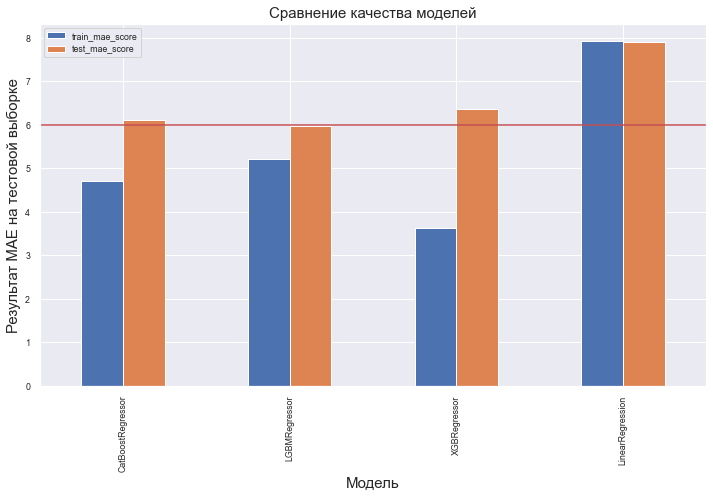

In [64]:
#Посмотрим на графике на результаты MAE на обучающей и тестовой выборках
plt.figure(figsize=(10, 7))
plt.subplot(111)
results.plot(kind='bar', ax=plt.gca()).hlines(6, -1, 5, color = 'r')
plt.xlabel('Модель', fontsize=15)
plt.ylabel('Результат MAE на тестовой выборке', fontsize=15)
plt.title('Сравнение качества моделей', fontsize=15)
plt.tight_layout()

Вывод:

- Провели подбор параметров к 4м моделям CatBoost, LightGBM, XGboost и LinearRegression
- Наилучшие результаты получили у LightGBM  с результатом 5.96 на тестовой выборке
- У CatBoost и XGBoost по ~6 MAE на тестовой выборке
- Хуже всего показала результат модель LinearRegression с результатом 7.9 на тестовой выборке

### Финальная модель на тестовой выборке с наилучшими параметрами

In [65]:
#С подобранными параметрами будем использовать модель CatBoost на тестовой выборке
model = lgb.LGBMRegressor(boosting_type = 'goss',
                          max_depth=3, 
                          learning_rate = 0.03, 
                          metric = 'mae', 
                          n_estimators = 500, 
                          random_state = 12345,
                          objective = 'regression')

model.fit(features_train,target_train)
predictions = model.predict(features_test)
print('MAE на тестовой выборке:', mean_absolute_error(predictions,target_test))

MAE на тестовой выборке: 5.963456987067106


### Feature Importance

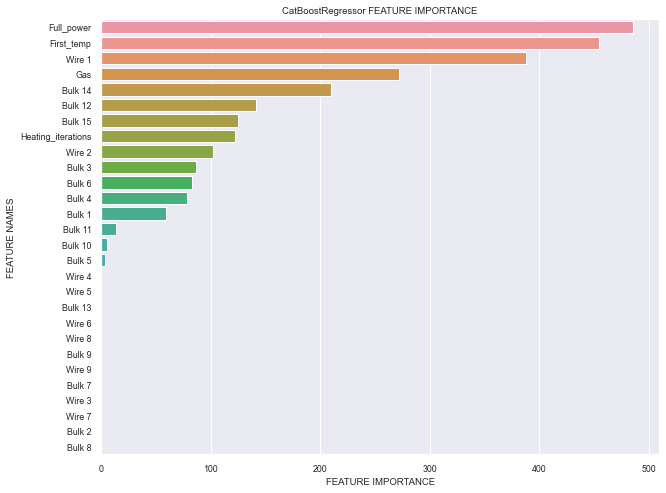

In [66]:
#Посмотрим feature importance у модели lightgbm
ds.plot_feature_importance(model.feature_importances_,features_test.columns,'CatBoostRegressor ')

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='green'> <b><u>КОММЕНТАРИЙ РЕВЬЮЕРА</u></b>
</font>
<font color='green'><br>хорошо, что используешь этот инструмент. На начальном этапе мы можем нагенерить множество разных фич, в том чтисле и лишних. И вот этот инструмент, вкупе с анализом мультиколлинеарности позволяет избавляться от "балласта")

Мы провели финальное тестирование нашей модели. Модель показала результат MAE 5.8 на тестовой выборке, что соответствует условию решения задачи. Также модель предсказывает лучше, чем наивная модель со средними значениями. 

## Общий вывод

- Мы провели Исследовательский анализ данных 
- Обработали пропуски и выбросы, которые выявили в таблицах
- Добавили несколько новых признаков для нашей модели
- Провели масштабирование признаков
- Для обучения использовали 4 модели : CatBoostRegressor, LightGBMRegressor, XGboostRegressor, LinearRegression
- Провели подбор гиперпараметров с помощью GridSearchCV
- Набрали наилучший результат MAE 5.8 на тестовой выборке CatBoostRegressor
- Так же выявили признаки, которые больше всего влияют на модель это Начальная температура, Полная мощность и Wire 1

<div style="background: #cceeaa; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='green'> <b><u>КОММЕНТАРИЙ РЕВЬЮЕРА</u></b>
</font>
<font color='green'><br>
Илья, однозначно сильная работа!!!<br>
Я бы привёл ещё такие эпитеты: смелый, аналитический, вдумчивый проект.<br>
Правда, было интерсно погружать в твои рассуждения и следить  за ними.<br>
C позиции логики построения модели - мне всё понятно.<br>
 
Технически - добротная работа. <br>
Всегда стараюсь на этом проекте сказать всем вот ещё что: цель заказчика - экономия энергоресурсов.<br>
И в этом проекте искали как раз способ точно предсказывать температуру. И круто использовали для этого весь арсенал<br>
А если рассудать с позиции такой: а что нужно сделать, чтобы снизить энергопотребление?<br>
Судя по модели, самым важным фактором является первая температура. Это значит, что управляя ею, мы сможем управлять энергозатратами. Вывод понятен. Теперь надо разработать мероприятия для этого решения. И тут вопрос возникает скм собой: а это так точно? мы можем управлять первой температурой? В общем, наша модель - только начало работы над энергоэффективностью.<br>
    
Так же есть ещё одна идея, которую хотел предложить тебе на обсуждение.<br>
Возможно, покажется интересным<br><br> 

Дело касается принципиально иного подхода к поиску решения для снижения энергопотребления на производстве<br>
Смотри, Создание данной модели (таково было задание) двигалось по пути "угадывания" температуры<br>
Но мы же знаем жизнь)) лёгкие колебания температур (как и нашего настроения, нашего веса.....)<br>
есть всегда. Более того - будут вегда! И нам что, стараться угадывать их?<br>
Не угонимся, "пупок" развяжется))))) <br>
Предложу для подобных проектов подумать вот в какую сторону<br>
    
Итак, разброс в измерениях - есть, был и будет!! (т.к. этому благоприятствует разнообразие факторов самого проиозводства)<br>
    Тогда задачу можно поставить так: <u>надо уменьшить разброс в измерениях</u>. В данном случае в температуре.<br>
Один из подходов такой: Наверняка есть границы, в пределах которых колебания температур - дело нормальное.<br>
А что, если фикировать случаи, когда температура выходит за эти границы?<br>
Скажем, как "1". И тогда для таких моментов времени собирать инфо по производству: <br>
а что был за материал (химия материала), что был за газ (химический состав газа), какая бригада работала, <br>
что там было с электродами, ограничения только в фантазиях ну и в знаниях самого производства..... <br>
И вот тут можем реально находить причины (через корреляции, проверки гипотез, разные модельки...), фиксировать эти причины. <br>
Ну и разрабатывать энергосберегательные мероприятия.<br><br>
 
<font color='green'>

Спасибо за этот труд и за совместную работу на других проектах)<br>
Искренне желаю покорить ещё не один аналитический Эверест)<br>
    
Ждал около 2-х часов расчёта.....но тут умирает кернел..( аааааа, не хватит меня  на очередной запуск) Но твои расчёты и график важности в конце (то, что не позволят сейчас запустить керенл - видел. Сначала я, обычно глазами смотрю, а потом уже всё запускаю)

<div style="background: grey; padding: 5px; border: 1px solid green; border-radius: 5px;">
    <font color='Black'> <b><u>КОММЕНТАРИЙ Студента</u></b>
</font>
<font color='black'><br>
Спасибо за подробный фидбэк!<br>
У меня считалось все намного быстрее минут 10. Видимо это все новый Apple M1 быстро считает

## Отчет по решению

### Какие пункты плана были выполнены, а какие — нет (поясните почему)?


_____


## План работы:
    

### Исследовательский Анализ Данных
- [x]   Импортируем данные, проведем исследовательский анализ данных.
- [x]   Проведем предобработку данных

### Предобработка данных

- Подготоим данные:
- [x]   Объединим таблицы в один датасет для нашей будущей модели
- [x]   Обработаем пропуски
- [x]   Целевой признак - Последняя температура
- [x]   Проведем срез данных по Key до начиная с 2500 партии

### Обучение моделей и подбор параметров

- [x]   Будем использовать XGBoost, CatBoost, LightGBM, LinearRegression с подбором нужных параметров
- [x]   Сравним полученные результаты наших моделей и выделим лучшую
- [x]   Проверим на тестовой выборке
- [x]   Напишем отчет


### Первоначальный план выполнен полностью



______

### Какие трудности возникли и как вы их преодолели?


- Основная трудность была понять какие данные нужно отрезать, т.к. из-за выбросов модель жестко колбасило.
- Также долго не мог понять почему у меня на обучение модель показывала хороший MAE, а тесте в 10х раз хуже, оказалось неправильно стандратизировал. Пришлось еще раз перечитать документацию и перезапустить весь код. Только после этого все залетало

### Какие ключевые шаги в решении задачи выделили?


- Исследование данных, чтобы понять какие признаки войдут в модель
- Предобработках данных для приведение признаков в вид необходимый для обучения, а также исключение выбросов и данных с пропусками.
- Соединил все таблицы в одну итоговую таблицу и разделили данные на выборки в размере на 30% тест и 70% на обучение
- Выполнил подбор параметров с помощью GridSearchCV по четырем моделям: CatBoost, LightGBM, XGboost и LinearRegression

### Какая ваша итоговая модель и какое у неё качество?

- LightGBM показала наилучшие результаты на тестовое выборки и значение MAE равно 5.96
- Результаты MAE по моделям CatBoost и XGBoost находится на уровне ~6 на тестовой выборке